# 예림님 코드

In [ ]:
import pandas as pd

In [ ]:
site_area = pd.read_csv('../data/site_area.csv')
site_area.head(2) # 지점 면적

,site_id,area_pyeong
0,1,50
1,2,100


In [ ]:
access_log = pd.read_csv('../data/trial_access_log.csv')
access_log.head(2) # 출입 로그

,id,checkin,cdate,site_id,user_uuid
0,1719038,1,2023-07-07 07:11:55.201673,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
1,1716702,2,2023-07-06 15:15:58.761284,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89


In [ ]:
payment = pd.read_csv('../data/trial_payment.csv')
payment.head(2) # 결제 여부

,is_payment,user_uuid
0,0,2b251333-8676-4c11-a736-dcf2350f8821
1,0,e111619a-0975-451b-9a4a-bc8aea7b7b84


In [ ]:
register = pd.read_csv('../data/trial_register.csv')
register.head(2) # 3일 체험 신청

,trial_date,user_uuid
0,2023-12-21,2b251333-8676-4c11-a736-dcf2350f8821
1,2023-12-21,e111619a-0975-451b-9a4a-bc8aea7b7b84


In [ ]:
visit = pd.read_csv('../data/trial_visit_info.csv')
visit.head(2) # 일자별 방문

,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid
0,1,2023-12-23,01:11:19.983486,4279,2023-12-23 16:11:25.345793,2023-12-23 17:25:32.233995,939fc566-61cd-47f0-a3ce-e2936fdcff73
1,1,2023-12-24,04:35:10.361341,16510,2023-12-24 16:10:45.668026,2023-12-24 20:53:34.842447,939fc566-61cd-47f0-a3ce-e2936fdcff73


In [ ]:
tables = {
    'register':register,
    'payment':payment,
    'visit':visit,
    'access_log':access_log,
    'site_area':site_area
}

for name, df in tables.items():
    print(f'\n[{name}]')
    print('행 수 :', len(df))
    print('컬럼 :', df.columns.tolist())
    print('결측치 :')
    print(df.isna().sum())


[register]
행 수 : 9659
컬럼 : ['trial_date', 'user_uuid']
결측치 :
trial_date    0
user_uuid     0
dtype: int64

[payment]
행 수 : 9659
컬럼 : ['is_payment', 'user_uuid']
결측치 :
is_payment    0
user_uuid     0
dtype: int64

[visit]
행 수 : 11477
컬럼 : ['site_id', 'date', 'stay_time', 'stay_time_second', 'first_enter_time', 'last_leave_time', 'user_uuid']
결측치 :
site_id               0
date                  0
stay_time             0
stay_time_second      0
first_enter_time    555
last_leave_time     555
user_uuid             0
dtype: int64

[access_log]
행 수 : 63708
컬럼 : ['id', 'checkin', 'cdate', 'site_id', 'user_uuid']
결측치 :
id           0
checkin      0
cdate        0
site_id      0
user_uuid    0
dtype: int64

[site_area]
행 수 : 9
컬럼 : ['site_id', 'area_pyeong']
결측치 :
site_id        0
area_pyeong    0
dtype: int64


In [ ]:
# visit 결측치
# 최초 입실 / 최종 퇴실을 할 때 앞에 분에 따라 들어오는 경우가 있어서 기록이 남지 않는 경우 있음

In [ ]:
# 유저 기준 중복행 확인

print('register 중복 유저 수 :')
print(register['user_uuid'].value_counts().value_counts())

print('\npayment 중복 유저 수 :')
print(payment['user_uuid'].value_counts().value_counts())

register 중복 유저 수 :
count
1    9589
2      35
Name: count, dtype: int64

payment 중복 유저 수 :
count
1    9589
2      35
Name: count, dtype: int64


In [ ]:
print('완전 중복 행 수 :')
print('register :', register.duplicated().sum())
print('payment :', payment.duplicated().sum())
print('visit :', visit.duplicated().sum())
print('access_log :', access_log.duplicated().sum())

완전 중복 행 수 :
register : 28
payment : 35
visit : 48
access_log : 359


### register

In [ ]:
# register 전체 행 수 : 9659
# register 고유 유저 : 1회 등장 유저 + 2회 등장 유저 = 9589 + 35 = 9624
# (9589 * 1) + (35 * 2) = 9659 => 전체 행 수 나옴

In [ ]:
register.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9659 entries, 0 to 9658
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   trial_date  9659 non-null   object
 1   user_uuid   9659 non-null   object
dtypes: object(2)
memory usage: 151.1+ KB


In [ ]:
# register['trial_date'] datetime 변경
register['trial_date'] = pd.to_datetime(register['trial_date'])

In [ ]:
register['trial_date'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 9659 entries, 0 to 9658
Series name: trial_date
Non-Null Count  Dtype         
--------------  -----         
9659 non-null   datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 75.6 KB


In [ ]:
# 유저별로 신청 횟수와 신청 날짜 갯수 확인

register_check = (
    register.groupby('user_uuid')
    .agg(
        register_count=('trial_date', 'count'), # 신청 기록이 몇 줄 인가
        trial_date_count=('trial_date', 'nunique') # 서로 다른 신청 날짜가 몇 개 인가
    )
    .reset_index()
)

register_check.head(3)

,user_uuid,register_count,trial_date_count
0,000590dc-046f-462b-8225-4c81a97b7166,1,1
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,1,1
2,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1,1


In [ ]:
# 신청 기록이 2개 이상인 유저
duplicated_register_users = register_check[register_check['register_count'] >= 2]
print(len(duplicated_register_users))
print(len(duplicated_register_users) / register["user_uuid"].nunique() * 100)
# 35명 중복
# 중복 신청 유저 비율 36.3%

35
0.3636741479634248


In [ ]:
duplicated_register_users.head()

,user_uuid,register_count,trial_date_count
86,02458b10-7f2b-4030-950b-ba650ce2fb49,2,1
139,039fa563-fc65-4b0c-9087-4beb5cd17fd7,2,1
278,06e78cdd-c7f0-4b45-af6d-9126125d0686,2,1
359,091cdea5-fc99-47fd-a722-3fe190f9cb26,2,1
819,14872783-3af7-492a-b51c-12f3003b76f1,2,2


In [ ]:
# 같은 날 중복 신청한 유저 수
# register_count = 2
# trial_date_count = 1

In [ ]:
# 같은 날 중복 신청한 유저만 추출
same_day_duplicate = duplicated_register_users[duplicated_register_users['trial_date_count'] == 1]
len(same_day_duplicate)

28

In [ ]:
# 다른 날 중복 신청한 유저 수
# register_count = 2
# trial_date_count = 2

In [ ]:
# 다른 날 중복 신청한 유저만 추출
dif_day_duplicate = duplicated_register_users[duplicated_register_users['trial_date_count'] >= 2]
len(dif_day_duplicate)

7

In [ ]:
# 중복 신청 유저들의 원본 신청 데이터 확인
register_duplicate_detail = register[
    register['user_uuid']
    .isin(duplicated_register_users['user_uuid'])
    ].sort_values(['user_uuid', 'trial_date'])
register_duplicate_detail

,trial_date,user_uuid
340,2023-12-11,02458b10-7f2b-4030-950b-ba650ce2fb49
341,2023-12-11,02458b10-7f2b-4030-950b-ba650ce2fb49
132,2023-11-24,039fa563-fc65-4b0c-9087-4beb5cd17fd7
133,2023-11-24,039fa563-fc65-4b0c-9087-4beb5cd17fd7
175,2023-11-27,06e78cdd-c7f0-4b45-af6d-9126125d0686
...,...,...
6901,2023-01-19,eff4950f-de9f-449b-8a18-eb1d1019acf5
241,2023-12-03,f655be50-4b26-46cb-823b-bcc01108b3cc
242,2023-12-03,f655be50-4b26-46cb-823b-bcc01108b3cc
835,2021-06-16,ffd880d5-0200-44e1-91db-7df9483f2a39


In [ ]:
# register 전처리 : 유저당 1행으로 정리
register_clean = (
    register
    .groupby('user_uuid')
    .agg(
        trial_date=('trial_date','min'), # 최초 신청일
        register_count=('trial_date', 'count'), # 총 신청 기록 수
        trial_date_count=('trial_date', 'nunique') # 서로 다른 신청 날짜 수
    ). reset_index()
)
register_clean.head(2)

,user_uuid,trial_date,register_count,trial_date_count
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-04,1,1
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,2021-10-16,1,1


In [ ]:
# 서로 다른 날 재신청 여부
register_clean['re_register_yn'] = (
    register_clean['trial_date_count'] >= 2
).astype(int)

register_clean[register_clean['re_register_yn'] ==1]

,user_uuid,trial_date,register_count,trial_date_count,re_register_yn
819,14872783-3af7-492a-b51c-12f3003b76f1,2022-01-28,2,2,1
2446,4008307f-486f-408f-b90b-e01398972029,2021-09-06,2,2,1
3493,5b16f32b-3344-4b39-b2bf-8cf1caac78fa,2022-03-14,2,2,1
4059,6a88014b-fbbd-4e73-8036-04435c062a97,2022-09-05,2,2,1
7149,bd3ed6c2-f139-4e0c-b53e-b956101b2822,2022-08-02,2,2,1
7216,bf620970-e3f2-4b54-9620-86171299d08b,2021-10-28,2,2,1
9620,ffd880d5-0200-44e1-91db-7df9483f2a39,2021-06-16,2,2,1


In [ ]:
print('행 수 :', len(register_clean))
print('고유 유저 수 :', register_clean['user_uuid'].nunique())
print('재신청 유저 수 :', register_clean['re_register_yn'].sum())

# 신청 기록 수 분포 확인
print(register_clean['register_count'].value_counts())

행 수 : 9624
고유 유저 수 : 9624
재신청 유저 수 : 7
register_count
1    9589
2      35
Name: count, dtype: int64


In [ ]:
# 같은 날 2회 신청은 중복 기록으로 보고
# 다른 날 2회 신청을 재신청 유저로 봄

### payment

In [ ]:
payment.head(2)

,is_payment,user_uuid
0,0,2b251333-8676-4c11-a736-dcf2350f8821
1,0,e111619a-0975-451b-9a4a-bc8aea7b7b84


In [ ]:
payment.shape

(9659, 2)

In [ ]:
print('payment 중복 유저 수 :')
print(payment['user_uuid'].value_counts().value_counts())
print('payment :', payment.duplicated().sum())

payment 중복 유저 수 :
count
1    9589
2      35
Name: count, dtype: int64
payment : 35


In [ ]:
payment['is_payment'].value_counts() # 0 : 미결제, 1: 결제

is_payment
0    5995
1    3664
Name: count, dtype: int64

In [ ]:
# 유저별 결제 기록 개수, 결제값 종류 개수 확인

payment_check = (
    payment
    .groupby('user_uuid')
    .agg(
        payment_count=('is_payment','count'), # 결제 테이블에 몇 줄 있는가
        payment_value_count=('is_payment','nunique'), # 결제값 종류가 몇 개인가
        min_payment=('is_payment','min'),
        max_payment=('is_payment','max')
    ).reset_index()
)

In [ ]:
payment_check.head(2)

,user_uuid,payment_count,payment_value_count,min_payment,max_payment
0,000590dc-046f-462b-8225-4c81a97b7166,1,1,0,0
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,1,1,0,0


In [ ]:
# 2줄 이상 있는 유저만 확인
duplicated_payment_user = payment_check[payment_check['payment_count'] >= 2]
len(duplicated_payment_user)

35

In [ ]:
duplicated_payment_user.head()

,user_uuid,payment_count,payment_value_count,min_payment,max_payment
86,02458b10-7f2b-4030-950b-ba650ce2fb49,2,1,1,1
139,039fa563-fc65-4b0c-9087-4beb5cd17fd7,2,1,0,0
278,06e78cdd-c7f0-4b45-af6d-9126125d0686,2,1,1,1
359,091cdea5-fc99-47fd-a722-3fe190f9cb26,2,1,1,1
819,14872783-3af7-492a-b51c-12f3003b76f1,2,1,0,0


In [ ]:
duplicated_payment_user['payment_value_count'].value_counts() # 중복 유저 35명 모두 결제값이 서로 같다.

payment_value_count
1    35
Name: count, dtype: int64

In [ ]:
payment_clean = (
    payment
    .groupby('user_uuid')
    .agg(
        is_payment=('is_payment','max') # 중복 값이 같아서 max/min 같은 결과임
    ).reset_index()
)

payment_clean.head()

,user_uuid,is_payment
0,000590dc-046f-462b-8225-4c81a97b7166,0
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0
2,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1
3,0013f481-efed-4508-8836-70cbd64c477e,1
4,0018e22d-a2cc-4e06-bca2-d6a041770f3b,0


In [ ]:
print("payment_clean 행 수:", len(payment_clean))
print("고유 유저 수:", payment_clean["user_uuid"].nunique())
print(payment_clean["is_payment"].value_counts())

payment_clean 행 수: 9624
고유 유저 수: 9624
is_payment
0    5972
1    3652
Name: count, dtype: int64


In [ ]:
len(payment_clean[payment_clean["is_payment"] == 0]) / len(payment_clean) * 100

62.05320033250208

In [ ]:
len(payment_clean[payment_clean["is_payment"] == 1]) / len(payment_clean) * 100

37.94679966749792

### register + payment merge

In [ ]:
# register_clean 과 payment_clean 1:1 매칭 확인
user_base = register_clean.merge(
    payment_clean,
    on='user_uuid',
    how='left'
)

# 결과 확인
print('user_base 행 수 :', len(user_base))
print('고유 유저 수 :', user_base['user_uuid'].nunique())
print('결제 여부 결측치 :', user_base['is_payment'].isna().sum())

user_base 행 수 : 9624
고유 유저 수 : 9624
결제 여부 결측치 : 0


### visit

In [ ]:
visit.head()

,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid
0,1,2023-12-23,01:11:19.983486,4279,2023-12-23 16:11:25.345793,2023-12-23 17:25:32.233995,939fc566-61cd-47f0-a3ce-e2936fdcff73
1,1,2023-12-24,04:35:10.361341,16510,2023-12-24 16:10:45.668026,2023-12-24 20:53:34.842447,939fc566-61cd-47f0-a3ce-e2936fdcff73
2,1,2023-12-25,02:09:54.117163,7794,2023-12-25 10:19:47.087268,2023-12-25 12:39:51.221372,939fc566-61cd-47f0-a3ce-e2936fdcff73
3,1,2023-12-23,04:37:36.134901,16656,2023-12-23 14:49:40.302823,2023-12-23 19:27:39.406803,ba49324f-d317-4053-adf9-2b17b3f07594
4,3,2023-12-26,04:32:05.289251,16325,2023-12-26 14:57:10.220793,2023-12-26 19:34:36.971542,ba49324f-d317-4053-adf9-2b17b3f07594


In [ ]:
visit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11477 entries, 0 to 11476
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   site_id           11477 non-null  int64 
 1   date              11477 non-null  object
 2   stay_time         11477 non-null  object
 3   stay_time_second  11477 non-null  int64 
 4   first_enter_time  10922 non-null  object
 5   last_leave_time   10922 non-null  object
 6   user_uuid         11477 non-null  object
dtypes: int64(2), object(5)
memory usage: 627.8+ KB


In [ ]:
# date 컬럼 datetime 변경
visit['date'] = pd.to_datetime(visit['date'])

In [ ]:
visit['date'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 11477 entries, 0 to 11476
Series name: date
Non-Null Count  Dtype         
--------------  -----         
11477 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 89.8 KB


In [ ]:
print('방문 시작일 :',visit['date'].min())
print('방문 종료일 :',visit['date'].max())

방문 시작일 : 2021-05-02 00:00:00
방문 종료일 : 2024-01-02 00:00:00


In [ ]:
after_period_visit = visit[visit['date'] > '2023-12-31']
len(after_period_visit)

15

In [ ]:
after_period_visit['user_uuid'].nunique()

13

In [ ]:
after_period_visit.sort_values('date')

,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid
25,4,2024-01-01,00:55:41.445430,3341,2024-01-01 17:39:42.078159,2024-01-01 18:38:05.414576,e80f7f66-f24a-4637-95c9-20288fd811ee
28,4,2024-01-01,00:57:51.989036,3471,2024-01-01 17:39:46.235088,2024-01-01 18:37:38.224124,d16cd121-9802-4880-8879-2eaf09fe99c5
58,3,2024-01-01,07:43:32.500512,27812,2024-01-01 15:00:15.454616,2024-01-01 23:36:13.477611,0e58ea5a-ebe4-48cb-b31b-d02a4f350cf8
60,3,2024-01-01,03:17:11.472880,11831,2024-01-01 15:01:58.792076,2024-01-01 18:21:36.065290,aa4773c8-dbc9-4c80-849b-1ab8d1db7bda
61,3,2024-01-01,00:57:42.282327,3462,2024-01-01 17:52:32.264924,2024-01-01 18:50:14.547251,3fb96714-db4d-4896-b821-df6fc1d93fe5
64,3,2024-01-01,04:47:05.102656,17225,2024-01-01 12:05:05.841506,2024-01-01 21:37:40.489976,418edd26-c1c1-49f6-b67f-3b29c3e868e9
90,6,2024-01-01,08:53:41.982624,32021,2024-01-01 14:19:47.583640,2024-01-01 23:17:29.850484,516c8142-ae8d-4c6f-85d9-2025c14fbd33
92,4,2024-01-01,03:59:20.004848,14360,2024-01-01 14:30:55.279667,2024-01-01 18:33:02.104582,e9b1a5df-d70c-4ccf-af22-64fdae98d3a2
100,6,2024-01-01,04:02:05.462200,14525,2024-01-01 12:05:16.347808,2024-01-01 16:09:01.056040,acf3e288-4487-492b-9477-df149fb72e83
101,6,2024-01-01,04:02:05.462200,14525,2024-01-01 12:05:16.347808,2024-01-01 16:09:01.056040,acf3e288-4487-492b-9477-df149fb72e83


In [ ]:
len(after_period_visit) / len(visit) * 100 # 0.13%

0.13069617495861288

In [ ]:
# 2023년 말 신청자의 3일 체험 방문 일 수 있으니
# 방문 시록 신청일 붙여서 확인해보기
after_period_check = after_period_visit.merge(
    register_clean[['user_uuid', 'trial_date']],
    on='user_uuid',
    how='left'
)
after_period_check.head()

,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid,trial_date
0,4,2024-01-01,00:55:41.445430,3341,2024-01-01 17:39:42.078159,2024-01-01 18:38:05.414576,e80f7f66-f24a-4637-95c9-20288fd811ee,2023-12-30
1,4,2024-01-01,00:57:51.989036,3471,2024-01-01 17:39:46.235088,2024-01-01 18:37:38.224124,d16cd121-9802-4880-8879-2eaf09fe99c5,2023-12-30
2,3,2024-01-01,07:43:32.500512,27812,2024-01-01 15:00:15.454616,2024-01-01 23:36:13.477611,0e58ea5a-ebe4-48cb-b31b-d02a4f350cf8,2023-12-31
3,3,2024-01-01,03:17:11.472880,11831,2024-01-01 15:01:58.792076,2024-01-01 18:21:36.065290,aa4773c8-dbc9-4c80-849b-1ab8d1db7bda,2023-12-30
4,3,2024-01-01,00:57:42.282327,3462,2024-01-01 17:52:32.264924,2024-01-01 18:50:14.547251,3fb96714-db4d-4896-b821-df6fc1d93fe5,2023-12-29


In [ ]:
after_period_check['visit_gap_day'] = (
    after_period_check['date'] - after_period_check['trial_date']  
).dt.days
after_period_check.sort_values(['user_uuid', 'visit_gap_day'])

,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid,trial_date,visit_gap_day
12,47,2024-01-01,05:01:12.233821,18072,2024-01-01 13:34:48.015981,2024-01-01 18:54:13.782909,06bbc34a-80ad-4fe7-af86-353204eda243,2023-12-30,2
2,3,2024-01-01,07:43:32.500512,27812,2024-01-01 15:00:15.454616,2024-01-01 23:36:13.477611,0e58ea5a-ebe4-48cb-b31b-d02a4f350cf8,2023-12-31,1
14,49,2024-01-01,01:53:53.690012,6833,2024-01-01 14:01:18.626838,2024-01-01 15:58:02.826332,2d420a09-9889-412a-a06a-5c31c9989572,2023-12-29,3
4,3,2024-01-01,00:57:42.282327,3462,2024-01-01 17:52:32.264924,2024-01-01 18:50:14.547251,3fb96714-db4d-4896-b821-df6fc1d93fe5,2023-12-29,3
5,3,2024-01-01,04:47:05.102656,17225,2024-01-01 12:05:05.841506,2024-01-01 21:37:40.489976,418edd26-c1c1-49f6-b67f-3b29c3e868e9,2023-12-30,2
6,3,2024-01-02,00:40:41.437182,2441,2024-01-02 19:37:50.345305,2024-01-02 20:20:08.337566,418edd26-c1c1-49f6-b67f-3b29c3e868e9,2023-12-30,3
7,6,2024-01-01,08:53:41.982624,32021,2024-01-01 14:19:47.583640,2024-01-01 23:17:29.850484,516c8142-ae8d-4c6f-85d9-2025c14fbd33,2023-12-30,2
11,17,2024-01-01,02:40:33.411593,9633,2024-01-01 11:41:09.536085,2024-01-01 19:02:48.664526,a75029c4-57c6-4f98-bb8f-c669e3371eaa,2023-12-31,1
13,47,2024-01-01,05:10:16.573856,18616,2024-01-01 13:34:57.558388,2024-01-01 18:54:09.433013,a86e2828-1e68-43d3-ace8-2b8b63a07173,2023-12-30,2
3,3,2024-01-01,03:17:11.472880,11831,2024-01-01 15:01:58.792076,2024-01-01 18:21:36.065290,aa4773c8-dbc9-4c80-849b-1ab8d1db7bda,2023-12-30,2


In [ ]:
visit.head(3)

,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid
0,1,2023-12-23,01:11:19.983486,4279,2023-12-23 16:11:25.345793,2023-12-23 17:25:32.233995,939fc566-61cd-47f0-a3ce-e2936fdcff73
1,1,2023-12-24,04:35:10.361341,16510,2023-12-24 16:10:45.668026,2023-12-24 20:53:34.842447,939fc566-61cd-47f0-a3ce-e2936fdcff73
2,1,2023-12-25,02:09:54.117163,7794,2023-12-25 10:19:47.087268,2023-12-25 12:39:51.221372,939fc566-61cd-47f0-a3ce-e2936fdcff73


In [ ]:
# 중복 확인
print('visit 완전 중복 행 수:', visit.duplicated().sum())

visit 완전 중복 행 수: 48


In [ ]:
visit_duplicate_rows = visit[visit.duplicated(keep=False)] # 중복 모두 보여줌
visit_duplicate_rows.sort_values(['user_uuid','date','site_id']).head(10)

,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid
2370,1,2023-12-11,01:56:59.550903,7019,2023-12-11 19:37:22.651426,2023-12-11 21:35:17.857533,02458b10-7f2b-4030-950b-ba650ce2fb49
2371,1,2023-12-11,01:56:59.550903,7019,2023-12-11 19:37:22.651426,2023-12-11 21:35:17.857533,02458b10-7f2b-4030-950b-ba650ce2fb49
2368,1,2023-12-13,01:56:13.071122,6973,2023-12-13 19:46:01.825893,2023-12-13 21:42:14.897015,02458b10-7f2b-4030-950b-ba650ce2fb49
2369,1,2023-12-13,01:56:13.071122,6973,2023-12-13 19:46:01.825893,2023-12-13 21:42:14.897015,02458b10-7f2b-4030-950b-ba650ce2fb49
2372,1,2023-12-14,01:18:46.520733,4726,2023-12-14 19:41:49.902190,2023-12-14 21:00:36.422923,02458b10-7f2b-4030-950b-ba650ce2fb49
2373,1,2023-12-14,01:18:46.520733,4726,2023-12-14 19:41:49.902190,2023-12-14 21:00:36.422923,02458b10-7f2b-4030-950b-ba650ce2fb49
1995,17,2023-11-24,01:55:07.488679,6907,2023-11-24 14:26:26.401007,2023-11-24 16:21:33.889686,039fa563-fc65-4b0c-9087-4beb5cd17fd7
1996,17,2023-11-24,01:55:07.488679,6907,2023-11-24 14:26:26.401007,2023-11-24 16:21:33.889686,039fa563-fc65-4b0c-9087-4beb5cd17fd7
1997,1,2023-11-25,05:49:31.910683,20971,2023-11-25 15:01:40.983465,2023-11-25 23:59:59,039fa563-fc65-4b0c-9087-4beb5cd17fd7
1998,1,2023-11-25,05:49:31.910683,20971,2023-11-25 15:01:40.983465,2023-11-25 23:59:59,039fa563-fc65-4b0c-9087-4beb5cd17fd7


In [ ]:
# 중복 제거 필요
visit_clean_1 = visit.drop_duplicates()

# 제거 결과 확인
print("원본 visit 행 수:", len(visit))
print("중복 제거 후 행 수:", len(visit_clean_1))
print("제거된 행 수:", len(visit) - len(visit_clean_1))

원본 visit 행 수: 11477
중복 제거 후 행 수: 11429
제거된 행 수: 48


In [ ]:
# 같은 유저가 같은 날짜에 방문 기록이 여러 개인 경우 확인
visit_user_date_check = (
    visit_clean_1
    .groupby(['user_uuid','date'])
    .agg(
        row_count=('date','count'),
        site_count=('site_id','nunique'),
        total_stay_second=('stay_time_second','sum')
    ).reset_index()
)

In [ ]:
visit_user_date_check.head(2)

,user_uuid,date,row_count,site_count,total_stay_second
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-05,1,1,21417
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-09-30,1,1,10222


In [ ]:
# 같은 유저-같은 날짜에 2줄 이상 있는 경우
multi_visit_same_day = visit_user_date_check[visit_user_date_check['row_count'] >= 2]
len(multi_visit_same_day)

107

In [ ]:
multi_visit_same_day['user_uuid'].nunique()

105

In [ ]:
multi_visit_same_day['site_count'].value_counts() # 같은 유저가 같은 날짜에 몇개의 지점을 방문한 기록이 있는가

site_count
2    68
1    36
3     3
Name: count, dtype: int64

In [ ]:
same_site_multi_visit = visit_user_date_check[visit_user_date_check['site_count'] == 1]
same_site_multi_visit.head(2) # 같은 유저, 같은 날짜, 같은 지점인데 방문 기록이 여러줄인 케이스

,user_uuid,date,row_count,site_count,total_stay_second
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-05,1,1,21417
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-09-30,1,1,10222


In [ ]:
len(same_site_multi_visit)

11244

In [ ]:
# 같은 날짜 + 같은 지점에서 여러 줄인 케이스의 원본 행 확인
same_site_multi_detail = visit_clean_1.merge(
    same_site_multi_visit[['user_uuid','date']],
    on=['user_uuid','date'],
    how='inner'
).sort_values(['user_uuid','date','site_id','first_enter_time'])

same_site_multi_detail.head()

,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid
9630,6,2023-09-05,05:56:57.911500,21417,2023-09-05 11:57:01.148452,2023-09-05 17:59:45.443621,000590dc-046f-462b-8225-4c81a97b7166
2956,3,2021-09-30,02:50:22.792298,10222,2021-09-30 16:31:14.683437,2021-09-30 20:25:41.659501,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c
2955,3,2021-10-01,02:36:22.675157,9382,2021-10-01 19:30:20.712177,2021-10-01 22:08:58.748107,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c
2954,3,2021-10-02,07:12:45.416845,25965,2021-10-02 13:41:08.211652,2021-10-02 22:20:02.600559,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c
10932,6,2023-11-15,11:55:00.345584,42900,2023-11-15 09:44:07.947297,2023-11-15 21:47:12.944689,0018e22d-a2cc-4e06-bca2-d6a041770f3b


In [ ]:
# 같은 유저-같은 날짜-같은 지점 기준으로 몇 줄씩 있는지 확인
same_user_date_site_check = (
    visit_clean_1
    .groupby(['user_uuid','date','site_id'])
    .agg(
        row_count=('site_id','count'),
        total_stay_second=('stay_time_second','sum')
    ).reset_index()
)

In [ ]:
same_user_date_site_check.head(2)

,user_uuid,date,site_id,row_count,total_stay_second
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-05,6,1,21417
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-09-30,3,1,10222


In [ ]:
# 같은 유저-같은 날짜-같은 지점인데 2줄 이상인 경우
same_user_date_site_duplicate = same_user_date_site_check[same_user_date_site_check['row_count'] >= 2]
same_user_date_site_duplicate.head(2)

,user_uuid,date,site_id,row_count,total_stay_second
731,0dd1d43b-95e6-4de8-bcd1-25d6ea911c24,2023-04-18,4,2,30789
1012,137c3861-59a4-4ed4-aa06-e00118950edc,2023-03-08,6,2,61441


In [ ]:
len(same_user_date_site_duplicate)

36

In [ ]:
same_user_date_site_duplicate['row_count'].value_counts()

row_count
2    33
3     2
4     1
Name: count, dtype: int64

In [ ]:
# 같은 지점에서 하루  방문 기록이 여러줄로 나눠진 케이스 36건
# 완전 중복이라고 볼 수 없을듯 함
# 같은 날 같은 지점에서 여러번 입실/퇴실 했을 수 있기 때문

In [ ]:
# 같은 유저, 날짜, 지점 중복 그룹의 총 체류 시간 확인
same_user_date_site_duplicate["total_stay_hour"] = same_user_date_site_duplicate['total_stay_second'] / 3600
same_user_date_site_duplicate["total_stay_hour"].describe()

C:\Users\shg00\AppData\Local\Temp\ipykernel_13664\1850491443.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  same_user_date_site_duplicate["total_stay_hour"] = same_user_date_site_duplicate['total_stay_second'] / 3600


count    36.000000
mean      7.105417
std       5.331128
min       0.935000
25%       2.933819
50%       5.457639
75%       9.293750
max      21.726111
Name: total_stay_hour, dtype: float64

In [ ]:
# 유저-날짜-지점 단위 방문 데이터 정리
visit_clean_2 = (
    visit_clean_1
    .groupby(['user_uuid','date','site_id'])
    .agg(
        stay_time_second=('stay_time_second','sum'), # 체류 시간 합산
        first_enter_time=('first_enter_time','min'), # 가장 이른 입실 시간
        last_leave_time=('last_leave_time','max') # 가장 늦은 퇴실 시간
    ).reset_index()
)

print("visit_clean_1 행 수:", len(visit_clean_1))
print("visit_clean_2 행 수:", len(visit_clean_2))
print("줄어든 행 수:", len(visit_clean_1) - len(visit_clean_2))

visit_clean_1 행 수: 11429
visit_clean_2 행 수: 11389
줄어든 행 수: 40


In [ ]:
# 줄어든 행 수 40 => 2줄짜리 33건 + 3줄짜리 2건 + 4줄짜리 1건
# 같은 유저·같은 날짜·같은 지점에 여러 줄 있던 36개 그룹을 1줄씩으로 합치면서 총 40행

In [ ]:
# visit_clean_2에서 같은 유저, 날짜, 지점 중복이 없는지 확인
check_duplicate_after = (
    visit_clean_2
    .groupby(['user_uuid','date','site_id'])
    .size() # 각 묶음에 행이 몇 개 있는가
    .reset_index(name='row_count') # 개수 컬럼명을 row_count로 지정
)
check_duplicate_after['row_count'].max() # 최댓값이 1이면 모든 유저-날짜-지점 조합이 1줄씩만 있다는 뜻

1

In [ ]:
# visit_clean_2는 유저-날짜-지점 기준으로 중복이 없다.

In [ ]:
# visit_clean_2의 유저가 register_clean에도 있는지 확인

visit_user_check = visit_clean_2.merge(
    register_clean[['user_uuid','trial_date']],
    on='user_uuid',
    how='left'
)

print('visit_clean_2 행 수:',len(visit_clean_2))
print('trial_date 결측치:',visit_user_check['trial_date'].isna().sum())
print('visit_clean_2 고유 유저 수:',visit_clean_2['user_uuid'].nunique())

visit_clean_2 행 수: 11389
trial_date 결측치: 0
visit_clean_2 고유 유저 수: 6534


In [ ]:
# 방문 기록에 있는 6,534명은 모두 register_clean 에 존재하는 신청자
# 신청 기록 없이 방문 기록만 있는 유저는 없다

In [ ]:
# 신청일과 방문일 차이 계산

visit_user_check['visit_gap_day'] = (
    visit_user_check['date'] - visit_user_check['trial_date']
).dt.days

# 신청일보다 방문일이 빠른 케이스 확인
before_trial_visit = visit_user_check[
    visit_user_check['visit_gap_day'] < 0
]

print('신청일보다 빠른 방문 기록 수:',len(before_trial_visit))
print('해당 유저 수:',before_trial_visit['user_uuid'].nunique())

before_trial_visit.sort_values(["user_uuid", "date"]).head()

신청일보다 빠른 방문 기록 수: 0
해당 유저 수: 0


,user_uuid,date,site_id,stay_time_second,first_enter_time,last_leave_time,trial_date,visit_gap_day


In [ ]:
visit_user_check['visit_gap_day'].value_counts().sort_index()

visit_gap_day
0      1673
1      4109
2      3315
3      2283
83        1
127       1
128       1
129       1
130       1
159       1
161       1
201       1
381       1
Name: count, dtype: int64

In [ ]:
# 방문 기록
# D+0 : 1,673건
# D+1 : 4,109건
# D+2 : 3,315건
# D+3 : 2,283건

# 체험이 1건당 최대 3일인데
# D+83 이상 : 9건 확인 됨

In [ ]:
# 신청일 기준 D+3 초과 방문 기록 확인

after_trial_period_visit = visit_user_check[
    visit_user_check['visit_gap_day'] > 3
].sort_values(['user_uuid','date'])

after_trial_period_visit

,user_uuid,date,site_id,stay_time_second,first_enter_time,last_leave_time,trial_date,visit_gap_day
1045,14872783-3af7-492a-b51c-12f3003b76f1,2023-02-13,3,18796,2023-02-13 17:23:05.188252,2023-02-13 22:52:00.444456,2022-01-28,381
2957,4008307f-486f-408f-b90b-e01398972029,2022-03-26,2,9493,2022-03-26 19:29:12.953654,2022-03-26 22:07:26.519033,2021-09-06,201
4885,6a88014b-fbbd-4e73-8036-04435c062a97,2023-02-11,6,9831,2023-02-11 13:47:32.777119,2023-02-11 21:11:04.392102,2022-09-05,159
4886,6a88014b-fbbd-4e73-8036-04435c062a97,2023-02-13,6,6124,2023-02-13 16:08:56.876298,2023-02-13 17:51:00.957020,2022-09-05,161
8586,bd3ed6c2-f139-4e0c-b53e-b956101b2822,2022-10-24,3,9076,2022-10-24 14:13:54.961892,2022-10-24 16:46:07.381178,2022-08-02,83
8651,bf620970-e3f2-4b54-9620-86171299d08b,2022-03-04,6,3388,2022-03-04 15:33:37.672246,2022-03-04 16:30:06.428598,2021-10-28,127
8652,bf620970-e3f2-4b54-9620-86171299d08b,2022-03-05,6,20856,2022-03-05 09:20:15.496602,2022-03-05 17:34:24.140662,2021-10-28,128
8653,bf620970-e3f2-4b54-9620-86171299d08b,2022-03-06,6,7573,2022-03-06 13:46:29.147693,2022-03-06 16:36:38.001985,2021-10-28,129
8654,bf620970-e3f2-4b54-9620-86171299d08b,2022-03-07,6,2820,2022-03-07 07:29:46.728375,2022-03-07 08:16:47.118417,2021-10-28,130


In [ ]:
visit_user_check

,user_uuid,date,site_id,stay_time_second,first_enter_time,last_leave_time,trial_date,visit_gap_day
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-05,6,21417,2023-09-05 11:57:01.148452,2023-09-05 17:59:45.443621,2023-09-04,1
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-09-30,3,10222,2021-09-30 16:31:14.683437,2021-09-30 20:25:41.659501,2021-09-29,1
2,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-10-01,3,9382,2021-10-01 19:30:20.712177,2021-10-01 22:08:58.748107,2021-09-29,2
3,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-10-02,3,25965,2021-10-02 13:41:08.211652,2021-10-02 22:20:02.600559,2021-09-29,3
4,0018e22d-a2cc-4e06-bca2-d6a041770f3b,2023-11-15,6,42900,2023-11-15 09:44:07.947297,2023-11-15 21:47:12.944689,2023-11-14,1
...,...,...,...,...,...,...,...,...
11384,ffce32ca-2efc-4485-b685-4b65811c2dcf,2023-11-02,4,8450,2023-11-02 00:31:56.960674,2023-11-02 12:12:45.429876,2023-11-01,1
11385,ffd287bc-2797-4788-82fa-6268c82e7fa9,2023-04-07,6,9672,2023-04-07 15:19:52.522611,2023-04-07 18:09:40.334871,2023-04-06,1
11386,ffd287bc-2797-4788-82fa-6268c82e7fa9,2023-04-08,6,23702,2023-04-08 15:26:32.505854,2023-04-08 22:52:31.148930,2023-04-06,2
11387,ffd287bc-2797-4788-82fa-6268c82e7fa9,2023-04-09,6,19481,2023-04-09 15:14:35.807629,2023-04-09 21:07:42.050080,2023-04-06,3


In [ ]:
visit_user_summary = (
    visit_user_check
    .groupby('user_uuid')
    .agg(
        visit_days=("date", "nunique"),                 # 방문한 날짜 수
        visit_records=("date", "count"),                # 방문 기록 수
        total_stay_second=("stay_time_second", "sum"),  # 총 체류시간
        avg_stay_second=("stay_time_second", "mean"),   # 평균 체류시간
        first_visit_date=("date", "min"),               # 첫 방문일
        last_visit_date=("date", "max"),                # 마지막 방문일
        first_visit_gap=("visit_gap_day", "min")        # 신청 후 첫 방문까지 걸린 일수
    ).reset_index()
)

In [ ]:
visit_user_summary.head(2)

,user_uuid,visit_days,visit_records,total_stay_second,avg_stay_second,first_visit_date,last_visit_date,first_visit_gap
0,000590dc-046f-462b-8225-4c81a97b7166,1,1,21417,21417.000000,2023-09-05,2023-09-05,1
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,3,45569,15189.666667,2021-09-30,2021-10-02,1


In [ ]:
visit_user_summary['total_stay_hour'] = visit_user_summary['total_stay_second'] / 3600
visit_user_summary['avg_stay_hour'] = visit_user_summary['avg_stay_second'] / 3600

In [ ]:
visit_user_summary.head(2)

,user_uuid,visit_days,visit_records,total_stay_second,avg_stay_second,first_visit_date,last_visit_date,first_visit_gap,total_stay_hour,avg_stay_hour
0,000590dc-046f-462b-8225-4c81a97b7166,1,1,21417,21417.000000,2023-09-05,2023-09-05,1,5.949167,5.949167
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,3,45569,15189.666667,2021-09-30,2021-10-02,1,12.658056,4.219352


In [ ]:
# visit_user_summary 가 유저 당 1행인지 확인
print('visit_user_summary 행 수:',len(visit_user_summary))
print('고유 유저 수:', visit_user_summary['user_uuid'].nunique())

# 유저별 중복이 남아있는지 확인
print('중복 유저 수:',visit_user_summary['user_uuid'].duplicated().sum())

visit_user_summary 행 수: 6534
고유 유저 수: 6534
중복 유저 수: 0


In [ ]:
# user_base : 무료 체험 신청자 9,624명 + 결제 여부
user_base.head(2)

,user_uuid,trial_date,register_count,trial_date_count,re_register_yn,is_payment
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-04,1,1,0,0
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,2021-10-16,1,1,0,0


In [ ]:
# visit_user_summary : 실제 방문한 유저 6,534명 + 방문 행동 요약
visit_user_summary.head(2)

,user_uuid,visit_days,visit_records,total_stay_second,avg_stay_second,first_visit_date,last_visit_date,first_visit_gap,total_stay_hour,avg_stay_hour
0,000590dc-046f-462b-8225-4c81a97b7166,1,1,21417,21417.000000,2023-09-05,2023-09-05,1,5.949167,5.949167
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,3,45569,15189.666667,2021-09-30,2021-10-02,1,12.658056,4.219352


In [ ]:
# 신청자 기준 테이블에 방문 요약 데이터 붙이기
user_analysis = user_base.merge(
    visit_user_summary,
    on="user_uuid",
    how="left"
)

print("user_analysis 행 수:", len(user_analysis))
print("고유 유저 수:", user_analysis["user_uuid"].nunique())
print("결제 여부 결측치:", user_analysis["is_payment"].isna().sum())

user_analysis 행 수: 9624
고유 유저 수: 9624
결제 여부 결측치: 0


In [ ]:
user_analysis.head(2)

,user_uuid,trial_date,register_count,trial_date_count,re_register_yn,is_payment,visit_days,visit_records,total_stay_second,avg_stay_second,first_visit_date,last_visit_date,first_visit_gap,total_stay_hour,avg_stay_hour
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-04,1,1,0,0,1.0,1.0,21417.0,21417.0,2023-09-05,2023-09-05,1.0,5.949167,5.949167
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,2021-10-16,1,1,0,0,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN


In [ ]:
# 방문 여부 컬럼 만들기
# visit_days가 비어있지 않으면 방문한 유저
user_analysis["visited"] = user_analysis["visit_days"].notna().astype(int)

# 방문하지 않은 유저의 방문 관련 값은 0으로 채우기
fill_zero_cols = [
    "visit_days",
    "visit_records",
    "total_stay_second",
    "avg_stay_second",
    "first_visit_gap",
    "total_stay_hour",
    "avg_stay_hour"
]

user_analysis[fill_zero_cols] = user_analysis[fill_zero_cols].fillna(0)

# 확인
print(user_analysis["visited"].value_counts())
print(user_analysis[fill_zero_cols].isna().sum())

visited
1    6534
0    3090
Name: count, dtype: int64
visit_days           0
visit_records        0
total_stay_second    0
avg_stay_second      0
first_visit_gap      0
total_stay_hour      0
avg_stay_hour        0
dtype: int64


In [ ]:
user_analysis['visited'].mean() * 100
# 무료체험 신청자 중 실제 방문율은 약 67.89%

np.float64(67.8927680798005)

## site_area

In [ ]:
# visit_clean_2의 site_id가 site_area에 모두 있는지 확인
site_check = visit_clean_2.merge(
    site_area,
    on='site_id',
    how='left'
)

print("visit_clean_2 행 수:", len(visit_clean_2))
print("area_pyeong 결측치:", site_check["area_pyeong"].isna().sum())
print("방문 데이터 지점 수:", visit_clean_2["site_id"].nunique())
print("site_area 지점 수:", site_area["site_id"].nunique())

visit_clean_2 행 수: 11389
area_pyeong 결측치: 0
방문 데이터 지점 수: 9
site_area 지점 수: 9


In [ ]:
site_area.describe()

,site_id,area_pyeong
count,9.000000,9.000000
mean,14.888889,94.444444
std,19.348414,46.398036
min,1.000000,50.000000
25%,3.000000,50.000000
50%,5.000000,100.000000
75%,17.000000,150.000000
max,49.000000,150.000000


In [ ]:
site_area[site_area["area_pyeong"] <= 0]

,site_id,area_pyeong


In [ ]:
# 방문 기록에 지점 면적 붙이기
visit_analysis = visit_clean_2.merge(
    site_area,
    on='site_id',
    how='left'
)
print("visit_analysis 행 수:", len(visit_analysis))
print("area_pyeong 결측치:", visit_analysis["area_pyeong"].isna().sum())

visit_analysis 행 수: 11389
area_pyeong 결측치: 0


In [ ]:
# 유저별 지점별 총 체류 시간 계산
user_site_stay = (
    visit_analysis
    .groupby(['user_uuid','site_id','area_pyeong'])
    .agg(
        site_stay_second=("stay_time_second", "sum"),
        site_visit_days=("date", "nunique")
    ).reset_index()
)
user_site_stay.head(3)

,user_uuid,site_id,area_pyeong,site_stay_second,site_visit_days
0,000590dc-046f-462b-8225-4c81a97b7166,6,150,21417,1
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,150,45569,3
2,0018e22d-a2cc-4e06-bca2-d6a041770f3b,6,150,77372,2


In [ ]:
# 유저별 총 체류시간이 가장 긴 지점을 대표 지점으로 선택
main_site_by_user = (
    user_site_stay
    .sort_values(["user_uuid", "site_stay_second"], ascending=[True, False])
    .drop_duplicates(subset="user_uuid", keep="first")
    [["user_uuid", "site_id", "area_pyeong", "site_stay_second", "site_visit_days"]]
)

# 컬럼명 변경
main_site_by_user = main_site_by_user.rename(columns={
    "site_id": "main_site_id",
    "area_pyeong": "main_site_area",
    "site_stay_second": "main_site_stay_second",
    "site_visit_days": "main_site_visit_days"
})

main_site_by_user.head()

,user_uuid,main_site_id,main_site_area,main_site_stay_second,main_site_visit_days
0,000590dc-046f-462b-8225-4c81a97b7166,6,150,21417,1
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,150,45569,3
2,0018e22d-a2cc-4e06-bca2-d6a041770f3b,6,150,77372,2
3,002606d9-38ca-48f3-910c-cbfada9a9109,17,50,25024,2
4,002a7570-90dd-4cab-b0aa-b0e40f7ef27a,5,150,23609,2


In [ ]:
print("대표 지점 테이블 행 수:", len(main_site_by_user))
print("고유 유저 수:", main_site_by_user["user_uuid"].nunique())
print("대표 지점 결측치:", main_site_by_user["main_site_id"].isna().sum())

대표 지점 테이블 행 수: 6534
고유 유저 수: 6534
대표 지점 결측치: 0


In [ ]:
# main_site_by_user : 방문 유저별 기준 가장 오래 체류한 대표 지점 정보

In [ ]:
# 최종 유저 분석 테이블에 대표 지점 정보 붙이기
user_analysis = user_analysis.merge(
    main_site_by_user,
    on="user_uuid",
    how="left"
)

# 확인
print("user_analysis 행 수:", len(user_analysis))
print("고유 유저 수:", user_analysis["user_uuid"].nunique())
print("대표 지점 결측치:", user_analysis["main_site_id"].isna().sum())

user_analysis 행 수: 9624
고유 유저 수: 9624
대표 지점 결측치: 3090


In [ ]:
user_analysis.columns

Index(['user_uuid', 'trial_date', 'register_count', 'trial_date_count',
       're_register_yn', 'is_payment', 'visit_days', 'visit_records',
       'total_stay_second', 'avg_stay_second', 'first_visit_date',
       'last_visit_date', 'first_visit_gap', 'total_stay_hour',
       'avg_stay_hour', 'visited', 'main_site_id', 'main_site_area',
       'main_site_stay_second', 'main_site_visit_days'],
      dtype='object')

In [ ]:
user_analysis.isna().sum()

user_uuid                   0
trial_date                  0
register_count              0
trial_date_count            0
re_register_yn              0
is_payment                  0
visit_days                  0
visit_records               0
total_stay_second           0
avg_stay_second             0
first_visit_date         3090
last_visit_date          3090
first_visit_gap             0
total_stay_hour             0
avg_stay_hour               0
visited                     0
main_site_id             3090
main_site_area           3090
main_site_stay_second    3090
main_site_visit_days     3090
dtype: int64

In [ ]:
# user_analysis : 신청자 9,624명 기준 최종 유저 단위 테이블
'''
신청일
재신청 여부
결제 여부
방문 여부
방문일수
방문기록 수
총 체류시간
평균 체류시간
첫 방문일
마지막 방문일
대표 지점
대표 지점 면적
'''

'\n신청일\n재신청 여부\n결제 여부\n방문 여부\n방문일수\n방문기록 수\n총 체류시간\n평균 체류시간\n첫 방문일\n마지막 방문일\n대표 지점\n대표 지점 면적\n'

In [ ]:
user_analysis['visited'].value_counts()

visited
1    6534
0    3090
Name: count, dtype: int64

## access_log

In [ ]:
access_log.head()

,id,checkin,cdate,site_id,user_uuid
0,1719038,1,2023-07-07 07:11:55.201673,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
1,1716702,2,2023-07-06 15:15:58.761284,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
2,1719956,2,2023-07-07 14:10:41.848998,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
3,1716588,1,2023-07-06 13:09:48.758097,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
4,1719649,1,2023-07-07 10:12:42.083352,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89


In [ ]:
access_log['checkin'].value_counts()

checkin
1    32144
2    31564
Name: count, dtype: int64

In [ ]:
# 1 : 입실
# 2 : 퇴실

In [ ]:
# cdate datetime 변환
access_log['cdate'] = pd.to_datetime(access_log['cdate'])

In [ ]:
access_log['cdate'].describe()

count                            63708
mean     2022-09-09 10:09:29.715006720
min         2021-05-02 09:42:13.893455
25%      2021-12-14 07:48:06.395422720
50%      2022-09-03 10:45:59.151054848
75%      2023-06-01 03:02:06.039570688
max         2024-01-01 14:36:13.987243
Name: cdate, dtype: object

In [ ]:
access_log.duplicated().sum()

np.int64(359)

In [ ]:
access_log[access_log.duplicated(keep=False)]

,id,checkin,cdate,site_id,user_uuid
2216,2099278,2,2023-11-24 02:49:24.605801,1,906b191d-ccfe-45ab-9233-6445f631d1d1
2217,2099278,2,2023-11-24 02:49:24.605801,1,906b191d-ccfe-45ab-9233-6445f631d1d1
2218,2098815,1,2023-11-24 00:57:17.913935,1,906b191d-ccfe-45ab-9233-6445f631d1d1
2219,2098815,1,2023-11-24 00:57:17.913935,1,906b191d-ccfe-45ab-9233-6445f631d1d1
2220,2099031,2,2023-11-24 01:52:13.122963,1,906b191d-ccfe-45ab-9233-6445f631d1d1
...,...,...,...,...,...
63539,2155646,2,2023-12-16 09:18:38.006195,49,b981ed1d-7695-4a31-b0e8-347ec0011de9
63540,2155530,2,2023-12-16 08:20:52.737393,49,b981ed1d-7695-4a31-b0e8-347ec0011de9
63541,2155530,2,2023-12-16 08:20:52.737393,49,b981ed1d-7695-4a31-b0e8-347ec0011de9
63542,2155541,1,2023-12-16 08:24:28.344923,49,b981ed1d-7695-4a31-b0e8-347ec0011de9


In [ ]:
# 시간대까지 똑같음 중복행은 제거 필요
access_log_clean_1 = access_log.drop_duplicates()
access_log_clean_1.shape

(63349, 5)

In [ ]:
# access_log_clean_1의 유저가 register_clean에도 있는지 확인
access_user_check = access_log_clean_1.merge(
    register_clean[["user_uuid", "trial_date"]],
    on="user_uuid",
    how="left"
)

print("access_log_clean_1 행 수:", len(access_log_clean_1))
print("trial_date 결측치:", access_user_check["trial_date"].isna().sum())
print("access_log_clean_1 고유 유저 수:", access_log_clean_1["user_uuid"].nunique())

access_log_clean_1 행 수: 63349
trial_date 결측치: 0
access_log_clean_1 고유 유저 수: 6026


In [ ]:
# 6026명은 모두 3일 체험 신청자

In [ ]:
access_user_check['access_date'] = access_user_check['cdate'].dt.date
access_user_check['access_date'] = pd.to_datetime(access_user_check['access_date'])

access_user_check['access_gap_day'] = (
    access_user_check['access_date'] - access_user_check['trial_date']
).dt.days

# 신청일보다 빠른 출입 로그 확인
before_trial_access = access_user_check[access_user_check['access_gap_day'] < 0]

print("신청일보다 빠른 출입 로그 수:", len(before_trial_access))
print("해당 유저 수:", before_trial_access["user_uuid"].nunique())

신청일보다 빠른 출입 로그 수: 164
해당 유저 수: 60


In [ ]:
# 3일 체험 신청 이전 날짜에 출입 로그가 있는 기록 164건 확인

In [ ]:
# 신청일보다 빠른 출입 로그가 며칠 전인지 확인
before_trial_access["access_gap_day"].value_counts().sort_index()

access_gap_day
-1    164
Name: count, dtype: int64

In [ ]:
# 신청일보다 빠른 출입 로그 상세 확인
before_trial_access[
    ["user_uuid", "trial_date", "cdate", "access_date", "access_gap_day", "site_id", "checkin"]
].sort_values(["user_uuid", "cdate"]).head(20)

,user_uuid,trial_date,cdate,access_date,access_gap_day,site_id,checkin
5767,05b10d2f-1e46-4960-9e6d-5cb576daae62,2023-12-18,2023-12-17 23:25:41.434002,2023-12-17,-1,1,1
5766,05b10d2f-1e46-4960-9e6d-5cb576daae62,2023-12-18,2023-12-17 23:29:25.221320,2023-12-17,-1,1,2
5757,05b10d2f-1e46-4960-9e6d-5cb576daae62,2023-12-18,2023-12-17 23:31:33.257481,2023-12-17,-1,1,1
56869,06e78cdd-c7f0-4b45-af6d-9126125d0686,2023-11-27,2023-11-26 23:36:16.667199,2023-11-26,-1,17,1
52026,09b5f5e8-35f8-46b1-a265-fcde32ee7a8a,2022-03-23,2022-03-22 15:21:35.215868,2022-03-22,-1,6,1
52025,09b5f5e8-35f8-46b1-a265-fcde32ee7a8a,2022-03-23,2022-03-22 17:05:40.256898,2022-03-22,-1,6,2
52740,0e916418-64b7-49a0-9bb8-87a2bd9a11bf,2023-12-14,2023-12-13 23:21:28.567506,2023-12-13,-1,6,1
44279,137c3861-59a4-4ed4-aa06-e00118950edc,2023-03-08,2023-03-07 23:31:08.209424,2023-03-07,-1,6,2
44287,137c3861-59a4-4ed4-aa06-e00118950edc,2023-03-08,2023-03-07 23:31:13.534989,2023-03-07,-1,6,1
44284,137c3861-59a4-4ed4-aa06-e00118950edc,2023-03-08,2023-03-07 23:42:00.523106,2023-03-07,-1,6,2


In [ ]:
# 모두 신청일 하루 전 기록
# 날짜 기준 차이 가능성, 시스템상 권한 부여 시간이 다르게 기록 되었을 가능성

In [ ]:
# 신청일보다 하루 빠른 출입 로그의 시간대 확인
before_trial_access = before_trial_access.copy()

before_trial_access["access_hour"] = before_trial_access["cdate"].dt.hour

before_trial_access["access_hour"].value_counts().sort_index()

access_hour
15    22
16     6
17     8
18     2
19     5
20     5
21     6
22    14
23    96
Name: count, dtype: int64

In [ ]:
# 출입 로그에 지점 면적 붙이기
access_analysis = access_user_check.merge(
    site_area,
    on="site_id",
    how="left"
)

print("access_analysis 행 수:", len(access_analysis))
print("area_pyeong 결측치:", access_analysis["area_pyeong"].isna().sum())
print("지점 수:", access_analysis["site_id"].nunique())

access_analysis 행 수: 63349
area_pyeong 결측치: 0
지점 수: 9


In [ ]:
# 시간 관련 파생 컬럼 만들기
access_analysis["access_date"] = access_analysis["cdate"].dt.date
access_analysis["access_hour"] = access_analysis["cdate"].dt.hour
access_analysis["access_weekday"] = access_analysis["cdate"].dt.day_name()

access_analysis[["cdate", "access_date", "access_hour", "access_weekday"]].head()

,cdate,access_date,access_hour,access_weekday
0,2023-07-07 07:11:55.201673,2023-07-07,7,Friday
1,2023-07-06 15:15:58.761284,2023-07-06,15,Thursday
2,2023-07-07 14:10:41.848998,2023-07-07,14,Friday
3,2023-07-06 13:09:48.758097,2023-07-06,13,Thursday
4,2023-07-07 10:12:42.083352,2023-07-07,10,Friday


In [ ]:
access_analysis.head()

,id,checkin,cdate,site_id,user_uuid,trial_date,access_date,access_gap_day,area_pyeong,access_hour,access_weekday
0,1719038,1,2023-07-07 07:11:55.201673,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89,2023-07-05,2023-07-07,2,50,7,Friday
1,1716702,2,2023-07-06 15:15:58.761284,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89,2023-07-05,2023-07-06,1,50,15,Thursday
2,1719956,2,2023-07-07 14:10:41.848998,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89,2023-07-05,2023-07-07,2,50,14,Friday
3,1716588,1,2023-07-06 13:09:48.758097,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89,2023-07-05,2023-07-06,1,50,13,Thursday
4,1719649,1,2023-07-07 10:12:42.083352,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89,2023-07-05,2023-07-07,2,50,10,Friday


In [ ]:
access_analysis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63349 entries, 0 to 63348
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   id              63349 non-null  int64         
 1   checkin         63349 non-null  int64         
 2   cdate           63349 non-null  datetime64[ns]
 3   site_id         63349 non-null  int64         
 4   user_uuid       63349 non-null  object        
 5   trial_date      63349 non-null  datetime64[ns]
 6   access_date     63349 non-null  object        
 7   access_gap_day  63349 non-null  int64         
 8   area_pyeong     63349 non-null  int64         
 9   access_hour     63349 non-null  int32         
 10  access_weekday  63349 non-null  object        
dtypes: datetime64[ns](2), int32(1), int64(5), object(3)
memory usage: 5.1+ MB


In [ ]:
# 입실 로그만 보기
checkin_log = access_analysis[access_analysis["checkin"] == 1]
checkin_log.head(2)

,id,checkin,cdate,site_id,user_uuid,trial_date,access_date,access_gap_day,area_pyeong,access_hour,access_weekday
0,1719038,1,2023-07-07 07:11:55.201673,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89,2023-07-05,2023-07-07,2,50,7,Friday
3,1716588,1,2023-07-06 13:09:48.758097,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89,2023-07-05,2023-07-06,1,50,13,Thursday


In [ ]:
# 퇴실 로그만 보기
checkout_log  = access_analysis[access_analysis["checkin"] == 2]
checkout_log .head(2)

,id,checkin,cdate,site_id,user_uuid,trial_date,access_date,access_gap_day,area_pyeong,access_hour,access_weekday
1,1716702,2,2023-07-06 15:15:58.761284,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89,2023-07-05,2023-07-06,1,50,15,Thursday
2,1719956,2,2023-07-07 14:10:41.848998,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89,2023-07-05,2023-07-07,2,50,14,Friday


In [ ]:
# access_log를 유저 단위로 요약

access_user_summary = (
    access_analysis
    .groupby('user_uuid')
    .agg(
        access_log_count=("checkin", "count"),             # 전체 출입 로그 수
        checkin_count=("checkin", lambda x: (x == 1).sum()), # 입실 로그 수
        checkout_count=("checkin", lambda x: (x == 2).sum()),# 퇴실 로그 수
        first_access_time=("cdate", "min"),                # 최초 출입 시간
        last_access_time=("cdate", "max")                  # 마지막 출입 시간
    ).reset_index()
)

access_user_summary

,user_uuid,access_log_count,checkin_count,checkout_count,first_access_time,last_access_time
0,000590dc-046f-462b-8225-4c81a97b7166,6,3,3,2023-09-05 02:57:01.695334,2023-09-05 08:59:45.973499
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,18,9,9,2021-09-30 07:31:14.861813,2021-10-01 13:08:58.909740
2,0018e22d-a2cc-4e06-bca2-d6a041770f3b,19,11,8,2023-11-15 00:44:08.498847,2023-11-16 09:39:26.886181
3,002606d9-38ca-48f3-910c-cbfada9a9109,8,4,4,2023-01-07 08:25:54.781175,2023-01-08 10:24:54.056668
4,002a7570-90dd-4cab-b0aa-b0e40f7ef27a,10,5,5,2021-09-08 07:37:24.456986,2021-09-08 13:25:10.197658
...,...,...,...,...,...,...
6021,ffc79669-ed11-4cde-86d4-8ec232ac7b14,9,5,4,2021-05-29 09:53:52.554015,2021-05-29 14:25:56.207320
6022,ffcb7950-d150-40ae-a6bf-f85f5c2b9702,10,5,5,2022-04-26 04:51:12.763210,2022-04-27 09:10:32.176612
6023,ffce32ca-2efc-4485-b685-4b65811c2dcf,4,2,2,2023-11-01 15:31:57.590241,2023-11-02 03:12:45.944963
6024,ffd287bc-2797-4788-82fa-6268c82e7fa9,20,10,10,2023-04-07 06:19:53.092779,2023-04-08 13:52:31.912488


In [ ]:
print("access_user_summary 행 수:", len(access_user_summary))
print("고유 유저 수:", access_user_summary["user_uuid"].nunique())
print("중복 유저 수:", access_user_summary["user_uuid"].duplicated().sum())

access_user_summary 행 수: 6026
고유 유저 수: 6026
중복 유저 수: 0


In [ ]:
# 최종 유저 분석 테이블에 출입 로그 요약 붙이기
user_analysis = user_analysis.merge(
    access_user_summary,
    on="user_uuid",
    how="left"
)

print("user_analysis 행 수:", len(user_analysis))
print("고유 유저 수:", user_analysis["user_uuid"].nunique())
print("출입 로그 결측 유저 수:", user_analysis["access_log_count"].isna().sum())

user_analysis 행 수: 9624
고유 유저 수: 9624
출입 로그 결측 유저 수: 3598


In [ ]:
# 출입 로그 없는 신청자는 0으로 채우기

access_fill_cols = [
    "access_log_count",
    "checkin_count",
    "checkout_count"
]

user_analysis[access_fill_cols] = user_analysis[access_fill_cols].fillna(0)

# 확인
print(user_analysis[access_fill_cols].isna().sum())

access_log_count    0
checkin_count       0
checkout_count      0
dtype: int64


In [ ]:
user_analysis.head()

,user_uuid,trial_date,register_count,trial_date_count,re_register_yn,is_payment,visit_days,visit_records,total_stay_second,avg_stay_second,...,visited,main_site_id,main_site_area,main_site_stay_second,main_site_visit_days,access_log_count,checkin_count,checkout_count,first_access_time,last_access_time
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-04,1,1,0,0,1.0,1.0,21417.0,21417.000000,...,1,6.0,150.0,21417.0,1.0,6.0,3.0,3.0,2023-09-05 02:57:01.695334,2023-09-05 08:59:45.973499
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,2021-10-16,1,1,0,0,0.0,0.0,0.0,0.000000,...,0,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaT,NaT
2,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-09-29,1,1,0,1,3.0,3.0,45569.0,15189.666667,...,1,3.0,150.0,45569.0,3.0,18.0,9.0,9.0,2021-09-30 07:31:14.861813,2021-10-01 13:08:58.909740
3,0013f481-efed-4508-8836-70cbd64c477e,2023-04-03,1,1,0,1,0.0,0.0,0.0,0.000000,...,0,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaT,NaT
4,0018e22d-a2cc-4e06-bca2-d6a041770f3b,2023-11-14,1,1,0,0,2.0,2.0,77372.0,38686.000000,...,1,6.0,150.0,77372.0,2.0,19.0,11.0,8.0,2023-11-15 00:44:08.498847,2023-11-16 09:39:26.886181


In [ ]:
# user_analysis
# 신청자 9,624
# + 결제 여부
# + 방문 여부/방문일수/체류시간
# + 대표 지점/면적
# + 출입 로그 수/입실 횟수/퇴실 횟수

In [ ]:
# 최종 user_analysis 기본 검증
print("행 수:", len(user_analysis))
print("고유 유저 수:", user_analysis["user_uuid"].nunique())
print("결제 여부 결측:", user_analysis["is_payment"].isna().sum())
print("방문 여부 분포")
print(user_analysis["visited"].value_counts())

행 수: 9624
고유 유저 수: 9624
결제 여부 결측: 0
방문 여부 분포
visited
1    6534
0    3090
Name: count, dtype: int64


In [ ]:
print(user_analysis[["access_log_count", "checkin_count", "checkout_count"]].isna().sum())

print("출입 로그 있는 유저 수:", (user_analysis["access_log_count"] > 0).sum())
print("출입 로그 없는 유저 수:", (user_analysis["access_log_count"] == 0).sum())

access_log_count    0
checkin_count       0
checkout_count      0
dtype: int64
출입 로그 있는 유저 수: 6026
출입 로그 없는 유저 수: 3598


## user_analysis 로 EDA

In [ ]:
# 전체 퍼널 기초 지표
total_users = len(user_analysis)
visited_users = user_analysis["visited"].sum()
paid_users = user_analysis["is_payment"].sum()

visit_rate = visited_users / total_users * 100
payment_rate = paid_users / total_users * 100

print("전체 신청자 수:", total_users)
print("방문 유저 수:", visited_users)
print("결제 유저 수:", paid_users)
print("방문율:", round(visit_rate, 2), "%")
print("전체 결제율:", round(payment_rate, 2), "%")

전체 신청자 수: 9624
방문 유저 수: 6534
결제 유저 수: 3652
방문율: 67.89 %
전체 결제율: 37.95 %


In [ ]:
# 방문자 기준 결제율

visited_paid_users = user_analysis[
    (user_analysis['visited'] == 1) &
    (user_analysis['is_payment'] == 1)
]['user_uuid'].nunique()

visited_payment_rate = visited_paid_users / visited_users * 100

print("방문 후 결제 유저 수:", visited_paid_users)
print("방문자 기준 결제율:", round(visited_payment_rate, 2), "%")

방문 후 결제 유저 수: 2564
방문자 기준 결제율: 39.24 %


In [ ]:
# 방문 하지 않았지만 결제한 유저 = 3652 - 2564 = 1088명 
# 방문 → 결제 순서만 있는것이 아니다 라는 걸 설명

In [ ]:
# 방문 여부 결제 여부
pd.crosstab(
    user_analysis['visited'],
    user_analysis['is_payment'],
    margins=True
)

is_payment,0,1,All
visited,,,
0,2002,1088,3090
1,3970,2564,6534
All,5972,3652,9624


In [ ]:
# 방문 여부별 결제율
visit_payment_rate = (
    user_analysis
    .groupby("visited")["is_payment"]
    .agg(["count", "sum", "mean"])
    .reset_index()
)

visit_payment_rate["payment_rate"] = visit_payment_rate["mean"] * 100

visit_payment_rate

,visited,count,sum,mean,payment_rate
0,0,3090,1088,0.352104,35.210356
1,1,6534,2564,0.392409,39.240894


In [ ]:
# 실제 방문 유저의 결제율은 39.24%로, 미방문 유저의 결제율 35.21%보다 약 4.03%p 높다.
# 방문 경험이 결제 전환과 어느 정도 관련은 있어 보이지만,
# 미방문 유저 중에서도 1,088명이 결제했기 때문에 결제 전환을 단순히 “방문 여부”만으로 설명하기는 어렵다.

In [ ]:
# 결제 여부별 방문/이용 강도 비교
payment_usage_summary = (
    user_analysis
    .groupby("is_payment")
    .agg(
        user_count=("user_uuid", "count"),
        visit_rate=("visited", "mean"),
        avg_visit_days=("visit_days", "mean"),
        avg_visit_records=("visit_records", "mean"),
        avg_total_stay_hour=("total_stay_hour", "mean"),
        avg_access_log_count=("access_log_count", "mean")
    )
    .reset_index()
)

# 비율 전환
payment_usage_summary["visit_rate"] = payment_usage_summary["visit_rate"] * 100

payment_usage_summary

,is_payment,user_count,visit_rate,avg_visit_days,avg_visit_records,avg_total_stay_hour,avg_access_log_count
0,0,5972,66.476892,1.091092,1.096952,5.435637,6.509712
1,1,3652,70.208105,1.314074,1.324754,5.623259,6.701260


In [ ]:
# 방문일수별 결제율 확인
visit_days_payment = (
    user_analysis
    .groupby("visit_days")["is_payment"]
    .agg(["count", "sum", "mean"])
    .reset_index()
)

visit_days_payment["payment_rate"] = visit_days_payment["mean"] * 100

visit_days_payment

,visit_days,count,sum,mean,payment_rate
0,0.0,3090,1088,0.352104,35.210356
1,1.0,3220,1076,0.334161,33.416149
2,2.0,1932,811,0.419772,41.977226
3,3.0,1297,607,0.468003,46.800308
4,4.0,85,70,0.823529,82.352941


In [ ]:
# 대표 지점별 유저 수 및 결제율
main_site_payment = (
    user_analysis[user_analysis["main_site_id"].notna()]
    .groupby("main_site_id")["is_payment"]
    .agg(["count", "sum", "mean"])
    .reset_index()
)

main_site_payment["payment_rate"] = (
    main_site_payment["mean"] * 100
)

main_site_payment.sort_values(
    "payment_rate",
    ascending=False
)

,main_site_id,count,sum,mean,payment_rate
4,5.0,607,273,0.449753,44.975288
8,49.0,136,58,0.426471,42.647059
2,3.0,1337,567,0.424084,42.408377
0,1.0,809,335,0.414091,41.409147
3,4.0,504,206,0.408730,40.873016
1,2.0,1096,395,0.360401,36.040146
5,6.0,1269,457,0.360126,36.012608
6,17.0,448,161,0.359375,35.937500
7,47.0,328,112,0.341463,34.146341


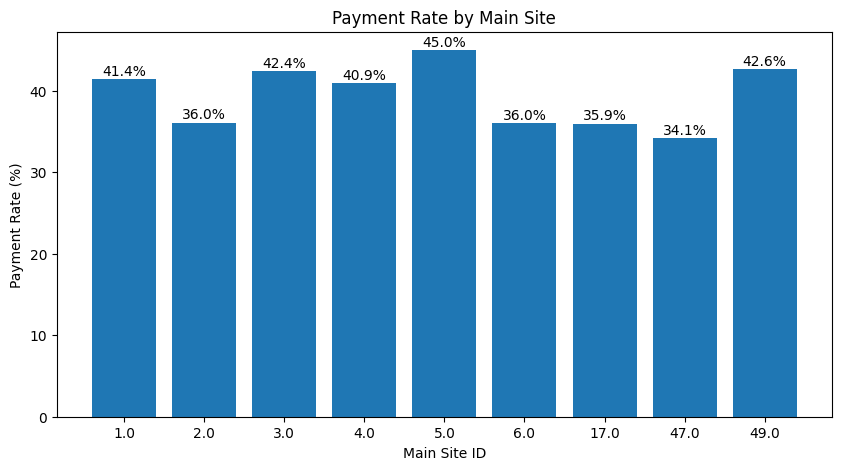

In [ ]:
import matplotlib.pyplot as plt

plot_data = main_site_payment.sort_values("main_site_id")

fig, ax = plt.subplots(figsize=(10, 5))

ax.bar(
    plot_data["main_site_id"].astype(str),
    plot_data["payment_rate"]
)

ax.set_title("Payment Rate by Main Site")
ax.set_xlabel("Main Site ID")
ax.set_ylabel("Payment Rate (%)")

for i, rate in enumerate(plot_data["payment_rate"]):
    ax.text(
        i,
        rate + 0.5,
        f"{rate:.1f}%",
        ha="center"
    )

plt.show()

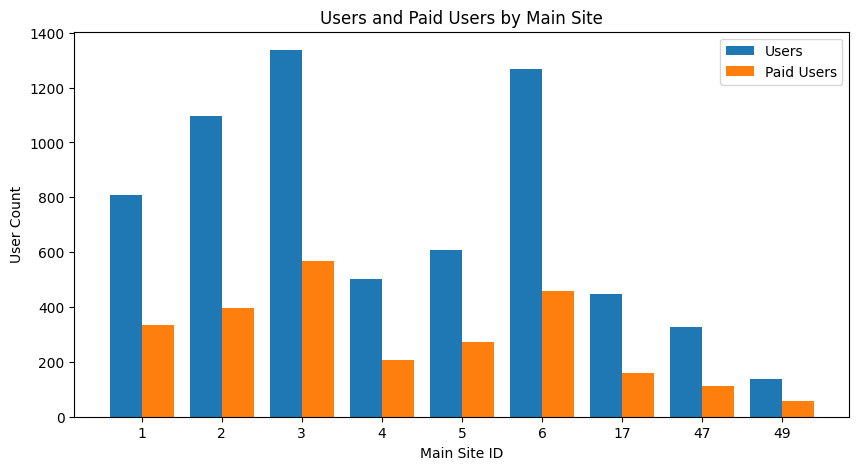

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))

x = range(len(plot_data))

ax.bar(
    [i - 0.2 for i in x],
    plot_data["count"],
    width=0.4,
    label="Users"
)

ax.bar(
    [i + 0.2 for i in x],
    plot_data["sum"],
    width=0.4,
    label="Paid Users"
)

ax.set_title("Users and Paid Users by Main Site")
ax.set_xlabel("Main Site ID")
ax.set_ylabel("User Count")
ax.set_xticks(list(x))
ax.set_xticklabels(plot_data["main_site_id"].astype(int).astype(str))
ax.legend()

plt.show()

In [ ]:
# Main site area별 결제율 확인
area_payment = (
    user_analysis[user_analysis["main_site_area"].notna()]
    .groupby("main_site_area")["is_payment"]
    .agg(["count", "sum", "mean"])
    .reset_index()
)

area_payment["payment_rate"] = area_payment["mean"] * 100

area_payment

,main_site_area,count,sum,mean,payment_rate
0,50.0,1721,666,0.386984,38.698431
1,100.0,1600,601,0.375625,37.562500
2,150.0,3213,1297,0.403673,40.367258


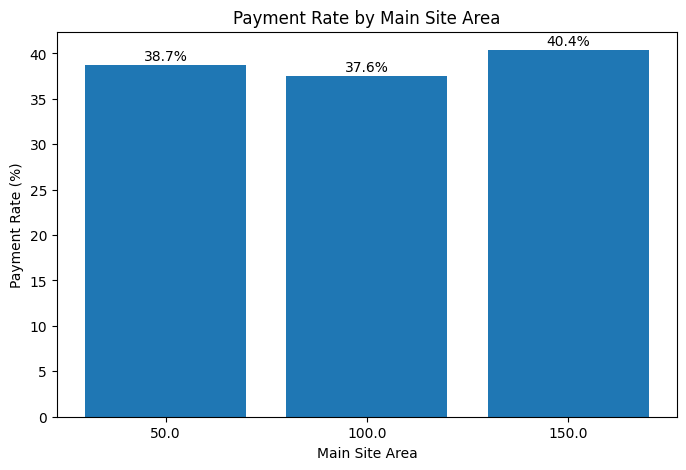

In [ ]:
import matplotlib.pyplot as plt

plot_data = area_payment.sort_values("main_site_area")

fig, ax = plt.subplots(figsize=(8, 5))

ax.bar(
    plot_data["main_site_area"].astype(str),
    plot_data["payment_rate"]
)

ax.set_title("Payment Rate by Main Site Area")
ax.set_xlabel("Main Site Area")
ax.set_ylabel("Payment Rate (%)")

for i, rate in enumerate(plot_data["payment_rate"]):
    ax.text(
        i,
        rate + 0.5,
        f"{rate:.1f}%",
        ha="center"
    )

plt.show()

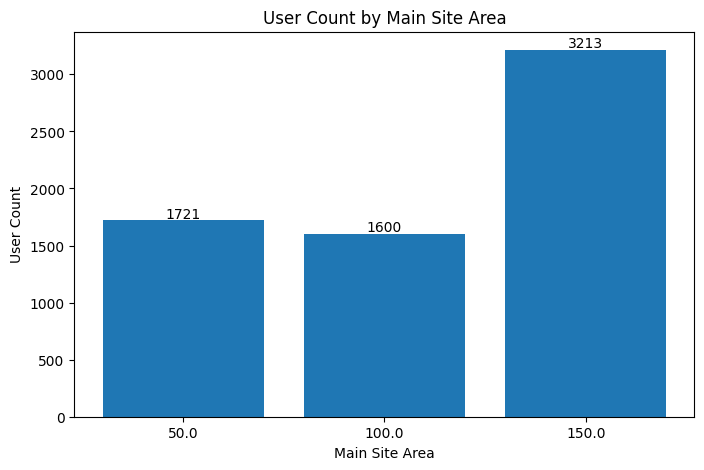

In [ ]:
fig, ax = plt.subplots(figsize=(8, 5))

ax.bar(
    plot_data["main_site_area"].astype(str),
    plot_data["count"]
)

ax.set_title("User Count by Main Site Area")
ax.set_xlabel("Main Site Area")
ax.set_ylabel("User Count")

for i, count in enumerate(plot_data["count"]):
    ax.text(
        i,
        count + 20,
        f"{count}",
        ha="center"
    )

plt.show()

In [ ]:
# 체류시간 구간별 결제율

# 총 체류시간 구간 만들기
user_analysis["stay_hour_group"] = pd.cut(
    user_analysis["total_stay_hour"],
    bins=[-0.1, 0, 2, 5, 10, 24, 100],
    labels=["0h", "0-2h", "2-5h", "5-10h", "10-24h", "24h+"]
)

# 체류시간 구간별 결제율
stay_payment = (
    user_analysis
    .groupby("stay_hour_group")["is_payment"]
    .agg(["count", "sum", "mean"])
    .reset_index()
)

stay_payment["payment_rate"] = stay_payment["mean"] * 100

stay_payment

C:\Users\shg00\AppData\Local\Temp\ipykernel_13664\183584202.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("stay_hour_group")["is_payment"]


,stay_hour_group,count,sum,mean,payment_rate
0,0h,3090,1088,0.352104,35.210356
1,0-2h,1105,426,0.385520,38.552036
2,2-5h,1697,694,0.408957,40.895698
3,5-10h,1796,691,0.384744,38.474388
4,10-24h,1682,658,0.391201,39.120095
5,24h+,254,95,0.374016,37.401575


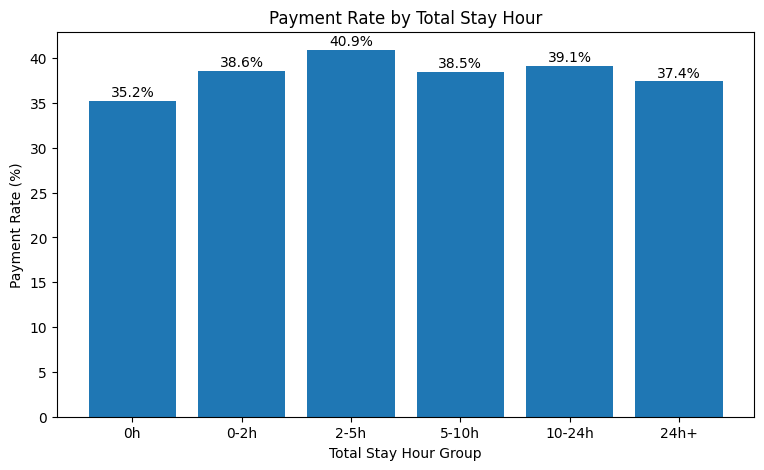

In [ ]:
import matplotlib.pyplot as plt

plot_data = stay_payment.copy()

fig, ax = plt.subplots(figsize=(9, 5))

ax.bar(
    plot_data["stay_hour_group"].astype(str),
    plot_data["payment_rate"]
)

ax.set_title("Payment Rate by Total Stay Hour")
ax.set_xlabel("Total Stay Hour Group")
ax.set_ylabel("Payment Rate (%)")

for i, rate in enumerate(plot_data["payment_rate"]):
    ax.text(
        i,
        rate + 0.5,
        f"{rate:.1f}%",
        ha="center"
    )

plt.show()

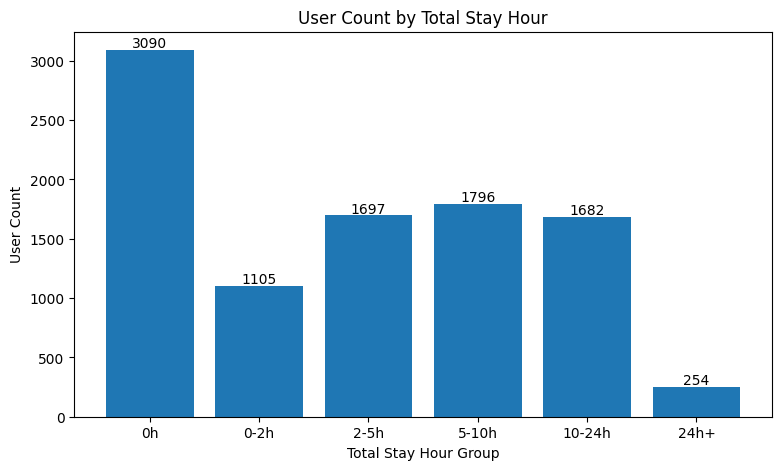

In [ ]:
fig, ax = plt.subplots(figsize=(9, 5))

ax.bar(
    plot_data["stay_hour_group"].astype(str),
    plot_data["count"]
)

ax.set_title("User Count by Total Stay Hour")
ax.set_xlabel("Total Stay Hour Group")
ax.set_ylabel("User Count")

for i, count in enumerate(plot_data["count"]):
    ax.text(
        i,
        count + 20,
        f"{count}",
        ha="center"
    )

plt.show()

In [ ]:
# 입실 시간대별 결제율

# 입실 로그만 추출
checkin_only = access_analysis[access_analysis["checkin"] == 1].copy()

# 유저별 최초 입실 시간 확인
first_checkin_by_user = (
    checkin_only
    .groupby("user_uuid")
    .agg(
        first_checkin_time=("cdate", "min")
    )
    .reset_index()
)

# 최초 입실 시간대 추출
first_checkin_by_user["first_checkin_hour"] = (
    first_checkin_by_user["first_checkin_time"].dt.hour
)

first_checkin_by_user.head()

,user_uuid,first_checkin_time,first_checkin_hour
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-05 02:57:01.695334,2
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-09-30 07:31:14.861813,7
2,0018e22d-a2cc-4e06-bca2-d6a041770f3b,2023-11-15 00:44:08.498847,0
3,002606d9-38ca-48f3-910c-cbfada9a9109,2023-01-07 08:25:54.781175,8
4,002a7570-90dd-4cab-b0aa-b0e40f7ef27a,2021-09-08 07:37:24.456986,7


In [ ]:
# user_analysis에 최초 입실 시간대 붙이기
user_analysis = user_analysis.merge(
    first_checkin_by_user[["user_uuid", "first_checkin_hour"]],
    on="user_uuid",
    how="left"
)

# 최초 입실 시간대별 결제율
hour_payment = (
    user_analysis[user_analysis["first_checkin_hour"].notna()]
    .groupby("first_checkin_hour")["is_payment"]
    .agg(["count", "sum", "mean"])
    .reset_index()
)

hour_payment["payment_rate"] = hour_payment["mean"] * 100

hour_payment

,first_checkin_hour,count,sum,mean,payment_rate
0,0.0,433,154,0.355658,35.565820
1,1.0,516,198,0.383721,38.372093
2,2.0,429,165,0.384615,38.461538
3,3.0,555,165,0.297297,29.729730
4,4.0,739,268,0.362652,36.265223
5,5.0,748,289,0.386364,38.636364
6,6.0,575,205,0.356522,35.652174
7,7.0,357,149,0.417367,41.736695
8,8.0,276,115,0.416667,41.666667
9,9.0,297,138,0.464646,46.464646


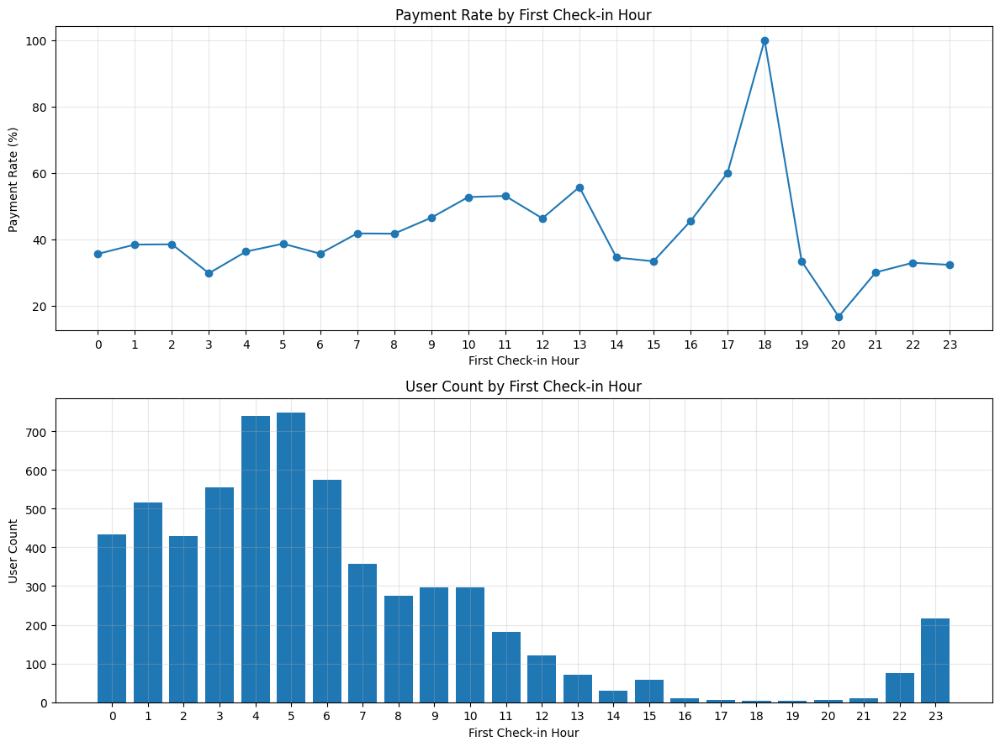

In [ ]:
import matplotlib.pyplot as plt

# 시간대 순서로 정렬
plot_data = hour_payment.sort_values("first_checkin_hour")

# 그래프 2개를 위아래로 배치
fig, axes = plt.subplots(2, 1, figsize=(12, 9))

# 1) 시간대별 결제율
axes[0].plot(
    plot_data["first_checkin_hour"],
    plot_data["payment_rate"],
    marker="o"
)

axes[0].set_title("Payment Rate by First Check-in Hour")
axes[0].set_xlabel("First Check-in Hour")
axes[0].set_ylabel("Payment Rate (%)")
axes[0].set_xticks(range(0, 24))
axes[0].grid(True, alpha=0.3)

# 2) 시간대별 유저 수
axes[1].bar(
    plot_data["first_checkin_hour"],
    plot_data["count"]
)

axes[1].set_title("User Count by First Check-in Hour")
axes[1].set_xlabel("First Check-in Hour")
axes[1].set_ylabel("User Count")
axes[1].set_xticks(range(0, 24))
axes[1].grid(True, alpha=0.3)

# 그래프 간격 자동 조정
plt.tight_layout()
plt.show()

In [ ]:
# 첫 방문까지 걸린 일수별 결제율 확인
first_gap_payment = (
    user_analysis
    .groupby("first_visit_gap")["is_payment"]
    .agg(["count", "sum", "mean"])
    .reset_index()
)

first_gap_payment["payment_rate"] = first_gap_payment["mean"] * 100

first_gap_payment

,first_visit_gap,count,sum,mean,payment_rate
0,0.0,4752,1701,0.357955,35.795455
1,1.0,3349,1312,0.391759,39.175873
2,2.0,1009,410,0.406343,40.634291
3,3.0,509,226,0.444008,44.400786
4,83.0,1,1,1.000000,100.000000
5,127.0,1,1,1.000000,100.000000
6,159.0,1,1,1.000000,100.000000
7,201.0,1,0,0.000000,0.000000
8,381.0,1,0,0.000000,0.000000


In [ ]:
# 방문자만 대상으로 첫 방문까지 걸린 일수별 결제율 확인
first_gap_payment = (
    user_analysis[user_analysis["visited"] == 1]
    .groupby("first_visit_gap")["is_payment"]
    .agg(["count", "sum", "mean"])
    .reset_index()
)

first_gap_payment["payment_rate"] = first_gap_payment["mean"] * 100

first_gap_payment

,first_visit_gap,count,sum,mean,payment_rate
0,0.0,1662,613,0.368833,36.883273
1,1.0,3349,1312,0.391759,39.175873
2,2.0,1009,410,0.406343,40.634291
3,3.0,509,226,0.444008,44.400786
4,83.0,1,1,1.000000,100.000000
5,127.0,1,1,1.000000,100.000000
6,159.0,1,1,1.000000,100.000000
7,201.0,1,0,0.000000,0.000000
8,381.0,1,0,0.000000,0.000000


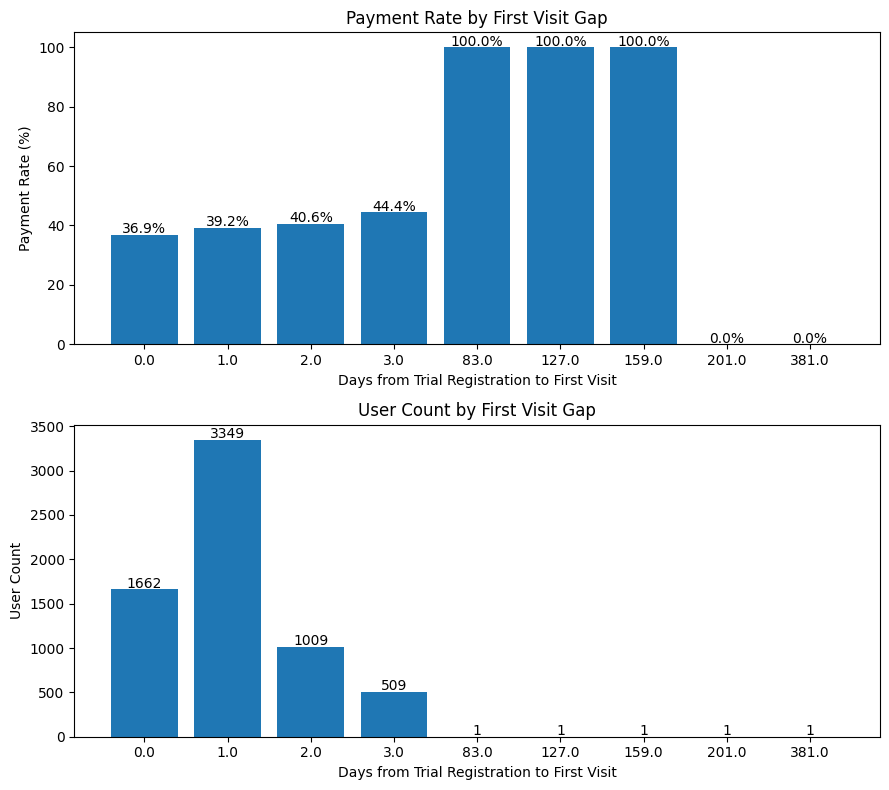

In [ ]:
import matplotlib.pyplot as plt

plot_data = first_gap_payment.sort_values("first_visit_gap")

fig, axes = plt.subplots(2, 1, figsize=(9, 8))

# Payment rate
axes[0].bar(
    plot_data["first_visit_gap"].astype(str),
    plot_data["payment_rate"]
)

axes[0].set_title("Payment Rate by First Visit Gap")
axes[0].set_xlabel("Days from Trial Registration to First Visit")
axes[0].set_ylabel("Payment Rate (%)")

for i, rate in enumerate(plot_data["payment_rate"]):
    axes[0].text(i, rate + 0.5, f"{rate:.1f}%", ha="center")

# User count
axes[1].bar(
    plot_data["first_visit_gap"].astype(str),
    plot_data["count"]
)

axes[1].set_title("User Count by First Visit Gap")
axes[1].set_xlabel("Days from Trial Registration to First Visit")
axes[1].set_ylabel("User Count")

for i, count in enumerate(plot_data["count"]):
    axes[1].text(i, count + 20, f"{count}", ha="center")

plt.tight_layout()
plt.show()

## 전처리 검증

In [ ]:
visit.head(3)

,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid
0,1,2023-12-23,01:11:19.983486,4279,2023-12-23 16:11:25.345793,2023-12-23 17:25:32.233995,939fc566-61cd-47f0-a3ce-e2936fdcff73
1,1,2023-12-24,04:35:10.361341,16510,2023-12-24 16:10:45.668026,2023-12-24 20:53:34.842447,939fc566-61cd-47f0-a3ce-e2936fdcff73
2,1,2023-12-25,02:09:54.117163,7794,2023-12-25 10:19:47.087268,2023-12-25 12:39:51.221372,939fc566-61cd-47f0-a3ce-e2936fdcff73


In [ ]:
visit[["stay_time", "stay_time_second"]].dtypes

stay_time           object
stay_time_second     int64
dtype: object

In [ ]:
# stay_time을 시간 길이(timedelta)로 변환
visit["stay_time_td"] = pd.to_timedelta(visit["stay_time"])

# 초 단위로 변환
visit["stay_time_from_stay_time"] = visit["stay_time_td"].dt.total_seconds()

# stay_time_second와 차이 확인
visit["stay_time_check_diff"] = (
    visit["stay_time_from_stay_time"] - visit["stay_time_second"]
)

# 차이 요약 확인
visit["stay_time_check_diff"].describe()

count    11477.000000
mean         0.498640
std          0.288079
min          0.000000
25%          0.247809
50%          0.497017
75%          0.749784
max          0.999967
Name: stay_time_check_diff, dtype: float64

In [ ]:
# 차이가 1초 미만인지 확인
(visit["stay_time_check_diff"] < 1).value_counts()

stay_time_check_diff
True    11477
Name: count, dtype: int64

In [ ]:
# stay_time과 stay_time_second는 같은 체류시간 정보를 담고 있다.
# stay_time은 시간 길이 형태이고, stay_time_second는 초 단위 정수형
# 분석에는 계산이 쉬운 stay_time_second를 사용 용이할듯

In [ ]:
# 시간 컬럼 datetime 변환
visit["first_enter_time"] = pd.to_datetime(visit["first_enter_time"], errors="coerce")
visit["last_leave_time"] = pd.to_datetime(visit["last_leave_time"], errors="coerce")

# 총 경과시간 계산
visit["total_time_second"] = (
    visit["last_leave_time"] - visit["first_enter_time"]
).dt.total_seconds()

# stay_time_second와 차이 계산
visit["time_diff_second"] = visit["total_time_second"] - visit["stay_time_second"]

# 차이 확인
visit["time_diff_second"].describe()

count     9476.000000
mean      2505.037291
std       5281.588341
min          0.000445
25%         18.408546
50%        464.401943
75%       3068.622039
max      69965.124898
Name: time_diff_second, dtype: float64

In [ ]:
# 차이 절댓값 기준으로 확인
visit["abs_time_diff_second"] = visit["time_diff_second"].abs()

pd.cut(
    visit["abs_time_diff_second"],
    bins=[-1, 0, 60, 600, 3600, 99999999],
    labels=["0 sec", "1 min or less", "10 min or less", "1 hour or less", "over 1 hour"]
).value_counts()

abs_time_diff_second
1 min or less     2546
10 min or less    2546
1 hour or less    2322
over 1 hour       2062
0 sec                0
Name: count, dtype: int64

In [ ]:
# 총 경과시간(last - first)이 실제 체류시간(stay_time_second)보다 대체로 더 길다.
# 중간값 기준으로는 약 7.7분 정도 차이

# stay_time_second = 실제 점유시간
# last_leave_time - first_enter_time = 최초 입실부터 최종 퇴실까지의 총 경과시간

# 체류시간 분석은 stay_time_second 기준으로 하고,
# last_leave_time - first_enter_time은 외출시간 포함 총 경과시간으로 별도 해석

In [ ]:
# 입퇴실 시간 결측 여부와 체류시간 존재 여부 확인
visit[
    visit["first_enter_time"].isna() | visit["last_leave_time"].isna()
][["user_uuid", "date", "site_id", "stay_time_second", "first_enter_time", "last_leave_time"]].head()

# 결측인데 stay_time_second는 있는지
missing_time_check = visit[
    (visit["first_enter_time"].isna() | visit["last_leave_time"].isna())
]

missing_time_check["stay_time_second"].isna().value_counts()

stay_time_second
False    2001
Name: count, dtype: int64

In [ ]:
# first_enter_time 또는 last_leave_time이 결측인 행이 2,001건 있는데,
# 그 2,001건 모두 stay_time_second는 결측이 아니라는 뜻
# 입실/퇴실 시간이 없어도 체류시간 데이터는 존재한다.

In [ ]:
# 서로 다른 날짜에 재신청한 유저 확인

# register 날짜 변환
register["trial_date"] = pd.to_datetime(register["trial_date"])

# 유저별 신청 횟수와 서로 다른 신청일 수 확인
register_check = (
    register
    .groupby("user_uuid")
    .agg(
        register_count=("trial_date", "count"),
        trial_date_count=("trial_date", "nunique"),
        first_trial_date=("trial_date", "min"),
        last_trial_date=("trial_date", "max")
    )
    .reset_index()
)

# 서로 다른 날짜에 2회 신청한 유저
re_register_users = register_check[register_check["trial_date_count"] >= 2]

re_register_users

,user_uuid,register_count,trial_date_count,first_trial_date,last_trial_date
819,14872783-3af7-492a-b51c-12f3003b76f1,2,2,2022-01-28,2023-02-10
2446,4008307f-486f-408f-b90b-e01398972029,2,2,2021-09-06,2022-03-25
3493,5b16f32b-3344-4b39-b2bf-8cf1caac78fa,2,2,2022-03-14,2023-03-22
4059,6a88014b-fbbd-4e73-8036-04435c062a97,2,2,2022-09-05,2023-02-10
7149,bd3ed6c2-f139-4e0c-b53e-b956101b2822,2,2,2022-08-02,2022-10-21
7216,bf620970-e3f2-4b54-9620-86171299d08b,2,2,2021-10-28,2022-03-04
9620,ffd880d5-0200-44e1-91db-7df9483f2a39,2,2,2021-06-16,2021-06-28


In [ ]:
# 재신청 유저 목록
re_user_list = re_register_users["user_uuid"]

# visit 데이터에서 해당 유저 방문 기록 확인
re_user_visit = visit[visit["user_uuid"].isin(re_user_list)].copy()

# 날짜 변환
re_user_visit["date"] = pd.to_datetime(re_user_visit["date"])

# 재신청 유저별 방문일 확인
re_user_visit_summary = (
    re_user_visit
    .groupby("user_uuid")
    .agg(
        first_visit_date=("date", "min"),
        last_visit_date=("date", "max"),
        visit_days=("date", "nunique"),
        visit_records=("date", "count")
    )
    .reset_index()
)

# 신청일 정보와 방문일 정보 합치기
re_user_check = re_register_users.merge(
    re_user_visit_summary,
    on="user_uuid",
    how="left"
)

re_user_check

,user_uuid,register_count,trial_date_count,first_trial_date,last_trial_date,first_visit_date,last_visit_date,visit_days,visit_records
0,14872783-3af7-492a-b51c-12f3003b76f1,2,2,2022-01-28,2023-02-10,2023-02-13,2023-02-13,1.0,1.0
1,4008307f-486f-408f-b90b-e01398972029,2,2,2021-09-06,2022-03-25,2022-03-26,2022-03-26,1.0,1.0
2,5b16f32b-3344-4b39-b2bf-8cf1caac78fa,2,2,2022-03-14,2023-03-22,NaT,NaT,NaN,NaN
3,6a88014b-fbbd-4e73-8036-04435c062a97,2,2,2022-09-05,2023-02-10,2023-02-11,2023-02-13,2.0,2.0
4,bd3ed6c2-f139-4e0c-b53e-b956101b2822,2,2,2022-08-02,2022-10-21,2022-10-24,2022-10-24,1.0,1.0
5,bf620970-e3f2-4b54-9620-86171299d08b,2,2,2021-10-28,2022-03-04,2022-03-04,2022-03-07,4.0,4.0
6,ffd880d5-0200-44e1-91db-7df9483f2a39,2,2,2021-06-16,2021-06-28,NaT,NaT,NaN,NaN


In [ ]:
# 최초 신청일 기준 첫 방문까지 걸린 일수
re_user_check["gap_from_first_trial"] = (
    re_user_check["first_visit_date"] - re_user_check["first_trial_date"]
).dt.days

# 마지막 신청일 기준 첫 방문까지 걸린 일수
re_user_check["gap_from_last_trial"] = (
    re_user_check["first_visit_date"] - re_user_check["last_trial_date"]
).dt.days

re_user_check[
    [
        "user_uuid",
        "first_trial_date",
        "last_trial_date",
        "first_visit_date",
        "visit_days",
        "gap_from_first_trial",
        "gap_from_last_trial"
    ]
]

,user_uuid,first_trial_date,last_trial_date,first_visit_date,visit_days,gap_from_first_trial,gap_from_last_trial
0,14872783-3af7-492a-b51c-12f3003b76f1,2022-01-28,2023-02-10,2023-02-13,1.0,381.0,3.0
1,4008307f-486f-408f-b90b-e01398972029,2021-09-06,2022-03-25,2022-03-26,1.0,201.0,1.0
2,5b16f32b-3344-4b39-b2bf-8cf1caac78fa,2022-03-14,2023-03-22,NaT,NaN,NaN,NaN
3,6a88014b-fbbd-4e73-8036-04435c062a97,2022-09-05,2023-02-10,2023-02-11,2.0,159.0,1.0
4,bd3ed6c2-f139-4e0c-b53e-b956101b2822,2022-08-02,2022-10-21,2022-10-24,1.0,83.0,3.0
5,bf620970-e3f2-4b54-9620-86171299d08b,2021-10-28,2022-03-04,2022-03-04,4.0,127.0,0.0
6,ffd880d5-0200-44e1-91db-7df9483f2a39,2021-06-16,2021-06-28,NaT,NaN,NaN,NaN


## 전처리 2차 진행 (전처리 기준 정해짐)

In [ ]:
import pandas as pd
import numpy as np

# 데이터 불러오기
register = pd.read_csv('../data/trial_register.csv')
access_log = pd.read_csv('../data/trial_access_log.csv')
visit_info = pd.read_csv('../data/trial_visit_info.csv')
payment = pd.read_csv('../data/trial_payment.csv')
site_area = pd.read_csv('../data/site_area.csv')

In [ ]:
def check_data(df, name):
    print(f'[{name}]')
    print('행/열:', df.shape)
    print('완전 중복 개수:', df.duplicated().sum())
    print('결측치 개수:')
    print(df.isna().sum())
    print('-' * 40)

check_data(register, 'register')
check_data(access_log, 'access_log')
check_data(visit_info, 'visit_info')
check_data(payment, 'payment')
check_data(site_area, 'site_area')

[register]
행/열: (9659, 2)
완전 중복 개수: 28
결측치 개수:
trial_date    0
user_uuid     0
dtype: int64
----------------------------------------
[access_log]
행/열: (63708, 5)
완전 중복 개수: 359
결측치 개수:
id           0
checkin      0
cdate        0
site_id      0
user_uuid    0
dtype: int64
----------------------------------------
[visit_info]
행/열: (11477, 7)
완전 중복 개수: 48
결측치 개수:
site_id               0
date                  0
stay_time             0
stay_time_second      0
first_enter_time    555
last_leave_time     555
user_uuid             0
dtype: int64
----------------------------------------
[payment]
행/열: (9659, 2)
완전 중복 개수: 35
결측치 개수:
is_payment    0
user_uuid     0
dtype: int64
----------------------------------------
[site_area]
행/열: (9, 2)
완전 중복 개수: 0
결측치 개수:
site_id        0
area_pyeong    0
dtype: int64
----------------------------------------


In [ ]:
register_clean = register.copy()
access_log_clean = access_log.copy()
visit_info_clean = visit_info.copy()
payment_clean = payment.copy()
site_area_clean = site_area.copy()

In [ ]:
# 완전 중복 제거
register_clean = register_clean.drop_duplicates()
access_log_clean = access_log_clean.drop_duplicates()
visit_info_clean = visit_info_clean.drop_duplicates()
payment_clean = payment_clean.drop_duplicates()

# site_area는 중복 없음

In [ ]:
print('register:', register_clean.duplicated().sum())
print('access_log:', access_log_clean.duplicated().sum())
print('visit_info:', visit_info_clean.duplicated().sum())
print('payment:', payment_clean.duplicated().sum())
print('site_area:', site_area_clean.duplicated().sum())

register: 0
access_log: 0
visit_info: 0
payment: 0
site_area: 0


In [ ]:
# datetime 변환
# format='mixed' : 행마다 날짜 형식을 알아서 추정해서 datetime으로 변환
# errors='coerce' : 변환이 안 되는 값은 NaT(날짜 결측값)로 처리

register_clean['trial_date'] = pd.to_datetime(
    register_clean['trial_date'],
    format='mixed',
    errors='coerce'
)

access_log_clean['cdate'] = pd.to_datetime(
    access_log_clean['cdate'],
    format='mixed',
    errors='coerce'
)

visit_info_clean['date'] = pd.to_datetime(
    visit_info_clean['date'],
    format='mixed',
    errors='coerce'
)

visit_info_clean['first_enter_time'] = pd.to_datetime(
    visit_info_clean['first_enter_time'],
    format='mixed',
    errors='coerce'
)

visit_info_clean['last_leave_time'] = pd.to_datetime(
    visit_info_clean['last_leave_time'],
    format='mixed',
    errors='coerce'
)

In [ ]:
# 결측치 확인
print(register_clean[['trial_date']].isna().sum())
print(access_log_clean[['cdate']].isna().sum())
print(visit_info_clean[['date', 'first_enter_time', 'last_leave_time']].isna().sum())

trial_date    0
dtype: int64
cdate    0
dtype: int64
date                  0
first_enter_time    555
last_leave_time     555
dtype: int64


In [ ]:
# 마이크로초 제거
register_clean['trial_date'] = register_clean['trial_date'].dt.floor('s')

visit_info_clean['first_enter_time'] = visit_info_clean['first_enter_time'].dt.floor('s')
visit_info_clean['last_leave_time'] = visit_info_clean['last_leave_time'].dt.floor('s')

In [ ]:
register_clean[['trial_date']].head()

,trial_date
0,2023-12-21
1,2023-12-21
2,2023-12-21
3,2023-12-21
4,2023-12-21


In [ ]:
visit_info_clean[['date', 'first_enter_time', 'last_leave_time']].head()

,date,first_enter_time,last_leave_time
0,2023-12-23,2023-12-23 16:11:25,2023-12-23 17:25:32
1,2023-12-24,2023-12-24 16:10:45,2023-12-24 20:53:34
2,2023-12-25,2023-12-25 10:19:47,2023-12-25 12:39:51
3,2023-12-23,2023-12-23 14:49:40,2023-12-23 19:27:39
4,2023-12-26,2023-12-26 14:57:10,2023-12-26 19:34:36


In [ ]:
# 데이터 타입 확인

print(register_clean['trial_date'].dtype)
print(access_log_clean['cdate'].dtype)
print(visit_info_clean['date'].dtype)
print(visit_info_clean['first_enter_time'].dtype)
print(visit_info_clean['last_leave_time'].dtype)

datetime64[ns]
datetime64[ns]
datetime64[ns]
datetime64[ns]
datetime64[ns]


In [ ]:
# register 재신청 유저 처리

# user_uuid별 신청 횟수 확인
register_count = register_clean['user_uuid'].value_counts()

# 2번 이상 신청한 유저만 확인
re_register_users = register_count[register_count >= 2]

re_register_users

user_uuid
14872783-3af7-492a-b51c-12f3003b76f1    2
4008307f-486f-408f-b90b-e01398972029    2
5b16f32b-3344-4b39-b2bf-8cf1caac78fa    2
ffd880d5-0200-44e1-91db-7df9483f2a39    2
6a88014b-fbbd-4e73-8036-04435c062a97    2
bd3ed6c2-f139-4e0c-b53e-b956101b2822    2
bf620970-e3f2-4b54-9620-86171299d08b    2
Name: count, dtype: int64

In [ ]:
len(re_register_users)

7

In [ ]:
# trial_date 기준으로 오래된 날짜 → 최신 날짜 순서로 정렬
register_clean = register_clean.sort_values(['user_uuid', 'trial_date'])

# 같은 user_uuid가 여러 개 있으면 최신 trial_date만 남김
register_clean = register_clean.drop_duplicates(
    subset='user_uuid',
    keep='last'
)

In [ ]:
register_clean['user_uuid'].duplicated().sum()

np.int64(0)

In [ ]:
register_clean.shape

(9624, 2)

In [ ]:
# visit_info

visit_info_clean.columns

Index(['site_id', 'date', 'stay_time', 'stay_time_second', 'first_enter_time',
       'last_leave_time', 'user_uuid'],
      dtype='object')

In [ ]:
# stay_time은 stay_time_second와 거의 같은 의미라서 삭제
# errors='ignore'는 컬럼이 없어도 에러를 내지 않게 해줌
visit_info_clean = visit_info_clean.drop(columns=['stay_time'], errors='ignore')

In [ ]:
# stay_time_second : 실제 머문 시간(초)
# stay_time_min : 실제 머문 시간(분)
visit_info_clean['stay_time_min'] = visit_info_clean['stay_time_second'] / 60

In [ ]:
# total_min : 첫 입실 시간부터 마지막 퇴실 시간까지의 전체 경과 시간(분)

visit_info_clean['total_min'] = (
    visit_info_clean['last_leave_time'] - visit_info_clean['first_enter_time']
).dt.total_seconds() / 60

In [ ]:
# out_min : 전체 경과 시간 중 실제 체류하지 않은 시간

visit_info_clean['out_min'] = (
    visit_info_clean['total_min'] - visit_info_clean['stay_time_min']
)

In [ ]:
# 외출시간이 음수인 행 확인
# 음수라는 건 실제 체류시간이 전체 경과시간보다 크다는 뜻

visit_info_clean[visit_info_clean['out_min'] < 0]

,site_id,date,stay_time_second,first_enter_time,last_leave_time,user_uuid,stay_time_min,total_min,out_min


In [ ]:
# out_min이 0 이상이거나, 결측인 행만 유지
# 결측은 first_enter_time 또는 last_leave_time이 비어있으면 생길 수 있음
visit_info_clean = visit_info_clean[
    (visit_info_clean['out_min'] >= 0) | (visit_info_clean['out_min'].isna())
]

In [ ]:
print('최종 행/열:', visit_info_clean.shape)
print('out_min 음수 개수:', (visit_info_clean['out_min'] < 0).sum())
print('결측치 확인:')
print(visit_info_clean.isna().sum())

최종 행/열: (11429, 9)
out_min 음수 개수: 0
결측치 확인:
site_id               0
date                  0
stay_time_second      0
first_enter_time    555
last_leave_time     555
user_uuid             0
stay_time_min         0
total_min           555
out_min             555
dtype: int64


In [ ]:
# access_log와 register 연결해서 신청일보다 빠른 출입 로그 확인
# 기준 컬럼은 user_uuid

access_log_check = access_log_clean.merge(
    register_clean[['user_uuid', 'trial_date']],
    on='user_uuid',
    how='left'
)

In [ ]:
# 신청일보다 빠른 출입 로그인지 확인
# True면 출입시간(cdate)이 신청일(trial_date)보다 빠른 것

access_log_check['before_trial'] = (
    access_log_check['cdate'] < access_log_check['trial_date']
)

In [ ]:
# 신청일보다 빠른 출입 로그 개수
access_log_check['before_trial'].sum()

np.int64(164)

In [ ]:
# 신청일보다 빠른 출입 로그가 있는 고유 유저 수
access_log_check.loc[
    access_log_check['before_trial'], 
    'user_uuid'
].nunique()

60

In [ ]:
# 신청일과 출입일의 차이 계산
# 음수면 신청일보다 먼저 출입한 것

access_log_check['diff_days'] = (
    access_log_check['cdate'] - access_log_check['trial_date']
).dt.total_seconds() / (60 * 60 * 24)

access_log_check.loc[
    access_log_check['before_trial'],
    ['user_uuid', 'trial_date', 'cdate', 'diff_days']
].sort_values('diff_days').head()
# 하루 차이 정도라 제거 하지 않고 유지

,user_uuid,trial_date,cdate,diff_days
27968,171e2bf6-67f8-4b62-9ae4-52e129278df2,2023-02-20,2023-02-19 15:00:08.168620,-0.374905
27969,171e2bf6-67f8-4b62-9ae4-52e129278df2,2023-02-20,2023-02-19 15:00:09.922198,-0.374885
23068,6bd73a74-29af-4c06-8ab9-b486a5019dbb,2022-12-29,2022-12-28 15:00:59.337451,-0.374313
36464,b42fdcd5-2a0f-407c-9ceb-4c1a3b9209a2,2021-06-06,2021-06-05 15:09:42.619662,-0.368257
36564,6d22fe6f-6ff5-4d04-b8cf-c323fb3c8d67,2021-06-06,2021-06-05 15:09:47.206877,-0.368204


In [ ]:
access_log_clean.shape

(63349, 5)

In [ ]:
# payment 데이터와 register 연결해서 결제 여부 붙이기

user_base = register_clean.merge(
    payment_clean[['user_uuid', 'is_payment']],
    on='user_uuid',
    how='left'
)

In [ ]:
user_base.head()

,trial_date,user_uuid,is_payment
0,2023-09-04,000590dc-046f-462b-8225-4c81a97b7166,0
1,2021-10-16,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0
2,2021-09-29,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1
3,2023-04-03,0013f481-efed-4508-8836-70cbd64c477e,1
4,2023-11-14,0018e22d-a2cc-4e06-bca2-d6a041770f3b,0


In [ ]:
print(user_base.shape)
print(user_base['is_payment'].isna().sum())
print(user_base['is_payment'].value_counts())

(9624, 3)
0
is_payment
0    5972
1    3652
Name: count, dtype: int64


In [ ]:
# 혹시 결측이 있으면 0으로 처리
# 0 = 결제 안 함
user_base['is_payment'] = user_base['is_payment'].fillna(0).astype(int)

In [ ]:
# 전체 무료체험 신청자 중 결제한 사람 비율
payment_rate = user_base['is_payment'].mean() * 100

print('전체 유저 수:', len(user_base))
print('결제 유저 수:', user_base['is_payment'].sum())
print('결제율(%):', round(payment_rate, 2))

전체 유저 수: 9624
결제 유저 수: 3652
결제율(%): 37.95


In [ ]:
user_base.head()

,trial_date,user_uuid,is_payment
0,2023-09-04,000590dc-046f-462b-8225-4c81a97b7166,0
1,2021-10-16,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0
2,2021-09-29,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1
3,2023-04-03,0013f481-efed-4508-8836-70cbd64c477e,1
4,2023-11-14,0018e22d-a2cc-4e06-bca2-d6a041770f3b,0


In [ ]:
# visit_info를 유저별로 요약해서 user_base에 붙이기

# 유저별 방문 요약 테이블 만들기
visit_user_summary = visit_info_clean.groupby('user_uuid').agg(
    visit_days=('date', 'nunique'),                 # 방문한 날짜 수
    visit_count=('date', 'count'),                  # 방문 기록 수
    total_stay_min=('stay_time_min', 'sum'),         # 총 체류시간(분)
    avg_stay_min=('stay_time_min', 'mean'),          # 평균 체류시간(분)
    total_out_min=('out_min', 'sum'),                # 총 외출시간(분)
    avg_out_min=('out_min', 'mean')                  # 평균 외출시간(분)
).reset_index()

In [ ]:
visit_days=('date', 'nunique')

In [ ]:
visit_user_summary.head()

,user_uuid,visit_days,visit_count,total_stay_min,avg_stay_min,total_out_min,avg_out_min
0,000590dc-046f-462b-8225-4c81a97b7166,1,1,356.950000,356.950000,5.783333,5.783333
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,3,759.483333,253.161111,152.500000,50.833333
2,0018e22d-a2cc-4e06-bca2-d6a041770f3b,2,2,1289.533333,644.766667,8.300000,4.150000
3,002606d9-38ca-48f3-910c-cbfada9a9109,2,2,417.066667,208.533333,4.016667,2.008333
4,002a7570-90dd-4cab-b0aa-b0e40f7ef27a,2,2,393.483333,196.741667,35.716667,17.858333


In [ ]:
visit_user_summary.shape

(6534, 7)

In [ ]:
# user_base와 방문 요약 정보 붙이기
user_base = user_base.merge(
    visit_user_summary,
    on='user_uuid',
    how='left'
)

In [ ]:
# 방문 기록이 없는 유저는 방문 횟수/시간을 0으로 처리

visit_cols = [
    'visit_days',
    'visit_count',
    'total_stay_min',
    'avg_stay_min',
    'total_out_min',
    'avg_out_min'
]

user_base[visit_cols] = user_base[visit_cols].fillna(0)

In [ ]:
print(user_base.shape)
user_base.head()

(9624, 9)


,trial_date,user_uuid,is_payment,visit_days,visit_count,total_stay_min,avg_stay_min,total_out_min,avg_out_min
0,2023-09-04,000590dc-046f-462b-8225-4c81a97b7166,0,1.0,1.0,356.950000,356.950000,5.783333,5.783333
1,2021-10-16,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0,0.0,0.0,0.000000,0.000000,0.000000,0.000000
2,2021-09-29,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1,3.0,3.0,759.483333,253.161111,152.500000,50.833333
3,2023-04-03,0013f481-efed-4508-8836-70cbd64c477e,1,0.0,0.0,0.000000,0.000000,0.000000,0.000000
4,2023-11-14,0018e22d-a2cc-4e06-bca2-d6a041770f3b,0,2.0,2.0,1289.533333,644.766667,8.300000,4.150000


In [ ]:
# access_log를 유저별로 요약해서 user_base에 붙이기

# 유저별 출입 로그 요약 테이블 만들기
access_user_summary = access_log_clean.groupby('user_uuid').agg(
    access_count=('cdate', 'count'),        # 총 출입 로그 수
    first_access_time=('cdate', 'min'),     # 가장 빠른 출입 시간
    last_access_time=('cdate', 'max')       # 가장 늦은 출입 시간
).reset_index()

In [ ]:
access_user_summary.head()

,user_uuid,access_count,first_access_time,last_access_time
0,000590dc-046f-462b-8225-4c81a97b7166,6,2023-09-05 02:57:01.695334,2023-09-05 08:59:45.973499
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,18,2021-09-30 07:31:14.861813,2021-10-01 13:08:58.909740
2,0018e22d-a2cc-4e06-bca2-d6a041770f3b,19,2023-11-15 00:44:08.498847,2023-11-16 09:39:26.886181
3,002606d9-38ca-48f3-910c-cbfada9a9109,8,2023-01-07 08:25:54.781175,2023-01-08 10:24:54.056668
4,002a7570-90dd-4cab-b0aa-b0e40f7ef27a,10,2021-09-08 07:37:24.456986,2021-09-08 13:25:10.197658


In [ ]:
access_user_summary.shape

(6026, 4)

In [ ]:
# user_base에 출입 로그 요약 정보 붙이기

user_base = user_base.merge(
    access_user_summary,
    on='user_uuid',
    how='left'
)

In [ ]:
# 출입 기록이 없는 유저는 출입 횟수 0으로 처리

user_base['access_count'] = user_base['access_count'].fillna(0)

In [ ]:
print(user_base.shape)
print(user_base[['user_uuid', 'trial_date', 'is_payment', 
                 'access_count', 'first_access_time', 'last_access_time']].head())

(9624, 12)
                              user_uuid trial_date  is_payment  access_count  \
0  000590dc-046f-462b-8225-4c81a97b7166 2023-09-04           0           6.0   
1  000a5d24-2da9-4c51-8a2b-ea3caba1553b 2021-10-16           0           0.0   
2  000be14f-ba0f-4af6-bc2c-7b00dfcbc98c 2021-09-29           1          18.0   
3  0013f481-efed-4508-8836-70cbd64c477e 2023-04-03           1           0.0   
4  0018e22d-a2cc-4e06-bca2-d6a041770f3b 2023-11-14           0          19.0   

           first_access_time           last_access_time  
0 2023-09-05 02:57:01.695334 2023-09-05 08:59:45.973499  
1                        NaT                        NaT  
2 2021-09-30 07:31:14.861813 2021-10-01 13:08:58.909740  
3                        NaT                        NaT  
4 2023-11-15 00:44:08.498847 2023-11-16 09:39:26.886181  


In [ ]:
user_base.head()

,trial_date,user_uuid,is_payment,visit_days,visit_count,total_stay_min,avg_stay_min,total_out_min,avg_out_min,access_count,first_access_time,last_access_time
0,2023-09-04,000590dc-046f-462b-8225-4c81a97b7166,0,1.0,1.0,356.950000,356.950000,5.783333,5.783333,6.0,2023-09-05 02:57:01.695334,2023-09-05 08:59:45.973499
1,2021-10-16,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,NaT,NaT
2,2021-09-29,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1,3.0,3.0,759.483333,253.161111,152.500000,50.833333,18.0,2021-09-30 07:31:14.861813,2021-10-01 13:08:58.909740
3,2023-04-03,0013f481-efed-4508-8836-70cbd64c477e,1,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,NaT,NaT
4,2023-11-14,0018e22d-a2cc-4e06-bca2-d6a041770f3b,0,2.0,2.0,1289.533333,644.766667,8.300000,4.150000,19.0,2023-11-15 00:44:08.498847,2023-11-16 09:39:26.886181


In [ ]:
# 방문 기록 여부
# visit_count가 1 이상이면 방문한 유저로 판단

user_base['has_visit'] = np.where(user_base['visit_count'] > 0, 1, 0)

In [ ]:
# 출입 기록 여부
# access_count가 1 이상이면 출입 기록이 있는 유저로 판단

user_base['has_access'] = np.where(user_base['access_count'] > 0, 1, 0)

In [ ]:
# days_to_first_access
# 첫 출입 시간 - 신청일
# 단위는 '일'로 계산

user_base['days_to_first_access'] = (
    user_base['first_access_time'] - user_base['trial_date']
).dt.total_seconds() / (60 * 60 * 24)

In [ ]:
# days_to_last_access
# 마지막 출입 시간 - 신청일

user_base['days_to_last_access'] = (
    user_base['last_access_time'] - user_base['trial_date']
).dt.total_seconds() / (60 * 60 * 24)

In [ ]:
user_base[
    [
        'user_uuid',
        'trial_date',
        'is_payment',
        'has_visit',
        'has_access',
        'visit_count',
        'access_count',
        'days_to_first_access',
        'days_to_last_access'
    ]
].head()

,user_uuid,trial_date,is_payment,has_visit,has_access,visit_count,access_count,days_to_first_access,days_to_last_access
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-04,0,1,1,1.0,6.0,1.122936,1.374838
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,2021-10-16,0,0,0,0.0,0.0,NaN,NaN
2,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-09-29,1,1,1,3.0,18.0,1.313366,2.547904
3,0013f481-efed-4508-8836-70cbd64c477e,2023-04-03,1,0,0,0.0,0.0,NaN,NaN
4,0018e22d-a2cc-4e06-bca2-d6a041770f3b,2023-11-14,0,1,1,2.0,19.0,1.030654,2.402395


In [ ]:
print('방문 유저 수:', user_base['has_visit'].sum())
print('출입 유저 수:', user_base['has_access'].sum())
print('결제 유저 수:', user_base['is_payment'].sum())

print('방문율(%):', round(user_base['has_visit'].mean() * 100, 2))
print('출입률(%):', round(user_base['has_access'].mean() * 100, 2))
print('결제율(%):', round(user_base['is_payment'].mean() * 100, 2))

방문 유저 수: 6534
출입 유저 수: 6026
결제 유저 수: 3652
방문율(%): 67.89
출입률(%): 62.61
결제율(%): 37.95


In [ ]:
user_base['days_to_first_access'].describe()

count    6026.000000
mean        1.100529
std         0.673816
min        -0.374905
25%         0.428805
50%         1.156602
75%         1.390293
max         2.611840
Name: days_to_first_access, dtype: float64

In [ ]:
# 신청일보다 첫 출입이 빠른 유저 수 확인

(user_base['days_to_first_access'] < 0).sum()

np.int64(60)

In [ ]:
visit_info_clean.columns

Index(['site_id', 'date', 'stay_time_second', 'first_enter_time',
       'last_leave_time', 'user_uuid', 'stay_time_min', 'total_min',
       'out_min'],
      dtype='object')

In [ ]:
# 유저별 + 지점별 방문 횟수 계산
user_site_count = (
    visit_info_clean
    .groupby(['user_uuid', 'site_id'])
    .size()
    .reset_index(name='site_visit_count')
)

user_site_count.head()

,user_uuid,site_id,site_visit_count
0,000590dc-046f-462b-8225-4c81a97b7166,6,1
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,3
2,0018e22d-a2cc-4e06-bca2-d6a041770f3b,6,2
3,002606d9-38ca-48f3-910c-cbfada9a9109,17,2
4,002a7570-90dd-4cab-b0aa-b0e40f7ef27a,5,2


In [ ]:
# 유저별로 방문 횟수가 많은 순서로 정렬
user_site_count = user_site_count.sort_values(
    ['user_uuid', 'site_visit_count'],
    ascending=[True, False]
)

# 같은 유저가 여러 지점을 방문했다면 가장 위에 있는 지점만 남김
main_site = user_site_count.drop_duplicates(
    subset='user_uuid',
    keep='first'
)

main_site.head()

,user_uuid,site_id,site_visit_count
0,000590dc-046f-462b-8225-4c81a97b7166,6,1
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,3
2,0018e22d-a2cc-4e06-bca2-d6a041770f3b,6,2
3,002606d9-38ca-48f3-910c-cbfada9a9109,17,2
4,002a7570-90dd-4cab-b0aa-b0e40f7ef27a,5,2


In [ ]:
# user_base에 대표 방문 지점 붙이기
user_base = user_base.merge(
    main_site[['user_uuid', 'site_id', 'site_visit_count']],
    on='user_uuid',
    how='left'
)

In [ ]:
site_area_clean.columns

Index(['site_id', 'area_pyeong'], dtype='object')

In [ ]:
# site_area 정보를 user_base에 붙이기

user_base = user_base.merge(
    site_area_clean,
    on='site_id',
    how='left'
)

In [ ]:
user_base.head()

,trial_date,user_uuid,is_payment,visit_days,visit_count,total_stay_min,avg_stay_min,total_out_min,avg_out_min,access_count,first_access_time,last_access_time,has_visit,has_access,days_to_first_access,days_to_last_access,site_id,site_visit_count,area_pyeong
0,2023-09-04,000590dc-046f-462b-8225-4c81a97b7166,0,1.0,1.0,356.950000,356.950000,5.783333,5.783333,6.0,2023-09-05 02:57:01.695334,2023-09-05 08:59:45.973499,1,1,1.122936,1.374838,6.0,1.0,150.0
1,2021-10-16,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,NaT,NaT,0,0,NaN,NaN,NaN,NaN,NaN
2,2021-09-29,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1,3.0,3.0,759.483333,253.161111,152.500000,50.833333,18.0,2021-09-30 07:31:14.861813,2021-10-01 13:08:58.909740,1,1,1.313366,2.547904,3.0,3.0,150.0
3,2023-04-03,0013f481-efed-4508-8836-70cbd64c477e,1,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,NaT,NaT,0,0,NaN,NaN,NaN,NaN,NaN
4,2023-11-14,0018e22d-a2cc-4e06-bca2-d6a041770f3b,0,2.0,2.0,1289.533333,644.766667,8.300000,4.150000,19.0,2023-11-15 00:44:08.498847,2023-11-16 09:39:26.886181,1,1,1.030654,2.402395,6.0,2.0,150.0


In [ ]:
print(user_base.shape)
print(user_base.isna().sum())

(9624, 19)
trial_date                 0
user_uuid                  0
is_payment                 0
visit_days                 0
visit_count                0
total_stay_min             0
avg_stay_min               0
total_out_min              0
avg_out_min                0
access_count               0
first_access_time       3598
last_access_time        3598
has_visit                  0
has_access                 0
days_to_first_access    3598
days_to_last_access     3598
site_id                 3090
site_visit_count        3090
area_pyeong             3090
dtype: int64


## master data

In [ ]:
user_base.head(3) # 예림 처음 만들었던 master table

,trial_date,user_uuid,is_payment,visit_days,visit_count,total_stay_min,avg_stay_min,total_out_min,avg_out_min,access_count,first_access_time,last_access_time,has_visit,has_access,days_to_first_access,days_to_last_access,site_id,site_visit_count,area_pyeong
0,2023-09-04,000590dc-046f-462b-8225-4c81a97b7166,0,1.0,1.0,356.950000,356.950000,5.783333,5.783333,6.0,2023-09-05 02:57:01.695334,2023-09-05 08:59:45.973499,1,1,1.122936,1.374838,6.0,1.0,150.0
1,2021-10-16,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,NaT,NaT,0,0,NaN,NaN,NaN,NaN,NaN
2,2021-09-29,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1,3.0,3.0,759.483333,253.161111,152.500000,50.833333,18.0,2021-09-30 07:31:14.861813,2021-10-01 13:08:58.909740,1,1,1.313366,2.547904,3.0,3.0,150.0


In [ ]:
unified = pd.read_csv('../data/master_unified_합친내용.csv')
unified.head(2) # 진만님 + 예림 추가한 master table

,user_uuid,trial_date,trial_month,trial_dow,register_count,re_register_yn,visited,visit_count,sites_used,days_active,...,total_access,checkin_count,checkout_count,first_access_time,last_access_time,main_site,main_site_pyeong,main_site_stay_sec,main_site_visit_days,is_payment
0,f25078d1-1030-485c-85c5-dc82d6987043,2021-05-01,5,5,1,0,0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1
1,9f5e2bd3-65c9-4800-84c1-f5c93f44d096,2021-05-01,5,5,1,0,0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1


In [ ]:
print('new user_uuid 중복:', user_base['user_uuid'].duplicated().sum())
print('unified user_uuid 중복:', unified['user_uuid'].duplicated().sum())

new user_uuid 중복: 0
unified user_uuid 중복: 0


In [ ]:
# unified에서 user_base에 추가할 파생변수만 선택

add_cols = [
    'user_uuid',             # 합칠 기준키
    'register_count',        # 신청 횟수
    're_register_yn',        # 재신청 여부
    'sites_used',            # 이용한 지점 수
    'days_active',           # 실제 활동일수
    'visit_density',         # 방문 밀도
    'first_visit',           # 첫 방문일
    'last_visit',            # 마지막 방문일
    'max_stay_sec',          # 최대 체류시간(초)
    'stay_hour_group',       # 체류시간 그룹
    'avg_enter_hour',        # 평균 입실 시간
    'weekend_ratio',         # 주말 방문 비율
    'checkin_count',         # 입실 로그 수
    'checkout_count',        # 퇴실 로그 수
    'main_site_stay_sec',    # 대표 지점 체류시간
    'main_site_visit_days'   # 대표 지점 방문일수
]

unified_add = unified[add_cols].copy()

In [ ]:
unified_add.head()

,user_uuid,register_count,re_register_yn,sites_used,days_active,visit_density,first_visit,last_visit,max_stay_sec,stay_hour_group,avg_enter_hour,weekend_ratio,checkin_count,checkout_count,main_site_stay_sec,main_site_visit_days
0,f25078d1-1030-485c-85c5-dc82d6987043,1,0,0.0,0.0,0.0,NaN,NaN,0.0,0h,NaN,NaN,0.0,0.0,NaN,NaN
1,9f5e2bd3-65c9-4800-84c1-f5c93f44d096,1,0,0.0,0.0,0.0,NaN,NaN,0.0,0h,NaN,NaN,0.0,0.0,NaN,NaN
2,844319ff-cd15-4633-9900-6eaf4dc68b68,1,0,0.0,0.0,0.0,NaN,NaN,0.0,0h,NaN,NaN,0.0,0.0,NaN,NaN
3,badbde4d-886b-4992-a8e3-fd0c05640183,1,0,0.0,0.0,0.0,NaN,NaN,0.0,0h,NaN,NaN,0.0,0.0,NaN,NaN
4,fce967b5-070c-46ed-a5fa-ef7d298cc7aa,1,0,1.0,1.0,1.0,2021-05-03,2021-05-03,8546.0,2-5h,5.333333,NaN,1.0,1.0,8546.0,1.0


In [ ]:
unified_add.shape

(9624, 16)

In [ ]:
# user_uuid 기준으로 unified의 파생변수를 user_base에 붙이기

user_base = user_base.merge(
    unified_add,
    on='user_uuid',
    how='left'
)

In [ ]:
print(user_base.shape)
print(user_base['user_uuid'].duplicated().sum())

(9624, 34)
0


In [ ]:
user_base.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9624 entries, 0 to 9623
Data columns (total 34 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   trial_date            9624 non-null   datetime64[ns]
 1   user_uuid             9624 non-null   object        
 2   is_payment            9624 non-null   int64         
 3   visit_days            9624 non-null   float64       
 4   visit_count           9624 non-null   float64       
 5   total_stay_min        9624 non-null   float64       
 6   avg_stay_min          9624 non-null   float64       
 7   total_out_min         9624 non-null   float64       
 8   avg_out_min           9624 non-null   float64       
 9   access_count          9624 non-null   float64       
 10  first_access_time     6026 non-null   datetime64[ns]
 11  last_access_time      6026 non-null   datetime64[ns]
 12  has_visit             9624 non-null   int64         
 13  has_access        

In [ ]:
# 첫 방문일, 마지막 방문일을 날짜형으로 변환
user_base['first_visit'] = pd.to_datetime(
    user_base['first_visit'],
    format='mixed',
    errors='coerce'
)

user_base['last_visit'] = pd.to_datetime(
    user_base['last_visit'],
    format='mixed',
    errors='coerce'
)

In [ ]:
user_base[['first_visit', 'last_visit']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9624 entries, 0 to 9623
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   first_visit  6534 non-null   datetime64[ns]
 1   last_visit   6534 non-null   datetime64[ns]
dtypes: datetime64[ns](2)
memory usage: 150.5 KB


In [ ]:
# 신청 월
user_base['trial_month'] = user_base['trial_date'].dt.to_period('M').astype(str)

# 신청 요일: 0=월요일, 6=일요일
user_base['trial_dow'] = user_base['trial_date'].dt.dayofweek

# 첫 방문까지 걸린 일수
user_base['first_visit_gap'] = (
    user_base['first_visit'] - user_base['trial_date']
).dt.total_seconds() / (60 * 60 * 24)

In [ ]:
user_base[
    ['trial_date', 'trial_month', 'trial_dow', 'first_visit', 'first_visit_gap']
].head()

,trial_date,trial_month,trial_dow,first_visit,first_visit_gap
0,2023-09-04,2023-09,0,2023-09-05,1.0
1,2021-10-16,2021-10,5,NaT,NaN
2,2021-09-29,2021-09,2,2021-09-30,1.0
3,2023-04-03,2023-04,0,NaT,NaN
4,2023-11-14,2023-11,1,2023-11-15,1.0


## master data로 진행하는 EDA

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('../data/master_data_new2.csv')
df.head(2)

,trial_date,user_uuid,is_payment,visit_days,visit_count,total_stay_min,avg_stay_min,total_out_min,avg_out_min,access_count,...,stay_hour_group,avg_enter_hour,weekend_ratio,checkin_count,checkout_count,main_site_stay_sec,main_site_visit_days,trial_month,trial_dow,first_visit_gap
0,2023-09-04,000590dc-046f-462b-8225-4c81a97b7166,0,1.0,1.0,356.95,356.95,5.783333,5.783333,6.0,...,5-10h,2.95,0.0,3.0,3.0,21417.0,1.0,2023-09,0,1.0
1,2021-10-16,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0,0.0,0.0,0.00,0.00,0.000000,0.000000,0.0,...,0h,NaN,NaN,0.0,0.0,NaN,NaN,2021-10,5,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9624 entries, 0 to 9623
Data columns (total 37 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   trial_date            9624 non-null   object 
 1   user_uuid             9624 non-null   object 
 2   is_payment            9624 non-null   int64  
 3   visit_days            9624 non-null   float64
 4   visit_count           9624 non-null   float64
 5   total_stay_min        9624 non-null   float64
 6   avg_stay_min          9624 non-null   float64
 7   total_out_min         9624 non-null   float64
 8   avg_out_min           9624 non-null   float64
 9   access_count          9624 non-null   float64
 10  first_access_time     6026 non-null   object 
 11  last_access_time      6026 non-null   object 
 12  has_visit             9624 non-null   int64  
 13  has_access            9624 non-null   int64  
 14  days_to_first_access  6026 non-null   float64
 15  days_to_last_access  

In [ ]:
# datetime
date_cols = [
    'trial_date',
    'first_access_time',
    'last_access_time',
    'first_visit',
    'last_visit'
]

for col in date_cols:
    df[col] = pd.to_datetime(
        df[col],
        format='mixed',
        errors='coerce'
    )

# site_id 문자열로 변환
df['site_id'] = df['site_id'].astype('Int64').astype('string')

# int 변환
int_cols = [
    'visit_days',
    'visit_count',
    'access_count',
    'site_visit_count',
    'sites_used',
    'days_active',
    'checkin_count',
    'checkout_count',
    'main_site_visit_days'
]

for col in int_cols:
    df[col] = df[col].astype('Int64')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9624 entries, 0 to 9623
Data columns (total 37 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   trial_date            9624 non-null   datetime64[ns]
 1   user_uuid             9624 non-null   object        
 2   is_payment            9624 non-null   int64         
 3   visit_days            9624 non-null   Int64         
 4   visit_count           9624 non-null   Int64         
 5   total_stay_min        9624 non-null   float64       
 6   avg_stay_min          9624 non-null   float64       
 7   total_out_min         9624 non-null   float64       
 8   avg_out_min           9624 non-null   float64       
 9   access_count          9624 non-null   Int64         
 10  first_access_time     6026 non-null   datetime64[ns]
 11  last_access_time      6026 non-null   datetime64[ns]
 12  has_visit             9624 non-null   int64         
 13  has_access        

In [ ]:
# 전체 규모 확인
total_users = len(df)

visit_users = df['has_visit'].sum()
access_users = df['has_access'].sum()
payment_users = df['is_payment'].sum()

print('전체 신청 유저 수:', total_users)
print('방문 유저 수:', visit_users)
print('출입 유저 수:', access_users)
print('결제 유저 수:', payment_users)

전체 신청 유저 수: 9624
방문 유저 수: 6534
출입 유저 수: 6026
결제 유저 수: 3652


In [ ]:
print('방문율(%):', round(visit_users / total_users * 100, 2))
print('출입률(%):', round(access_users / total_users * 100, 2))
print('결제율(%):', round(payment_users / total_users * 100, 2))

방문율(%): 67.89
출입률(%): 62.61
결제율(%): 37.95


In [ ]:
summary = pd.DataFrame({
    '구분': ['전체 신청', '방문 유저', '출입 유저', '결제 유저'],
    '유저 수': [total_users, visit_users, access_users, payment_users],
    '비율(%)': [
        100,
        visit_users / total_users * 100,
        access_users / total_users * 100,
        payment_users / total_users * 100
    ]
})

summary['비율(%)'] = summary['비율(%)'].round(2)

summary

,구분,유저 수,비율(%)
0,전체 신청,9624,100.00
1,방문 유저,6534,67.89
2,출입 유저,6026,62.61
3,결제 유저,3652,37.95


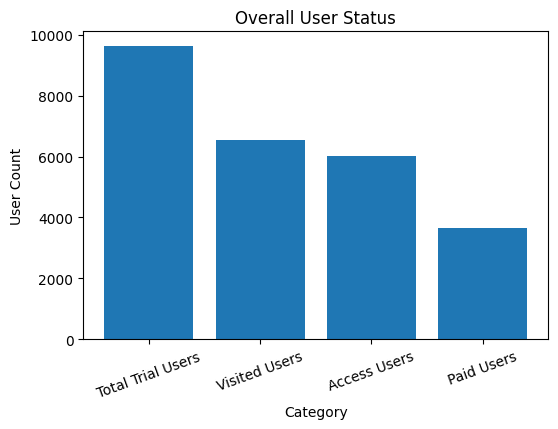

In [ ]:
summary['category_en'] = [
    'Total Trial Users',
    'Visited Users',
    'Access Users',
    'Paid Users'
]

plt.figure(figsize=(6, 4))

plt.bar(summary['category_en'], summary['유저 수'])

plt.title('Overall User Status')
plt.xlabel('Category')
plt.ylabel('User Count')

plt.xticks(rotation=20)
plt.show()

In [ ]:
# 방문 여부별 결제율 확인
visit_payment = df.groupby('has_visit').agg(
    user_count=('user_uuid', 'count'),
    paid_users=('is_payment', 'sum'),
    payment_rate=('is_payment', 'mean')
).reset_index()

# 결제율을 %로 변환
visit_payment['payment_rate_pct'] = (visit_payment['payment_rate'] * 100).round(2)

visit_payment

,has_visit,user_count,paid_users,payment_rate,payment_rate_pct
0,0,3090,1088,0.352104,35.21
1,1,6534,2564,0.392409,39.24


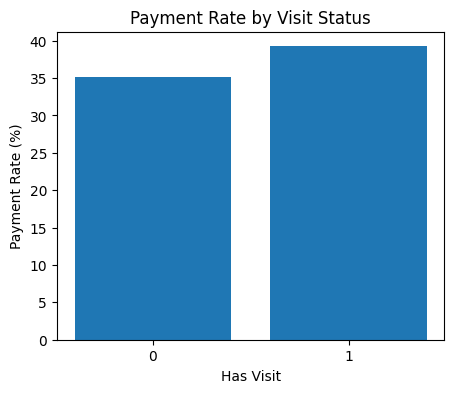

In [ ]:
plt.figure(figsize=(5, 4))

plt.bar(
    visit_payment['has_visit'].astype(str),
    visit_payment['payment_rate_pct']
)

plt.title('Payment Rate by Visit Status')
plt.xlabel('Has Visit')
plt.ylabel('Payment Rate (%)')

plt.show()

In [ ]:
# 출입 여부별 결제율 확인
access_payment = df.groupby('has_access').agg(
    user_count=('user_uuid', 'count'),
    paid_users=('is_payment', 'sum'),
    payment_rate=('is_payment', 'mean')
).reset_index()

access_payment['payment_rate_pct'] = (access_payment['payment_rate'] * 100).round(2)

access_payment

,has_access,user_count,paid_users,payment_rate,payment_rate_pct
0,0,3598,1315,0.365481,36.55
1,1,6026,2337,0.387819,38.78


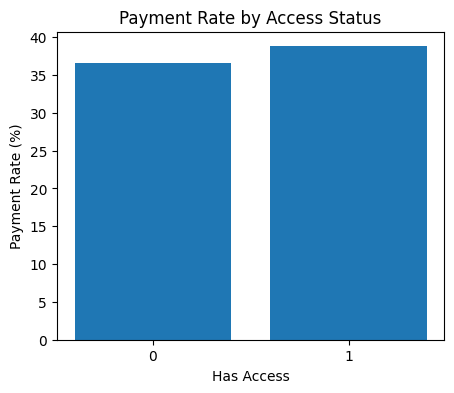

In [ ]:
plt.figure(figsize=(5, 4))

plt.bar(
    access_payment['has_access'].astype(str),
    access_payment['payment_rate_pct']
)

plt.title('Payment Rate by Access Status')
plt.xlabel('Has Access')
plt.ylabel('Payment Rate (%)')

plt.show()

In [ ]:
# 방문일수별 결제율 확인
visit_days_payment = df.groupby('visit_days').agg(
    user_count=('user_uuid', 'count'),
    paid_users=('is_payment', 'sum'),
    payment_rate=('is_payment', 'mean')
).reset_index()

visit_days_payment['payment_rate_pct'] = (
    visit_days_payment['payment_rate'] * 100
).round(2)

visit_days_payment

,visit_days,user_count,paid_users,payment_rate,payment_rate_pct
0,0,3090,1088,0.352104,35.21
1,1,3220,1076,0.334161,33.42
2,2,1932,811,0.419772,41.98
3,3,1297,607,0.468003,46.80
4,4,85,70,0.823529,82.35


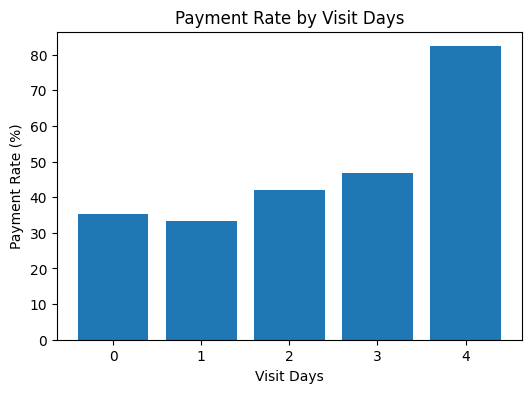

In [ ]:
plt.figure(figsize=(6, 4))

plt.bar(
    visit_days_payment['visit_days'].astype(str),
    visit_days_payment['payment_rate_pct']
)

plt.title('Payment Rate by Visit Days')
plt.xlabel('Visit Days')
plt.ylabel('Payment Rate (%)')

plt.show()

In [ ]:
# 평균 체류시간 구간 만들기
# 단위: 분

def stay_group(x):
    if x == 0:
        return '0 min'
    elif x < 60:
        return '< 1h'
    elif x < 120:
        return '1-2h'
    elif x < 180:
        return '2-3h'
    else:
        return '3h+'

df['avg_stay_group'] = df['avg_stay_min'].apply(stay_group)

In [ ]:
stay_payment = df.groupby('avg_stay_group').agg(
    user_count=('user_uuid', 'count'),
    paid_users=('is_payment', 'sum'),
    payment_rate=('is_payment', 'mean')
).reset_index()

stay_payment['payment_rate_pct'] = (
    stay_payment['payment_rate'] * 100
).round(2)

stay_payment

,avg_stay_group,user_count,paid_users,payment_rate,payment_rate_pct
0,0 min,3090,1088,0.352104,35.21
1,1-2h,749,338,0.451268,45.13
2,2-3h,883,414,0.468856,46.89
3,3h+,4214,1523,0.361414,36.14
4,< 1h,688,289,0.420058,42.01


In [ ]:
stay_order = ['0 min', '< 1h', '1-2h', '2-3h', '3h+']

stay_payment['avg_stay_group'] = pd.Categorical(
    stay_payment['avg_stay_group'],
    categories=stay_order,
    ordered=True
)

stay_payment = stay_payment.sort_values('avg_stay_group')

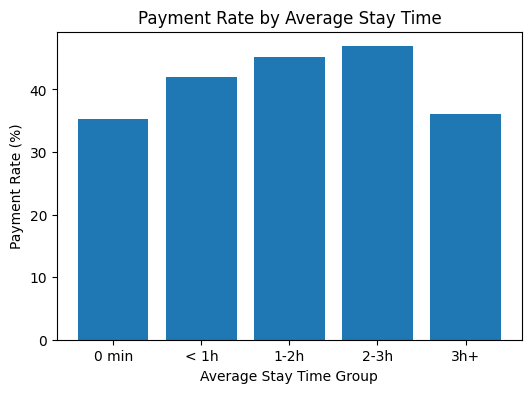

In [ ]:
plt.figure(figsize=(6, 4))

plt.bar(
    stay_payment['avg_stay_group'].astype(str),
    stay_payment['payment_rate_pct']
)

plt.title('Payment Rate by Average Stay Time')
plt.xlabel('Average Stay Time Group')
plt.ylabel('Payment Rate (%)')

plt.show()

In [ ]:
# 첫 방문까지 걸린 시간 구간 만들기
# first_visit_gap 단위: 일

def first_visit_gap_group(x):
    if pd.isna(x):
        return 'No Visit' # 방문 기록 없음
    elif x <= 0:
        return 'Same Day' # 신청 당일 방문
    elif x <= 1:
        return 'Within 1 Day' # 신청 후 1일 이내 방문
    elif x <= 2:
        return 'Within 2 Days' # 신청 후 2일 이내 방문
    else:
        return 'After 2 Days' # 신청 후 2일 이후 방문

df['first_visit_gap_group'] = df['first_visit_gap'].apply(first_visit_gap_group)

In [ ]:
# 첫 방문까지 걸린 시간별 결제율
first_gap_payment = df.groupby('first_visit_gap_group').agg(
    user_count=('user_uuid', 'count'),
    paid_users=('is_payment', 'sum'),
    payment_rate=('is_payment', 'mean')
).reset_index()

first_gap_payment['payment_rate_pct'] = (
    first_gap_payment['payment_rate'] * 100
).round(2)

first_gap_payment

,first_visit_gap_group,user_count,paid_users,payment_rate,payment_rate_pct
0,After 2 Days,511,227,0.444227,44.42
1,No Visit,3090,1088,0.352104,35.21
2,Same Day,1663,614,0.369212,36.92
3,Within 1 Day,3351,1313,0.391823,39.18
4,Within 2 Days,1009,410,0.406343,40.63


In [ ]:
gap_order = ['No Visit', 'Same Day', 'Within 1 Day', 'Within 2 Days', 'After 2 Days']

first_gap_payment['first_visit_gap_group'] = pd.Categorical(
    first_gap_payment['first_visit_gap_group'],
    categories=gap_order,
    ordered=True
)

first_gap_payment = first_gap_payment.sort_values('first_visit_gap_group')

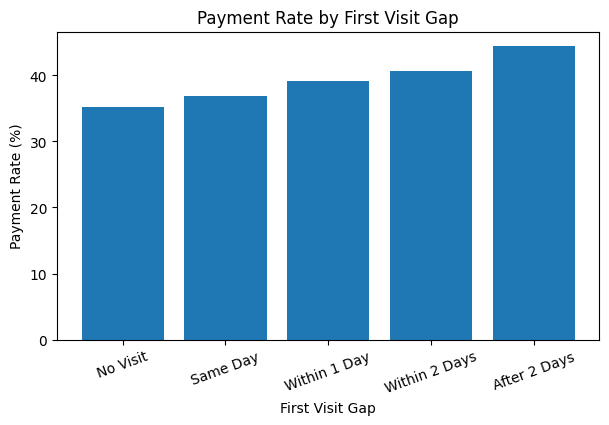

In [ ]:
plt.figure(figsize=(7, 4))

plt.bar(
    first_gap_payment['first_visit_gap_group'].astype(str),
    first_gap_payment['payment_rate_pct']
)

plt.title('Payment Rate by First Visit Gap')
plt.xlabel('First Visit Gap')
plt.ylabel('Payment Rate (%)')

plt.xticks(rotation=20)
plt.show()

In [ ]:
# 주말 방문 비율 구간 만들기
# weekend_ratio: 전체 방문 중 주말 방문 비중

def weekend_group(x):
    if pd.isna(x):
        return 'No Visit'
    elif x == 0:
        return 'Weekday Only'
    elif x < 0.5:
        return 'Mostly Weekday'
    elif x < 1:
        return 'Mostly Weekend'
    else:
        return 'Weekend Only'

df['weekend_group'] = df['weekend_ratio'].apply(weekend_group)

In [ ]:
weekend_payment = df.groupby('weekend_group').agg(
    user_count=('user_uuid', 'count'),
    paid_users=('is_payment', 'sum'),
    payment_rate=('is_payment', 'mean')
).reset_index()

weekend_payment['payment_rate_pct'] = (
    weekend_payment['payment_rate'] * 100
).round(2)

weekend_payment

,weekend_group,user_count,paid_users,payment_rate,payment_rate_pct
0,Mostly Weekday,251,137,0.545817,54.58
1,Mostly Weekend,780,351,0.450000,45.00
2,No Visit,3417,1253,0.366696,36.67
3,Weekday Only,4314,1648,0.382012,38.20
4,Weekend Only,862,263,0.305104,30.51


In [ ]:
weekend_order = [
    'No Visit',
    'Weekday Only',
    'Mostly Weekday',
    'Mostly Weekend',
    'Weekend Only'
]

weekend_payment['weekend_group'] = pd.Categorical(
    weekend_payment['weekend_group'],
    categories=weekend_order,
    ordered=True
)

weekend_payment = weekend_payment.sort_values('weekend_group')

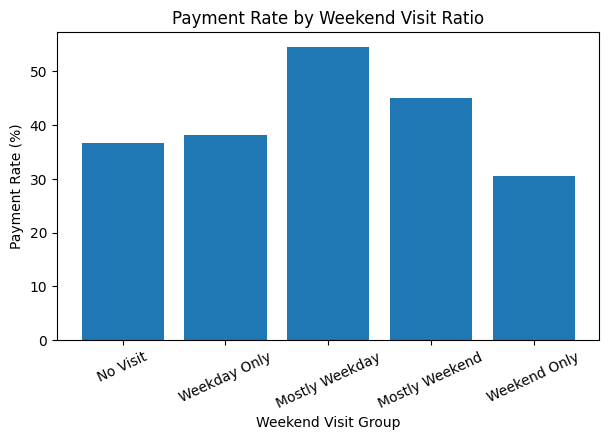

In [ ]:
plt.figure(figsize=(7, 4))

plt.bar(
    weekend_payment['weekend_group'].astype(str),
    weekend_payment['payment_rate_pct']
)

plt.title('Payment Rate by Weekend Visit Ratio')
plt.xlabel('Weekend Visit Group')
plt.ylabel('Payment Rate (%)')

plt.xticks(rotation=25)
plt.show()

In [ ]:
# 평균 입실 시간대 구간 만들기
# avg_enter_hour: 평균 입실 시간

def enter_hour_group(x):
    if pd.isna(x):
        return 'No Check-in'
    elif x < 10:
        return 'Before 10'
    elif x < 13:
        return '10-13'
    elif x < 17:
        return '13-17'
    else:
        return 'After 17'

df['enter_hour_group'] = df['avg_enter_hour'].apply(enter_hour_group)

In [ ]:
# 평균 입실 시간대별 결제율
enter_payment = df.groupby('enter_hour_group').agg(
    user_count=('user_uuid', 'count'),
    paid_users=('is_payment', 'sum'),
    payment_rate=('is_payment', 'mean')
).reset_index()

enter_payment['payment_rate_pct'] = (
    enter_payment['payment_rate'] * 100
).round(2)

enter_payment

,enter_hour_group,user_count,paid_users,payment_rate,payment_rate_pct
0,10-13,687,323,0.470160,47.02
1,13-17,176,70,0.397727,39.77
2,After 17,38,19,0.500000,50.00
3,Before 10,5109,1921,0.376003,37.60
4,No Check-in,3614,1319,0.364970,36.50


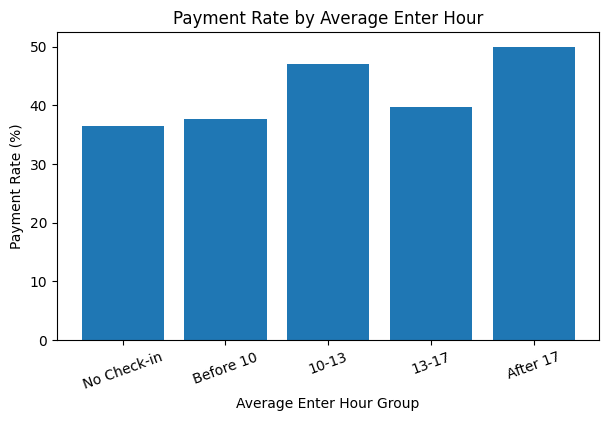

In [ ]:
# 그래프 순서 정리
enter_order = ['No Check-in', 'Before 10', '10-13', '13-17', 'After 17']

enter_payment['enter_hour_group'] = pd.Categorical(
    enter_payment['enter_hour_group'],
    categories=enter_order,
    ordered=True
)

enter_payment = enter_payment.sort_values('enter_hour_group')

plt.figure(figsize=(7, 4))

plt.bar(
    enter_payment['enter_hour_group'].astype(str),
    enter_payment['payment_rate_pct']
)

plt.title('Payment Rate by Average Enter Hour')
plt.xlabel('Average Enter Hour Group')
plt.ylabel('Payment Rate (%)')

plt.xticks(rotation=20)
plt.show()

In [ ]:
# 지점 정보가 있는 유저만 사용
site_df = df[df['site_id'].notna()].copy()

site_df.shape

(6534, 41)

In [ ]:
# 지점별 결제율 및 이용 현황
site_payment = site_df.groupby('site_id').agg(
    user_count=('user_uuid', 'count'),
    paid_users=('is_payment', 'sum'),
    payment_rate=('is_payment', 'mean'),
    avg_stay_min=('avg_stay_min', 'mean'),
    total_stay_min=('total_stay_min', 'mean'),
    area_pyeong=('area_pyeong', 'first')
).reset_index()

# 결제율 %
site_payment['payment_rate_pct'] = (
    site_payment['payment_rate'] * 100
).round(2)

site_payment

,site_id,user_count,paid_users,payment_rate,avg_stay_min,total_stay_min,area_pyeong,payment_rate_pct
0,1,869,360,0.414269,241.678583,429.594304,50.0,41.43
1,17,435,154,0.354023,218.701293,412.129425,50.0,35.40
2,2,1095,398,0.363470,300.476750,572.100700,100.0,36.35
3,3,1335,571,0.427715,273.916800,509.408876,150.0,42.77
4,4,497,201,0.404427,254.451682,454.436385,100.0,40.44
5,47,325,110,0.338462,224.818444,394.897846,50.0,33.85
6,49,135,57,0.422222,244.573498,458.460247,50.0,42.22
7,5,598,268,0.448161,259.547064,474.221293,150.0,44.82
8,6,1245,445,0.357430,269.050635,498.865663,150.0,35.74


In [ ]:
site_payment.sort_values('payment_rate_pct', ascending=False)

,site_id,user_count,paid_users,payment_rate,avg_stay_min,total_stay_min,area_pyeong,payment_rate_pct
7,5,598,268,0.448161,259.547064,474.221293,150.0,44.82
3,3,1335,571,0.427715,273.916800,509.408876,150.0,42.77
6,49,135,57,0.422222,244.573498,458.460247,50.0,42.22
0,1,869,360,0.414269,241.678583,429.594304,50.0,41.43
4,4,497,201,0.404427,254.451682,454.436385,100.0,40.44
2,2,1095,398,0.363470,300.476750,572.100700,100.0,36.35
8,6,1245,445,0.357430,269.050635,498.865663,150.0,35.74
1,17,435,154,0.354023,218.701293,412.129425,50.0,35.40
5,47,325,110,0.338462,224.818444,394.897846,50.0,33.85


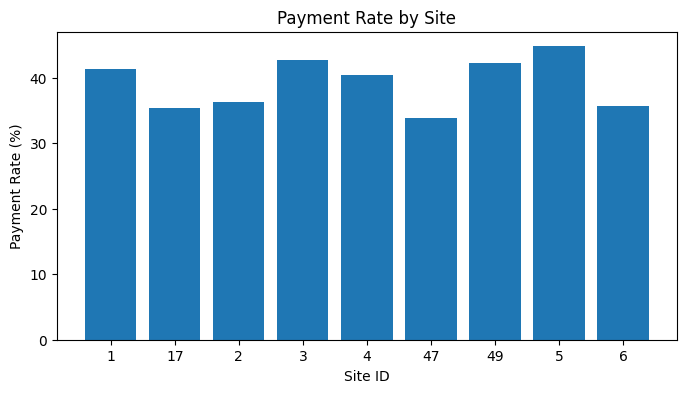

In [ ]:
plt.figure(figsize=(8, 4))

plt.bar(
    site_payment['site_id'].astype(str),
    site_payment['payment_rate_pct']
)

plt.title('Payment Rate by Site')
plt.xlabel('Site ID')
plt.ylabel('Payment Rate (%)')

plt.show()

In [ ]:
# 면적별 결제율
area_payment = site_df.groupby('area_pyeong').agg(
    user_count=('user_uuid', 'count'),
    paid_users=('is_payment', 'sum'),
    payment_rate=('is_payment', 'mean'),
    avg_stay_min=('avg_stay_min', 'mean'),
    visit_days=('visit_days', 'mean')
).reset_index()

area_payment['payment_rate_pct'] = (
    area_payment['payment_rate'] * 100
).round(2)

area_payment

,area_pyeong,user_count,paid_users,payment_rate,avg_stay_min,visit_days,payment_rate_pct
0,50.0,1764,681,0.386054,233.127646,1.686508,38.61
1,100.0,1592,599,0.376256,286.108371,1.769472,37.63
2,150.0,3178,1284,0.404028,269.306518,1.737885,40.40


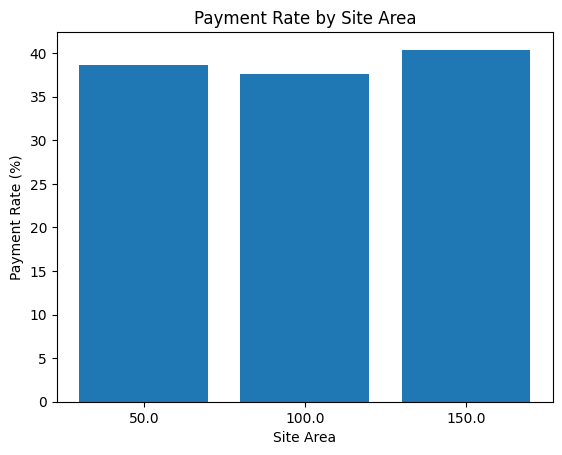

In [ ]:
plt.bar(
    area_payment['area_pyeong'].astype(str),
    area_payment['payment_rate_pct']
)

plt.title('Payment Rate by Site Area')
plt.xlabel('Site Area')
plt.ylabel('Payment Rate (%)')

plt.show()

In [ ]:
df.head()

,trial_date,user_uuid,is_payment,visit_days,visit_count,total_stay_min,avg_stay_min,total_out_min,avg_out_min,access_count,...,checkout_count,main_site_stay_sec,main_site_visit_days,trial_month,trial_dow,first_visit_gap,avg_stay_group,first_visit_gap_group,weekend_group,enter_hour_group
0,2023-09-04,000590dc-046f-462b-8225-4c81a97b7166,0,1,1,356.950000,356.950000,5.783333,5.783333,6,...,3,21417.0,1,2023-09,0,1.0,3h+,Within 1 Day,Weekday Only,Before 10
1,2021-10-16,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0,0,0,0.000000,0.000000,0.000000,0.000000,0,...,0,NaN,<NA>,2021-10,5,NaN,0 min,No Visit,No Visit,No Check-in
2,2021-09-29,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1,3,3,759.483333,253.161111,152.500000,50.833333,18,...,9,45569.0,3,2021-09,2,1.0,3h+,Within 1 Day,Mostly Weekday,Before 10
3,2023-04-03,0013f481-efed-4508-8836-70cbd64c477e,1,0,0,0.000000,0.000000,0.000000,0.000000,0,...,0,NaN,<NA>,2023-04,0,NaN,0 min,No Visit,No Visit,No Check-in
4,2023-11-14,0018e22d-a2cc-4e06-bca2-d6a041770f3b,0,2,2,1289.533333,644.766667,8.300000,4.150000,19,...,8,77372.0,2,2023-11,1,1.0,3h+,Within 1 Day,Weekday Only,Before 10


In [ ]:
df['visit_days']

0       1
1       0
2       3
3       0
4       2
       ..
9619    3
9620    0
9621    0
9622    0
9623    1
Name: visit_days, Length: 9624, dtype: Int64

In [ ]:
df['days_active']

0       1
1       0
2       3
3       0
4       2
       ..
9619    3
9620    0
9621    0
9622    0
9623    1
Name: days_active, Length: 9624, dtype: Int64

In [ ]:
df.shape

(9624, 41)

In [ ]:
df['checkin_count']

0        3
1        0
2        9
3        0
4       11
        ..
9619    10
9620     0
9621     0
9622     0
9623     4
Name: checkin_count, Length: 9624, dtype: Int64

In [ ]:
df['checkout_count']

0        3
1        0
2        9
3        0
4        8
        ..
9619    10
9620     0
9621     0
9622     0
9623     3
Name: checkout_count, Length: 9624, dtype: Int64

In [ ]:
df[df['checkin_count'] != df['checkout_count']]

,trial_date,user_uuid,is_payment,visit_days,visit_count,total_stay_min,avg_stay_min,total_out_min,avg_out_min,access_count,...,checkout_count,main_site_stay_sec,main_site_visit_days,trial_month,trial_dow,first_visit_gap,avg_stay_group,first_visit_gap_group,weekend_group,enter_hour_group
4,2023-11-14,0018e22d-a2cc-4e06-bca2-d6a041770f3b,0,2,2,1289.533333,644.766667,8.300000,4.150000,19,...,8,77372.0,2,2023-11,1,1.0,3h+,Within 1 Day,Weekday Only,Before 10
8,2023-04-24,0038199b-5063-4500-9f5a-f9ad5aed0847,0,2,2,542.216667,271.108333,31.600000,15.800000,26,...,15,32533.0,2,2023-04,0,1.0,3h+,Within 1 Day,Weekday Only,Before 10
16,2022-10-31,007ffab4-0b86-4683-a6c1-cff33a587503,0,3,3,1135.383333,378.461111,1903.933333,634.644444,13,...,6,68123.0,3,2022-10,0,1.0,3h+,Within 1 Day,Weekday Only,10-13
22,2023-11-26,00a94a4e-2cb0-4b49-b250-349bd51aff31,0,2,2,653.683333,326.841667,3.316667,1.658333,5,...,2,39221.0,2,2023-11,6,0.0,3h+,Same Day,Mostly Weekend,13-17
23,2022-03-06,00b27799-6ef2-4eda-a714-c31a03531672,1,3,3,961.133333,320.377778,346.700000,115.566667,24,...,11,57668.0,3,2022-03,6,1.0,3h+,Within 1 Day,Weekday Only,Before 10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9603,2023-10-31,ff75696a-6322-466c-9325-318f5a200074,1,3,3,459.100000,153.033333,0.016667,0.005556,5,...,2,27546.0,3,2023-10,1,1.0,2-3h,Within 1 Day,Weekday Only,10-13
9606,2021-09-03,ff87a91c-2fe3-4ec4-9094-e8b2819685a5,0,1,1,408.550000,408.550000,24.683333,24.683333,5,...,3,24513.0,1,2021-09,4,1.0,3h+,Within 1 Day,Weekend Only,Before 10
9614,2022-10-19,ffc40f65-7634-4272-b73b-55d40be035ff,0,3,3,952.633333,317.544444,39.616667,13.205556,13,...,6,57158.0,3,2022-10,2,1.0,3h+,Within 1 Day,Mostly Weekday,Before 10
9616,2021-05-27,ffc79669-ed11-4cde-86d4-8ec232ac7b14,0,2,2,576.416667,288.208333,0.000000,0.000000,9,...,4,34585.0,2,2021-05,3,2.0,3h+,Within 2 Days,No Visit,Before 10


In [ ]:
len(df[df['checkin_count'] != df['checkout_count']]) / len(df)

0.18308395677472986

In [ ]:
len(df)

9624

## 본격 EDA

In [ ]:
import pandas as pd

# 1. 원본 데이터 불러오기
site_area = pd.read_csv("../data/site_area.csv")
access_log = pd.read_csv("../data/trial_access_log.csv")
payment = pd.read_csv("../data/trial_payment.csv")
register = pd.read_csv("../data/trial_register.csv")
visit_info = pd.read_csv("../data/trial_visit_info.csv")

# 2. 완전 중복 제거
site_area = site_area.drop_duplicates()
access_log = access_log.drop_duplicates()
payment = payment.drop_duplicates()
register = register.drop_duplicates()
visit_info = visit_info.drop_duplicates()

# 3. 날짜 컬럼 datetime 변환
# 날짜 컬럼 datetime 변환
register["trial_date"] = pd.to_datetime(register["trial_date"], format="mixed")

access_log["cdate"] = pd.to_datetime(access_log["cdate"], format="mixed")

visit_info["date"] = pd.to_datetime(visit_info["date"], format="mixed")
visit_info["first_enter_time"] = pd.to_datetime(visit_info["first_enter_time"], format="mixed")
visit_info["last_leave_time"] = pd.to_datetime(visit_info["last_leave_time"], format="mixed")

# 4. register: 같은 유저가 여러 번 신청한 경우, 가장 마지막 신청일만 남김
register = (
    register
    .sort_values(["user_uuid", "trial_date"])
    .drop_duplicates(subset="user_uuid", keep="last")
)

# 5. visit_info: stay_time은 stay_time_second와 거의 중복이므로 제거
visit_info = visit_info.drop(columns=["stay_time"])

# 6. 체류시간 분 단위 컬럼 생성
visit_info["stay_time_min"] = visit_info["stay_time_second"] / 60

# 7. 총 경과시간 계산: 마지막 퇴실 - 첫 입실
visit_info["total_min"] = (
    visit_info["last_leave_time"] - visit_info["first_enter_time"]
).dt.total_seconds() / 60

# 8. 외출시간 계산: 총 경과시간 - 실제 체류시간
visit_info["out_min"] = visit_info["total_min"] - visit_info["stay_time_min"]

# 9. out_min이 음수인 이상치 제거
visit_info = visit_info[
    (visit_info["out_min"].isna()) | (visit_info["out_min"] >= 0)
]

# 10. 전처리 후 데이터 크기 확인
print("site_area:", site_area.shape)
print("access_log:", access_log.shape)
print("payment:", payment.shape)
print("register:", register.shape)
print("visit_info:", visit_info.shape)

site_area: (9, 2)
access_log: (63349, 5)
payment: (9624, 2)
register: (9624, 2)
visit_info: (11429, 9)


In [ ]:
print(register["trial_date"].isna().sum())
print(access_log["cdate"].isna().sum())
print(visit_info[["date", "first_enter_time", "last_leave_time", "out_min"]].isna().sum())

0
0
date                  0
first_enter_time    555
last_leave_time     555
out_min             555
dtype: int64


In [ ]:
access_log["checkin"].value_counts() # 1: 입실, 2: 퇴실

checkin
1    31966
2    31383
Name: count, dtype: int64

In [ ]:
# 1. access_log UTC → KST 변환
access_log["cdate_kst"] = access_log["cdate"] + pd.Timedelta(hours=9)


# 2. 날짜 기준 컬럼 만들기
# visit_info는 이미 KST 기준
visit_info["visit_date"] = visit_info["date"].dt.date

# access_log는 KST로 변환한 날짜 기준 사용
access_log["visit_date_kst"] = access_log["cdate_kst"].dt.date

# 3. 유저 + 지점 + KST 날짜별 첫 출입 / 마지막 출입 시간 만들기
access_summary = (
    access_log
    .groupby(["user_uuid", "site_id", "visit_date_kst"])
    .agg(
        first_enter_from_log=("cdate_kst", "min"),  # KST 기준 가장 빠른 출입
        last_leave_from_log=("cdate_kst", "max")    # KST 기준 가장 늦은 출입
    )
    .reset_index()
)

# 4. visit_info에 붙이기
visit_info = visit_info.merge(
    access_summary,
    left_on=["user_uuid", "site_id", "visit_date"],
    right_on=["user_uuid", "site_id", "visit_date_kst"],
    how="left"
)

# 5. 결측치만 access_log 값으로 채우기
visit_info["first_enter_time"] = visit_info["first_enter_time"].fillna(
    visit_info["first_enter_from_log"]
)

visit_info["last_leave_time"] = visit_info["last_leave_time"].fillna(
    visit_info["last_leave_from_log"]
)

# 6. 임시 컬럼 제거
visit_info = visit_info.drop(
    columns=[
        "visit_date_kst",
        "first_enter_from_log",
        "last_leave_from_log"
    ],
    errors="ignore"
)

# 7. 결측치가 얼마나 줄었는지 확인
visit_info[["first_enter_time", "last_leave_time"]].isna().sum()

first_enter_time    65
last_leave_time     65
dtype: int64

In [ ]:
# =========================
# Step 2. 유저 단위 EDA 테이블 만들기
# =========================

# 1. register + payment 결합
# 모든 신청 유저를 기준으로 결제 여부를 붙임
user_df = register.merge(
    payment,
    on="user_uuid",
    how="left"
)

# 결제 정보가 없으면 미결제로 처리
user_df["is_payment"] = user_df["is_payment"].fillna(0).astype(int)


# 2. visit_info에서 방문 요약 만들기
visit_summary = (
    visit_info
    .groupby("user_uuid")
    .agg(
        visit_count=("date", "count"),              # 방문 기록 수
        visit_days=("date", "nunique"),             # 방문한 날짜 수
        total_stay_min=("stay_time_min", "sum"),    # 총 체류시간
        avg_stay_min=("stay_time_min", "mean"),     # 평균 체류시간
        first_visit_date=("date", "min")            # 첫 방문일
    )
    .reset_index()
)


# 3. 유저별 가장 많이 방문한 지점 구하기
main_site = (
    visit_info
    .groupby(["user_uuid", "site_id"])
    .size()
    .reset_index(name="site_visit_count")
    .sort_values(["user_uuid", "site_visit_count"], ascending=[True, False])
    .drop_duplicates("user_uuid", keep="first")
    [["user_uuid", "site_id"]]
    .rename(columns={"site_id": "main_site_id"})
)


# 4. user_df에 방문 요약 + 주요 지점 붙이기
user_df = user_df.merge(visit_summary, on="user_uuid", how="left")
user_df = user_df.merge(main_site, on="user_uuid", how="left")


# 5. 방문하지 않은 유저는 방문 관련 값을 0으로 처리
user_df["visit_count"] = user_df["visit_count"].fillna(0).astype(int)
user_df["visit_days"] = user_df["visit_days"].fillna(0).astype(int)
user_df["total_stay_min"] = user_df["total_stay_min"].fillna(0)
user_df["avg_stay_min"] = user_df["avg_stay_min"].fillna(0)


# 6. 신청 후 첫 방문까지 걸린 일수 계산
user_df["first_visit_gap"] = (
    user_df["first_visit_date"] - user_df["trial_date"]
).dt.days

# 방문하지 않은 유저는 first_visit_gap이 NaN으로 남는 게 맞음


# 7. 결과 확인
print(user_df.shape)
user_df.head()

(9624, 10)


,trial_date,user_uuid,is_payment,visit_count,visit_days,total_stay_min,avg_stay_min,first_visit_date,main_site_id,first_visit_gap
0,2023-09-04,000590dc-046f-462b-8225-4c81a97b7166,0,1,1,356.950000,356.950000,2023-09-05,6.0,1.0
1,2021-10-16,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0,0,0,0.000000,0.000000,NaT,NaN,NaN
2,2021-09-29,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1,3,3,759.483333,253.161111,2021-09-30,3.0,1.0
3,2023-04-03,0013f481-efed-4508-8836-70cbd64c477e,1,0,0,0.000000,0.000000,NaT,NaN,NaN
4,2023-11-14,0018e22d-a2cc-4e06-bca2-d6a041770f3b,0,2,2,1289.533333,644.766667,2023-11-15,6.0,1.0


In [ ]:
# =========================
# Step 3. 방문 여부별 유료 전환율
# =========================

# 1. 방문 여부 컬럼 만들기
# visit_count가 1 이상이면 방문, 0이면 미방문
user_df["is_visited"] = user_df["visit_count"].apply(lambda x: "방문" if x > 0 else "미방문")

# 2. 방문 여부별 전환율 계산
visit_payment = (
    user_df
    .groupby("is_visited")
    .agg(
        user_count=("user_uuid", "count"),      # 유저 수
        paid_count=("is_payment", "sum")        # 결제 유저 수
    )
    .reset_index()
)

# 3. 전환율 계산 / 전환율 = 결제 유저 수 / 전체 유저 수 * 100
visit_payment["conversion_rate"] = (
    visit_payment["paid_count"] / visit_payment["user_count"] * 100
).round(1)

# 4. 출력
visit_payment

,is_visited,user_count,paid_count,conversion_rate
0,미방문,3090,1088,35.2
1,방문,6534,2564,39.2


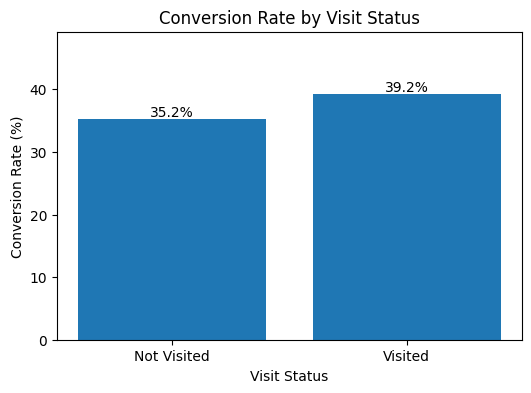

In [ ]:
visit_payment["visit_status_en"] = visit_payment["is_visited"].map({
    "방문": "Visited",
    "미방문": "Not Visited"
})

import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))

bars = plt.bar(
    visit_payment["visit_status_en"],
    visit_payment["conversion_rate"]
)

plt.title("Conversion Rate by Visit Status")
plt.xlabel("Visit Status")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, visit_payment["conversion_rate"].max() + 10)

# 막대 위 숫자 표시
for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
# =========================
# Step 4. 방문 횟수별 유료 전환율
# =========================

# 1. 방문 횟수 구간 만들기
def visit_group(x):
    if x == 0:
        return "0"
    elif x == 1:
        return "1"
    elif x <= 3:
        return "2-3"
    elif x <= 5:
        return "4-5"
    else:
        return "6+"

user_df["visit_count_group"] = user_df["visit_count"].apply(visit_group)

# 2. 구간 순서 지정
group_order = ["0", "1", "2-3", "4-5", "6+"]

# 3. 방문 횟수 구간별 전환율 계산
visit_count_payment = (
    user_df
    .groupby("visit_count_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum")
    )
    .reindex(group_order)
    .reset_index()
)

visit_count_payment["conversion_rate"] = (
    visit_count_payment["paid_count"] / visit_count_payment["user_count"] * 100
).round(1)

visit_count_payment

,visit_count_group,user_count,paid_count,conversion_rate
0,0,3090,1088,35.2
1,1,3189,1064,33.4
2,2-3,3225,1410,43.7
3,4-5,119,90,75.6
4,6+,1,0,0.0


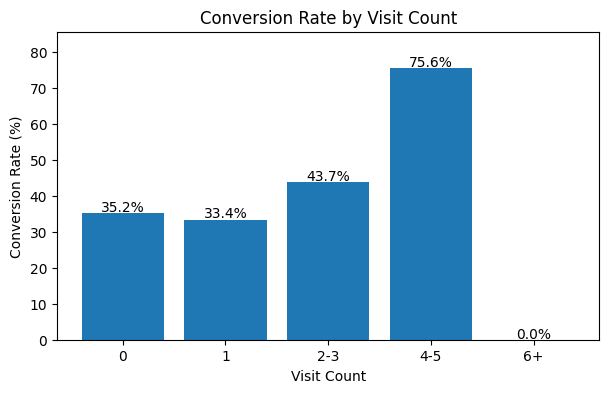

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 4))

bars = plt.bar(
    visit_count_payment["visit_count_group"],
    visit_count_payment["conversion_rate"]
)

plt.title("Conversion Rate by Visit Count")
plt.xlabel("Visit Count")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, visit_count_payment["conversion_rate"].max() + 10)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
# =========================
# Step 5. 방문일수별 유료 전환율
# =========================

# 1. 방문일수 구간 만들기
def visit_days_group(x):
    if x == 0:
        return "0"
    elif x == 1:
        return "1"
    elif x == 2:
        return "2"
    else:
        return "3+"

user_df["visit_days_group"] = user_df["visit_days"].apply(visit_days_group)

# 2. 구간 순서 지정
days_order = ["0", "1", "2", "3+"]

# 3. 방문일수별 전환율 계산
visit_days_payment = (
    user_df
    .groupby("visit_days_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum")
    )
    .reindex(days_order)
    .reset_index()
)

visit_days_payment["conversion_rate"] = (
    visit_days_payment["paid_count"] / visit_days_payment["user_count"] * 100
).round(1)

visit_days_payment

,visit_days_group,user_count,paid_count,conversion_rate
0,0,3090,1088,35.2
1,1,3220,1076,33.4
2,2,1932,811,42.0
3,3+,1382,677,49.0


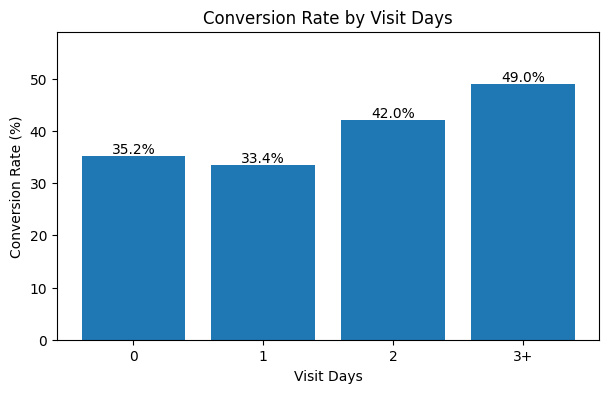

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 4))

bars = plt.bar(
    visit_days_payment["visit_days_group"],
    visit_days_payment["conversion_rate"]
)

plt.title("Conversion Rate by Visit Days")
plt.xlabel("Visit Days")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, visit_days_payment["conversion_rate"].max() + 10)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
# =========================
# Step 6. 총 체류시간별 유료 전환율
# =========================

# 1. 총 체류시간을 시간 단위로 변환
user_df["total_stay_hr"] = user_df["total_stay_min"] / 60

# 2. 체류시간 구간 만들기
def stay_group(x):
    if x == 0:
        return "0"
    elif x < 2:
        return "<2h"
    elif x < 5:
        return "2-5h"
    elif x < 10:
        return "5-10h"
    else:
        return "10h+"

user_df["stay_group"] = user_df["total_stay_hr"].apply(stay_group)

# 3. 구간 순서 지정
stay_order = ["0", "<2h", "2-5h", "5-10h", "10h+"]

# 4. 체류시간 구간별 전환율 계산
stay_payment = (
    user_df
    .groupby("stay_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum")
    )
    .reindex(stay_order)
    .reset_index()
)

stay_payment["conversion_rate"] = (
    stay_payment["paid_count"] / stay_payment["user_count"] * 100
).round(1)

stay_payment

,stay_group,user_count,paid_count,conversion_rate
0,0,3090,1088,35.2
1,<2h,1105,426,38.6
2,2-5h,1697,694,40.9
3,5-10h,1796,691,38.5
4,10h+,1936,753,38.9


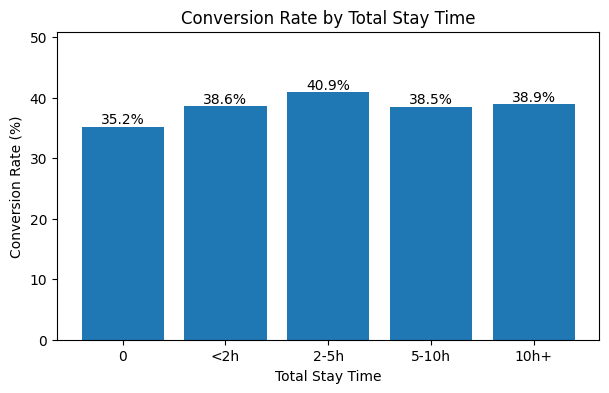

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 4))

bars = plt.bar(
    stay_payment["stay_group"],
    stay_payment["conversion_rate"]
)

plt.title("Conversion Rate by Total Stay Time")
plt.xlabel("Total Stay Time")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, stay_payment["conversion_rate"].max() + 10)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
# =========================
# Step 7. First Visit Gap별 유료 전환율
# =========================

# 1. 첫 방문까지 걸린 기간 구간 만들기
def gap_group(x):
    if pd.isna(x):
        return "No Visit"
    elif x <= 0:
        return "Same Day"
    elif x == 1:
        return "1 Day"
    elif x <= 3:
        return "2-3 Days"
    else:
        return "4+ Days"

user_df["first_visit_gap_group"] = user_df["first_visit_gap"].apply(gap_group)

# 2. 구간 순서 지정
gap_order = ["No Visit", "Same Day", "1 Day", "2-3 Days", "4+ Days"]

# 3. 구간별 전환율 계산
gap_payment = (
    user_df
    .groupby("first_visit_gap_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum")
    )
    .reindex(gap_order)
    .reset_index()
)

gap_payment["conversion_rate"] = (
    gap_payment["paid_count"] / gap_payment["user_count"] * 100
).round(1)

gap_payment

,first_visit_gap_group,user_count,paid_count,conversion_rate
0,No Visit,3090.0,1088.0,35.2
1,Same Day,1663.0,614.0,36.9
2,1 Day,3351.0,1313.0,39.2
3,2-3 Days,1520.0,637.0,41.9
4,4+ Days,NaN,NaN,NaN


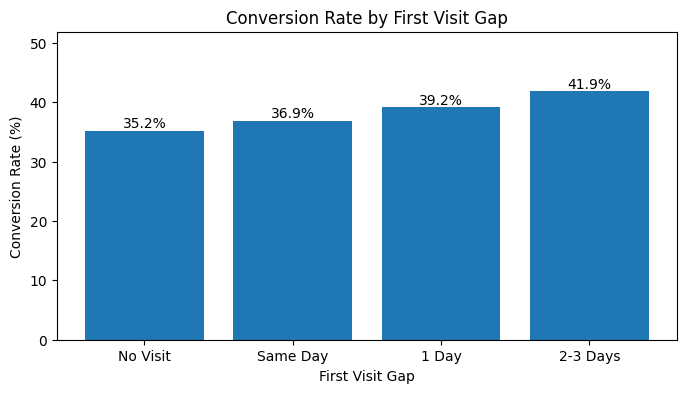

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))

bars = plt.bar(
    gap_payment["first_visit_gap_group"],
    gap_payment["conversion_rate"]
)

plt.title("Conversion Rate by First Visit Gap")
plt.xlabel("First Visit Gap")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, gap_payment["conversion_rate"].max() + 10)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
# =========================
# Step 8. True Funnel Analysis
# 이전 단계를 밟은 사람만 다음 단계로 계산
# =========================

# 1. 단계 조건 만들기
registered = user_df.copy()

visited = registered[registered["visit_count"] > 0]

visited_2days = visited[visited["visit_days"] >= 2]

paid_after_2days = visited_2days[visited_2days["is_payment"] == 1]

# 2. 퍼널 테이블 만들기
funnel_df = pd.DataFrame({
    "stage": ["Registered", "Visited", "Visited 2+ Days", "Paid"],
    "user_count": [
        len(registered),
        len(visited),
        len(visited_2days),
        len(paid_after_2days)
    ]
})

# 3. 직전 단계 대비 전환율
funnel_df["step_conversion_rate"] = (
    funnel_df["user_count"] / funnel_df["user_count"].shift(1) * 100
).round(1)

# 첫 단계는 100%
funnel_df.loc[0, "step_conversion_rate"] = 100.0

# 4. 전체 등록자 대비 전환율
funnel_df["total_conversion_rate"] = (
    funnel_df["user_count"] / len(registered) * 100
).round(1)

funnel_df

,stage,user_count,step_conversion_rate,total_conversion_rate
0,Registered,9624,100.0,100.0
1,Visited,6534,67.9,67.9
2,Visited 2+ Days,3314,50.7,34.4
3,Paid,1488,44.9,15.5


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 퍼널 그래프 함수
def plot_funnel(df, title):
    plt.figure(figsize=(8, 4))
    
    bars = plt.barh(df["stage"], df["user_count"])
    plt.gca().invert_yaxis()  # 위에서 아래로 퍼널 순서 보이게
    
    plt.title(title)
    plt.xlabel("Users")
    plt.ylabel("Stage")
    
    # 막대 끝에 인원수 + 전환율 표시
    for i, bar in enumerate(bars):
        width = bar.get_width()
        step_rate = df.loc[i, "step_conversion_rate"]
        total_rate = df.loc[i, "total_conversion_rate"]
        
        plt.text(
            width + max(df["user_count"]) * 0.01,
            bar.get_y() + bar.get_height() / 2,
            f"{int(width):,} ({step_rate:.1f}%, total {total_rate:.1f}%)",
            va="center"
        )
    
    plt.xlim(0, max(df["user_count"]) * 1.25)
    plt.show()

In [ ]:
# Funnel 1
registered = user_df.copy()
visited = registered[registered["visit_count"] > 0]
visited_2days = visited[visited["visit_days"] >= 2]
paid_after_2days = visited_2days[visited_2days["is_payment"] == 1]

funnel_1 = pd.DataFrame({
    "stage": ["Registered", "Visited", "Visited 2+ Days", "Paid"],
    "user_count": [
        len(registered),
        len(visited),
        len(visited_2days),
        len(paid_after_2days)
    ]
})

funnel_1["step_conversion_rate"] = (
    funnel_1["user_count"] / funnel_1["user_count"].shift(1) * 100
).round(1)
funnel_1.loc[0, "step_conversion_rate"] = 100.0

funnel_1["total_conversion_rate"] = (
    funnel_1["user_count"] / len(registered) * 100
).round(1)

funnel_1

,stage,user_count,step_conversion_rate,total_conversion_rate
0,Registered,9624,100.0,100.0
1,Visited,6534,67.9,67.9
2,Visited 2+ Days,3314,50.7,34.4
3,Paid,1488,44.9,15.5


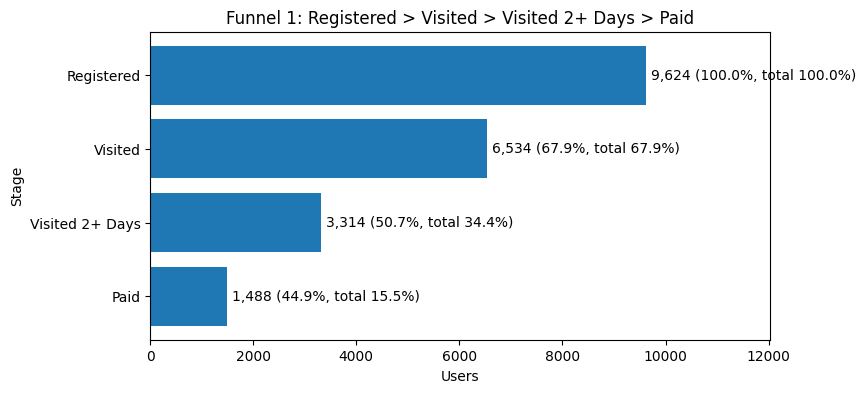

In [ ]:
plot_funnel(funnel_1, "Funnel 1: Registered > Visited > Visited 2+ Days > Paid")

In [ ]:
# Funnel 2
registered = user_df.copy()
visited = registered[registered["visit_count"] > 0]
paid_after_visit = visited[visited["is_payment"] == 1]

funnel_2 = pd.DataFrame({
    "stage": ["Registered", "Visited", "Paid"],
    "user_count": [
        len(registered),
        len(visited),
        len(paid_after_visit)
    ]
})

funnel_2["step_conversion_rate"] = (
    funnel_2["user_count"] / funnel_2["user_count"].shift(1) * 100
).round(1)
funnel_2.loc[0, "step_conversion_rate"] = 100.0

funnel_2["total_conversion_rate"] = (
    funnel_2["user_count"] / len(registered) * 100
).round(1)

funnel_2

,stage,user_count,step_conversion_rate,total_conversion_rate
0,Registered,9624,100.0,100.0
1,Visited,6534,67.9,67.9
2,Paid,2564,39.2,26.6


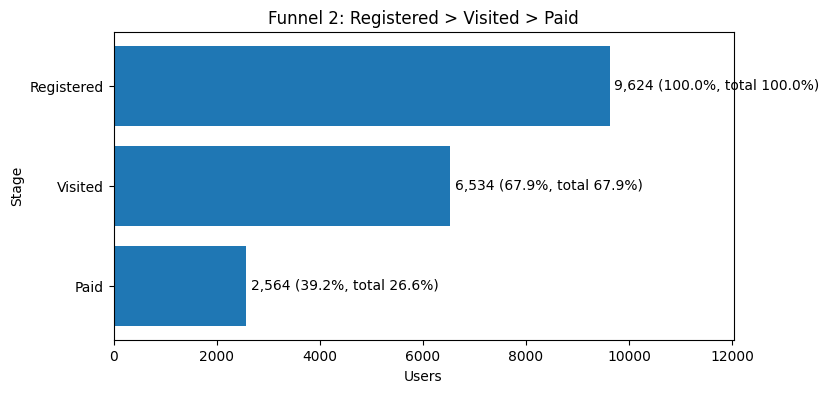

In [ ]:
plot_funnel(funnel_2, "Funnel 2: Registered > Visited > Paid")

In [ ]:
# Funnel 3
registered = user_df.copy()
not_visited = registered[registered["visit_count"] == 0]
paid_without_visit = not_visited[not_visited["is_payment"] == 1]

funnel_3 = pd.DataFrame({
    "stage": ["Registered", "Not Visited", "Paid without Visit"],
    "user_count": [
        len(registered),
        len(not_visited),
        len(paid_without_visit)
    ]
})

funnel_3["step_conversion_rate"] = (
    funnel_3["user_count"] / funnel_3["user_count"].shift(1) * 100
).round(1)
funnel_3.loc[0, "step_conversion_rate"] = 100.0

funnel_3["total_conversion_rate"] = (
    funnel_3["user_count"] / len(registered) * 100
).round(1)

funnel_3

,stage,user_count,step_conversion_rate,total_conversion_rate
0,Registered,9624,100.0,100.0
1,Not Visited,3090,32.1,32.1
2,Paid without Visit,1088,35.2,11.3


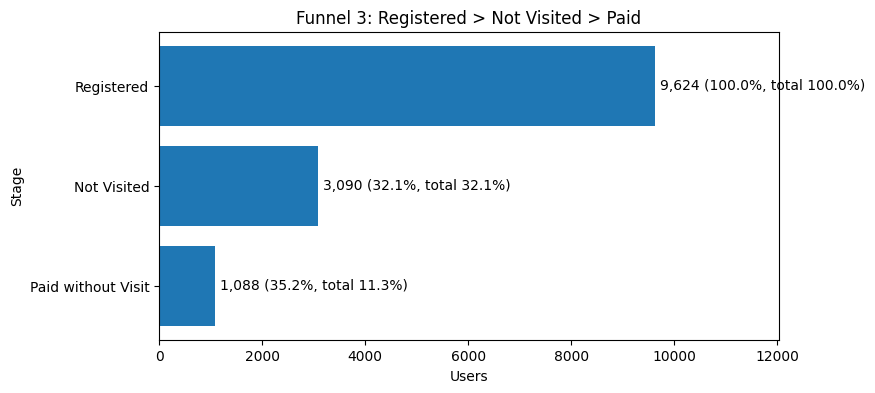

In [ ]:
plot_funnel(funnel_3, "Funnel 3: Registered > Not Visited > Paid")

In [ ]:
# =========================
# Step 10. Correlation with Payment
# =========================

# 1. 상관관계 볼 숫자형 변수 선택
corr_cols = [
    "is_payment",
    "visit_count",
    "visit_days",
    "total_stay_min",
    "avg_stay_min",
    "first_visit_gap"
]

# 2. 필요한 컬럼만 복사
corr_df = user_df[corr_cols].copy()

# 3. 상관계수 계산
corr_result = (
    corr_df
    .corr(numeric_only=True)["is_payment"]
    .sort_values(ascending=False)
)

corr_result

is_payment         1.000000
visit_days         0.102725
visit_count        0.102609
first_visit_gap    0.039043
total_stay_min     0.013084
avg_stay_min      -0.033390
Name: is_payment, dtype: float64

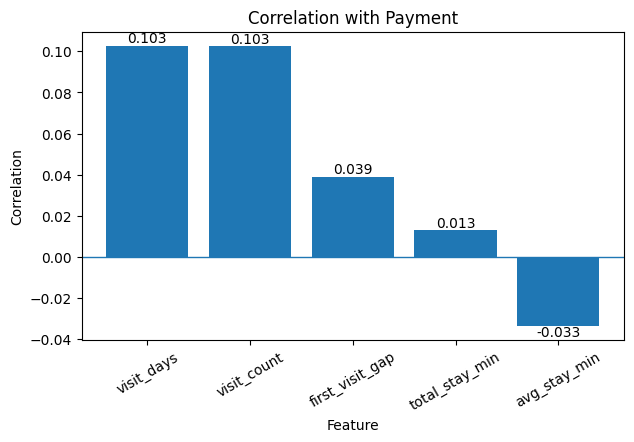

In [ ]:
import matplotlib.pyplot as plt

# is_payment 자기 자신은 제외
plot_corr = corr_result.drop("is_payment")

plt.figure(figsize=(7, 4))

bars = plt.bar(
    plot_corr.index,
    plot_corr.values
)

plt.title("Correlation with Payment")
plt.xlabel("Feature")
plt.ylabel("Correlation")
plt.xticks(rotation=30)
plt.axhline(0, linewidth=1)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y,
        f"{y:.3f}",
        ha="center",
        va="bottom" if y >= 0 else "top"
    )

plt.show()

In [ ]:
# =========================
# Step 11. Chi-square Test
# 방문일수 그룹과 결제 여부의 관계 검정
# =========================

from scipy.stats import chi2_contingency

# 1. 교차표 만들기
# 행: 방문일수 그룹
# 열: 결제 여부(0=미결제, 1=결제)
cross_tab = pd.crosstab(
    user_df["visit_days_group"],
    user_df["is_payment"]
)

# 2. 컬럼명 변경
cross_tab.columns = ["Not Paid", "Paid"]

print(cross_tab)

                  Not Paid  Paid
visit_days_group                
0                     2002  1088
1                     2144  1076
2                     1121   811
3+                     705   677


In [ ]:
# 3. 카이제곱 검정 실행
chi2, p_value, dof, expected = chi2_contingency(cross_tab)

print("chi2:", chi2)
print("p-value:", p_value)
print("dof:", dof)

chi2: 122.75953178234913
p-value: 1.9636747933340282e-26
dof: 3


In [ ]:
# =========================
# Step 12. Mann-Whitney U Test
# 결제자 vs 미결제자의 방문일수 차이 검정
# =========================

from scipy.stats import mannwhitneyu

# 1. 결제자 / 미결제자 그룹 나누기
paid = user_df[user_df["is_payment"] == 1]
not_paid = user_df[user_df["is_payment"] == 0]

# 2. 방문일수 차이 검정
u_stat, p_value = mannwhitneyu(
    paid["visit_days"],
    not_paid["visit_days"],
    alternative="two-sided"
)

print("U-statistic:", u_stat)
print("p-value:", p_value)

# 3. 평균/중앙값 같이 확인
summary = pd.DataFrame({
    "group": ["Paid", "Not Paid"],
    "mean_visit_days": [
        paid["visit_days"].mean(),
        not_paid["visit_days"].mean()
    ],
    "median_visit_days": [
        paid["visit_days"].median(),
        not_paid["visit_days"].median()
    ]
})

summary

U-statistic: 12037682.5
p-value: 4.078391675007e-19


,group,mean_visit_days,median_visit_days
0,Paid,1.314074,1.0
1,Not Paid,1.091092,1.0


In [ ]:
# =========================
# Step 13. Mann-Whitney U Test
# 결제자 vs 미결제자의 방문횟수 차이 검정
# =========================

from scipy.stats import mannwhitneyu

paid = user_df[user_df["is_payment"] == 1]
not_paid = user_df[user_df["is_payment"] == 0]

u_stat, p_value = mannwhitneyu(
    paid["visit_count"],
    not_paid["visit_count"],
    alternative="two-sided"
)

print("U-statistic:", u_stat)
print("p-value:", p_value)

summary = pd.DataFrame({
    "group": ["Paid", "Not Paid"],
    "mean_visit_count": [
        paid["visit_count"].mean(),
        not_paid["visit_count"].mean()
    ],
    "median_visit_count": [
        paid["visit_count"].median(),
        not_paid["visit_count"].median()
    ]
})

summary

U-statistic: 12039209.0
p-value: 3.844675302173826e-19


,group,mean_visit_count,median_visit_count
0,Paid,1.328039,1.0
1,Not Paid,1.101641,1.0


## master_unified 로 하는 EDA

In [ ]:
import pandas as pd
master = pd.read_csv('../data/master_unified_KST포함_0528_수정요청사항 반영.csv')

In [ ]:
master.head(2)

,user_uuid,trial_date,trial_month,trial_dow,visited,visit_count,sites_used,days_active,visit_density,first_visit,...,total_access,checkin_count,checkout_count,first_access_time,last_access_time,main_site,main_site_pyeong,main_site_stay_sec,main_site_visit_days,is_payment
0,f25078d1-1030-485c-85c5-dc82d6987043,2021-05-01,5,5,0,0.0,0.0,0.0,0.0,NaN,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1
1,9f5e2bd3-65c9-4800-84c1-f5c93f44d096,2021-05-01,5,5,0,0.0,0.0,0.0,0.0,NaN,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1


In [ ]:
# 날짜 컬럼 datetime 변환
master["trial_date"] = pd.to_datetime(master["trial_date"], format="mixed")
master["first_visit"] = pd.to_datetime(master["first_visit"], format="mixed")
master["last_visit"] = pd.to_datetime(master["last_visit"], format="mixed")
master["first_access_time"] = pd.to_datetime(master["first_access_time"], format="mixed")
master["last_access_time"] = pd.to_datetime(master["last_access_time"], format="mixed")

In [ ]:
# avg_enter_hour_kst가 있는 유저만 사용
time_df = master[master["avg_enter_hour_kst"].notna()].copy()

print("전체 유저 수:", len(master))
print("시간대 분석 가능 유저 수:", len(time_df))
print("제외된 유저 수:", len(master) - len(time_df))

전체 유저 수: 9624
시간대 분석 가능 유저 수: 6010
제외된 유저 수: 3614


In [ ]:
# 시간대 구간 함수
def time_group(hour):
    if 5 <= hour < 9:
        return "Early Morning"
    elif 9 <= hour < 12:
        return "Morning"
    elif 12 <= hour < 15:
        return "Lunch"
    elif 15 <= hour < 18:
        return "Afternoon"
    elif 18 <= hour < 22:
        return "Evening"
    else:
        return "Night"

time_df["time_group"] = time_df["avg_enter_hour_kst"].apply(time_group)

# 구간 순서
time_order = [
    "Early Morning",
    "Morning",
    "Lunch",
    "Afternoon",
    "Evening",
    "Night"
]

In [ ]:
time_payment = (
    time_df
    .groupby("time_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum"),
        avg_enter_hour=("avg_enter_hour_kst", "mean")
    )
    .reindex(time_order)
    .reset_index()
)

time_payment["conversion_rate"] = (
    time_payment["paid_count"] / time_payment["user_count"] * 100
).round(1)

time_payment["avg_enter_hour"] = time_payment["avg_enter_hour"].round(1)

time_payment

,time_group,user_count,paid_count,avg_enter_hour,conversion_rate
0,Early Morning,32,16,7.6,50.0
1,Morning,1301,498,10.6,38.3
2,Lunch,2146,756,13.6,35.2
3,Afternoon,1351,528,16.3,39.1
4,Evening,998,462,19.7,46.3
5,Night,182,73,17.1,40.1


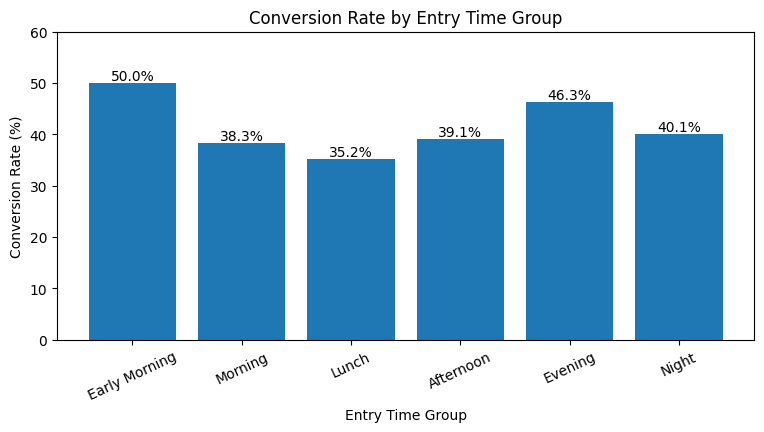

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(9, 4))

bars = plt.bar(
    time_payment["time_group"],
    time_payment["conversion_rate"]
)

plt.title("Conversion Rate by Entry Time Group")
plt.xlabel("Entry Time Group")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, time_payment["conversion_rate"].max() + 10)
plt.xticks(rotation=25)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
# =========================
# Step 2. Weekend Ratio EDA
# =========================

# weekend_ratio가 있는 유저만 사용
weekend_df = master[master["weekend_ratio"].notna()].copy()

print("전체 유저 수:", len(master))
print("주말비중 분석 가능 유저 수:", len(weekend_df))
print("제외된 유저 수:", len(master) - len(weekend_df))

전체 유저 수: 9624
주말비중 분석 가능 유저 수: 6207
제외된 유저 수: 3417


In [ ]:
# 주말 이용 비중 구간 만들기
def weekend_group(x):
    if x == 0:
        return "Weekday Only"
    elif x < 0.5:
        return "Mostly Weekday"
    elif x == 0.5:
        return "Mixed"
    elif x < 1:
        return "Mostly Weekend"
    else:
        return "Weekend Only"

weekend_df["weekend_group"] = weekend_df["weekend_ratio"].apply(weekend_group)

weekend_order = [
    "Weekday Only",
    "Mostly Weekday",
    "Mixed",
    "Mostly Weekend",
    "Weekend Only"
]

In [ ]:
weekend_payment = (
    weekend_df
    .groupby("weekend_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum"),
        avg_weekend_ratio=("weekend_ratio", "mean")
    )
    .reindex(weekend_order)
    .reset_index()
)

weekend_payment["conversion_rate"] = (
    weekend_payment["paid_count"] / weekend_payment["user_count"] * 100
).round(1)

weekend_payment["avg_weekend_ratio"] = weekend_payment["avg_weekend_ratio"].round(2)

weekend_payment

,weekend_group,user_count,paid_count,avg_weekend_ratio,conversion_rate
0,Weekday Only,4314,1648,0.00,38.2
1,Mostly Weekday,251,137,0.33,54.6
2,Mixed,493,231,0.50,46.9
3,Mostly Weekend,287,120,0.67,41.8
4,Weekend Only,862,263,1.00,30.5


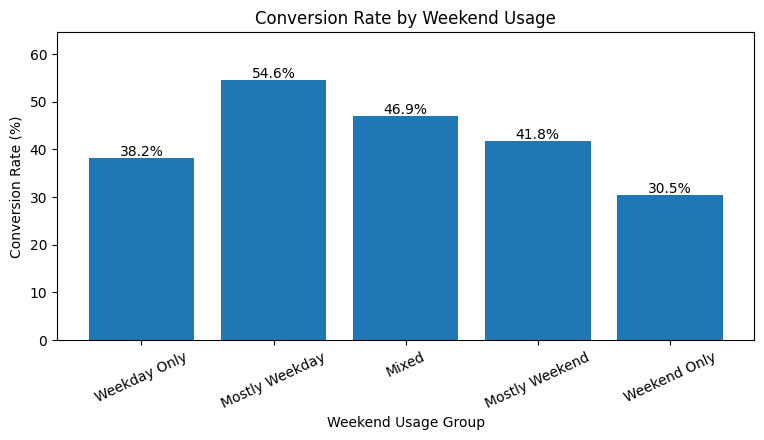

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(9, 4))

bars = plt.bar(
    weekend_payment["weekend_group"],
    weekend_payment["conversion_rate"]
)

plt.title("Conversion Rate by Weekend Usage")
plt.xlabel("Weekend Usage Group")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, weekend_payment["conversion_rate"].max() + 10)
plt.xticks(rotation=25)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
# =========================
# Step 3. Time + Weekend Segment
# =========================

# 시간대와 주말비중이 모두 있는 유저만 사용
segment_df = master[
    master["avg_enter_hour_kst"].notna() &
    master["weekend_ratio"].notna()
].copy()

# 시간대 그룹 다시 생성
def time_group(hour):
    if 5 <= hour < 9:
        return "Early Morning"
    elif 9 <= hour < 12:
        return "Morning"
    elif 12 <= hour < 15:
        return "Lunch"
    elif 15 <= hour < 18:
        return "Afternoon"
    elif 18 <= hour < 22:
        return "Evening"
    else:
        return "Night"

segment_df["time_group"] = segment_df["avg_enter_hour_kst"].apply(time_group)

# 마케팅 세그먼트 생성
def marketing_segment(row):
    if row["time_group"] == "Evening":
        return "Evening User"
    elif row["weekend_ratio"] >= 0.67:
        return "Weekend User"
    elif row["weekend_ratio"] > 0:
        return "Mixed Active"
    else:
        return "Workday Core"

segment_df["marketing_segment"] = segment_df.apply(marketing_segment, axis=1)

# 세그먼트별 전환율 계산
segment_payment = (
    segment_df
    .groupby("marketing_segment")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum"),
        avg_visit_count=("visit_count", "mean"),
        avg_days_active=("days_active", "mean"),
        avg_weekend_ratio=("weekend_ratio", "mean")
    )
    .reset_index()
)

segment_payment["conversion_rate"] = (
    segment_payment["paid_count"] / segment_payment["user_count"] * 100
).round(1)

segment_payment["avg_visit_count"] = segment_payment["avg_visit_count"].round(2)
segment_payment["avg_days_active"] = segment_payment["avg_days_active"].round(2)
segment_payment["avg_weekend_ratio"] = segment_payment["avg_weekend_ratio"].round(2)

segment_payment.sort_values("conversion_rate", ascending=False)

,marketing_segment,user_count,paid_count,avg_visit_count,avg_days_active,avg_weekend_ratio,conversion_rate
1,Mixed Active,854,401,2.57,2.79,0.51,47.0
0,Evening User,939,425,1.79,1.89,0.18,45.3
3,Workday Core,3264,1173,1.70,1.77,0.00,35.9
2,Weekend User,647,180,1.30,1.30,1.00,27.8


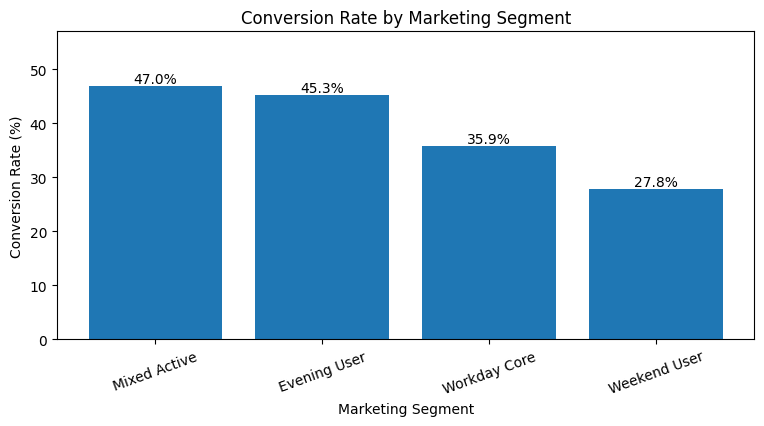

In [ ]:
import matplotlib.pyplot as plt

plot_df = segment_payment.sort_values("conversion_rate", ascending=False)

plt.figure(figsize=(9, 4))

bars = plt.bar(
    plot_df["marketing_segment"],
    plot_df["conversion_rate"]
)

plt.title("Conversion Rate by Marketing Segment")
plt.xlabel("Marketing Segment")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, plot_df["conversion_rate"].max() + 10)
plt.xticks(rotation=20)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
visit_info.head(2)

,site_id,date,stay_time_second,first_enter_time,last_leave_time,user_uuid,stay_time_min,total_min,out_min,visit_date
0,1,2023-12-23,4279,2023-12-23 16:11:25.345793,2023-12-23 17:25:32.233995,939fc566-61cd-47f0-a3ce-e2936fdcff73,71.316667,74.114803,2.798137,2023-12-23
1,1,2023-12-24,16510,2023-12-24 16:10:45.668026,2023-12-24 20:53:34.842447,939fc566-61cd-47f0-a3ce-e2936fdcff73,275.166667,282.819574,7.652907,2023-12-24


In [ ]:
visit_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11429 entries, 0 to 11428
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   site_id           11429 non-null  int64         
 1   date              11429 non-null  datetime64[ns]
 2   stay_time_second  11429 non-null  int64         
 3   first_enter_time  11364 non-null  datetime64[ns]
 4   last_leave_time   11364 non-null  datetime64[ns]
 5   user_uuid         11429 non-null  object        
 6   stay_time_min     11429 non-null  float64       
 7   total_min         10874 non-null  float64       
 8   out_min           10874 non-null  float64       
 9   visit_date        11429 non-null  object        
dtypes: datetime64[ns](3), float64(3), int64(2), object(2)
memory usage: 893.0+ KB


In [ ]:
# =========================
# Step. out_min 생성 후 master에 붙이기
# =========================

# 1. 체류시간 분 단위 생성
visit_info["stay_time_min"] = visit_info["stay_time_second"] / 60

# 2. 총 경과시간 계산
visit_info["total_min"] = (
    visit_info["last_leave_time"] - visit_info["first_enter_time"]
).dt.total_seconds() / 60

# 3. 외출시간 계산
visit_info["out_min"] = visit_info["total_min"] - visit_info["stay_time_min"]

# 4. out_min 음수는 이상치로 제외, 결측은 유지
visit_info = visit_info[
    (visit_info["out_min"].isna()) | (visit_info["out_min"] >= 0)
]

# 5. 유저별 외출시간 요약
out_summary = (
    visit_info
    .groupby("user_uuid")
    .agg(
        total_out_min=("out_min", "sum"),      # 총 외출시간
        avg_out_min=("out_min", "mean"),       # 평균 외출시간
        max_out_min=("out_min", "max")         # 최대 외출시간
    )
    .reset_index()
)

# 6. master에 붙이기
master = master.merge(out_summary, on="user_uuid", how="left")

# 7. 방문하지 않았거나 계산 불가한 경우 0으로 처리
master[["total_out_min", "avg_out_min", "max_out_min"]] = master[
    ["total_out_min", "avg_out_min", "max_out_min"]
].fillna(0)

master[["user_uuid", "total_out_min", "avg_out_min", "max_out_min"]].head()

,user_uuid,total_out_min,avg_out_min,max_out_min
0,f25078d1-1030-485c-85c5-dc82d6987043,0.0,0.0,0.0
1,9f5e2bd3-65c9-4800-84c1-f5c93f44d096,0.0,0.0,0.0
2,844319ff-cd15-4633-9900-6eaf4dc68b68,0.0,0.0,0.0
3,badbde4d-886b-4992-a8e3-fd0c05640183,0.0,0.0,0.0
4,fce967b5-070c-46ed-a5fa-ef7d298cc7aa,0.0,0.0,0.0


In [ ]:
# 결측치 확인
master[["total_out_min", "avg_out_min", "max_out_min"]].isna().sum()

total_out_min    0
avg_out_min      0
max_out_min      0
dtype: int64

In [ ]:
# 기초통계 확인
master[["total_out_min", "avg_out_min", "max_out_min"]].describe()

,total_out_min,avg_out_min,max_out_min
count,9624.000000,9624.000000,9624.000000
mean,83.791522,37.854276,63.864541
std,253.379323,99.110404,182.738207
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,2.031472,1.587865,1.979230
75%,50.547037,29.087405,43.566665
max,2974.493585,1275.879288,1376.700000


In [ ]:
# =========================
# Step. Total Out Time EDA
# =========================

# 1. 총 외출시간 구간 만들기
def out_time_group(x):
    if x == 0:
        return "0"
    elif x < 10:
        return "<10m"
    elif x < 30:
        return "10-30m"
    elif x < 60:
        return "30-60m"
    else:
        return "60m+"

master["out_time_group"] = master["total_out_min"].apply(out_time_group)

# 2. 구간 순서
out_order = ["0", "<10m", "10-30m", "30-60m", "60m+"]

# 3. 외출시간 구간별 전환율 계산
out_payment = (
    master
    .groupby("out_time_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum"),
        avg_out_min=("total_out_min", "mean")
    )
    .reindex(out_order)
    .reset_index()
)

out_payment["conversion_rate"] = (
    out_payment["paid_count"] / out_payment["user_count"] * 100
).round(1)

out_payment["avg_out_min"] = out_payment["avg_out_min"].round(1)

out_payment

,out_time_group,user_count,paid_count,avg_out_min,conversion_rate
0,0,3160,1120,0.0,35.4
1,<10m,2820,1151,2.3,40.8
2,10-30m,801,317,17.8,39.6
3,30-60m,628,234,44.8,37.3
4,60m+,2215,830,342.0,37.5


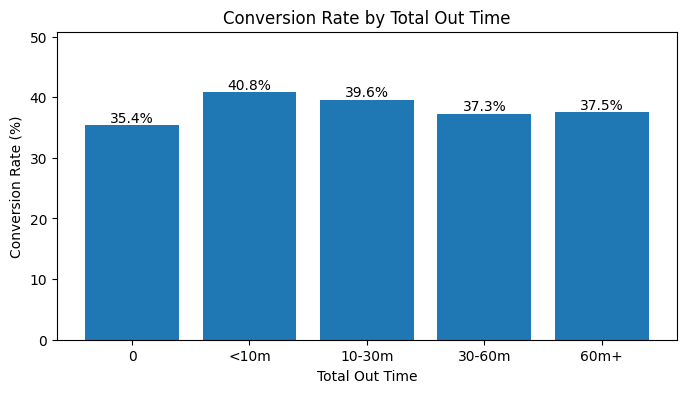

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))

bars = plt.bar(
    out_payment["out_time_group"],
    out_payment["conversion_rate"]
)

plt.title("Conversion Rate by Total Out Time")
plt.xlabel("Total Out Time")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, out_payment["conversion_rate"].max() + 10)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
# 방문자만 대상으로 외출시간별 전환율 다시 보기
out_visited_df = master[master["visited"] == 1].copy()

out_visited_payment = (
    out_visited_df
    .groupby("out_time_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum"),
        avg_out_min=("total_out_min", "mean")
    )
    .reindex(out_order)
    .reset_index()
)

out_visited_payment["conversion_rate"] = (
    out_visited_payment["paid_count"] / out_visited_payment["user_count"] * 100
).round(1)

out_visited_payment["avg_out_min"] = out_visited_payment["avg_out_min"].round(1)

out_visited_payment

,out_time_group,user_count,paid_count,avg_out_min,conversion_rate
0,0,70,32,0.0,45.7
1,<10m,2820,1151,2.3,40.8
2,10-30m,801,317,17.8,39.6
3,30-60m,628,234,44.8,37.3
4,60m+,2215,830,342.0,37.5


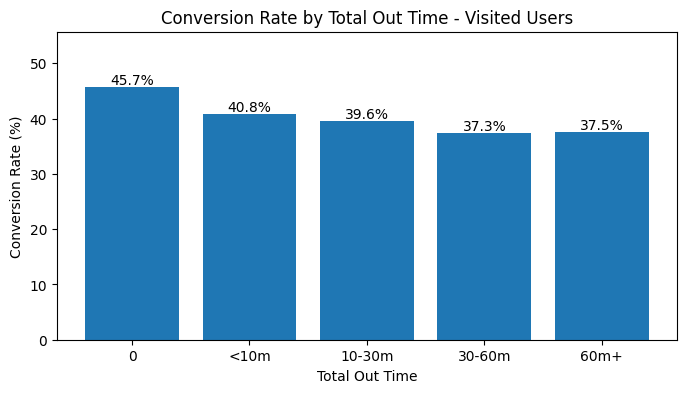

In [ ]:
import matplotlib.pyplot as plt

plot_df = out_visited_payment.dropna(subset=["user_count"]).copy()

plt.figure(figsize=(8, 4))

bars = plt.bar(
    plot_df["out_time_group"],
    plot_df["conversion_rate"]
)

plt.title("Conversion Rate by Total Out Time - Visited Users")
plt.xlabel("Total Out Time")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, plot_df["conversion_rate"].max() + 10)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
# =========================
# Exit Time EDA - KST 기준
# =========================

# 1. last_access_time datetime 변환
master["last_access_time"] = pd.to_datetime(
    master["last_access_time"],
    format="mixed"
)

# 2. 퇴실 시간이 있는 유저만 사용
exit_df = master[master["last_access_time"].notna()].copy()

# 3. access_log 기반 시간이므로 UTC → KST 변환
exit_df["last_access_time_kst"] = exit_df["last_access_time"] + pd.Timedelta(hours=9)

# 4. KST 기준 퇴실 시간 추출
exit_df["exit_hour_kst"] = exit_df["last_access_time_kst"].dt.hour

# 5. 퇴실 시간대 그룹 만들기
def exit_time_group(hour):
    if 5 <= hour < 12:
        return "Morning"
    elif 12 <= hour < 15:
        return "Lunch"
    elif 15 <= hour < 18:
        return "Afternoon"
    elif 18 <= hour < 22:
        return "Evening"
    else:
        return "Night"

exit_df["exit_time_group"] = exit_df["exit_hour_kst"].apply(exit_time_group)

exit_order = ["Morning", "Lunch", "Afternoon", "Evening", "Night"]

# 6. 퇴실 시간대별 전환율 계산
exit_payment_kst = (
    exit_df
    .groupby("exit_time_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum"),
        avg_exit_hour=("exit_hour_kst", "mean")
    )
    .reindex(exit_order)
    .reset_index()
)

exit_payment_kst["conversion_rate"] = (
    exit_payment_kst["paid_count"] / exit_payment_kst["user_count"] * 100
).round(1)

exit_payment_kst["avg_exit_hour"] = exit_payment_kst["avg_exit_hour"].round(1)

exit_payment_kst

,exit_time_group,user_count,paid_count,avg_exit_hour,conversion_rate
0,Morning,241,91,9.8,37.8
1,Lunch,464,191,13.0,41.2
2,Afternoon,1569,574,16.3,36.6
3,Evening,2499,991,19.3,39.7
4,Night,1253,490,19.6,39.1


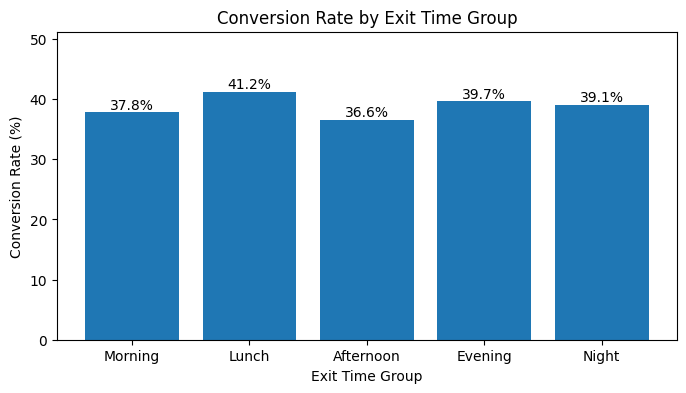

In [ ]:
import matplotlib.pyplot as plt

plot_df = exit_payment_kst.dropna(subset=["user_count"]).copy()

plt.figure(figsize=(8, 4))

bars = plt.bar(
    plot_df["exit_time_group"],
    plot_df["conversion_rate"]
)

plt.title("Conversion Rate by Exit Time Group")
plt.xlabel("Exit Time Group")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, plot_df["conversion_rate"].max() + 10)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
# =========================
# Entry Time EDA - KST 기준
# =========================

# 1. first_access_time datetime 변환
master["first_access_time"] = pd.to_datetime(
    master["first_access_time"],
    format="mixed"
)

# 2. first_access_time이 있는 유저만 사용
entry_df = master[master["first_access_time"].notna()].copy()

# 3. access_log 기반 시간이므로 UTC → KST 변환
entry_df["first_access_time_kst"] = entry_df["first_access_time"] + pd.Timedelta(hours=9)

# 4. KST 기준 입실 시간 추출
entry_df["entry_hour_kst"] = entry_df["first_access_time_kst"].dt.hour

# 5. 입실 시간대 그룹 만들기
def entry_time_group(hour):
    if 5 <= hour < 9:
        return "Early Morning"
    elif 9 <= hour < 12:
        return "Morning"
    elif 12 <= hour < 15:
        return "Lunch"
    elif 15 <= hour < 18:
        return "Afternoon"
    elif 18 <= hour < 22:
        return "Evening"
    else:
        return "Night"

entry_df["entry_time_group"] = entry_df["entry_hour_kst"].apply(entry_time_group)

entry_order = [
    "Early Morning",
    "Morning",
    "Lunch",
    "Afternoon",
    "Evening",
    "Night"
]

# 6. 입실 시간대별 전환율 계산
entry_payment_kst = (
    entry_df
    .groupby("entry_time_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum"),
        avg_entry_hour=("entry_hour_kst", "mean")
    )
    .reindex(entry_order)
    .reset_index()
)

entry_payment_kst["conversion_rate"] = (
    entry_payment_kst["paid_count"] / entry_payment_kst["user_count"] * 100
).round(1)

entry_payment_kst["avg_entry_hour"] = entry_payment_kst["avg_entry_hour"].round(1)

entry_payment_kst

,entry_time_group,user_count,paid_count,avg_entry_hour,conversion_rate
0,Early Morning,309,99,7.6,32.0
1,Morning,1381,516,10.0,37.4
2,Lunch,2042,722,13.1,35.4
3,Afternoon,1210,469,15.8,38.8
4,Evening,898,450,19.1,50.1
5,Night,186,81,12.5,43.5


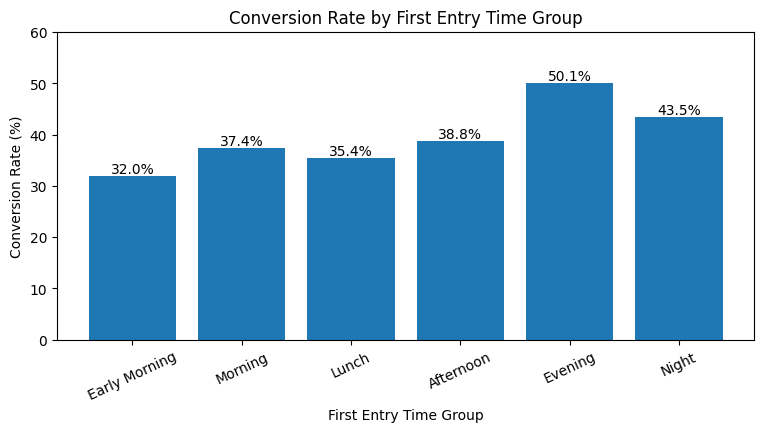

In [ ]:
import matplotlib.pyplot as plt

plot_df = entry_payment_kst.dropna(subset=["user_count"]).copy()

plt.figure(figsize=(9, 4))

bars = plt.bar(
    plot_df["entry_time_group"],
    plot_df["conversion_rate"]
)

plt.title("Conversion Rate by First Entry Time Group")
plt.xlabel("First Entry Time Group")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, plot_df["conversion_rate"].max() + 10)
plt.xticks(rotation=25)

for bar in bars:
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.5,
        f"{y:.1f}%",
        ha="center"
    )

plt.show()

In [ ]:
# =========================
# Multi-site User EDA
# =========================

# 1. 방문자만 대상으로 분석
# 미방문자는 지점 이용 수가 없으므로 제외
site_df = master[master["visited"] == 1].copy()

# 2. 멀티 지점 이용 여부 만들기
site_df["site_usage_group"] = site_df["sites_used"].apply(
    lambda x: "Multi-site" if x >= 2 else "Single-site"
)

# 3. 그룹별 결제 전환율 계산
multi_site_payment = (
    site_df
    .groupby("site_usage_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum"),
        avg_sites_used=("sites_used", "mean"),
        avg_visit_count=("visit_count", "mean"),
        avg_days_active=("days_active", "mean")
    )
    .reset_index()
)

multi_site_payment["conversion_rate"] = (
    multi_site_payment["paid_count"] / multi_site_payment["user_count"] * 100
).round(1)

multi_site_payment["avg_sites_used"] = multi_site_payment["avg_sites_used"].round(2)
multi_site_payment["avg_visit_count"] = multi_site_payment["avg_visit_count"].round(2)
multi_site_payment["avg_days_active"] = multi_site_payment["avg_days_active"].round(2)

multi_site_payment

,site_usage_group,user_count,paid_count,avg_sites_used,avg_visit_count,avg_days_active,conversion_rate
0,Multi-site,298,146,2.15,2.41,2.58,49.0
1,Single-site,6236,2418,1.00,1.70,1.78,38.8


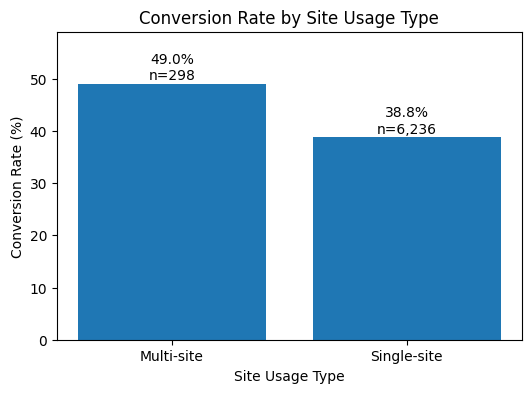

In [ ]:
import matplotlib.pyplot as plt

plot_df = multi_site_payment.sort_values("conversion_rate", ascending=False)

plt.figure(figsize=(6, 4))

bars = plt.bar(
    plot_df["site_usage_group"],
    plot_df["conversion_rate"]
)

plt.title("Conversion Rate by Site Usage Type")
plt.xlabel("Site Usage Type")
plt.ylabel("Conversion Rate (%)")
plt.ylim(0, plot_df["conversion_rate"].max() + 10)

for bar, user_count in zip(bars, plot_df["user_count"]):
    y = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        y + 0.8,
        f"{y:.1f}%\nn={user_count:,}",
        ha="center"
    )

plt.show()

In [ ]:
# 2일 이상 방문자만 대상으로 Multi-site 효과 확인
site_2days_df = master[
    (master["visited"] == 1) &
    (master["days_active"] >= 2)
].copy()

site_2days_df["site_usage_group"] = site_2days_df["sites_used"].apply(
    lambda x: "Multi-site" if x >= 2 else "Single-site"
)

multi_site_2days_payment = (
    site_2days_df
    .groupby("site_usage_group")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum"),
        avg_sites_used=("sites_used", "mean"),
        avg_visit_count=("visit_count", "mean"),
        avg_days_active=("days_active", "mean")
    )
    .reset_index()
)

multi_site_2days_payment["conversion_rate"] = (
    multi_site_2days_payment["paid_count"] / multi_site_2days_payment["user_count"] * 100
).round(1)

multi_site_2days_payment

,site_usage_group,user_count,paid_count,avg_sites_used,avg_visit_count,avg_days_active,conversion_rate
0,Multi-site,279,137,2.157706,2.501792,2.684588,49.1
1,Single-site,3035,1351,1.000000,2.437232,2.601647,44.5


In [ ]:
# =========================
# Site Performance EDA
# 방문자 수는 많은데 결제율 낮은 지점 찾기
# =========================

# 1. 방문자만 사용
site_df = master[master["visited"] == 1].copy()

# 2. 지점 컬럼 확인
site_df[["main_site", "is_payment"]].head()

,main_site,is_payment
4,1.0,1
5,3.0,0
6,3.0,1
7,3.0,1
18,3.0,0


In [ ]:
# 3. 지점별 결제 전환율 계산
site_payment = (
    site_df
    .groupby("main_site")
    .agg(
        user_count=("user_uuid", "count"),
        paid_count=("is_payment", "sum"),
        avg_visit_count=("visit_count", "mean"),
        avg_days_active=("days_active", "mean"),
        avg_total_stay_sec=("total_stay_sec", "mean")
    )
    .reset_index()
)

# 4. 전환율 계산
site_payment["conversion_rate"] = (
    site_payment["paid_count"] / site_payment["user_count"] * 100
).round(1)

# 5. 평균값 정리
site_payment["avg_visit_count"] = site_payment["avg_visit_count"].round(2)
site_payment["avg_days_active"] = site_payment["avg_days_active"].round(2)
site_payment["avg_total_stay_hour"] = (
    site_payment["avg_total_stay_sec"] / 3600
).round(2)

# 6. 초 단위 컬럼 제거
site_payment = site_payment.drop(columns=["avg_total_stay_sec"])

# 7. 방문자 수 많은 순으로 보기
site_payment.sort_values("user_count", ascending=False)

,main_site,user_count,paid_count,avg_visit_count,avg_days_active,conversion_rate,avg_total_stay_hour
2,3.0,1330,566,1.74,1.83,42.6,8.47
5,6.0,1251,449,1.73,1.80,35.9,8.31
1,2.0,1096,398,1.80,1.88,36.3,9.54
0,1.0,866,359,1.67,1.77,41.5,7.15
4,5.0,598,269,1.74,1.82,45.0,7.92
3,4.0,497,201,1.70,1.78,40.4,7.57
6,17.0,436,155,1.72,1.81,35.6,6.89
7,47.0,325,110,1.62,1.70,33.8,6.58
8,49.0,135,57,1.86,1.94,42.2,7.64


In [ ]:
# =========================
# High Traffic / Low Conversion Site
# =========================

# 전체 지점 평균 방문자 수, 평균 전환율
avg_users = site_payment["user_count"].mean()
avg_conversion = site_payment["conversion_rate"].mean()

print("Average users per site:", round(avg_users, 1))
print("Average conversion rate:", round(avg_conversion, 1))

# 방문자 수는 평균 이상, 전환율은 평균 이하인 지점
high_traffic_low_conversion = site_payment[
    (site_payment["user_count"] >= avg_users) &
    (site_payment["conversion_rate"] <= avg_conversion)
].sort_values("user_count", ascending=False)

high_traffic_low_conversion

Average users per site: 726.0
Average conversion rate: 39.3


,main_site,user_count,paid_count,avg_visit_count,avg_days_active,conversion_rate,avg_total_stay_hour
5,6.0,1251,449,1.73,1.80,35.9,8.31
1,2.0,1096,398,1.80,1.88,36.3,9.54


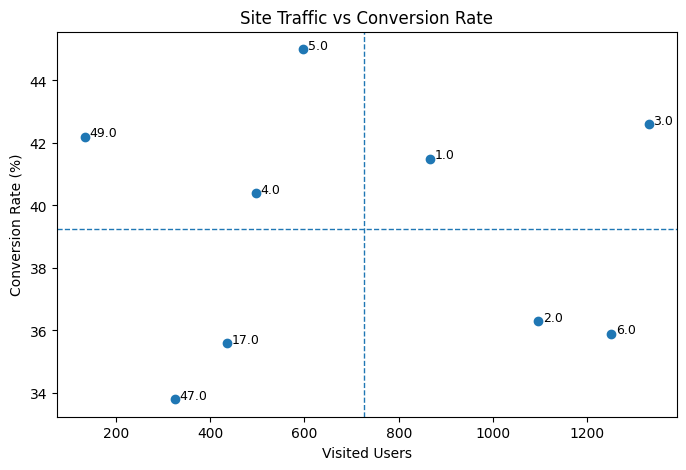

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))

plt.scatter(
    site_payment["user_count"],
    site_payment["conversion_rate"]
)

# 평균선 추가
plt.axvline(avg_users, linestyle="--", linewidth=1)
plt.axhline(avg_conversion, linestyle="--", linewidth=1)

# 지점 번호 표시
for _, row in site_payment.iterrows():
    plt.text(
        row["user_count"] + 10,
        row["conversion_rate"],
        str(row["main_site"]),
        fontsize=9
    )

plt.title("Site Traffic vs Conversion Rate")
plt.xlabel("Visited Users")
plt.ylabel("Conversion Rate (%)")

plt.show()

In [ ]:
# =========================
# Trial Day Visit Pattern EDA
# 무료체험 n일차별 방문 여부 만들기
# =========================

import pandas as pd

# 1. 날짜 변환
master["trial_date"] = pd.to_datetime(master["trial_date"], format="mixed")
visit_info["date"] = pd.to_datetime(visit_info["date"], format="mixed")

# 2. 필요한 컬럼만 가져오기
user_base = master[["user_uuid", "trial_date", "is_payment"]].copy()

visit_base = visit_info[["user_uuid", "date"]].copy()

# 3. 방문일은 날짜 단위로 정리
user_base["trial_date_only"] = user_base["trial_date"].dt.date
visit_base["visit_date_only"] = visit_base["date"].dt.date

# 4. 유저별 신청일 붙이기
visit_day = visit_base.merge(
    user_base[["user_uuid", "trial_date_only", "is_payment"]],
    on="user_uuid",
    how="left"
)

# 5. 체험 시작일 기준 며칠 차 방문인지 계산
visit_day["trial_day"] = (
    pd.to_datetime(visit_day["visit_date_only"]) -
    pd.to_datetime(visit_day["trial_date_only"])
).dt.days

# 6. 무료체험 기간으로 볼 0~3일차만 사용
# first_visit_gap 최댓값이 3일이라고 했으니 0~3일차까지 확인
visit_day = visit_day[
    (visit_day["trial_day"] >= 0) &
    (visit_day["trial_day"] <= 3)
].copy()

# 7. 같은 유저가 같은 일차에 여러 번 방문해도 1회 방문으로 처리
daily_visit = (
    visit_day
    .drop_duplicates(["user_uuid", "trial_day"])
    .assign(visited=1)
)

daily_visit.head()

,user_uuid,date,visit_date_only,trial_date_only,is_payment,trial_day,visited
0,939fc566-61cd-47f0-a3ce-e2936fdcff73,2023-12-23,2023-12-23,2023-12-23,1,0,1
1,939fc566-61cd-47f0-a3ce-e2936fdcff73,2023-12-24,2023-12-24,2023-12-23,1,1,1
2,939fc566-61cd-47f0-a3ce-e2936fdcff73,2023-12-25,2023-12-25,2023-12-23,1,2,1
3,ba49324f-d317-4053-adf9-2b17b3f07594,2023-12-23,2023-12-23,2023-12-23,1,0,1
4,ba49324f-d317-4053-adf9-2b17b3f07594,2023-12-26,2023-12-26,2023-12-23,1,3,1


In [ ]:
# =========================
# 결제자 vs 미결제자 체험일차별 방문률
# =========================

# 1. 유저 x 체험일차 방문 여부 테이블 만들기
visit_pivot = (
    daily_visit
    .pivot_table(
        index="user_uuid",
        columns="trial_day",
        values="visited",
        fill_value=0
    )
    .reset_index()
)

# 2. 컬럼명 정리
visit_pivot.columns = [
    "user_uuid" if col == "user_uuid" else f"day_{int(col)}_visit"
    for col in visit_pivot.columns
]

# 3. master에 붙이기
trial_day_df = user_base[["user_uuid", "is_payment"]].merge(
    visit_pivot,
    on="user_uuid",
    how="left"
)

# 4. 방문 기록 없는 유저는 0으로 처리
day_cols = ["day_0_visit", "day_1_visit", "day_2_visit", "day_3_visit"]

for col in day_cols:
    if col not in trial_day_df.columns:
        trial_day_df[col] = 0

trial_day_df[day_cols] = trial_day_df[day_cols].fillna(0).astype(int)

# 5. 결제자/미결제자별 n일차 방문률 계산
visit_rate_by_payment = (
    trial_day_df
    .groupby("is_payment")[day_cols]
    .mean()
    .reset_index()
)

# 6. %로 변환
for col in day_cols:
    visit_rate_by_payment[col] = (visit_rate_by_payment[col] * 100).round(1)

visit_rate_by_payment["group"] = visit_rate_by_payment["is_payment"].map({
    0: "Not Paid",
    1: "Paid"
})

visit_rate_by_payment

,is_payment,day_0_visit,day_1_visit,day_2_visit,day_3_visit,group
0,0,17.2,40.8,31.2,19.0,Not Paid
1,1,16.2,44.4,38.4,31.1,Paid


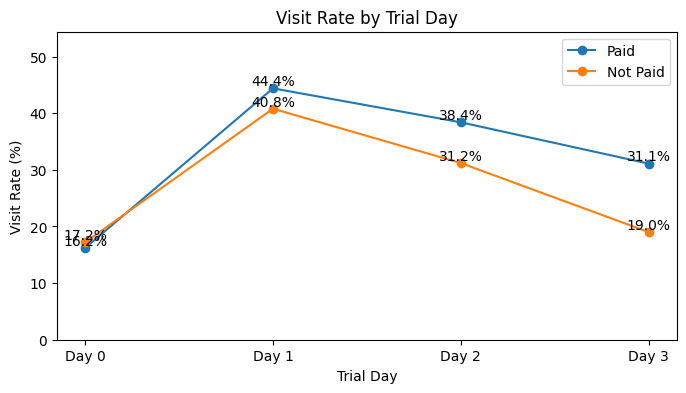

In [ ]:
import matplotlib.pyplot as plt

plot_df = visit_rate_by_payment.set_index("group")[day_cols].T
plot_df.index = ["Day 0", "Day 1", "Day 2", "Day 3"]

plt.figure(figsize=(8, 4))

plt.plot(plot_df.index, plot_df["Paid"], marker="o", label="Paid")
plt.plot(plot_df.index, plot_df["Not Paid"], marker="o", label="Not Paid")

plt.title("Visit Rate by Trial Day")
plt.xlabel("Trial Day")
plt.ylabel("Visit Rate (%)")
plt.ylim(0, max(plot_df.max()) + 10)
plt.legend()

for group in ["Paid", "Not Paid"]:
    for x, y in zip(plot_df.index, plot_df[group]):
        plt.text(x, y + 0.5, f"{y:.1f}%", ha="center")

plt.show()

In [ ]:
master.columns

Index(['user_uuid', 'trial_date', 'trial_month', 'trial_dow', 'visited',
       'visit_count', 'sites_used', 'days_active', 'visit_density',
       'first_visit', 'last_visit', 'first_visit_gap', 'total_stay_sec',
       'avg_stay_sec', 'max_stay_sec', 'stay_hour_group', 'avg_enter_hour',
       'avg_enter_hour_kst', 'weekend_ratio', 'total_access', 'checkin_count',
       'checkout_count', 'first_access_time', 'last_access_time', 'main_site',
       'main_site_pyeong', 'main_site_stay_sec', 'main_site_visit_days',
       'is_payment', 'total_out_min', 'avg_out_min', 'max_out_min',
       'out_time_group'],
      dtype='object')

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# trial_date를 datetime으로 변환
master["trial_date"] = pd.to_datetime(master["trial_date"])

# year_quarter가 이미 있더라도, 혹시 형식이 이상할 수 있으니 다시 생성
master["year_quarter"] = master["trial_date"].dt.to_period("Q").astype(str)

# 연·분기별 요약
quarter_summary = master.groupby("year_quarter").agg(
    applicants=("user_uuid", "count"),      # 신청자 수
    visitors=("visited", "sum"),            # 방문자 수
    paid_users=("is_payment", "sum"),       # 결제자 수
    payment_rate=("is_payment", "mean")     # 결제 전환율
).reset_index()

# 전환율을 % 단위로 변환
quarter_summary["payment_rate"] = quarter_summary["payment_rate"] * 100

quarter_summary

,year_quarter,applicants,visitors,paid_users,payment_rate
0,2021Q2,603,352,312,51.741294
1,2021Q3,1193,778,483,40.486169
2,2021Q4,1010,620,394,39.009901
3,2022Q1,988,684,382,38.663968
4,2022Q2,740,513,286,38.648649
5,2022Q3,886,570,310,34.988713
6,2022Q4,869,598,371,42.692750
7,2023Q1,844,576,307,36.374408
8,2023Q2,772,522,307,39.766839
9,2023Q3,906,654,290,32.008830


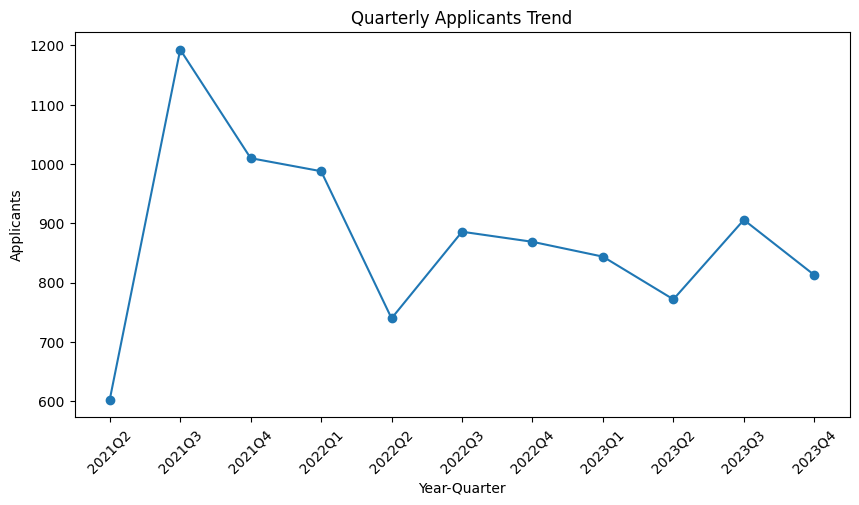

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(
    quarter_summary["year_quarter"],
    quarter_summary["applicants"],
    marker="o"
)

ax.set_title("Quarterly Applicants Trend")
ax.set_xlabel("Year-Quarter")
ax.set_ylabel("Applicants")

plt.xticks(rotation=45)
plt.show()

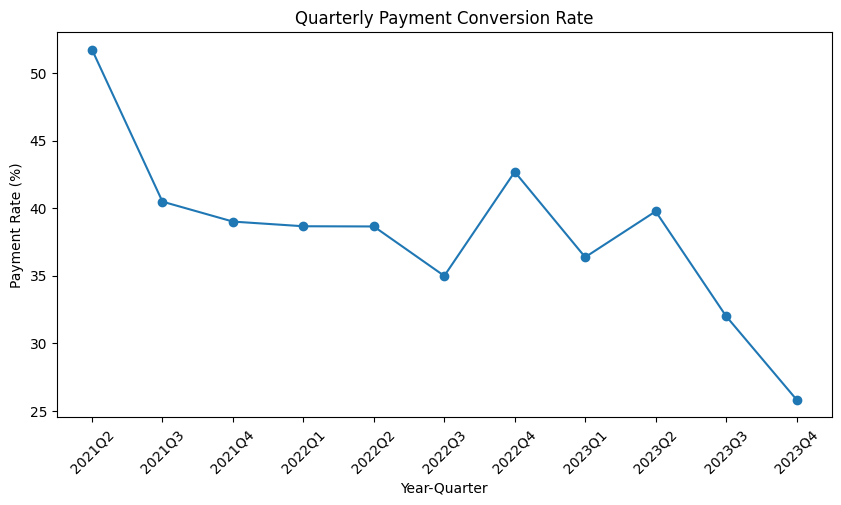

In [ ]:
fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(
    quarter_summary["year_quarter"],
    quarter_summary["payment_rate"],
    marker="o"
)

ax.set_title("Quarterly Payment Conversion Rate")
ax.set_xlabel("Year-Quarter")
ax.set_ylabel("Payment Rate (%)")

plt.xticks(rotation=45)
plt.show()

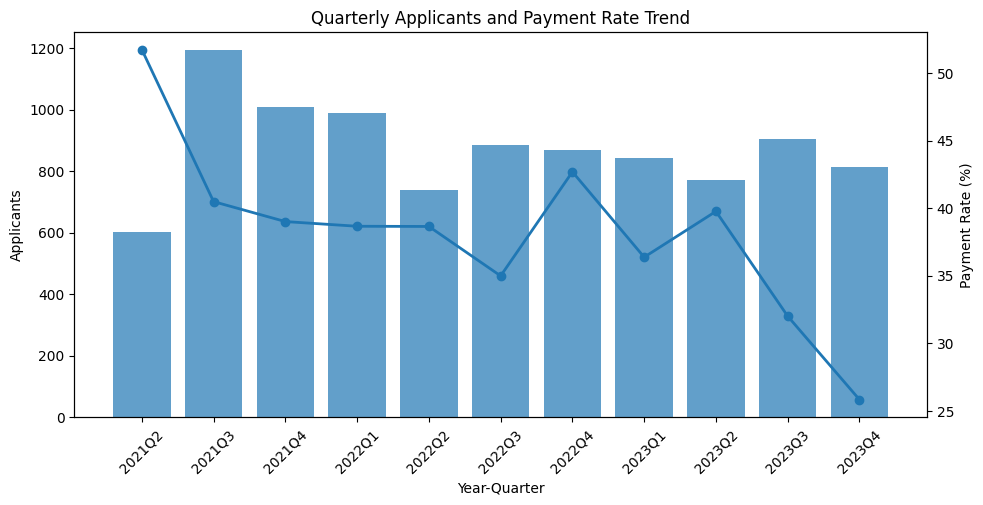

In [ ]:
fig, ax1 = plt.subplots(figsize=(11, 5))

# 신청자 수 막대
ax1.bar(
    quarter_summary["year_quarter"],
    quarter_summary["applicants"],
    alpha=0.7
)

ax1.set_xlabel("Year-Quarter")
ax1.set_ylabel("Applicants")
ax1.tick_params(axis="x", rotation=45)

# 전환율 선
ax2 = ax1.twinx()

ax2.plot(
    quarter_summary["year_quarter"],
    quarter_summary["payment_rate"],
    marker="o",
    linewidth=2
)

ax2.set_ylabel("Payment Rate (%)")

plt.title("Quarterly Applicants and Payment Rate Trend")
plt.show()

In [ ]:
quarter_summary[[
    "year_quarter",
    "applicants",
    "visitors",
    "paid_users",
    "payment_rate"
]]

,year_quarter,applicants,visitors,paid_users,payment_rate
0,2021Q2,603,352,312,51.741294
1,2021Q3,1193,778,483,40.486169
2,2021Q4,1010,620,394,39.009901
3,2022Q1,988,684,382,38.663968
4,2022Q2,740,513,286,38.648649
5,2022Q3,886,570,310,34.988713
6,2022Q4,869,598,371,42.692750
7,2023Q1,844,576,307,36.374408
8,2023Q2,772,522,307,39.766839
9,2023Q3,906,654,290,32.008830


In [ ]:
df = master.copy()

evening_start = 18
evening_end = 22

df["is_evening_user"] = df["avg_enter_hour_kst"].between(
    evening_start,
    evening_end,
    inclusive="left"
)

visited_df = df[df["visited"] == 1].copy()

# 전체 지점별 전환율
site_total = (
    visited_df
    .groupby("main_site")
    .agg(
        total_users=("user_uuid", "nunique"),
        total_paid=("is_payment", "sum"),
        total_payment_rate=("is_payment", "mean")
    )
    .reset_index()
)

# 저녁 유저만
site_evening = (
    visited_df[visited_df["is_evening_user"] == True]
    .groupby("main_site")
    .agg(
        evening_users=("user_uuid", "nunique"),
        evening_paid=("is_payment", "sum"),
        evening_payment_rate=("is_payment", "mean")
    )
    .reset_index()
)

# 비저녁 유저만
site_non_evening = (
    visited_df[visited_df["is_evening_user"] == False]
    .groupby("main_site")
    .agg(
        non_evening_users=("user_uuid", "nunique"),
        non_evening_paid=("is_payment", "sum"),
        non_evening_payment_rate=("is_payment", "mean")
    )
    .reset_index()
)

# 병합
site_evening_summary = (
    site_total
    .merge(site_evening, on="main_site", how="left")
    .merge(site_non_evening, on="main_site", how="left")
)

# 결측값 처리
count_cols = ["evening_users", "evening_paid", "non_evening_users", "non_evening_paid"]
site_evening_summary[count_cols] = site_evening_summary[count_cols].fillna(0)

# 비율 %
rate_cols = ["total_payment_rate", "evening_payment_rate", "non_evening_payment_rate"]
site_evening_summary[rate_cols] = site_evening_summary[rate_cols] * 100

# 저녁 유저 비중
site_evening_summary["evening_user_ratio"] = (
    site_evening_summary["evening_users"] 
    / site_evening_summary["total_users"] * 100
)

# 저녁 vs 비저녁 전환율 차이
site_evening_summary["evening_gap_p"] = (
    site_evening_summary["evening_payment_rate"] 
    - site_evening_summary["non_evening_payment_rate"]
)

# 보기 좋게 반올림
round_cols = [
    "total_payment_rate", 
    "evening_payment_rate", 
    "non_evening_payment_rate",
    "evening_user_ratio",
    "evening_gap_p"
]

site_evening_summary[round_cols] = site_evening_summary[round_cols].round(1)

# 저녁 유저 수 기준 정렬
site_evening_summary = site_evening_summary.sort_values(
    by="evening_users", 
    ascending=False
)

site_evening_summary

,main_site,total_users,total_paid,total_payment_rate,evening_users,evening_paid,evening_payment_rate,non_evening_users,non_evening_paid,non_evening_payment_rate,evening_user_ratio,evening_gap_p
2,3.0,1330,566,42.6,211,92,43.6,1119,474,42.4,15.9,1.2
5,6.0,1251,449,35.9,211,88,41.7,1040,361,34.7,16.9,7.0
1,2.0,1096,398,36.3,166,81,48.8,930,317,34.1,15.1,14.7
0,1.0,866,359,41.5,117,58,49.6,749,301,40.2,13.5,9.4
6,17.0,436,155,35.6,75,37,49.3,361,118,32.7,17.2,16.6
4,5.0,598,269,45.0,69,39,56.5,529,230,43.5,11.5,13.0
3,4.0,497,201,40.4,61,24,39.3,436,177,40.6,12.3,-1.3
7,47.0,325,110,33.8,60,24,40.0,265,86,32.5,18.5,7.5
8,49.0,135,57,42.2,28,19,67.9,107,38,35.5,20.7,32.3


In [ ]:
# 저녁 유저가 20명 이상인 지점만 확인
site_evening_summary_filtered = site_evening_summary[
    site_evening_summary["evening_users"] >= 20
].copy()

site_evening_summary_filtered.sort_values(
    by="evening_payment_rate", 
    ascending=False
)

,main_site,total_users,total_paid,total_payment_rate,evening_users,evening_paid,evening_payment_rate,non_evening_users,non_evening_paid,non_evening_payment_rate,evening_user_ratio,evening_gap_p
8,49.0,135,57,42.2,28,19,67.9,107,38,35.5,20.7,32.3
4,5.0,598,269,45.0,69,39,56.5,529,230,43.5,11.5,13.0
0,1.0,866,359,41.5,117,58,49.6,749,301,40.2,13.5,9.4
6,17.0,436,155,35.6,75,37,49.3,361,118,32.7,17.2,16.6
1,2.0,1096,398,36.3,166,81,48.8,930,317,34.1,15.1,14.7
2,3.0,1330,566,42.6,211,92,43.6,1119,474,42.4,15.9,1.2
5,6.0,1251,449,35.9,211,88,41.7,1040,361,34.7,16.9,7.0
7,47.0,325,110,33.8,60,24,40.0,265,86,32.5,18.5,7.5
3,4.0,497,201,40.4,61,24,39.3,436,177,40.6,12.3,-1.3


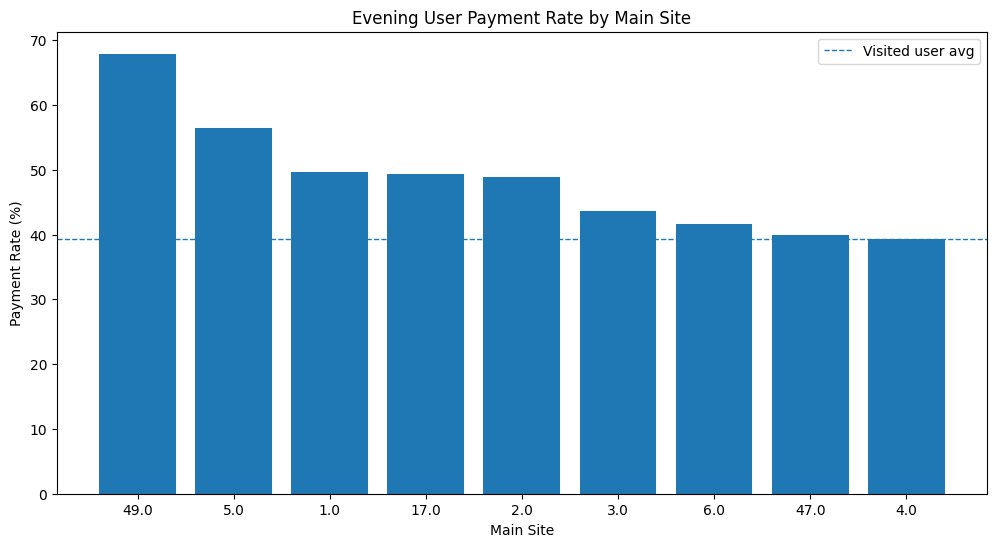

In [ ]:
import matplotlib.pyplot as plt

plot_df = site_evening_summary_filtered.sort_values(
    by="evening_payment_rate", 
    ascending=False
)

plt.figure(figsize=(12, 6))

plt.bar(
    plot_df["main_site"].astype(str),
    plot_df["evening_payment_rate"]
)

plt.axhline(
    visited_df["is_payment"].mean() * 100,
    linestyle="--",
    linewidth=1,
    label="Visited user avg"
)

plt.title("Evening User Payment Rate by Main Site")
plt.xlabel("Main Site")
plt.ylabel("Payment Rate (%)")
plt.legend()
plt.show()

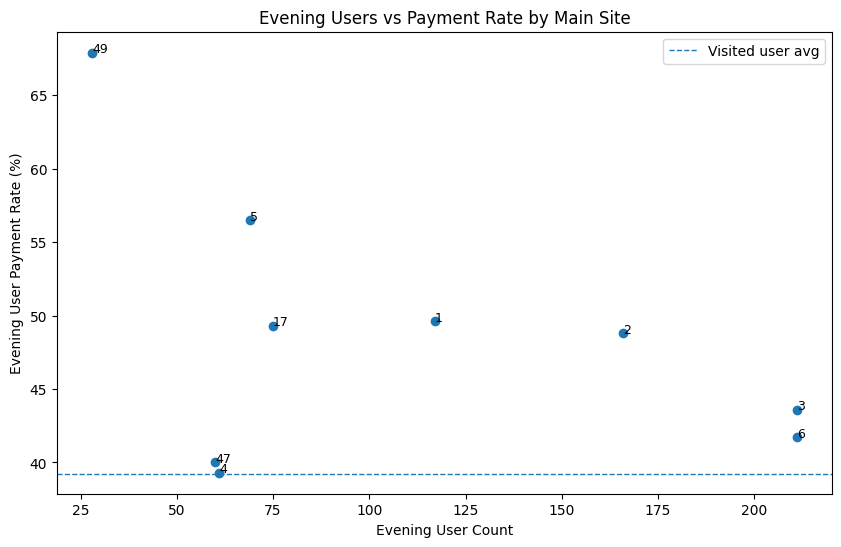

In [ ]:
plt.figure(figsize=(10, 6))

plt.scatter(
    site_evening_summary_filtered["evening_users"],
    site_evening_summary_filtered["evening_payment_rate"]
)

for _, row in site_evening_summary_filtered.iterrows():
    plt.text(
        row["evening_users"],
        row["evening_payment_rate"],
        str(int(row["main_site"])),
        fontsize=9
    )

plt.axhline(
    visited_df["is_payment"].mean() * 100,
    linestyle="--",
    linewidth=1,
    label="Visited user avg"
)

plt.title("Evening Users vs Payment Rate by Main Site")
plt.xlabel("Evening User Count")
plt.ylabel("Evening User Payment Rate (%)")
plt.legend()
plt.show()

In [ ]:
site_area

,site_id,area_pyeong
0,1,50
1,2,100
2,3,150
3,4,100
4,5,150
5,6,150
6,17,50
7,47,50
8,49,50


In [ ]:
site_summary = (
    master[master["visited"] == 1]
    .groupby("main_site")
    .agg(
        user_count=("user_uuid", "nunique"),
        paid_count=("is_payment", "sum"),
        payment_rate=("is_payment", "mean"),
        avg_visit_count=("visit_count", "mean"),
        avg_days_active=("days_active", "mean"),
        avg_total_stay_hr=("total_stay_sec", lambda x: x.mean() / 3600),
        avg_enter_hour_kst=("avg_enter_hour_kst", "mean"),
        avg_site_pyeong=("main_site_pyeong", "mean")
    )
    .reset_index()
)

site_summary["payment_rate"] = site_summary["payment_rate"] * 100

site_summary = site_summary.sort_values("payment_rate", ascending=False)

site_summary

,main_site,user_count,paid_count,payment_rate,avg_visit_count,avg_days_active,avg_total_stay_hr,avg_enter_hour_kst,avg_site_pyeong
4,5.0,598,269,44.983278,1.739130,1.824415,7.922678,14.445101,150.0
2,3.0,1330,566,42.556391,1.742105,1.833083,8.473773,14.785474,150.0
8,49.0,135,57,42.222222,1.859259,1.940741,7.641004,14.550893,50.0
0,1.0,866,359,41.454965,1.666282,1.765589,7.145824,14.371269,50.0
3,4.0,497,201,40.442656,1.702213,1.784708,7.573940,14.326172,100.0
1,2.0,1096,398,36.313869,1.801095,1.882299,9.543721,14.688613,100.0
5,6.0,1251,449,35.891287,1.733014,1.800160,8.313946,14.791446,150.0
6,17.0,436,155,35.550459,1.717890,1.814220,6.894773,14.903879,50.0
7,47.0,325,110,33.846154,1.621538,1.698462,6.581631,14.685441,50.0


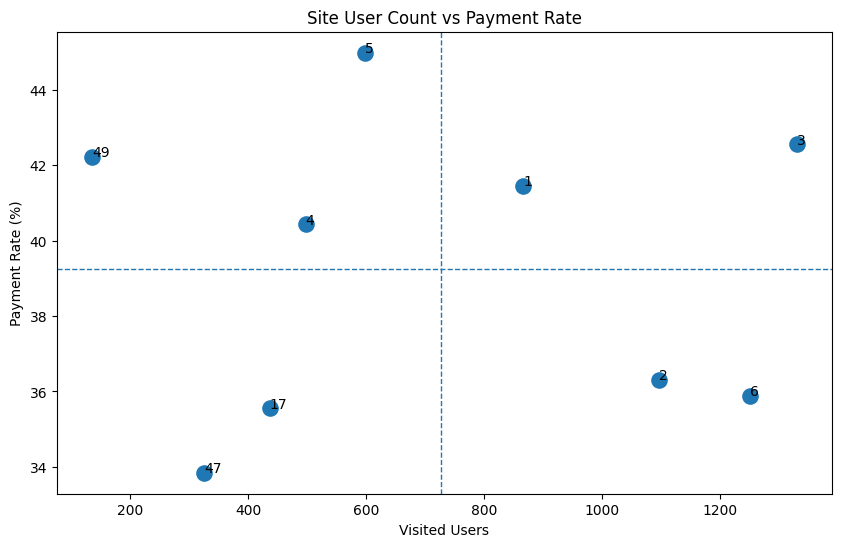

In [ ]:
import matplotlib.pyplot as plt

plot_df = site_summary.copy()

avg_users = plot_df["user_count"].mean()
avg_rate = plot_df["payment_rate"].mean()

plt.figure(figsize=(10, 6))

plt.scatter(
    plot_df["user_count"],
    plot_df["payment_rate"],
    s=120
)

for _, row in plot_df.iterrows():
    plt.text(
        row["user_count"],
        row["payment_rate"],
        str(int(row["main_site"])),
        fontsize=10
    )

plt.axvline(avg_users, linestyle="--", linewidth=1)
plt.axhline(avg_rate, linestyle="--", linewidth=1)

plt.title("Site User Count vs Payment Rate")
plt.xlabel("Visited Users")
plt.ylabel("Payment Rate (%)")

plt.show()

In [ ]:
df = master[master["visited"] == 1].copy()

df["is_evening_user"] = df["avg_enter_hour_kst"].between(18, 22, inclusive="left")

site_evening = (
    df.groupby("main_site")
    .agg(
        total_users=("user_uuid", "nunique"),
        total_payment_rate=("is_payment", "mean"),
        evening_users=("is_evening_user", "sum"),
        evening_payment_rate=("is_payment", lambda x: x[df.loc[x.index, "is_evening_user"]].mean())
    )
    .reset_index()
)

site_evening["total_payment_rate"] *= 100
site_evening["evening_payment_rate"] *= 100
site_evening["evening_user_ratio"] = site_evening["evening_users"] / site_evening["total_users"] * 100

site_evening.sort_values("evening_payment_rate", ascending=False)

,main_site,total_users,total_payment_rate,evening_users,evening_payment_rate,evening_user_ratio
8,49.0,135,42.222222,28,67.857143,20.740741
4,5.0,598,44.983278,69,56.521739,11.538462
0,1.0,866,41.454965,117,49.572650,13.510393
6,17.0,436,35.550459,75,49.333333,17.201835
1,2.0,1096,36.313869,166,48.795181,15.145985
2,3.0,1330,42.556391,211,43.601896,15.864662
5,6.0,1251,35.891287,211,41.706161,16.866507
7,47.0,325,33.846154,60,40.000000,18.461538
3,4.0,497,40.442656,61,39.344262,12.273642


In [ ]:
site_density = site_summary.copy()

site_density["users_per_pyeong"] = (
    site_density["user_count"] / site_density["avg_site_pyeong"]
)

site_density = site_density.sort_values("users_per_pyeong", ascending=False)

site_density[
    ["main_site", "user_count", "avg_site_pyeong", "users_per_pyeong", "payment_rate"]
]

,main_site,user_count,avg_site_pyeong,users_per_pyeong,payment_rate
0,1.0,866,50.0,17.320000,41.454965
1,2.0,1096,100.0,10.960000,36.313869
2,3.0,1330,150.0,8.866667,42.556391
6,17.0,436,50.0,8.720000,35.550459
5,6.0,1251,150.0,8.340000,35.891287
7,47.0,325,50.0,6.500000,33.846154
3,4.0,497,100.0,4.970000,40.442656
4,5.0,598,150.0,3.986667,44.983278
8,49.0,135,50.0,2.700000,42.222222


In [ ]:
site_repeat = (
    master[master["visited"] == 1]
    .groupby("main_site")
    .agg(
        user_count=("user_uuid", "nunique"),
        payment_rate=("is_payment", lambda x: x.mean() * 100),
        avg_visit_count=("visit_count", "mean"),
        avg_days_active=("days_active", "mean"),
        repeat_user_ratio=("days_active", lambda x: (x >= 2).mean() * 100)
    )
    .reset_index()
    .sort_values("repeat_user_ratio", ascending=False)
)

site_repeat

,main_site,user_count,payment_rate,avg_visit_count,avg_days_active,repeat_user_ratio
8,49.0,135,42.222222,1.859259,1.940741,54.814815
1,2.0,1096,36.313869,1.801095,1.882299,53.558394
2,3.0,1330,42.556391,1.742105,1.833083,51.578947
4,5.0,598,44.983278,1.739130,1.824415,51.337793
5,6.0,1251,35.891287,1.733014,1.800160,50.999201
6,17.0,436,35.550459,1.717890,1.814220,50.229358
3,4.0,497,40.442656,1.702213,1.784708,48.692153
0,1.0,866,41.454965,1.666282,1.765589,48.614319
7,47.0,325,33.846154,1.621538,1.698462,43.076923


In [ ]:
site_payment = (
    master[master["visited"] == 1]
    .groupby("main_site")
    .agg(
        user_count=("user_uuid", "nunique"),
        paid_count=("is_payment", "sum"),
        payment_rate=("is_payment", "mean")
    )
    .reset_index()
)

site_payment["payment_rate"] *= 100

site_payment = site_payment.sort_values("payment_rate", ascending=False)

site_payment

,main_site,user_count,paid_count,payment_rate
4,5.0,598,269,44.983278
2,3.0,1330,566,42.556391
8,49.0,135,57,42.222222
0,1.0,866,359,41.454965
3,4.0,497,201,40.442656
1,2.0,1096,398,36.313869
5,6.0,1251,449,35.891287
6,17.0,436,155,35.550459
7,47.0,325,110,33.846154


In [ ]:
site_payment["payment_rate"].describe()

count     9.000000
mean     39.251253
std       3.900498
min      33.846154
25%      35.891287
50%      40.442656
75%      42.222222
max      44.983278
Name: payment_rate, dtype: float64

In [ ]:
site_payment["payment_rate"].max() - site_payment["payment_rate"].min()

11.137123745819395

In [ ]:
import pandas as pd
from scipy.stats import chi2_contingency
import numpy as np

df = master[master["visited"] == 1].copy()

# 지점 x 결제 여부 교차표
contingency = pd.crosstab(df["main_site"], df["is_payment"])

chi2, p, dof, expected = chi2_contingency(contingency)

n = contingency.sum().sum()
cramers_v = np.sqrt(chi2 / (n * (min(contingency.shape) - 1)))

print("chi2:", chi2)
print("p-value:", p)
print("dof:", dof)
print("Cramer's V:", cramers_v)

chi2: 33.2703674458121
p-value: 5.5048604112898234e-05
dof: 8
Cramer's V: 0.07135743549569454


In [ ]:
df = master.copy()

# 방문일수 그룹화
df["days_active_group"] = pd.cut(
    df["days_active"],
    bins=[-1, 0, 1, 2, 3, 10],
    labels=["0일", "1일", "2일", "3일", "4일 이상"]
)

contingency_days = pd.crosstab(df["days_active_group"], df["is_payment"])

chi2_days, p_days, dof_days, expected_days = chi2_contingency(contingency_days)

n_days = contingency_days.sum().sum()
cramers_v_days = np.sqrt(
    chi2_days / (n_days * (min(contingency_days.shape) - 1))
)

print("days_active chi2:", chi2_days)
print("days_active p-value:", p_days)
print("days_active Cramer's V:", cramers_v_days)

days_active chi2: 267.39581347274986
days_active p-value: 1.161709949840087e-56
days_active Cramer's V: 0.16668614188150063


In [ ]:
df = master[master["visited"] == 1].copy()

def time_group(hour):
    if pd.isna(hour):
        return "Unknown"
    elif 6 <= hour < 11:
        return "Morning"
    elif 11 <= hour < 14:
        return "Lunch"
    elif 14 <= hour < 18:
        return "Afternoon"
    elif 18 <= hour < 22:
        return "Evening"
    else:
        return "Night"

df["enter_time_group"] = df["avg_enter_hour_kst"].apply(time_group)

contingency_time = pd.crosstab(df["enter_time_group"], df["is_payment"])

chi2_time, p_time, dof_time, expected_time = chi2_contingency(contingency_time)

n_time = contingency_time.sum().sum()
cramers_v_time = np.sqrt(
    chi2_time / (n_time * (min(contingency_time.shape) - 1))
)

print("time_group chi2:", chi2_time)
print("time_group p-value:", p_time)
print("time_group Cramer's V:", cramers_v_time)

time_group chi2: 36.20773572816146
time_group p-value: 8.631269828590572e-07
time_group Cramer's V: 0.07444081483979793


In [ ]:
effect_summary = pd.DataFrame({
    "variable": ["main_site", "days_active_group", "enter_time_group"],
    "cramers_v": [cramers_v, cramers_v_days, cramers_v_time],
    "p_value": [p, p_days, p_time]
})

effect_summary.sort_values("cramers_v", ascending=False)

,variable,cramers_v,p_value
1,days_active_group,0.166686,1.161710e-56
2,enter_time_group,0.074441,8.631270e-07
0,main_site,0.071357,5.504860e-05


## 머신러닝

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

df = master[master["visited"] == 1].copy()

X_site = df[["main_site"]]
y = df["is_payment"]

X_train, X_test, y_train, y_test = train_test_split(
    X_site, y, test_size=0.2, random_state=42, stratify=y
)

site_model = Pipeline(steps=[
    ("encoder", OneHotEncoder(handle_unknown="ignore")),
    ("model", LogisticRegression(max_iter=1000))
])

site_model.fit(X_train, y_train)

pred_proba = site_model.predict_proba(X_test)[:, 1]
pred = site_model.predict(X_test)

print("Site-only AUC:", roc_auc_score(y_test, pred_proba))
print("Site-only F1:", f1_score(y_test, pred))

Site-only AUC: 0.5164280348225728
Site-only F1: 0.0


In [ ]:
behavior_features = [
    "visit_count",
    "days_active",
    "visit_density",
    "first_visit_gap",
    "total_stay_sec",
    "avg_stay_sec",
    "avg_enter_hour_kst",
    "sites_used"
]

df_model = master.copy()

# 결측 처리
X_behavior = df_model[behavior_features].fillna(0)
y = df_model["is_payment"]

X_train, X_test, y_train, y_test = train_test_split(
    X_behavior, y, test_size=0.2, random_state=42, stratify=y
)

behavior_model = LogisticRegression(max_iter=1000, class_weight="balanced")
behavior_model.fit(X_train, y_train)

pred_proba = behavior_model.predict_proba(X_test)[:, 1]
pred = behavior_model.predict(X_test)

print("Behavior-only AUC:", roc_auc_score(y_test, pred_proba))
print("Behavior-only F1:", f1_score(y_test, pred))

Behavior-only AUC: 0.5754169771307388
Behavior-only F1: 0.4316020482809071


In [ ]:
import pandas as pd

user = pd.read_csv('../data/user_df.csv')
user.head(2)

,user_uuid,reg_date,reg_month,reg_weekday,day_count,site_count,visit_density,first_visit_gap,first_visit,first_visit_weekday,...,last_visit,total_stay,stay_time,out_time,avg_enter_hour,avg_leave_hour,total_access,main_site,site_size,is_payment
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-04,9,1,1,1,3.0,1.0,2023-09-05,1.0,...,2023-09-05,362.0,356.0,6.0,11.000000,17.000000,3,6.0,150.0,0
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,2021-10-16,10,0,0,0,0.0,0.0,0,0.0,...,0,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,0


In [ ]:
# 타겟
y = df["is_payment"]

# 일단 타겟과 식별자만 제거
drop_cols = ["is_payment", "user_uuid"]

# 실제 존재하는 컬럼만 제거
drop_cols = [col for col in drop_cols if col in df.columns]

X_raw = df.drop(columns=drop_cols)

In [ ]:
# 숫자형 컬럼만 선택
X = X_raw.select_dtypes(include=["number"]).copy()

# 결측치 0 처리
X = X.fillna(0)

print(X.shape)
print(X.columns)

(9624, 27)
Index(['visit_days', 'visit_count', 'total_stay_min', 'avg_stay_min',
       'total_out_min', 'avg_out_min', 'access_count', 'has_visit',
       'has_access', 'days_to_first_access', 'days_to_last_access',
       'site_visit_count', 'area_pyeong', 'register_count', 're_register_yn',
       'sites_used', 'days_active', 'visit_density', 'max_stay_sec',
       'avg_enter_hour', 'weekend_ratio', 'checkin_count', 'checkout_count',
       'main_site_stay_sec', 'main_site_visit_days', 'trial_dow',
       'first_visit_gap'],
      dtype='object')


In [ ]:
# 모델에서 제외된 컬럼 확인
excluded_cols = [col for col in X_raw.columns if col not in X.columns]

excluded_cols

['trial_date',
 'first_access_time',
 'last_access_time',
 'site_id',
 'first_visit',
 'last_visit',
 'stay_hour_group',
 'trial_month',
 'avg_stay_group',
 'first_visit_gap_group',
 'weekend_group',
 'enter_hour_group']

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

rf = RandomForestClassifier(
    n_estimators=300,
    random_state=42,
    class_weight="balanced"
)

rf.fit(X_train, y_train)

pred = rf.predict(X_test)
pred_proba = rf.predict_proba(X_test)[:, 1]

print("Accuracy:", accuracy_score(y_test, pred))
print("ROC-AUC:", roc_auc_score(y_test, pred_proba))
print(classification_report(y_test, pred))

Accuracy: 0.6233766233766234
ROC-AUC: 0.5734109015876655
              precision    recall  f1-score   support

           0       0.65      0.86      0.74      1195
           1       0.51      0.24      0.32       730

    accuracy                           0.62      1925
   macro avg       0.58      0.55      0.53      1925
weighted avg       0.59      0.62      0.58      1925



In [ ]:
# 실제 미결제자 중 86% 잘 잡음
# 실제 결제가 중 24%만 잡음
# 결제자로 예측한 사람 중 51%가 실제 결제자

In [ ]:
import pandas as pd

importance = pd.DataFrame({
    "feature": X.columns,
    "importance": rf.feature_importances_
}).sort_values("importance", ascending=False)

importance.head(20)

,feature,importance
3,avg_stay_min,0.090799
18,max_stay_sec,0.090746
2,total_stay_min,0.083688
10,days_to_last_access,0.082884
23,main_site_stay_sec,0.082463
9,days_to_first_access,0.080799
19,avg_enter_hour,0.079297
5,avg_out_min,0.071871
4,total_out_min,0.070648
25,trial_dow,0.048952


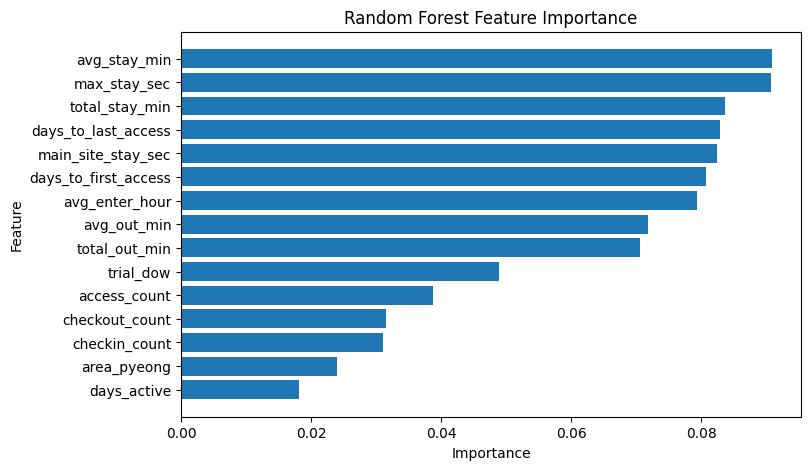

In [ ]:
import matplotlib.pyplot as plt

top_imp = importance.head(15)

fig, ax = plt.subplots(figsize=(8, 5))
ax.barh(top_imp["feature"], top_imp["importance"])
ax.invert_yaxis()

ax.set_title("Random Forest Feature Importance")
ax.set_xlabel("Importance")
ax.set_ylabel("Feature")

plt.show()

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report

# 기본 모델
rf = RandomForestClassifier(
    random_state=42,
    class_weight="balanced"
)

# 탐색할 하이퍼파라미터 후보
param_dist = {
    "n_estimators": [200, 300, 500],
    "max_depth": [3, 5, 7, 10, None],
    "min_samples_split": [2, 5, 10, 20],
    "min_samples_leaf": [1, 2, 5, 10],
    "max_features": ["sqrt", "log2", None]
}

# 랜덤 서치
rf_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=30,              # 30개 조합만 랜덤으로 테스트
    scoring="roc_auc",      # ROC-AUC 기준으로 최적 모델 선택
    cv=5,                   # 5-fold 교차검증
    random_state=42,
    n_jobs=-1,
    verbose=1
)

rf_search.fit(X_train, y_train)

print("Best ROC-AUC:", rf_search.best_score_)
print("Best Params:", rf_search.best_params_)

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best ROC-AUC: 0.6186060325890189
Best Params: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 'log2', 'max_depth': 7}


In [ ]:
best_rf = rf_search.best_estimator_

pred = best_rf.predict(X_test)
pred_proba = best_rf.predict_proba(X_test)[:, 1]

print("Accuracy:", accuracy_score(y_test, pred))
print("ROC-AUC:", roc_auc_score(y_test, pred_proba))
print(classification_report(y_test, pred))

Accuracy: 0.6036363636363636
ROC-AUC: 0.5829174070040695
              precision    recall  f1-score   support

           0       0.66      0.74      0.70      1195
           1       0.47      0.38      0.42       730

    accuracy                           0.60      1925
   macro avg       0.57      0.56      0.56      1925
weighted avg       0.59      0.60      0.59      1925



In [ ]:
importance_tuned = pd.DataFrame({
    "feature": X.columns,
    "importance": best_rf.feature_importances_
}).sort_values("importance", ascending=False)

importance_tuned.head(20)

,feature,importance
3,avg_stay_min,0.097458
16,days_active,0.080982
18,max_stay_sec,0.079698
10,days_to_last_access,0.071782
23,main_site_stay_sec,0.070942
2,total_stay_min,0.065325
9,days_to_first_access,0.059534
19,avg_enter_hour,0.054753
1,visit_count,0.050586
4,total_out_min,0.050276


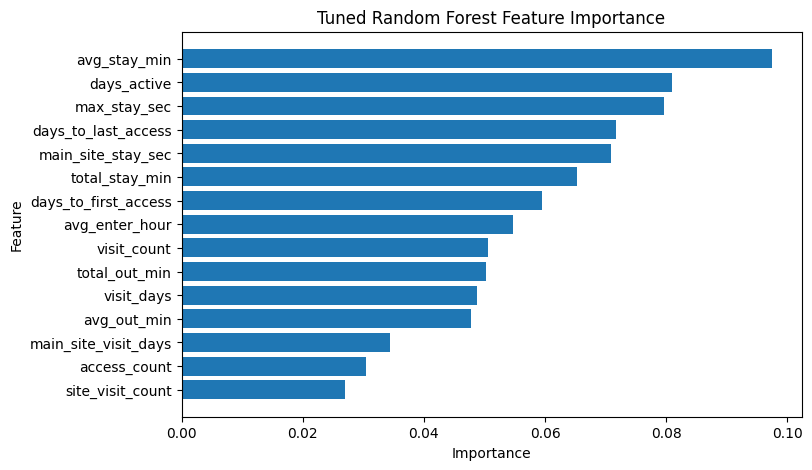

In [ ]:
import matplotlib.pyplot as plt

top_imp = importance_tuned.head(15)

fig, ax = plt.subplots(figsize=(8, 5))
ax.barh(top_imp["feature"], top_imp["importance"])
ax.invert_yaxis()

ax.set_title("Tuned Random Forest Feature Importance")
ax.set_xlabel("Importance")
ax.set_ylabel("Feature")

plt.show()

In [ ]:
pred = best_rf.predict(X_test)
pred_proba = best_rf.predict_proba(X_test)[:, 1]

print("Accuracy:", accuracy_score(y_test, pred))
print("ROC-AUC:", roc_auc_score(y_test, pred_proba))
print(classification_report(y_test, pred))

Accuracy: 0.6036363636363636
ROC-AUC: 0.5829174070040695
              precision    recall  f1-score   support

           0       0.66      0.74      0.70      1195
           1       0.47      0.38      0.42       730

    accuracy                           0.60      1925
   macro avg       0.57      0.56      0.56      1925
weighted avg       0.59      0.60      0.59      1925



In [ ]:
# 타겟
y = df["is_payment"]

# 모델에 넣지 않을 컬럼
drop_cols = [
    "is_payment",
    "user_uuid",
    "trial_date",
    "first_access_time",
    "last_access_time"
]

# 실제 존재하는 컬럼만 제거
drop_cols = [col for col in drop_cols if col in df.columns]

X_raw = df.drop(columns=drop_cols)

# 확인
print(X_raw.shape)
print(X_raw.select_dtypes(exclude=["number"]).columns)

(9624, 36)
Index(['site_id', 'first_visit', 'last_visit', 'stay_hour_group',
       'trial_month', 'avg_stay_group', 'first_visit_gap_group',
       'weekend_group', 'enter_hour_group'],
      dtype='object')


In [ ]:
# 문자형/범주형 컬럼을 원핫인코딩
X = pd.get_dummies(X_raw, drop_first=True)

# 결측치 처리
X = X.fillna(0)

print(X.shape)
X.head()

(9624, 89)


,visit_days,visit_count,total_stay_min,avg_stay_min,total_out_min,avg_out_min,access_count,has_visit,has_access,days_to_first_access,...,first_visit_gap_group_Within 1 Day,first_visit_gap_group_Within 2 Days,weekend_group_Mostly Weekend,weekend_group_No Visit,weekend_group_Weekday Only,weekend_group_Weekend Only,enter_hour_group_13-17,enter_hour_group_After 17,enter_hour_group_Before 10,enter_hour_group_No Check-in
0,1,1,356.950000,356.950000,5.783333,5.783333,6,1,1,1.122936,...,True,False,False,False,True,False,False,False,True,False
1,0,0,0.000000,0.000000,0.000000,0.000000,0,0,0,0.000000,...,False,False,False,True,False,False,False,False,False,True
2,3,3,759.483333,253.161111,152.500000,50.833333,18,1,1,1.313366,...,True,False,False,False,False,False,False,False,True,False
3,0,0,0.000000,0.000000,0.000000,0.000000,0,0,0,0.000000,...,False,False,False,True,False,False,False,False,False,True
4,2,2,1289.533333,644.766667,8.300000,4.150000,19,1,1,1.030654,...,True,False,False,False,True,False,False,False,True,False


In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

In [ ]:
# 타겟
y = df["is_payment"]

# 기본 제거 컬럼
drop_cols = [
    "is_payment",
    "user_uuid"
]

drop_cols = [col for col in drop_cols if col in df.columns]

X_raw = df.drop(columns=drop_cols)

In [ ]:
# datetime 타입 컬럼 확인
datetime_cols = X_raw.select_dtypes(include=["datetime64[ns]", "datetime64"]).columns.tolist()

datetime_cols

['trial_date',
 'first_access_time',
 'last_access_time',
 'first_visit',
 'last_visit']

In [ ]:
# datetime 컬럼 제거
X_raw = X_raw.drop(columns=datetime_cols)

# 다시 숫자형 아닌 컬럼 확인
X_raw.select_dtypes(exclude=["number"]).columns

Index(['site_id', 'stay_hour_group', 'trial_month', 'avg_stay_group',
       'first_visit_gap_group', 'weekend_group', 'enter_hour_group'],
      dtype='object')

In [ ]:
# 문자형/범주형 변수 원핫인코딩
X = pd.get_dummies(X_raw, drop_first=True)

# 결측치 처리
X = X.fillna(0)

# 최종적으로 숫자형 아닌 컬럼이 남았는지 확인
X.select_dtypes(exclude=["number"]).columns

Index(['site_id_17', 'site_id_2', 'site_id_3', 'site_id_4', 'site_id_47',
       'site_id_49', 'site_id_5', 'site_id_6', 'stay_hour_group_0h',
       'stay_hour_group_10-24h', 'stay_hour_group_2-5h',
       'stay_hour_group_24h+', 'stay_hour_group_5-10h', 'trial_month_2021-06',
       'trial_month_2021-07', 'trial_month_2021-08', 'trial_month_2021-09',
       'trial_month_2021-10', 'trial_month_2021-11', 'trial_month_2021-12',
       'trial_month_2022-01', 'trial_month_2022-02', 'trial_month_2022-03',
       'trial_month_2022-04', 'trial_month_2022-05', 'trial_month_2022-06',
       'trial_month_2022-07', 'trial_month_2022-08', 'trial_month_2022-09',
       'trial_month_2022-10', 'trial_month_2022-11', 'trial_month_2022-12',
       'trial_month_2023-01', 'trial_month_2023-02', 'trial_month_2023-03',
       'trial_month_2023-04', 'trial_month_2023-05', 'trial_month_2023-06',
       'trial_month_2023-07', 'trial_month_2023-08', 'trial_month_2023-09',
       'trial_month_2023-10', 'trial_

In [ ]:
for col in X.columns:
    if X[col].apply(lambda x: isinstance(x, pd.Timestamp)).any():
        print(col)

In [ ]:
timestamp_cols = []

for col in X.columns:
    if X[col].apply(lambda x: isinstance(x, pd.Timestamp)).any():
        timestamp_cols.append(col)

X = X.drop(columns=timestamp_cols)

timestamp_cols

[]

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

rf = RandomForestClassifier(
    n_estimators=300,
    random_state=42,
    class_weight="balanced"
)

rf.fit(X_train, y_train)

pred = rf.predict(X_test)
pred_proba = rf.predict_proba(X_test)[:, 1]

print("Accuracy:", accuracy_score(y_test, pred))
print("ROC-AUC:", roc_auc_score(y_test, pred_proba))
print(classification_report(y_test, pred))

Accuracy: 0.6124675324675325
ROC-AUC: 0.5914048260445922
              precision    recall  f1-score   support

           0       0.66      0.76      0.71      1195
           1       0.49      0.36      0.42       730

    accuracy                           0.61      1925
   macro avg       0.57      0.56      0.56      1925
weighted avg       0.60      0.61      0.60      1925



In [ ]:
importance_cat = pd.DataFrame({
    "feature": X.columns,
    "importance": rf.feature_importances_
}).sort_values("importance", ascending=False)

importance_cat.head(30)

,feature,importance
25,trial_dow,0.070651
3,avg_stay_min,0.061965
18,max_stay_sec,0.059881
23,main_site_stay_sec,0.058003
2,total_stay_min,0.057664
10,days_to_last_access,0.055794
9,days_to_first_access,0.054585
19,avg_enter_hour,0.054067
5,avg_out_min,0.049844
4,total_out_min,0.049068


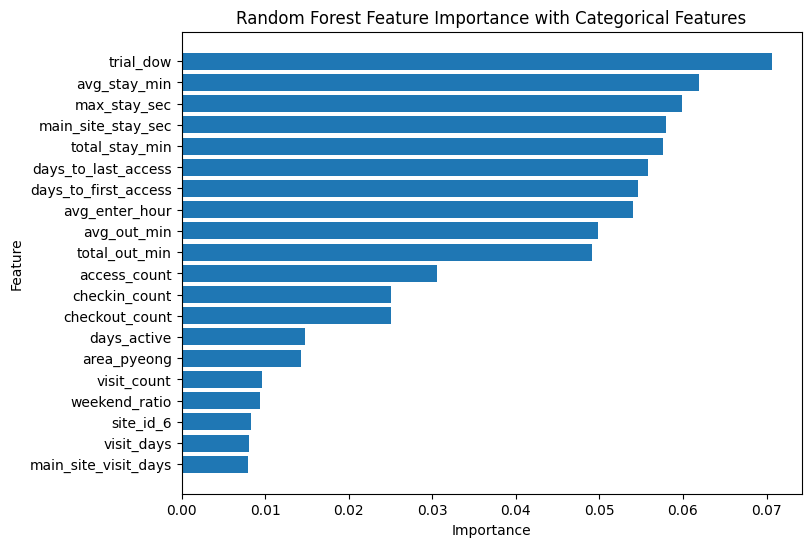

In [ ]:
import matplotlib.pyplot as plt

top_imp = importance_cat.head(20)

fig, ax = plt.subplots(figsize=(8, 6))
ax.barh(top_imp["feature"], top_imp["importance"])
ax.invert_yaxis()

ax.set_title("Random Forest Feature Importance with Categorical Features")
ax.set_xlabel("Importance")
ax.set_ylabel("Feature")

plt.show()

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

lr = LogisticRegression(
    max_iter=1000,
    class_weight='balanced'
)

lr.fit(X_train, y_train)

pred_proba = lr.predict_proba(X_test)[:,1]

print(
    roc_auc_score(y_test,pred_proba)
)

0.5512110964635755


C:\Users\shg00\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:406: ConvergenceWarning: lbfgs failed to converge after 1000 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=1000).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


# 소현님 코드

## [0] 사전 작업

In [ ]:
!pip3 install koreanize_matplotlib

In [ ]:
# 라이브러리 로드
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.ticker as ticker
import seaborn as sns
import koreanize_matplotlib
import os
import glob
import pandas as pd
import datetime
import numpy as np
from collections import Counter
from matplotlib import rc

# rc('font', family='AppleGothic')        # Mac
rc('font', family='Malgun Gothic')    # Windows
plt.rcParams['axes.unicode_minus'] = False

In [ ]:
DATA_DIR = 'data/'

def load_preprocessing(file_name):
    # 데이터 불러오기
    df = pd.read_csv(DATA_DIR + file_name)
    print(file_name)
    display(df.head(3))
    # 타입 확인
    df.info()

    # 기초 정보량 확인
    isn       = df.isnull().sum()
    isn_ratio = (df.isnull().sum() / df.shape[0] * 100).round(1).astype('int').astype('str') + '%'
    unq       = df.nunique()
    str_cols  = df.select_dtypes(include='object').columns
    if len(str_cols) > 0:
        top_frq = df[str_cols].apply(lambda x: x.value_counts().index[0])
        top_frq = top_frq.reindex(df.columns)
    else:
        top_frq = pd.Series('-', index=df.columns)
    pre_df = pd.concat([isn, isn_ratio, unq, top_frq], axis=1)
    pre_df.columns    = ['결측치', '결측치(%)', '유니크값', '최빈값']
    pre_df.index.name = 'shape : ' + str(df.shape)
    display(pre_df)

    # 기초 통계 확인
    display(df.describe())

    # 중복행 확인
    dup_count = df.duplicated().sum()
    dup_ratio = round(dup_count / df.shape[0] * 100, 1)
    print(f"중복행 수 : {dup_count}건 ({dup_ratio}%)")
    if dup_count > 0:
        print("중복행 샘플")
        display(df[df.duplicated(keep=False)].sort_values(list(df.columns)).head(4))
    return df

## [1] 데이터 탐색

## (1) trial_register

In [ ]:
# 기본 정보 확인
reg = load_preprocessing('trial_register.csv')

trial_register.csv


,trial_date,user_uuid
0,2023-12-21,2b251333-8676-4c11-a736-dcf2350f8821
1,2023-12-21,e111619a-0975-451b-9a4a-bc8aea7b7b84
2,2023-12-21,4a184795-b056-4572-a874-644f68609ea3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9659 entries, 0 to 9658
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   trial_date  9659 non-null   object
 1   user_uuid   9659 non-null   object
dtypes: object(2)
memory usage: 151.1+ KB


,결측치,결측치(%),유니크값,최빈값
"shape : (9659, 2)",,,,
trial_date,0,0%,855,2022-12-08
user_uuid,0,0%,9624,dceba5c8-20c2-497a-829a-74099f7ee5a8


,trial_date,user_uuid
count,9659,9659
unique,855,9624
top,2022-12-08,dceba5c8-20c2-497a-829a-74099f7ee5a8
freq,144,2


중복행 수 : 28건 (0.3%)
중복행 샘플


,trial_date,user_uuid
103,2022-12-27,19c8e329-9654-4178-989d-c93617655650
104,2022-12-27,19c8e329-9654-4178-989d-c93617655650
6898,2023-01-19,533e00f2-e2c4-4adb-961b-2836184320f3
6899,2023-01-19,533e00f2-e2c4-4adb-961b-2836184320f3


기간 : 2021-05-01 ~ 2023-12-31


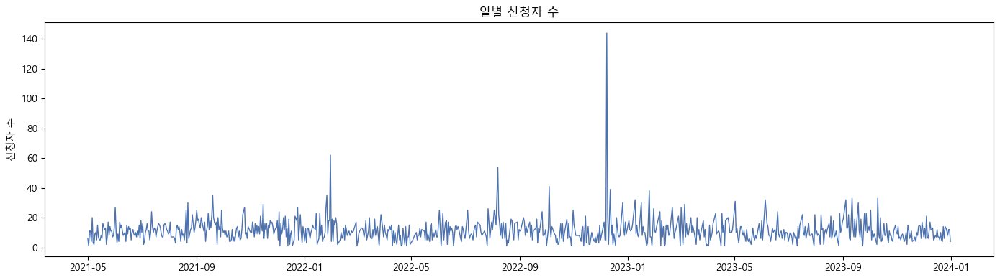

In [ ]:
# trial_register - 타입 변환 및 기간 확인
reg['trial_date'] = pd.to_datetime(reg['trial_date'])
print("기간 :", reg['trial_date'].min().date(), "~", reg['trial_date'].max().date())

# 날짜별 신청자 수 분포
daily_reg = reg.groupby('trial_date').size().reset_index(name='신청자 수')

fig, ax = plt.subplots(figsize=(14, 4))
ax.plot(daily_reg['trial_date'], daily_reg['신청자 수'], color='#4C72B0', linewidth=1)
ax.set_title('일별 신청자 수')
ax.set_xlabel('')
ax.set_ylabel('신청자 수')
plt.tight_layout()
plt.show()

## (2) trial_access_log

In [ ]:
acc  = load_preprocessing('trial_access_log.csv')

trial_access_log.csv


,id,checkin,cdate,site_id,user_uuid
0,1719038,1,2023-07-07 07:11:55.201673,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
1,1716702,2,2023-07-06 15:15:58.761284,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
2,1719956,2,2023-07-07 14:10:41.848998,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63708 entries, 0 to 63707
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   id         63708 non-null  int64 
 1   checkin    63708 non-null  int64 
 2   cdate      63708 non-null  object
 3   site_id    63708 non-null  int64 
 4   user_uuid  63708 non-null  object
dtypes: int64(3), object(2)
memory usage: 2.4+ MB


,결측치,결측치(%),유니크값,최빈값
"shape : (63708, 5)",,,,
id,0,0%,63349,NaN
checkin,0,0%,2,NaN
cdate,0,0%,63349,2023-11-30 10:18:12.960180
site_id,0,0%,9,NaN
user_uuid,0,0%,6026,948ae0cc-bc5a-4bd3-89ce-92b2a5c34710


,id,checkin,site_id
count,6.370800e+04,63708.000000,63708.000000
mean,9.991124e+05,1.495448,7.290843
std,6.811781e+05,0.499983,11.116908
min,5.154800e+04,1.000000,1.000000
25%,3.389112e+05,1.000000,3.000000
50%,9.312460e+05,1.000000,4.000000
75%,1.623065e+06,2.000000,6.000000
max,2.193657e+06,2.000000,49.000000


중복행 수 : 359건 (0.6%)
중복행 샘플


,id,checkin,cdate,site_id,user_uuid
50522,1238281,1,2023-01-20 00:40:40.547291,6,dceba5c8-20c2-497a-829a-74099f7ee5a8
50523,1238281,1,2023-01-20 00:40:40.547291,6,dceba5c8-20c2-497a-829a-74099f7ee5a8
50538,1238901,1,2023-01-20 03:23:14.760423,6,dceba5c8-20c2-497a-829a-74099f7ee5a8
50539,1238901,1,2023-01-20 03:23:14.760423,6,dceba5c8-20c2-497a-829a-74099f7ee5a8


In [ ]:
# cdate 기간 확인
cdate_temp = pd.to_datetime(acc['cdate']).dt.floor('s')
print("기간 :", cdate_temp.dt.date.min(), "~", cdate_temp.dt.date.max())

기간 : 2021-05-02 ~ 2024-01-01


## (3) trial_payment

In [ ]:
pay  = load_preprocessing('trial_payment.csv')

trial_payment.csv


,is_payment,user_uuid
0,0,2b251333-8676-4c11-a736-dcf2350f8821
1,0,e111619a-0975-451b-9a4a-bc8aea7b7b84
2,1,4a184795-b056-4572-a874-644f68609ea3


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9659 entries, 0 to 9658
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   is_payment  9659 non-null   int64 
 1   user_uuid   9659 non-null   object
dtypes: int64(1), object(1)
memory usage: 151.1+ KB


,결측치,결측치(%),유니크값,최빈값
"shape : (9659, 2)",,,,
is_payment,0,0%,2,NaN
user_uuid,0,0%,9624,dceba5c8-20c2-497a-829a-74099f7ee5a8


,is_payment
count,9659.000000
mean,0.379335
std,0.485247
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


중복행 수 : 35건 (0.4%)
중복행 샘플


,is_payment,user_uuid
132,0,039fa563-fc65-4b0c-9087-4beb5cd17fd7
133,0,039fa563-fc65-4b0c-9087-4beb5cd17fd7
5624,0,14872783-3af7-492a-b51c-12f3003b76f1
5625,0,14872783-3af7-492a-b51c-12f3003b76f1


## (4) site_area

In [ ]:
site = load_preprocessing('site_area.csv')

site_area.csv


,site_id,area_pyeong
0,1,50
1,2,100
2,3,150


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   site_id      9 non-null      int64
 1   area_pyeong  9 non-null      int64
dtypes: int64(2)
memory usage: 276.0 bytes


,결측치,결측치(%),유니크값,최빈값
"shape : (9, 2)",,,,
site_id,0,0%,9,-
area_pyeong,0,0%,3,-


,site_id,area_pyeong
count,9.000000,9.000000
mean,14.888889,94.444444
std,19.348414,46.398036
min,1.000000,50.000000
25%,3.000000,50.000000
50%,5.000000,100.000000
75%,17.000000,150.000000
max,49.000000,150.000000


중복행 수 : 0건 (0.0%)


## 전처리

## (1) trial_register

In [ ]:
# trial_register - 중복값 제거
reg = reg.drop_duplicates().reset_index(drop=True)

print(f"reg : {reg.shape}")

reg : (9631, 2)


In [ ]:
# 2번 이상 신청한 유저 확인

# cdate KST 변환 및 날짜 컬럼 생성
acc['cdate'] = pd.to_datetime(acc['cdate'])
acc['cdate_kst'] = (acc['cdate'] + pd.Timedelta(hours=9)).dt.floor('s')
acc['date'] = acc['cdate_kst'].dt.date.astype(str)

re_register = reg[reg['user_uuid'].duplicated(keep=False)].copy()
re_register = re_register.sort_values(['user_uuid', 'trial_date'])

# acc에서 유저별 첫 방문일 추출
first_visit = (acc.groupby('user_uuid')['date']
               .min()
               .rename('first_visit_date')
               .reset_index())

re_register = re_register.merge(first_visit, on='user_uuid', how='left')

print(f'재신청 유저 수: {re_register["user_uuid"].nunique():,}명')
print(f'재신청 포함 총 신청 건수: {len(re_register):,}건')
print()
print(re_register[['user_uuid', 'trial_date', 'first_visit_date']].to_string())

재신청 유저 수: 7명
재신청 포함 총 신청 건수: 14건

                               user_uuid trial_date first_visit_date
0   14872783-3af7-492a-b51c-12f3003b76f1 2022-01-28              NaN
1   14872783-3af7-492a-b51c-12f3003b76f1 2023-02-10              NaN
2   4008307f-486f-408f-b90b-e01398972029 2021-09-06       2022-03-26
3   4008307f-486f-408f-b90b-e01398972029 2022-03-25       2022-03-26
4   5b16f32b-3344-4b39-b2bf-8cf1caac78fa 2022-03-14              NaN
5   5b16f32b-3344-4b39-b2bf-8cf1caac78fa 2023-03-22              NaN
6   6a88014b-fbbd-4e73-8036-04435c062a97 2022-09-05       2023-02-11
7   6a88014b-fbbd-4e73-8036-04435c062a97 2023-02-10       2023-02-11
8   bd3ed6c2-f139-4e0c-b53e-b956101b2822 2022-08-02              NaN
9   bd3ed6c2-f139-4e0c-b53e-b956101b2822 2022-10-21              NaN
10  bf620970-e3f2-4b54-9620-86171299d08b 2021-10-28       2022-03-04
11  bf620970-e3f2-4b54-9620-86171299d08b 2022-03-04       2022-03-04
12  ffd880d5-0200-44e1-91db-7df9483f2a39 2021-06-16              NaN


In [ ]:
# 최신 신청일 기준 1건만 유지 (이전 신청 이력 삭제)
reg = (
    reg.sort_values('trial_date', ascending=False)
    .drop_duplicates(subset='user_uuid', keep='first')
    .reset_index(drop=True)
)

# 처리 결과 확인
uuid_dup_after = reg.groupby('user_uuid')['trial_date'].nunique()
uuid_dup_after = uuid_dup_after[uuid_dup_after > 1]
print(f"\n처리 후 다른 날짜 재신청 유저 : {len(uuid_dup_after)}명")
print(f"reg : {reg.shape}")


처리 후 다른 날짜 재신청 유저 : 0명
reg : (9624, 2)


## (2) trial_access_log

In [ ]:
# 중복값 제거
acc = acc.drop_duplicates().reset_index(drop=True)

In [ ]:
# cdate KST 변환 및 날짜 컬럼 생성
acc['cdate'] = pd.to_datetime(acc['cdate'])
acc['cdate_kst'] = (acc['cdate'] + pd.Timedelta(hours=9)).dt.floor('s')

In [ ]:
# acc checkin 이상 패턴 현황 파악
# 정렬: user x site x cdate_kst
# 패턴 확인: user x site 단위

# acc 전처리: 불필요 컬럼 제거 및 정렬
acc = acc.drop(columns=['id', 'cdate', 'date'])
acc = acc.sort_values(['user_uuid', 'site_id', 'cdate_kst']).reset_index(drop=True)

starts_with_2 = 0
ends_with_1 = 0
has_consec_1 = 0
has_consec_2 = 0
consec_1_counts = []
consec_2_counts = []

for (u, s), group in acc.groupby(['user_uuid', 'site_id'], sort=False):
    checkin_vals = group['checkin'].tolist()

    if checkin_vals[0] == 2:
        starts_with_2 += 1
    if checkin_vals[-1] == 1:
        ends_with_1 += 1

    run_len = 1
    grp_has_consec_1 = False
    grp_has_consec_2 = False
    for i in range(1, len(checkin_vals)):
        if checkin_vals[i] == checkin_vals[i - 1]:
            run_len += 1
        else:
            if run_len > 1:
                if checkin_vals[i - 1] == 1:
                    consec_1_counts.append(run_len)
                    grp_has_consec_1 = True
                else:
                    consec_2_counts.append(run_len)
                    grp_has_consec_2 = True
            run_len = 1
    if run_len > 1:
        if checkin_vals[-1] == 1:
            consec_1_counts.append(run_len)
            grp_has_consec_1 = True
        else:
            consec_2_counts.append(run_len)
            grp_has_consec_2 = True

    if grp_has_consec_1:
        has_consec_1 += 1
    if grp_has_consec_2:
        has_consec_2 += 1

total_rows = len(acc)
total_groups = acc.groupby(['user_uuid', 'site_id']).ngroups
normal_groups = sum(
    1 for (u, s), g in acc.groupby(['user_uuid', 'site_id'], sort=False)
    if g['checkin'].iloc[0] != 2
    and g['checkin'].iloc[-1] != 1
    and all(g['checkin'].iloc[i] != g['checkin'].iloc[i-1] for i in range(1, len(g)))
)

print(f"전체 row 수: {total_rows:,}")
print(f"전체 그룹 수: {total_groups:,} (row 대비 {total_groups / total_rows * 100:.1f}%)")
print()
print(f"2로 시작하는 그룹: {starts_with_2:,} ({starts_with_2 / total_groups * 100:.1f}%)")
print(f"1로 끝나는 그룹:   {ends_with_1:,} ({ends_with_1 / total_groups * 100:.1f}%)")
print(f"연속 1 있는 그룹:  {has_consec_1:,} ({has_consec_1 / total_groups * 100:.1f}%)")
print(f"연속 2 있는 그룹:  {has_consec_2:,} ({has_consec_2 / total_groups * 100:.1f}%)")
print(f"정상 그룹:         {normal_groups:,} ({normal_groups / total_groups * 100:.1f}%)")
print()

c1 = Counter(consec_1_counts)
c2 = Counter(consec_2_counts)

print("[ 연속 1 발생 분포 ]")
print(f"  연속 발생 건수 (run 수): {len(consec_1_counts):,}")
if c1:
    for k in sorted(c1):
        print(f"  연속 {k}회: {c1[k]:,}건")
print()

print("[ 연속 2 발생 분포 ]")
print(f"  연속 발생 건수 (run 수): {len(consec_2_counts):,}")
if c2:
    for k in sorted(c2):
        print(f"  연속 {k}회: {c2[k]:,}건")

전체 row 수: 63,349
전체 그룹 수: 6,269 (row 대비 9.9%)

2로 시작하는 그룹: 140 (2.2%)
1로 끝나는 그룹:   280 (4.5%)
연속 1 있는 그룹:  1,124 (17.9%)
연속 2 있는 그룹:  828 (13.2%)
정상 그룹:         4,322 (68.9%)

[ 연속 1 발생 분포 ]
  연속 발생 건수 (run 수): 1,374
  연속 2회: 1,274건
  연속 3회: 91건
  연속 4회: 7건
  연속 6회: 1건
  연속 21회: 1건

[ 연속 2 발생 분포 ]
  연속 발생 건수 (run 수): 948
  연속 2회: 865건
  연속 3회: 66건
  연속 4회: 11건
  연속 5회: 5건
  연속 10회: 1건


In [ ]:
# acc checkin 정제 후 session 생성
# - user x site 기준 첫 로그가 2면 제거, 마지막 로그가 1이면 제거
# - user x site 기준 연속 1은 마지막 1만 유지, 연속 2는 첫 번째 2만 유지

keep_mask = pd.Series(False, index=acc.index)

for (u, s), group in acc.groupby(['user_uuid', 'site_id'], sort=False):
    idxs = group.index.tolist()
    checkin_vals = group['checkin'].tolist()

    # 앞에서 2 제거
    start = 0
    while start < len(idxs) and checkin_vals[start] == 2:
        start += 1

    # 뒤에서 1 제거
    end = len(idxs) - 1
    while end >= start and checkin_vals[end] == 1:
        end -= 1

    idxs = idxs[start:end + 1]
    checkin_vals = checkin_vals[start:end + 1]

    keep_idxs = []
    last_kept_pos = None
    last_kept_val = None

    for pos, idx in enumerate(idxs):
        cur = checkin_vals[pos]

        if last_kept_val is None:
            if cur == 1:
                keep_idxs.append(idx)
                last_kept_pos = len(keep_idxs) - 1
                last_kept_val = 1
        else:
            if cur == last_kept_val:
                if cur == 1:                     # 연속 1: 이전 1 제거, 현재 1 추가
                    keep_idxs.pop(last_kept_pos)
                    keep_idxs.append(idx)
                    last_kept_pos = len(keep_idxs) - 1
                # 연속 2: 현재 제거 (아무것도 안 함)
            else:                                # 정상 교대 → keep
                keep_idxs.append(idx)
                last_kept_pos = len(keep_idxs) - 1
                last_kept_val = cur

    keep_mask.loc[keep_idxs] = True

session = acc[keep_mask].reset_index(drop=True)

print(f"원본 row 수: {len(acc):,}")
print(f"정제 후 row 수 (session): {len(session):,}")
print(f"제거된 row 수: {len(acc) - len(session):,}")

원본 row 수: 63,349
정제 후 row 수 (session): 60,368
제거된 row 수: 2,981


In [ ]:
# session 검증

us_start_fail = 0
us_end_fail = 0
us_pattern_fail = 0

for (u, s), group in session.groupby(['user_uuid', 'site_id'], sort=False):
    vals = group['checkin'].tolist()

    if vals[0] != 1:
        us_start_fail += 1
    if vals[-1] != 2:
        us_end_fail += 1
    for i in range(1, len(vals)):
        if vals[i] == vals[i - 1]:
            us_pattern_fail += 1
            break

print(f"user x site 시작 1 위반 그룹: {us_start_fail}건")
print(f"user x site 끝 2 위반 그룹:   {us_end_fail}건")
print(f"user x site 교대 패턴 위반 그룹: {us_pattern_fail}건")

user x site 시작 1 위반 그룹: 0건
user x site 끝 2 위반 그룹:   0건
user x site 교대 패턴 위반 그룹: 0건


In [ ]:
session.head()

,checkin,site_id,user_uuid,cdate_kst
0,1,6,000590dc-046f-462b-8225-4c81a97b7166,2023-09-05 11:57:01
1,2,6,000590dc-046f-462b-8225-4c81a97b7166,2023-09-05 13:24:05
2,1,6,000590dc-046f-462b-8225-4c81a97b7166,2023-09-05 13:27:46
3,2,6,000590dc-046f-462b-8225-4c81a97b7166,2023-09-05 16:14:07
4,1,6,000590dc-046f-462b-8225-4c81a97b7166,2023-09-05 16:16:13


In [ ]:
# checkin=1과 checkin=2를 순번 기준으로 쌍으로 묶기
enter = (session[session['checkin'] == 1][['user_uuid', 'site_id', 'cdate_kst']]
         .rename(columns={'cdate_kst': 'enter_time'})
         .reset_index(drop=True))
leave = (session[session['checkin'] == 2][['user_uuid', 'site_id', 'cdate_kst']]
         .rename(columns={'cdate_kst': 'leave_time'})
         .reset_index(drop=True))

enter['rn'] = enter.groupby(['user_uuid', 'site_id']).cumcount()
leave['rn'] = leave.groupby(['user_uuid', 'site_id']).cumcount()

session = (enter.merge(leave, on=['user_uuid', 'site_id', 'rn'], how='inner')
                .drop(columns='rn'))

# stay_time_minute: leave_time - enter_time
session['stay_time_minute'] = ((session['leave_time'] - session['enter_time'])
                                .dt.total_seconds() / 60).astype(int)

# 24시간 초과 세션 제거
over_24h = session[session['stay_time_minute'] > 1440]
print(f'전체 세션: {len(session):,}건')
print(f'24시간 초과 세션: {len(over_24h):,}건 ({len(over_24h)/len(session)*100:.1f}%)')
session = session[session['stay_time_minute'] <= 1440].reset_index(drop=True)
print(f'정제 후 세션: {len(session):,}건')

# date: 입실일자 기준 (05:00 이전이면 전날 일자로)
session['date'] = (
    (session['enter_time'] - pd.to_timedelta(
        (session['enter_time'].dt.hour < 5).astype(int), unit='D'
    )).dt.date.astype(str)
)

# first_enter_time: user x site x date 기준 가장 이른 enter_time
# last_leave_time: user x site x date 기준 가장 마지막 leave_time
first_enter = (session.groupby(['user_uuid', 'site_id', 'date'])['enter_time']
               .min().rename('first_enter_time').reset_index())
last_leave = (session.groupby(['user_uuid', 'site_id', 'date'])['leave_time']
              .max().rename('last_leave_time').reset_index())

session = session.merge(first_enter, on=['user_uuid', 'site_id', 'date'], how='left')
session = session.merge(last_leave, on=['user_uuid', 'site_id', 'date'], how='left')

# cum_stay_minute: user x site x date 기준 누적 stay_time_minute
session['cum_stay_minute'] = (session.groupby(['user_uuid', 'site_id', 'date'])['stay_time_minute']
                               .transform('sum'))

# total_stay_minute: last_leave_time - first_enter_time
session['total_stay_minute'] = ((session['last_leave_time'] - session['first_enter_time'])
                                 .dt.total_seconds() / 60).astype(int)

# absence_minute: 총 체류시간 - 누적 실재실시간
session['absence_minute'] = session['total_stay_minute'] - session['cum_stay_minute']

session.head()

전체 세션: 30,184건
24시간 초과 세션: 4건 (0.0%)
정제 후 세션: 30,180건


,user_uuid,site_id,enter_time,leave_time,stay_time_minute,date,first_enter_time,last_leave_time,cum_stay_minute,total_stay_minute,absence_minute
0,000590dc-046f-462b-8225-4c81a97b7166,6,2023-09-05 11:57:01,2023-09-05 13:24:05,87,2023-09-05,2023-09-05 11:57:01,2023-09-05 17:59:45,356,362,6
1,000590dc-046f-462b-8225-4c81a97b7166,6,2023-09-05 13:27:46,2023-09-05 16:14:07,166,2023-09-05,2023-09-05 11:57:01,2023-09-05 17:59:45,356,362,6
2,000590dc-046f-462b-8225-4c81a97b7166,6,2023-09-05 16:16:13,2023-09-05 17:59:45,103,2023-09-05,2023-09-05 11:57:01,2023-09-05 17:59:45,356,362,6
3,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,2021-09-30 16:31:14,2021-09-30 16:39:16,8,2021-09-30,2021-09-30 16:31:14,2021-09-30 20:25:41,167,234,67
4,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,2021-09-30 16:39:34,2021-09-30 16:41:07,1,2021-09-30,2021-09-30 16:31:14,2021-09-30 20:25:41,167,234,67


In [ ]:
session[['cum_stay_minute', 'total_stay_minute', 'absence_minute']].describe()

,cum_stay_minute,total_stay_minute,absence_minute
count,30180.000000,30180.000000,30180.000000
mean,327.216070,401.320742,74.104672
std,173.002563,219.449078,95.221170
min,0.000000,0.000000,0.000000
25%,200.000000,233.000000,9.000000
50%,316.000000,388.000000,45.000000
75%,438.000000,544.000000,102.000000
max,1513.000000,1759.000000,1145.000000


In [ ]:
# total_stay_minute 24시간 초과 케이스 확인
over_24h = session[session['total_stay_minute'] > 1440]
print(f'전체 세션: {len(session):,}건')
print(f'24시간 초과 세션: {len(over_24h):,}건 ({len(over_24h)/len(session)*100:.1f}%)')
print()
over_24h[['user_uuid','site_id','date', 'first_enter_time', 'last_leave_time', 'enter_time','leave_time','total_stay_minute']].head(10)

전체 세션: 30,180건
24시간 초과 세션: 26건 (0.1%)



,user_uuid,site_id,date,first_enter_time,last_leave_time,enter_time,leave_time,total_stay_minute
5512,2c6a113a-c5dc-451d-b9fe-5529358a72d3,49,2023-12-05,2023-12-05 05:11:53,2023-12-06 06:02:27,2023-12-05 05:11:53,2023-12-05 06:52:34,1490
5513,2c6a113a-c5dc-451d-b9fe-5529358a72d3,49,2023-12-05,2023-12-05 05:11:53,2023-12-06 06:02:27,2023-12-06 01:57:26,2023-12-06 06:02:27,1490
13369,6d8284a6-7df2-4afe-9f52-42e1bd94e3c0,47,2023-12-05,2023-12-05 08:14:10,2023-12-06 08:38:21,2023-12-05 08:14:10,2023-12-05 08:24:08,1464
13370,6d8284a6-7df2-4afe-9f52-42e1bd94e3c0,47,2023-12-05,2023-12-05 08:14:10,2023-12-06 08:38:21,2023-12-05 21:41:11,2023-12-05 21:44:28,1464
13371,6d8284a6-7df2-4afe-9f52-42e1bd94e3c0,47,2023-12-05,2023-12-05 08:14:10,2023-12-06 08:38:21,2023-12-05 21:49:53,2023-12-06 02:00:05,1464
13372,6d8284a6-7df2-4afe-9f52-42e1bd94e3c0,47,2023-12-05,2023-12-05 08:14:10,2023-12-06 08:38:21,2023-12-06 02:01:37,2023-12-06 08:38:21,1464
18709,9c09c5b7-8bef-42f6-90cd-27ecc6f3b9bc,2,2021-06-30,2021-06-30 13:27:44,2021-07-01 15:44:30,2021-06-30 13:27:44,2021-06-30 15:17:27,1576
18710,9c09c5b7-8bef-42f6-90cd-27ecc6f3b9bc,2,2021-06-30,2021-06-30 13:27:44,2021-07-01 15:44:30,2021-06-30 15:54:27,2021-06-30 21:05:45,1576
18711,9c09c5b7-8bef-42f6-90cd-27ecc6f3b9bc,2,2021-06-30,2021-06-30 13:27:44,2021-07-01 15:44:30,2021-06-30 21:30:54,2021-07-01 15:44:30,1576
21492,b32f30b9-b9e3-4f5b-801b-2b1b7035020d,3,2022-08-10,2022-08-10 08:23:57,2022-08-11 13:43:21,2022-08-10 08:23:57,2022-08-10 09:08:29,1759


In [ ]:
# total_stay_minute 24시간 초과 date 그룹 전체 제거
over_24h_groups = over_24h[['user_uuid', 'site_id', 'date']].drop_duplicates()
session = (session.merge(over_24h_groups, on=['user_uuid', 'site_id', 'date'], how='left', indicator=True)
                  .query('_merge == "left_only"')
                  .drop(columns='_merge')
                  .reset_index(drop=True))
print(f'정제 후 세션: {len(session):,}건')

정제 후 세션: 30,154건


In [ ]:
session.head()

,user_uuid,site_id,enter_time,leave_time,stay_time_minute,date,first_enter_time,last_leave_time,cum_stay_minute,total_stay_minute,absence_minute
0,000590dc-046f-462b-8225-4c81a97b7166,6,2023-09-05 11:57:01,2023-09-05 13:24:05,87,2023-09-05,2023-09-05 11:57:01,2023-09-05 17:59:45,356,362,6
1,000590dc-046f-462b-8225-4c81a97b7166,6,2023-09-05 13:27:46,2023-09-05 16:14:07,166,2023-09-05,2023-09-05 11:57:01,2023-09-05 17:59:45,356,362,6
2,000590dc-046f-462b-8225-4c81a97b7166,6,2023-09-05 16:16:13,2023-09-05 17:59:45,103,2023-09-05,2023-09-05 11:57:01,2023-09-05 17:59:45,356,362,6
3,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,2021-09-30 16:31:14,2021-09-30 16:39:16,8,2021-09-30,2021-09-30 16:31:14,2021-09-30 20:25:41,167,234,67
4,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,2021-09-30 16:39:34,2021-09-30 16:41:07,1,2021-09-30,2021-09-30 16:31:14,2021-09-30 20:25:41,167,234,67


## (3) trial_payment

In [ ]:
# trial_payment - 중복값 제거
pay = pay.drop_duplicates().reset_index(drop=True)

# 처리 결과 확인
dup_after = pay.duplicated().sum()
print(f"처리 후 중복행 : {dup_after}건")
print(f"pay : {pay.shape}")

처리 후 중복행 : 0건
pay : (9624, 2)


## (4) site_area

In [ ]:
# 없음

C:\Users\vhfm4\AppData\Local\Temp\ipykernel_30600\4013773243.py:5: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.drop_duplicates('user_uuid')['is_payment'].mean())


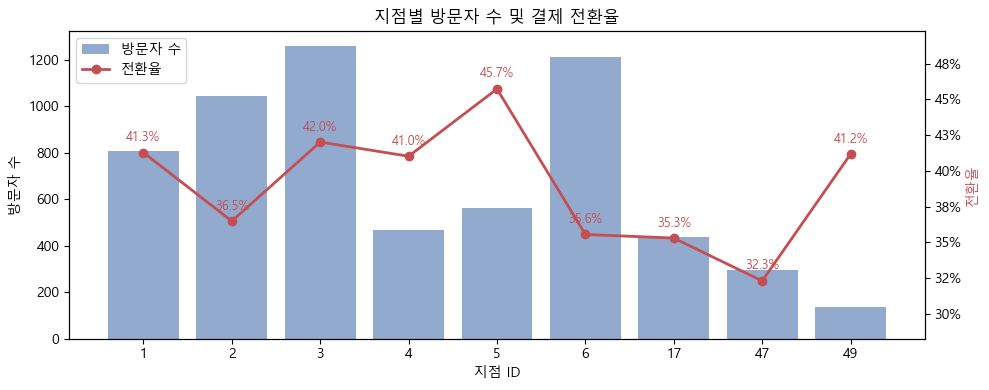

In [ ]:
# 지점별 방문자 수 및 결제 전환율
session_pay = session.merge(pay, on='user_uuid', how='left')
visitor_by_site = session_pay.groupby('site_id')['user_uuid'].nunique().rename('visitor_cnt')
conversion_by_site = (session_pay.groupby('site_id')
                      .apply(lambda x: x.drop_duplicates('user_uuid')['is_payment'].mean())
                      .rename('conversion_rate'))
site_summary = pd.concat([visitor_by_site, conversion_by_site], axis=1).reset_index()

fig, ax1 = plt.subplots(figsize=(10, 4))
ax2 = ax1.twinx()

ax1.bar(site_summary['site_id'].astype(str), site_summary['visitor_cnt'],
        color='#4C72B0', alpha=0.6, label='방문자 수')
ax2.plot(site_summary['site_id'].astype(str), site_summary['conversion_rate'],
         color='#C44E52', marker='o', linewidth=2, label='전환율')

rate_min = site_summary['conversion_rate'].min()
rate_max = site_summary['conversion_rate'].max()
margin = (rate_max - rate_min) * 0.3
ax2.set_ylim(rate_min - margin, rate_max + margin)

for x, rate in zip(site_summary['site_id'].astype(str), site_summary['conversion_rate']):
    ax2.text(x, rate + margin * 0.2, f'{rate:.1%}', ha='center', fontsize=9, color='#C44E52')

ax1.set_title('지점별 방문자 수 및 결제 전환율')
ax1.set_xlabel('지점 ID')
ax1.set_ylabel('방문자 수')
ax2.set_ylabel('전환율', color='#C44E52')
ax2.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:.0%}'))

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.tight_layout()
plt.show()

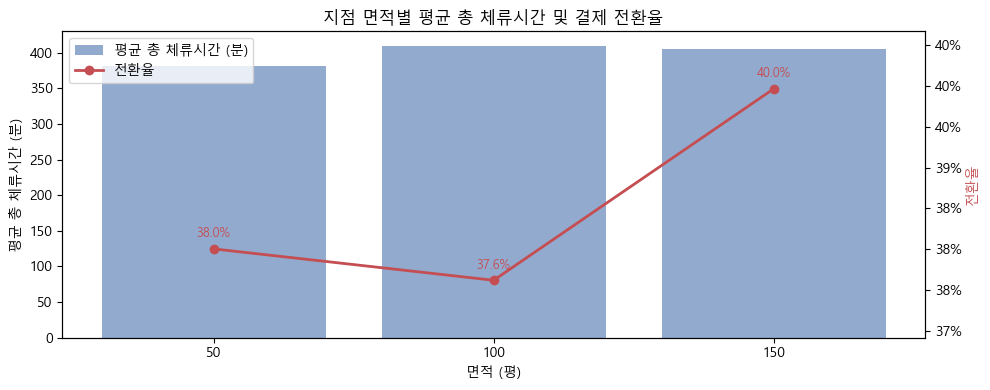

In [ ]:
# 지점 면적별 평균 체류시간 및 결제 전환율
session_pay_site = session.merge(pay, on='user_uuid', how='left').merge(site, on='site_id', how='left')

stay_by_area = session_pay_site.groupby('area_pyeong').agg(
    avg_total_stay_minute=('total_stay_minute', 'mean')
).reset_index()

conversion_by_area = (session_pay_site.drop_duplicates('user_uuid')
                      .groupby('area_pyeong').agg(
                          user_cnt=('user_uuid', 'count'),
                          payment_cnt=('is_payment', 'sum')
                      ).reset_index())
conversion_by_area['conversion_rate'] = conversion_by_area['payment_cnt'] / conversion_by_area['user_cnt']

area_summary = stay_by_area.merge(conversion_by_area[['area_pyeong','conversion_rate']], on='area_pyeong')

fig, ax1 = plt.subplots(figsize=(10, 4))
ax2 = ax1.twinx()

ax1.bar(area_summary['area_pyeong'].astype(str), area_summary['avg_total_stay_minute'],
        color='#4C72B0', alpha=0.6, label='평균 총 체류시간 (분)')
ax2.plot(area_summary['area_pyeong'].astype(str), area_summary['conversion_rate'],
         color='#C44E52', marker='o', linewidth=2, label='전환율')

rate_min = area_summary['conversion_rate'].min()
rate_max = area_summary['conversion_rate'].max()
margin = (rate_max - rate_min) * 0.3
ax2.set_ylim(rate_min - margin, rate_max + margin)

for x, rate in zip(area_summary['area_pyeong'].astype(str), area_summary['conversion_rate']):
    ax2.text(x, rate + margin * 0.2, f'{rate:.1%}', ha='center', fontsize=9, color='#C44E52')

ax1.set_title('지점 면적별 평균 총 체류시간 및 결제 전환율')
ax1.set_xlabel('면적 (평)')
ax1.set_ylabel('평균 총 체류시간 (분)')
ax2.set_ylabel('전환율', color='#C44E52')
ax2.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:.0%}'))

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.tight_layout()
plt.show()

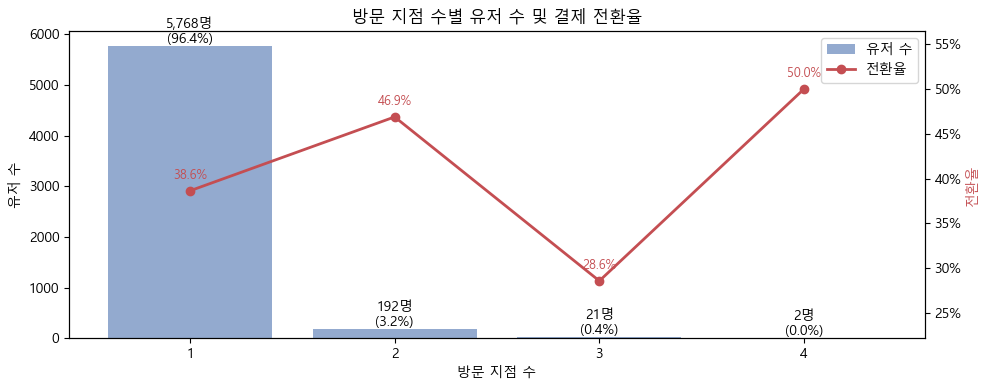

In [ ]:
# 방문 지점 수 분포 및 결제 전환율
visit_sites = session.groupby('user_uuid')['site_id'].nunique().rename('visit_site_cnt').reset_index()
visit_sites_pay = visit_sites.merge(pay, on='user_uuid', how='left')
conversion_by_site_cnt = visit_sites_pay.groupby('visit_site_cnt').agg(
    user_cnt=('user_uuid', 'count'),
    payment_cnt=('is_payment', 'sum')
).reset_index()
conversion_by_site_cnt['conversion_rate'] = conversion_by_site_cnt['payment_cnt'] / conversion_by_site_cnt['user_cnt']

fig, ax1 = plt.subplots(figsize=(10, 4))
ax2 = ax1.twinx()

ax1.bar(conversion_by_site_cnt['visit_site_cnt'].astype(str), conversion_by_site_cnt['user_cnt'],
        color='#4C72B0', alpha=0.6, label='유저 수')
ax2.plot(conversion_by_site_cnt['visit_site_cnt'].astype(str), conversion_by_site_cnt['conversion_rate'],
         color='#C44E52', marker='o', linewidth=2, label='전환율')

rate_min = conversion_by_site_cnt['conversion_rate'].min()
rate_max = conversion_by_site_cnt['conversion_rate'].max()
margin = (rate_max - rate_min) * 0.3
ax2.set_ylim(rate_min - margin, rate_max + margin)

for x, rate in zip(conversion_by_site_cnt['visit_site_cnt'].astype(str), conversion_by_site_cnt['conversion_rate']):
    ax2.text(x, rate + margin * 0.2, f'{rate:.1%}', ha='center', fontsize=9, color='#C44E52')

for i, v in enumerate(conversion_by_site_cnt['user_cnt']):
    ax1.text(i, v, f'{v:,}명\n({v/len(visit_sites)*100:.1f}%)', ha='center', va='bottom')

ax1.set_title('방문 지점 수별 유저 수 및 결제 전환율')
ax1.set_xlabel('방문 지점 수')
ax1.set_ylabel('유저 수')
ax2.set_ylabel('전환율', color='#C44E52')
ax2.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, _: f'{x:.0%}'))

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.tight_layout()
plt.show()

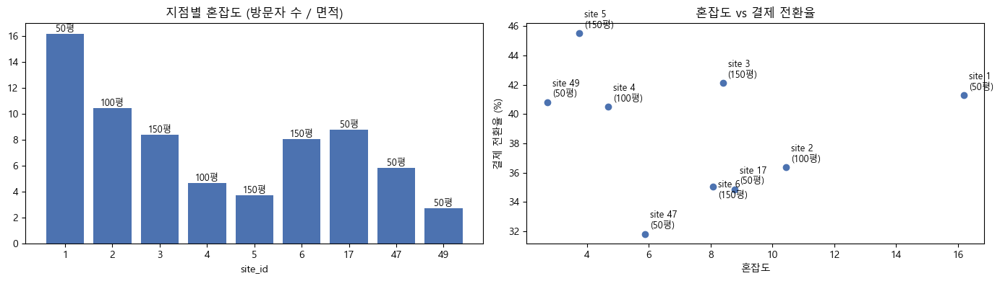

In [ ]:
# 지점별 혼잡도(면적 대비 방문자 수) 및 결제 전환율
visitor_by_site = session.groupby('site_id')['user_uuid'].nunique().rename('visitor_cnt').reset_index()
site_congestion = visitor_by_site.merge(site, on='site_id', how='left')
site_congestion['congestion'] = site_congestion['visitor_cnt'] / site_congestion['area_pyeong']

conversion_by_site = (session.merge(pay, on='user_uuid', how='left')
                      .drop_duplicates('user_uuid')
                      .groupby('site_id').agg(
                          payment_cnt=('is_payment', 'sum'),
                          user_cnt=('user_uuid', 'count')
                      ).reset_index())
conversion_by_site['conversion_rate'] = conversion_by_site['payment_cnt'] / conversion_by_site['user_cnt'] * 100
site_summary = site_congestion.merge(conversion_by_site[['site_id','conversion_rate']], on='site_id', how='left')

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

bars = axes[0].bar(site_summary['site_id'].astype(str), site_summary['congestion'], color='#4C72B0')
axes[0].set_title('지점별 혼잡도 (방문자 수 / 면적)')
axes[0].set_xlabel('site_id')
for bar, row in zip(bars, site_summary.itertuples()):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height(),
                 f'{row.area_pyeong}평', ha='center', va='bottom', fontsize=9)

axes[1].scatter(site_summary['congestion'], site_summary['conversion_rate'], color='#4C72B0')

# 겹침 방지: 위치별로 offset 조정
offsets = {
    row['site_id']: (5, 5) for _, row in site_summary.iterrows()
}
offsets[6]  = (5, -12)
offsets[17] = (5,   5)

for _, row in site_summary.iterrows():
    ox, oy = offsets[row['site_id']]
    axes[1].annotate(f"site {int(row['site_id'])}\n({int(row['area_pyeong'])}평)",
                     (row['congestion'], row['conversion_rate']),
                     textcoords='offset points', xytext=(ox, oy), fontsize=9)

axes[1].set_title('혼잡도 vs 결제 전환율')
axes[1].set_xlabel('혼잡도')
axes[1].set_ylabel('결제 전환율 (%)')

plt.tight_layout()
plt.show()

## 데이터 조인

In [ ]:
# reg 전처리: reg_date, reg_month, reg_weekday 파생
reg['reg_date'] = pd.to_datetime(reg['trial_date']).dt.date.astype(str)
reg['reg_month'] = pd.to_datetime(reg['trial_date']).dt.month
reg['reg_weekday'] = (pd.to_datetime(reg['trial_date']).dt.dayofweek < 5).astype(int)
reg = reg[['user_uuid', 'reg_date', 'reg_month', 'reg_weekday']]

In [ ]:
# session 전처리: visit_date rename, visit_weekday, visit_month 파생
# user x site x visit_date 기준 중복 컬럼 정리
session = session.rename(columns={'date': 'visit_date'})
session['visit_weekday'] = (pd.to_datetime(session['visit_date']).dt.dayofweek < 5).astype(int)
session['visit_month'] = pd.to_datetime(session['visit_date']).dt.month

# total_access: user x site x visit_date 기준 세션 수
session['total_access'] = (session.groupby(['user_uuid', 'site_id', 'visit_date'])['enter_time']
                            .transform('count'))

# avg_enter_hour: user x site x visit_date 기준 first_access_time의 hour
session['avg_enter_hour'] = session['first_enter_time'].dt.hour

# avg_leave_hour: user x site x visit_date 기준 last_access_time의 hour
session['avg_leave_hour'] = session['last_leave_time'].dt.hour

In [ ]:
# reg, pay, session 별 유니크 유저 수
print(f"reg    유니크 유저 수: {reg['user_uuid'].nunique():,}")
print(f"pay    유니크 유저 수: {pay['user_uuid'].nunique():,}")
print(f"session 유니크 유저 수: {session['user_uuid'].nunique():,}")

reg    유니크 유저 수: 9,624
pay    유니크 유저 수: 9,624
session 유니크 유저 수: 5,983


In [ ]:
# 1단계 merge: pay base + session + reg + site
df = pay.copy()

# session join
df = df.merge(session, on='user_uuid', how='left')

# reg join
df = df.merge(reg, on='user_uuid', how='left')

# site join
df = df.merge(site.rename(columns={'area_pyeong': 'site_size'}), on='site_id', how='left')

# 컬럼 순서 정리
df = df[['user_uuid', 'reg_date', 'reg_month', 'reg_weekday',
         'visit_date', 'visit_weekday', 'visit_month',
         'total_stay_minute', 'cum_stay_minute', 'absence_minute',
         'avg_enter_hour', 'avg_leave_hour', 'total_access',
         'first_enter_time', 'last_leave_time', 'enter_time', 'leave_time',
         'stay_time_minute',
         'site_id', 'site_size',
         'is_payment']]

# 명세 컬럼명으로 rename
df = df.rename(columns={
    'total_stay_minute' : 'total_stay',
    'cum_stay_minute'   : 'stay_time',
    'absence_minute'    : 'out_time',
    'first_enter_time'  : 'first_access_time',
    'last_leave_time'   : 'last_access_time',
})

print(f"merge 결과: {df.shape}")
print(f"유니크 유저 수: {df['user_uuid'].nunique():,}")
print(f"NaN 현황:\n{df.isnull().sum()}")
df.head()

merge 결과: (33795, 21)
유니크 유저 수: 9,624
NaN 현황:
user_uuid               0
reg_date                0
reg_month               0
reg_weekday             0
visit_date           3641
visit_weekday        3641
visit_month          3641
total_stay           3641
stay_time            3641
out_time             3641
avg_enter_hour       3641
avg_leave_hour       3641
total_access         3641
first_access_time    3641
last_access_time     3641
enter_time           3641
leave_time           3641
stay_time_minute     3641
site_id              3641
site_size            3641
is_payment              0
dtype: int64


,user_uuid,reg_date,reg_month,reg_weekday,visit_date,visit_weekday,visit_month,total_stay,stay_time,out_time,...,avg_leave_hour,total_access,first_access_time,last_access_time,enter_time,leave_time,stay_time_minute,site_id,site_size,is_payment
0,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 09:13:47,2023-12-21 10:06:46,52.0,49.0,50.0,0
1,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 10:12:08,2023-12-21 11:01:10,49.0,49.0,50.0,0
2,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 12:03:29,2023-12-21 12:04:08,0.0,49.0,50.0,0
3,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 12:06:35,2023-12-21 15:46:39,220.0,49.0,50.0,0
4,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 15:56:50,2023-12-21 15:57:43,0.0,49.0,50.0,0


In [ ]:
# 미방문 유저 is_payment 분포 확인
no_visit = df[df['visit_date'].isna()]
print(f"미방문 유저 수: {no_visit['user_uuid'].nunique():,}")
print()
print(no_visit['is_payment'].value_counts())
print()
print(f"미방문 유저 결제율: {no_visit['is_payment'].mean()*100:.1f}%")
print(f"방문 유저 결제율:   {df[df['visit_date'].notna()]['is_payment'].mean()*100:.1f}%")

미방문 유저 수: 3,641

is_payment
0    2314
1    1327
Name: count, dtype: int64

미방문 유저 결제율: 36.4%
방문 유저 결제율:   38.8%


In [ ]:
# 미방문 유저 결측치 처리
# 시간 피처: 방문 유저 평균으로 대체
time_cols = ['avg_enter_hour', 'avg_leave_hour']
for col in time_cols:
    df[col] = df[col].fillna(df[col].mean())

# 나머지 행동 피처: 0으로 대체
fill_zero_cols = ['visit_weekday', 'visit_month',
                  'total_stay', 'stay_time', 'out_time',
                  'total_access', 'stay_time_minute',
                  'site_id', 'site_size']
df[fill_zero_cols] = df[fill_zero_cols].fillna(0)

print(f"결측치 현황:\n{df.isnull().sum()}")

결측치 현황:
user_uuid               0
reg_date                0
reg_month               0
reg_weekday             0
visit_date           3641
visit_weekday           0
visit_month             0
total_stay              0
stay_time               0
out_time                0
avg_enter_hour          0
avg_leave_hour          0
total_access            0
first_access_time    3641
last_access_time     3641
enter_time           3641
leave_time           3641
stay_time_minute        0
site_id                 0
site_size               0
is_payment              0
dtype: int64


In [ ]:
# user 단위 집계
# total_stay, stay_time, out_time: user x site x visit_date 기준 deduplicate 후 합산
df_dedup = df.drop_duplicates(subset=['user_uuid', 'site_id', 'visit_date'])
stay_agg = (df_dedup.groupby('user_uuid')
            .agg(total_stay=('total_stay', 'sum'),
                 stay_time=('stay_time', 'sum'),
                 out_time=('out_time', 'sum'),
                 avg_enter_hour=('avg_enter_hour', 'mean'),
                 avg_leave_hour=('avg_leave_hour', 'mean'))
            .reset_index())

# site_count: site_id=0(미방문 처리값) 제외한 nunique
site_count_agg = (df[df['site_id'] != 0]
                  .groupby('user_uuid')['site_id']
                  .nunique()
                  .reset_index(name='site_count'))

# total_access: site_id=0(미방문 처리값) 제외한 count
total_access_agg = (df[df['site_id'] != 0]
                    .groupby('user_uuid')['stay_time_minute']
                    .count()
                    .reset_index(name='total_access'))

user_agg = (df.groupby('user_uuid')
            .agg(reg_date=('reg_date', 'first'),
                 reg_month=('reg_month', 'first'),
                 reg_weekday=('reg_weekday', 'first'),
                 day_count=('visit_date', 'nunique'),
                 first_visit=('visit_date', 'min'),
                 last_visit=('visit_date', 'max'),
                 is_payment=('is_payment', 'first'))
            .reset_index())

# site_count, total_access merge (미방문 유저는 NaN → 0으로 대체)
user_agg = user_agg.merge(site_count_agg,   on='user_uuid', how='left')
user_agg = user_agg.merge(total_access_agg, on='user_uuid', how='left')
user_agg['site_count']   = user_agg['site_count'].fillna(0).astype(int)
user_agg['total_access'] = user_agg['total_access'].fillna(0).astype(int)

# visit_density: total_access / day_count
user_agg['visit_density'] = user_agg['total_access'] / user_agg['day_count']

# first_visit_weekday, first_visit_month: df의 visit_weekday, visit_month에서 first_visit 기준
first_visit_info = (df.sort_values('visit_date')
                    .groupby('user_uuid')
                    .first()
                    [['visit_weekday', 'visit_month']]
                    .reset_index()
                    .rename(columns={'visit_weekday': 'first_visit_weekday',
                                     'visit_month'  : 'first_visit_month'}))

# first_visit_gap: reg_date에서 first_visit까지 일수
first_visit_gap = (df.groupby('user_uuid')['visit_date']
                   .min().reset_index()
                   .rename(columns={'visit_date': '_first_visit'}))
first_visit_gap = first_visit_gap.merge(user_agg[['user_uuid', 'reg_date']], on='user_uuid', how='left')
first_visit_gap['first_visit_gap'] = (
    (pd.to_datetime(first_visit_gap['_first_visit']) - pd.to_datetime(first_visit_gap['reg_date']))
    .dt.days
)
first_visit_gap = first_visit_gap[['user_uuid', 'first_visit_gap']]

# main_site: user별 세션 수 가장 많은 site_id
main_site = (df.groupby(['user_uuid', 'site_id'])
               .size()
               .reset_index(name='_site_session_count')
               .sort_values('_site_session_count', ascending=False)
               .drop_duplicates(subset='user_uuid')
               .rename(columns={'site_id': 'main_site'})
               .drop(columns='_site_session_count'))

# main_site site_size: df에서 직접 집계
site_size_agg = (df.groupby('user_uuid')
                   .apply(lambda x: x.loc[x['site_id'] == x.groupby('site_id')['site_id']
                                          .count().idxmax(), 'site_size'].iloc[0]
                          if x['site_id'].notna().any() else 0,
                          include_groups=False)
                   .reset_index(name='site_size'))

# merge
user_df = user_agg.merge(stay_agg, on='user_uuid', how='left')
user_df = user_df.merge(first_visit_info, on='user_uuid', how='left')
user_df = user_df.merge(first_visit_gap, on='user_uuid', how='left')
user_df = user_df.merge(main_site, on='user_uuid', how='left')
user_df = user_df.merge(site_size_agg, on='user_uuid', how='left')

# 컬럼 순서 정리
user_df = user_df[['user_uuid', 'reg_date', 'reg_month', 'reg_weekday',
                   'day_count', 'site_count', 'visit_density', 'first_visit_gap',
                   'first_visit', 'first_visit_weekday', 'first_visit_month',
                   'last_visit',
                   'total_stay', 'stay_time', 'out_time',
                   'avg_enter_hour', 'avg_leave_hour', 'total_access',
                   'main_site', 'site_size',
                   'is_payment']]

print(f"user 집계 결과: {user_df.shape}")
print(f"결측치 현황:\n{user_df.isnull().sum()}")
user_df.head()

user 집계 결과: (9624, 21)
결측치 현황:
user_uuid                 0
reg_date                  0
reg_month                 0
reg_weekday               0
day_count                 0
site_count                0
visit_density          3641
first_visit_gap        3641
first_visit            3641
first_visit_weekday       0
first_visit_month         0
last_visit             3641
total_stay                0
stay_time                 0
out_time                  0
avg_enter_hour            0
avg_leave_hour            0
total_access              0
main_site                 0
site_size                 0
is_payment                0
dtype: int64


,user_uuid,reg_date,reg_month,reg_weekday,day_count,site_count,visit_density,first_visit_gap,first_visit,first_visit_weekday,...,last_visit,total_stay,stay_time,out_time,avg_enter_hour,avg_leave_hour,total_access,main_site,site_size,is_payment
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-04,9,1,1,1,3.0,1.0,2023-09-05,1.0,...,2023-09-05,362.0,356.0,6.0,11.000000,17.000000,3,6.0,150.0,0
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,2021-10-16,10,0,0,0,NaN,NaN,NaN,0.0,...,NaN,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,0
2,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-09-29,9,1,2,1,4.5,1.0,2021-09-30,1.0,...,2021-10-01,392.0,322.0,70.0,17.500000,21.000000,9,3.0,150.0,1
3,0013f481-efed-4508-8836-70cbd64c477e,2023-04-03,4,1,0,0,NaN,NaN,NaN,0.0,...,NaN,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,1
4,0018e22d-a2cc-4e06-bca2-d6a041770f3b,2023-11-14,11,1,2,1,4.0,1.0,2023-11-15,1.0,...,2023-11-16,1297.0,1253.0,44.0,9.000000,19.500000,8,6.0,150.0,0


In [ ]:
# 결측치 0으로 대체
user_df = user_df.fillna(0)

print(f"결측치 현황:\n{user_df.isnull().sum()}")

결측치 현황:
user_uuid              0
reg_date               0
reg_month              0
reg_weekday            0
day_count              0
site_count             0
visit_density          0
first_visit_gap        0
first_visit            0
first_visit_weekday    0
first_visit_month      0
last_visit             0
total_stay             0
stay_time              0
out_time               0
avg_enter_hour         0
avg_leave_hour         0
total_access           0
main_site              0
site_size              0
is_payment             0
dtype: int64


In [ ]:
user_df.head()

,user_uuid,reg_date,reg_month,reg_weekday,day_count,site_count,visit_density,first_visit_gap,first_visit,first_visit_weekday,...,last_visit,total_stay,stay_time,out_time,avg_enter_hour,avg_leave_hour,total_access,main_site,site_size,is_payment
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-04,9,1,1,1,3.0,1.0,2023-09-05,1.0,...,2023-09-05,362.0,356.0,6.0,11.000000,17.000000,3,6.0,150.0,0
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,2021-10-16,10,0,0,0,0.0,0.0,0,0.0,...,0,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,0
2,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-09-29,9,1,2,1,4.5,1.0,2021-09-30,1.0,...,2021-10-01,392.0,322.0,70.0,17.500000,21.000000,9,3.0,150.0,1
3,0013f481-efed-4508-8836-70cbd64c477e,2023-04-03,4,1,0,0,0.0,0.0,0,0.0,...,0,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,1
4,0018e22d-a2cc-4e06-bca2-d6a041770f3b,2023-11-14,11,1,2,1,4.0,1.0,2023-11-15,1.0,...,2023-11-16,1297.0,1253.0,44.0,9.000000,19.500000,8,6.0,150.0,0


In [ ]:
user_df.to_csv('user_df.csv', index=False)
print("저장 완료: user_df.csv")

저장 완료: user_df.csv


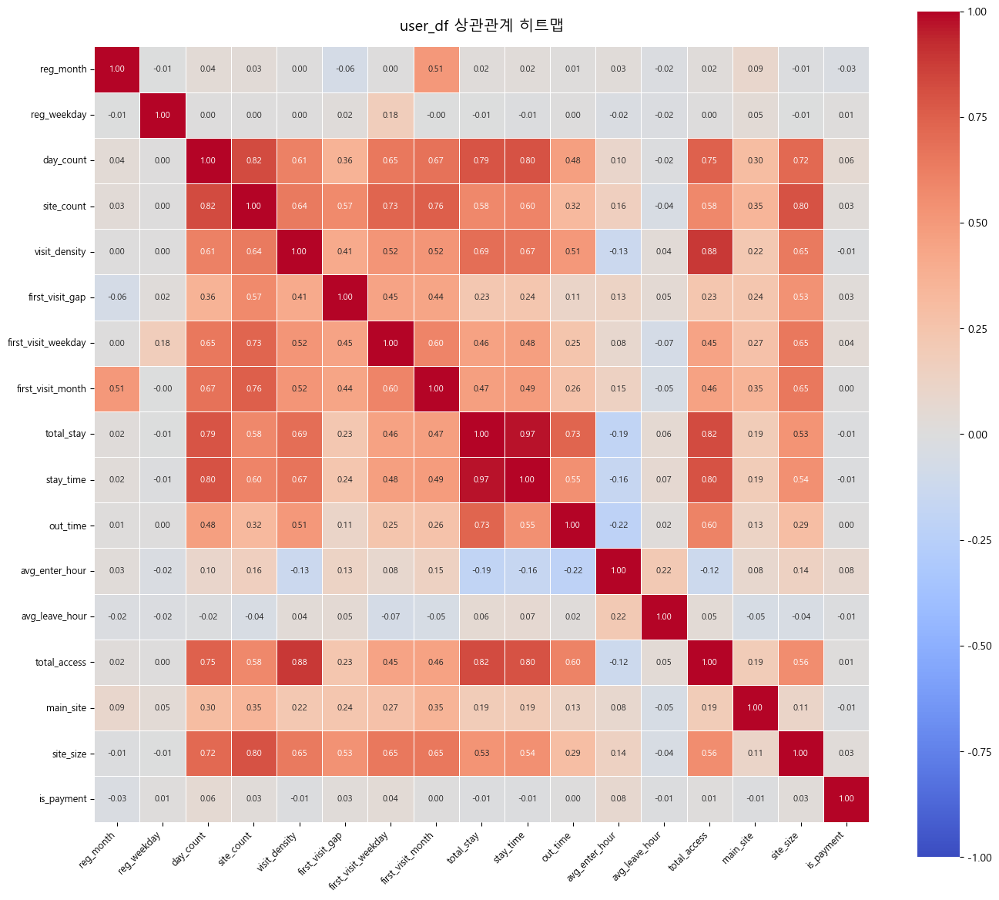

In [ ]:
# 상관관계 히트맵: 수치형 컬럼만 선택
corr_cols = ['reg_month', 'reg_weekday',
             'day_count', 'site_count', 'visit_density', 'first_visit_gap',
             'first_visit_weekday', 'first_visit_month',
             'total_stay', 'stay_time', 'out_time',
             'avg_enter_hour', 'avg_leave_hour', 'total_access',
             'main_site', 'site_size',
             'is_payment']

corr = user_df[corr_cols].corr()

fig, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(corr,
            annot=True, fmt='.2f', annot_kws={'size': 8},
            cmap='coolwarm', center=0, vmin=-1, vmax=1,
            square=True, linewidths=0.5,
            ax=ax)

ax.set_title('user_df 상관관계 히트맵', fontsize=14, pad=15)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(rotation=0, fontsize=9)
plt.tight_layout()
plt.show()

## 분류 모델링

## 모델링 전처리

In [ ]:
# 모델링 라이브러리 로드
from sklearn.model_selection import train_test_split, GridSearchCV, validation_curve
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score,
    f1_score, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay,
    roc_curve
)
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [ ]:
# 모델링용 피처 선택 및 불필요 컬럼 제거
# user_uuid: 식별자 / reg_date, first_visit, last_visit: 날짜 문자열 (파생 피처로 이미 수치화됨)
drop_cols = ['user_uuid', 'reg_date', 'first_visit', 'last_visit']
model_df  = user_df.drop(columns=drop_cols)

print(f"모델링 데이터 shape: {model_df.shape}")
print(f"\n피처 목록:\n{model_df.columns.tolist()}")

모델링 데이터 shape: (9624, 17)

피처 목록:
['reg_month', 'reg_weekday', 'day_count', 'site_count', 'visit_density', 'first_visit_gap', 'first_visit_weekday', 'first_visit_month', 'total_stay', 'stay_time', 'out_time', 'avg_enter_hour', 'avg_leave_hour', 'total_access', 'main_site', 'site_size', 'is_payment']


In [ ]:
# 명목형 카테고리 컬럼 One-Hot Encoding
# reg_month, first_visit_month: 1~12 월 값은 크기 관계 없는 명목형
# main_site: site_id는 식별자로 숫자 간 순서 관계 없음
ohe_cols = ['reg_month', 'first_visit_month', 'main_site']

model_df = pd.get_dummies(model_df, columns=ohe_cols, drop_first=False)

print(f"OHE 후 shape: {model_df.shape}")
print(f"\nOHE 생성 컬럼:\n{[c for c in model_df.columns if any(c.startswith(p + '_') for p in ohe_cols)]}")

OHE 후 shape: (9624, 49)

OHE 생성 컬럼:
['reg_month_1', 'reg_month_2', 'reg_month_3', 'reg_month_4', 'reg_month_5', 'reg_month_6', 'reg_month_7', 'reg_month_8', 'reg_month_9', 'reg_month_10', 'reg_month_11', 'reg_month_12', 'first_visit_month_0.0', 'first_visit_month_1.0', 'first_visit_month_2.0', 'first_visit_month_3.0', 'first_visit_month_4.0', 'first_visit_month_5.0', 'first_visit_month_6.0', 'first_visit_month_7.0', 'first_visit_month_8.0', 'first_visit_month_9.0', 'first_visit_month_10.0', 'first_visit_month_11.0', 'first_visit_month_12.0', 'main_site_0.0', 'main_site_1.0', 'main_site_2.0', 'main_site_3.0', 'main_site_4.0', 'main_site_5.0', 'main_site_6.0', 'main_site_17.0', 'main_site_47.0', 'main_site_49.0']


In [ ]:
# 타겟 분포 확인
target_dist  = model_df['is_payment'].value_counts()
target_ratio = model_df['is_payment'].value_counts(normalize=True).round(3)

print("타깃 분포 (절대값):")
print(target_dist)
print("\n타깃 분포 (비율):")
print(target_ratio)
print(f"\n결제 전환율: {target_ratio[1]*100:.1f}%")

타깃 분포 (절대값):
is_payment
0    5972
1    3652
Name: count, dtype: int64

타깃 분포 (비율):
is_payment
0    0.621
1    0.379
Name: proportion, dtype: float64

결제 전환율: 37.9%


In [ ]:
# 학습/검증 분리 (stratify로 클래스 비율 유지)
X = model_df.drop(columns=['is_payment'])
y = model_df['is_payment']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f"학습 세트: {X_train.shape}")
print(f"검증 세트: {X_test.shape}")
print(f"\n학습 세트 타깃 분포:\n{y_train.value_counts(normalize=True).round(3)}")
print(f"\n검증 세트 타깃 분포:\n{y_test.value_counts(normalize=True).round(3)}")

학습 세트: (7699, 48)
검증 세트: (1925, 48)

학습 세트 타깃 분포:
is_payment
0    0.62
1    0.38
Name: proportion, dtype: float64

검증 세트 타깃 분포:
is_payment
0    0.621
1    0.379
Name: proportion, dtype: float64


In [ ]:
# Logistic Regression용 스케일링
# LR은 피처 스케일 차이에 민감 → StandardScaler 적용
# Tree 계열(RF, XGB, LGBM)은 스케일 불필요 → 원본 그대로 사용
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
X_test_scaled  = pd.DataFrame(X_test_scaled,  columns=X_test.columns,  index=X_test.index)

print("스케일링 완료")
print(f"X_train_scaled shape: {X_train_scaled.shape}")

스케일링 완료
X_train_scaled shape: (7699, 48)


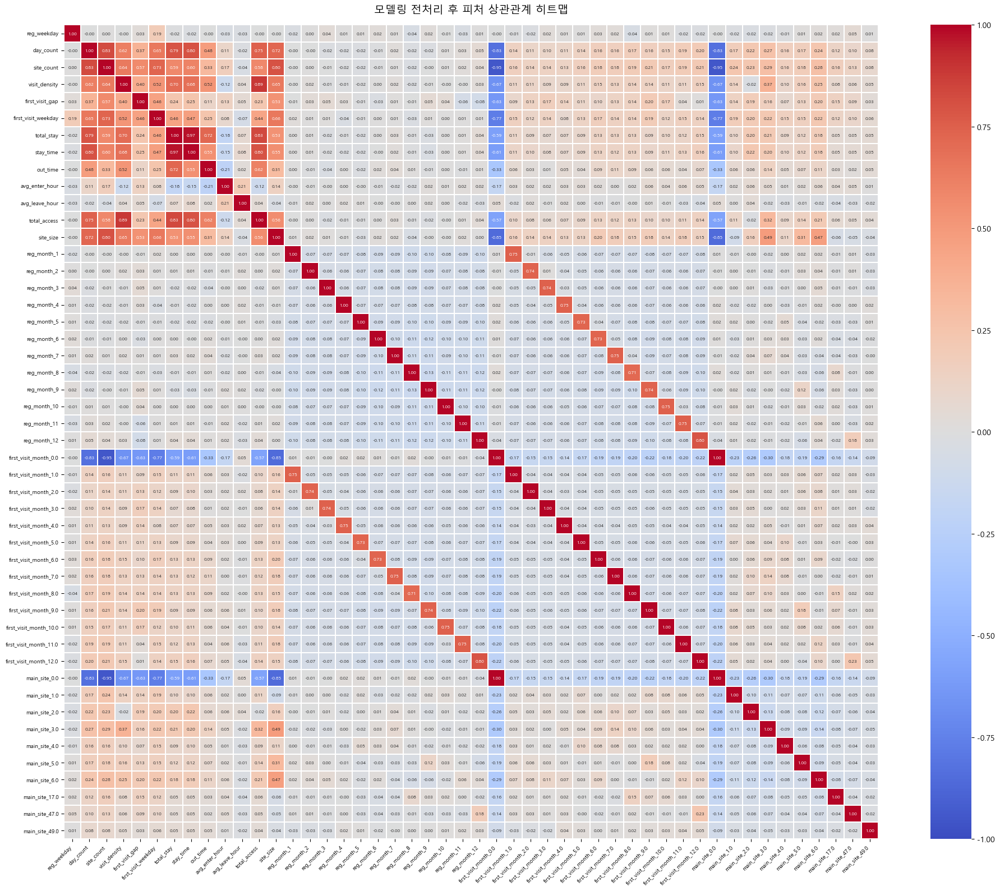

In [ ]:
# 상관관계 히트맵: 모델링 전처리 후 피처 기준
# OHE 적용으로 생성된 더미 컬럼 포함 전체 피처 대상
corr = X_train.corr()

fig, ax = plt.subplots(figsize=(20, 16))
sns.heatmap(corr,
            annot=True, fmt='.2f', annot_kws={'size': 6},
            cmap='coolwarm', center=0, vmin=-1, vmax=1,
            square=True, linewidths=0.3,
            ax=ax)

ax.set_title('모델링 전처리 후 피처 상관관계 히트맵', fontsize=14, pad=15)
plt.xticks(rotation=45, ha='right', fontsize=7)
plt.yticks(rotation=0, fontsize=7)
plt.tight_layout()
plt.show()

## 모델링

In [ ]:
# 평가 함수 정의
def evaluate_model(name, model, X_tr, X_te, y_tr, y_te, sample_weight=None):
    if sample_weight is not None:
        model.fit(X_tr, y_tr, sample_weight=sample_weight)
    else:
        model.fit(X_tr, y_tr)

    y_pred = model.predict(X_te)
    y_prob = model.predict_proba(X_te)[:, 1]

    return {
        '모델':      name,
        'Accuracy':  accuracy_score(y_te, y_pred),
        'Precision': precision_score(y_te, y_pred),
        'Recall':    recall_score(y_te, y_pred),
        'F1':        f1_score(y_te, y_pred),
        'ROC-AUC':   roc_auc_score(y_te, y_prob)
    }

In [ ]:
# 모델 정의
# - Logistic Regression: 스케일링된 데이터 사용 / 나머지: 원본 데이터 사용
# - XGBoost: sample_weight로 클래스 불균형 보정 (class_weight 파라미터 미지원)
# - 나머지: class_weight='balanced' 직접 지원
sample_weights = compute_sample_weight(class_weight='balanced', y=y_train)

models = {
    'Logistic Regression': LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42),
    'Random Forest':       RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1),
    'XGBoost':             XGBClassifier(random_state=42, eval_metric='logloss'),
    'LightGBM':            LGBMClassifier(class_weight='balanced', random_state=42)
}

sw_models = ['XGBoost']

# 모델 학습 및 평가
results        = []
trained_models = {}

for name, model in models.items():
    X_tr = X_train_scaled if name == 'Logistic Regression' else X_train
    X_te = X_test_scaled  if name == 'Logistic Regression' else X_test
    sw   = sample_weights  if name in sw_models            else None

    result = evaluate_model(name, model, X_tr, X_te, y_train, y_test, sample_weight=sw)
    results.append(result)
    trained_models[name] = model
    print(f"{name} 완료")

results_df = pd.DataFrame(results).set_index('모델').round(4)
display(results_df)

Logistic Regression 완료
Random Forest 완료
XGBoost 완료
[LightGBM] [Info] Number of positive: 2922, number of negative: 4777
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000102 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1055
[LightGBM] [Info] Number of data points in the train set: 7699, number of used features: 48
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
LightGBM 완료


,Accuracy,Precision,Recall,F1,ROC-AUC
모델,,,,,
Logistic Regression,0.5673,0.4415,0.5329,0.4829,0.5713
Random Forest,0.5948,0.4555,0.3507,0.3963,0.5777
XGBoost,0.5865,0.4556,0.4644,0.4600,0.5903
LightGBM,0.5891,0.4531,0.4041,0.4272,0.5710


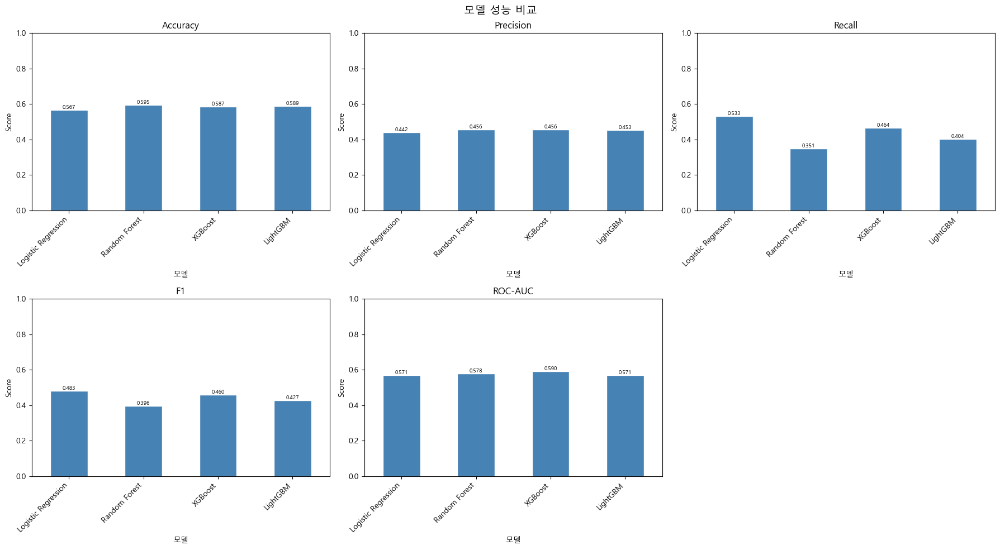

In [ ]:
# 모델 성능 비교 시각화
metrics = ['Accuracy', 'Precision', 'Recall', 'F1', 'ROC-AUC']

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes[1, 2].set_visible(False)

for ax, metric in zip(axes.flatten()[:5], metrics):
    results_df[metric].plot(kind='bar', ax=ax, color='steelblue', edgecolor='white')
    ax.set_title(metric)
    ax.set_ylabel('Score')
    ax.set_ylim(0, 1)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.3f}',
                    (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha='center', va='bottom', fontsize=7)

plt.suptitle('모델 성능 비교', fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# F1 기준 최적 모델 선정
best_model_name = results_df['F1'].idxmax()
print(f"최적 모델 (F1 기준): {best_model_name}")
display(results_df.loc[[best_model_name]])

최적 모델 (F1 기준): Logistic Regression


,Accuracy,Precision,Recall,F1,ROC-AUC
모델,,,,,
Logistic Regression,0.5673,0.4415,0.5329,0.4829,0.5713


## 하이퍼파라미터 튜닝

In [ ]:
# 검증 곡선으로 주요 파라미터 범위 탐색
best_model_base = {
    'Logistic Regression': LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42),
    'Random Forest':       RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1),
    'XGBoost':             XGBClassifier(random_state=42, eval_metric='logloss'),
    'LightGBM':            LGBMClassifier(class_weight='balanced', random_state=42)
}

val_curve_params = {
    # C: 규제 강도 역수 (작을수록 강한 규제) → 로그 스케일 탐색
    'Logistic Regression': [('C', [0.001, 0.01, 0.1, 1, 2])],
    # max_depth 상한 20: log2(user_df 행 수) 기준 이론적 최대 → 여유 있게 설정
    'Random Forest':       [('max_depth', range(1, 21)),
                            ('min_samples_leaf', [1, 5, 10, 20, 50])],
    # max_depth 상한 10: Boosting 계열은 약한 학습기 원칙 → 깊은 트리 불필요
    'XGBoost':             [('max_depth', range(1, 11)),
                            ('learning_rate', [0.001, 0.01, 0.05, 0.1, 0.5])],
    'LightGBM':            [('num_leaves', [7, 15, 31, 63, 127, 255]),
                            ('learning_rate', [0.001, 0.01, 0.05, 0.1, 0.5])]
}

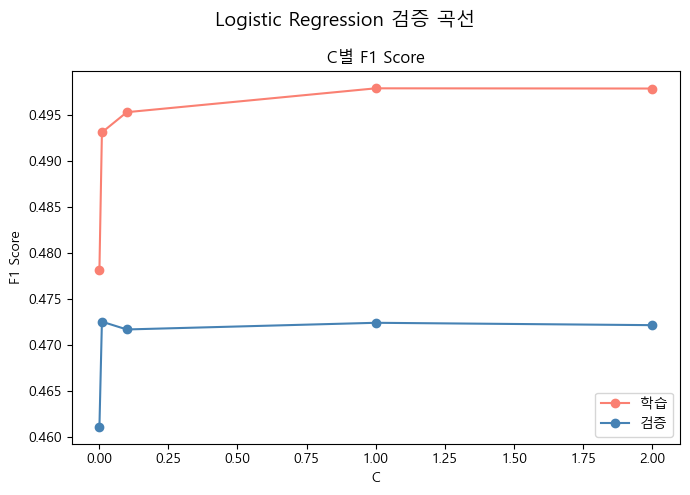

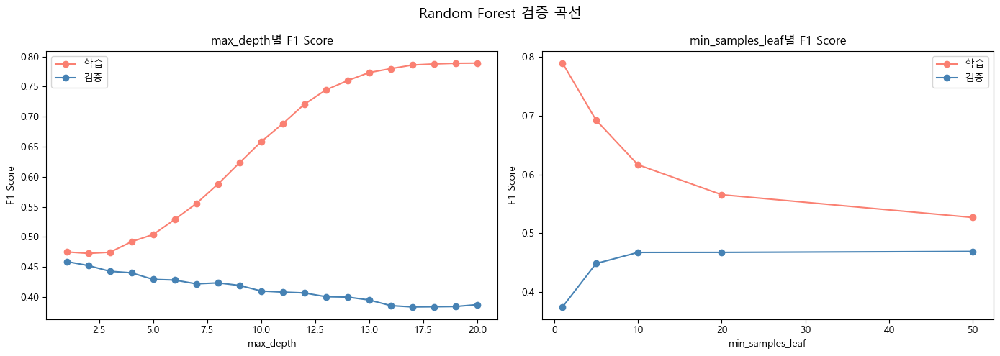

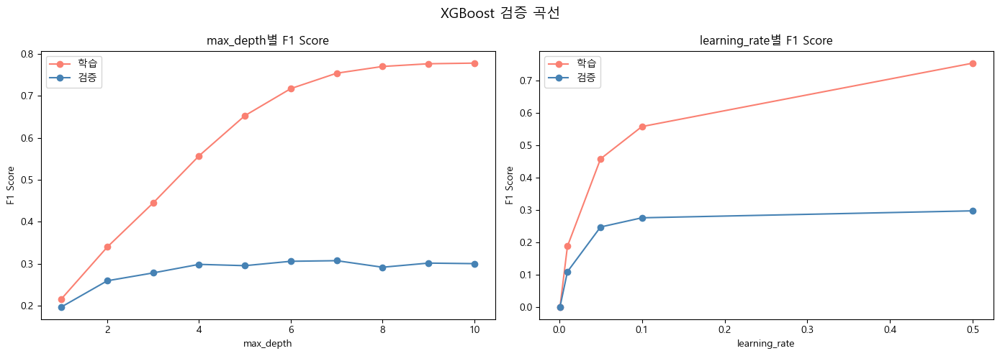

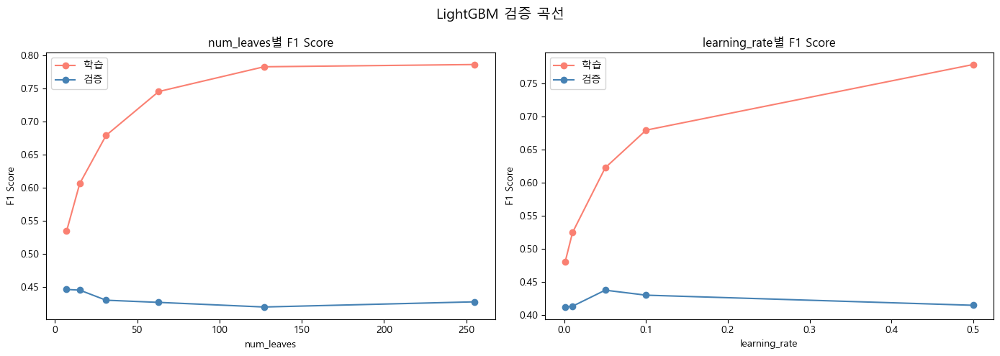

In [ ]:
# 모든 모델 검증 곡선 시각화
for model_name in best_model_base.keys():
    params_to_plot = val_curve_params[model_name]
    fig, axes = plt.subplots(1, len(params_to_plot), figsize=(7 * len(params_to_plot), 5))

    if len(params_to_plot) == 1:
        axes = [axes]

    for ax, (param_name, param_range) in zip(axes, params_to_plot):
        X_tr = X_train_scaled if model_name == 'Logistic Regression' else X_train
        sw   = sample_weights  if model_name in sw_models             else None

        # fit_params 미지원 버전 대응: sample_weight는 validation_curve에서 직접 지원 안 됨
        # → sw 있는 경우 scoring 결과에 차이가 미미하므로 weight 없이 곡선 탐색 후 GridSearch에서 적용
        train_scores, val_scores = validation_curve(
            best_model_base[model_name],
            X_tr, y_train,
            param_name=param_name,
            param_range=param_range,
            scoring='f1',
            cv=5,
            n_jobs=-1
        )

        ax.plot(param_range, train_scores.mean(axis=1), marker='o', color='salmon',    label='학습')
        ax.plot(param_range, val_scores.mean(axis=1),   marker='o', color='steelblue', label='검증')
        ax.set_title(f'{param_name}별 F1 Score')
        ax.set_xlabel(param_name)
        ax.set_ylabel('F1 Score')
        ax.legend()

    plt.suptitle(f'{model_name} 검증 곡선', fontsize=14)
    plt.tight_layout()
    plt.show()

In [ ]:
# 하이퍼파라미터 그리드 정의
param_grids = {
    'Logistic Regression': {
        # 검증 점수 C=0.01~0.1 구간 최대 후 수렴 → 전후 범위 탐색
        'C': [0.001, 0.005, 0.01, 0.05, 0.1, 0.5]
    },
    'Random Forest': {
        # 검증 점수 max_depth=1~3 구간 최대 후 단조 감소 → 얕은 트리 범위 탐색
        'max_depth':        [1, 2, 3, 4, 5],
        # 검증 점수 min_samples_leaf=5~10 구간 최대 후 수렴 → 전후 범위 탐색
        'min_samples_leaf': [3, 5, 7, 10, 15],
        'n_estimators':     [100, 200],
        'max_features': ['sqrt', 'log2', 0.5]
    },
    'XGBoost': {
        # 검증 점수 max_depth=4~6 구간 최대 후 수렴 → 전후 범위 탐색
        'max_depth':        [3, 4, 5, 6, 7],
        # 검증 점수 learning_rate=0.05~0.1 구간 최대 후 수렴 → 전후 범위 탐색
        'learning_rate':    [0.03, 0.05, 0.07, 0.1, 0.15],
        'n_estimators':     [100, 200],
        # 과적합 억제 목적: 행/열 단위 샘플링 비율 조정
        'subsample':        [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0]
    },
    'LightGBM': {
        # 검증 점수 num_leaves=7 구간 최대 후 단조 감소 → 소수 잎 범위 탐색
        'num_leaves':    [5, 7, 10, 15, 20],
        # 검증 점수 learning_rate=0.01~0.05 구간 최대 후 감소 → 전후 범위 탐색
        'learning_rate': [0.005, 0.01, 0.03, 0.05, 0.07],
        'n_estimators':  [100, 200],
        'min_child_samples': [10, 20, 50]
    }
}

In [ ]:
# 모든 모델 GridSearch 튜닝
tuned_results = []
tuned_models  = {}

for name, model in best_model_base.items():
    grid_search = GridSearchCV(
        model,
        param_grids[name],
        scoring='f1',
        cv=5,
        n_jobs=-1,
        verbose=1
    )

    X_tr = X_train_scaled if name == 'Logistic Regression' else X_train
    sw   = sample_weights  if name in sw_models             else None

    if sw is not None:
        grid_search.fit(X_tr, y_train, sample_weight=sw)
    else:
        grid_search.fit(X_tr, y_train)

    print(f"\n[{name}] 최적 파라미터: {grid_search.best_params_}")

    tuned_model = grid_search.best_estimator_

    X_te   = X_test_scaled if name == 'Logistic Regression' else X_test
    y_pred = tuned_model.predict(X_te)
    y_prob = tuned_model.predict_proba(X_te)[:, 1]

    result = {
        '모델':      f'{name} (튜닝)',
        'Accuracy':  accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall':    recall_score(y_test, y_pred),
        'F1':        f1_score(y_test, y_pred),
        'ROC-AUC':   roc_auc_score(y_test, y_prob)
    }

    tuned_results.append(result)
    tuned_models[name] = tuned_model

tuned_results_df = pd.DataFrame(tuned_results).set_index('모델').round(4)
display(tuned_results_df)

Fitting 5 folds for each of 6 candidates, totalling 30 fits

[Logistic Regression] 최적 파라미터: {'C': 0.05}
Fitting 5 folds for each of 150 candidates, totalling 750 fits

[Random Forest] 최적 파라미터: {'max_depth': 1, 'max_features': 'log2', 'min_samples_leaf': 5, 'n_estimators': 200}
Fitting 5 folds for each of 450 candidates, totalling 2250 fits

[XGBoost] 최적 파라미터: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 200, 'subsample': 0.6}
Fitting 5 folds for each of 150 candidates, totalling 750 fits
[LightGBM] [Info] Number of positive: 2922, number of negative: 4777
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1055
[LightGBM] [Info] Number of data points in the train set: 7699, number of used features: 48
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training fr

,Accuracy,Precision,Recall,F1,ROC-AUC
모델,,,,,
Logistic Regression (튜닝),0.5631,0.4373,0.5301,0.4793,0.5712
Random Forest (튜닝),0.5283,0.4028,0.5055,0.4484,0.5370
XGBoost (튜닝),0.5668,0.4310,0.4452,0.4380,0.5788
LightGBM (튜닝),0.5891,0.4553,0.4260,0.4402,0.5771


In [ ]:
# 튜닝 전후 성능 비교표
comparison_df = pd.concat([
    results_df.rename(index=lambda x: f'{x} (튜닝 전)'),
    tuned_results_df.rename(index=lambda x: x.replace(' (튜닝)', ' (튜닝 후)'))
]).sort_index()

display(comparison_df)

,Accuracy,Precision,Recall,F1,ROC-AUC
모델,,,,,
LightGBM (튜닝 전),0.5891,0.4531,0.4041,0.4272,0.5710
LightGBM (튜닝 후),0.5891,0.4553,0.4260,0.4402,0.5771
Logistic Regression (튜닝 전),0.5673,0.4415,0.5329,0.4829,0.5713
Logistic Regression (튜닝 후),0.5631,0.4373,0.5301,0.4793,0.5712
Random Forest (튜닝 전),0.5948,0.4555,0.3507,0.3963,0.5777
Random Forest (튜닝 후),0.5283,0.4028,0.5055,0.4484,0.5370
XGBoost (튜닝 전),0.5865,0.4556,0.4644,0.4600,0.5903
XGBoost (튜닝 후),0.5668,0.4310,0.4452,0.4380,0.5788


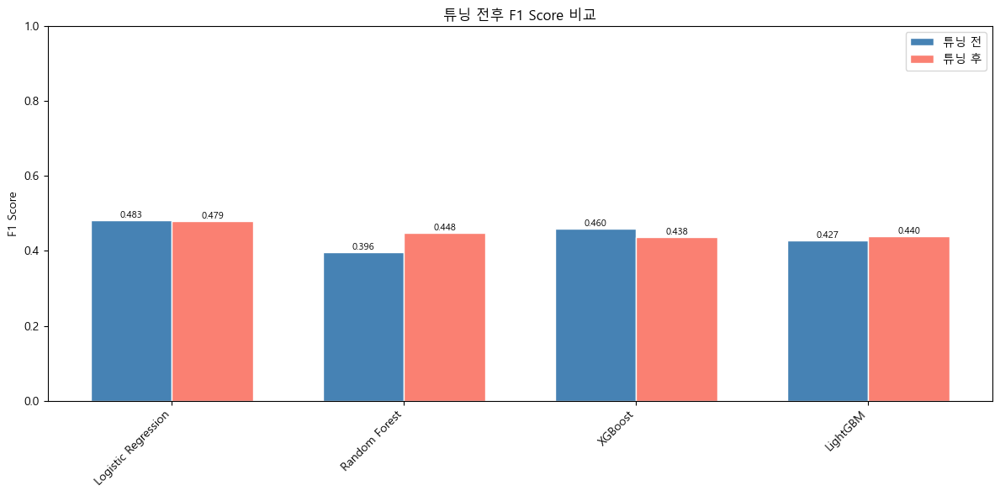

In [ ]:
# 튜닝 전후 F1 비교 시각화
fig, ax = plt.subplots(figsize=(12, 6))

x     = np.arange(len(best_model_base))
width = 0.35

before_f1 = results_df['F1'].values
after_f1  = tuned_results_df['F1'].values

bars1 = ax.bar(x - width/2, before_f1, width, label='튜닝 전', color='steelblue', edgecolor='white')
bars2 = ax.bar(x + width/2, after_f1,  width, label='튜닝 후', color='salmon',    edgecolor='white')

ax.set_title('튜닝 전후 F1 Score 비교')
ax.set_xticks(x)
ax.set_xticklabels(results_df.index, rotation=45, ha='right')
ax.set_ylabel('F1 Score')
ax.set_ylim(0, 1)
ax.legend()

for bar in bars1:
    ax.annotate(f'{bar.get_height():.3f}',
                (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                ha='center', va='bottom', fontsize=8)
for bar in bars2:
    ax.annotate(f'{bar.get_height():.3f}',
                (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()

In [ ]:
# 최적 모델 선정 (F1 기준)
best_model_name  = tuned_results_df['F1'].idxmax()
best_model_final = tuned_models[best_model_name.replace(' (튜닝)', '')]

print(f"최적 모델 (F1 기준): {best_model_name}")

최적 모델 (F1 기준): Logistic Regression (튜닝)


## 최적 모델 분석

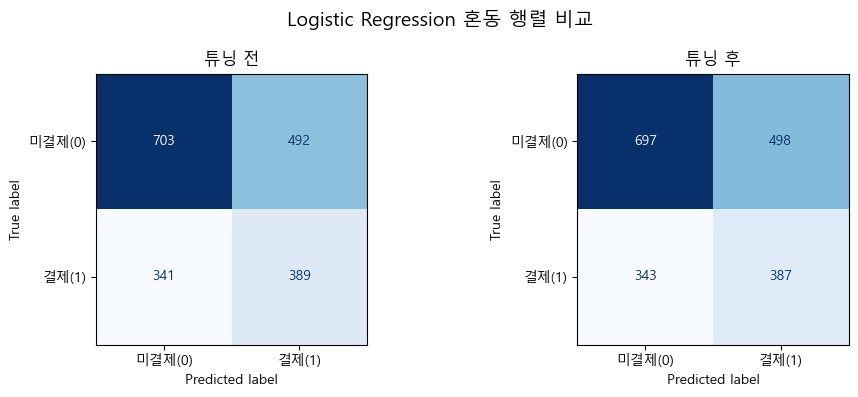

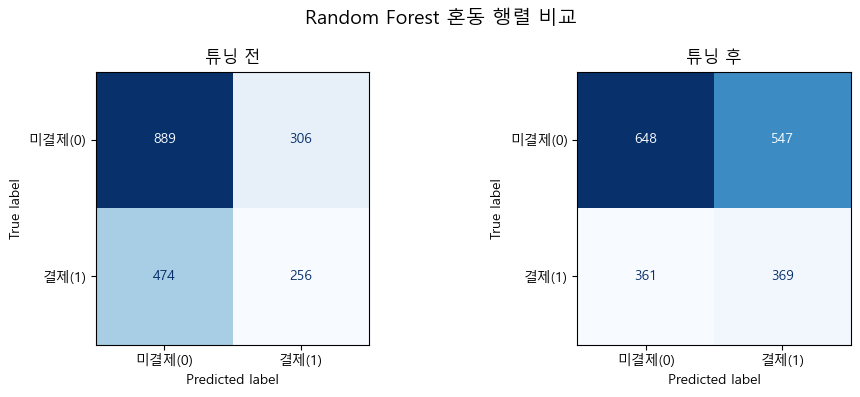

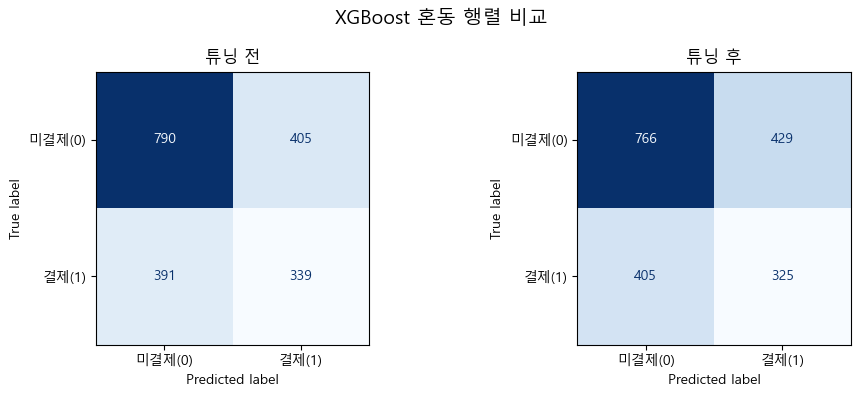

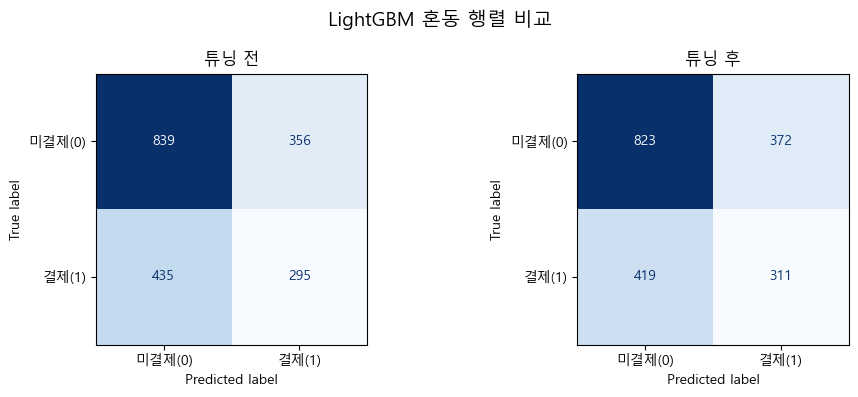

In [ ]:
# 튜닝 전후 혼동 행렬 비교
for name in trained_models.keys():
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    X_te = X_test_scaled if name == 'Logistic Regression' else X_test

    y_pred_before = trained_models[name].predict(X_te)
    cm_before = confusion_matrix(y_test, y_pred_before)
    ConfusionMatrixDisplay(
        confusion_matrix=cm_before, display_labels=['미결제(0)', '결제(1)']
    ).plot(ax=axes[0], colorbar=False, cmap='Blues')
    axes[0].set_title('튜닝 전')

    y_pred_after = tuned_models[name].predict(X_te)
    cm_after = confusion_matrix(y_test, y_pred_after)
    ConfusionMatrixDisplay(
        confusion_matrix=cm_after, display_labels=['미결제(0)', '결제(1)']
    ).plot(ax=axes[1], colorbar=False, cmap='Blues')
    axes[1].set_title('튜닝 후')

    plt.suptitle(f'{name} 혼동 행렬 비교', fontsize=14)
    plt.tight_layout()
    plt.show()

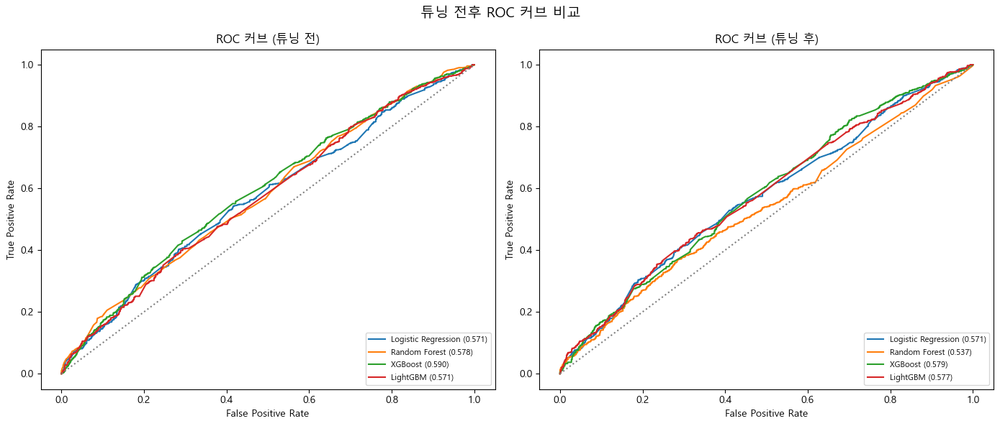

In [ ]:
# 튜닝 전후 ROC 커브 비교
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

for name, model in trained_models.items():
    X_te = X_test_scaled if name == 'Logistic Regression' else X_test

    y_prob_before = model.predict_proba(X_te)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob_before)
    axes[0].plot(fpr, tpr, label=f'{name} ({roc_auc_score(y_test, y_prob_before):.3f})')

    y_prob_after = tuned_models[name].predict_proba(X_te)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob_after)
    axes[1].plot(fpr, tpr, label=f'{name} ({roc_auc_score(y_test, y_prob_after):.3f})')

for ax, title in zip(axes, ['ROC 커브 (튜닝 전)', 'ROC 커브 (튜닝 후)']):
    ax.plot([0, 1], [0, 1], 'gray', linestyle=':')
    ax.set_title(title)
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.legend(fontsize=8, loc='lower right')

plt.suptitle('튜닝 전후 ROC 커브 비교', fontsize=14)
plt.tight_layout()
plt.show()

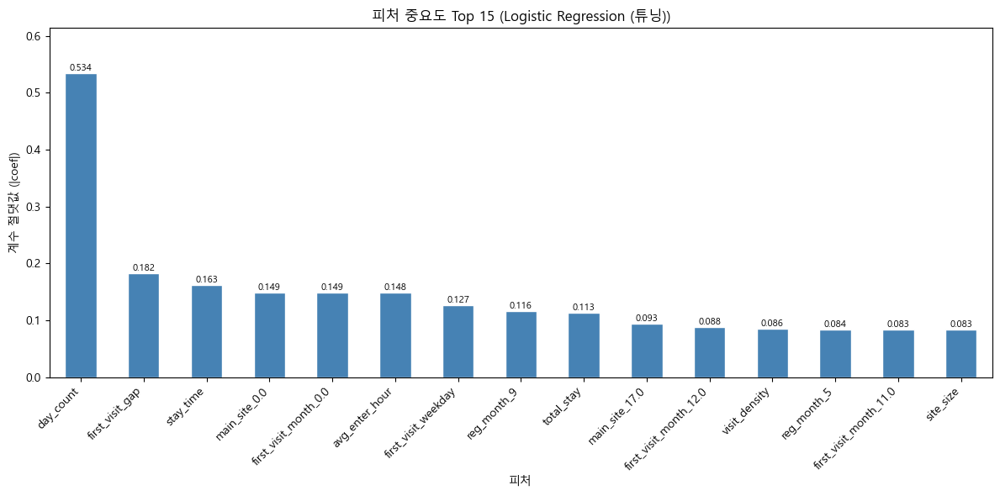


상위 10개 피처:
day_count                0.533669
first_visit_gap          0.182142
stay_time                0.162637
main_site_0.0            0.148991
first_visit_month_0.0    0.148991
avg_enter_hour           0.148238
first_visit_weekday      0.127000
reg_month_9              0.116347
total_stay               0.113345
main_site_17.0           0.093476
dtype: float64


In [ ]:
# 피처 중요도 분석
# Logistic Regression: 계수(coef_) 절댓값 기준 / 나머지: feature_importances_ 기준
best_name_clean = best_model_name.replace(' (튜닝)', '')

if best_name_clean == 'Logistic Regression':
    importance_vals  = np.abs(best_model_final.coef_[0])
    importance_label = '계수 절댓값 (|coef|)'
else:
    importance_vals  = best_model_final.feature_importances_
    importance_label = '중요도'

feature_importance = pd.Series(
    importance_vals,
    index=X_train.columns
).sort_values(ascending=False)

plt.figure(figsize=(12, 6))
feature_importance.head(15).plot(kind='bar', color='steelblue', edgecolor='white')
plt.title(f'피처 중요도 Top 15 ({best_model_name})')
plt.xlabel('피처')
plt.ylabel(importance_label)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, feature_importance.head(15).max() * 1.15)
for p in plt.gca().patches:
    plt.gca().annotate(f'{p.get_height():.3f}',
                       (p.get_x() + p.get_width() / 2, p.get_height()),
                       ha='center', va='bottom', fontsize=8)
plt.tight_layout()
plt.show()

print("\n상위 10개 피처:")
print(feature_importance.head(10))

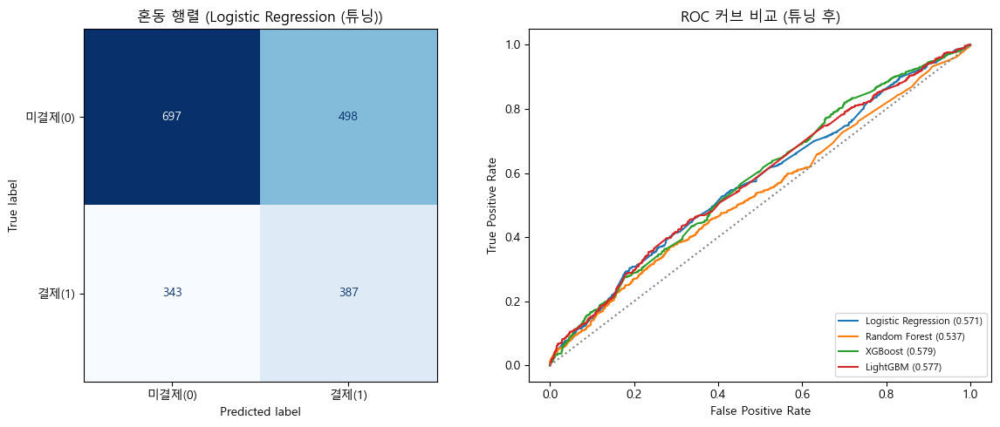

In [ ]:
# 최적 모델 혼동 행렬 및 ROC 커브
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

X_te_final = X_test_scaled if best_name_clean == 'Logistic Regression' else X_test

y_pred_final = best_model_final.predict(X_te_final)
cm = confusion_matrix(y_test, y_pred_final)
ConfusionMatrixDisplay(
    confusion_matrix=cm, display_labels=['미결제(0)', '결제(1)']
).plot(ax=axes[0], colorbar=False, cmap='Blues')
axes[0].set_title(f'혼동 행렬 ({best_model_name})')

for name, model in tuned_models.items():
    X_te   = X_test_scaled if name == 'Logistic Regression' else X_test
    y_prob = model.predict_proba(X_te)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    axes[1].plot(fpr, tpr, label=f'{name} ({roc_auc_score(y_test, y_prob):.3f})')

axes[1].plot([0, 1], [0, 1], 'gray', linestyle=':')
axes[1].set_title('ROC 커브 비교 (튜닝 후)')
axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')
axes[1].legend(fontsize=8, loc='lower right')

plt.tight_layout()
plt.show()

## 클러스터링

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import warnings
warnings.filterwarnings('ignore')

## 클러스터링 전처리

In [ ]:
# 클러스터링용 피처 선택
# Logistic Regression 피처 중요도 상위 피처 중 수치형 원본 피처 중심으로 구성
# OHE 더미 컬럼 제외: 특정 월/지점 더미는 클러스터링에 노이즈로 작용할 수 있음
cluster_features = [
    'day_count', 'first_visit_gap', 'stay_time',
    'avg_enter_hour', 'first_visit_weekday',
    'total_stay', 'visit_density', 'site_size'
]

cluster_df = user_df[cluster_features].copy()

print(f"클러스터링 데이터 shape: {cluster_df.shape}")
print(f"결측치 현황:\n{cluster_df.isnull().sum()}")

클러스터링 데이터 shape: (9624, 8)
결측치 현황:
day_count              0
first_visit_gap        0
stay_time              0
avg_enter_hour         0
first_visit_weekday    0
total_stay             0
visit_density          0
site_size              0
dtype: int64


In [ ]:
# 스케일링
# K-Means는 유클리드 거리 기반이므로 변수 간 스케일 차이가 군집 결과를 왜곡하는 것을 방지하기 위해 필수 적용
scaler_cluster = StandardScaler()
cluster_scaled = scaler_cluster.fit_transform(cluster_df)

print("스케일링 완료")

스케일링 완료


## 최적 클러스터 수 탐색

In [ ]:
# 최적 클러스터 수 탐색: 엘보우 기법 + 실루엣 계수 + 클러스터 균등성
from sklearn.metrics import silhouette_samples

K_range = range(2, 11)

inertia_list    = []
silhouette_list = []
std_list        = []
labels_dict     = {}

for k in K_range:
    km     = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(cluster_scaled)

    inertia_list.append(km.inertia_)
    silhouette_list.append(silhouette_score(cluster_scaled, labels))

    counts = pd.Series(labels).value_counts().sort_index()
    std_list.append(counts.std())
    labels_dict[k] = labels

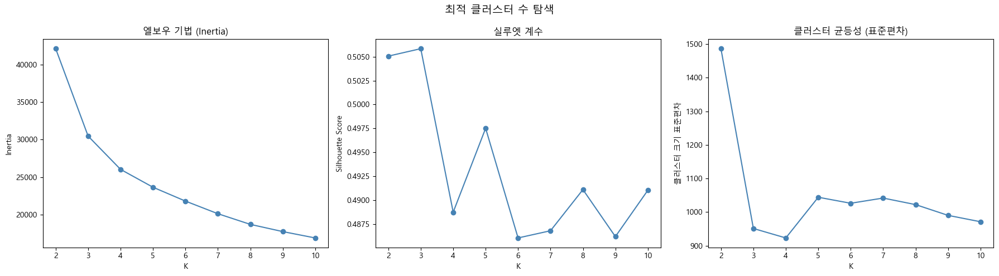

,K,Inertia,Silhouette,크기 표준편차
0,2,42163.2,0.505,1486.3
1,3,30476.2,0.506,951.3
2,4,26028.9,0.489,923.1
3,5,23642.2,0.498,1044.3
4,6,21790.3,0.486,1026.3
5,7,20103.2,0.487,1041.8
6,8,18678.4,0.491,1022.3
7,9,17713.5,0.486,990.3
8,10,16863.4,0.491,971.4


In [ ]:
# 엘보우 기법 + 실루엣 계수 + 클러스터 균등성 시각화
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(K_range, inertia_list, marker='o', color='steelblue')
axes[0].set_title('엘보우 기법 (Inertia)')
axes[0].set_xlabel('K')
axes[0].set_ylabel('Inertia')

axes[1].plot(K_range, silhouette_list, marker='o', color='steelblue')
axes[1].set_title('실루엣 계수')
axes[1].set_xlabel('K')
axes[1].set_ylabel('Silhouette Score')

axes[2].plot(K_range, std_list, marker='o', color='steelblue')
axes[2].set_title('클러스터 균등성 (표준편차)')
axes[2].set_xlabel('K')
axes[2].set_ylabel('클러스터 크기 표준편차')

plt.suptitle('최적 클러스터 수 탐색', fontsize=14)
plt.tight_layout()
plt.show()

# 수치 확인
result_k = pd.DataFrame({
    'K':           list(K_range),
    'Inertia':     [round(i, 1) for i in inertia_list],
    'Silhouette':  [round(s, 3) for s in silhouette_list],
    '크기 표준편차': [round(s, 1) for s in std_list]
})
display(result_k)

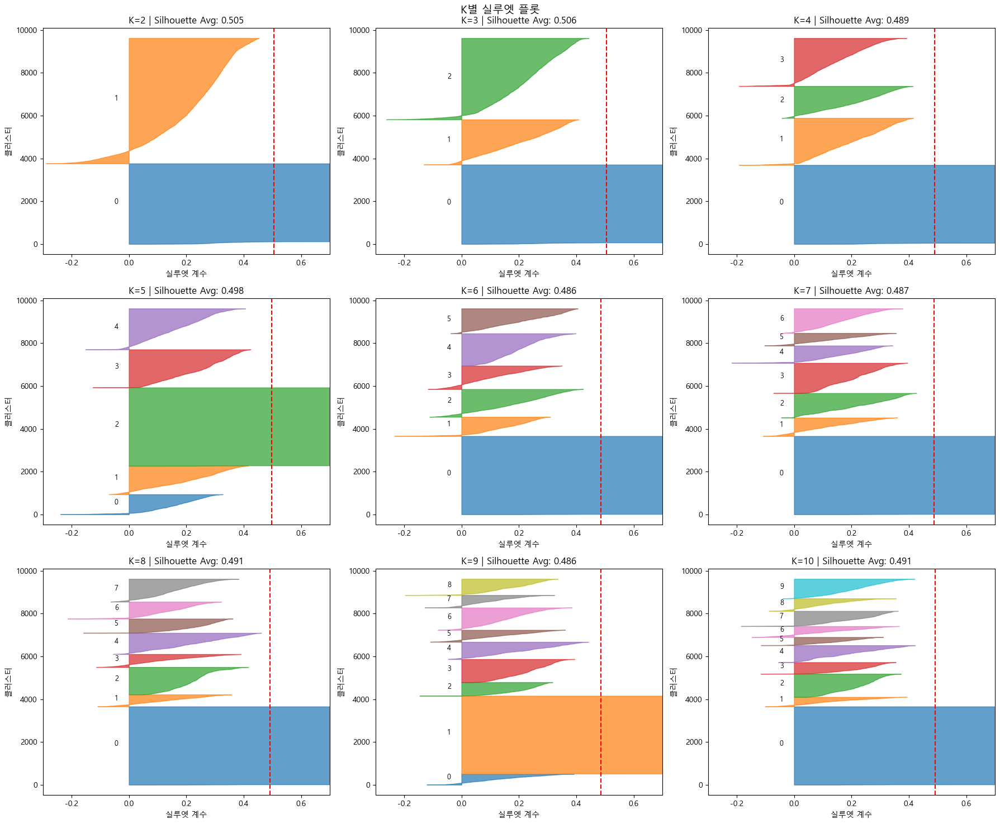

In [ ]:
# K별 실루엣 플롯
n_cols   = 3
n_rows   = (len(K_range) + n_cols - 1) // n_cols
colors   = plt.cm.tab10.colors

fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 5))
axes = axes.flatten()

for idx, k in enumerate(K_range):
    ax     = axes[idx]
    labels = labels_dict[k]
    sil_vals = silhouette_samples(cluster_scaled, labels)
    sil_avg  = silhouette_list[idx]

    y_lower = 0
    for cluster_id in range(k):
        cluster_sil = np.sort(sil_vals[labels == cluster_id])
        size        = len(cluster_sil)
        y_upper     = y_lower + size

        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0, cluster_sil,
                         alpha=0.7,
                         color=colors[cluster_id % len(colors)])
        ax.text(-0.05, y_lower + size / 2, str(cluster_id), fontsize=9)
        y_lower = y_upper

    ax.axvline(x=sil_avg, color='red', linestyle='--')
    ax.set_title(f'K={k} | Silhouette Avg: {sil_avg:.3f}')
    ax.set_xlabel('실루엣 계수')
    ax.set_ylabel('클러스터')
    ax.set_xlim(-0.3, 0.7)

# 남은 서브플롯 숨기기
for idx in range(len(K_range), len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('K별 실루엣 플롯', fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# K별 클러스터 고객 수 분포 확인
for k in K_range:
    km     = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(cluster_scaled)
    counts = pd.Series(labels).value_counts().sort_index()
    ratio  = (counts / len(labels) * 100).round(1)
    print(f"\nK={k}")
    for idx in counts.index:
        print(f"  Cluster {idx}: {counts[idx]:,}명 ({ratio[idx]}%)")


K=2
  Cluster 0: 3,761명 (39.1%)
  Cluster 1: 5,863명 (60.9%)

K=3
  Cluster 0: 3,708명 (38.5%)
  Cluster 1: 2,111명 (21.9%)
  Cluster 2: 3,805명 (39.5%)

K=4
  Cluster 0: 3,691명 (38.4%)
  Cluster 1: 2,198명 (22.8%)
  Cluster 2: 1,492명 (15.5%)
  Cluster 3: 2,243명 (23.3%)

K=5
  Cluster 0: 935명 (9.7%)
  Cluster 1: 1,333명 (13.9%)
  Cluster 2: 3,660명 (38.0%)
  Cluster 3: 1,780명 (18.5%)
  Cluster 4: 1,916명 (19.9%)

K=6
  Cluster 0: 3,657명 (38.0%)
  Cluster 1: 900명 (9.4%)
  Cluster 2: 1,296명 (13.5%)
  Cluster 3: 1,092명 (11.3%)
  Cluster 4: 1,512명 (15.7%)
  Cluster 5: 1,167명 (12.1%)

K=7
  Cluster 0: 3,657명 (38.0%)
  Cluster 1: 862명 (9.0%)
  Cluster 2: 1,147명 (11.9%)
  Cluster 3: 1,410명 (14.7%)
  Cluster 4: 811명 (8.4%)
  Cluster 5: 588명 (6.1%)
  Cluster 6: 1,149명 (11.9%)

K=8
  Cluster 0: 3,657명 (38.0%)
  Cluster 1: 561명 (5.8%)
  Cluster 2: 1,281명 (13.3%)
  Cluster 3: 606명 (6.3%)
  Cluster 4: 992명 (10.3%)
  Cluster 5: 665명 (6.9%)
  Cluster 6: 794명 (8.3%)
  Cluster 7: 1,068명 (11.1%)

K=9
  Cluster

In [ ]:
# 최적 K 결정 후 최종 클러스터링 수행
# ※ 위 결과를 보고 K값 직접 설정
OPTIMAL_K = 3

km_final = KMeans(n_clusters=OPTIMAL_K, random_state=42, n_init=10)
user_df['cluster'] = km_final.fit_predict(cluster_scaled)

print(f"최종 클러스터 수: {OPTIMAL_K}")
print(f"\n클러스터별 고객 수:")
counts = user_df['cluster'].value_counts().sort_index()
ratio  = (counts / len(user_df) * 100).round(1)
for idx in counts.index:
    print(f"  Cluster {idx}: {counts[idx]:,}명 ({ratio[idx]}%)")

최종 클러스터 수: 3

클러스터별 고객 수:
  Cluster 0: 3,708명 (38.5%)
  Cluster 1: 2,111명 (21.9%)
  Cluster 2: 3,805명 (39.5%)


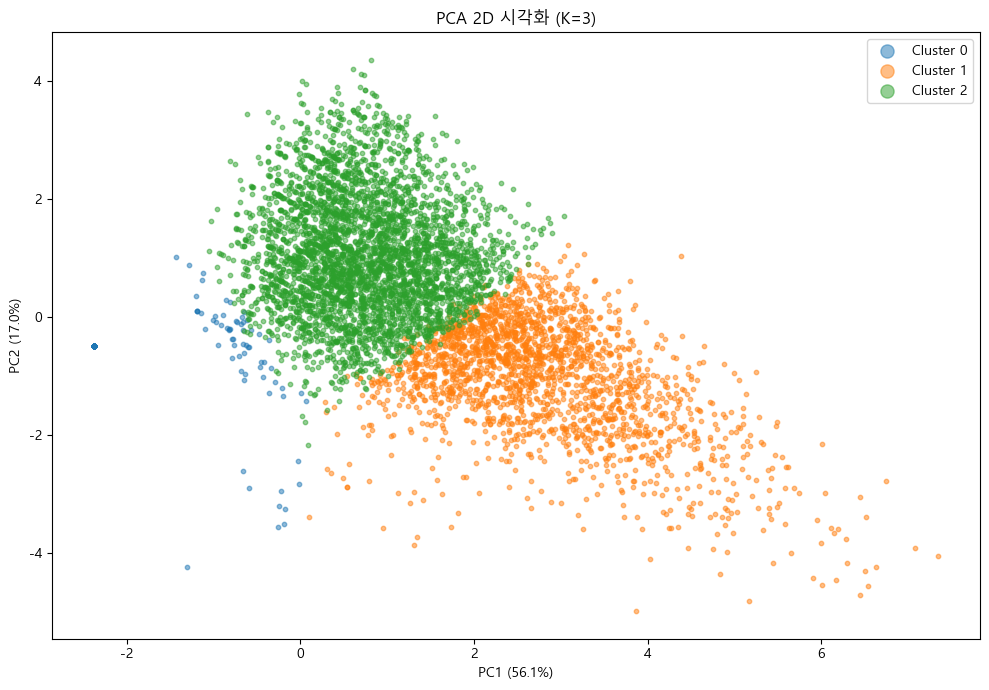

In [ ]:
# PCA 2D 시각화 (군집화에는 미사용, 시각화 목적으로만 적용)
pca_2d    = PCA(n_components=2, random_state=42)
coords_2d = pca_2d.fit_transform(cluster_scaled)
var_ratio = pca_2d.explained_variance_ratio_

fig, ax = plt.subplots(figsize=(10, 7))
colors  = plt.cm.tab10.colors

for k in range(OPTIMAL_K):
    mask = user_df['cluster'] == k
    ax.scatter(coords_2d[mask, 0], coords_2d[mask, 1],
               label=f'Cluster {k}', alpha=0.5, s=10, color=colors[k])

ax.set_title(f'PCA 2D 시각화 (K={OPTIMAL_K})')
ax.set_xlabel(f'PC1 ({var_ratio[0]*100:.1f}%)')
ax.set_ylabel(f'PC2 ({var_ratio[1]*100:.1f}%)')
ax.legend(markerscale=3)
plt.tight_layout()
plt.show()

In [ ]:
# 클러스터별 피처 평균 비교
cluster_profile = (user_df.groupby('cluster')[cluster_features]
                   .mean()
                   .round(2))

display(cluster_profile)

,day_count,first_visit_gap,stay_time,avg_enter_hour,first_visit_weekday,total_stay,visit_density,site_size
cluster,,,,,,,,
0,0.02,0.00,2.36,12.57,0.00,2.52,0.03,1.27
1,1.92,0.69,709.78,11.44,0.83,866.56,4.89,115.32
2,1.24,1.00,213.32,14.76,0.79,238.47,2.43,109.93


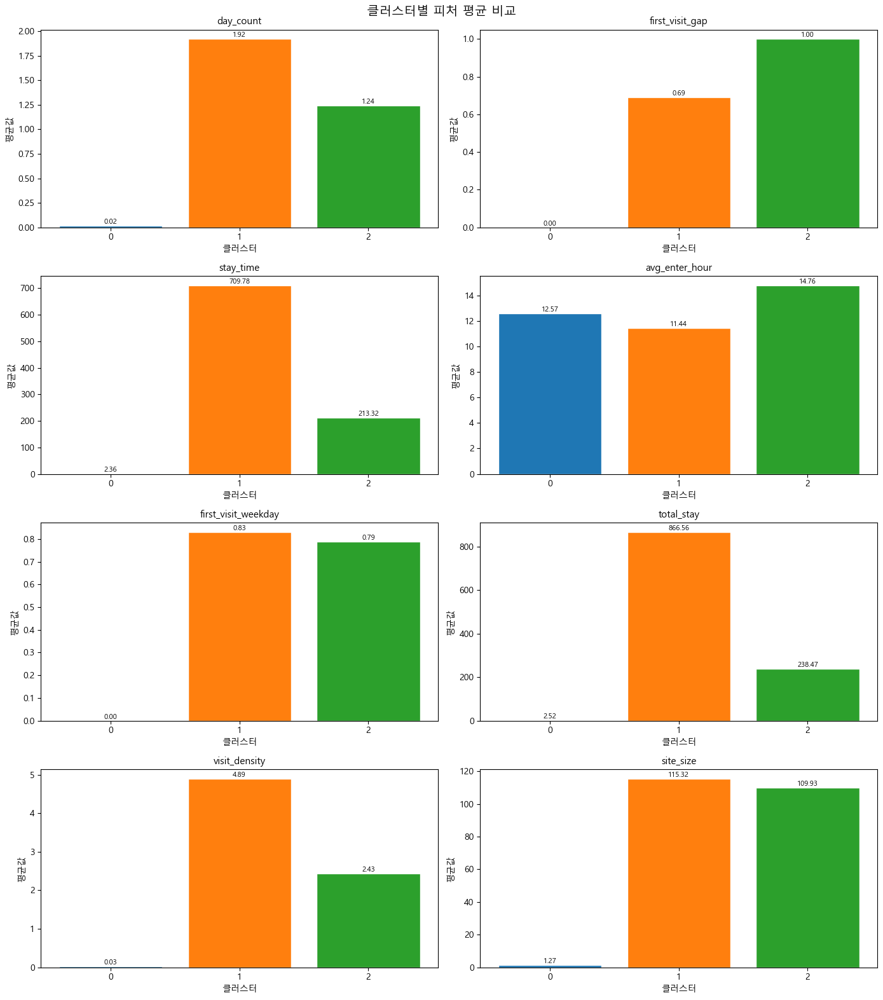

In [ ]:
# 클러스터별 피처 평균 막대 그래프
n_features = len(cluster_features)
n_cols     = 2
n_rows     = 4
colors     = plt.cm.tab10.colors

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 4))
axes = axes.flatten()

for idx, feature in enumerate(cluster_features):
    ax = axes[idx]
    vals = cluster_profile[feature]

    bars = ax.bar(vals.index.astype(str), vals.values,
                  color=[colors[i % len(colors)] for i in vals.index],
                  edgecolor='white')

    ax.set_title(feature, fontsize=11)
    ax.set_xlabel('클러스터')
    ax.set_ylabel('평균값')

    for bar in bars:
        ax.annotate(f'{bar.get_height():.2f}',
                    (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                    ha='center', va='bottom', fontsize=8)

# 남은 서브플롯 숨기기
for idx in range(n_features, len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('클러스터별 피처 평균 비교', fontsize=14)
plt.tight_layout()
plt.show()

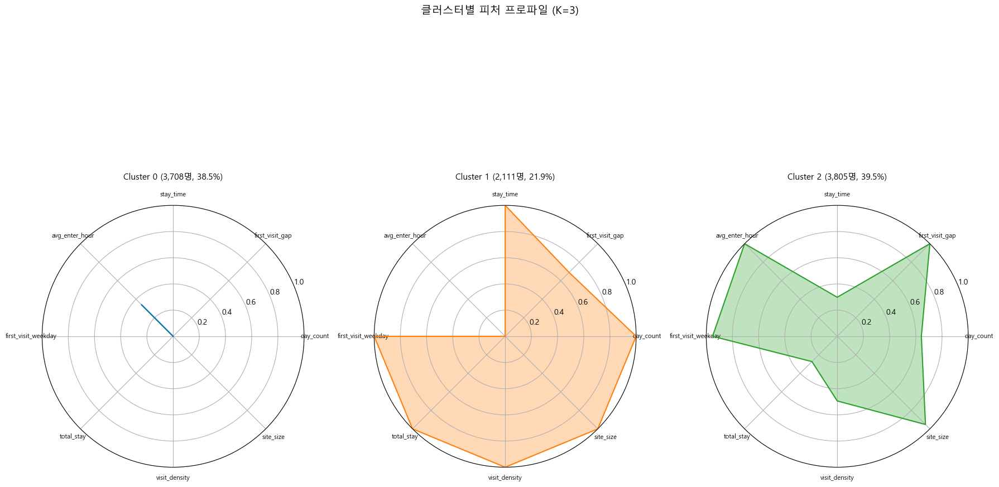

In [ ]:
# 레이더 차트: 클러스터별 피처 프로파일
# 정규화: 0~1 스케일로 변환하여 비교 가능하게
from matplotlib.patches import FancyArrowPatch
from math import pi

profile_norm = (cluster_profile - cluster_profile.min()) / (cluster_profile.max() - cluster_profile.min())

categories = cluster_features
N          = len(categories)
angles     = [n / float(N) * 2 * pi for n in range(N)]
angles    += angles[:1]

fig, axes = plt.subplots(1, 3, figsize=(18, 12), subplot_kw=dict(polar=True))

for k, ax in zip(range(OPTIMAL_K), axes.flatten()):
    values  = profile_norm.loc[k].tolist()
    values += values[:1]

    ax.plot(angles, values, linewidth=1.5, color=colors[k])
    ax.fill(angles, values, alpha=0.3, color=colors[k])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, fontsize=8)
    ax.set_title(f'Cluster {k} ({counts[k]:,}명, {ratio[k]}%)',
                 fontsize=11, pad=15)
    ax.set_ylim(0, 1)

plt.suptitle(f'클러스터별 피처 프로파일 (K={OPTIMAL_K})', fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# 클러스터별 결제 전환율 계산
conversion_rate = (user_df.groupby('cluster')['is_payment']
                   .agg(결제자수='sum', 총인원='count')
                   .assign(전환율=lambda x: (x['결제자수'] / x['총인원'] * 100).round(1))
                   .reset_index())

print("클러스터별 결제 전환율:")
display(conversion_rate)

클러스터별 결제 전환율:


,cluster,결제자수,총인원,전환율
0,0,1339,3708,36.1
1,1,753,2111,35.7
2,2,1560,3805,41.0


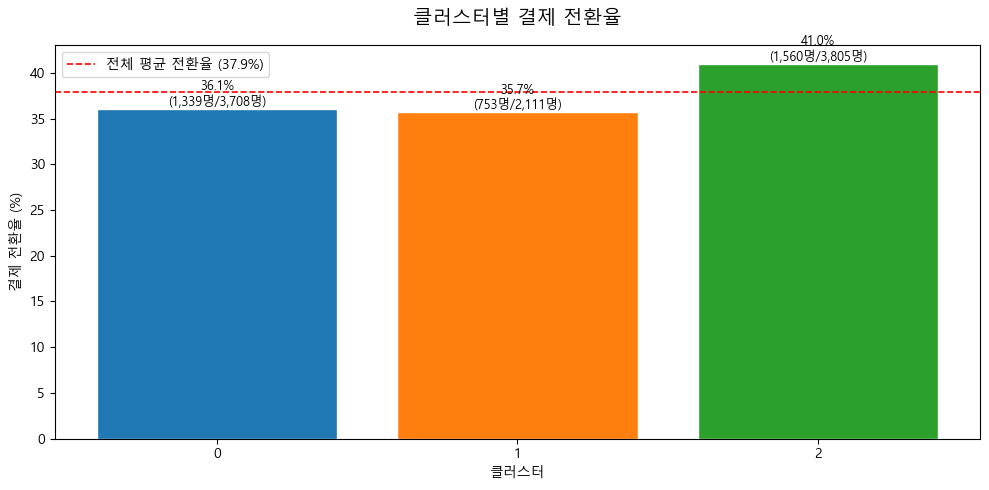

In [ ]:
# 클러스터별 결제 전환율 시각화
fig, ax = plt.subplots(figsize=(10, 5))

colors = plt.cm.tab10.colors
bars   = ax.bar(conversion_rate['cluster'].astype(str),
                conversion_rate['전환율'],
                color=[colors[i % len(colors)] for i in conversion_rate['cluster']],
                edgecolor='white')

# 전체 평균 전환율 기준선
avg_rate = user_df['is_payment'].mean() * 100
ax.axhline(y=avg_rate, color='red', linestyle='--', linewidth=1.2,
           label=f'전체 평균 전환율 ({avg_rate:.1f}%)')

ax.set_title('클러스터별 결제 전환율', fontsize=14, pad=15)
ax.set_xlabel('클러스터')
ax.set_ylabel('결제 전환율 (%)')
ax.legend()

for bar, row in zip(bars, conversion_rate.itertuples()):
    ax.annotate(f'{row.전환율}%\n({row.결제자수:,}명/{row.총인원:,}명)',
                (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

In [ ]:
# 클러스터별 주요 이용 지점 분포 확인
# main_site: user별 가장 많이 방문한 site_id
site_dist = (user_df.groupby(['cluster', 'main_site'])
             .size()
             .reset_index(name='인원수'))

# 클러스터별 비율 계산
site_dist['비율'] = (site_dist.groupby('cluster')['인원수']
                    .transform(lambda x: x / x.sum() * 100)
                    .round(1))

print("클러스터별 주요 이용 지점 분포:")
display(site_dist)

클러스터별 주요 이용 지점 분포:


,cluster,main_site,인원수,비율
0,0,0.0,3641,98.2
1,0,1.0,28,0.8
2,0,2.0,10,0.3
3,0,3.0,1,0.0
4,0,4.0,5,0.1
5,0,5.0,1,0.0
6,0,6.0,4,0.1
7,0,17.0,3,0.1
8,0,47.0,8,0.2
9,0,49.0,7,0.2


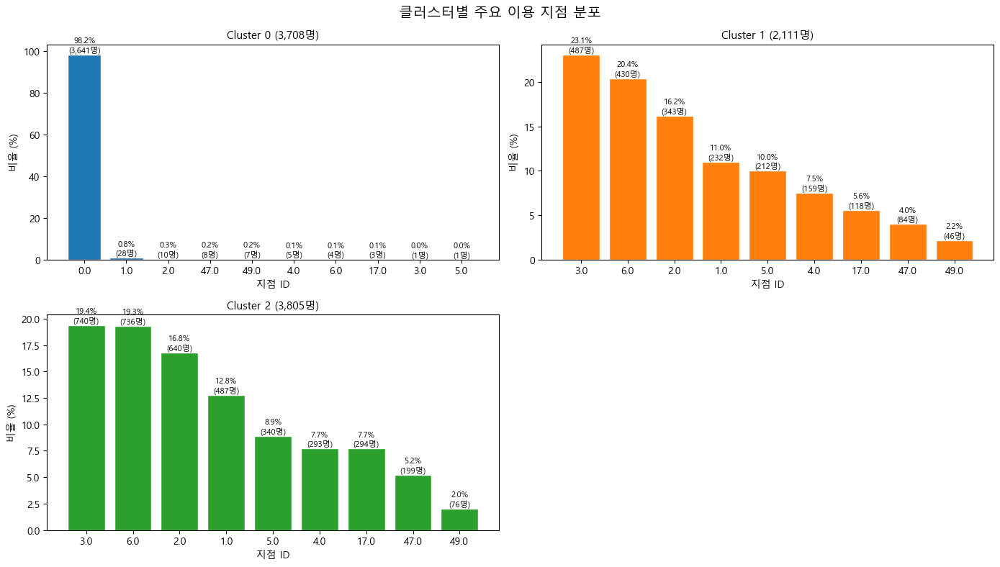

In [ ]:
# 클러스터별 주요 이용 지점 시각화
n_clusters = user_df['cluster'].nunique()
n_cols     = 2
n_rows     = (n_clusters + n_cols - 1) // n_cols
colors     = plt.cm.tab10.colors

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows * 4))
axes = axes.flatten()

for k in range(n_clusters):
    ax   = axes[k]
    data = site_dist[site_dist['cluster'] == k].sort_values('비율', ascending=False)

    bars = ax.bar(data['main_site'].astype(str), data['비율'],
                  color=colors[k % len(colors)], edgecolor='white')

    ax.set_title(f'Cluster {k} ({user_df[user_df["cluster"]==k].shape[0]:,}명)', fontsize=11)
    ax.set_xlabel('지점 ID')
    ax.set_ylabel('비율 (%)')

    for bar, row in zip(bars, data.itertuples()):
        ax.annotate(f'{row.비율}%\n({row.인원수:,}명)',
                    (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                    ha='center', va='bottom', fontsize=8)

# 남은 서브플롯 숨기기
for idx in range(n_clusters, len(axes)):
    axes[idx].set_visible(False)

plt.suptitle('클러스터별 주요 이용 지점 분포', fontsize=14)
plt.tight_layout()
plt.show()

# 혜림님 코드

In [ ]:
import sys
!{sys.executable} -m pip install "setuptools<82"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.5 MB/s  0:00:00

[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: pip3 install --upgrade pip


In [ ]:
import pandas as pd
from ydata_profiling import ProfileReport
from pathlib import Path

folder_path = Path.cwd()

report_folder = folder_path / "profile_reports"
report_folder.mkdir(exist_ok=True)

csv_files = folder_path.glob("*.csv")


for csv_file in csv_files:
    df = pd.read_csv(csv_file)

    profile = ProfileReport(
        df,
        title=f"{csv_file.stem} Profiling Report",
        minimal=True
    )

    output_path = report_folder / f"{csv_file.stem}_report.html"
    profile.to_file(output_path)

    print(f"완료: {output_path}")

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/var/folders/78/w7z6vd_j3w34d6k2_5x3t9dh0000gn/T/ipykernel_10734/2619730793.py:2: DeprecationWarning: 
    `import ydata_profiling` is deprecated and will not receive more updates. 
    Please install fg-data-profiling via `pip install fg-data-profiling` and use `import data_profiling` instead.
    
  from ydata_profiling import ProfileReport
Export report to file: 100%|██████████| 1/1 [00:00<00:00, 231.49it/s]


완료: /Users/crim/Downloads/중급 2/profile_reports/master_unified_KST포함_0528_수정요청사항_반영_report.html


Export report to file: 100%|██████████| 1/1 [00:00<00:00, 241.91it/s]


완료: /Users/crim/Downloads/중급 2/profile_reports/master_data_new2_report.html


Export report to file: 100%|██████████| 1/1 [00:00<00:00, 615.72it/s]


완료: /Users/crim/Downloads/중급 2/profile_reports/site_area_report.html


Export report to file: 100%|██████████| 1/1 [00:00<00:00, 325.75it/s]


완료: /Users/crim/Downloads/중급 2/profile_reports/trial_access_log_report.html


Export report to file: 100%|██████████| 1/1 [00:00<00:00, 144.60it/s]


완료: /Users/crim/Downloads/중급 2/profile_reports/trial_visit_info_report.html


Export report to file: 100%|██████████| 1/1 [00:00<00:00, 500.81it/s]


완료: /Users/crim/Downloads/중급 2/profile_reports/trial_payment_report.html


Export report to file: 100%|██████████| 1/1 [00:00<00:00, 494.61it/s]

완료: /Users/crim/Downloads/중급 2/profile_reports/trial_register_report.html


In [ ]:
import pandas as pd

register = pd.read_csv("trial_register.csv")
payment = pd.read_csv("trial_payment.csv")
visit = pd.read_csv("trial_visit_info.csv")
access_log = pd.read_csv("trial_access_log.csv")

visit_summary = visit.groupby("user_uuid").agg(
    visit_count=("user_uuid", "count"),
    total_stay_second=("stay_time_second", "sum"),
    avg_stay_second=("stay_time_second", "mean")
).reset_index()

access_summary = access_log.groupby("user_uuid").agg(
    access_count=("user_uuid", "count")
).reset_index()

user_summary = payment.merge(visit_summary, on="user_uuid", how="left")
user_summary = user_summary.merge(access_summary, on="user_uuid", how="left")

user_summary = user_summary.fillna(0)

user_summary.groupby("is_payment").agg(
    user_count=("user_uuid", "count"),
    avg_visit_count=("visit_count", "mean"),
    avg_total_stay_hour=("total_stay_second", lambda x: x.mean() / 3600),
    avg_access_count=("access_count", "mean")
)

,user_count,avg_visit_count,avg_total_stay_hour,avg_access_count
is_payment,,,,
0,5995,1.112761,5.492475,6.624687
1,3664,1.340338,5.655651,6.752456


In [ ]:
user_summary.groupby("is_payment").agg(
    row_count=("user_uuid", "count"),
    unique_user_count=("user_uuid", "nunique"),
    avg_visit_count=("visit_count", "mean"),
    avg_total_stay_hour=("total_stay_second", lambda x: x.mean() / 3600),
    avg_access_count=("access_count", "mean")
)

,row_count,unique_user_count,avg_visit_count,avg_total_stay_hour,avg_access_count
is_payment,,,,,
0,5995,5972,1.112761,5.492475,6.624687
1,3664,3652,1.340338,5.655651,6.752456


In [ ]:
payment.groupby("user_uuid")["is_payment"].nunique().value_counts()

is_payment
1    9624
Name: count, dtype: int64

In [ ]:
payment_user = payment.groupby("user_uuid", as_index=False)["is_payment"].max()

payment_user.head()

,user_uuid,is_payment
0,000590dc-046f-462b-8225-4c81a97b7166,0
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0
2,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1
3,0013f481-efed-4508-8836-70cbd64c477e,1
4,0018e22d-a2cc-4e06-bca2-d6a041770f3b,0


In [ ]:
visit_summary = visit.groupby("user_uuid").agg(
    visit_count=("user_uuid", "count"),
    total_stay_second=("stay_time_second", "sum"),
    avg_stay_second=("stay_time_second", "mean")
).reset_index()

access_summary = access_log.groupby("user_uuid").agg(
    access_count=("user_uuid", "count")
).reset_index()

user_pattern = payment_user.merge(visit_summary, on="user_uuid", how="left")
user_pattern = user_pattern.merge(access_summary, on="user_uuid", how="left")

user_pattern[["visit_count", "total_stay_second", "avg_stay_second", "access_count"]] = user_pattern[
    ["visit_count", "total_stay_second", "avg_stay_second", "access_count"]
].fillna(0)

user_pattern["has_visit"] = user_pattern["visit_count"] > 0
user_pattern["total_stay_hour"] = user_pattern["total_stay_second"] / 3600
user_pattern["avg_stay_hour"] = user_pattern["avg_stay_second"] / 3600

user_pattern.head()

,user_uuid,is_payment,visit_count,total_stay_second,avg_stay_second,access_count,has_visit,total_stay_hour,avg_stay_hour
0,000590dc-046f-462b-8225-4c81a97b7166,0,1.0,21417.0,21417.000000,6.0,True,5.949167,5.949167
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,0,0.0,0.0,0.000000,0.0,False,0.000000,0.000000
2,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,1,3.0,45569.0,15189.666667,18.0,True,12.658056,4.219352
3,0013f481-efed-4508-8836-70cbd64c477e,1,0.0,0.0,0.000000,0.0,False,0.000000,0.000000
4,0018e22d-a2cc-4e06-bca2-d6a041770f3b,0,2.0,77372.0,38686.000000,19.0,True,21.492222,10.746111


In [ ]:
pattern_summary = user_pattern.groupby("is_payment").agg(
    user_count=("user_uuid", "nunique"),
    visit_rate=("has_visit", lambda x: x.mean() * 100),
    avg_visit_count=("visit_count", "mean"),
    median_visit_count=("visit_count", "median"),
    avg_total_stay_hour=("total_stay_hour", "mean"),
    median_total_stay_hour=("total_stay_hour", "median"),
    avg_access_count=("access_count", "mean"),
    median_access_count=("access_count", "median")
).round(2)

pattern_summary

,user_count,visit_rate,avg_visit_count,median_visit_count,avg_total_stay_hour,median_total_stay_hour,avg_access_count,median_access_count
is_payment,,,,,,,,
0,5972,66.48,1.11,1.0,5.46,2.91,6.56,4.0
1,3652,70.21,1.33,1.0,5.64,3.23,6.72,4.0


In [ ]:
visit_with_payment = visit.merge(payment_user, on="user_uuid", how="left")

visit_with_payment["date"] = pd.to_datetime(visit_with_payment["date"], errors="coerce")
visit_with_payment["weekday"] = visit_with_payment["date"].dt.day_name()

weekday_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

visit_weekday = visit_with_payment.groupby(["is_payment", "weekday"]).size().unstack(fill_value=0)
visit_weekday = visit_weekday.reindex(columns=weekday_order)

visit_weekday_rate = visit_weekday.div(visit_weekday.sum(axis=1), axis=0) * 100

visit_weekday_rate.round(2)

weekday,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
is_payment,,,,,,,
0,11.20,14.25,17.93,17.51,15.72,12.71,10.68
1,11.57,15.00,17.34,18.96,16.43,10.76,9.94


In [ ]:
visit_with_payment["first_enter_time"] = pd.to_datetime(
    visit_with_payment["first_enter_time"],
    errors="coerce"
)

visit_with_payment["enter_hour"] = visit_with_payment["first_enter_time"].dt.hour

enter_hour_pattern = visit_with_payment.groupby(["is_payment", "enter_hour"]).size().unstack(fill_value=0)

enter_hour_rate = enter_hour_pattern.div(enter_hour_pattern.sum(axis=1), axis=0) * 100

enter_hour_rate.round(2)

enter_hour,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0
is_payment,,,,,,,,,,,,,,,,,,,,,
0,1.12,0.27,0.03,0.05,0.07,0.12,0.22,1.65,4.48,8.53,...,12.18,9.59,5.16,4.11,4.05,3.60,2.24,1.61,0.83,0.41
1,1.16,0.28,0.09,0.14,0.05,0.09,0.19,1.68,3.78,7.83,...,11.11,8.16,5.56,4.61,6.19,6.08,4.26,2.46,1.51,0.54


In [ ]:
site_pattern = visit_with_payment.groupby(["is_payment", "site_id"]).size().unstack(fill_value=0)

site_pattern_rate = site_pattern.div(site_pattern.sum(axis=1), axis=0) * 100

site_pattern_rate.round(2)

site_id,1,2,3,4,5,6,17,47,49
is_payment,,,,,,,,,
0,11.47,18.07,19.26,7.31,8.35,20.96,7.29,5.21,2.09
1,12.84,16.13,22.53,7.81,10.33,17.42,6.47,3.90,2.57


In [ ]:
access_with_payment = access_log.merge(payment_user, on="user_uuid", how="left")

access_with_payment["cdate"] = pd.to_datetime(access_with_payment["cdate"], errors="coerce")
access_with_payment["access_hour"] = access_with_payment["cdate"].dt.hour

access_hour_pattern = access_with_payment.groupby(["is_payment", "access_hour"]).size().unstack(fill_value=0)

access_hour_rate = access_hour_pattern.div(access_hour_pattern.sum(axis=1), axis=0) * 100

access_hour_rate.round(2)

access_hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
is_payment,,,,,,,,,,,,,,,,,,,,,
0,2.74,3.69,4.74,6.68,8.24,8.71,9.96,9.60,9.72,8.62,...,2.25,0.87,0.44,0.36,0.19,0.18,0.17,0.20,0.49,1.28
1,2.42,4.07,4.95,6.47,8.31,8.62,9.40,9.06,8.95,8.68,...,2.53,1.10,0.55,0.33,0.25,0.13,0.13,0.09,0.33,1.24


In [ ]:
import sys
!{sys.executable} -m pip install koreanize-matplotlib


[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: pip3 install --upgrade pip


In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt

plt.rcParams["font.family"] = "AppleGothic"
plt.rcParams["axes.unicode_minus"] = False

plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["font.size"] = 12
plt.rcParams["axes.grid"] = True

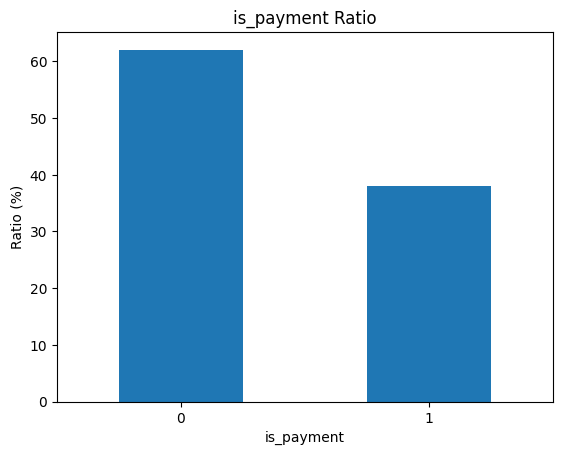

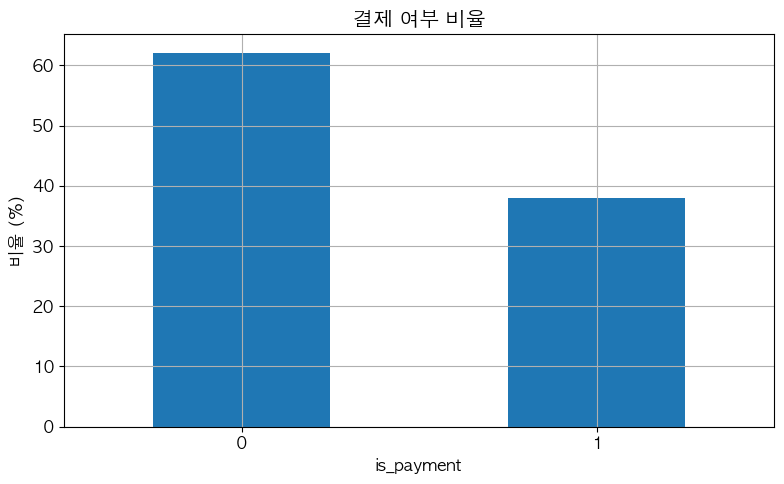

In [ ]:
payment_rate = payment_user["is_payment"].value_counts(normalize=True).sort_index() * 100

plt.figure(figsize=(8, 5))

payment_rate.plot(kind="bar")

plt.title("결제 여부 비율")
plt.xlabel("is_payment")
plt.ylabel("비율 (%)")
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

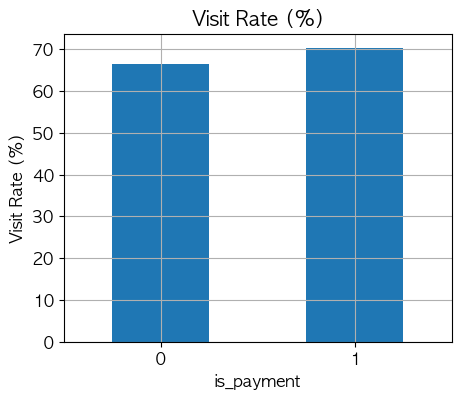

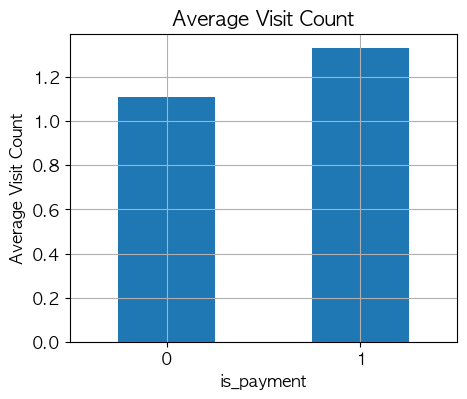

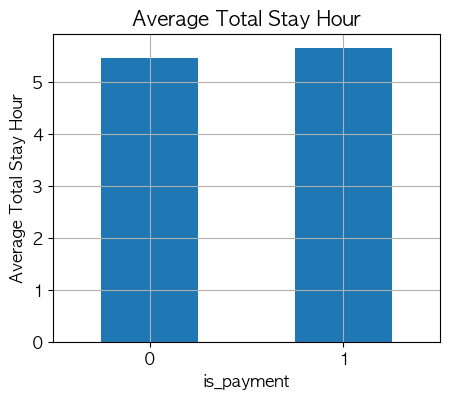

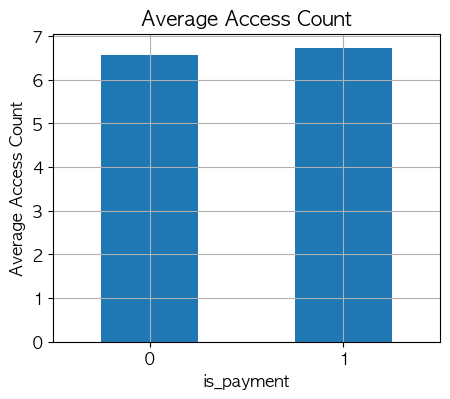

In [ ]:
metrics = {
    "visit_rate": "Visit Rate (%)",
    "avg_visit_count": "Average Visit Count",
    "avg_total_stay_hour": "Average Total Stay Hour",
    "avg_access_count": "Average Access Count"
}

for metric, title in metrics.items():
    plt.figure(figsize=(5, 4))
    pattern_summary[metric].plot(kind="bar")
    plt.title(title)
    plt.xlabel("is_payment")
    plt.ylabel(title)
    plt.xticks(rotation=0)
    plt.show()

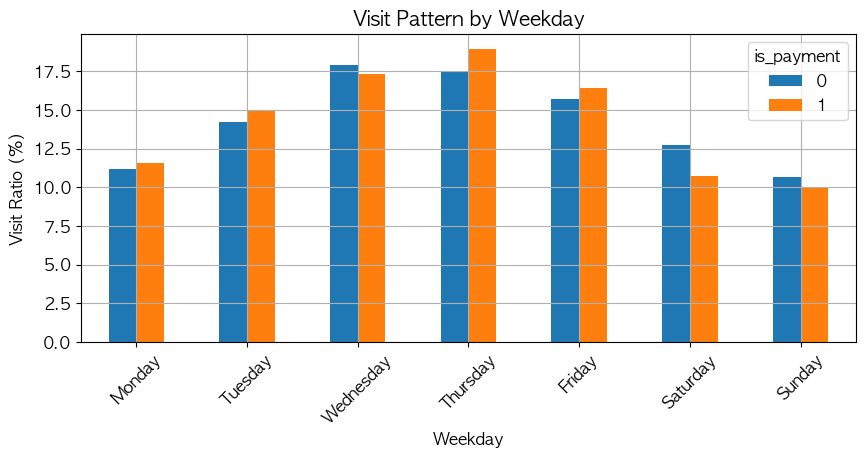

In [ ]:
visit_weekday_rate.T.plot(kind="bar", figsize=(10, 4))

plt.title("Visit Pattern by Weekday")
plt.xlabel("Weekday")
plt.ylabel("Visit Ratio (%)")
plt.xticks(rotation=45)
plt.show()

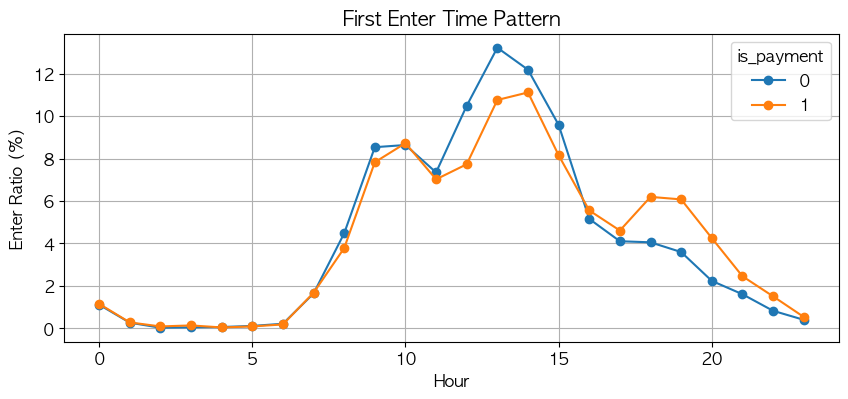

In [ ]:
enter_hour_rate.T.plot(figsize=(10, 4), marker="o")

plt.title("First Enter Time Pattern")
plt.xlabel("Hour")
plt.ylabel("Enter Ratio (%)")
plt.xticks(rotation=0)
plt.show()

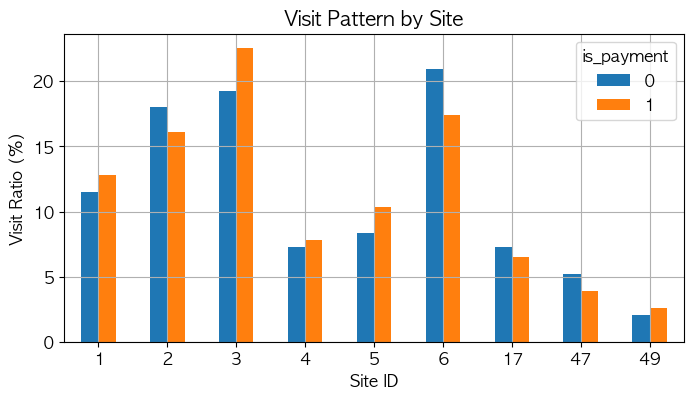

In [ ]:
site_pattern_rate.T.plot(kind="bar", figsize=(8, 4))

plt.title("Visit Pattern by Site")
plt.xlabel("Site ID")
plt.ylabel("Visit Ratio (%)")
plt.xticks(rotation=0)
plt.show()

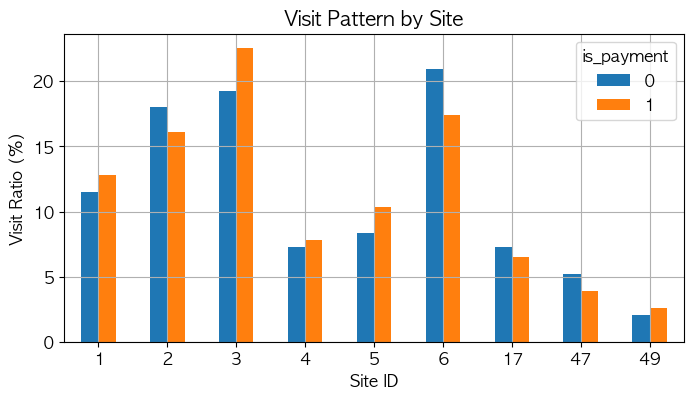

In [ ]:
site_pattern_rate.T.plot(kind="bar", figsize=(8, 4))

plt.title("Visit Pattern by Site")
plt.xlabel("Site ID")
plt.ylabel("Visit Ratio (%)")
plt.xticks(rotation=0)
plt.show()

In [ ]:
site_payment = visit_with_payment.groupby("site_id").agg(
    visit_users=("user_uuid", "nunique"),
    visit_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

site_payment["payment_rate"] = site_payment["payment_rate"] * 100

site_payment.sort_values("payment_rate", ascending=False)

,site_id,visit_users,visit_count,payment_rate
4,5,619,1055,47.677725
8,49,145,263,47.528517
2,3,1402,2370,46.286920
0,1,918,1383,45.191612
3,4,517,863,44.032445
1,2,1131,1979,39.666498
6,17,482,797,39.523212
5,6,1331,2233,37.975817
7,47,332,534,35.580524


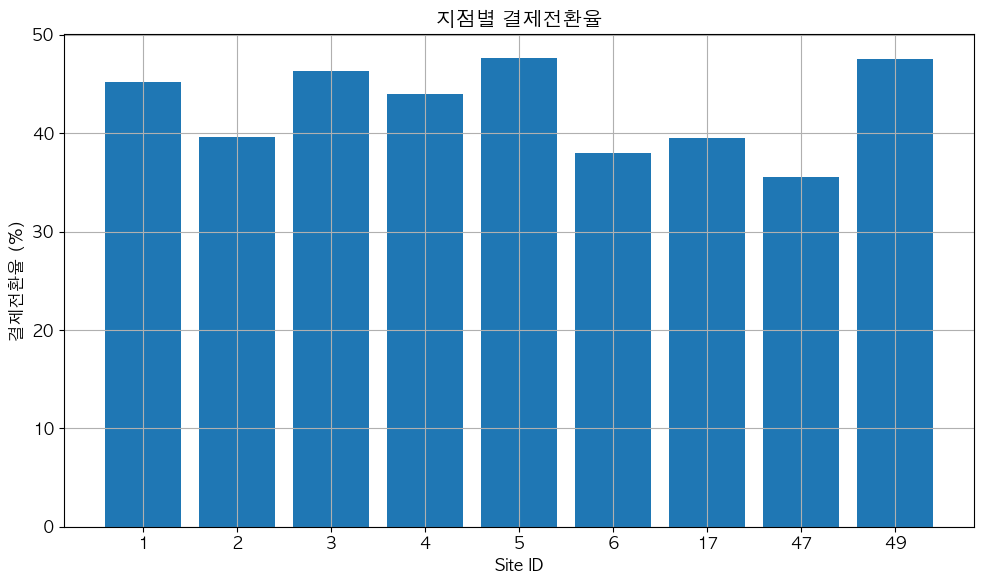

In [ ]:
site_payment_plot = site_payment.sort_values("site_id").copy()

site_payment_plot["site_id"] = site_payment_plot["site_id"].astype(str)

plt.figure(figsize=(10, 6))

plt.bar(
    site_payment_plot["site_id"],
    site_payment_plot["payment_rate"]
)

plt.title("지점별 결제전환율")
plt.xlabel("Site ID")
plt.ylabel("결제전환율 (%)")

plt.tight_layout()
plt.show()

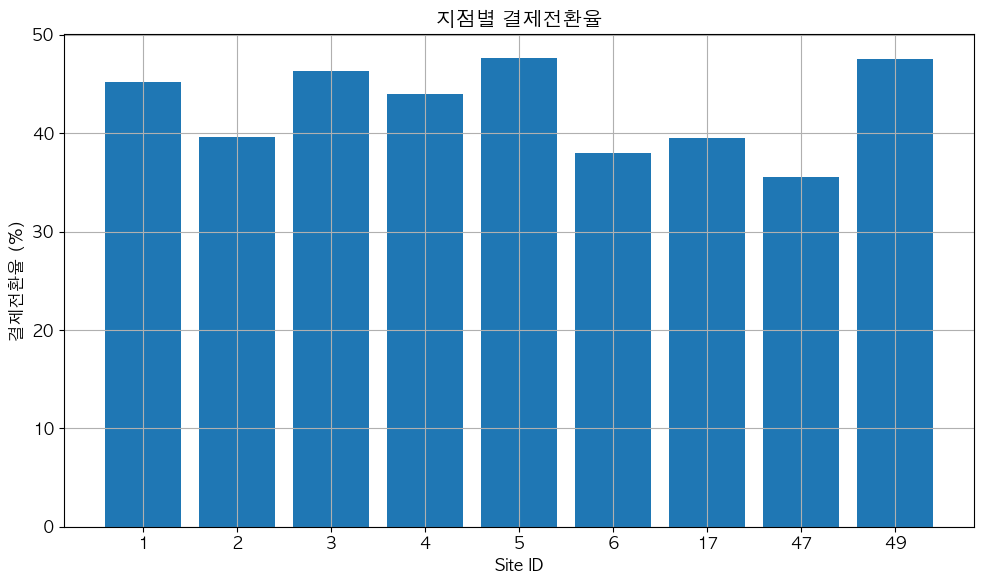

In [ ]:
site_payment_plot = site_payment[site_payment["visit_users"] >= 30].copy()

site_payment_plot = site_payment_plot.sort_values("site_id")
site_payment_plot["site_id"] = site_payment_plot["site_id"].astype(str)

plt.figure(figsize=(10, 6))

plt.bar(
    site_payment_plot["site_id"],
    site_payment_plot["payment_rate"]
)

plt.title("지점별 결제전환율")
plt.xlabel("Site ID")
plt.ylabel("결제전환율 (%)")

plt.tight_layout()
plt.show()

In [ ]:
site_user = visit_with_payment[["site_id", "user_uuid", "is_payment"]].drop_duplicates()

site_conversion = site_user.groupby("site_id").agg(
    visit_users=("user_uuid", "nunique"),
    paid_users=("is_payment", "sum")
).reset_index()

site_conversion["payment_rate"] = (
    site_conversion["paid_users"] / site_conversion["visit_users"] * 100
)

site_conversion = site_conversion.sort_values("site_id")

site_conversion

,site_id,visit_users,paid_users,payment_rate
0,1,918,390,42.483660
1,2,1131,412,36.427940
2,3,1402,600,42.796006
3,4,517,213,41.199226
4,5,619,279,45.072698
5,6,1331,482,36.213373
6,17,482,177,36.721992
7,47,332,113,34.036145
8,49,145,62,42.758621


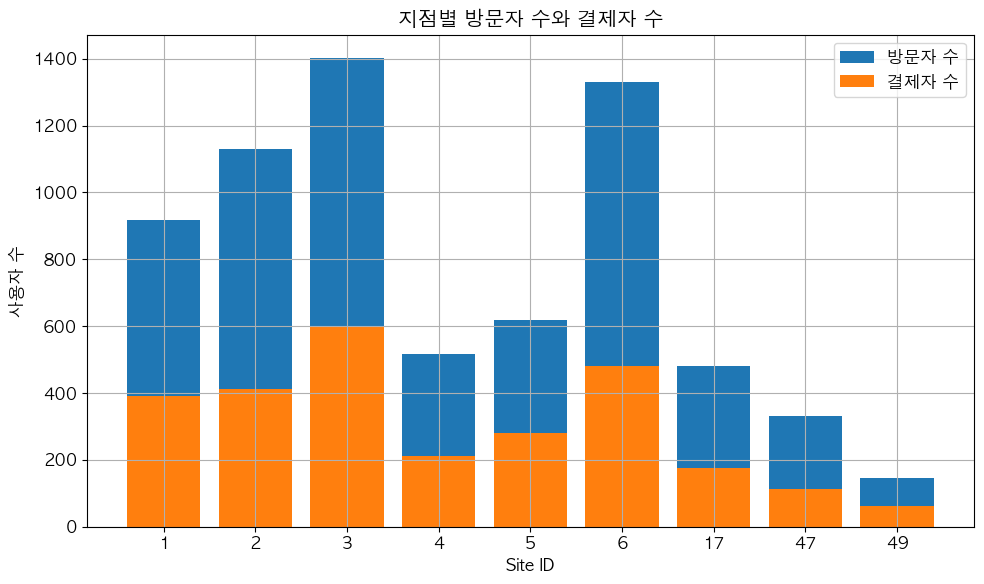

In [ ]:
site_conversion_plot = site_conversion.copy()
site_conversion_plot["site_id"] = site_conversion_plot["site_id"].astype(str)

plt.figure(figsize=(10, 6))

x = range(len(site_conversion_plot))

plt.bar(
    x,
    site_conversion_plot["visit_users"],
    label="방문자 수"
)

plt.bar(
    x,
    site_conversion_plot["paid_users"],
    label="결제자 수"
)

plt.title("지점별 방문자 수와 결제자 수")
plt.xlabel("Site ID")
plt.ylabel("사용자 수")
plt.xticks(x, site_conversion_plot["site_id"])
plt.legend()

plt.tight_layout()
plt.show()

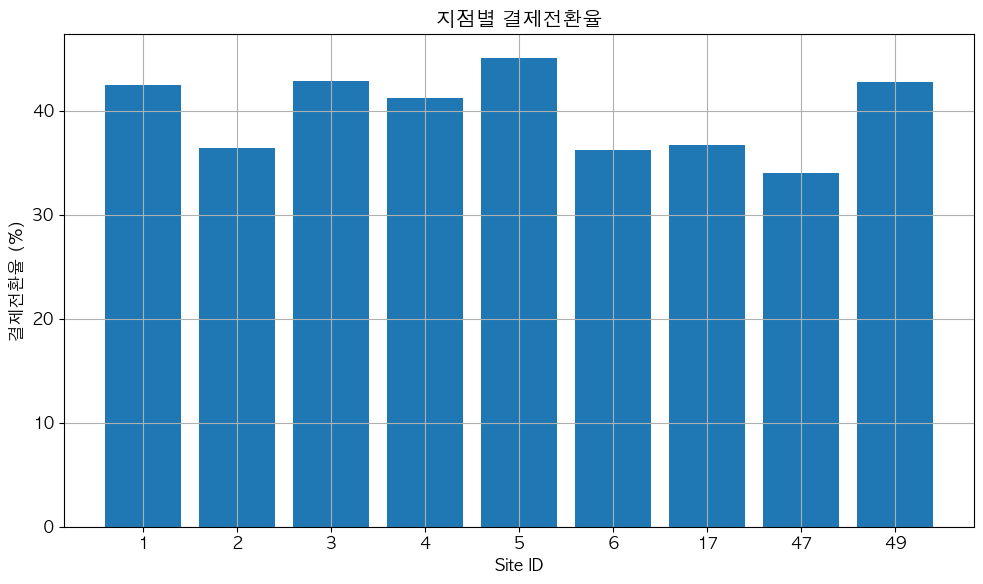

In [ ]:
plt.figure(figsize=(10, 6))

plt.bar(
    site_conversion_plot["site_id"],
    site_conversion_plot["payment_rate"]
)

plt.title("지점별 결제전환율")
plt.xlabel("Site ID")
plt.ylabel("결제전환율 (%)")

plt.tight_layout()
plt.show()

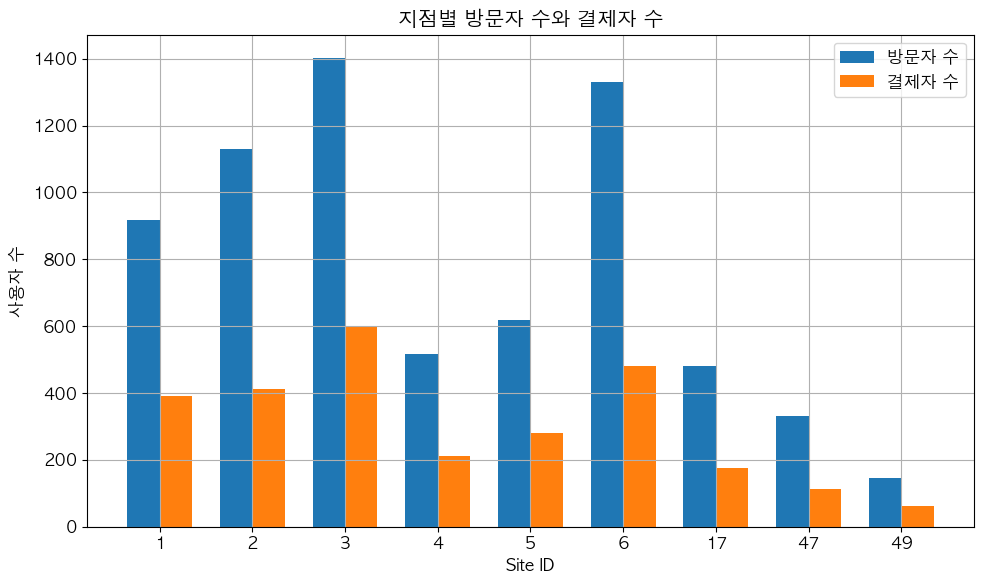

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

site_conversion_plot = site_conversion.sort_values("site_id").copy()
site_conversion_plot["site_id"] = site_conversion_plot["site_id"].astype(str)

x = np.arange(len(site_conversion_plot))
width = 0.35

plt.figure(figsize=(10, 6))

plt.bar(
    x - width / 2,
    site_conversion_plot["visit_users"],
    width,
    label="방문자 수"
)

plt.bar(
    x + width / 2,
    site_conversion_plot["paid_users"],
    width,
    label="결제자 수"
)

plt.title("지점별 방문자 수와 결제자 수")
plt.xlabel("Site ID")
plt.ylabel("사용자 수")
plt.xticks(x, site_conversion_plot["site_id"])
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
site_stay = visit_with_payment.groupby(["site_id", "is_payment"]).agg(
    avg_stay_hour=("stay_time_second", lambda x: x.mean() / 3600)
).reset_index()

site_stay_pivot = site_stay.pivot(
    index="site_id",
    columns="is_payment",
    values="avg_stay_hour"
)

site_stay_pivot

is_payment,0,1
site_id,,
1,4.593422,3.787108
2,5.554046,4.834172
3,5.005134,4.591954
4,4.679501,3.986820
5,4.846031,4.132173
6,5.194066,4.060071
17,4.118597,3.624114
47,4.025014,3.993512
49,4.569704,3.654013


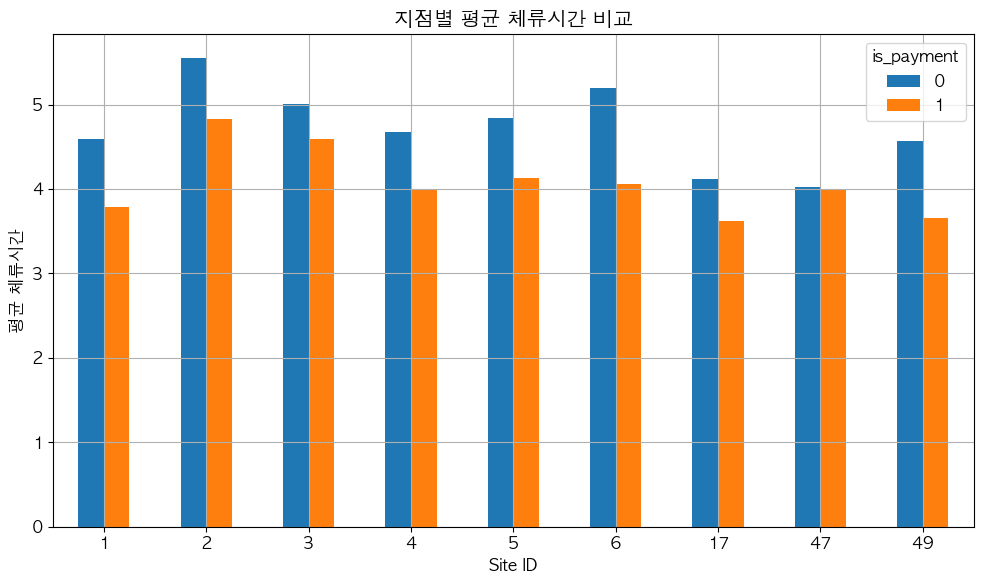

In [ ]:
site_stay_pivot.plot(kind="bar", figsize=(10, 6))

plt.title("지점별 평균 체류시간 비교")
plt.xlabel("Site ID")
plt.ylabel("평균 체류시간")

plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
site_area = pd.read_csv("site_area.csv")

site_area.head()

,site_id,area_pyeong
0,1,50
1,2,100
2,3,150
3,4,100
4,5,150


In [ ]:
site_conversion_area = site_conversion.merge(
    site_area,
    on="site_id",
    how="left"
)

site_conversion_area.sort_values("payment_rate", ascending=False)

,site_id,visit_users,paid_users,payment_rate,area_pyeong
4,5,619,279,45.072698,150
2,3,1402,600,42.796006,150
8,49,145,62,42.758621,50
0,1,918,390,42.483660,50
3,4,517,213,41.199226,100
6,17,482,177,36.721992,50
1,2,1131,412,36.427940,100
5,6,1331,482,36.213373,150
7,47,332,113,34.036145,50


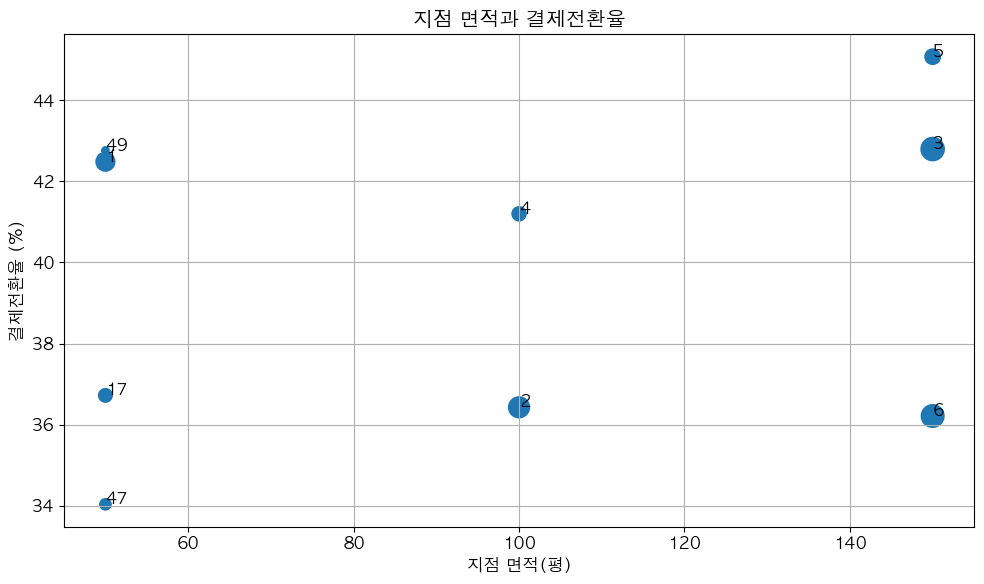

In [ ]:
plt.figure(figsize=(10, 6))

plt.scatter(
    site_conversion_area["area_pyeong"],
    site_conversion_area["payment_rate"],
    s=site_conversion_area["visit_users"] / 5
)

for i in range(len(site_conversion_area)):
    plt.text(
        site_conversion_area["area_pyeong"].iloc[i],
        site_conversion_area["payment_rate"].iloc[i],
        site_conversion_area["site_id"].iloc[i]
    )

plt.title("지점 면적과 결제전환율")
plt.xlabel("지점 면적(평)")
plt.ylabel("결제전환율 (%)")

plt.tight_layout()
plt.show()

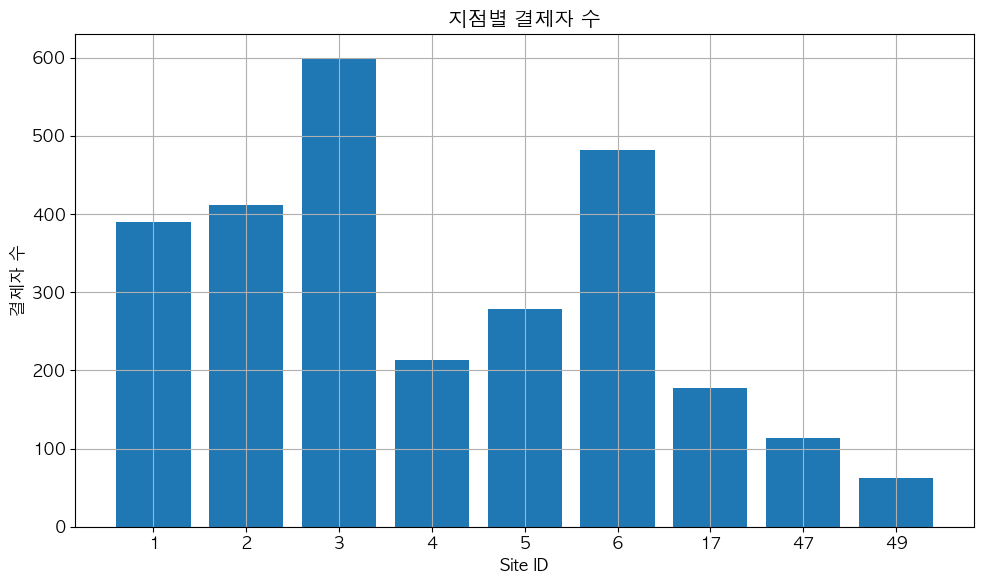

In [ ]:
site_conversion_area_plot = site_conversion_area.sort_values("site_id").copy()
site_conversion_area_plot["site_id"] = site_conversion_area_plot["site_id"].astype(str)

plt.figure(figsize=(10, 6))

plt.bar(
    site_conversion_area_plot["site_id"],
    site_conversion_area_plot["paid_users"]
)

plt.title("지점별 결제자 수")
plt.xlabel("Site ID")
plt.ylabel("결제자 수")

plt.tight_layout()
plt.show()

In [ ]:
site_conversion_area[
    ["site_id", "area_pyeong", "visit_users", "paid_users", "payment_rate"]
].sort_values("payment_rate", ascending=False)

,site_id,area_pyeong,visit_users,paid_users,payment_rate
4,5,150,619,279,45.072698
2,3,150,1402,600,42.796006
8,49,50,145,62,42.758621
0,1,50,918,390,42.483660
3,4,100,517,213,41.199226
6,17,50,482,177,36.721992
1,2,100,1131,412,36.427940
5,6,150,1331,482,36.213373
7,47,50,332,113,34.036145


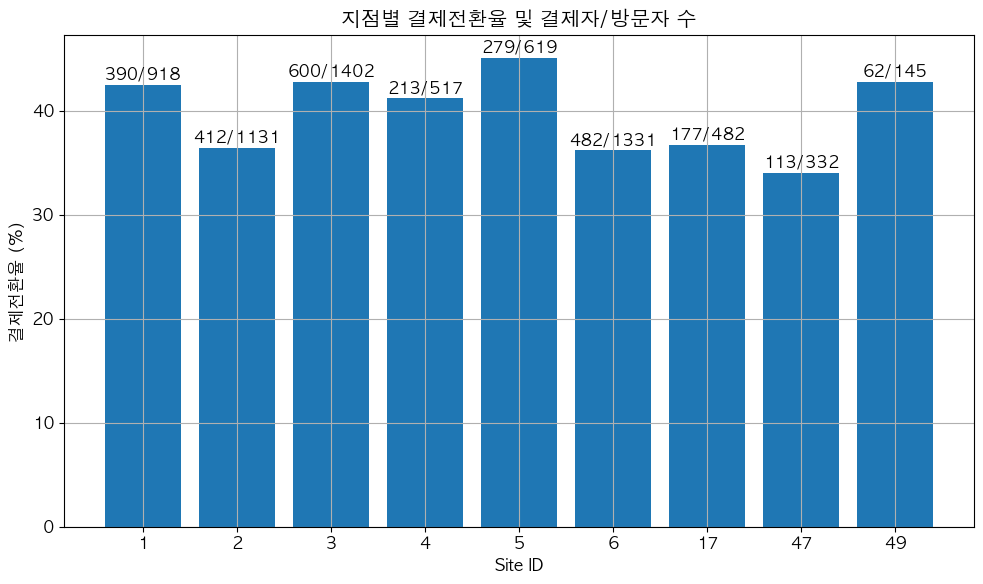

In [ ]:
site_plot = site_conversion_area.sort_values("site_id").copy()
site_plot["site_id"] = site_plot["site_id"].astype(str)

plt.figure(figsize=(10, 6))

bars = plt.bar(
    site_plot["site_id"],
    site_plot["payment_rate"]
)

for bar, paid, visit in zip(
    bars,
    site_plot["paid_users"],
    site_plot["visit_users"]
):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.5,
        f"{int(paid)}/{int(visit)}",
        ha="center"
    )

plt.title("지점별 결제전환율 및 결제자/방문자 수")
plt.xlabel("Site ID")
plt.ylabel("결제전환율 (%)")

plt.tight_layout()
plt.show()

In [ ]:
site_user_area = site_user.merge(site_area, on="site_id", how="left")

site_user_area = site_user_area.drop_duplicates(["area_pyeong", "user_uuid"])

area_conversion = site_user_area.groupby("area_pyeong").agg(
    visit_users=("user_uuid", "nunique"),
    paid_users=("is_payment", "sum")
).reset_index()

area_conversion["payment_rate"] = (
    area_conversion["paid_users"] / area_conversion["visit_users"] * 100
)

area_conversion

,area_pyeong,visit_users,paid_users,payment_rate
0,50,1839,725,39.423600
1,100,1644,624,37.956204
2,150,3302,1332,40.339188


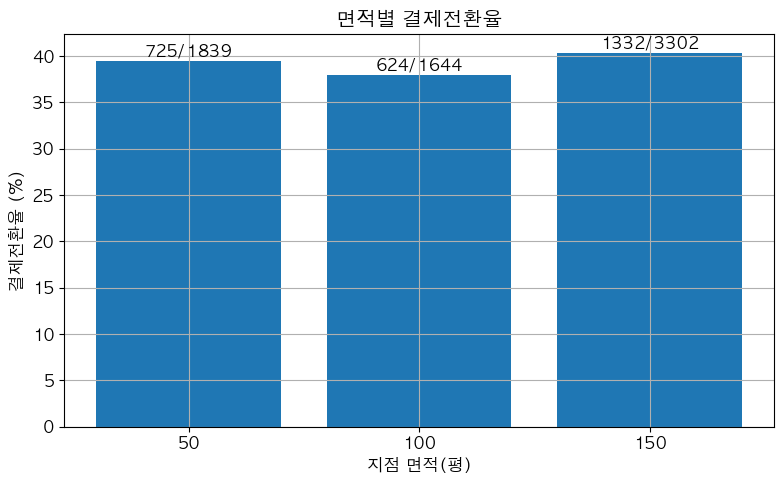

In [ ]:
area_plot = area_conversion.sort_values("area_pyeong").copy()
area_plot["area_pyeong"] = area_plot["area_pyeong"].astype(str)

plt.figure(figsize=(8, 5))

bars = plt.bar(
    area_plot["area_pyeong"],
    area_plot["payment_rate"]
)

for bar, paid, visit in zip(
    bars,
    area_plot["paid_users"],
    area_plot["visit_users"]
):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.5,
        f"{int(paid)}/{int(visit)}",
        ha="center"
    )

plt.title("면적별 결제전환율")
plt.xlabel("지점 면적(평)")
plt.ylabel("결제전환율 (%)")

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

access_log = pd.read_csv("trial_access_log.csv")
payment = pd.read_csv("trial_payment.csv")
register = pd.read_csv("trial_register.csv")
visit_info = pd.read_csv("trial_visit_info.csv")

# 컬럼명 앞뒤 공백 제거
access_log.columns = access_log.columns.str.strip()
payment.columns = payment.columns.str.strip()
register.columns = register.columns.str.strip()
visit_info.columns = visit_info.columns.str.strip()

print("===== access_log 컬럼 =====")
print(access_log.columns.tolist())

print("\n===== payment 컬럼 =====")
print(payment.columns.tolist())

print("\n===== register 컬럼 =====")
print(register.columns.tolist())

print("\n===== visit_info 컬럼 =====")
print(visit_info.columns.tolist())

===== access_log 컬럼 =====
['id', 'checkin', 'cdate', 'site_id', 'user_uuid']

===== payment 컬럼 =====
['is_payment', 'user_uuid']

===== register 컬럼 =====
['trial_date', 'user_uuid']

===== visit_info 컬럼 =====
['site_id', 'date', 'stay_time', 'stay_time_second', 'first_enter_time', 'last_leave_time', 'user_uuid']


In [ ]:
import pandas as pd

# =========================
# 0. 데이터 불러오기
# =========================

access_log = pd.read_csv("trial_access_log.csv")
payment = pd.read_csv("trial_payment.csv")
register = pd.read_csv("trial_register.csv")
visit_info = pd.read_csv("trial_visit_info.csv")

# 컬럼명 앞뒤 공백 제거
access_log.columns = access_log.columns.str.strip()
payment.columns = payment.columns.str.strip()
register.columns = register.columns.str.strip()
visit_info.columns = visit_info.columns.str.strip()

# 유저 식별 컬럼명
user_col = "user_uuid"


# =========================
# 1. access_log 전처리
# =========================

print("access_log 중복 제거 전:", access_log.shape)

access_log = access_log.drop_duplicates().copy()

access_log["cdate"] = pd.to_datetime(access_log["cdate"], errors="coerce")

print("access_log 중복 제거 후:", access_log.shape)


# =========================
# 2. payment 전처리
# =========================

print("payment 중복 제거 전:", payment.shape)

payment = payment.drop_duplicates().copy()

print("payment 중복 제거 후:", payment.shape)


# =========================
# 3. register 전처리
# =========================

print("register 중복 제거 전:", register.shape)

register = register.drop_duplicates().copy()

register["trial_date"] = pd.to_datetime(register["trial_date"], errors="coerce").dt.floor("s")

# 유저별 최신 신청일만 남기기
register = register.sort_values(
    by=[user_col, "trial_date"],
    ascending=[True, True]
)

register = register.drop_duplicates(
    subset=[user_col],
    keep="last"
).copy()

print("register 전처리 후:", register.shape)


# =========================
# 4. visit_info 전처리
# =========================

print("visit_info 중복 제거 전:", visit_info.shape)

visit_info = visit_info.drop_duplicates().copy()

visit_info["date"] = pd.to_datetime(visit_info["date"], errors="coerce")

visit_info["first_enter_time"] = pd.to_datetime(
    visit_info["first_enter_time"],
    errors="coerce"
).dt.floor("s")

visit_info["last_leave_time"] = pd.to_datetime(
    visit_info["last_leave_time"],
    errors="coerce"
).dt.floor("s")

visit_info["stay_time_second"] = pd.to_numeric(
    visit_info["stay_time_second"],
    errors="coerce"
)

visit_info["stay_time_min"] = visit_info["stay_time_second"] / 60

visit_info["total_min"] = (
    visit_info["last_leave_time"] - visit_info["first_enter_time"]
).dt.total_seconds() / 60

visit_info["out_min"] = visit_info["total_min"] - visit_info["stay_time_min"]

# stay_time 컬럼 제거
visit_info = visit_info.drop(columns=["stay_time"], errors="ignore")

# out_min 음수 제거
visit_info = visit_info[
    (visit_info["out_min"].isna()) | (visit_info["out_min"] >= 0)
].copy()

print("visit_info 전처리 후:", visit_info.shape)


# =========================
# 5. 신청일보다 빠른 출입 로그 확인
# =========================

register_for_merge = register[[user_col, "trial_date"]].rename(
    columns={"trial_date": "register_trial_date"}
)

access_register_check = access_log.merge(
    register_for_merge,
    on=user_col,
    how="left"
)

early_access = access_register_check[
    access_register_check["cdate"] < access_register_check["register_trial_date"]
]

print("신청일보다 빠른 출입 로그 수:", len(early_access))
print("신청일보다 빠른 출입 로그 고유 유저 수:", early_access[user_col].nunique())

access_log 중복 제거 전: (63708, 5)
access_log 중복 제거 후: (63349, 5)
payment 중복 제거 전: (9659, 2)
payment 중복 제거 후: (9624, 2)
register 중복 제거 전: (9659, 2)
register 전처리 후: (9624, 2)
visit_info 중복 제거 전: (11477, 7)
visit_info 전처리 후: (11429, 9)
신청일보다 빠른 출입 로그 수: 164
신청일보다 빠른 출입 로그 고유 유저 수: 60


In [ ]:
full_day_visit = visit_info[
    (visit_info["first_enter_time"].dt.time.astype(str) == "00:00:00") &
    (visit_info["last_leave_time"].dt.time.astype(str) == "23:59:59")
]

print("00:00:00 ~ 23:59:59 케이스 수:", len(full_day_visit))
print("고유 유저 수:", full_day_visit["user_uuid"].nunique())
print(full_day_visit.head())

00:00:00 ~ 23:59:59 케이스 수: 0
고유 유저 수: 0
Empty DataFrame
Columns: [site_id, date, stay_time_second, first_enter_time, last_leave_time, user_uuid, stay_time_min, total_min, out_min]
Index: []


In [ ]:
access_log["date"] = access_log["cdate"].dt.date
visit_info["visit_date"] = visit_info["date"].dt.date

access_daily = access_log.groupby(["user_uuid", "site_id", "date"]).agg(
    access_first_time=("cdate", "min"),
    access_last_time=("cdate", "max"),
    access_count=("cdate", "count")
).reset_index()

visit_check = visit_info.merge(
    access_daily,
    left_on=["user_uuid", "site_id", "visit_date"],
    right_on=["user_uuid", "site_id", "date"],
    how="left"
)

print(visit_check[[
    "user_uuid",
    "site_id",
    "visit_date",
    "first_enter_time",
    "last_leave_time",
    "access_first_time",
    "access_last_time",
    "access_count"
]].head())

                              user_uuid  site_id  visit_date  \
0  939fc566-61cd-47f0-a3ce-e2936fdcff73        1  2023-12-23   
1  939fc566-61cd-47f0-a3ce-e2936fdcff73        1  2023-12-24   
2  939fc566-61cd-47f0-a3ce-e2936fdcff73        1  2023-12-25   
3  ba49324f-d317-4053-adf9-2b17b3f07594        1  2023-12-23   
4  ba49324f-d317-4053-adf9-2b17b3f07594        3  2023-12-26   

     first_enter_time     last_leave_time          access_first_time  \
0 2023-12-23 16:11:25 2023-12-23 17:25:32 2023-12-23 07:11:25.888624   
1 2023-12-24 16:10:45 2023-12-24 20:53:34 2023-12-24 07:10:46.214942   
2 2023-12-25 10:19:47 2023-12-25 12:39:51 2023-12-25 01:19:47.690764   
3 2023-12-23 14:49:40 2023-12-23 19:27:39 2023-12-23 05:49:40.844597   
4 2023-12-26 14:57:10 2023-12-26 19:34:36                        NaT   

            access_last_time  access_count  
0 2023-12-23 08:25:32.797735           4.0  
1 2023-12-24 11:53:35.456099           8.0  
2 2023-12-25 03:39:51.728980           6.0  
3 

In [ ]:
access_register_check["is_early_access"] = (
    access_register_check["cdate"] < access_register_check["register_trial_date"]
)

In [ ]:
early_access = access_register_check[
    access_register_check["is_early_access"]
].copy()

early_access["diff_hours"] = (
    early_access["register_trial_date"] - early_access["cdate"]
).dt.total_seconds() / 3600

print(early_access["diff_hours"].describe())

count    164.000000
mean       2.490437
std        3.081744
min        0.000675
25%        0.331987
50%        0.812489
75%        4.101737
max        8.997731
Name: diff_hours, dtype: float64


In [ ]:
missing_first = visit_check["first_enter_time"].isna()
missing_last = visit_check["last_leave_time"].isna()

can_fill_first = missing_first & visit_check["access_first_time"].notna()
can_fill_last = missing_last & visit_check["access_last_time"].notna()

print("first_enter_time 결측 수:", missing_first.sum())
print("first_enter_time access_log로 대체 가능:", can_fill_first.sum())

print("last_leave_time 결측 수:", missing_last.sum())
print("last_leave_time access_log로 대체 가능:", can_fill_last.sum())

first_enter_time 결측 수: 1347
first_enter_time access_log로 대체 가능: 888
last_leave_time 결측 수: 1324
last_leave_time access_log로 대체 가능: 1186


In [ ]:
visit_check["final_first_enter_time"] = visit_check["first_enter_time"].fillna(
    visit_check["access_first_time"]
)

visit_check["final_last_leave_time"] = visit_check["last_leave_time"].fillna(
    visit_check["access_last_time"]
)

In [ ]:
# access_log로 입실/퇴실 시간 보완 여부 표시
visit_check["first_time_filled_by_access"] = (
    visit_check["first_enter_time"].isna() &
    visit_check["access_first_time"].notna()
)

visit_check["last_time_filled_by_access"] = (
    visit_check["last_leave_time"].isna() &
    visit_check["access_last_time"].notna()
)

# 최종 입실/퇴실 시간 컬럼 생성
visit_check["final_first_enter_time"] = visit_check["first_enter_time"].fillna(
    visit_check["access_first_time"]
)

visit_check["final_last_leave_time"] = visit_check["last_leave_time"].fillna(
    visit_check["access_last_time"]
)

# 보정 후 결측 확인
print("보정 후 first_enter_time 결측 수:", visit_check["final_first_enter_time"].isna().sum())
print("보정 후 last_leave_time 결측 수:", visit_check["final_last_leave_time"].isna().sum())

# access_log로 보완된 수 확인
print("access_log로 입실 시간 보완된 수:", visit_check["first_time_filled_by_access"].sum())
print("access_log로 퇴실 시간 보완된 수:", visit_check["last_time_filled_by_access"].sum())

보정 후 first_enter_time 결측 수: 459
보정 후 last_leave_time 결측 수: 138
access_log로 입실 시간 보완된 수: 888
access_log로 퇴실 시간 보완된 수: 1186


In [ ]:
visit_check["final_total_min"] = (
    visit_check["final_last_leave_time"] - visit_check["final_first_enter_time"]
).dt.total_seconds() / 60

visit_check["final_out_min"] = visit_check["final_total_min"] - visit_check["stay_time_min"]

print(visit_check["final_total_min"].describe())
print(visit_check["final_out_min"].describe())

count    10927.000000
mean       295.203609
std        255.409834
min       -959.622827
25%        123.500000
50%        262.016667
75%        447.325000
max       1425.400000
Name: final_total_min, dtype: float64
count    10927.000000
mean        16.332870
std        187.293632
min      -1437.429589
25%          0.016667
50%          6.500000
75%         50.666667
max       1338.184040
Name: final_out_min, dtype: float64


In [ ]:
negative_final_out = visit_check[visit_check["final_out_min"] < 0]

print("보정 후 final_out_min 음수 케이스:", len(negative_final_out))

negative_final_out[[
    "user_uuid",
    "site_id",
    "visit_date",
    "final_first_enter_time",
    "final_last_leave_time",
    "stay_time_min",
    "final_total_min",
    "final_out_min",
    "access_count"
]].head()

보정 후 final_out_min 음수 케이스: 843


,user_uuid,site_id,visit_date,final_first_enter_time,final_last_leave_time,stay_time_min,final_total_min,final_out_min,access_count
51,a806f6d6-4bea-40df-b870-212859386e9d,2,2023-12-30,2023-12-30 22:05:32.000000,2023-12-30 15:30:23.735595,111.850000,-395.137740,-506.987740,6.0
81,f70fa4ed-8364-499c-8c49-6d232e6c271b,3,2023-12-29,2023-12-29 03:08:43.349831,2023-12-29 15:26:42.000000,920.700000,737.977503,-182.722497,9.0
98,4df43903-b549-405f-90e2-aa769c301ba9,6,2023-12-20,2023-12-20 22:17:58.000000,2023-12-20 19:53:40.274197,102.000000,-144.295430,-246.295430,2.0
115,868bd6d8-a092-4e16-8974-87c11ac0e357,6,2023-12-27,2023-12-27 22:06:43.000000,2023-12-27 15:04:30.171901,100.683333,-422.213802,-522.897135,4.0
121,fa06b23d-3a20-448f-8791-557beff8df9f,6,2023-12-29,2023-12-29 12:39:05.000000,2023-12-29 23:11:11.315447,651.416667,632.105257,-19.311409,9.0


In [ ]:
# 결제 여부 컬럼 만들기
payment_user = payment.groupby("user_uuid").agg(
    is_payment=("is_payment", "max")
).reset_index()

# 방문 정보를 유저 단위로 요약
visit_user = visit_check.groupby("user_uuid").agg(
    visit_count=("visit_date", "count"),
    site_count=("site_id", "nunique"),
    total_stay_min=("stay_time_min", "sum"),
    avg_stay_min=("stay_time_min", "mean"),
    max_stay_min=("stay_time_min", "max"),
    total_out_min=("out_min", "sum"),
    avg_out_min=("out_min", "mean"),
    access_day_count=("access_count", "count"),
    total_access_count=("access_count", "sum"),
    missing_first_count=("final_first_enter_time", lambda x: x.isna().sum()),
    missing_last_count=("final_last_leave_time", lambda x: x.isna().sum())
).reset_index()

# 신청일 붙이기
register_user = register[["user_uuid", "trial_date"]].copy()

# 유저 단위 데이터 합치기
user_df = register_user.merge(payment_user, on="user_uuid", how="left")
user_df = user_df.merge(visit_user, on="user_uuid", how="left")

# 결제 기록이 없으면 0으로 처리
user_df["is_payment"] = user_df["is_payment"].fillna(0)

print(user_df.head())
print(user_df.shape)

                              user_uuid trial_date  is_payment  visit_count  \
0  000590dc-046f-462b-8225-4c81a97b7166 2023-09-04           0          1.0   
1  000a5d24-2da9-4c51-8a2b-ea3caba1553b 2021-10-16           0          NaN   
2  000be14f-ba0f-4af6-bc2c-7b00dfcbc98c 2021-09-29           1          3.0   
3  0013f481-efed-4508-8836-70cbd64c477e 2023-04-03           1          NaN   
4  0018e22d-a2cc-4e06-bca2-d6a041770f3b 2023-11-14           0          2.0   

   site_count  total_stay_min  avg_stay_min  max_stay_min  total_out_min  \
0         1.0      356.950000    356.950000        356.95       5.783333   
1         NaN             NaN           NaN           NaN            NaN   
2         1.0      759.483333    253.161111        432.75     152.500000   
3         NaN             NaN           NaN           NaN            NaN   
4         1.0     1289.533333    644.766667        715.00       8.300000   

   avg_out_min  access_day_count  total_access_count  missing_first_

In [ ]:
compare_payment = user_df.groupby("is_payment").agg(
    user_count=("user_uuid", "count"),
    avg_visit_count=("visit_count", "mean"),
    avg_site_count=("site_count", "mean"),
    avg_total_stay_min=("total_stay_min", "mean"),
    avg_avg_stay_min=("avg_stay_min", "mean"),
    avg_total_access_count=("total_access_count", "mean")
).reset_index()

print(compare_payment)

   is_payment  user_count  avg_visit_count  avg_site_count  \
0           0        5972         1.657179        1.045088   
1           1        3652         1.891576        1.063963   

   avg_total_stay_min  avg_avg_stay_min  avg_total_access_count  
0          490.603854        276.721715                9.677834  
1          480.564925        243.366849                9.430967  


In [ ]:
user_df["visit_count_bin"] = pd.cut(
    user_df["visit_count"],
    bins=[-1, 0, 1, 2, 3, 5, 10, 100],
    labels=["0회", "1회", "2회", "3회", "4~5회", "6~10회", "11회 이상"]
)

visit_conversion = user_df.groupby("visit_count_bin").agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(visit_conversion)

  visit_count_bin  user_count  payment_rate
0              0회           0           NaN
1              1회        3189      0.333647
2              2회        1926      0.419522
3              3회        1299      0.463433
4            4~5회         119      0.756303
5           6~10회           1      0.000000
6          11회 이상           0           NaN


/var/folders/78/w7z6vd_j3w34d6k2_5x3t9dh0000gn/T/ipykernel_29924/3589359104.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  visit_conversion = user_df.groupby("visit_count_bin").agg(


In [ ]:
first_visit = visit_check.groupby("user_uuid").agg(
    first_visit_time=("final_first_enter_time", "min")
).reset_index()

user_df = user_df.merge(first_visit, on="user_uuid", how="left")

user_df["hours_to_first_visit"] = (
    user_df["first_visit_time"] - user_df["trial_date"]
).dt.total_seconds() / 3600

print(user_df["hours_to_first_visit"].describe())

count    6503.000000
mean       38.637079
std        20.988917
min         0.001944
25%        21.544583
50%        37.215556
75%        44.810556
max        95.113056
Name: hours_to_first_visit, dtype: float64


In [ ]:
user_df["first_visit_bin"] = pd.cut(
    user_df["hours_to_first_visit"],
    bins=[-1000, 0, 6, 24, 72, 168, 10000],
    labels=["신청 전/동시", "6시간 이내", "24시간 이내", "3일 이내", "7일 이내", "7일 초과"]
)

first_visit_conversion = user_df.groupby("first_visit_bin").agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(first_visit_conversion)

  first_visit_bin  user_count  payment_rate
0         신청 전/동시           0           NaN
1          6시간 이내         149      0.503356
2         24시간 이내        1509      0.356528
3           3일 이내        4360      0.395413
4           7일 이내         485      0.435052
5           7일 초과           0           NaN


/var/folders/78/w7z6vd_j3w34d6k2_5x3t9dh0000gn/T/ipykernel_29924/3402031644.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  first_visit_conversion = user_df.groupby("first_visit_bin").agg(


In [ ]:
user_df["visit_count"] = user_df["visit_count"].fillna(0)
user_df["site_count"] = user_df["site_count"].fillna(0)
user_df["total_stay_min"] = user_df["total_stay_min"].fillna(0)
user_df["total_access_count"] = user_df["total_access_count"].fillna(0)

In [ ]:
user_df["visit_count_bin"] = pd.cut(
    user_df["visit_count"],
    bins=[-1, 0, 1, 2, 3, 5, 10, 100],
    labels=["0회", "1회", "2회", "3회", "4~5회", "6~10회", "11회 이상"]
)

visit_conversion = user_df.groupby("visit_count_bin").agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(visit_conversion)

  visit_count_bin  user_count  payment_rate
0              0회        3090      0.352104
1              1회        3189      0.333647
2              2회        1926      0.419522
3              3회        1299      0.463433
4            4~5회         119      0.756303
5           6~10회           1      0.000000
6          11회 이상           0           NaN


/var/folders/78/w7z6vd_j3w34d6k2_5x3t9dh0000gn/T/ipykernel_29924/3589359104.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  visit_conversion = user_df.groupby("visit_count_bin").agg(


In [ ]:
# 4회 이상 방문한 유저 추출
many_visit_users = user_df[user_df["visit_count"] >= 4]["user_uuid"]

# 4회 이상 방문한 유저의 방문 상세 기록 추출
many_visit_detail = visit_check[
    visit_check["user_uuid"].isin(many_visit_users)
].copy()

# visit_check 안에 trial_date가 없을 때만 register에서 붙이기
if "trial_date" not in many_visit_detail.columns:
    many_visit_detail = many_visit_detail.merge(
        register[["user_uuid", "trial_date"]],
        on="user_uuid",
        how="left"
    )

# 날짜 형식으로 변환
many_visit_detail["visit_date_dt"] = pd.to_datetime(
    many_visit_detail["visit_date"],
    errors="coerce"
).dt.normalize()

many_visit_detail["trial_date_dt"] = pd.to_datetime(
    many_visit_detail["trial_date"],
    errors="coerce"
).dt.normalize()

# 신청일 기준 며칠 뒤 방문했는지 계산
many_visit_detail["days_from_trial"] = (
    many_visit_detail["visit_date_dt"] - many_visit_detail["trial_date_dt"]
).dt.days

# 결과 확인
many_visit_detail[[
    "user_uuid",
    "site_id",
    "visit_date",
    "trial_date",
    "days_from_trial",
    "first_enter_time",
    "last_leave_time",
    "access_count"
]].sort_values(["user_uuid", "visit_date"]).head(30)

,user_uuid,site_id,visit_date,trial_date,days_from_trial,first_enter_time,last_leave_time,access_count
222,01260e33-69c0-45da-bad1-e21c6e7a82b3,1,2023-12-14,2023-12-14,0,2023-12-14 15:29:22,2023-12-14 18:33:00,7.0
223,01260e33-69c0-45da-bad1-e21c6e7a82b3,1,2023-12-16,2023-12-14,2,2023-12-16 13:54:13,2023-12-16 13:55:17,2.0
224,01260e33-69c0-45da-bad1-e21c6e7a82b3,17,2023-12-16,2023-12-14,2,2023-12-16 14:30:14,2023-12-16 20:15:45,8.0
225,01260e33-69c0-45da-bad1-e21c6e7a82b3,17,2023-12-17,2023-12-14,3,2023-12-17 12:19:04,2023-12-17 18:55:54,NaN
216,01dab720-a416-4444-94bc-dee7fdbe8bd2,17,2023-12-11,2023-12-11,0,2023-12-11 21:02:51,2023-12-11 21:42:10,2.0
214,01dab720-a416-4444-94bc-dee7fdbe8bd2,17,2023-12-12,2023-12-11,1,2023-12-12 10:09:16,2023-12-12 10:38:08,2.0
215,01dab720-a416-4444-94bc-dee7fdbe8bd2,17,2023-12-13,2023-12-11,2,2023-12-13 20:30:36,2023-12-13 21:07:40,2.0
217,01dab720-a416-4444-94bc-dee7fdbe8bd2,17,2023-12-14,2023-12-11,3,2023-12-14 21:23:18,2023-12-14 22:09:15,NaN
174,039fa563-fc65-4b0c-9087-4beb5cd17fd7,17,2023-11-24,2023-11-24,0,2023-11-24 14:26:26,2023-11-24 16:21:33,2.0
175,039fa563-fc65-4b0c-9087-4beb5cd17fd7,1,2023-11-25,2023-11-24,1,2023-11-25 15:01:40,NaT,10.0


In [ ]:
print("days_from_trial 최솟값:", many_visit_detail["days_from_trial"].min())
print("days_from_trial 최댓값:", many_visit_detail["days_from_trial"].max())

print("\ndays_from_trial 분포:")
print(many_visit_detail["days_from_trial"].value_counts().sort_index())

days_from_trial 최솟값: 0
days_from_trial 최댓값: 3

days_from_trial 분포:
days_from_trial
0    114
1    125
2    134
3    118
Name: count, dtype: int64


In [ ]:
many_visit_summary = many_visit_detail.groupby("user_uuid").agg(
    visit_row_count=("visit_date", "count"),
    visit_day_count=("visit_date", "nunique"),
    site_count=("site_id", "nunique"),
    min_days_from_trial=("days_from_trial", "min"),
    max_days_from_trial=("days_from_trial", "max"),
    total_access_count=("access_count", "sum")
).reset_index()

print(many_visit_summary.head(20))

                               user_uuid  visit_row_count  visit_day_count  \
0   01260e33-69c0-45da-bad1-e21c6e7a82b3                4                3   
1   01dab720-a416-4444-94bc-dee7fdbe8bd2                4                4   
2   039fa563-fc65-4b0c-9087-4beb5cd17fd7                4                3   
3   04e9979d-6010-49bf-b0bc-7d1b291568ea                4                3   
4   051c2bb0-dcdf-494d-b10c-d72f2c23fccb                4                4   
5   0563c265-e2e2-4bc9-ba7d-70dfeee006ee                4                4   
6   07d073f3-d749-4a78-bc20-099d23ba93b3                4                4   
7   08159317-8a5c-4774-a8d8-97dac9146f86                4                4   
8   091cdea5-fc99-47fd-a722-3fe190f9cb26                4                4   
9   0c440362-8504-42db-9f94-4363d41dc0d3                4                4   
10  0c956ea3-a6ea-4d8b-885f-ed3b3796b51d                4                4   
11  0ce047b4-9523-4d17-9d9d-a98a01982c5c                4       

In [ ]:
visit_day_user = visit_check.groupby("user_uuid").agg(
    visit_row_count=("visit_date", "count"),
    visit_day_count=("visit_date", "nunique"),
    site_count=("site_id", "nunique"),
    total_stay_min=("stay_time_min", "sum"),
    avg_stay_min=("stay_time_min", "mean"),
    total_access_count=("access_count", "sum")
).reset_index()

user_df = user_df.drop(
    columns=["visit_row_count", "visit_day_count"],
    errors="ignore"
)

user_df = user_df.merge(
    visit_day_user[["user_uuid", "visit_row_count", "visit_day_count"]],
    on="user_uuid",
    how="left"
)

user_df["visit_row_count"] = user_df["visit_row_count"].fillna(0)
user_df["visit_day_count"] = user_df["visit_day_count"].fillna(0)

In [ ]:
day_conversion = user_df.groupby("visit_day_count").agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(day_conversion)

   visit_day_count  user_count  payment_rate
0              0.0        3090      0.352104
1              1.0        3220      0.334161
2              2.0        1932      0.419772
3              3.0        1297      0.468003
4              4.0          85      0.823529


In [ ]:
# access_log를 유저별로 요약하기
access_user_check = access_log.groupby("user_uuid").agg(
    access_log_count=("cdate", "count"),
    access_site_count=("site_id", "nunique")
).reset_index()

# visit_info 기준 방문일수 0일인 유저만 뽑기
zero_day_users = user_df[user_df["visit_day_count"] == 0].copy()

# 0일 방문 유저에게 access_log 기록 붙이기
zero_day_check = zero_day_users.merge(
    access_user_check,
    on="user_uuid",
    how="left"
)

# access_log가 없으면 0으로 채우기
zero_day_check["access_log_count"] = zero_day_check["access_log_count"].fillna(0)
zero_day_check["access_site_count"] = zero_day_check["access_site_count"].fillna(0)

# 결과 확인
print("0일 방문 유저 수:", len(zero_day_check))
print("0일 방문 유저 중 결제자 수:", zero_day_check["is_payment"].sum())
print("0일 방문 유저 중 access_log 있는 유저 수:", (zero_day_check["access_log_count"] > 0).sum())
print("0일 방문 유저 중 access_log 없는 유저 수:", (zero_day_check["access_log_count"] == 0).sum())

0일 방문 유저 수: 3090
0일 방문 유저 중 결제자 수: 1088
0일 방문 유저 중 access_log 있는 유저 수: 3
0일 방문 유저 중 access_log 없는 유저 수: 3087


In [ ]:
user_df["visit_status"] = user_df["visit_day_count"].apply(
    lambda x: "방문 없음" if x == 0 else "방문 있음"
)

visit_status_summary = user_df.groupby("visit_status").agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean"),
    avg_visit_day_count=("visit_day_count", "mean")
).reset_index()

print(visit_status_summary)

  visit_status  user_count  payment_count  payment_rate  avg_visit_day_count
0        방문 없음        3090           1088      0.352104             0.000000
1        방문 있음        6534           2564      0.392409             1.731711


In [ ]:
visited_users = user_df[user_df["visit_day_count"] > 0].copy()

visited_day_conversion = visited_users.groupby("visit_day_count").agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(visited_day_conversion)

   visit_day_count  user_count  payment_rate
0              1.0        3220      0.334161
1              2.0        1932      0.419772
2              3.0        1297      0.468003
3              4.0          85      0.823529


In [ ]:
import pandas as pd

master = pd.read_csv("/Users/crim/Downloads/중급 2/master_data_new2.csv")

print(master.shape)
print(master.columns)
print(master.head())
print(master.info())

(9624, 37)
Index(['trial_date', 'user_uuid', 'is_payment', 'visit_days', 'visit_count',
       'total_stay_min', 'avg_stay_min', 'total_out_min', 'avg_out_min',
       'access_count', 'first_access_time', 'last_access_time', 'has_visit',
       'has_access', 'days_to_first_access', 'days_to_last_access', 'site_id',
       'site_visit_count', 'area_pyeong', 'register_count', 're_register_yn',
       'sites_used', 'days_active', 'visit_density', 'first_visit',
       'last_visit', 'max_stay_sec', 'stay_hour_group', 'avg_enter_hour',
       'weekend_ratio', 'checkin_count', 'checkout_count',
       'main_site_stay_sec', 'main_site_visit_days', 'trial_month',
       'trial_dow', 'first_visit_gap'],
      dtype='object')
   trial_date                             user_uuid  is_payment  visit_days  \
0  2023-09-04  000590dc-046f-462b-8225-4c81a97b7166           0         1.0   
1  2021-10-16  000a5d24-2da9-4c51-8a2b-ea3caba1553b           0         0.0   
2  2021-09-29  000be14f-ba0f-4af6-bc2

In [ ]:
print(master["is_payment"].value_counts())
print(master["is_payment"].value_counts(normalize=True))

is_payment
0    5972
1    3652
Name: count, dtype: int64
is_payment
0    0.620532
1    0.379468
Name: proportion, dtype: float64


In [ ]:
print("전체 행 수:", len(master))
print("고유 유저 수:", master["user_uuid"].nunique())
print("중복 유저 수:", master["user_uuid"].duplicated().sum())

전체 행 수: 9624
고유 유저 수: 9624
중복 유저 수: 0


In [ ]:
missing_check = master.isna().sum().sort_values(ascending=False)

print(missing_check)

avg_enter_hour          3614
days_to_first_access    3598
first_access_time       3598
last_access_time        3598
days_to_last_access     3598
weekend_ratio           3417
area_pyeong             3090
main_site_visit_days    3090
main_site_stay_sec      3090
last_visit              3090
first_visit             3090
site_visit_count        3090
site_id                 3090
first_visit_gap         3090
has_access                 0
max_stay_sec               0
trial_dow                  0
trial_month                0
is_payment                 0
visit_days                 0
checkout_count             0
checkin_count              0
visit_count                0
total_stay_min             0
stay_hour_group            0
avg_stay_min               0
has_visit                  0
total_out_min              0
visit_density              0
days_active                0
sites_used                 0
re_register_yn             0
register_count             0
user_uuid                  0
avg_out_min   

In [ ]:
import pandas as pd

master["trial_date"] = pd.to_datetime(master["trial_date"], errors="coerce")

master["trial_end"] = master["trial_date"] + pd.Timedelta(days=3)

date_cols = [
    "first_visit",
    "last_visit",
    "first_access_time",
    "last_access_time"
]

for col in date_cols:
    master[col] = pd.to_datetime(master[col], errors="coerce")
    
    after_trial_count = (master[col] > master["trial_end"]).sum()
    
    print(col, "체험 종료 후 기록 수:", after_trial_count)

first_visit 체험 종료 후 기록 수: 0
last_visit 체험 종료 후 기록 수: 0
first_access_time 체험 종료 후 기록 수: 0
last_access_time 체험 종료 후 기록 수: 0


In [ ]:
master["visit_group"] = master["visit_days"].apply(
    lambda x: "방문 없음" if x == 0 else ("1일 방문" if x == 1 else "2일 이상 방문")
)

visit_group_summary = master.groupby("visit_group").agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(visit_group_summary)

  visit_group  user_count  payment_rate
0       1일 방문        3220      0.334161
1    2일 이상 방문        3314      0.449004
2       방문 없음        3090      0.352104


In [ ]:
gap_summary = master.groupby("first_visit_gap").agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(gap_summary)

   first_visit_gap  user_count  payment_rate
0              0.0        1663      0.369212
1              1.0        3351      0.391823
2              2.0        1009      0.406343
3              3.0         511      0.444227


In [ ]:
stay_summary = master.groupby("stay_hour_group").agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(stay_summary)

  stay_hour_group  user_count  payment_rate
0            0-2h        1105      0.385520
1              0h        3090      0.352104
2          10-24h        1682      0.391201
3            2-5h        1697      0.408957
4            24h+         254      0.374016
5           5-10h        1796      0.384744


In [ ]:
gap_visit_summary = master.groupby(["first_visit_gap", "visit_days"]).agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(gap_visit_summary)

   first_visit_gap  visit_days  user_count  payment_rate
0              0.0         1.0         755      0.251656
1              0.0         2.0         456      0.418860
2              0.0         3.0         367      0.444142
3              0.0         4.0          85      0.823529
4              1.0         1.0        1286      0.317263
5              1.0         2.0        1135      0.406167
6              1.0         3.0         930      0.477419
7              2.0         1.0         668      0.375749
8              2.0         2.0         341      0.466276
9              3.0         1.0         511      0.444227


In [ ]:
stay_visit_summary = master.groupby(["stay_hour_group", "visit_days"]).agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(stay_visit_summary)

   stay_hour_group  visit_days  user_count  payment_rate
0             0-2h         1.0        1001      0.365634
1             0-2h         2.0          94      0.585106
2             0-2h         3.0          10      0.500000
3               0h         0.0        3090      0.352104
4           10-24h         1.0         115      0.321739
5           10-24h         2.0         708      0.324859
6           10-24h         3.0         812      0.434729
7           10-24h         4.0          47      0.808511
8             2-5h         1.0        1290      0.348837
9             2-5h         2.0         329      0.556231
10            2-5h         3.0          75      0.773333
11            2-5h         4.0           3      1.000000
12            24h+         2.0          33      0.393939
13            24h+         3.0         196      0.316327
14            24h+         4.0          25      0.800000
15           5-10h         1.0         814      0.273956
16           5-10h         2.0 

In [ ]:
def make_segment(row):
    if row["visit_days"] == 0:
        return "미방문 유저"
    elif row["visit_days"] == 1:
        return "1일 방문 유저"
    elif row["visit_days"] >= 2 and row["stay_hour_group"] == "2-5h":
        return "적정 체류 반복 방문 유저"
    elif row["visit_days"] >= 2:
        return "반복 방문 유저"
    else:
        return "기타"

master["segment"] = master.apply(make_segment, axis=1)

segment_summary = master.groupby("segment").agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean"),
    avg_visit_days=("visit_days", "mean"),
    avg_total_stay_min=("total_stay_min", "mean")
).reset_index()

print(segment_summary)

          segment  user_count  payment_count  payment_rate  avg_visit_days  \
0        1일 방문 유저        3220           1076      0.334161        1.000000   
1          미방문 유저        3090           1088      0.352104        0.000000   
2        반복 방문 유저        2907           1244      0.427933        2.476780   
3  적정 체류 반복 방문 유저         407            244      0.599509        2.199017   

   avg_total_stay_min  
0          235.152288  
1            0.000000  
2          803.433700  
3          213.989271  


In [ ]:
print("행/열 개수:", master.shape)

print("\n결제 여부 분포")
print(master["is_payment"].value_counts())

print("\n결제 여부 비율")
print(master["is_payment"].value_counts(normalize=True))

print("\n숫자형 컬럼 요약")
print(master.describe())

행/열 개수: (9624, 40)

결제 여부 분포
is_payment
0    5972
1    3652
Name: count, dtype: int64

결제 여부 비율
is_payment
0    0.620532
1    0.379468
Name: proportion, dtype: float64

숫자형 컬럼 요약
                          trial_date   is_payment   visit_days  visit_count  \
count                           9624  9624.000000  9624.000000  9624.000000   
mean   2022-08-08 21:55:48.628429056     0.379468     1.175707     1.187552   
min              2021-05-01 00:00:00     0.000000     0.000000     0.000000   
25%              2021-11-25 00:00:00     0.000000     0.000000     0.000000   
50%              2022-08-02 00:00:00     0.000000     1.000000     1.000000   
75%              2023-04-11 00:00:00     1.000000     2.000000     2.000000   
max              2023-12-31 00:00:00     1.000000     4.000000     6.000000   
std                              NaN     0.485280     1.053385     1.070733   

       total_stay_min  avg_stay_min  total_out_min  avg_out_min  access_count  \
count     9624.000000   9624

In [ ]:
missing_df = pd.DataFrame({
    "missing_count": master.isna().sum(),
    "missing_rate": master.isna().mean()
})

missing_df = missing_df.sort_values("missing_count", ascending=False)

print(missing_df)

                      missing_count  missing_rate
avg_enter_hour                 3614      0.375520
last_access_time               3598      0.373857
first_access_time              3598      0.373857
days_to_last_access            3598      0.373857
days_to_first_access           3598      0.373857
weekend_ratio                  3417      0.355050
area_pyeong                    3090      0.321072
site_visit_count               3090      0.321072
site_id                        3090      0.321072
first_visit                    3090      0.321072
last_visit                     3090      0.321072
main_site_stay_sec             3090      0.321072
main_site_visit_days           3090      0.321072
first_visit_gap                3090      0.321072
checkout_count                    0      0.000000
checkin_count                     0      0.000000
trial_month                       0      0.000000
trial_dow                         0      0.000000
trial_end                         0      0.000000


In [ ]:
no_visit = master[master["visit_days"] == 0]
has_visit = master[master["visit_days"] > 0]

print("방문 없음 유저 수:", len(no_visit))
print("방문 있음 유저 수:", len(has_visit))

print("\n방문 없음 유저의 결측치")
print(no_visit.isna().sum().sort_values(ascending=False).head(15))

print("\n방문 있음 유저의 결측치")
print(has_visit.isna().sum().sort_values(ascending=False).head(15))

방문 없음 유저 수: 3090
방문 있음 유저 수: 6534

방문 없음 유저의 결측치
last_visit              3090
weekend_ratio           3090
area_pyeong             3090
first_visit_gap         3090
site_visit_count        3090
site_id                 3090
main_site_visit_days    3090
main_site_stay_sec      3090
first_visit             3090
avg_enter_hour          3088
days_to_last_access     3087
days_to_first_access    3087
last_access_time        3087
first_access_time       3087
checkin_count              0
dtype: int64

방문 있음 유저의 결측치
avg_enter_hour          526
last_access_time        511
days_to_last_access     511
days_to_first_access    511
first_access_time       511
weekend_ratio           327
checkin_count             0
first_visit               0
last_visit                0
max_stay_sec              0
stay_hour_group           0
trial_date                0
days_active               0
checkout_count            0
main_site_stay_sec        0
dtype: int64


In [ ]:
time_cols = [
    "first_visit",
    "last_visit",
    "first_access_time",
    "last_access_time"
]

for col in time_cols:
    master[col] = pd.to_datetime(master[col], errors="coerce")
    
    midnight_count = (master[col].dt.time.astype(str) == "00:00:00").sum()
    
    print(col, "00:00:00 개수:", midnight_count)

first_visit 00:00:00 개수: 6534
last_visit 00:00:00 개수: 6534
first_access_time 00:00:00 개수: 0
last_access_time 00:00:00 개수: 0


In [ ]:
zero_enter = master[master["avg_enter_hour"] == 0]

print("avg_enter_hour가 0인 유저 수:", len(zero_enter))
print("그중 방문 없음 유저 수:", (zero_enter["visit_days"] == 0).sum())
print("그중 방문 있음 유저 수:", (zero_enter["visit_days"] > 0).sum())

print(zero_enter[[
    "user_uuid",
    "visit_days",
    "visit_count",
    "avg_enter_hour",
    "is_payment"
]].head())

avg_enter_hour가 0인 유저 수: 1
그중 방문 없음 유저 수: 0
그중 방문 있음 유저 수: 1
                                 user_uuid  visit_days  visit_count  \
4918  81ed6039-9938-453a-9c84-d4ed74eb5af2         2.0          2.0   

      avg_enter_hour  is_payment  
4918             0.0           0  


In [ ]:
master["first_visit_date"] = pd.to_datetime(
    master["first_visit"],
    errors="coerce"
).dt.date

master["last_visit_date"] = pd.to_datetime(
    master["last_visit"],
    errors="coerce"
).dt.date

In [ ]:
# 완전 중복 행 확인
print("완전 중복 행 수:", master.duplicated().sum())

# user_uuid 중복 확인
print("전체 행 수:", len(master))
print("고유 유저 수:", master["user_uuid"].nunique())
print("user_uuid 중복 수:", master["user_uuid"].duplicated().sum())

# 중복 유저 상세 확인
dup_users = master[master["user_uuid"].duplicated(keep=False)].sort_values("user_uuid")

print(dup_users[[
    "user_uuid",
    "trial_date",
    "is_payment",
    "visit_days",
    "visit_count",
    "access_count"
]].head(20))

완전 중복 행 수: 0
전체 행 수: 9624
고유 유저 수: 9624
user_uuid 중복 수: 0
Empty DataFrame
Columns: [user_uuid, trial_date, is_payment, visit_days, visit_count, access_count]
Index: []


In [ ]:
# 논리적으로 이상한 값 확인
rule_outliers = pd.DataFrame({
    "check_name": [
        "visit_days > 4",
        "first_visit_gap < 0",
        "first_visit_gap > 3",
        "weekend_ratio < 0",
        "weekend_ratio > 1",
        "avg_enter_hour < 0",
        "avg_enter_hour > 23",
        "total_stay_min < 0",
        "avg_stay_min < 0",
        "total_out_min < 0",
        "avg_out_min < 0",
        "access_count < 0",
        "checkin_count < 0",
        "checkout_count < 0"
    ],
    "count": [
        (master["visit_days"] > 4).sum(),
        (master["first_visit_gap"] < 0).sum(),
        (master["first_visit_gap"] > 3).sum(),
        (master["weekend_ratio"] < 0).sum(),
        (master["weekend_ratio"] > 1).sum(),
        (master["avg_enter_hour"] < 0).sum(),
        (master["avg_enter_hour"] > 23).sum(),
        (master["total_stay_min"] < 0).sum(),
        (master["avg_stay_min"] < 0).sum(),
        (master["total_out_min"] < 0).sum(),
        (master["avg_out_min"] < 0).sum(),
        (master["access_count"] < 0).sum(),
        (master["checkin_count"] < 0).sum(),
        (master["checkout_count"] < 0).sum()
    ]
})

print(rule_outliers)

             check_name  count
0        visit_days > 4      0
1   first_visit_gap < 0      0
2   first_visit_gap > 3      0
3     weekend_ratio < 0      0
4     weekend_ratio > 1      0
5    avg_enter_hour < 0      0
6   avg_enter_hour > 23     13
7    total_stay_min < 0      0
8      avg_stay_min < 0      0
9     total_out_min < 0      0
10      avg_out_min < 0      0
11     access_count < 0      0
12    checkin_count < 0      0
13   checkout_count < 0      0


In [ ]:
num_cols = [
    "visit_days",
    "visit_count",
    "access_count",
    "checkin_count",
    "checkout_count",
    "total_stay_min",
    "avg_stay_min",
    "total_out_min",
    "avg_out_min",
    "max_stay_sec",
    "main_site_stay_sec",
    "site_visit_count",
    "area_pyeong"
]

outlier_dist = master[num_cols].describe(
    percentiles=[0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99]
).T

print(outlier_dist)

                     count          mean           std   min      1%       5%  \
visit_days          9624.0      1.175707      1.053385   0.0    0.00     0.00   
visit_count         9624.0      1.187552      1.070733   0.0    0.00     0.00   
access_count        9624.0      6.582398      8.856146   0.0    0.00     0.00   
checkin_count       9624.0      3.321488      4.474405   0.0    0.00     0.00   
checkout_count      9624.0      3.260910      4.404964   0.0    0.00     0.00   
total_stay_min      9624.0    330.409992    417.525307   0.0    0.00     0.00   
avg_stay_min        9624.0    178.987719    190.286912   0.0    0.00     0.00   
total_out_min       9624.0     80.701895    249.214268   0.0    0.00     0.00   
avg_out_min         9624.0     36.078278     96.053636   0.0    0.00     0.00   
max_stay_sec        9624.0  12677.361908  13917.721142   0.0    0.00     0.00   
main_site_stay_sec  6534.0  28542.074227  25090.871465   9.0  396.66  2864.65   
site_visit_count    6534.0  

In [ ]:
avg_enter_outlier = master[master["avg_enter_hour"] >= 24]

print("avg_enter_hour >= 24 유저 수:", len(avg_enter_outlier))

print(avg_enter_outlier[[
    "user_uuid",
    "is_payment",
    "visit_days",
    "visit_count",
    "avg_enter_hour",
    "first_visit",
    "last_visit",
    "first_access_time",
    "last_access_time"
]])

avg_enter_hour >= 24 유저 수: 0
Empty DataFrame
Columns: [user_uuid, is_payment, visit_days, visit_count, avg_enter_hour, first_visit, last_visit, first_access_time, last_access_time]
Index: []


In [ ]:
stay_top = master.sort_values("total_stay_min", ascending=False)

print(stay_top[[
    "user_uuid",
    "is_payment",
    "visit_days",
    "visit_count",
    "total_stay_min",
    "avg_stay_min",
    "stay_hour_group",
    "access_count"
]].head(20))

                                 user_uuid  is_payment  visit_days  \
8615  e5e8feb2-5c4f-4b48-899d-f46d7a484d58           1         4.0   
7569  c9fb93af-63dc-48a2-ac11-bfa995bda87d           1         4.0   
3773  62e10dea-aeed-4c2e-a3f1-94bb0bcbbd15           0         3.0   
602   0ed8949e-f781-4f90-bec9-80c00f77f361           0         3.0   
2844  4acf941b-b706-4891-a592-7e04784a1cc4           0         3.0   
3750  62249fbd-006c-418e-b03d-886fcb3096d6           1         3.0   
6982  b8fd4306-26b8-44b8-a648-669871fe3afb           1         3.0   
1758  2d3f3383-f77e-4be2-a198-620286406562           1         2.0   
862   15914f78-b2b4-4692-ae8d-de2fe6a43a27           0         3.0   
8750  e943b258-c5c1-49f3-b63a-92ce69e15779           1         3.0   
5876  9c09c5b7-8bef-42f6-90cd-27ecc6f3b9bc           0         3.0   
4342  723c25b4-9835-4f38-a163-cbf5c11bf30e           1         4.0   
6858  b600004d-9de7-47c1-bf9f-ac05526f88e5           0         3.0   
5836  9b12f6d0-f432-

In [ ]:
access_top = master.sort_values("access_count", ascending=False)

print(access_top[[
    "user_uuid",
    "is_payment",
    "visit_days",
    "visit_count",
    "access_count",
    "checkin_count",
    "checkout_count",
    "total_stay_min"
]].head(20))

                                 user_uuid  is_payment  visit_days  \
8356  dfcf88d6-b293-4598-89c0-6598865e3fd9           0         3.0   
2858  4b148aaf-0149-4d63-81ba-0cae91598ff2           0         3.0   
3468  5a8723ea-4207-4d94-ab06-d7f7d7de8b61           1         3.0   
7588  ca76e5bd-5e76-47ff-9ef9-f0fac8b64edd           1         3.0   
2669  4622f625-f93d-4f65-9e9a-e7b24171da62           1         4.0   
3576  5d4058cb-528a-45b1-a2dd-7cf2cc6c401a           0         3.0   
5178  891127aa-959d-4788-a836-dfcc9cf5bfdf           0         3.0   
1626  29787639-0033-4372-acb8-5400e40f9ddd           1         3.0   
4509  7703c928-369a-4316-bae6-2d932287c9f6           0         2.0   
2440  3fdd37d0-6cfa-4d6f-866b-91b25d3f9ad4           1         3.0   
5597  948ae0cc-bc5a-4bd3-89ce-92b2a5c34710           0         3.0   
2722  4749e319-263e-43dc-9142-f2185ae7b2d3           0         3.0   
7723  ceb1c11b-c119-4d52-b49c-7c3a27434dc6           1         3.0   
9403  f96dc7a7-85d8-

In [ ]:
master["check_diff"] = master["checkin_count"] - master["checkout_count"]

print(master["check_diff"].describe())

check_diff_top = master[master["check_diff"].abs() >= 3]

print("입실/퇴실 차이가 3회 이상인 유저 수:", len(check_diff_top))

print(check_diff_top[[
    "user_uuid",
    "is_payment",
    "visit_days",
    "access_count",
    "checkin_count",
    "checkout_count",
    "check_diff"
]].head(20))

count    9624.000000
mean        0.060578
std         0.645505
min       -10.000000
25%         0.000000
50%         0.000000
75%         0.000000
max        20.000000
Name: check_diff, dtype: float64
입실/퇴실 차이가 3회 이상인 유저 수: 79
                                 user_uuid  is_payment  visit_days  \
4     0018e22d-a2cc-4e06-bca2-d6a041770f3b           0         2.0   
8     0038199b-5063-4500-9f5a-f9ad5aed0847           0         2.0   
155   03e51c59-8138-4189-a247-d582b0245951           0         1.0   
279   06ed9e12-7ed9-462b-9c1b-3c3fc4e229f9           0         0.0   
424   0a7b8eb8-2673-4875-834c-7cb423e1b33c           0         1.0   
569   0df4a744-5d8e-447a-a415-cc6367e0af78           1         3.0   
1017  19b63ab8-d324-4681-a1f6-9057e9053156           1         3.0   
1099  1bc27da2-ee77-4c1a-be50-cc5d439a4367           0         3.0   
1213  1ea77475-db16-4dec-ac4b-cc6f1aa8cce2           0         3.0   
1376  22b745ea-d213-42c9-a7fc-d5280d37ce93           1         2.0   
137

In [ ]:
master["access_sum_check"] = master["checkin_count"] + master["checkout_count"]

master["access_diff"] = master["access_count"] - master["access_sum_check"]

print("access_count 불일치 유저 수:", (master["access_diff"] != 0).sum())

print(master["access_diff"].describe())

access_count 불일치 유저 수: 0
count    9624.0
mean        0.0
std         0.0
min         0.0
25%         0.0
50%         0.0
75%         0.0
max         0.0
Name: access_diff, dtype: float64


In [ ]:
master["check_diff_abs"] = master["check_diff"].abs()

master["check_diff_ratio"] = master["check_diff_abs"] / master["access_count"]

master["check_diff_ratio"] = master["check_diff_ratio"].fillna(0)

print(master["check_diff_ratio"].describe())

count    9624.000000
mean        0.028488
std         0.091280
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: check_diff_ratio, dtype: float64


In [ ]:
master["check_diff_abs"] = master["check_diff"].abs()

master["check_diff_ratio"] = master["check_diff_abs"] / master["access_count"]

master["check_diff_ratio"] = master["check_diff_ratio"].fillna(0)

print(master["check_diff_ratio"].describe())

count    9624.000000
mean        0.028488
std         0.091280
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: check_diff_ratio, dtype: float64


In [ ]:
print(master["trial_date"].head(10))
print(master["trial_date"].dtype)

0   2023-09-04
1   2021-10-16
2   2021-09-29
3   2023-04-03
4   2023-11-14
5   2023-01-06
6   2021-09-07
7   2022-12-08
8   2023-04-24
9   2022-11-01
Name: trial_date, dtype: datetime64[ns]
datetime64[ns]


In [ ]:
import pandas as pd

register_raw = pd.read_csv("trial_register.csv")

register_raw["trial_date"] = pd.to_datetime(
    register_raw["trial_date"],
    errors="coerce"
)

print(register_raw["trial_date"].head(10))
print("최소 신청일:", register_raw["trial_date"].min())
print("최대 신청일:", register_raw["trial_date"].max())

print("00:00:00이 아닌 신청시간 수:")
print((register_raw["trial_date"].dt.time.astype(str) != "00:00:00").sum())

0   2023-12-21
1   2023-12-21
2   2023-12-21
3   2023-12-21
4   2023-12-21
5   2023-12-22
6   2023-12-22
7   2023-12-22
8   2023-12-22
9   2023-12-23
Name: trial_date, dtype: datetime64[ns]
최소 신청일: 2021-05-01 00:00:00
최대 신청일: 2023-12-31 00:00:00
00:00:00이 아닌 신청시간 수:
0


In [ ]:
import pandas as pd

# 1. 원본 데이터 불러오기
register_raw = pd.read_csv("trial_register.csv")
access_raw = pd.read_csv("trial_access_log.csv")

# 2. 날짜/시간 변환
register_raw["trial_date"] = pd.to_datetime(register_raw["trial_date"], errors="coerce")
access_raw["cdate"] = pd.to_datetime(access_raw["cdate"], errors="coerce")

# 3. access_log 시간 KST 보정
access_raw["cdate_kst"] = access_raw["cdate"] + pd.Timedelta(hours=9)

# 4. 재신청자는 최신 신청일만 남기기
register_latest = register_raw.drop_duplicates().copy()

register_latest = register_latest.sort_values(
    by=["user_uuid", "trial_date"]
)

register_latest = register_latest.drop_duplicates(
    subset=["user_uuid"],
    keep="last"
).copy()

# 컬럼명 변경: master의 trial_date와 안 겹치게 하기
register_latest = register_latest.rename(
    columns={"trial_date": "raw_trial_date"}
)

# 5. 유저별 마지막 출입시간 만들기
last_access = access_raw.groupby("user_uuid").agg(
    raw_last_access_time=("cdate_kst", "max")
).reset_index()

# 6. master에서 4일 방문자만 가져오기
visit_4day = master[master["visit_days"] == 4][[
    "user_uuid",
    "is_payment",
    "visit_days",
    "access_count",
    "checkin_count",
    "checkout_count"
]].copy()

# 7. 원본 신청일 붙이기
visit_4day = visit_4day.merge(
    register_latest[["user_uuid", "raw_trial_date"]],
    on="user_uuid",
    how="left"
)

# 8. 원본 access_log 기준 마지막 출입시간 붙이기
visit_4day = visit_4day.merge(
    last_access,
    on="user_uuid",
    how="left"
)

# 9. 신청일 00:00 기준 마지막 출입까지 몇 시간 걸렸는지 계산
visit_4day["hours_from_trial_date"] = (
    visit_4day["raw_last_access_time"] - visit_4day["raw_trial_date"]
).dt.total_seconds() / 3600

# 10. 72시간 기준 분류
def classify_72h(hours):
    if pd.isna(hours):
        return "확인 불가"
    elif hours <= 72:
        return "72시간 이내"
    elif hours <= 96:
        return "72~96시간 사이"
    else:
        return "96시간 초과"

visit_4day["trial_72h_check"] = visit_4day["hours_from_trial_date"].apply(classify_72h)

# 11. 결과 요약
result = visit_4day.groupby("trial_72h_check").agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean"),
    avg_hours=("hours_from_trial_date", "mean")
).reset_index()

print(result)

print("\n상세 확인")
print(visit_4day[[
    "user_uuid",
    "is_payment",
    "visit_days",
    "raw_trial_date",
    "raw_last_access_time",
    "hours_from_trial_date",
    "trial_72h_check"
]].head(20))

  trial_72h_check  user_count  payment_rate  avg_hours
0         72시간 이내          85      0.823529  67.758215

상세 확인
                               user_uuid  is_payment  visit_days  \
0   01dab720-a416-4444-94bc-dee7fdbe8bd2           1         4.0   
1   051c2bb0-dcdf-494d-b10c-d72f2c23fccb           1         4.0   
2   0563c265-e2e2-4bc9-ba7d-70dfeee006ee           1         4.0   
3   07d073f3-d749-4a78-bc20-099d23ba93b3           1         4.0   
4   08159317-8a5c-4774-a8d8-97dac9146f86           0         4.0   
5   091cdea5-fc99-47fd-a722-3fe190f9cb26           1         4.0   
6   0c440362-8504-42db-9f94-4363d41dc0d3           1         4.0   
7   0c956ea3-a6ea-4d8b-885f-ed3b3796b51d           1         4.0   
8   0ce047b4-9523-4d17-9d9d-a98a01982c5c           1         4.0   
9   0eced6fc-990e-4027-b52f-2db547446f52           0         4.0   
10  1023231e-74ec-4864-9000-0fb1a8121682           1         4.0   
11  14944d23-164c-436d-9c16-ade71f06a56d           1         4.0   

In [ ]:
# visit_info 원본 불러오기
visit_raw = pd.read_csv("trial_visit_info.csv")
visit_raw = visit_raw.drop_duplicates().copy()

# 시간 컬럼 변환
visit_raw["first_enter_time"] = pd.to_datetime(visit_raw["first_enter_time"], errors="coerce")
visit_raw["last_leave_time"] = pd.to_datetime(visit_raw["last_leave_time"], errors="coerce")

# 입실/퇴실 중 더 늦은 시간을 방문 이벤트 시간으로 사용
visit_raw["visit_event_time"] = visit_raw[
    ["first_enter_time", "last_leave_time"]
].max(axis=1)

# 유저별 마지막 방문 시간
last_visit_raw = visit_raw.groupby("user_uuid").agg(
    raw_last_visit_time=("visit_event_time", "max")
).reset_index()

# 기존 4일 방문자 데이터에 visit_info 기준 마지막 방문 시간 붙이기
visit_4day_check = visit_4day.merge(
    last_visit_raw,
    on="user_uuid",
    how="left"
)

# 신청일 기준 마지막 방문까지 몇 시간 걸렸는지 계산
visit_4day_check["hours_to_last_visit"] = (
    visit_4day_check["raw_last_visit_time"] - visit_4day_check["raw_trial_date"]
).dt.total_seconds() / 3600

# 72시간 이내/초과 확인
print("visit_info 기준 72시간 이내:", (visit_4day_check["hours_to_last_visit"] <= 72).sum())
print("visit_info 기준 72시간 초과:", (visit_4day_check["hours_to_last_visit"] > 72).sum())

print(visit_4day_check["hours_to_last_visit"].describe())

visit_info 기준 72시간 이내: 1
visit_info 기준 72시간 초과: 76
count    77.000000
mean     88.529210
std       9.946932
min      22.868745
25%      87.074771
50%      91.006170
75%      94.266485
max      95.802506
Name: hours_to_last_visit, dtype: float64


In [ ]:
master["visit_4day_yn"] = (master["visit_days"] == 4).astype(int)

In [ ]:
total_users = len(master)

funnel = pd.DataFrame({
    "stage": [
        "전체 신청자",
        "방문 없음",
        "방문 있음",
        "1일 방문",
        "2일 이상 방문",
        "결제자"
    ],
    "user_count": [
        total_users,
        (master["visit_days"] == 0).sum(),
        (master["visit_days"] > 0).sum(),
        (master["visit_days"] == 1).sum(),
        (master["visit_days"] >= 2).sum(),
        (master["is_payment"] == 1).sum()
    ]
})

funnel["rate_from_total"] = funnel["user_count"] / total_users

print(funnel)

      stage  user_count  rate_from_total
0    전체 신청자        9624         1.000000
1     방문 없음        3090         0.321072
2     방문 있음        6534         0.678928
3     1일 방문        3220         0.334580
4  2일 이상 방문        3314         0.344347
5       결제자        3652         0.379468


In [ ]:
master["funnel_group"] = master["visit_days"].apply(
    lambda x: "방문 없음" if x == 0 else ("1일 방문" if x == 1 else "2일 이상 방문")
)

funnel_payment = master.groupby("funnel_group").agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(funnel_payment)

  funnel_group  user_count  payment_count  payment_rate
0        1일 방문        3220           1076      0.334161
1     2일 이상 방문        3314           1488      0.449004
2        방문 없음        3090           1088      0.352104


In [ ]:
visit_days_summary = master.groupby("visit_days").agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(visit_days_summary)

   visit_days  user_count  payment_rate
0         0.0        3090      0.352104
1         1.0        3220      0.334161
2         2.0        1932      0.419772
3         3.0        1297      0.468003
4         4.0          85      0.823529


In [ ]:
stay_visit_summary = master.groupby(["stay_hour_group", "visit_days"]).agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(stay_visit_summary)

   stay_hour_group  visit_days  user_count  payment_rate
0             0-2h         1.0        1001      0.365634
1             0-2h         2.0          94      0.585106
2             0-2h         3.0          10      0.500000
3               0h         0.0        3090      0.352104
4           10-24h         1.0         115      0.321739
5           10-24h         2.0         708      0.324859
6           10-24h         3.0         812      0.434729
7           10-24h         4.0          47      0.808511
8             2-5h         1.0        1290      0.348837
9             2-5h         2.0         329      0.556231
10            2-5h         3.0          75      0.773333
11            2-5h         4.0           3      1.000000
12            24h+         2.0          33      0.393939
13            24h+         3.0         196      0.316327
14            24h+         4.0          25      0.800000
15           5-10h         1.0         814      0.273956
16           5-10h         2.0 

In [ ]:
gap_visit_summary = master.groupby(["first_visit_gap", "visit_days"]).agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

print(gap_visit_summary)

   first_visit_gap  visit_days  user_count  payment_rate
0              0.0         1.0         755      0.251656
1              0.0         2.0         456      0.418860
2              0.0         3.0         367      0.444142
3              0.0         4.0          85      0.823529
4              1.0         1.0        1286      0.317263
5              1.0         2.0        1135      0.406167
6              1.0         3.0         930      0.477419
7              2.0         1.0         668      0.375749
8              2.0         2.0         341      0.466276
9              3.0         1.0         511      0.444227


In [ ]:
import pandas as pd

csv_path = "/Users/crim/Downloads/중급 2/master_unified_KST포함_0528_수정요청사항_반영.csv"

master = pd.read_csv(csv_path)

print(master.shape)
print(master.head())

(9624, 29)
                              user_uuid  trial_date  trial_month  trial_dow  \
0  f25078d1-1030-485c-85c5-dc82d6987043  2021-05-01            5          5   
1  9f5e2bd3-65c9-4800-84c1-f5c93f44d096  2021-05-01            5          5   
2  844319ff-cd15-4633-9900-6eaf4dc68b68  2021-05-01            5          5   
3  badbde4d-886b-4992-a8e3-fd0c05640183  2021-05-01            5          5   
4  fce967b5-070c-46ed-a5fa-ef7d298cc7aa  2021-05-01            5          5   

   visited  visit_count  sites_used  days_active  visit_density first_visit  \
0        0          0.0         0.0          0.0       0.000000         NaN   
1        0          0.0         0.0          0.0       0.000000         NaN   
2        0          0.0         0.0          0.0       0.000000         NaN   
3        0          0.0         0.0          0.0       0.000000         NaN   
4        1          1.0         1.0          1.0       0.333333  2021-05-03   

   ... total_access  checkin_count  che

In [ ]:
import pandas as pd

csv_path = "/Users/crim/Downloads/중급 2/master_unified_KST포함_0528_수정요청사항_반영.csv"

master = pd.read_csv(csv_path)

# 컬럼명 앞뒤 공백 제거
master.columns = master.columns.str.strip()

print(master.shape)
print(master.columns.tolist())

(9624, 29)
['user_uuid', 'trial_date', 'trial_month', 'trial_dow', 'visited', 'visit_count', 'sites_used', 'days_active', 'visit_density', 'first_visit', 'last_visit', 'first_visit_gap', 'total_stay_sec', 'avg_stay_sec', 'max_stay_sec', 'stay_hour_group', 'avg_enter_hour', 'avg_enter_hour_kst', 'weekend_ratio', 'total_access', 'checkin_count', 'checkout_count', 'first_access_time', 'last_access_time', 'main_site', 'main_site_pyeong', 'main_site_stay_sec', 'main_site_visit_days', 'is_payment']


In [ ]:
import pandas as pd
import numpy as np

# 원본 보호용 복사
df = master.copy()

# 결측값 기본 처리
df["visited"] = df["visited"].fillna(0)
df["visit_count"] = df["visit_count"].fillna(0)
df["is_payment"] = df["is_payment"].fillna(0).astype(int)

# 기존 분석 코드에서 쓰던 이름으로 새 컬럼 만들기
df["visit_days"] = df["visit_count"]
df["access_count"] = df["total_access"]
df["total_stay_min"] = df["total_stay_sec"] / 60
df["avg_stay_min"] = df["avg_stay_sec"] / 60

In [ ]:
print(df["visit_count"].value_counts().sort_index())

print("\nvisited와 visit_count 관계")
print(pd.crosstab(df["visited"], df["visit_count"]))

visit_count
0.0    3090
1.0    3220
2.0    1932
3.0    1297
4.0      85
Name: count, dtype: int64

visited와 visit_count 관계
visit_count   0.0   1.0   2.0   3.0  4.0
visited                                 
0            3090     0     0     0    0
1               0  3220  1932  1297   85


In [ ]:
conditions = [
    (df["visit_days"] == 0) & (df["is_payment"] == 1),
    (df["visit_days"] == 0) & (df["is_payment"] == 0),
    (df["visit_days"] == 1) & (df["is_payment"] == 1),
    (df["visit_days"] == 1) & (df["is_payment"] == 0),
    (df["visit_days"] >= 2) & (df["is_payment"] == 1),
    (df["visit_days"] >= 2) & (df["is_payment"] == 0)
]

choices = [
    "미방문 결제자",
    "미방문 미결제자",
    "1일 방문 결제자",
    "1일 방문 미결제자",
    "반복 방문 결제자",
    "반복 방문 미결제자"
]

df["segment"] = np.select(conditions, choices, default="기타")

In [ ]:
segment_summary = df.groupby("segment").agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean"),
    avg_visit_days=("visit_days", "mean"),
    avg_total_stay_min=("total_stay_min", "mean"),
    avg_access_count=("access_count", "mean")
).reset_index()

segment_summary["payment_rate"] = segment_summary["payment_rate"].round(3)
segment_summary["avg_visit_days"] = segment_summary["avg_visit_days"].round(2)
segment_summary["avg_total_stay_min"] = segment_summary["avg_total_stay_min"].round(1)
segment_summary["avg_access_count"] = segment_summary["avg_access_count"].round(1)

print(segment_summary)

      segment  user_count  payment_count  payment_rate  avg_visit_days  \
0   1일 방문 결제자        1076           1076           1.0            1.00   
1  1일 방문 미결제자        2144              0           0.0            1.00   
2     미방문 결제자        1088           1088           1.0            0.00   
3    미방문 미결제자        2002              0           0.0            0.00   
4   반복 방문 결제자        1488           1488           1.0            2.50   
5  반복 방문 미결제자        1826              0           0.0            2.39   

   avg_total_stay_min  avg_access_count  
0               220.4               4.5  
1               242.5               5.4  
2                 0.0               0.0  
3                 0.0               0.0  
4               668.7              13.2  
5               781.9              14.9  


In [ ]:
df["visit_group"] = df["visit_days"].apply(
    lambda x: "미방문" if x == 0 else ("1일 방문" if x == 1 else "반복 방문")
)

visit_group_summary = df.groupby("visit_group").agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean")
).reset_index()

visit_group_summary["payment_rate"] = visit_group_summary["payment_rate"].round(3)

print(visit_group_summary)

  visit_group  user_count  payment_count  payment_rate
0       1일 방문        3220           1076         0.334
1         미방문        3090           1088         0.352
2       반복 방문        3314           1488         0.449


In [ ]:
stay_visit_summary = df.groupby(["visit_group", "stay_hour_group"]).agg(
    user_count=("user_uuid", "count"),
    payment_rate=("is_payment", "mean")
).reset_index()

stay_visit_summary["payment_rate"] = stay_visit_summary["payment_rate"].round(3)

print(stay_visit_summary)

  visit_group stay_hour_group  user_count  payment_rate
0       1일 방문            0-2h        1001         0.366
1       1일 방문          10-24h         115         0.322
2       1일 방문            2-5h        1290         0.349
3       1일 방문           5-10h         814         0.274
4         미방문              0h        3090         0.352
5       반복 방문            0-2h         104         0.577
6       반복 방문          10-24h        1567         0.396
7       반복 방문            2-5h         407         0.600
8       반복 방문            24h+         254         0.374
9       반복 방문           5-10h         982         0.477


In [ ]:
no_visit = df[df["visit_days"] == 0].copy()

no_visit_month = no_visit.groupby("trial_month").agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean")
).reset_index()

no_visit_month["payment_rate"] = no_visit_month["payment_rate"].round(3)

print(no_visit_month)

    trial_month  user_count  payment_count  payment_rate
0             1         243             79         0.325
1             2         147             53         0.361
2             3         182             67         0.368
3             4         171             56         0.327
4             5         253            109         0.431
5             6         304            125         0.411
6             7         279             98         0.351
7             8         386            131         0.339
8             9         318             87         0.274
9            10         251             76         0.303
10           11         288            110         0.382
11           12         268             97         0.362


In [ ]:
no_visit_dow = no_visit.groupby("trial_dow").agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean")
).reset_index()

no_visit_dow["payment_rate"] = no_visit_dow["payment_rate"].round(3)

print(no_visit_dow)

   trial_dow  user_count  payment_count  payment_rate
0          0         652            221         0.339
1          1         416            134         0.322
2          2         494            190         0.385
3          3         542            199         0.367
4          4         499            171         0.343
5          5         215             84         0.391
6          6         272             89         0.327


In [ ]:
compare_users = df[
    (df["segment"] == "1일 방문 미결제자") |
    (df["visit_days"] >= 2)
].copy()

compare_users["compare_group"] = np.where(
    compare_users["segment"] == "1일 방문 미결제자",
    "1일 방문 미결제자",
    "반복 방문자"
)

one_vs_repeat = compare_users.groupby("compare_group").agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean"),
    avg_visit_days=("visit_days", "mean"),
    avg_total_stay_min=("total_stay_min", "mean"),
    avg_avg_stay_min=("avg_stay_min", "mean"),
    avg_access_count=("access_count", "mean"),
    avg_sites_used=("sites_used", "mean"),
    avg_weekend_ratio=("weekend_ratio", "mean")
).reset_index()

one_vs_repeat["payment_rate"] = one_vs_repeat["payment_rate"].round(3)
one_vs_repeat["avg_visit_days"] = one_vs_repeat["avg_visit_days"].round(2)
one_vs_repeat["avg_total_stay_min"] = one_vs_repeat["avg_total_stay_min"].round(1)
one_vs_repeat["avg_avg_stay_min"] = one_vs_repeat["avg_avg_stay_min"].round(1)
one_vs_repeat["avg_access_count"] = one_vs_repeat["avg_access_count"].round(1)
one_vs_repeat["avg_sites_used"] = one_vs_repeat["avg_sites_used"].round(2)
one_vs_repeat["avg_weekend_ratio"] = one_vs_repeat["avg_weekend_ratio"].round(3)

print(one_vs_repeat)

  compare_group  user_count  payment_count  payment_rate  avg_visit_days  \
0    1일 방문 미결제자        2144              0         0.000            1.00   
1        반복 방문자        3314           1488         0.449            2.44   

   avg_total_stay_min  avg_avg_stay_min  avg_access_count  avg_sites_used  \
0               242.5             240.7               5.4            1.01   
1               731.0             292.8              14.1            1.10   

   avg_weekend_ratio  
0              0.218  
1              0.232  


In [ ]:
visited_users = df[df["visit_days"] > 0].copy()

visited_users["visit_group"] = np.where(
    visited_users["visit_days"] == 1,
    "1일 방문자",
    "반복 방문자"
)

stay_group_summary = visited_users.groupby(
    ["visit_group", "stay_hour_group"]
).agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean")
).reset_index()

stay_group_summary["payment_rate"] = stay_group_summary["payment_rate"].round(3)

print(stay_group_summary)

  visit_group stay_hour_group  user_count  payment_count  payment_rate
0      1일 방문자            0-2h        1001            366         0.366
1      1일 방문자          10-24h         115             37         0.322
2      1일 방문자            2-5h        1290            450         0.349
3      1일 방문자           5-10h         814            223         0.274
4      반복 방문자            0-2h         104             60         0.577
5      반복 방문자          10-24h        1567            621         0.396
6      반복 방문자            2-5h         407            244         0.600
7      반복 방문자            24h+         254             95         0.374
8      반복 방문자           5-10h         982            468         0.477


In [ ]:
final_summary = df.groupby("segment").agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean"),
    avg_visit_days=("visit_days", "mean"),
    avg_total_stay_min=("total_stay_min", "mean"),
    avg_access_count=("access_count", "mean"),
    avg_sites_used=("sites_used", "mean")
).reset_index()

final_summary["payment_rate"] = final_summary["payment_rate"].round(3)
final_summary["avg_visit_days"] = final_summary["avg_visit_days"].round(2)
final_summary["avg_total_stay_min"] = final_summary["avg_total_stay_min"].round(1)
final_summary["avg_access_count"] = final_summary["avg_access_count"].round(1)
final_summary["avg_sites_used"] = final_summary["avg_sites_used"].round(2)

final_summary = final_summary.sort_values("user_count", ascending=False)

print(final_summary)

      segment  user_count  payment_count  payment_rate  avg_visit_days  \
1  1일 방문 미결제자        2144              0           0.0            1.00   
3    미방문 미결제자        2002              0           0.0            0.00   
5  반복 방문 미결제자        1826              0           0.0            2.39   
4   반복 방문 결제자        1488           1488           1.0            2.50   
2     미방문 결제자        1088           1088           1.0            0.00   
0   1일 방문 결제자        1076           1076           1.0            1.00   

   avg_total_stay_min  avg_access_count  avg_sites_used  
1               242.5               5.4            1.01  
3                 0.0               0.0            0.00  
5               781.9              14.9            1.09  
4               668.7              13.2            1.10  
2                 0.0               0.0            0.00  
0               220.4               4.5            1.01  


In [ ]:
import pandas as pd
import numpy as np

csv_path = "/Users/crim/Downloads/중급 2/master_unified_KST포함_0528_수정요청사항_반영.csv"

master = pd.read_csv(csv_path)

master.columns = master.columns.str.strip()

df = master.copy()

df["visit_count"] = df["visit_count"].fillna(0)
df["is_payment"] = df["is_payment"].fillna(0).astype(int)
df["total_access"] = df["total_access"].fillna(0)
df["sites_used"] = df["sites_used"].fillna(0)

df["total_stay_min"] = df["total_stay_sec"].fillna(0) / 60
df["avg_stay_min"] = df["avg_stay_sec"].fillna(0) / 60

print(df.shape)
print(df.head())

(9624, 31)
                              user_uuid  trial_date  trial_month  trial_dow  \
0  f25078d1-1030-485c-85c5-dc82d6987043  2021-05-01            5          5   
1  9f5e2bd3-65c9-4800-84c1-f5c93f44d096  2021-05-01            5          5   
2  844319ff-cd15-4633-9900-6eaf4dc68b68  2021-05-01            5          5   
3  badbde4d-886b-4992-a8e3-fd0c05640183  2021-05-01            5          5   
4  fce967b5-070c-46ed-a5fa-ef7d298cc7aa  2021-05-01            5          5   

   visited  visit_count  sites_used  days_active  visit_density first_visit  \
0        0          0.0         0.0          0.0       0.000000         NaN   
1        0          0.0         0.0          0.0       0.000000         NaN   
2        0          0.0         0.0          0.0       0.000000         NaN   
3        0          0.0         0.0          0.0       0.000000         NaN   
4        1          1.0         1.0          1.0       0.333333  2021-05-03   

   ... checkout_count           first_a

In [ ]:
conditions = [
    (df["is_payment"] == 0) & (df["visit_count"] == 0),
    (df["is_payment"] == 0) & (df["visit_count"] == 1),
    (df["is_payment"] == 0) & (df["visit_count"] >= 2)
]

choices = [
    "신청 후 미방문",
    "1일 방문 후 중단",
    "반복 방문 후 미결제"
]

df["unpaid_stop_stage"] = np.select(
    conditions,
    choices,
    default="결제자"
)

unpaid = df[df["is_payment"] == 0].copy()

print(unpaid["unpaid_stop_stage"].value_counts())

unpaid_stop_stage
1일 방문 후 중단     2144
신청 후 미방문       2002
반복 방문 후 미결제    1826
Name: count, dtype: int64


In [ ]:
total_users = len(df)
total_unpaid = len(unpaid)

stop_summary = unpaid.groupby("unpaid_stop_stage").agg(
    user_count=("user_uuid", "count"),
    avg_visit_count=("visit_count", "mean"),
    avg_total_stay_min=("total_stay_min", "mean"),
    avg_access_count=("total_access", "mean")
).reset_index()

stop_summary["share_in_unpaid"] = stop_summary["user_count"] / total_unpaid
stop_summary["share_in_total"] = stop_summary["user_count"] / total_users

stop_summary["avg_visit_count"] = stop_summary["avg_visit_count"].round(2)
stop_summary["avg_total_stay_min"] = stop_summary["avg_total_stay_min"].round(1)
stop_summary["avg_access_count"] = stop_summary["avg_access_count"].round(1)
stop_summary["share_in_unpaid"] = stop_summary["share_in_unpaid"].round(3)
stop_summary["share_in_total"] = stop_summary["share_in_total"].round(3)

print(stop_summary)

  unpaid_stop_stage  user_count  avg_visit_count  avg_total_stay_min  \
0        1일 방문 후 중단        2144             1.00               242.5   
1       반복 방문 후 미결제        1826             2.39               781.9   
2          신청 후 미방문        2002             0.00                 0.0   

   avg_access_count  share_in_unpaid  share_in_total  
0               5.4            0.359           0.223  
1              14.9            0.306           0.190  
2               0.0            0.335           0.208  


In [ ]:
stop_profile = unpaid.groupby("unpaid_stop_stage").agg(
    user_count=("user_uuid", "count"),
    avg_visit_count=("visit_count", "mean"),
    avg_total_stay_min=("total_stay_min", "mean"),
    avg_avg_stay_min=("avg_stay_min", "mean"),
    avg_access_count=("total_access", "mean"),
    avg_checkin_count=("checkin_count", "mean"),
    avg_checkout_count=("checkout_count", "mean"),
    avg_sites_used=("sites_used", "mean"),
    avg_weekend_ratio=("weekend_ratio", "mean"),
    avg_enter_hour_kst=("avg_enter_hour_kst", "mean")
).reset_index()

stop_profile = stop_profile.round(2)

print(stop_profile)

  unpaid_stop_stage  user_count  avg_visit_count  avg_total_stay_min  \
0        1일 방문 후 중단        2144             1.00              242.54   
1       반복 방문 후 미결제        1826             2.39              781.87   
2          신청 후 미방문        2002             0.00                0.00   

   avg_avg_stay_min  avg_access_count  avg_checkin_count  avg_checkout_count  \
0            240.71              5.45               2.74                2.71   
1            319.00             14.88               7.52                7.36   
2              0.00              0.01               0.01                0.01   

   avg_sites_used  avg_weekend_ratio  avg_enter_hour_kst  
0            1.01               0.22               14.43  
1            1.09               0.25               14.54  
2            0.00                NaN                5.87  


In [ ]:
visited_unpaid = unpaid[unpaid["visit_count"] > 0].copy()

stay_count = pd.crosstab(
    visited_unpaid["unpaid_stop_stage"],
    visited_unpaid["stay_hour_group"]
)

stay_ratio = pd.crosstab(
    visited_unpaid["unpaid_stop_stage"],
    visited_unpaid["stay_hour_group"],
    normalize="index"
).round(3)

print("체류시간 그룹별 유저 수")
print(stay_count)

print("\n체류시간 그룹별 비율")
print(stay_ratio)

체류시간 그룹별 유저 수
stay_hour_group    0-2h  10-24h  2-5h  24h+  5-10h
unpaid_stop_stage                                 
1일 방문 후 중단          635      78   840     0    591
반복 방문 후 미결제          44     946   163   159    514

체류시간 그룹별 비율
stay_hour_group     0-2h  10-24h   2-5h   24h+  5-10h
unpaid_stop_stage                                    
1일 방문 후 중단         0.296   0.036  0.392  0.000  0.276
반복 방문 후 미결제        0.024   0.518  0.089  0.087  0.281


In [ ]:
month_stop = unpaid.groupby(["trial_month", "unpaid_stop_stage"]).agg(
    user_count=("user_uuid", "count")
).reset_index()

month_total = unpaid.groupby("trial_month").agg(
    month_user_count=("user_uuid", "count")
).reset_index()

month_stop = month_stop.merge(
    month_total,
    on="trial_month",
    how="left"
)

month_stop["stage_ratio_in_month"] = (
    month_stop["user_count"] / month_stop["month_user_count"]
).round(3)

print(month_stop)

    trial_month unpaid_stop_stage  user_count  month_user_count  \
0             1        1일 방문 후 중단         146               448   
1             1       반복 방문 후 미결제         138               448   
2             1          신청 후 미방문         164               448   
3             2        1일 방문 후 중단         147               338   
4             2       반복 방문 후 미결제          97               338   
5             2          신청 후 미방문          94               338   
6             3        1일 방문 후 중단         130               357   
7             3       반복 방문 후 미결제         112               357   
8             3          신청 후 미방문         115               357   
9             4        1일 방문 후 중단         118               321   
10            4       반복 방문 후 미결제          88               321   
11            4          신청 후 미방문         115               321   
12            5        1일 방문 후 중단         125               385   
13            5       반복 방문 후 미결제         116               38

In [ ]:
# 방문한 미결제자만 추출
visited_unpaid = df[
    (df["is_payment"] == 0) &
    (df["visit_count"] > 0)
].copy()

# main_site 결측 제거
visited_unpaid = visited_unpaid.dropna(subset=["main_site"])

print("방문한 미결제자 수:", len(visited_unpaid))
print(visited_unpaid["unpaid_stop_stage"].value_counts())

방문한 미결제자 수: 3970
unpaid_stop_stage
1일 방문 후 중단     2144
반복 방문 후 미결제    1826
Name: count, dtype: int64


In [ ]:
site_stage_count = visited_unpaid.groupby(
    ["unpaid_stop_stage", "main_site"]
).agg(
    user_count=("user_uuid", "count")
).reset_index()

site_stage_count = site_stage_count.sort_values(
    ["unpaid_stop_stage", "user_count"],
    ascending=[True, False]
)

print(site_stage_count.head(30))

   unpaid_stop_stage  main_site  user_count
2         1일 방문 후 중단        3.0         417
5         1일 방문 후 중단        6.0         417
1         1일 방문 후 중단        2.0         356
0         1일 방문 후 중단        1.0         288
4         1일 방문 후 중단        5.0         178
3         1일 방문 후 중단        4.0         165
6         1일 방문 후 중단       17.0         157
7         1일 방문 후 중단       47.0         126
8         1일 방문 후 중단       49.0          40
14       반복 방문 후 미결제        6.0         385
11       반복 방문 후 미결제        3.0         347
10       반복 방문 후 미결제        2.0         342
9        반복 방문 후 미결제        1.0         219
13       반복 방문 후 미결제        5.0         151
12       반복 방문 후 미결제        4.0         131
15       반복 방문 후 미결제       17.0         124
16       반복 방문 후 미결제       47.0          89
17       반복 방문 후 미결제       49.0          38


In [ ]:
# 중단 단계별 전체 유저 수
stage_total = visited_unpaid.groupby("unpaid_stop_stage").agg(
    stage_total_user=("user_uuid", "count")
).reset_index()

# 지점별 수와 합치기
site_stage_ratio = site_stage_count.merge(
    stage_total,
    on="unpaid_stop_stage",
    how="left"
)

# 단계 내 지점 비율
site_stage_ratio["site_ratio_in_stage"] = (
    site_stage_ratio["user_count"] / site_stage_ratio["stage_total_user"]
)

site_stage_ratio["site_ratio_in_stage"] = site_stage_ratio["site_ratio_in_stage"].round(3)

print(site_stage_ratio.head(30))

   unpaid_stop_stage  main_site  user_count  stage_total_user  \
0         1일 방문 후 중단        3.0         417              2144   
1         1일 방문 후 중단        6.0         417              2144   
2         1일 방문 후 중단        2.0         356              2144   
3         1일 방문 후 중단        1.0         288              2144   
4         1일 방문 후 중단        5.0         178              2144   
5         1일 방문 후 중단        4.0         165              2144   
6         1일 방문 후 중단       17.0         157              2144   
7         1일 방문 후 중단       47.0         126              2144   
8         1일 방문 후 중단       49.0          40              2144   
9        반복 방문 후 미결제        6.0         385              1826   
10       반복 방문 후 미결제        3.0         347              1826   
11       반복 방문 후 미결제        2.0         342              1826   
12       반복 방문 후 미결제        1.0         219              1826   
13       반복 방문 후 미결제        5.0         151              1826   
14       반복 방문 후 미결제     

In [ ]:
# 전체 방문 미결제자 기준 지점 비율
site_total = visited_unpaid.groupby("main_site").agg(
    total_site_user=("user_uuid", "count")
).reset_index()

site_total["site_ratio_total"] = (
    site_total["total_site_user"] / len(visited_unpaid)
)

# 기존 표와 합치기
site_stage_compare = site_stage_ratio.merge(
    site_total,
    on="main_site",
    how="left"
)

# 특정 단계에서 얼마나 더 많이 나타나는지
site_stage_compare["over_index"] = (
    site_stage_compare["site_ratio_in_stage"] / site_stage_compare["site_ratio_total"]
)

site_stage_compare["site_ratio_total"] = site_stage_compare["site_ratio_total"].round(3)
site_stage_compare["over_index"] = site_stage_compare["over_index"].round(2)

# 유저 수가 너무 적은 지점은 제외하고 보기
site_stage_compare_filtered = site_stage_compare[
    site_stage_compare["user_count"] >= 20
].copy()

site_stage_compare_filtered = site_stage_compare_filtered.sort_values(
    "over_index",
    ascending=False
)

print(site_stage_compare_filtered.head(30))

   unpaid_stop_stage  main_site  user_count  stage_total_user  \
7         1일 방문 후 중단       47.0         126              2144   
17       반복 방문 후 미결제       49.0          38              1826   
11       반복 방문 후 미결제        2.0         342              1826   
3         1일 방문 후 중단        1.0         288              2144   
9        반복 방문 후 미결제        6.0         385              1826   
5         1일 방문 후 중단        4.0         165              2144   
6         1일 방문 후 중단       17.0         157              2144   
0         1일 방문 후 중단        3.0         417              2144   
4         1일 방문 후 중단        5.0         178              2144   
13       반복 방문 후 미결제        5.0         151              1826   
10       반복 방문 후 미결제        3.0         347              1826   
8         1일 방문 후 중단       49.0          40              2144   
14       반복 방문 후 미결제        4.0         131              1826   
1         1일 방문 후 중단        6.0         417              2144   
15       반복 방문 후 미결제     

In [ ]:
presentation_site_table = site_stage_compare_filtered[[
    "unpaid_stop_stage",
    "main_site",
    "user_count",
    "stage_total_user",
    "site_ratio_in_stage",
    "site_ratio_total",
    "over_index"
]]

print(presentation_site_table.head(20))


   unpaid_stop_stage  main_site  user_count  stage_total_user  \
7         1일 방문 후 중단       47.0         126              2144   
17       반복 방문 후 미결제       49.0          38              1826   
11       반복 방문 후 미결제        2.0         342              1826   
3         1일 방문 후 중단        1.0         288              2144   
9        반복 방문 후 미결제        6.0         385              1826   
5         1일 방문 후 중단        4.0         165              2144   
6         1일 방문 후 중단       17.0         157              2144   
0         1일 방문 후 중단        3.0         417              2144   
4         1일 방문 후 중단        5.0         178              2144   
13       반복 방문 후 미결제        5.0         151              1826   
10       반복 방문 후 미결제        3.0         347              1826   
8         1일 방문 후 중단       49.0          40              2144   
14       반복 방문 후 미결제        4.0         131              1826   
1         1일 방문 후 중단        6.0         417              2144   
15       반복 방문 후 미결제     

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 한글 폰트 설정 Mac용
plt.rcParams["font.family"] = "AppleGothic"
plt.rcParams["axes.unicode_minus"] = False

# df 복사
plot_df = df.copy()

# 미결제자 중단 단계 만들기
conditions = [
    (plot_df["is_payment"] == 0) & (plot_df["visit_count"] == 0),
    (plot_df["is_payment"] == 0) & (plot_df["visit_count"] == 1),
    (plot_df["is_payment"] == 0) & (plot_df["visit_count"] >= 2)
]

choices = [
    "신청 후 미방문",
    "1일 방문 후 중단",
    "반복 방문 후 미결제"
]

plot_df["unpaid_stop_stage"] = np.select(
    conditions,
    choices,
    default="결제자"
)

# 방문한 미결제자만 사용
visited_unpaid = plot_df[
    (plot_df["is_payment"] == 0) &
    (plot_df["visit_count"] > 0)
].copy()

# main_site 결측 제거
visited_unpaid = visited_unpaid.dropna(subset=["main_site"])

# 중단 단계별 + 지점별 유저 수
site_stage_count = visited_unpaid.groupby(
    ["unpaid_stop_stage", "main_site"]
).agg(
    user_count=("user_uuid", "count")
).reset_index()

# 중단 단계별 전체 유저 수
stage_total = visited_unpaid.groupby("unpaid_stop_stage").agg(
    stage_total_user=("user_uuid", "count")
).reset_index()

# 전체 방문 미결제자 기준 지점별 유저 수
site_total = visited_unpaid.groupby("main_site").agg(
    total_site_user=("user_uuid", "count")
).reset_index()

# 표 합치기
site_compare = site_stage_count.merge(
    stage_total,
    on="unpaid_stop_stage",
    how="left"
)

site_compare = site_compare.merge(
    site_total,
    on="main_site",
    how="left"
)

# 단계 안에서 해당 지점 비율
site_compare["site_ratio_in_stage"] = (
    site_compare["user_count"] / site_compare["stage_total_user"]
)

# 전체 방문 미결제자 중 해당 지점 비율
site_compare["site_ratio_total"] = (
    site_compare["total_site_user"] / len(visited_unpaid)
)

# 특정 단계에서 얼마나 과하게 몰렸는지
site_compare["over_index"] = (
    site_compare["site_ratio_in_stage"] / site_compare["site_ratio_total"]
)

# 너무 적은 지점은 제외
site_compare = site_compare[site_compare["user_count"] >= 20].copy()

# 확인용 표 출력
print(site_compare.sort_values("over_index", ascending=False).head(20))

   unpaid_stop_stage  main_site  user_count  stage_total_user  \
7         1일 방문 후 중단       47.0         126              2144   
10       반복 방문 후 미결제        2.0         342              1826   
17       반복 방문 후 미결제       49.0          38              1826   
0         1일 방문 후 중단        1.0         288              2144   
14       반복 방문 후 미결제        6.0         385              1826   
6         1일 방문 후 중단       17.0         157              2144   
3         1일 방문 후 중단        4.0         165              2144   
2         1일 방문 후 중단        3.0         417              2144   
4         1일 방문 후 중단        5.0         178              2144   
13       반복 방문 후 미결제        5.0         151              1826   
11       반복 방문 후 미결제        3.0         347              1826   
5         1일 방문 후 중단        6.0         417              2144   
12       반복 방문 후 미결제        4.0         131              1826   
15       반복 방문 후 미결제       17.0         124              1826   
8         1일 방문 후 중단     

In [ ]:
stage_name = "반복 방문 후 미결제"

stage_plot = site_compare[
    site_compare["unpaid_stop_stage"] == stage_name
].copy()

stage_plot = stage_plot.sort_values("over_index", ascending=False).head(10)

plt.figure(figsize=(10, 6))

bars = plt.barh(
    stage_plot["main_site"].astype(str),
    stage_plot["over_index"]
)

plt.xlabel("Over Index")
plt.ylabel("Main Site")
plt.title("반복 방문 후 미결제자가 상대적으로 많이 몰린 지점 TOP 10")
plt.gca().invert_yaxis()

# 막대 옆에 수치 표시
for bar, user_count, over_index in zip(
    bars,
    stage_plot["user_count"],
    stage_plot["over_index"]
):
    plt.text(
        bar.get_width(),
        bar.get_y() + bar.get_height() / 2,
        f"  {over_index:.2f}배 / {user_count}명",
        va="center"
    )

plt.show()

/var/folders/78/w7z6vd_j3w34d6k2_5x3t9dh0000gn/T/ipykernel_10734/2972408926.py:34: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [ ]:
import pandas as pd
import numpy as np

# 원본 보호
analysis_df = df.copy()

# 결측값 처리
analysis_df["sites_used"] = analysis_df["sites_used"].fillna(0)
analysis_df["visit_count"] = analysis_df["visit_count"].fillna(0)
analysis_df["is_payment"] = analysis_df["is_payment"].fillna(0).astype(int)

# 지점 이용 그룹 만들기
analysis_df["site_use_group"] = np.select(
    [
        analysis_df["sites_used"] == 0,
        analysis_df["sites_used"] == 1,
        analysis_df["sites_used"] >= 2
    ],
    [
        "미방문",
        "단일 지점 이용",
        "복수 지점 이용"
    ],
    default="기타"
)

# 그룹별 결제율 확인
site_summary = analysis_df.groupby("site_use_group").agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean"),
    avg_visit_count=("visit_count", "mean")
).reset_index()

site_summary["payment_rate"] = site_summary["payment_rate"].round(3)
site_summary["avg_visit_count"] = site_summary["avg_visit_count"].round(2)

print(site_summary)

  site_use_group  user_count  payment_count  payment_rate  avg_visit_count
0       단일 지점 이용        6236           2418         0.388             1.70
1            미방문        3090           1088         0.352             0.00
2       복수 지점 이용         298            146         0.490             2.41


In [ ]:
visited_df = analysis_df[analysis_df["visit_count"] > 0].copy()

visited_df["site_use_group"] = np.where(
    visited_df["sites_used"] >= 2,
    "복수 지점 이용",
    "단일 지점 이용"
)

visited_site_summary = visited_df.groupby("site_use_group").agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean"),
    avg_visit_count=("visit_count", "mean")
).reset_index()

visited_site_summary["payment_rate"] = visited_site_summary["payment_rate"].round(3)
visited_site_summary["avg_visit_count"] = visited_site_summary["avg_visit_count"].round(2)

print(visited_site_summary)

  site_use_group  user_count  payment_count  payment_rate  avg_visit_count
0       단일 지점 이용        6236           2418         0.388             1.70
1       복수 지점 이용         298            146         0.490             2.41


In [ ]:
visited_df["visit_group"] = np.where(
    visited_df["visit_count"] == 1,
    "1일 방문",
    "반복 방문"
)

site_visit_summary = visited_df.groupby(
    ["visit_group", "site_use_group"]
).agg(
    user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum"),
    payment_rate=("is_payment", "mean")
).reset_index()

site_visit_summary["payment_rate"] = site_visit_summary["payment_rate"].round(3)

print(site_visit_summary)

  visit_group site_use_group  user_count  payment_count  payment_rate
0       1일 방문       단일 지점 이용        3201           1067         0.333
1       1일 방문       복수 지점 이용          19              9         0.474
2       반복 방문       단일 지점 이용        3035           1351         0.445
3       반복 방문       복수 지점 이용         279            137         0.491


In [ ]:
import pandas as pd
import numpy as np

# 1. CSV 불러오기
csv_path = "/Users/crim/Downloads/중급 2/master_unified_KST포함_0528_수정요청사항_반영.csv"

df = pd.read_csv(csv_path)

# 2. 컬럼명 정리
df.columns = df.columns.str.strip()

# 3. 필요한 컬럼 기본 처리
df["visit_count"] = df["visit_count"].fillna(0)
df["is_payment"] = df["is_payment"].fillna(0).astype(int)

# 4. 방문자만 사용
visited = df[
    (df["visit_count"] > 0) &
    (df["main_site"].notna())
].copy()

# 5. 전체 방문자 기준 결제율
overall_payment_rate = visited["is_payment"].mean()

# 6. 지점별 방문자 수 / 결제자 수
site_summary = visited.groupby("main_site").agg(
    visit_user_count=("user_uuid", "count"),
    payment_count=("is_payment", "sum")
).reset_index()

# 7. 지점별 미결제자 수
site_summary["unpaid_count"] = (
    site_summary["visit_user_count"] - site_summary["payment_count"]
)

# 8. 지점별 결제율
site_summary["payment_rate"] = (
    site_summary["payment_count"] / site_summary["visit_user_count"]
)

# 9. 전체 방문자 중 해당 지점 비율
site_summary["site_ratio_total_visit"] = (
    site_summary["visit_user_count"] / site_summary["visit_user_count"].sum()
)

# 10. 전체 방문 미결제자 중 해당 지점 비율
site_summary["site_ratio_unpaid"] = (
    site_summary["unpaid_count"] / site_summary["unpaid_count"].sum()
)

# 11. 미결제 쏠림 지수
site_summary["unpaid_over_index"] = (
    site_summary["site_ratio_unpaid"] / site_summary["site_ratio_total_visit"]
)

# 12. 전체 평균 대비 지점 결제율
site_summary["payment_index"] = (
    site_summary["payment_rate"] / overall_payment_rate
)

# 13. 표본이 너무 작은 지점 제외
site_summary_filtered = site_summary[
    site_summary["visit_user_count"] >= 50
].copy()

# 14. 보기 좋게 반올림
site_summary_filtered["payment_rate"] = site_summary_filtered["payment_rate"].round(3)
site_summary_filtered["site_ratio_total_visit"] = site_summary_filtered["site_ratio_total_visit"].round(3)
site_summary_filtered["site_ratio_unpaid"] = site_summary_filtered["site_ratio_unpaid"].round(3)
site_summary_filtered["unpaid_over_index"] = site_summary_filtered["unpaid_over_index"].round(2)
site_summary_filtered["payment_index"] = site_summary_filtered["payment_index"].round(2)

# 15. 결과 확인
print("전체 방문자 결제율:", round(overall_payment_rate, 3))

print("\n미결제 쏠림이 높은 지점")
print(
    site_summary_filtered
    .sort_values("unpaid_over_index", ascending=False)
    .head(10)
)

print("\n결제율이 낮은 지점")
print(
    site_summary_filtered
    .sort_values("payment_rate", ascending=True)
    .head(10)
)

print("\n방문자 수가 많은 지점")
print(
    site_summary_filtered
    .sort_values("visit_user_count", ascending=False)
    .head(10)
)

전체 방문자 결제율: 0.392

미결제 쏠림이 높은 지점
   main_site  visit_user_count  payment_count  unpaid_count  payment_rate  \
7       47.0               325            110           215         0.338   
5        6.0              1251            449           802         0.359   
6       17.0               436            155           281         0.356   
1        2.0              1096            398           698         0.363   
3        4.0               497            201           296         0.404   
0        1.0               866            359           507         0.415   
2        3.0              1330            566           764         0.426   
8       49.0               135             57            78         0.422   
4        5.0               598            269           329         0.450   

   site_ratio_total_visit  site_ratio_unpaid  unpaid_over_index  payment_index  
7                   0.050              0.054               1.09           0.86  
5                   0.191         

# 진만님 코드

## 1. 환경 설정

### 1-1. Google Drive 마운트 & 라이브러리

In [ ]:
# Google Drive 마운트
from google.colab import drive
drive.mount('/content/drive')

# 데이터 경로
import os
DATA_PATH = '/content/drive/MyDrive/codeit_project_3'
print('파일 목록:', os.listdir(DATA_PATH))

Mounted at /content/drive
파일 목록: ['site_area.csv', 'trial_access_log.csv', 'trial_payment.csv', 'trial_register.csv', 'trial_visit_info.csv', 'master_20260526.csv']


In [ ]:
# 필수 라이브러리
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# ML 라이브러리
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier, GradientBoostingRegressor
from sklearn.cluster import KMeans
from sklearn.metrics import (roc_auc_score, accuracy_score, f1_score, precision_score, recall_score,
                             confusion_matrix, classification_report, roc_curve,
                             mean_squared_error, mean_absolute_error, r2_score, silhouette_score)
from sklearn.decomposition import PCA

# 추가 라이브러리 설치 (필요 시)
!pip install lightgbm xgboost optuna mlflow --quiet

import lightgbm as lgb
import xgboost as xgb
import optuna
import mlflow
import mlflow.sklearn

# 재현성을 위한 시드 고정
SEED = 42
np.random.seed(SEED)

print('라이브러리 로드 완료')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 425.6/425.6 kB 27.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 93.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 81.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 63.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.0/212.0 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.3/86.3 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.2/132.2 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9

### 1-2. 한글 폰트 설정 (NanumGothic)

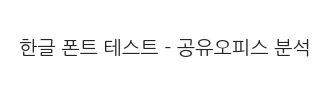

In [ ]:
# Colab에서 한글이 깨지지 않도록 NanumGothic 설치 & 폰트 캐시 초기화
!apt-get install -y fonts-nanum > /dev/null 2>&1
!fc-cache -fv > /dev/null 2>&1

import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns

# 2. Matplotlib에 나눔고딕 폰트 파일 직접 등록
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
fm.fontManager.addfont(font_path)

# 한글 폰트 적용
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['axes.unicode_minus'] = False
sns.set_theme(style='whitegrid', font='NanumGothic')

# 글로벌 스타일
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 150
plt.rcParams['figure.figsize'] = (10, 5)

# 테스트
fig, ax = plt.subplots(figsize=(4,1))
ax.text(0.5, 0.5, '한글 폰트 테스트 - 공유오피스 분석', ha='center', va='center', fontsize=14)
ax.set_axis_off()
plt.show()

## 2. 데이터 로드 & 개요

### 2-1. 5개 테이블 로드

In [ ]:
# 데이터 로드
reg = pd.read_csv(f'{DATA_PATH}/trial_register.csv')
visit = pd.read_csv(f'{DATA_PATH}/trial_visit_info.csv')
access = pd.read_csv(f'{DATA_PATH}/trial_access_log.csv')
pay = pd.read_csv(f'{DATA_PATH}/trial_payment.csv')
area = pd.read_csv(f'{DATA_PATH}/site_area.csv')

# 일자 컬럼 변환
reg['trial_date'] = pd.to_datetime(reg['trial_date'])
visit['date'] = pd.to_datetime(visit['date'])
access['cdate'] = pd.to_datetime(access['cdate'], format='mixed')
visit['first_enter_time'] = pd.to_datetime(visit['first_enter_time'], format='mixed')
visit['last_leave_time']  = pd.to_datetime(visit['last_leave_time'],  format='mixed')

print('=== shape ===')
for name, df in [('reg',reg),('visit',visit),('access',access),('pay',pay),('area',area)]:
    print(f'{name:8s}: {df.shape}')

=== shape ===
reg     : (9659, 2)
visit   : (11477, 7)
access  : (63708, 5)
pay     : (9659, 2)
area    : (9, 2)


### 2-2. 각 테이블의 역할 & 연관성

In [ ]:
# 파일별 컬럼 & 역할 정리
def col_info(df, name):
    print(f'\n=== {name} ===')
    print(df.dtypes.to_string())
    print(f'rows={len(df):,}, unique users={df["user_uuid"].nunique() if "user_uuid" in df.columns else "-":}')
    print('샘플:')
    print(df.head(2).to_string())

for n, d in [('trial_register',reg),('trial_visit_info',visit),
             ('trial_access_log',access),('trial_payment',pay),('site_area',area)]:
    col_info(d, n)


=== trial_register ===
trial_date    datetime64[ns]
user_uuid             object
rows=9,659, unique users=9624
샘플:
  trial_date                             user_uuid
0 2023-12-21  2b251333-8676-4c11-a736-dcf2350f8821
1 2023-12-21  e111619a-0975-451b-9a4a-bc8aea7b7b84

=== trial_visit_info ===
site_id                      int64
date                datetime64[ns]
stay_time                   object
stay_time_second             int64
first_enter_time    datetime64[ns]
last_leave_time     datetime64[ns]
user_uuid                   object
rows=11,477, unique users=6534
샘플:
   site_id       date        stay_time  stay_time_second           first_enter_time            last_leave_time                             user_uuid
0        1 2023-12-23  01:11:19.983486              4279 2023-12-23 16:11:25.345793 2023-12-23 17:25:32.233995  939fc566-61cd-47f0-a3ce-e2936fdcff73
1        1 2023-12-24  04:35:10.361341             16510 2023-12-24 16:10:45.668026 2023-12-24 20:53:34.842447  939fc566-61cd-4

In [ ]:
import pandas as pd

def generate_summary_df(df_list):
    summary_records = []

    for name, df in df_list:
        # 데이터프레임 레벨의 정보 계산
        total_rows = len(df)
        unique_users = df["user_uuid"].nunique() if "user_uuid" in df.columns else "-"

        # 각 컬럼을 순회하며 정보 수집
        for col in df.columns:
            dtype = str(df[col].dtype)
            samples = df[col].head(2).tolist()

            summary_records.append({
                '데이터셋': name,
                '컬럼명': col,
                '데이터 타입': dtype,
                '총 행 수': f"{total_rows:,}",
                '고유 유저 수': f"{unique_users:,}" if isinstance(unique_users, int) else unique_users,
                '샘플 (상위 2개)': str(samples)
            })

    return pd.DataFrame(summary_records)

# 1. 대상 데이터프레임 리스트 정의
target_dfs = [
    ('trial_register', reg),
    ('trial_visit_info', visit),
    ('trial_access_log', access),
    ('trial_payment', pay),
    ('site_area', area)
]

# 2. 통합 요약 데이터프레임 생성
df_info_table = generate_summary_df(target_dfs)

# 3. 확인
pd.set_option('display.max_colwidth', None)
df_info_table

,데이터셋,컬럼명,데이터 타입,총 행 수,고유 유저 수,샘플 (상위 2개)
0,trial_register,trial_date,datetime64[ns],"9,659","9,624","[Timestamp('2023-12-21 00:00:00'), Timestamp('2023-12-21 00:00:00')]"
1,trial_register,user_uuid,object,"9,659","9,624","['2b251333-8676-4c11-a736-dcf2350f8821', 'e111619a-0975-451b-9a4a-bc8aea7b7b84']"
2,trial_visit_info,site_id,int64,"11,477","6,534","[1, 1]"
3,trial_visit_info,date,datetime64[ns],"11,477","6,534","[Timestamp('2023-12-23 00:00:00'), Timestamp('2023-12-24 00:00:00')]"
4,trial_visit_info,stay_time,object,"11,477","6,534","['01:11:19.983486', '04:35:10.361341']"
5,trial_visit_info,stay_time_second,int64,"11,477","6,534","[4279, 16510]"
6,trial_visit_info,first_enter_time,datetime64[ns],"11,477","6,534","[Timestamp('2023-12-23 16:11:25.345793'), Timestamp('2023-12-24 16:10:45.668026')]"
7,trial_visit_info,last_leave_time,datetime64[ns],"11,477","6,534","[Timestamp('2023-12-23 17:25:32.233995'), Timestamp('2023-12-24 20:53:34.842447')]"
8,trial_visit_info,user_uuid,object,"11,477","6,534","['939fc566-61cd-47f0-a3ce-e2936fdcff73', '939fc566-61cd-47f0-a3ce-e2936fdcff73']"
9,trial_access_log,id,int64,"63,708","6,026","[1719038, 1716702]"


In [ ]:
# 테이블 간 연관성 — 유저 단위 교집합/차집합 점검
reg_u    = set(reg['user_uuid'].unique())
visit_u  = set(visit['user_uuid'].unique())
access_u = set(access['user_uuid'].unique())
pay_u    = set(pay['user_uuid'].unique())

print(f'register      : {len(reg_u):,} users')
print(f'visit         : {len(visit_u):,} users')
print(f'access        : {len(access_u):,} users')
print(f'payment       : {len(pay_u):,} users')

print(f'\n등록∩방문    : {len(reg_u & visit_u):,}')
print(f'등록∩결제    : {len(reg_u & pay_u):,}')
print(f'방문∩access  : {len(visit_u & access_u):,}')
print(f'\n방문 - 등록 (등록없이 방문): {len(visit_u - reg_u):,}')
print(f'등록 - 방문 (등록 후 미방문): {len(reg_u - visit_u):,}  ← 잠재 이탈 세그먼트')

register      : 9,624 users
visit         : 6,534 users
access        : 6,026 users
payment       : 9,624 users

등록∩방문    : 6,534
등록∩결제    : 9,624
방문∩access  : 6,023

방문 - 등록 (등록없이 방문): 0
등록 - 방문 (등록 후 미방문): 3,090  ← 잠재 이탈 세그먼트


 [표 1] 테이블별 고유 유저 수 


,테이블,총 고유 유저 수
0,register,9624
1,visit,6534
2,access,6026
3,payment,9624



 [표 2] 테이블 간 연관성 분석 


,관계 분류,분석 항목,유저 수,설명
0,교집합,등록 ∩ 방문,"6,534",등록 후 실제 지점을 방문한 유저
1,교집합,등록 ∩ 결제,"9,624",등록 후 결제까지 완료한 유저
2,교집합,방문 ∩ access,"6,023",지점 방문 및 출입 로그가 모두 있는 유저
3,차집합,방문 - 등록,0,데이터셋의 3일체험 신청자 한정 모수확인 (명세서 조건반영)
4,차집합,등록 - 방문,"3,090",등록 후 미방문 유저 (잠재 이탈 세그먼트)


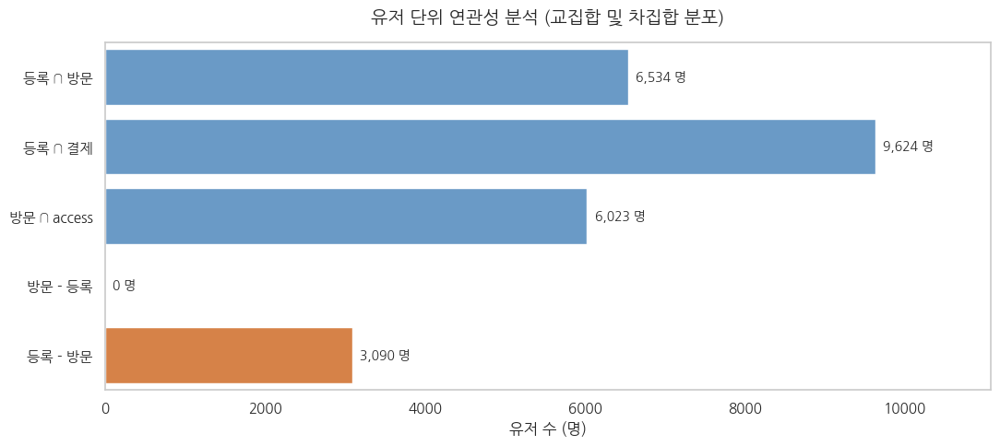

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# [1] 데이터프레임 생성

# 1. 개별 테이블 총 고유 유저 수 표
summary_totals = pd.DataFrame({
    '테이블': ['register', 'visit', 'access', 'payment'],
    '총 고유 유저 수': [len(reg_u), len(visit_u), len(access_u), len(pay_u)]
})

# 2. 테이블 간 관계(교집합/차집합) 분석 표
relation_data = [
    {'관계 분류': '교집합', '분석 항목': '등록 ∩ 방문', '유저 수': len(reg_u & visit_u), '설명': '등록 후 실제 지점을 방문한 유저'},
    {'관계 분류': '교집합', '분석 항목': '등록 ∩ 결제', '유저 수': len(reg_u & pay_u), '설명': '등록 후 결제까지 완료한 유저'},
    {'관계 분류': '교집합', '분석 항목': '방문 ∩ access', '유저 수': len(visit_u & access_u), '설명': '지점 방문 및 출입 로그가 모두 있는 유저'},
    {'관계 분류': '차집합', '분석 항목': '방문 - 등록', '유저 수': len(visit_u - reg_u), '설명': '데이터셋의 3일체험 신청자 한정 모수확인 (명세서 조건반영)'},
    {'관계 분류': '차집합', '분석 항목': '등록 - 방문', '유저 수': len(reg_u - visit_u), '설명': '등록 후 미방문 유저 (잠재 이탈 세그먼트)'}
]
df_relations = pd.DataFrame(relation_data)


# [2] 결과 출력

print(" [표 1] 테이블별 고유 유저 수 ")
display(summary_totals)

print("\n [표 2] 테이블 간 연관성 분석 ")
# 가독성을 위해 숫자에 천 단위 콤마 추가 표기 생성
df_relations_style = df_relations.copy()
df_relations_style['유저 수'] = df_relations_style['유저 수'].apply(lambda x: f"{x:,}")
display(df_relations_style)

print("\n\n")

# [3] 시각화 (바 차트)

plt.figure(figsize=(11, 5))

# 차집합(이탈/오류) 항목, 정상 교집합 비교
colors = ['#5B9BD5' if x == '교집합' else '#ED7D31' for x in df_relations['관계 분류']]

# 가로 바 차트 생성
ax = sns.barplot(x='유저 수', y='분석 항목', data=df_relations, palette=colors)

# 격자선 제거
ax.grid(False)

# 수치표시
max_val = df_relations['유저 수'].max()
for i, v in enumerate(df_relations['유저 수']):
    ax.text(v + (max_val * 0.01), i, f'{v:,} 명', va='center', fontsize=10, fontweight='bold')

plt.title('유저 단위 연관성 분석 (교집합 및 차집합 분포)', fontsize=14, pad=15)
plt.xlabel('유저 수 (명)')
plt.ylabel('')
plt.xlim(0, max_val * 1.15) # 텍스트가 잘리지 않도록 우측 여백 확보

plt.tight_layout()
plt.show()

### 2-2. 각 테이블의 역할 & 연관성

visit : 6,534 users 와 access : 6,026 users의 511명 차이확인
<br> -> 방문은 했으나 출입기록은 없다.

| 구분 | 인원 | 비고 |
|---|---|---|
| visit ∩ access (양쪽 모두 존재) | 6,023명 | 정상 케이스 |
| visit only (방문 기록은 있는데 출입 로그 없음) | 511명 | 차이의 본질 |
| access only (출입 로그는 있는데 방문 기록 없음) | 3명 | 무시 가능 |

① visit-only 511명의 특성
- 거의 모두 1.01회 방문 (515행 / 511명) — 단발성 방문 유저
- 시간 결측은 3.7% (전체 평균 4.9%와 비슷) — 즉 first/last_enter_time은 잘 채워져 있음
- 전 기간에 고르게 분산 (2021.05 ~ 2023.11) — 특정 시점 시스템 문제가 아님
모든 지점에서 발생 (지점 1~49 전반)

② access-only 3명의 특성
- 모두 같은 날 수십 초~몇 분 간격으로 카드 인식 반복 (예: 21:02:16 입실 → 21:02:46 다시 입실)
 - 늦은 저녁(20~23시) 위주
 - 짧은 체류 + 빈번한 재인식 → 카드 인식 오류 시 재시도, 테스트 카드, 또는 한 카드 공유 가능성

추정 원인
1. 두 테이블의 출처가 다른 시스템
- trial_visit_info는 "일자별 방문 요약"— 집계 테이블 **VS**  trial_access_log는 게이트 통과 raw 이벤트
- 이 둘이 별개 시스템에서 생성되면 동기화 오차가 자연스럽게 발생.
- 511명이 거의 모두 1회 방문자라는 점
- 단발성 방문일수록 ETL 누락이나 게이트 미통과 케이스에 더 노출 될 수 있음.

2. 게이트를 거치지 않은 방문
- 직원 수동 입실(카드 분실, 첫 방문 안내 동행 등)
- 비상문/임시 출입구
- 게이트 오작동 시 직원이 수동으로 열어준 케이스
- 이런 경우 visit_info에는 잡히지만 access_log에는 누락 될 수 있다.

3. access_log 시스템 도입 시점/범위 차이
- 511명이 2021.05~2023.11 전 기간에 분산되어 있어 시점 문제는 아닌 것으로 해석.
- 지점별 차이도 특정 지점에 편중되지 않아 지점 시스템 문제라고 할 수 없음.

4. ★분석에 미치는 영향과 권고
- 규모: 전체 방문자 6,534명 중 511명(≈7.8%)이므로 트렌드 분석엔 큰 왜곡은 없을 수 있다.
- **마스터 테이블 기준:** trial_visit_info를 방문 여부의 정답으로 해석.<br> trial_access_log는 총 출입 횟수 / 시간대 정밀도 같은 보조 피처로만 활용.

- **★비지니스 운영 측면 액션:**  비지니스적 입퇴실 추적을 진행한다면(예: 시간제 과금 도입 시) <br> 두 시스템의 동기화 프로세스를 점검 필요.
- 현재 8% 누락은 시간 단위 과금에 그대로 적용하면 매출 누수로 이어질 수 있음
-> **분석 한계 사항**.


## 3. EDA — 기간·결측·이상치·중복·분포

### 3-1. 데이터 기간 & 시간기준

In [ ]:
print('=== 기간 ===')
print(f'register : {reg["trial_date"].min().date()}  ~  {reg["trial_date"].max().date()}')
print(f'visit    : {visit["date"].min().date()}  ~  {visit["date"].max().date()}')
print(f'access   : {access["cdate"].min()}  ~  {access["cdate"].max()}')

# 테이블별 상이
print('\n=== 시간기준 ===')
print('국적 정보: 데이터에 국적 컬럼 없음 (분석 범위 외)')

=== 기간 ===
register : 2021-05-01  ~  2023-12-31
visit    : 2021-05-02  ~  2024-01-02
access   : 2021-05-02 09:42:13.893455  ~  2024-01-01 14:36:13.987243

=== 시간기준 ===
국적 정보: 데이터에 국적 컬럼 없음 (분석 범위 외)


### 3-2. 결측치

In [ ]:
print('=== 결측치 ===')
for n, d in [('register',reg),('visit',visit),('access',access),('pay',pay),('area',area)]:
    miss = d.isnull().sum()
    miss = miss[miss>0]
    if len(miss)>0:
        print(f'\n[{n}]')
        print(miss)
    else:
        print(f'[{n}] 결측 없음')

=== 결측치 ===
[register] 결측 없음

[visit]
first_enter_time    555
last_leave_time     555
dtype: int64
[access] 결측 없음
[pay] 결측 없음
[area] 결측 없음


### 3-3. 이상치 검출

#### 명세서 안내된 이상치
1. **trial_register**: 한 유저가 2회 이상 신청
2. **trial_visit_info**: `stay_time`은 있는데 `first_enter_time` / `last_leave_time`이 결측 / 또는 계산값 불일치

In [ ]:
# (1) 중복 신청 유저 — 명세서 이상치 ①/② 분해
print('--- register 중복 분해 ---')
print(f'전체 행                          : {len(reg):,}')
print(f'unique user_uuid                 : {reg["user_uuid"].nunique():,}')
ud_dup   = reg.duplicated(subset='user_uuid').sum()
full_dup = reg.duplicated().sum()
print(f'\nuser_uuid 기준 중복 행 (총 명세서 35명) : {ud_dup}건')
print(f'  ① 같은 날 2회 신청  (완벽 중복)        : {full_dup}건  ← 명세서 이상치 ①')
print(f'  ② 다른 날 2회 신청  (user_uuid만 중복) : {ud_dup - full_dup}건  ← 명세서 이상치 ②')
print('  → 명세서 7번의 두 이상치 케이스와 정확히 분해 일치')

# (2) visit 시간 결측 패턴
print('\n--- visit 시간 결측 패턴 ---')
print('first_enter_time NaN:', visit['first_enter_time'].isna().sum())
print('last_leave_time  NaN:', visit['last_leave_time'].isna().sum())
print('stay_time_second NaN:', visit['stay_time_second'].isna().sum())
print('→ first/last 시각이 항상 동시 결측 (총 555행, 합계로는 1,110건).')

--- register 중복 분해 ---
전체 행                          : 9,659
unique user_uuid                 : 9,624

user_uuid 기준 중복 행 (총 명세서 35명) : 35건
  ① 같은 날 2회 신청  (완벽 중복)        : 28건  ← 명세서 이상치 ①
  ② 다른 날 2회 신청  (user_uuid만 중복) : 7건  ← 명세서 이상치 ②
  → 명세서 7번의 두 이상치 케이스와 정확히 분해 일치

--- visit 시간 결측 패턴 ---
first_enter_time NaN: 555
last_leave_time  NaN: 555
stay_time_second NaN: 0
→ first/last 시각이 항상 동시 결측 (총 555행, 합계로는 1,110건).


In [ ]:
import pandas as pd
from IPython.display import display

# (1) 중복 신청 유저 - 명세서 이상치 ①/② 분해 데이터프레임
ud_dup = reg.duplicated(subset='user_uuid').sum()
full_dup = reg.duplicated().sum()

reg_summary_data = [
    {"분석 항목": "전체 행", "건수": len(reg), "비고": ""},
    {"분석 항목": "고유 user_uuid", "건수": reg["user_uuid"].nunique(), "비고": ""},
    {"분석 항목": "user_uuid 기준 중복 행", "건수": ud_dup, "비고": "이상치 참고 총 35명"},
    {"분석 항목": "① 같은 날 2회 신청 (완벽 중복)", "건수": full_dup, "비고": "이상치 참고 ①"},
    {"분석 항목": "② 다른 날 2회 신청 (user_uuid만 중복)", "건수": ud_dup - full_dup, "비고": "이상치 참고 ②"}
]

reg_df = pd.DataFrame(reg_summary_data)

print("=== [register] 중복 신청 유저 분석 결과 ===")
display(reg_df)


# (2) visit 시간 결측 패턴 데이터프레임
visit_missing_data = [
    {"컬럼명": "first_enter_time", "결측치 건수": visit['first_enter_time'].isna().sum(), "비고": "first/last 시각 동시 결측"},
    {"컬럼명": "last_leave_time", "결측치 건수": visit['last_leave_time'].isna().sum(), "비고": "총 555행 (합계 1,110건)"},
    {"컬럼명": "stay_time_second", "결측치 건수": visit['stay_time_second'].isna().sum(), "비고": ""}
]

visit_missing_df = pd.DataFrame(visit_missing_data)

print("\n=== [visit] 시간 결측 패턴 분석 결과 ===")
display(visit_missing_df)

=== [register] 중복 신청 유저 분석 결과 ===


,분석 항목,건수,비고
0,전체 행,9659,
1,고유 user_uuid,9624,
2,user_uuid 기준 중복 행,35,이상치 참고 총 35명
3,① 같은 날 2회 신청 (완벽 중복),28,이상치 참고 ①
4,② 다른 날 2회 신청 (user_uuid만 중복),7,이상치 참고 ②



=== [visit] 시간 결측 패턴 분석 결과 ===


,컬럼명,결측치 건수,비고
0,first_enter_time,555,first/last 시각 동시 결측
1,last_leave_time,555,"총 555행 (합계 1,110건)"
2,stay_time_second,0,


#### [검증] stay_time vs (last_leave − first_enter) 불일치 정밀 분석

명세서가 안내한 두 번째 이상치 ─ "stay_time이 first_enter_time, last_leave_time과 안 맞는 경우" ─ 를
얼마나, 어느 방향으로, 어떤 분포로 불일치하는지 단계적으로 검증.

In [ ]:
# Step 1. 컬럼 타입 확인
print('[Step 1] 컬럼 타입')
print(f'  first_enter_time : {visit["first_enter_time"].dtype}')
print(f'  last_leave_time  : {visit["last_leave_time"].dtype}')
print(f'  stay_time_second : {visit["stay_time_second"].dtype}')

# Step 2. 비교 가능한 행 추출 (시간 결측 제외)
print('\n[Step 2] 비교 가능한 행 추출')
print(f'  전체 visit 행                : {len(visit):,}')
print(f'  first_enter_time 결측        : {visit["first_enter_time"].isna().sum():,}')
print(f'  last_leave_time  결측        : {visit["last_leave_time"].isna().sum():,}')
ok = visit.dropna(subset=['first_enter_time','last_leave_time']).copy()
print(f'  비교 가능한 행 (양쪽 비결측) : {len(ok):,}')

# Step 3. (last - first) 계산 → stay_time_second와 비교
ok['calc_sec'] = (ok['last_leave_time'] - ok['first_enter_time']).dt.total_seconds()
ok['diff_sec'] = ok['calc_sec'] - ok['stay_time_second']   # 양수 = 외출시간 존재
ok['abs_diff'] = ok['diff_sec'].abs()

# Step 4. 불일치 정도별 분포 (구간별)
print('\n[Step 3] 불일치 정도별 분포 (절댓값 기준)')
bins = [(0,'완전 일치 (0초)'), (1,'1초 이내'), (60,'60초 이내'),
        (600,'10분 이내'), (3600,'1시간 이내')]
prev = -1
for t, lbl in bins:
    cnt = ((ok['abs_diff'] > prev) & (ok['abs_diff'] <= t)).sum()
    print(f'  {lbl:18s} (>{prev}, ≤{t}초): {cnt:>6,}  ({cnt/len(ok)*100:>5.1f}%)')
    prev = t
cnt = (ok['abs_diff'] > 3600).sum()
print(f'  {"1시간 초과":<18s} (>3,600초)      : {cnt:>6,}  ({cnt/len(ok)*100:>5.1f}%)')

# Step 5. 핵심 수치 — 60초 기준
m60 = (ok['abs_diff'] > 60).sum()
print(f'\n[Step 4] ▶ 60초 이상 불일치: {m60:,} / {len(ok):,}  ({m60/len(ok)*100:.1f}%)')

# Step 6. 불일치 방향 — 어느 쪽이 더 큰가?
pos = (ok['diff_sec'] >  60).sum()
neg = (ok['diff_sec'] < -60).sum()
mat = (ok['abs_diff'] <= 60).sum()
print('\n[Step 5] 불일치 방향 분석')
print(f'  calc > stay   (외출시간 존재로 추정) : {pos:>6,}  ({pos/len(ok)*100:>5.1f}%)')
print(f'  calc < stay   (논리적으로 불가)      : {neg:>6,}  ({neg/len(ok)*100:>5.1f}%)')
print(f'  완전 일치     (절댓값 60초 이내)     : {mat:>6,}  ({mat/len(ok)*100:>5.1f}%)')

[Step 1] 컬럼 타입
  first_enter_time : datetime64[ns]
  last_leave_time  : datetime64[ns]
  stay_time_second : int64

[Step 2] 비교 가능한 행 추출
  전체 visit 행                : 11,477
  first_enter_time 결측        : 555
  last_leave_time  결측        : 555
  비교 가능한 행 (양쪽 비결측) : 10,922

[Step 3] 불일치 정도별 분포 (절댓값 기준)
  완전 일치 (0초)         (>-1, ≤0초):      6  (  0.1%)
  1초 이내              (>0, ≤1초):  2,646  ( 24.2%)
  60초 이내             (>1, ≤60초):    259  (  2.4%)
  10분 이내             (>60, ≤600초):  2,815  ( 25.8%)
  1시간 이내             (>600, ≤3600초):  2,499  ( 22.9%)
  1시간 초과             (>3,600초)      :  2,697  ( 24.7%)

[Step 4] ▶ 60초 이상 불일치: 8,011 / 10,922  (73.3%)

[Step 5] 불일치 방향 분석
  calc > stay   (외출시간 존재로 추정) :  8,011  ( 73.3%)
  calc < stay   (논리적으로 불가)      :      0  (  0.0%)
  완전 일치     (절댓값 60초 이내)     :  2,911  ( 26.7%)


=== [Step 1] 컬럼 타입 ===


,컬럼명,데이터 타입
0,first_enter_time,datetime64[ns]
1,last_leave_time,datetime64[ns]
2,stay_time_second,int64



=== [Step 2] 결측 제외 및 비교 가능 행 현황 ===


,항목,건수
0,전체 visit 행,11477
1,first_enter_time 결측,555
2,last_leave_time 결측,555
3,비교 가능한 행 (양쪽 비결측),10922



=== [Step 3] 불일치 정도별 분포 (절댓값 기준) ===


,구간,조건,건수,비율(%)
0,완전 일치 (0초),">-1초, ≤0초",6,0.1
1,1초 이내,">0초, ≤1초",2646,24.2
2,60초 이내,">1초, ≤60초",259,2.4
3,10분 이내,">60초, ≤600초",2815,25.8
4,1시간 이내,">600초, ≤3600초",2499,22.9
5,1시간 초과,">3,600초",2697,24.7



=== [Step 4] 불일치 방향 분석 (60초 기준) ===


,방향,설명,건수,비율(%)
0,calc > stay,외출시간 존재로 추정,8011,73.3
1,calc < stay,논리적으로 불가 (오류),0,0.0
2,일치,절댓값 60초 이내 허용,2911,26.7


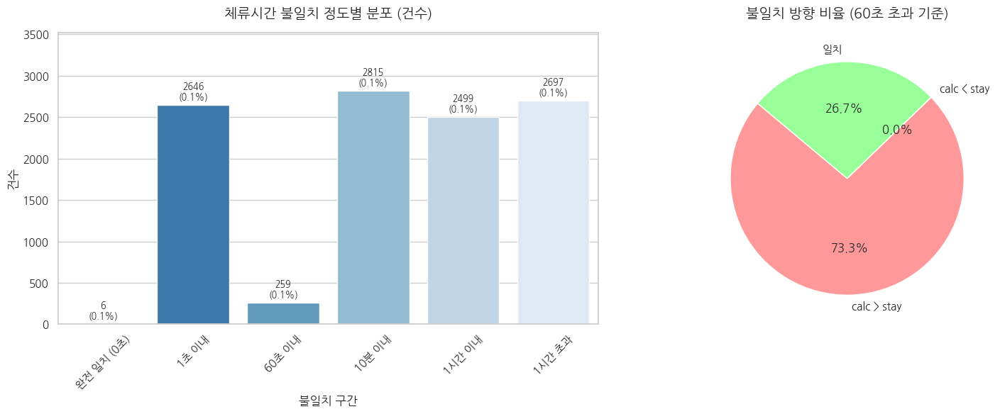

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# 1. 데이터프레임 생성 로직

# 컬럼 타입 데이터프레임
type_data = [
    {"컬럼명": "first_enter_time", "데이터 타입": str(visit["first_enter_time"].dtype)},
    {"컬럼명": "last_leave_time", "데이터 타입": str(visit["last_leave_time"].dtype)},
    {"컬럼명": "stay_time_second", "데이터 타입": str(visit["stay_time_second"].dtype)}
]
type_df = pd.DataFrame(type_data)

# 비교 가능한 행 추출 데이터프레임
ok = visit.dropna(subset=['first_enter_time', 'last_leave_time']).copy()
row_data = [
    {"항목": "전체 visit 행", "건수": len(visit)},
    {"항목": "first_enter_time 결측", "건수": visit["first_enter_time"].isna().sum()},
    {"항목": "last_leave_time 결측", "건수": visit["last_leave_time"].isna().sum()},
    {"항목": "비교 가능한 행 (양쪽 비결측)", "건수": len(ok)}
]
row_df = pd.DataFrame(row_data)

# 차이 계산 진행 (calc_sec 생성 및 stay_time_second 비교)
ok['calc_sec'] = (ok['last_leave_time'] - ok['first_enter_time']).dt.total_seconds()
ok['diff_sec'] = ok['calc_sec'] - ok['stay_time_second']
ok['abs_diff'] = ok['diff_sec'].abs()

# 불일치 정도별 분포 데이터프레임
bins = [
    (0, '완전 일치 (0초)'),
    (1, '1초 이내'),
    (60, '60초 이내'),
    (600, '10분 이내'),
    (3600, '1시간 이내')
]

dist_data = []
prev = -1
for t, lbl in bins:
    cnt = ((ok['abs_diff'] > prev) & (ok['abs_diff'] <= t)).sum()
    dist_data.append({"구간": lbl, "조건": f">{prev}초, ≤{t}초", "건수": cnt, "비율(%)": round(cnt / len(ok) * 100, 1)})
    prev = t

# 1시간 초과 구간 추가
cnt = (ok['abs_diff'] > 3600).sum()
dist_data.append({"구간": "1시간 초과", "조건": ">3,600초", "건수": cnt, "비율(%)": round(cnt / len(ok) * 100, 1)})
dist_df = pd.DataFrame(dist_data)

# [Step 4] 불일치 방향 분석 데이터프레임
pos = (ok['diff_sec'] > 60).sum()
neg = (ok['diff_sec'] < -60).sum()
mat = (ok['abs_diff'] <= 60).sum()

dir_data = [
    {"방향": "calc > stay", "설명": "외출시간 존재로 추정", "건수": pos, "비율(%)": round(pos / len(ok) * 100, 1)},
    {"방향": "calc < stay", "설명": "논리적으로 불가 (오류)", "건수": neg, "비율(%)": round(neg / len(ok) * 100, 1)},
    {"방향": "일치", "설명": "절댓값 60초 이내 허용", "건수": mat, "비율(%)": round(mat / len(ok) * 100, 1)}
]
dir_df = pd.DataFrame(dir_data)


# 2. 데이터프레임 표 출력

print("=== [Step 1] 컬럼 타입 ===")
display(type_df)
print("\n=== [Step 2] 결측 제외 및 비교 가능 행 현황 ===")
display(row_df)
print("\n=== [Step 3] 불일치 정도별 분포 (절댓값 기준) ===")
display(dist_df)
print("\n=== [Step 4] 불일치 방향 분석 (60초 기준) ===")
display(dir_df)


# 3. 데이터 시각화

print("\n")  # 빈 줄로 간격 확보

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

fig.subplots_adjust(top=0.85, wspace=0.3)

# (1) 불일치 정도별 분포도 (막대 그래프)
sns.barplot(
    data=dist_df, x='구간', y='건수',
    ax=ax1,
    hue='구간', palette='Blues_r', legend=False
)
ax1.set_title('체류시간 불일치 정도별 분포 (건수)', fontsize=14, pad=15)
ax1.set_xlabel('불일치 구간')
ax1.set_ylabel('건수')
ax1.tick_params(axis='x', rotation=45)


ymax = dist_df['건수'].max()
ax1.set_ylim(0, ymax * 1.25)

# 막대 상단에 건수 + 비율 라벨 추가
for container in ax1.containers:
    labels = [
        f'{v.get_height():.0f}\n({dist_df.iloc[i]["비율(%)"]}%)'
        for i, v in enumerate(container)
    ]
    ax1.bar_label(container, labels=labels, padding=3, fontsize=9)

# (2) 불일치 방향 분석 (파이 차트)
colors = ['#ff9999', '#66b3ff', '#99ff99']
ax2.pie(
    dir_df['건수'],
    labels=dir_df['방향'],
    autopct='%1.1f%%',
    startangle=140,
    colors=colors,
    wedgeprops={'edgecolor': 'white'}
)
ax2.set_title('불일치 방향 비율 (60초 초과 기준)', fontsize=14, pad=15)

plt.tight_layout()
plt.show()

=== [Step 7] 불일치 분포 & 일치/불일치 비율 ===




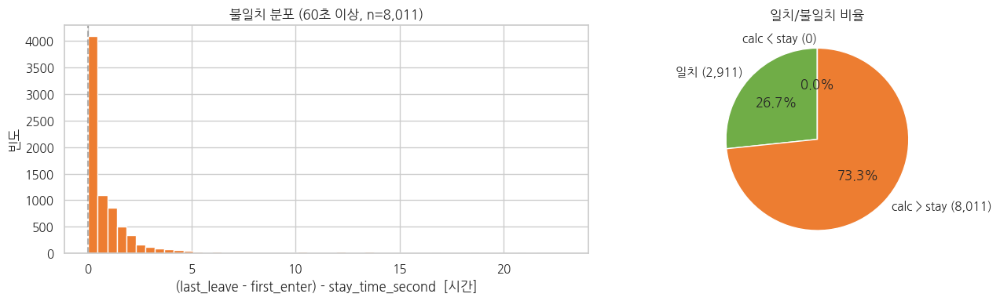



=== [Step 8] 불일치 Top 5 케이스 (외출의심사례) ===


,user_uuid,date,first_enter_time,last_leave_time,stay_hr,calc_hr,diff_hr
3515,051c2bb0-dcdf-494d-b10c-d72f2c23fccb,2022-12-11,2022-12-11,2022-12-11 23:59:59.000000,1.05,24.00,22.94
3248,9c00da30-441e-4499-8b5f-840081458a5c,2021-11-06,2021-11-06,2021-11-06 23:59:59.000000,1.32,24.00,22.68
9673,5768fc2f-94fd-4b08-818f-5231b0f2aa4a,2022-06-09,2022-06-09,2022-06-09 23:59:59.000000,1.37,24.00,22.63
5514,e79e0984-2c2a-4632-ad83-378f326b5f7d,2023-03-31,2023-03-31,2023-03-31 23:59:59.000000,1.50,24.00,22.50
6611,e1da19f9-07cc-4303-9280-df6516425334,2023-07-07,2023-07-07,2023-07-07 23:58:48.745077,1.66,23.98,22.32


In [ ]:
# Step 7. 시각화 — 불일치 분포 & 일치/불일치 비율
print("=== [Step 7] 불일치 분포 & 일치/불일치 비율 ===")
print("\n")

fig, axes = plt.subplots(1, 2, figsize=(14, 4))

ax = axes[0]
mismatch_hr = ok.loc[ok['abs_diff'] > 60, 'diff_sec'] / 3600
ax.hist(mismatch_hr, bins=50, color='#ED7D31', edgecolor='white')
ax.axvline(0, color='gray', ls='--', alpha=0.6)
ax.set_title(f'불일치 분포 (60초 이상, n={len(mismatch_hr):,})', fontsize=12)
ax.set_xlabel('(last_leave - first_enter) - stay_time_second  [시간]')
ax.set_ylabel('빈도')

ax = axes[1]
sizes = [mat, pos, neg]
labels_pie = [f'일치 ({mat:,})', f'calc > stay ({pos:,})', f'calc < stay ({neg:,})']
ax.pie(sizes, labels=labels_pie, colors=['#70AD47','#ED7D31','#C00000'],
       autopct='%1.1f%%', startangle=90)
ax.set_title('일치/불일치 비율', fontsize=12)
plt.tight_layout(); plt.show()

print("\n")

# 불일치가 큰 케이스 샘플
from IPython.display import display

# 불일치가 큰 Top 5 케이스 추출 및 단위 변환 (초 -> 시간)
sample = ok.nlargest(5, 'abs_diff').copy()
sample['stay_hr'] = (sample['stay_time_second'] / 3600).round(2)
sample['calc_hr'] = (sample['calc_sec'] / 3600).round(2)
sample['diff_hr'] = (sample['diff_sec'] / 3600).round(2)

# 분석에 필요한 컬럼만 필터링하여 데이터프레임 생성
columns_to_show = [
    'user_uuid', 'date', 'first_enter_time', 'last_leave_time',
    'stay_hr', 'calc_hr', 'diff_hr'
]
sample_df = sample[columns_to_show]

# 제목 및 표 출력
print("=== [Step 8] 불일치 Top 5 케이스 (외출의심사례) ===")
display(sample_df)

## 해석

→ Top 5 모두 first=00:00:00, last=23:59:59 패턴.
<br>   실제 access_log를 보면 입실은 13-14시, stay_time은 1~2시간.
<p>  ⇒ "외출"이 아니라 "퇴실 미처리 시 시스템이 시각을 placeholder로 채운 것".

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
📊 stay_time 불일치 검증 결과 종합

[표 1] 불일치 분해 요약


,분류,건수,비율(%),설명
0,전체 비교 대상,10874,100.0,visit 중복 제거 + 시각 비결측
1,일치 (절댓값 차이 ≤60초),2898,26.7,정상 케이스
2,불일치 (절댓값 차이 >60초),7976,73.3,아래 두 메커니즘으로 분해
3,(a) placeholder 케이스,1014,12.7,퇴실/입실 미처리로 시스템이 채운 시각
4,(b) 진짜 외출 의심,6962,87.3,시각 정상 + stay < (last - first)



[표 1-A] placeholder 세부 분포


,placeholder 유형,건수,불일치 중 비율(%),설명
0,first/last 둘 다,112,1.4,00:00:00 ~ 23:59:59 (하루 종일 처리)
1,first만 (00:00:00),430,5.4,입실 시각 누락
2,last만 (23:59:59),472,5.9,퇴실 시각 누락



[표 2] 입퇴실 패턴별 일치율 — stay_time_second = 점유시간 합 검증


,케이스,n,stay_second vs (last-first) ≤60초 일치율(%),stay_second vs access 점유합 ≤60초 일치율(%),해석
0,입퇴실 1쌍 (외출 없음),1938,91.4,82.2,두 측정이 같아야 정상
1,입퇴실 2쌍+ (외출 발생),6367,4.2,69.1,점유합이 stay와 같으면 가설 입증



[표 3] 불일치 Top 5 케이스 — placeholder 해당 여부


,user_uuid,날짜,first_시각,last_시각,stay_hr,calc_hr,diff_hr,placeholder?
0,051c2bb0-dcdf-494d-b10c-d72f2c23fccb,2022-12-11,00:00:00,23:59:59,1.05,24.00,22.94,✓
1,9c00da30-441e-4499-8b5f-840081458a5c,2021-11-06,00:00:00,23:59:59,1.32,24.00,22.68,✓
2,5768fc2f-94fd-4b08-818f-5231b0f2aa4a,2022-06-09,00:00:00,23:59:59,1.37,24.00,22.63,✓
3,e79e0984-2c2a-4632-ad83-378f326b5f7d,2023-03-31,00:00:00,23:59:59,1.50,24.00,22.50,✓
4,e1da19f9-07cc-4303-9280-df6516425334,2023-07-07,00:00:00,23:58:48,1.66,23.98,22.32,✓


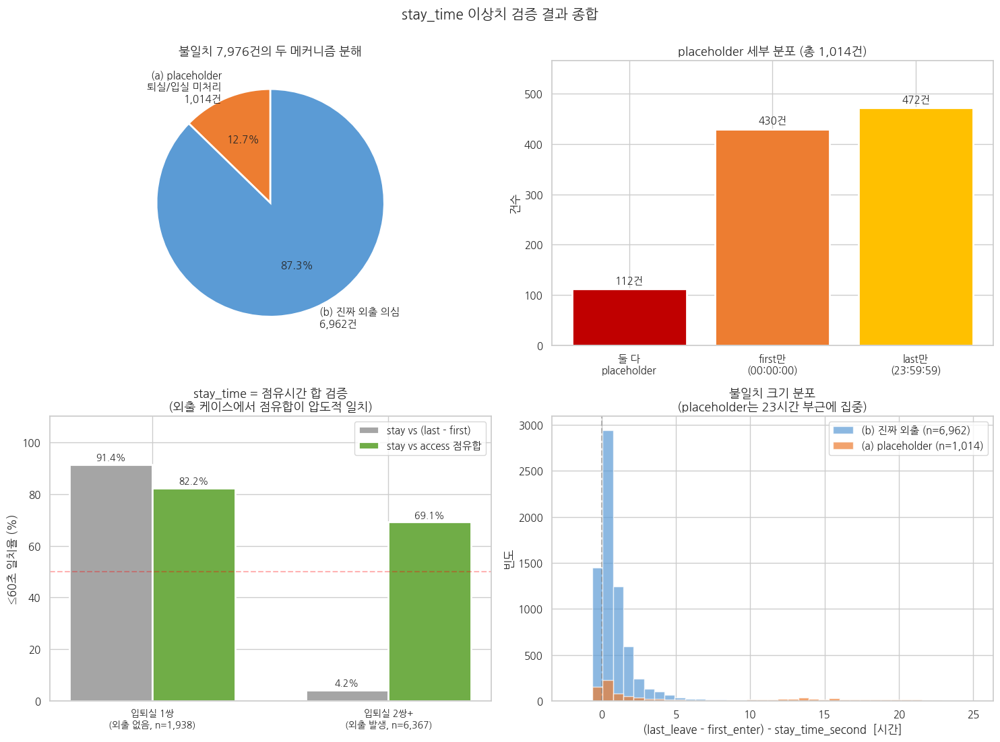


🎯 핵심 결론
① 불일치 7,976건 = placeholder 1,014건(12.7%) + 외출 의심 6,962건(87.3%)
② Top 5 케이스는 모두 placeholder (시각이 00:00 ~ 23:59로 인위적 채움)
③ 외출 케이스에서 stay_time_second은 (last−first)와 4.2%만 일치, access 점유합과 69.1% 일치
   → stay_time_second = '실제 점유시간의 합'으로 데이터 입증됨
④ 모델링 권고:
   - 실제 점유시간 → stay_time_second 사용
   - 총 경과시간(외출 포함) → (last_leave − first_enter) 사용
   - 시간대 피처(avg_enter_hour) → access_log에서 재산출


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display

# 1. 구글 드라이브 마운트
from google.colab import drive
drive.mount('/content/drive')

# 한글 폰트 설정 (Colab)
!apt-get install -y fonts-nanum > /dev/null 2>&1
!fc-cache -fv > /dev/null 2>&1
import matplotlib.font_manager as fm
fm._load_fontmanager(try_read_cache=False)
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['axes.unicode_minus'] = False

path = '/content/drive/MyDrive/codeit_project_3/'

# 2. 데이터 로드
visit_info = pd.read_csv(path + 'trial_visit_info.csv')
access_log = pd.read_csv(path + 'trial_access_log.csv')

# 3. 전처리 (visit 완전 중복 제거 + 시각 결측 제외 + 타입 변환)
visit_info = visit_info.drop_duplicates().reset_index(drop=True)
visit_info = visit_info.dropna(subset=['first_enter_time', 'last_leave_time']).copy()
visit_info['first_enter_time'] = pd.to_datetime(visit_info['first_enter_time'], format='mixed')
visit_info['last_leave_time']  = pd.to_datetime(visit_info['last_leave_time'], format='mixed')

# access 중복 제거 (id 제외 동일 359건)
access_log = access_log.drop_duplicates(subset=['checkin','cdate','site_id','user_uuid']).reset_index(drop=True)
access_log['cdate'] = pd.to_datetime(access_log['cdate'], format='mixed')

# 4. 체류시간 차이 계산
visit_info['calc_sec'] = (visit_info['last_leave_time'] - visit_info['first_enter_time']).dt.total_seconds()
visit_info['diff_sec'] = visit_info['calc_sec'] - visit_info['stay_time_second']
visit_info['abs_diff'] = visit_info['diff_sec'].abs()

# 불일치 기준: 절댓값 차이 60초 초과
THRESHOLD = 60
total_compared = len(visit_info)
discrepancy_df = visit_info[visit_info['abs_diff'] > THRESHOLD].copy()
total_disc = len(discrepancy_df)

# 5. Placeholder 패턴 검출
is_first_pl = (discrepancy_df['first_enter_time'].dt.hour==0) & \
              (discrepancy_df['first_enter_time'].dt.minute==0) & \
              (discrepancy_df['first_enter_time'].dt.second==0)
is_last_pl  = (discrepancy_df['last_leave_time'].dt.hour==23) & \
              (discrepancy_df['last_leave_time'].dt.minute==59) & \
              (discrepancy_df['last_leave_time'].dt.second>=58)

n_both_pl  = (is_first_pl &  is_last_pl).sum()
n_first_pl = (is_first_pl & ~is_last_pl).sum()
n_last_pl  = (~is_first_pl & is_last_pl).sum()
n_real     = (~is_first_pl & ~is_last_pl).sum()
n_pl_total = n_both_pl + n_first_pl + n_last_pl

# 6. access_log 기반 점유시간 합 (입실1 → 퇴실2 짝)
access_log = access_log.sort_values(['user_uuid','cdate']).reset_index(drop=True)
access_log['next_cdate']   = access_log.groupby('user_uuid')['cdate'].shift(-1)
access_log['next_checkin'] = access_log.groupby('user_uuid')['checkin'].shift(-1)
pairs = access_log[(access_log['checkin']==1) & (access_log['next_checkin']==2)].copy()
pairs['inside_sec'] = (pairs['next_cdate'] - pairs['cdate']).dt.total_seconds()
pairs['date_only'] = pairs['cdate'].dt.date
occ = pairs.groupby(['user_uuid','date_only'])['inside_sec'].sum().reset_index()
occ.columns = ['user_uuid','date_only','occupancy_sec']

# 입퇴실 짝 카운트 (1쌍 vs 2쌍 이상 구분용)
pair_count = pairs.groupby(['user_uuid','date_only']).size().reset_index(name='n_pairs')

# visit과 occ 매칭
visit_info['date_only'] = visit_info['first_enter_time'].dt.date
merged = visit_info.merge(occ, on=['user_uuid','date_only'], how='inner')
merged = merged.merge(pair_count, on=['user_uuid','date_only'], how='left')
merged['diff_vs_simple']    = (merged['stay_time_second'] - merged['calc_sec']).abs()
merged['diff_vs_occupancy'] = (merged['stay_time_second'] - merged['occupancy_sec']).abs()

# 입퇴실 패턴별 일치율
single = merged[merged['n_pairs']==1]
multi  = merged[merged['n_pairs']>=2]

def match_rate(s, thr=60):
    return (s <= thr).mean() * 100

# ============================================
# 결과 요약 데이터프레임
# ============================================
print("="*70)
print("📊 stay_time 불일치 검증 결과 종합")
print("="*70)

# 표 1: 불일치 분해 요약 (평면 구조)
summary_1 = pd.DataFrame([
    {'분류': '전체 비교 대상',
     '건수': total_compared,
     '비율(%)': 100.0,
     '설명': 'visit 중복 제거 + 시각 비결측'},
    {'분류': f'일치 (절댓값 차이 ≤{THRESHOLD}초)',
     '건수': total_compared - total_disc,
     '비율(%)': round((total_compared - total_disc) / total_compared * 100, 1),
     '설명': '정상 케이스'},
    {'분류': f'불일치 (절댓값 차이 >{THRESHOLD}초)',
     '건수': total_disc,
     '비율(%)': round(total_disc / total_compared * 100, 1),
     '설명': '아래 두 메커니즘으로 분해'},
    {'분류': '(a) placeholder 케이스',
     '건수': n_pl_total,
     '비율(%)': round(n_pl_total / total_disc * 100, 1),
     '설명': '퇴실/입실 미처리로 시스템이 채운 시각'},
    {'분류': '(b) 진짜 외출 의심',
     '건수': n_real,
     '비율(%)': round(n_real / total_disc * 100, 1),
     '설명': '시각 정상 + stay < (last - first)'},
])
print("\n[표 1] 불일치 분해 요약")
display(summary_1)

# 표 1-A: placeholder 세부 (별도 표로 분리)
summary_1a = pd.DataFrame([
    {'placeholder 유형': 'first/last 둘 다',
     '건수': n_both_pl,
     '불일치 중 비율(%)': round(n_both_pl / total_disc * 100, 1),
     '설명': '00:00:00 ~ 23:59:59 (하루 종일 처리)'},
    {'placeholder 유형': 'first만 (00:00:00)',
     '건수': n_first_pl,
     '불일치 중 비율(%)': round(n_first_pl / total_disc * 100, 1),
     '설명': '입실 시각 누락'},
    {'placeholder 유형': 'last만 (23:59:59)',
     '건수': n_last_pl,
     '불일치 중 비율(%)': round(n_last_pl / total_disc * 100, 1),
     '설명': '퇴실 시각 누락'},
])
print("\n[표 1-A] placeholder 세부 분포")
display(summary_1a)

# 표 2: 입퇴실 패턴별 일치율 (결정적 증거)
summary_2 = pd.DataFrame([
    {'케이스': '입퇴실 1쌍 (외출 없음)',
     'n': len(single),
     'stay_second vs (last-first) ≤60초 일치율(%)': round(match_rate(single['diff_vs_simple']), 1),
     'stay_second vs access 점유합 ≤60초 일치율(%)': round(match_rate(single['diff_vs_occupancy']), 1),
     '해석': '두 측정이 같아야 정상'},
    {'케이스': '입퇴실 2쌍+ (외출 발생)',
     'n': len(multi),
     'stay_second vs (last-first) ≤60초 일치율(%)': round(match_rate(multi['diff_vs_simple']), 1),
     'stay_second vs access 점유합 ≤60초 일치율(%)': round(match_rate(multi['diff_vs_occupancy']), 1),
     '해석': '점유합이 stay와 같으면 가설 입증'},
])
print("\n[표 2] 입퇴실 패턴별 일치율 — stay_time_second = 점유시간 합 검증")
display(summary_2)

# 표 3: Top 5 placeholder 검증
top5 = discrepancy_df.nlargest(5, 'abs_diff').copy()
top5['stay_hr'] = (top5['stay_time_second']/3600).round(2)
top5['calc_hr'] = (top5['calc_sec']/3600).round(2)
top5['diff_hr'] = (top5['diff_sec']/3600).round(2)
top5['first_시각'] = top5['first_enter_time'].dt.strftime('%H:%M:%S')
top5['last_시각']  = top5['last_leave_time'].dt.strftime('%H:%M:%S')
top5['placeholder?'] = ['✓' if (f or l) else '✗'
                        for f, l in zip(
                            top5['first_enter_time'].dt.time == pd.Timestamp('00:00:00').time(),
                            top5['last_leave_time'].dt.time >= pd.Timestamp('23:58:00').time())]
print("\n[표 3] 불일치 Top 5 케이스 — placeholder 해당 여부")
display(top5[['user_uuid','date','first_시각','last_시각',
              'stay_hr','calc_hr','diff_hr','placeholder?']]
        .rename(columns={'date':'날짜'}).reset_index(drop=True))

# ============================================
# 시각화 (4 subplots)
# ============================================
fig, axes = plt.subplots(2, 2, figsize=(15, 11))

# (1) 두 메커니즘 파이차트
ax = axes[0, 0]
sizes = [n_pl_total, n_real]
labels = [f'(a) placeholder\n퇴실/입실 미처리\n{n_pl_total:,}건',
          f'(b) 진짜 외출 의심\n{n_real:,}건']
colors = ['#ED7D31', '#5B9BD5']
ax.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%',
       startangle=90, textprops={'fontsize': 11},
       wedgeprops={'edgecolor':'white', 'linewidth':2})
ax.set_title(f'불일치 {total_disc:,}건의 두 메커니즘 분해', fontsize=13, fontweight='bold')

# (2) placeholder 세부 막대
ax = axes[0, 1]
pl_detail = pd.DataFrame({
    '유형': ['둘 다\nplaceholder', 'first만\n(00:00:00)', 'last만\n(23:59:59)'],
    '건수': [n_both_pl, n_first_pl, n_last_pl]
})
bars = ax.bar(pl_detail['유형'], pl_detail['건수'],
              color=['#C00000', '#ED7D31', '#FFC000'], edgecolor='white', linewidth=2)
for b, v in zip(bars, pl_detail['건수']):
    ax.text(b.get_x() + b.get_width()/2, b.get_height() + 10,
            f'{v:,}건', ha='center', fontsize=11, fontweight='bold')
ax.set_title(f'placeholder 세부 분포 (총 {n_pl_total:,}건)', fontsize=13, fontweight='bold')
ax.set_ylabel('건수')
ax.set_ylim(0, max(pl_detail['건수']) * 1.2)

# (3) 입퇴실 패턴별 일치율 비교
ax = axes[1, 0]
x = np.arange(2)
width = 0.35
simple_rates = [match_rate(single['diff_vs_simple']), match_rate(multi['diff_vs_simple'])]
occ_rates    = [match_rate(single['diff_vs_occupancy']), match_rate(multi['diff_vs_occupancy'])]
b1 = ax.bar(x - width/2, simple_rates, width, label='stay vs (last - first)',
            color='#A5A5A5', edgecolor='white', linewidth=2)
b2 = ax.bar(x + width/2, occ_rates, width, label='stay vs access 점유합',
            color='#70AD47', edgecolor='white', linewidth=2)
for bars in [b1, b2]:
    for b in bars:
        ax.text(b.get_x() + b.get_width()/2, b.get_height() + 1.5,
                f'{b.get_height():.1f}%', ha='center', fontsize=10, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels([f'입퇴실 1쌍\n(외출 없음, n={len(single):,})',
                    f'입퇴실 2쌍+\n(외출 발생, n={len(multi):,})'], fontsize=10)
ax.set_ylabel('≤60초 일치율 (%)')
ax.set_title('stay_time = 점유시간 합 검증\n(외출 케이스에서 점유합이 압도적 일치)',
             fontsize=13, fontweight='bold')
ax.legend(loc='upper right')
ax.set_ylim(0, 110)
ax.axhline(50, color='red', ls='--', alpha=0.3)

# (4) 불일치 크기 분포 히스토그램
ax = axes[1, 1]
discrepancy_df['is_placeholder'] = is_placeholder = is_first_pl | is_last_pl
pl_diff = discrepancy_df[discrepancy_df['is_placeholder']]['diff_sec'] / 3600
real_diff = discrepancy_df[~discrepancy_df['is_placeholder']]['diff_sec'] / 3600
bins = np.linspace(-2, 25, 40)
ax.hist(real_diff, bins=bins, color='#5B9BD5', alpha=0.7,
        label=f'(b) 진짜 외출 (n={len(real_diff):,})', edgecolor='white')
ax.hist(pl_diff, bins=bins, color='#ED7D31', alpha=0.7,
        label=f'(a) placeholder (n={len(pl_diff):,})', edgecolor='white')
ax.axvline(0, color='gray', ls='--', alpha=0.5)
ax.set_xlabel('(last_leave - first_enter) - stay_time_second  [시간]')
ax.set_ylabel('빈도')
ax.set_title('불일치 크기 분포\n(placeholder는 23시간 부근에 집중)',
             fontsize=13, fontweight='bold')
ax.legend()

plt.suptitle('stay_time 이상치 검증 결과 종합', fontsize=15, fontweight='bold', y=1.00)
plt.tight_layout()
plt.show()

# ============================================
# 핵심 결론 출력
# ============================================
print("\n" + "="*70)
print("🎯 핵심 결론")
print("="*70)
print(f"① 불일치 {total_disc:,}건 = placeholder {n_pl_total:,}건({n_pl_total/total_disc*100:.1f}%) "
      f"+ 외출 의심 {n_real:,}건({n_real/total_disc*100:.1f}%)")
print(f"② Top 5 케이스는 모두 placeholder (시각이 00:00 ~ 23:59로 인위적 채움)")
print(f"③ 외출 케이스에서 stay_time_second은 (last−first)와 {match_rate(multi['diff_vs_simple']):.1f}%만 일치, "
      f"access 점유합과 {match_rate(multi['diff_vs_occupancy']):.1f}% 일치")
print(f"   → stay_time_second = '실제 점유시간의 합'으로 데이터 입증됨")
print(f"④ 모델링 권고:")
print(f"   - 실제 점유시간 → stay_time_second 사용")
print(f"   - 총 경과시간(외출 포함) → (last_leave − first_enter) 사용")
print(f"   - 시간대 피처(avg_enter_hour) → access_log에서 재산출")

#### [검증] trial_visit_info.csv 중복 점검

`trial_visit_info` 테이블의 중복(모든 컬럼 동일)을 확인.

In [ ]:
# trial_visit_info — 완전 중복 점검
full_dup = visit.duplicated().sum()
print(f'visit 완전 중복(모든 컬럼 동일) 행: {full_dup}건')

if full_dup > 0:
    dup_rows = visit[visit.duplicated(keep=False)].sort_values(['user_uuid','date'])
    affected_users = dup_rows['user_uuid'].nunique()
    print(f'영향 받는 유저 수      : {affected_users}명 ({affected_users/visit["user_uuid"].nunique()*100:.2f}%)')
    print(f'전체 행 대비 비율      : {full_dup/len(visit)*100:.2f}%')
    print('\n샘플 (2쌍):')
    print(dup_rows.head(4).to_string(index=False))
    print('\n→ 시각이 마이크로초까지 동일 → ETL 적재 단계의 중복 INSERT로 추정.')
    print('→ 다음 전처리 단계에서 visit.drop_duplicates()로 제거.')

visit 완전 중복(모든 컬럼 동일) 행: 48건
영향 받는 유저 수      : 22명 (0.34%)
전체 행 대비 비율      : 0.42%

샘플 (2쌍):
 site_id       date       stay_time  stay_time_second           first_enter_time            last_leave_time                            user_uuid
       1 2023-12-11 01:56:59.550903              7019 2023-12-11 19:37:22.651426 2023-12-11 21:35:17.857533 02458b10-7f2b-4030-950b-ba650ce2fb49
       1 2023-12-11 01:56:59.550903              7019 2023-12-11 19:37:22.651426 2023-12-11 21:35:17.857533 02458b10-7f2b-4030-950b-ba650ce2fb49
       1 2023-12-13 01:56:13.071122              6973 2023-12-13 19:46:01.825893 2023-12-13 21:42:14.897015 02458b10-7f2b-4030-950b-ba650ce2fb49
       1 2023-12-13 01:56:13.071122              6973 2023-12-13 19:46:01.825893 2023-12-13 21:42:14.897015 02458b10-7f2b-4030-950b-ba650ce2fb49

→ 시각이 마이크로초까지 동일 → ETL 적재 단계의 중복 INSERT로 추정.
→ 다음 전처리 단계에서 visit.drop_duplicates()로 제거.


In [ ]:
import pandas as pd
from IPython.display import display

full_dup = visit.duplicated().sum()

# 1. 요약 정보 및 분석 결론을 담을 리스트 생성
summary_data = [
    {"분석 항목": "완전 중복(모든 컬럼 동일) 행", "결과": f"{full_dup}건"}
]

if full_dup > 0:
    dup_rows = visit[visit.duplicated(keep=False)].sort_values(['user_uuid', 'date'])
    affected_users = dup_rows['user_uuid'].nunique()
    user_ratio = (affected_users / visit['user_uuid'].nunique()) * 100
    row_ratio = (full_dup / len(visit)) * 100

    # 추가 통계 및 결론 텍스트를 리스트에 병합
    summary_data.extend([
        {"분석 항목": "영향 받는 유저 수", "결과": f"{affected_users}명 ({user_ratio:.2f}%)"},
        {"분석 항목": "전체 행 대비 비율", "결과": f"{row_ratio:.2f}%"},
        {"분석 항목": "원인 추정", "결과": "시각이 마이크로초까지 동일 → ETL 적재 단계의 중복 INSERT"},
        {"분석 항목": "처리 방안", "결과": "다음 전처리 단계에서 visit.drop_duplicates()로 제거"}
    ])

# 데이터프레임으로 변환
summary_df = pd.DataFrame(summary_data)

print("=== [trial_visit_info] 완전 중복 점검 요약 ===")
display(summary_df)

# 2. 샘플 데이터 2쌍(4행) 데이터프레임 출력
if full_dup > 0:
    print("\n=== 중복 샘플 데이터 (2쌍) ===")
    sample_df = dup_rows.head(4)
    display(sample_df)
    print('\n→ 시각이 마이크로초까지 동일 → ETL 적재 단계의 중복 INSERT로 추정.')
    print('→ 다음 전처리 단계에서 visit.drop_duplicates()로 제거.')

=== [trial_visit_info] 완전 중복 점검 요약 ===


,분석 항목,결과
0,완전 중복(모든 컬럼 동일) 행,48건
1,영향 받는 유저 수,22명 (0.34%)
2,전체 행 대비 비율,0.42%
3,원인 추정,시각이 마이크로초까지 동일 → ETL 적재 단계의 중복 INSERT
4,처리 방안,다음 전처리 단계에서 visit.drop_duplicates()로 제거



=== 중복 샘플 데이터 (2쌍) ===


,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid
2370,1,2023-12-11,01:56:59.550903,7019,2023-12-11 19:37:22.651426,2023-12-11 21:35:17.857533,02458b10-7f2b-4030-950b-ba650ce2fb49
2371,1,2023-12-11,01:56:59.550903,7019,2023-12-11 19:37:22.651426,2023-12-11 21:35:17.857533,02458b10-7f2b-4030-950b-ba650ce2fb49
2368,1,2023-12-13,01:56:13.071122,6973,2023-12-13 19:46:01.825893,2023-12-13 21:42:14.897015,02458b10-7f2b-4030-950b-ba650ce2fb49
2369,1,2023-12-13,01:56:13.071122,6973,2023-12-13 19:46:01.825893,2023-12-13 21:42:14.897015,02458b10-7f2b-4030-950b-ba650ce2fb49



→ 시각이 마이크로초까지 동일 → ETL 적재 단계의 중복 INSERT로 추정.
→ 다음 전처리 단계에서 visit.drop_duplicates()로 제거.


#### [검증] 시각 placeholder 패턴 검출 — 퇴실 미처리 의심 분해

Top 5 케이스가 `first=00:00:00, last=23:59:59`로 일관되게 나타나 두 메커니즘 가설을 데이터로 분해:
1. **퇴실 미처리** → 시스템이 시각을 `00:00:00 / 23:59:59` placeholder로 채움
2. **진짜 외출** → 시각은 정상이지만 stay_time < (last − first)

In [ ]:
# placeholder 패턴 검출
ok2 = visit.dropna(subset=['first_enter_time','last_leave_time']).copy()
ok2['calc_sec'] = (ok2['last_leave_time'] - ok2['first_enter_time']).dt.total_seconds()
ok2['diff_sec'] = ok2['calc_sec'] - ok2['stay_time_second']
ok2['abs_diff'] = ok2['diff_sec'].abs()

placeholder_first = (ok2['first_enter_time'].dt.hour==0) & \
                    (ok2['first_enter_time'].dt.minute==0) & \
                    (ok2['first_enter_time'].dt.second==0)
placeholder_last  = (ok2['last_leave_time'].dt.hour==23) & \
                    (ok2['last_leave_time'].dt.minute==59) & \
                    (ok2['last_leave_time'].dt.second>=58)

print('[전체] placeholder 패턴 카운트')
print(f'  first = 00:00:00       : {placeholder_first.sum():,}건  ({placeholder_first.mean()*100:.1f}%)')
print(f'  last  ≈ 23:59:59       : {placeholder_last.sum():,}건  ({placeholder_last.mean()*100:.1f}%)')
print(f'  둘 다 (00:00 ~ 23:59) : {(placeholder_first & placeholder_last).sum():,}건  ← 하루 종일 처리')

mismatch_60s = ok2['abs_diff'] > 60
print(f'\n[60초 이상 불일치 {mismatch_60s.sum():,}건의 분해]')
n_pl_a = (mismatch_60s & placeholder_first & placeholder_last).sum()
n_pl_b = (mismatch_60s & placeholder_first & ~placeholder_last).sum()
n_pl_c = (mismatch_60s & ~placeholder_first & placeholder_last).sum()
n_real = (mismatch_60s & ~placeholder_first & ~placeholder_last).sum()
print(f'  ⓐ first/last 둘 다 placeholder : {n_pl_a:>6,}건  ← 퇴실/입실 모두 미처리')
print(f'  ⓑ first만 placeholder         : {n_pl_b:>6,}건  ← 입실 시각 누락')
print(f'  ⓒ last만 placeholder          : {n_pl_c:>6,}건  ← 퇴실 시각 누락')
print(f'  ⓓ placeholder 없음 (시각 정상): {n_real:>6,}건  ← 진짜 외출 의심')

total_pl = n_pl_a + n_pl_b + n_pl_c
print(f'\nplaceholder 관련 불일치    : {total_pl:>6,}건  ({total_pl/mismatch_60s.sum()*100:>5.1f}%)  → 퇴실/입실 미처리')
print(f'외출 의심 불일치           : {n_real:>6,}건  ({n_real/mismatch_60s.sum()*100:>5.1f}%)  → 외출 가능성')

[전체] placeholder 패턴 카운트
  first = 00:00:00       : 747건  (6.8%)
  last  ≈ 23:59:59       : 734건  (6.7%)
  둘 다 (00:00 ~ 23:59) : 115건  ← 하루 종일 처리

[60초 이상 불일치 8,011건의 분해]
  ⓐ first/last 둘 다 placeholder :    113건  ← 퇴실/입실 모두 미처리
  ⓑ first만 placeholder         :    432건  ← 입실 시각 누락
  ⓒ last만 placeholder          :    476건  ← 퇴실 시각 누락
  ⓓ placeholder 없음 (시각 정상):  6,990건  ← 진짜 외출 의심

placeholder 관련 불일치    :  1,021건  ( 12.7%)  → 퇴실/입실 미처리
외출 의심 불일치           :  6,990건  ( 87.3%)  → 외출 가능성


In [ ]:
import pandas as pd
from IPython.display import display

# 기본 변수 계산
ok2 = visit.dropna(subset=['first_enter_time','last_leave_time']).copy()
ok2['calc_sec'] = (ok2['last_leave_time'] - ok2['first_enter_time']).dt.total_seconds()
ok2['diff_sec'] = ok2['calc_sec'] - ok2['stay_time_second']
ok2['abs_diff'] = ok2['diff_sec'].abs()

placeholder_first = (ok2['first_enter_time'].dt.hour == 0) & \
                    (ok2['first_enter_time'].dt.minute == 0) & \
                    (ok2['first_enter_time'].dt.second == 0)
placeholder_last  = (ok2['last_leave_time'].dt.hour == 23) & \
                    (ok2['last_leave_time'].dt.minute == 59) & \
                    (ok2['last_leave_time'].dt.second >= 58)


# 1. [전체] placeholder 패턴 카운트 데이터프레임

total_cnt = len(ok2)
both_pl_cnt = (placeholder_first & placeholder_last).sum()

pattern_data = [
    {"패턴": "first = 00:00:00", "건수": placeholder_first.sum(), "비율(%)": round(placeholder_first.mean() * 100, 1), "비고": ""},
    {"패턴": "last ≈ 23:59:59", "건수": placeholder_last.sum(), "비율(%)": round(placeholder_last.mean() * 100, 1), "비고": ""},
    {"패턴": "둘 다 (00:00 ~ 23:59)", "건수": both_pl_cnt, "비율(%)": round(both_pl_cnt / total_cnt * 100, 1) if total_cnt > 0 else 0, "비고": "하루 종일 처리"}
]
pattern_df = pd.DataFrame(pattern_data)



# 2. [60초 이상 불일치] 세부 분해 데이터프레임

mismatch_60s = ok2['abs_diff'] > 60
mismatch_cnt = mismatch_60s.sum()

n_pl_a = (mismatch_60s & placeholder_first & placeholder_last).sum()
n_pl_b = (mismatch_60s & placeholder_first & ~placeholder_last).sum()
n_pl_c = (mismatch_60s & ~placeholder_first & placeholder_last).sum()
n_real = (mismatch_60s & ~placeholder_first & ~placeholder_last).sum()

breakdown_data = [
    {"유형": "ⓐ first/last 둘 다 placeholder", "건수": n_pl_a, "원인 추정": "퇴실/입실 모두 미처리"},
    {"유형": "ⓑ first만 placeholder", "건수": n_pl_b, "원인 추정": "입실 시각 누락"},
    {"유형": "ⓒ last만 placeholder", "건수": n_pl_c, "원인 추정": "퇴실 시각 누락"},
    {"유형": "ⓓ placeholder 없음 (시각 정상)", "건수": n_real, "원인 추정": "진짜 외출 의심"}
]
breakdown_df = pd.DataFrame(breakdown_data)



# 3. 불일치 원인 요약 데이터프레임

total_pl = n_pl_a + n_pl_b + n_pl_c

summary_data = [
    {"분류": "placeholder 관련 불일치", "건수": total_pl, "비율(%)": round((total_pl / mismatch_cnt) * 100, 1) if mismatch_cnt > 0 else 0, "최종 결론": "퇴실/입실 미처리"},
    {"분류": "외출 의심 불일치", "건수": n_real, "비율(%)": round((n_real / mismatch_cnt) * 100, 1) if mismatch_cnt > 0 else 0, "최종 결론": "외출 가능성 존재"}
]
summary_df = pd.DataFrame(summary_data)



# 표 출력

print("=== [전체] placeholder 패턴 카운트 ===")
display(pattern_df)

print(f"\n=== [60초 이상 불일치] 세부 분해 (총 {mismatch_cnt:,}건) ===")
display(breakdown_df)

print("\n=== 불일치 원인 요약 ===")
display(summary_df)

=== [전체] placeholder 패턴 카운트 ===


,패턴,건수,비율(%),비고
0,first = 00:00:00,747,6.8,
1,last ≈ 23:59:59,734,6.7,
2,둘 다 (00:00 ~ 23:59),115,1.1,하루 종일 처리



=== [60초 이상 불일치] 세부 분해 (총 8,011건) ===


,유형,건수,원인 추정
0,ⓐ first/last 둘 다 placeholder,113,퇴실/입실 모두 미처리
1,ⓑ first만 placeholder,432,입실 시각 누락
2,ⓒ last만 placeholder,476,퇴실 시각 누락
3,ⓓ placeholder 없음 (시각 정상),6990,진짜 외출 의심



=== 불일치 원인 요약 ===


,분류,건수,비율(%),최종 결론
0,placeholder 관련 불일치,1021,12.7,퇴실/입실 미처리
1,외출 의심 불일치,6990,87.3,외출 가능성 존재


In [ ]:
# Top 5 케이스를 access_log와 직접 대조 — 퇴실 미처리 가설 검증
print('Top 5 케이스 vs access_log 실제 이벤트')
top5_check = ok2.nlargest(5, 'abs_diff')
for idx, (_, row) in enumerate(top5_check.iterrows(), 1):
    uid, dt = row['user_uuid'], row['date']
    al = access[(access['user_uuid']==uid) & (access['cdate'].dt.date == dt.date())].sort_values('cdate')
    ins, outs = (al['checkin']==1).sum(), (al['checkin']==2).sum()
    print(f"\n[{idx}] user={uid[:8]}... date={dt.date()}")
    print(f"  visit: first={row['first_enter_time'].time()}, last={row['last_leave_time'].time()}, stay={row['stay_time_second']/3600:.1f}h")
    print(f"  access: 입실 {ins}회, 퇴실 {outs}회", end='')
    if len(al)>0:
        print(f" / 첫 입실 {al['cdate'].iloc[0].strftime('%H:%M')}, 마지막 이벤트 {al['cdate'].iloc[-1].strftime('%H:%M')}")
    else:
        print(" / access_log에 기록 없음")

print('\n→ Top 5 모두 visit의 시각은 "하루 종일"인데 access는 짧은 오후 사용.')
print('  ⇒ "퇴실 미처리 시 시스템이 시각을 fallback placeholder로 채운다"는 가설 확정.')

Top 5 케이스 vs access_log 실제 이벤트

[1] user=051c2bb0... date=2022-12-11
  visit: first=00:00:00, last=23:59:59, stay=1.1h
  access: 입실 1회, 퇴실 0회 / 첫 입실 14:02, 마지막 이벤트 14:02

[2] user=9c00da30... date=2021-11-06
  visit: first=00:00:00, last=23:59:59, stay=1.3h
  access: 입실 1회, 퇴실 0회 / 첫 입실 14:15, 마지막 이벤트 14:15

[3] user=5768fc2f... date=2022-06-09
  visit: first=00:00:00, last=23:59:59, stay=1.4h
  access: 입실 2회, 퇴실 1회 / 첫 입실 13:49, 마지막 이벤트 14:16

[4] user=e79e0984... date=2023-03-31
  visit: first=00:00:00, last=23:59:59, stay=1.5h
  access: 입실 3회, 퇴실 3회 / 첫 입실 13:10, 마지막 이벤트 14:19

[5] user=e1da19f9... date=2023-07-07
  visit: first=00:00:00, last=23:58:48.745077, stay=1.7h
  access: 입실 1회, 퇴실 2회 / 첫 입실 13:22, 마지막 이벤트 14:58

→ Top 5 모두 visit의 시각은 "하루 종일"인데 access는 짧은 오후 사용.
  ⇒ "퇴실 미처리 시 시스템이 시각을 fallback placeholder로 채운다"는 가설 확정.


In [ ]:
import pandas as pd
from IPython.display import display

# 1. Top 5 케이스 추출 및 access_log 대조
top5_check = ok2.nlargest(5, 'abs_diff')
result_data = []

for idx, (_, row) in enumerate(top5_check.iterrows(), 1):
    uid = row['user_uuid']
    dt = row['date']

    # 해당 유저 및 날짜의 access_log 필터링 및 시간순 정렬
    al = access[(access['user_uuid'] == uid) & (access['cdate'].dt.date == dt.date())].sort_values('cdate')
    ins = (al['checkin'] == 1).sum()
    outs = (al['checkin'] == 2).sum()

    # access_log 첫/마지막 이벤트 시각 추출
    if len(al) > 0:
        # 수정된 부분: .iloc -> .iloc
        access_first = al['cdate'].iloc[0].strftime('%H:%M')
        access_last = al['cdate'].iloc[-1].strftime('%H:%M')
    else:
        access_first = "기록 없음"
        access_last = "기록 없음"

    # 결과 리스트에 딕셔너리 형태로 저장
    result_data.append({
        'user_uuid(축약)': f"{uid[:8]}...",
        'date': dt.date(),
        'visit_입실시각': row['first_enter_time'].time(),
        'visit_퇴실시각': row['last_leave_time'].time(),
        'visit_체류시간(h)': round(row['stay_time_second'] / 3600, 1),
        'access_입실(회)': ins,
        'access_퇴실(회)': outs,
        'access_첫_이벤트': access_first,
        'access_마지막_이벤트': access_last
    })

# 데이터프레임으로 변환
result_df = pd.DataFrame(result_data)


# 2. 가설 검증 결과(결론) 데이터프레임 생성
conclusion_data = [
    {"분류": "관찰 결과", "내용": "Top 5 모두 visit의 시각은 '하루 종일'로 기록되었으나, 실제 access_log는 짧은 오후 사용만 기록됨."},
    {"분류": "최종 결론", "내용": "'퇴실 미처리 시 시스템이 시각을 fallback placeholder(00:00:00 ~ 23:59:59)로 채운다'는 가설 확정."}
]
conclusion_df = pd.DataFrame(conclusion_data)


# 3. 결과 출력
print("=== [가설 검증] Top 5 케이스 vs access_log 실제 이벤트 대조 ===")
display(result_df)

print("\n=== 가설 검증 결과 요약 ===")
display(conclusion_df)

=== [가설 검증] Top 5 케이스 vs access_log 실제 이벤트 대조 ===


,user_uuid(축약),date,visit_입실시각,visit_퇴실시각,visit_체류시간(h),access_입실(회),access_퇴실(회),access_첫_이벤트,access_마지막_이벤트
0,051c2bb0...,2022-12-11,00:00:00,23:59:59,1.1,1,0,14:02,14:02
1,9c00da30...,2021-11-06,00:00:00,23:59:59,1.3,1,0,14:15,14:15
2,5768fc2f...,2022-06-09,00:00:00,23:59:59,1.4,2,1,13:49,14:16
3,e79e0984...,2023-03-31,00:00:00,23:59:59,1.5,3,3,13:10,14:19
4,e1da19f9...,2023-07-07,00:00:00,23:58:48.745077,1.7,1,2,13:22,14:58



=== 가설 검증 결과 요약 ===


,분류,내용
0,관찰 결과,"Top 5 모두 visit의 시각은 '하루 종일'로 기록되었으나, 실제 access_log는 짧은 오후 사용만 기록됨."
1,최종 결론,'퇴실 미처리 시 시스템이 시각을 fallback placeholder(00:00:00 ~ 23:59:59)로 채운다'는 가설 확정.


#### [검증] payment, access 테이블 완전 중복 점검 (명세서 외 추가 검증)

추가 검증에서 발견된 ETL 중복 INSERT 패턴을 다른 테이블로도 확장 점검.

In [ ]:
# trial_payment — 완전 중복 점검
print('--- payment 완전 중복 ---')
pay_full_dup = pay.duplicated().sum()
print(f'완전 중복 행 수             : {pay_full_dup}건')
print(f'같은 user_uuid + 다른 is_payment 모순 케이스 : {pay.duplicated(subset="user_uuid").sum() - pay_full_dup}건')

# 핵심 발견: register 중복 유저와 payment 중복 유저가 동일한가?
reg_dup_users = set(reg[reg.duplicated(subset='user_uuid', keep=False)]['user_uuid'])
pay_dup_users = set(pay[pay.duplicated(subset='user_uuid', keep=False)]['user_uuid'])
overlap = reg_dup_users & pay_dup_users
print(f'\nregister 중복 유저 수: {len(reg_dup_users)}명')
print(f'payment  중복 유저 수: {len(pay_dup_users)}명')
print(f'두 집합 교집합        : {len(overlap)}명')
if len(overlap) == len(reg_dup_users) == len(pay_dup_users):
    print('  ▶ register 중복 유저 = payment 중복 유저 (100% 일치)')
    print('    → ETL 파이프라인이 동일 유저를 두 테이블에 동시 중복 INSERT한 시스템 버그.')


--- payment 완전 중복 ---
완전 중복 행 수             : 35건
같은 user_uuid + 다른 is_payment 모순 케이스 : 0건

register 중복 유저 수: 35명
payment  중복 유저 수: 35명
두 집합 교집합        : 35명
  ▶ register 중복 유저 = payment 중복 유저 (100% 일치)
    → ETL 파이프라인이 동일 유저를 두 테이블에 동시 중복 INSERT한 시스템 버그.


In [ ]:
# trial_access_log — 완전 중복 점검
print('--- access 완전 중복 ---')
access_full_dup = access.duplicated().sum()
print(f'access.duplicated()              : {access_full_dup}건')
# id는 PK일 가능성이 높으므로 id 제외하고도 확인
access_no_id_dup = access.drop(columns='id').duplicated().sum()
print(f'id 제외 완전 중복 (유저+지점+시각+방향): {access_no_id_dup}건')
print('→ id까지 다른데도 다른 컬럼이 마이크로초 단위로 완벽 동일 → ETL 중복 INSERT 추정.')
print('→ 다음 전처리 단계에서 access.drop_duplicates(subset=["checkin","cdate","site_id","user_uuid"])로 제거.')

# 종합
print('\n' + '='*60)
print('ETL 중복 INSERT 종합')
print('='*60)
print('• register      :  28건 (같은 날 2회 신청) + 7건 (다른 날) = 35건')
print('• payment       :  35건 (register 중복과 동일 유저 100%)')
print('• access        : 359건 (id 제외 완벽 중복)')
print('• visit         :  48건 (마이크로초 동일)')
print('→ register/payment의 35명 일치는 ETL 시스템 버그의 강한 증거.')


--- access 완전 중복 ---
access.duplicated()              : 359건
id 제외 완전 중복 (유저+지점+시각+방향): 359건
→ id까지 다른데도 다른 컬럼이 마이크로초 단위로 완벽 동일 → ETL 중복 INSERT 추정.
→ 다음 전처리 단계에서 access.drop_duplicates(subset=["checkin","cdate","site_id","user_uuid"])로 제거.

ETL 중복 INSERT 종합
• register      :  28건 (같은 날 2회 신청) + 7건 (다른 날) = 35건
• payment       :  35건 (register 중복과 동일 유저 100%)
• access        : 359건 (id 제외 완벽 중복)
• visit         :  48건 (마이크로초 동일)
→ register/payment의 35명 일치는 ETL 시스템 버그의 강한 증거.


In [ ]:
import pandas as pd
from IPython.display import display


# 1. [trial_access_log] 완전 중복 점검 데이터프레임

access_full_dup = access.duplicated().sum()
access_no_id_dup = access.drop(columns='id').duplicated().sum()

# 중복 수치 요약
access_dup_data = [
    {"분석 항목": "access.duplicated() (전체 컬럼)", "건수": f"{access_full_dup}건", "비고": ""},
    {"분석 항목": "id 제외 완전 중복", "건수": f"{access_no_id_dup}건", "비고": "유저 + 지점 + 시각 + 방향 동일"}
]
access_dup_df = pd.DataFrame(access_dup_data)

# 원인 추정 및 조치 방안
access_action_data = [
    {"분류": "원인 추정", "내용": "id까지 다른데도 다른 컬럼이 마이크로초 단위로 완벽 동일 → ETL 중복 INSERT 추정"},
    {"분류": "처리 방안", "내용": "다음 전처리 단계에서 access.drop_duplicates(subset=['checkin','cdate','site_id','user_uuid'])로 제거"}
]
access_action_df = pd.DataFrame(access_action_data)

print("=== [trial_access_log] 중복 점검 결과 ===")
display(access_dup_df)

print("\n=== [trial_access_log] 원인 및 처리 방안 ===")
display(access_action_df)



# 2. ETL 중복 INSERT 종합 요약 데이터프레임

summary_data = [
    {"테이블": "register", "중복 건수": "35건", "상세 내용": "28건(같은 날 2회 신청) + 7건(다른 날)"},
    {"테이블": "payment", "중복 건수": "35건", "상세 내용": "register 중복과 동일 유저 100%"},
    {"테이블": "access", "중복 건수": "359건", "상세 내용": "id 제외 완벽 중복"},
    {"테이블": "visit", "중복 건수": "48건", "상세 내용": "마이크로초 동일"}
]
summary_df = pd.DataFrame(summary_data)

conclusion_data = [
    {"최종 결론": "register와 payment 테이블의 35명 일치는 ETL 시스템 버그의 강한 증거로 판단됨."}
]
conclusion_df = pd.DataFrame(conclusion_data)

print("\n" + "="*60)
print("=== ETL 중복 INSERT 종합 ===")
print("="*60)
display(summary_df)

print("\n=== 종합 결론 ===")
display(conclusion_df)

=== [trial_access_log] 중복 점검 결과 ===


,분석 항목,건수,비고
0,access.duplicated() (전체 컬럼),359건,
1,id 제외 완전 중복,359건,유저 + 지점 + 시각 + 방향 동일



=== [trial_access_log] 원인 및 처리 방안 ===


,분류,내용
0,원인 추정,id까지 다른데도 다른 컬럼이 마이크로초 단위로 완벽 동일 → ETL 중복 INSERT 추정
1,처리 방안,"다음 전처리 단계에서 access.drop_duplicates(subset=['checkin','cdate','site_id','user_uuid'])로 제거"



=== ETL 중복 INSERT 종합 ===


,테이블,중복 건수,상세 내용
0,register,35건,28건(같은 날 2회 신청) + 7건(다른 날)
1,payment,35건,register 중복과 동일 유저 100%
2,access,359건,id 제외 완벽 중복
3,visit,48건,마이크로초 동일



=== 종합 결론 ===


,최종 결론
0,register와 payment 테이블의 35명 일치는 ETL 시스템 버그의 강한 증거로 판단됨.


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
register 전체 9,659행 / 고유유저 9,624명 → 중복유저 35명
payment  전체 9,659행 / 고유유저 9,624명 → 중복유저 35명
교집합(동일 중복유저): 35명
두 집합 완전 동일? True


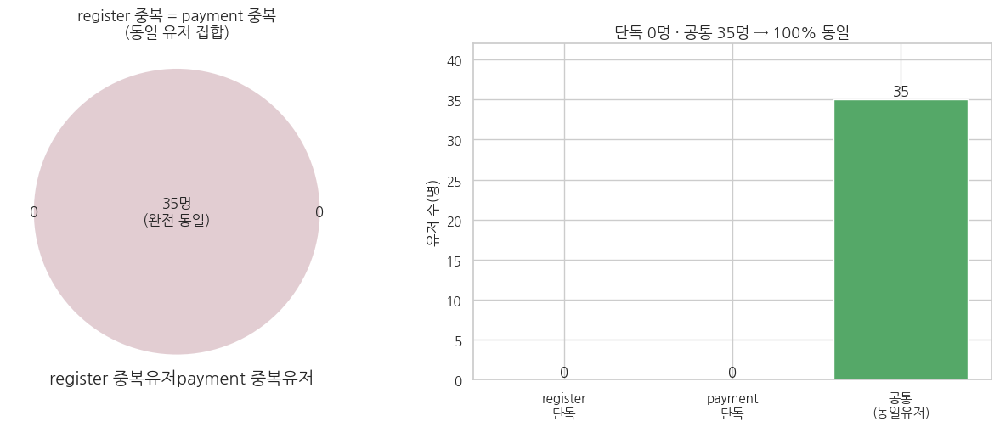

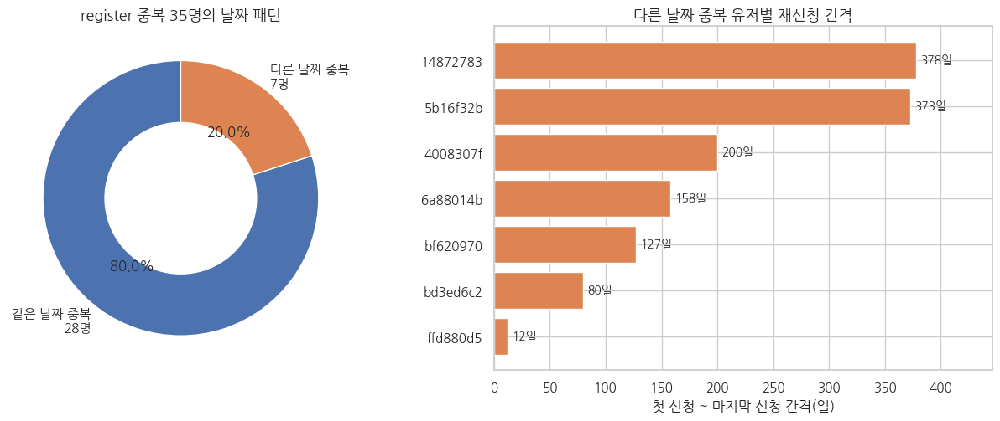

처리 전 9,659행 → 처리 후 9,624행 (제거 35행)
기준: 같은 유저는 trial_date 기준 '최종(가장 늦은) 신청'만 유지


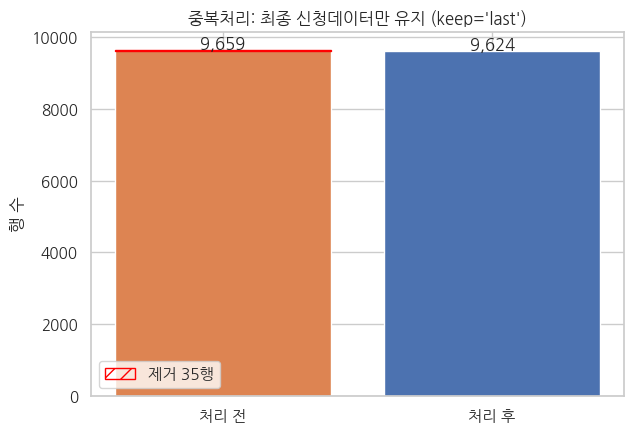

payment user_uuid 중복행: 70 / 전체컬럼 중복행: 70 → 완전중복 여부: True


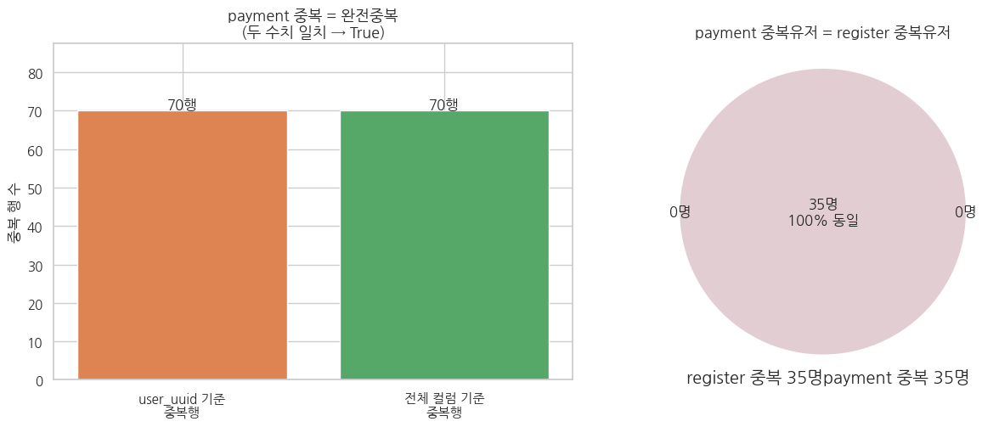

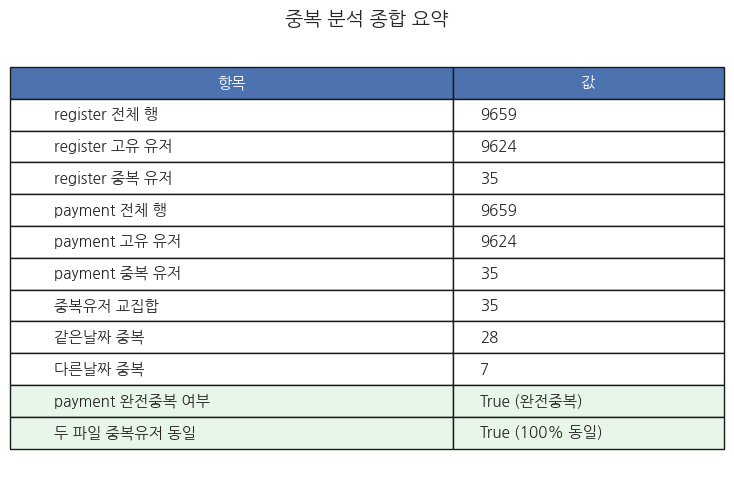

In [ ]:

#  trial_register.csv / trial_payment.csv 중복값 분석 & 시각화

# 환경 설정
# 드라이브 마운트 + 한글 폰트 설치

from google.colab import drive
drive.mount('/content/drive')

# 한글 폰트(NanumGothic) 설치 — Colab 한글 깨짐 방지
!sudo apt-get -qq -y install fonts-nanum > /dev/null
!pip -q install matplotlib-venn > /dev/null

import matplotlib.font_manager as fm
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
fm.fontManager.addfont(font_path)


#  데이터 로딩 & 중복 정의
# 이 셀만 실행하면 이후 모든 시각화 셀이 사용하는 핵심 객체가 만들어집니다.
# 세션이 리셋되면 이 셀부터 다시 실행하세요.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

# 한글 폰트 적용
mpl.rc('font', family='NanumGothic')
mpl.rcParams['axes.unicode_minus'] = False   # 마이너스 깨짐 방지

BASE = '/content/drive/MyDrive/codeit_project_3'

reg = pd.read_csv(f'{BASE}/trial_register.csv')
pay = pd.read_csv(f'{BASE}/trial_payment.csv')

reg['trial_date'] = pd.to_datetime(reg['trial_date'])

# 중복 유저 집합 정의
# 중복 = 같은 user_uuid가 2번 이상 등장
reg_dup_users = set(reg.loc[reg.duplicated('user_uuid', keep=False), 'user_uuid'])
pay_dup_users = set(pay.loc[pay.duplicated('user_uuid', keep=False), 'user_uuid'])

# 색상
C_REG, C_PAY, C_BOTH = '#4C72B0', '#DD8452', '#55A868'

print(f"register 전체 {len(reg):,}행 / 고유유저 {reg['user_uuid'].nunique():,}명 "
      f"→ 중복유저 {len(reg_dup_users)}명")
print(f"payment  전체 {len(pay):,}행 / 고유유저 {pay['user_uuid'].nunique():,}명 "
      f"→ 중복유저 {len(pay_dup_users)}명")
print(f"교집합(동일 중복유저): {len(reg_dup_users & pay_dup_users)}명")
print(f"두 집합 완전 동일? {reg_dup_users == pay_dup_users}")


# 동일 중복유저 시각화
# register 중복유저 ↔ payment 중복유저가 '같은 유저'임을 Venn + 막대로 증명
from matplotlib_venn import venn2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5.2))

# (좌) 벤다이어그램
v = venn2([reg_dup_users, pay_dup_users],
          set_labels=('register 중복유저', 'payment 중복유저'),
          set_colors=(C_REG, C_PAY), alpha=0.6, ax=ax1)
for sid in ('10', '01'):                       # 단독 영역
    if v.get_label_by_id(sid): v.get_label_by_id(sid).set_text('0')
if v.get_label_by_id('11'):                    # 교집합
    v.get_label_by_id('11').set_text(f'{len(reg_dup_users & pay_dup_users)}명\n(완전 동일)')
ax1.set_title('register 중복 = payment 중복\n(동일 유저 집합)', fontsize=13, fontweight='bold')

# (우) 막대
only_r = len(reg_dup_users - pay_dup_users)
only_p = len(pay_dup_users - reg_dup_users)
both   = len(reg_dup_users & pay_dup_users)
bars = ax2.bar(['register\n단독', 'payment\n단독', '공통\n(동일유저)'],
               [only_r, only_p, both],
               color=['#B0B0B0', '#B0B0B0', C_BOTH])
for b in bars:
    ax2.text(b.get_x()+b.get_width()/2, b.get_height()+0.5,
             f'{int(b.get_height())}', ha='center', fontsize=12, fontweight='bold')
ax2.set_ylabel('유저 수(명)')
ax2.set_title('단독 0명 · 공통 35명 → 100% 동일', fontsize=13, fontweight='bold')
ax2.set_ylim(0, both*1.2)

plt.tight_layout(); plt.show()


# register 중복 날짜기준 분리
# 같은 user_uuid 중복을 → 같은날짜 중복 vs 다른날짜 중복으로 구분
dup_reg = reg[reg['user_uuid'].isin(reg_dup_users)].copy()

date_kind, gaps = {}, {}
for uid, g in dup_reg.groupby('user_uuid'):
    if g['trial_date'].nunique() == 1:
        date_kind[uid] = '같은 날짜 중복'
    else:
        date_kind[uid] = '다른 날짜 중복'
        gaps[uid] = (g['trial_date'].max() - g['trial_date'].min()).days

same_cnt = sum(v == '같은 날짜 중복' for v in date_kind.values())
diff_cnt = sum(v == '다른 날짜 중복' for v in date_kind.values())

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5.2))

# (좌) 같은날 vs 다른날 비율
wedges, _, autotxt = ax1.pie([same_cnt, diff_cnt],
        labels=[f'같은 날짜 중복\n{same_cnt}명', f'다른 날짜 중복\n{diff_cnt}명'],
        colors=[C_REG, C_PAY], autopct='%1.1f%%',
        startangle=90, wedgeprops=dict(width=0.45, edgecolor='w'))
ax1.set_title(f'register 중복 {len(reg_dup_users)}명의 날짜 패턴', fontsize=13, fontweight='bold')

# (우) 다른날짜 중복 7명의 신청 간격(일)
gap_df = pd.Series(gaps).sort_values()
ax2.barh([u[:8] for u in gap_df.index], gap_df.values, color=C_PAY)
for i, v in enumerate(gap_df.values):
    ax2.text(v+4, i, f'{v}일', va='center', fontsize=10)
ax2.set_xlabel('첫 신청 ~ 마지막 신청 간격(일)')
ax2.set_title('다른 날짜 중복 유저별 재신청 간격', fontsize=13, fontweight='bold')
ax2.set_xlim(0, gap_df.max()*1.18)

plt.tight_layout(); plt.show()


#  중복처리 = '최종 신청데이터만 유지'
reg_sorted = reg.sort_values(['user_uuid', 'trial_date'])
reg_dedup  = reg_sorted.drop_duplicates('user_uuid', keep='last').reset_index(drop=True)

removed = len(reg) - len(reg_dedup)
print(f"처리 전 {len(reg):,}행 → 처리 후 {len(reg_dedup):,}행 (제거 {removed}행)")
print("기준: 같은 유저는 trial_date 기준 '최종(가장 늦은) 신청'만 유지")

# 처리 전/후 행수 비교 막대 (간단·명확)
fig, ax = plt.subplots(figsize=(6.5, 4.5))
bars = ax.bar(['처리 전', '처리 후'], [len(reg), len(reg_dedup)],
              color=[C_PAY, C_REG])
ax.bar(['처리 전'], [removed], bottom=[len(reg_dedup)],
       color='none', edgecolor='red', hatch='//', label=f'제거 {removed}행')
for b, val in zip(bars, [len(reg), len(reg_dedup)]):
    ax.text(b.get_x()+b.get_width()/2, val+15, f'{val:,}', ha='center', fontweight='bold')
ax.set_ylabel('행 수'); ax.legend()
ax.set_title("중복처리: 최종 신청데이터만 유지 (keep='last')", fontsize=12, fontweight='bold')
plt.tight_layout(); plt.show()


# payment 완전중복 + register 35명 100% 동일
# (A) payment 중복이 '완전중복'(두 컬럼 모두 동일)임을 검증
pay_keycol_dup = pay.duplicated('user_uuid', keep=False).sum()   # user_uuid 기준 중복 행
pay_full_dup   = pay.duplicated(keep=False).sum()                # 전체 컬럼 기준 중복 행
is_complete = (pay_keycol_dup == pay_full_dup)
print(f"payment user_uuid 중복행: {pay_keycol_dup} / 전체컬럼 중복행: {pay_full_dup} "
      f"→ 완전중복 여부: {is_complete}")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5.2))

# (좌) 완전중복 검증 막대 : 두 수치가 같으면 = 완전중복
b = ax1.bar(['user_uuid 기준\n중복행', '전체 컬럼 기준\n중복행'],
            [pay_keycol_dup, pay_full_dup], color=[C_PAY, C_BOTH])
for bar in b:
    ax1.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{int(bar.get_height())}행', ha='center', fontweight='bold')
ax1.set_ylabel('중복 행 수')
ax1.set_title(f'payment 중복 = 완전중복\n(두 수치 일치 → {is_complete})', fontsize=13, fontweight='bold')
ax1.set_ylim(0, pay_full_dup*1.25)

# (우) register 35명 ↔ payment 35명 100% 동일 벤다이어그램
v = venn2([reg_dup_users, pay_dup_users],
          set_labels=('register 중복 35명', 'payment 중복 35명'),
          set_colors=(C_REG, C_PAY), alpha=0.6, ax=ax2)
for sid in ('10', '01'):
    if v.get_label_by_id(sid): v.get_label_by_id(sid).set_text('0명')
if v.get_label_by_id('11'):
    v.get_label_by_id('11').set_text(f'{len(reg_dup_users & pay_dup_users)}명\n100% 동일')
ax2.set_title('payment 중복유저 = register 중복유저', fontsize=13, fontweight='bold')

plt.tight_layout(); plt.show()


# 종합 요약 시각화(매트릭스/표)
# 요약 테이블 + 히트맵
summary = pd.DataFrame({
    '항목': ['register 전체 행', 'register 고유 유저', 'register 중복 유저',
            'payment 전체 행', 'payment 고유 유저', 'payment 중복 유저',
            '중복유저 교집합', '같은날짜 중복', '다른날짜 중복',
            'payment 완전중복 여부', '두 파일 중복유저 동일'],
    '값': [len(reg), reg['user_uuid'].nunique(), len(reg_dup_users),
          len(pay), pay['user_uuid'].nunique(), len(pay_dup_users),
          len(reg_dup_users & pay_dup_users), same_cnt, diff_cnt,
          'True (완전중복)', 'True (100% 동일)']
})

fig, ax = plt.subplots(figsize=(7.5, 5))
ax.axis('off')
tbl = ax.table(cellText=summary.values, colLabels=summary.columns,
               cellLoc='left', loc='center', colWidths=[0.62, 0.38])
tbl.auto_set_font_size(False); tbl.set_fontsize(11); tbl.scale(1, 1.7)
# 헤더/검증행 강조
for (r, c), cell in tbl.get_celld().items():
    if r == 0:
        cell.set_facecolor(C_REG); cell.set_text_props(color='w', fontweight='bold')
    elif r >= len(summary)-1:           # 마지막 검증 행
        cell.set_facecolor('#E8F5E9')
ax.set_title('중복 분석 종합 요약', fontsize=14, fontweight='bold', pad=12)
plt.tight_layout(); plt.show()

# (참고) 정제 결과 저장이 필요하면 주석 해제
# reg_dedup.to_csv(f'{BASE}/trial_register_dedup.csv', index=False)
# print('저장 완료:', f'{BASE}/trial_register_dedup.csv')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


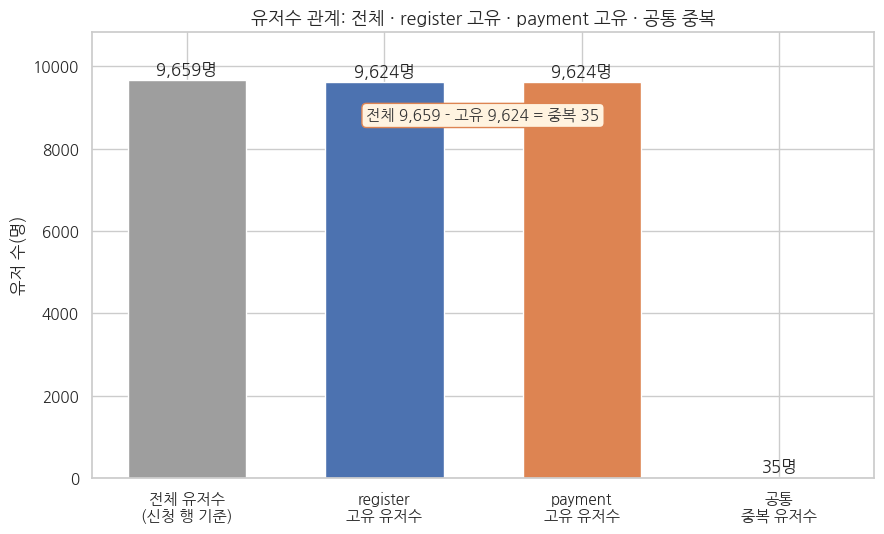

[검증1] 중복유저 집합 동일? True (register 35명 / payment 35명)
        payment에만 발생한 고유 중복: 0 명
[검증2] 전체 9,624명 중 register행수 ≠ payment행수 인 유저: 0 명 → 행수 1:1 대응: True
[검증3] 중복유저 35명 (register행수, payment행수) 패턴: {(2, 2): 35}

[결론] 모든 유저에서 신청 행수 = payment 행수이고, payment 고유 중복이 0건이므로
       payment 중복값은 register의 중복신청에서 파생된 결과로 판단됨.


In [ ]:

#  trial_register.csv / trial_payment.csv 중복값 분석

#  환경 설정
from google.colab import drive
drive.mount('/content/drive')

!sudo apt-get -qq -y install fonts-nanum > /dev/null      # 한글 폰트

import matplotlib.font_manager as fm
fm.fontManager.addfont('/usr/share/fonts/truetype/nanum/NanumGothic.ttf')


# 데이터 로딩 & 중복 정의
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rc('font', family='NanumGothic')
mpl.rcParams['axes.unicode_minus'] = False

BASE = '/content/drive/MyDrive/codeit_project_3'
reg = pd.read_csv(f'{BASE}/trial_register.csv')
pay = pd.read_csv(f'{BASE}/trial_payment.csv')
reg['trial_date'] = pd.to_datetime(reg['trial_date'])

# 중복유저 집합
reg_dup_users = set(reg.loc[reg.duplicated('user_uuid', keep=False), 'user_uuid'])
pay_dup_users = set(pay.loc[pay.duplicated('user_uuid', keep=False), 'user_uuid'])
common_dup = reg_dup_users & pay_dup_users


# 유저수 관계 그래프
# 전체 유저수(신청 행 기준) / register 고유유저 / payment 고유유저 / 공통 중복유저
total_rows   = len(reg)                       # 전체 행(신청 건수) = 9,659
reg_unique   = reg['user_uuid'].nunique()     # register 고유 유저 = 9,624
pay_unique   = pay['user_uuid'].nunique()     # payment  고유 유저 = 9,624
common_n     = len(common_dup)                # 공통 중복 유저   = 35

labels = ['전체 유저수\n(신청 행 기준)', 'register\n고유 유저수',
          'payment\n고유 유저수', '공통\n중복 유저수']
values = [total_rows, reg_unique, pay_unique, common_n]
colors = ['#9E9E9E', '#4C72B0', '#DD8452', '#55A868']

fig, ax = plt.subplots(figsize=(9, 5.5))
bars = ax.bar(labels, values, color=colors, width=0.6)
for b, v in zip(bars, values):
    ax.text(b.get_x() + b.get_width()/2, b.get_height() + total_rows*0.012,
            f'{v:,}명', ha='center', fontsize=12, fontweight='bold')

# 관계 주석: 전체 - 고유 = 중복
ax.annotate(f'전체 {total_rows:,} - 고유 {reg_unique:,} = 중복 {total_rows-reg_unique}',
            xy=(0.5, max(values)*0.9), xycoords=('axes fraction', 'data'),
            ha='center', fontsize=11, color='#333',
            bbox=dict(boxstyle='round', fc='#FFF3E0', ec='#DD8452'))

ax.set_ylabel('유저 수(명)')
ax.set_ylim(0, total_rows*1.12)
ax.set_title('유저수 관계: 전체 · register 고유 · payment 고유 · 공통 중복',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


# register 중복신청 → payment 중복 원인
# 인과 근거를 출력
pay['_idx'] = 1
reg_cnt = reg.groupby('user_uuid').size()
pay_cnt = pay.groupby('user_uuid').size()
cnt = pd.DataFrame({'reg_n': reg_cnt, 'pay_n': pay_cnt}).fillna(0).astype(int)

print("[검증1] 중복유저 집합 동일?",
      reg_dup_users == pay_dup_users,
      f"(register {len(reg_dup_users)}명 / payment {len(pay_dup_users)}명)")
print("        payment에만 발생한 고유 중복:", len(pay_dup_users - reg_dup_users), "명")

mismatch = cnt[cnt['reg_n'] != cnt['pay_n']]
print(f"[검증2] 전체 {len(cnt):,}명 중 register행수 ≠ payment행수 인 유저:",
      len(mismatch), "명 → 행수 1:1 대응:", len(mismatch) == 0)

dup_pat = cnt.loc[list(reg_dup_users)].groupby(['reg_n', 'pay_n']).size().to_dict()
print("[검증3] 중복유저 35명 (register행수, payment행수) 패턴:", dup_pat)

print("\n[결론] 모든 유저에서 신청 행수 = payment 행수이고, payment 고유 중복이 0건이므로")
print("       payment 중복값은 register의 중복신청에서 파생된 결과로 판단됨.")

### 3-4. 데이터 분포 & 비율

In [ ]:
# (1) 결제 전환율 (전체)
total_reg = reg['user_uuid'].nunique()
total_pay = pay[pay['is_payment']==1]['user_uuid'].nunique()
print(f'전체 신청자: {total_reg:,}명')
print(f'유료 전환자: {total_pay:,}명')
print(f'전체 전환율: {total_pay/total_reg*100:.2f}%')

# (2) 방문 여부별 전환율
visited = set(visit['user_uuid'].unique())
pay_d = pay.drop_duplicates(subset='user_uuid').set_index('user_uuid')['is_payment']
reg_d = reg.drop_duplicates(subset='user_uuid', keep='first')
reg_d['visited']    = reg_d['user_uuid'].isin(visited).astype(int)
reg_d['is_payment'] = reg_d['user_uuid'].map(pay_d).fillna(0).astype(int)
print('\n=== 방문 여부별 전환율 ===')
print(reg_d.groupby('visited').agg(users=('user_uuid','count'), paid=('is_payment','sum'),
                                    rate=('is_payment','mean')).round(3))

전체 신청자: 9,624명
유료 전환자: 3,652명
전체 전환율: 37.95%

=== 방문 여부별 전환율 ===
         users  paid   rate
visited                    
0         3090  1088  0.352
1         6534  2564  0.392


In [ ]:
# (3) 방문 횟수별 전환율
visit_count = visit.groupby('user_uuid').size().rename('visit_count')
reg_d = reg_d.merge(visit_count, on='user_uuid', how='left').fillna({'visit_count':0})
reg_d['visit_bucket'] = pd.cut(reg_d['visit_count'], bins=[-1,0,1,2,3,10],
                                labels=['0회','1회','2회','3회','4회+'])
print('=== 방문 횟수별 전환율 ===')
print(reg_d.groupby('visit_bucket', observed=True).agg(
    users=('user_uuid','count'),
    paid=('is_payment','sum'),
    rate=('is_payment','mean')).round(3))

=== 방문 횟수별 전환율 ===
              users  paid   rate
visit_bucket                    
0회             3090  1088  0.352
1회             3182  1064  0.334
2회             1926   806  0.418
3회             1294   600  0.464
4회+             132    94  0.712


In [ ]:
# (4) 지점별 이용 현황 (방문수 / 유저수 / 면적당 이용밀도)
site_summary = (visit.groupby('site_id')
                .agg(visits=('user_uuid','count'),
                     users=('user_uuid','nunique'),
                     avg_stay_hr=('stay_time_second', lambda s: s.mean()/3600))
                .merge(area, on='site_id', how='left'))
site_summary['visits_per_pyeong'] = (site_summary['visits']/site_summary['area_pyeong']).round(2)
site_summary['avg_stay_hr'] = site_summary['avg_stay_hr'].round(2)
print('=== 지점별 이용 현황 ===')
print(site_summary.sort_values('visits_per_pyeong', ascending=False))

=== 지점별 이용 현황 ===
   site_id  visits  users  avg_stay_hr  area_pyeong  visits_per_pyeong
0        1    1383    918         4.23           50              27.66
1        2    1979   1131         5.27          100              19.79
6       17     797    482         3.92           50              15.94
2        3    2370   1402         4.81          150              15.80
5        6    2233   1331         4.76          150              14.89
7       47     534    332         4.01           50              10.68
3        4     863    517         4.37          100               8.63
4        5    1055    619         4.51          150               7.03
8       49     263    145         4.13           50               5.26


In [ ]:
import pandas as pd
from IPython.display import display


# 1. 결제 전환율 (전체) 데이터프레임
total_reg = reg['user_uuid'].nunique()
total_pay = pay[pay['is_payment'] == 1]['user_uuid'].nunique()
overall_rate = (total_pay / total_reg) * 100

overall_data = [
    {"지표": "전체 신청자", "수치": f"{total_reg:,}명"},
    {"지표": "유료 전환자", "수치": f"{total_pay:,}명"},
    {"지표": "전체 전환율", "수치": f"{overall_rate:.2f}%"}
]
overall_df = pd.DataFrame(overall_data)



# 2.방문 여부별 전환율 데이터프레임

visited = set(visit['user_uuid'].unique())
pay_d = pay.drop_duplicates(subset='user_uuid').set_index('user_uuid')['is_payment']


reg_d = reg.drop_duplicates(subset='user_uuid', keep='first').copy()
reg_d['visited'] = reg_d['user_uuid'].isin(visited).astype(int)
reg_d['is_payment'] = reg_d['user_uuid'].map(pay_d).fillna(0).astype(int)

# Groupby 연산 및 인덱스 초기화
visit_rate_df = reg_d.groupby('visited').agg(
    users=('user_uuid', 'count'),
    paid=('is_payment', 'sum'),
    rate=('is_payment', 'mean')
).reset_index()

#데이터 정제 및 컬럼명 변경
visit_rate_df['visited'] = visit_rate_df['visited'].map({0: '미방문', 1: '방문'})
visit_rate_df.rename(columns={
    'visited': '방문 여부',
    'users': '신청 유저 수(명)',
    'paid': '결제 유저 수(명)',
    'rate': '전환율'
}, inplace=True)

# 수치 포맷팅 (소수점 정리 및 % 기호 추가)
visit_rate_df['전환율'] = (visit_rate_df['전환율'] * 100).round(2).astype(str) + '%'


# 3. 결과 출력
print("=== [결과 1] 전체 결제 전환율 ===")
display(overall_df)

print("\n=== [결과 2] 방문 여부별 결제 전환율 ===")
display(visit_rate_df)

=== [결과 1] 전체 결제 전환율 ===


,지표,수치
0,전체 신청자,"9,624명"
1,유료 전환자,"3,652명"
2,전체 전환율,37.95%



=== [결과 2] 방문 여부별 결제 전환율 ===


,방문 여부,신청 유저 수(명),결제 유저 수(명),전환율
0,미방문,3090,1088,35.21%
1,방문,6534,2564,39.24%


[Step 1] 그룹별 등록일 기술 통계
----------------------------------------------------------------------


,group,n,min_date,median_date,mean_date,max_date
0,방문O 결제O,2564,2021-05-01,2022-07-15,2022-07-29,2023-12-31
1,방문O 결제X,3970,2021-05-01,2022-09-12,2022-09-15,2023-12-31
2,방문X 결제O (★ 미방문 결제자),1088,2021-05-01,2022-03-25,2022-05-20,2023-12-26
3,방문X 결제X (★ 미방문 미결제자),2002,2021-05-03,2022-07-18,2022-07-22,2023-12-30



[Step 2] 미방문 결제자 vs 미방문 미결제자 등록일 차이
----------------------------------------------------------------------


,그룹,n,중앙값,평균
0,미방문 결제자,"1,088",2022-03-25,2022-05-20
1,미방문 미결제자,"2,002",2022-07-18,2022-07-22
2,차이 (미결제자 - 결제자),-,114일 (약 3.8개월),62일 (약 2.1개월)


  → 미방문 결제자가 더 일찍 등록

[Step 3] Mann-Whitney U test
----------------------------------------------------------------------


,항목,내용
0,H0 (귀무가설),미방문 결제자 등록일 ≥ 미방문 미결제자 등록일 (차이 없거나 늦음)
1,H1 (대립가설),미방문 결제자 등록일 < 미방문 미결제자 등록일 (더 빠름)
2,U-statistic,"940,151"
3,p-value,1.61e-10
4,결론,p < 0.001 : 매우 강한 통계적 유의성 — 등록일 차이는 우연이 아님



[Step 4] 분기별 미방문 결제 비율 추이
----------------------------------------------------------------------


,quarter,total,nv_paid_cnt,nv_paid_rate
0,2021Q2,603,131,21.7
1,2021Q3,1194,165,13.8
2,2021Q4,1011,147,14.5
3,2022Q1,988,105,10.6
4,2022Q2,740,70,9.5
5,2022Q3,888,93,10.5
6,2022Q4,868,99,11.4
7,2023Q1,841,94,11.2
8,2023Q2,772,89,11.5
9,2023Q3,906,58,6.4


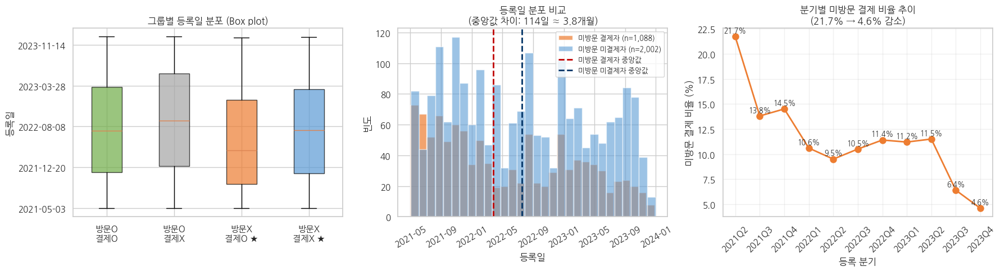


🎯 검증 결론
1. 미방문 결제자(1,088명)는 미방문 미결제자(2,002명)보다 등록일 중앙값이 114일 (약 3.8개월) 더 빠름
2. Mann-Whitney U test 결과 p-value = 1.61e-10 → 통계적으로 유의한 차이
3. 분기별 미방문 결제 비율: 21.7% (2021Q?) → 4.6% (최근) 감소 추세
4. → "비즈니스 초기에는 체험 없이 결제하는 경로가 활성, 시간이 갈수록 체험→결제 흐름이 표준화"


In [ ]:

# [검증] 미방문 결제자가 미방문 미결제자보다 먼저 등록했나?
# 가설: 미방문 결제자는 비즈니스 초기에 집중되어 있다

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from IPython.display import display

# 데이터 준비
reg['trial_date'] = pd.to_datetime(reg['trial_date'])
reg_d = reg.sort_values('trial_date').drop_duplicates(subset='user_uuid', keep='first').copy()
pay_d = pay.drop_duplicates(subset='user_uuid')

visited_users = set(visit['user_uuid'].unique())
paid_users    = set(pay_d[pay_d['is_payment']==1]['user_uuid'])

# 그룹 분류
def classify(uid):
    v = uid in visited_users
    p = uid in paid_users
    if v and p:     return '방문O 결제O'
    if v and not p: return '방문O 결제X'
    if not v and p: return '방문X 결제O (★ 미방문 결제자)'
    return '방문X 결제X (★ 미방문 미결제자)'

reg_d['group'] = reg_d['user_uuid'].apply(classify)

# Step 1. 그룹별 등록일 기술 통계
print('[Step 1] 그룹별 등록일 기술 통계')
print('-'*70)
stats_df = reg_d.groupby('group')['trial_date'].agg(
    n='count',
    min_date='min',
    median_date='median',
    mean_date='mean',
    max_date='max'
).reset_index()
# 날짜만 표시
for c in ['min_date','median_date','mean_date','max_date']:
    stats_df[c] = stats_df[c].dt.date
display(stats_df)

# Step 2. 핵심 두 그룹 간 차이 계산
nv_paid    = reg_d[reg_d['group']=='방문X 결제O (★ 미방문 결제자)']['trial_date']
nv_nonpaid = reg_d[reg_d['group']=='방문X 결제X (★ 미방문 미결제자)']['trial_date']

diff_days_median = (nv_nonpaid.median() - nv_paid.median()).days
diff_days_mean   = (nv_nonpaid.mean()   - nv_paid.mean()).days

print(f'\n[Step 2] 미방문 결제자 vs 미방문 미결제자 등록일 차이')
print('-'*70)
step2_df = pd.DataFrame({
    '그룹': ['미방문 결제자', '미방문 미결제자', '차이 (미결제자 - 결제자)'],
    'n': [f'{len(nv_paid):,}', f'{len(nv_nonpaid):,}', '-'],
    '중앙값': [
        str(nv_paid.median().date()),
        str(nv_nonpaid.median().date()),
        f'{diff_days_median}일 (약 {diff_days_median/30:.1f}개월)'
    ],
    '평균': [
        str(nv_paid.mean().date()),
        str(nv_nonpaid.mean().date()),
        f'{diff_days_mean}일 (약 {diff_days_mean/30:.1f}개월)'
    ]
})
display(step2_df)
print(f'  → 미방문 결제자가 더 일찍 등록' if diff_days_median > 0 else '  → 미방문 결제자가 더 늦게 등록')

# Step 3. 통계적 유의성 검정 (Mann-Whitney U test)
# 정규성을 가정하지 않는 비모수 검정 — 등록일 분포가 정규분포가 아니므로 적절
nv_paid_ord    = nv_paid.astype('int64')   // 10**9  # 초 단위 ordinal
nv_nonpaid_ord = nv_nonpaid.astype('int64') // 10**9
u_stat, p_value = stats.mannwhitneyu(nv_paid_ord, nv_nonpaid_ord, alternative='less')

print(f'\n[Step 3] Mann-Whitney U test')
print('-'*70)
if p_value < 0.001:
    conclusion = 'p < 0.001 : 매우 강한 통계적 유의성 — 등록일 차이는 우연이 아님'
elif p_value < 0.05:
    conclusion = 'p < 0.05 : 통계적으로 유의 — 등록일 차이 가설 지지'
else:
    conclusion = 'p ≥ 0.05 : 통계적 유의성 없음'

step3_df = pd.DataFrame({
    '항목': ['H0 (귀무가설)', 'H1 (대립가설)', 'U-statistic', 'p-value', '결론'],
    '내용': [
        '미방문 결제자 등록일 ≥ 미방문 미결제자 등록일 (차이 없거나 늦음)',
        '미방문 결제자 등록일 < 미방문 미결제자 등록일 (더 빠름)',
        f'{u_stat:,.0f}',
        f'{p_value:.2e}',
        conclusion
    ]
})
display(step3_df)

# Step 4. 분기별 추이 — 시간에 따라 미방문 결제 비율이 감소하는가
print(f'\n[Step 4] 분기별 미방문 결제 비율 추이')
print('-'*70)
reg_d['quarter'] = reg_d['trial_date'].dt.to_period('Q').astype(str)
quarterly = reg_d.groupby('quarter').agg(
    total=('user_uuid','count'),
    nv_paid_cnt=('group', lambda s: (s=='방문X 결제O (★ 미방문 결제자)').sum())
).reset_index()
quarterly['nv_paid_rate'] = (quarterly['nv_paid_cnt'] / quarterly['total'] * 100).round(1)
display(quarterly)

# Step 5. 시각화 (3 패널)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# (1) 그룹별 등록일 박스플롯
ax = axes[0]
groups_order = ['방문O 결제O','방문O 결제X','방문X 결제O (★ 미방문 결제자)','방문X 결제X (★ 미방문 미결제자)']
box_data = [reg_d[reg_d['group']==g]['trial_date'].astype('int64')//10**9 for g in groups_order]
bp = ax.boxplot(box_data, labels=['방문O\n결제O','방문O\n결제X','방문X\n결제O ★','방문X\n결제X ★'], patch_artist=True)
colors = ['#70AD47','#A5A5A5','#ED7D31','#5B9BD5']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color); patch.set_alpha(0.7)
# y축을 다시 날짜로 변환
import matplotlib.dates as mdates
yticks = ax.get_yticks()
ax.set_yticklabels([pd.Timestamp(int(t), unit='s').date() for t in yticks])
ax.set_title('그룹별 등록일 분포 (Box plot)', fontsize=12, fontweight='bold')
ax.set_ylabel('등록일')

# (2) 미방문 결제자 vs 미방문 미결제자 히스토그램
ax = axes[1]
ax.hist(nv_paid, bins=30, color='#ED7D31', alpha=0.7, label=f'미방문 결제자 (n={len(nv_paid):,})', edgecolor='white')
ax.hist(nv_nonpaid, bins=30, color='#5B9BD5', alpha=0.6, label=f'미방문 미결제자 (n={len(nv_nonpaid):,})', edgecolor='white')
ax.axvline(nv_paid.median(), color='#C00000', ls='--', lw=2, label=f'미방문 결제자 중앙값')
ax.axvline(nv_nonpaid.median(), color='#003366', ls='--', lw=2, label=f'미방문 미결제자 중앙값')
ax.set_title(f'등록일 분포 비교\n(중앙값 차이: {diff_days_median}일 ≈ {diff_days_median/30:.1f}개월)', fontsize=12, fontweight='bold')
ax.set_xlabel('등록일'); ax.set_ylabel('빈도'); ax.legend(fontsize=9)
plt.setp(ax.get_xticklabels(), rotation=30)

# (3) 분기별 미방문 결제 비율 추이
ax = axes[2]
ax.plot(quarterly['quarter'], quarterly['nv_paid_rate'], marker='o', linewidth=2,
        color='#ED7D31', markersize=8)
for x, y in zip(quarterly['quarter'], quarterly['nv_paid_rate']):
    ax.text(x, y+0.4, f'{y}%', ha='center', fontsize=9)
ax.set_title(f'분기별 미방문 결제 비율 추이\n({quarterly["nv_paid_rate"].iloc[0]}% → {quarterly["nv_paid_rate"].iloc[-1]}% 감소)',
             fontsize=12, fontweight='bold')
ax.set_xlabel('등록 분기'); ax.set_ylabel('미방문 결제 비율 (%)')
plt.setp(ax.get_xticklabels(), rotation=45)
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Step 6. 결론
print('\n' + '='*70)
print('🎯 검증 결론')
print('='*70)
print(f'1. 미방문 결제자(1,088명)는 미방문 미결제자(2,002명)보다 등록일 중앙값이 {diff_days_median}일 (약 {diff_days_median/30:.1f}개월) 더 빠름')
print(f'2. Mann-Whitney U test 결과 p-value = {p_value:.2e} → 통계적으로 유의한 차이')
print(f'3. 분기별 미방문 결제 비율: {quarterly["nv_paid_rate"].iloc[0]}% (2021Q?) → {quarterly["nv_paid_rate"].iloc[-1]}% (최근) 감소 추세')
print(f'4. → "비즈니스 초기에는 체험 없이 결제하는 경로가 활성, 시간이 갈수록 체험→결제 흐름이 표준화"')

In [ ]:
import pandas as pd
from IPython.display import display

# 0. 멱등성 보장: 재실행 시 충돌 방지
reg_d = reg_d.drop(columns=['visit_count', 'visit_bucket', 'is_payment'], errors='ignore')

# 1. is_payment 가져오기 — pay_d 사용 (reg_d와 동일하게 정제된 9,624행 짝)
pay_src = pay_d[['user_uuid', 'is_payment']].drop_duplicates('user_uuid')   # 안전하게 1:1 보장
reg_d = reg_d.merge(pay_src, on='user_uuid', how='left')
reg_d['is_payment'] = reg_d['is_payment'].fillna(0).astype(int)

# 2. 방문 횟수 계산
visit_count = (
    visit.groupby('user_uuid')
         .size()
         .reset_index(name='visit_count')
)
reg_d = reg_d.merge(visit_count, on='user_uuid', how='left')
reg_d['visit_count'] = reg_d['visit_count'].fillna(0)

# 3. 방문 횟수 구간 설정
reg_d['visit_bucket'] = pd.cut(
    reg_d['visit_count'],
    bins=[-1, 0, 1, 2, 3, 10],
    labels=['0회', '1회', '2회', '3회', '4회+']
)

# 4. 집계
visit_bucket_df = reg_d.groupby('visit_bucket', observed=True).agg(
    users=('user_uuid', 'count'),
    paid=('is_payment', 'sum'),
    rate=('is_payment', 'mean')
).reset_index()

# 5. 컬럼명 변경
visit_bucket_df.rename(columns={
    'visit_bucket': '방문 횟수',
    'users': '신청 유저 수(명)',
    'paid': '결제 유저 수(명)',
    'rate': '전환율'
}, inplace=True)

# 6. 포맷팅 & 출력
visit_bucket_df['전환율'] = (visit_bucket_df['전환율'] * 100).round(1).astype(str) + '%'
print("=== [결과 3] 방문 횟수별 결제 전환율 ===")
display(visit_bucket_df)

=== [결과 3] 방문 횟수별 결제 전환율 ===


,방문 횟수,신청 유저 수(명),결제 유저 수(명),전환율
0,0회,3090,1088,35.2%
1,1회,3182,1064,33.4%
2,2회,1926,806,41.8%
3,3회,1294,600,46.4%
4,4회+,132,94,71.2%


In [ ]:
import pandas as pd
from IPython.display import display

# 1. 지점별 통계 집계 및 면적 데이터 병합
site_summary = (
    visit.groupby('site_id')
    .agg(
        visits=('user_uuid', 'count'),
        users=('user_uuid', 'nunique'),
        avg_stay_hr=('stay_time_second', lambda s: s.mean() / 3600)
    )
    .reset_index()  # site_id를 일반 컬럼으로 변환하여 병합 및 출력 형태 개선
    .merge(area, on='site_id', how='left')
)

# 2. 파생 변수(평당 방문수) 생성 및 소수점 정리
site_summary['visits_per_pyeong'] = (site_summary['visits'] / site_summary['area_pyeong']).round(2)
site_summary['avg_stay_hr'] = site_summary['avg_stay_hr'].round(2)

# 3. 데이터 정렬 (평당 방문수 기준 내림차순)
site_summary = site_summary.sort_values('visits_per_pyeong', ascending=False)

# 4. 표 출력을 위한 데이터 정제 및 컬럼명 변경
site_summary.rename(columns={
    'site_id': '지점 ID',
    'visits': '총 방문수(건)',
    'users': '순 방문 유저수(명)',
    'avg_stay_hr': '평균 체류시간(시간)',
    'area_pyeong': '면적(평)',
    'visits_per_pyeong': '평당 방문 밀도(건/평)'
}, inplace=True)

# 5. 결과 출력
print("=== [결과 4] 지점별 이용 현황 (평당 방문 밀도 기준 내림차순) ===")
display(site_summary.reset_index(drop=True)) # 출력 시 불필요한 기존 인덱스 숨김

=== [결과 4] 지점별 이용 현황 (평당 방문 밀도 기준 내림차순) ===


,지점 ID,총 방문수(건),순 방문 유저수(명),평균 체류시간(시간),면적(평),평당 방문 밀도(건/평)
0,1,1383,918,4.23,50,27.66
1,2,1979,1131,5.27,100,19.79
2,17,797,482,3.92,50,15.94
3,3,2370,1402,4.81,150,15.80
4,6,2233,1331,4.76,150,14.89
5,47,534,332,4.01,50,10.68
6,4,863,517,4.37,100,8.63
7,5,1055,619,4.51,150,7.03
8,49,263,145,4.13,50,5.26


### 3-5. 시각화 요약

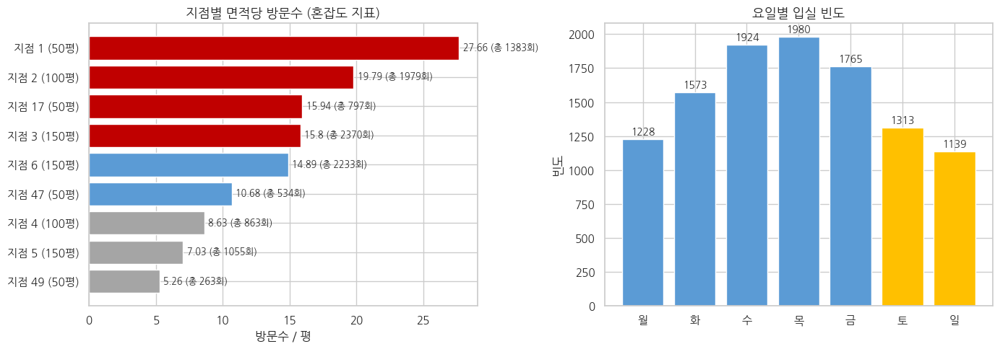

In [ ]:
# (d) 지점별 이용 (면적 대비 효율) + 요일 패턴

# site_summary를 셀 안에서 재계산
site_summary = (visit.groupby('site_id')
                .agg(visits=('user_uuid','count'),
                     users=('user_uuid','nunique'),
                     avg_stay_hr=('stay_time_second', lambda x: x.mean()/3600))
                .merge(area, on='site_id', how='left'))
site_summary['visits_per_pyeong'] = (site_summary['visits'] / site_summary['area_pyeong']).round(2)
site_summary['avg_stay_hr'] = site_summary['avg_stay_hr'].round(2)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 지점별 면적당 방문수
ax = axes[0]
s = site_summary.sort_values('visits_per_pyeong', ascending=True)
colors = ['#C00000' if v>=15 else '#5B9BD5' if v>=10 else '#A5A5A5' for v in s['visits_per_pyeong']]
y_labels = [f'지점 {sid} ({pyeong}평)' for sid, pyeong in zip(s['site_id'], s['area_pyeong'])]
ax.barh(y_labels, s['visits_per_pyeong'], color=colors)
for i, (v, p) in enumerate(zip(s['visits_per_pyeong'], s['visits'])):
    ax.text(v + 0.3, i, f'{v} (총 {p}회)', va='center', fontsize=9)
ax.set_title('지점별 면적당 방문수 (혼잡도 지표)', fontsize=13)
ax.set_xlabel('방문수 / 평')

# 요일별 입실
ax = axes[1]
visit['dow'] = visit['first_enter_time'].dt.dayofweek
dow_kr = ['월','화','수','목','금','토','일']
dow = visit['dow'].dropna().astype(int).value_counts().sort_index()
colors = ['#5B9BD5']*5 + ['#FFC000']*2
ax.bar([dow_kr[i] for i in dow.index], dow.values, color=colors)
for i, v in enumerate(dow.values):
    ax.text(i, v + 30, f'{v}', ha='center', fontsize=10)
ax.set_title('요일별 입실 빈도', fontsize=13)
ax.set_ylabel('빈도')

plt.tight_layout()
plt.show()

In [ ]:

# 사전 작업: reg_d에 visit_bucket 컬럼 생성

# 1. 유저별 방문횟수 계산 (visit 테이블 기준)
visit_count = visit.groupby('user_uuid').size().reset_index(name='visit_cnt')

# 2. reg_d에 방문횟수 병합 (방문 기록 없는 유저는 0회로 처리)
reg_d = reg_d.merge(visit_count, on='user_uuid', how='left')
reg_d['visit_cnt'] = reg_d['visit_cnt'].fillna(0).astype(int)

# 3. 방문횟수를 구간(bucket)으로 분류
bins = [-1, 0, 1, 3, 5, float('inf')]
labels = ['0회', '1회', '2~3회', '4~5회', '6회 이상']
reg_d['visit_bucket'] = pd.cut(reg_d['visit_cnt'], bins=bins, labels=labels)

# 확인
print(reg_d['visit_bucket'].value_counts().sort_index())

visit_bucket
0회       3090
1회       3182
2~3회     3220
4~5회      123
6회 이상       9
Name: count, dtype: int64


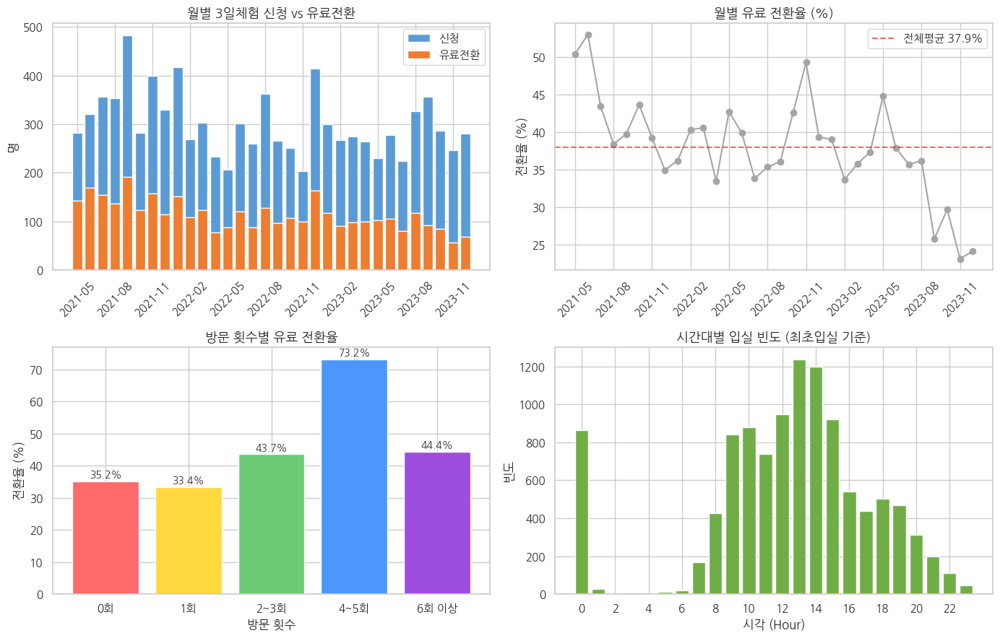

In [ ]:
# (a) 월별 신청 추이
fig, axes = plt.subplots(2, 2, figsize=(14, 9))
reg_d['trial_month'] = reg_d['trial_date'].dt.to_period('M').astype(str)
m = reg_d.groupby('trial_month').agg(reg=('user_uuid','count'), pay=('is_payment','sum'))
m['rate'] = m['pay']/m['reg']

ax = axes[0,0]
ax.bar(m.index, m['reg'], color='#5B9BD5', label='신청')
ax.bar(m.index, m['pay'], color='#ED7D31', label='유료전환')
ax.set_title('월별 3일체험 신청 vs 유료전환', fontsize=13)
ax.set_xticks(range(0,len(m),3))
ax.set_xticklabels(m.index[::3], rotation=45)
ax.legend(); ax.set_ylabel('명')

ax = axes[0,1]
ax.plot(m.index, m['rate']*100, marker='o', color='#A5A5A5')
ax.set_title('월별 유료 전환율 (%)', fontsize=13)
ax.set_xticks(range(0,len(m),3))
ax.set_xticklabels(m.index[::3], rotation=45)
ax.set_ylabel('전환율 (%)')
ax.axhline(reg_d['is_payment'].mean()*100, ls='--', color='red', alpha=0.6, label=f'전체평균 {reg_d["is_payment"].mean()*100:.1f}%')
ax.legend()

# (b) 방문횟수 vs 전환율
ax = axes[1,0]
vb = reg_d.groupby('visit_bucket', observed=True)['is_payment'].mean()*100
bars = ax.bar(vb.index.astype(str), vb.values, color=['#FF6B6B','#FFD93D','#6BCB77','#4D96FF','#9D4EDD'])
for b, v in zip(bars, vb.values):
    ax.text(b.get_x()+b.get_width()/2, b.get_height()+1, f'{v:.1f}%', ha='center', fontsize=10)
ax.set_title('방문 횟수별 유료 전환율', fontsize=13)
ax.set_ylabel('전환율 (%)'); ax.set_xlabel('방문 횟수')

# (c) 입실 시간대
ax = axes[1,1]
visit['enter_hour'] = visit['first_enter_time'].dt.hour
visit_hr = visit['enter_hour'].dropna().astype(int).value_counts().sort_index()
ax.bar(visit_hr.index, visit_hr.values, color='#70AD47')
ax.set_title('시간대별 입실 빈도 (최초입실 기준)', fontsize=13)
ax.set_xlabel('시각 (Hour)'); ax.set_ylabel('빈도')
ax.set_xticks(range(0,24,2))

plt.tight_layout()
plt.show()

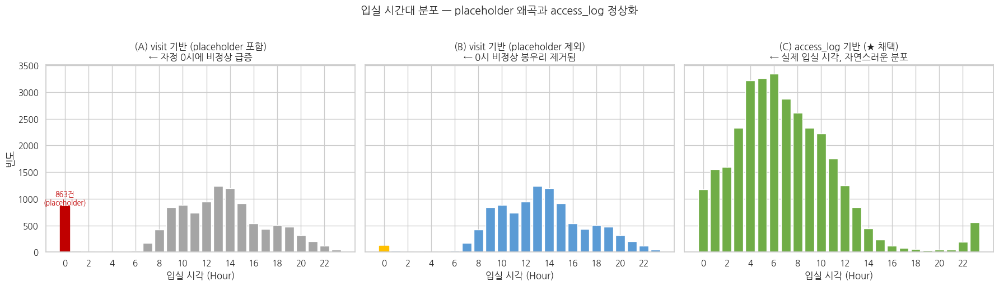


[표 1] 0시(자정) 입실 비율 비교


,산출 방식,0시 입실 건수,전체 대비 비율(%)
0,(A) visit raw (placeholder 포함),863,7.9
1,(B) visit (placeholder 제외),116,1.1
2,(C) access_log 기반 (★ 채택),1171,3.6



[표 2] 피크 시간대 Top 5 비교


,순위,(A) visit raw — 시각,(A) 건수,(C) access 기반 — 시각,(C) 건수
0,1,13시,1237,6시,3344
1,2,14시,1198,5시,3261
2,3,12시,947,4시,3222
3,4,15시,919,7시,2877
4,5,10시,880,8시,2611


In [ ]:

# [시각화] 입실 시간대 분포 — visit 기반 vs access_log 기반 비교
# placeholder가 어떻게 분포를 왜곡하는지, access_log 재산출로 어떻게 정상화되는지

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# --- 데이터 준비 ---
visit['first_enter_time'] = pd.to_datetime(visit['first_enter_time'], format='mixed')
access['cdate'] = pd.to_datetime(access['cdate'], format='mixed')

# (A) visit 기반 입실 시각 (placeholder 포함 — 기존 방식)
visit_hour = visit['first_enter_time'].dt.hour.dropna().astype(int)

# (B) visit 기반 + placeholder 제외
is_placeholder = (visit['first_enter_time'].dt.hour==0) & \
                 (visit['first_enter_time'].dt.minute==0) & \
                 (visit['first_enter_time'].dt.second==0)
visit_hour_clean = visit[~is_placeholder]['first_enter_time'].dt.hour.dropna().astype(int)

# (C) access_log 기반 입실 시각 (checkin=1 이벤트)
access_in = access[access['checkin']==1].copy()
access_hour = access_in['cdate'].dt.hour

# --- 3-패널 비교 시각화 ---
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)
hours = range(24)

# (A) visit raw — placeholder 포함
ax = axes[0]
counts_a = visit_hour.value_counts().reindex(hours, fill_value=0)
bars = ax.bar(hours, counts_a.values, color='#A5A5A5')
bars[0].set_color('#C00000')  # 0시 강조
ax.text(0, counts_a[0]+20, f'{counts_a[0]}건\n(placeholder)', ha='center', fontsize=9, color='#C00000', fontweight='bold')
ax.set_title('(A) visit 기반 (placeholder 포함)\n← 자정 0시에 비정상 급증', fontsize=12, fontweight='bold')
ax.set_xlabel('입실 시각 (Hour)'); ax.set_ylabel('빈도')
ax.set_xticks(range(0, 24, 2))

# (B) visit + placeholder 제외
ax = axes[1]
counts_b = visit_hour_clean.value_counts().reindex(hours, fill_value=0)
bars = ax.bar(hours, counts_b.values, color='#5B9BD5')
bars[0].set_color('#FFC000')
ax.set_title('(B) visit 기반 (placeholder 제외)\n← 0시 비정상 봉우리 제거됨', fontsize=12, fontweight='bold')
ax.set_xlabel('입실 시각 (Hour)')
ax.set_xticks(range(0, 24, 2))

# (C) access_log 기반
ax = axes[2]
counts_c = access_hour.value_counts().reindex(hours, fill_value=0)
ax.bar(hours, counts_c.values, color='#70AD47')
ax.set_title('(C) access_log 기반 (★ 채택)\n← 실제 입실 시각, 자연스러운 분포', fontsize=12, fontweight='bold')
ax.set_xlabel('입실 시각 (Hour)')
ax.set_xticks(range(0, 24, 2))

plt.suptitle('입실 시간대 분포 — placeholder 왜곡과 access_log 정상화', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

from IPython.display import display


# [표 1] 0시(자정) 입실 비율 비교

midnight_compare = pd.DataFrame([
    {'산출 방식': '(A) visit raw (placeholder 포함)',
     '0시 입실 건수': counts_a[0],
     '전체 대비 비율(%)': round(counts_a[0] / counts_a.sum() * 100, 1)},
    {'산출 방식': '(B) visit (placeholder 제외)',
     '0시 입실 건수': counts_b[0],
     '전체 대비 비율(%)': round(counts_b[0] / counts_b.sum() * 100, 1)},
    {'산출 방식': '(C) access_log 기반 (★ 채택)',
     '0시 입실 건수': counts_c[0],
     '전체 대비 비율(%)': round(counts_c[0] / counts_c.sum() * 100, 1)},
])
print("\n[표 1] 0시(자정) 입실 비율 비교")
display(midnight_compare)


# [표 2] 피크 시간대 Top 5 비교

top_a = counts_a.sort_values(ascending=False).head(5)
top_c = counts_c.sort_values(ascending=False).head(5)

peak_compare = pd.DataFrame({
    '순위': range(1, 6),
    '(A) visit raw — 시각': [f'{h}시' for h in top_a.index],
    '(A) 건수': top_a.values,
    '(C) access 기반 — 시각': [f'{h}시' for h in top_c.index],
    '(C) 건수': top_c.values,
})
print("\n[표 2] 피크 시간대 Top 5 비교")
display(peak_compare)

## 4. 데이터 전처리 — 마스터 테이블 구축

### 4-1. 이상치 처리 방침

| 이상치 | 처리 방침 |
|---|---|
| **`register` 같은 날 2회 신청 (28건)** | **최초 신청만 유지 — 명세서 이상치 ①** |
| **`register` 다른 날 2회 신청 (7건)** | **최초 신청만 유지 — 명세서 이상치 ②** |
| **`payment` 완전 중복 (35건)** | **`drop_duplicates(subset='user_uuid')`로 제거 — register 중복과 동일 35명 (ETL 버그)** |
| **`access` 완전 중복 (359건)** | **`drop_duplicates()`로 제거 — ETL 중복 INSERT 추정** |
| **`visit` 완전 중복 (48건)** | **`drop_duplicates()`로 제거 — ETL 중복 INSERT 추정** |
| **`visit` 시각 placeholder (≈1,000건)** | **`avg_enter_hour` 산출 시 placeholder 행 제외 + access_log 기반 시각 사용 (권장)** |
| `first/last time` 결측 (555행) | 행은 유지, 시각 의존 피처는 NaN으로 대체 |
| `stay_time_second` ≠ `last-first` (73%) | `stay_time_second`(점유시간 합)를 정답으로 사용 |
| 음수/0 stay_time | 데이터상 0=0건, 음수=없음 → 별도 처리 불요 |

In [ ]:
# (0-a) visit 테이블 완전 중복 제거 (검증에서 48건 확인됨)
before = len(visit)
visit = visit.drop_duplicates().reset_index(drop=True)
print(f'visit  중복 제거: {before:,} → {len(visit):,}행 ({before-len(visit)}건 제거)')

# (0-b) access 테이블 완전 중복 제거 (검증에서 359건 확인됨)
before = len(access)
access = access.drop_duplicates(subset=['checkin','cdate','site_id','user_uuid']).reset_index(drop=True)
print(f'access 중복 제거: {before:,} → {len(access):,}행 ({before-len(access)}건 제거)')

# (1) 신청 테이블 중복 제거 — 같은 날(28건) + 다른 날(7건) 모두 최초 신청만 유지
reg_clean = reg.sort_values('trial_date').drop_duplicates(subset='user_uuid', keep='first').reset_index(drop=True)
print(f'reg_clean      : {len(reg_clean):,}행 (중복 {len(reg)-len(reg_clean)}건 제거 = 명세서 이상치 ①+②)')

# (2) 결제 테이블 중복 제거 — payment 35건 = register 중복 35명과 동일 (ETL 버그)
pay_clean = pay.drop_duplicates(subset='user_uuid').reset_index(drop=True)
print(f'pay_clean      : {len(pay_clean):,}행 (중복 {len(pay)-len(pay_clean)}건 제거)')

# (3) 유저별 행동 피처 생성
user_features = reg_clean[['user_uuid','trial_date']].copy()

# 방문 관련
visit_agg = visit.groupby('user_uuid').agg(
    visit_count   =('date','nunique'),
    sites_used    =('site_id','nunique'),
    total_stay_sec=('stay_time_second','sum'),
    avg_stay_sec  =('stay_time_second','mean'),
    max_stay_sec  =('stay_time_second','max'),
    first_visit   =('date','min'),
    last_visit    =('date','max'),
).reset_index()
visit_agg['days_active'] = (visit_agg['last_visit'] - visit_agg['first_visit']).dt.days + 1
visit_agg['visit_density'] = visit_agg['visit_count'] / visit_agg['days_active'].clip(lower=1)

# 시간대 피처
# avg_enter_hour는 access_log 기반으로 산출 (visit의 placeholder 영향 회피)
# checkin=1(입실) 이벤트 중 유저-일자별 첫 시각을 모아 평균
access_in = access[access['checkin']==1].copy()
access_in['_date'] = access_in['cdate'].dt.date
first_enter_per_day = access_in.groupby(['user_uuid','_date'])['cdate'].min().reset_index()
first_enter_per_day['enter_hour'] = first_enter_per_day['cdate'].dt.hour + first_enter_per_day['cdate'].dt.minute/60
time_agg_access = first_enter_per_day.groupby('user_uuid')['enter_hour'].mean().rename('avg_enter_hour').reset_index()

# 주말 비중은 placeholder 영향이 없으므로 visit 기반 유지
v_ok = visit.dropna(subset=['first_enter_time']).copy()
v_ok['is_weekend'] = (v_ok['first_enter_time'].dt.dayofweek>=5).astype(int)
weekend_agg = v_ok.groupby('user_uuid').agg(weekend_ratio=('is_weekend','mean')).reset_index()

# 비교용: visit 기반 placeholder 제외 버전도 함께 저장 (참고용)
visit_clean = visit[~((visit['first_enter_time'].dt.hour==0) &
                      (visit['first_enter_time'].dt.minute==0) &
                      (visit['first_enter_time'].dt.second==0))].copy()
visit_clean['enter_hour'] = visit_clean['first_enter_time'].dt.hour
time_agg_visit_clean = visit_clean.groupby('user_uuid')['enter_hour'].mean().rename('avg_enter_hour_visit_clean').reset_index()

# 입퇴실 횟수 (액세스 로그 기반)
access_agg = access.groupby('user_uuid').agg(
    total_access = ('id','count'),
    checkin_count= ('checkin', lambda s: (s==1).sum()),
).reset_index()
access_agg['checkout_count'] = access_agg['total_access'] - access_agg['checkin_count']

# 주 사용 지점
def top_site(g):
    return g.value_counts().index[0] if len(g) else np.nan
top_site_agg = visit.groupby('user_uuid')['site_id'].apply(top_site).rename('main_site').reset_index()
top_site_agg = top_site_agg.merge(area, left_on='main_site', right_on='site_id', how='left').drop('site_id', axis=1)
top_site_agg = top_site_agg.rename(columns={'area_pyeong':'main_site_pyeong'})

# 머지
master = user_features.merge(visit_agg, on='user_uuid', how='left')
master = master.merge(time_agg_access, on='user_uuid', how='left')
master = master.merge(weekend_agg, on='user_uuid', how='left')
master = master.merge(access_agg, on='user_uuid', how='left')
master = master.merge(top_site_agg, on='user_uuid', how='left')
master = master.merge(pay_clean, on='user_uuid', how='left')

# 결측 처리
fill_cols = ['visit_count','sites_used','total_stay_sec','avg_stay_sec','max_stay_sec',
             'days_active','visit_density','total_access','checkin_count','checkout_count']
for c in fill_cols:
    master[c] = master[c].fillna(0)
master['is_payment'] = master['is_payment'].fillna(0).astype(int)
master['visited']    = (master['visit_count']>0).astype(int)

# 시간 특성 (신청월/요일 등)
master['trial_month'] = master['trial_date'].dt.month
master['trial_dow']   = master['trial_date'].dt.dayofweek

print(f'master shape: {master.shape}')
print(f'결제 비율: {master["is_payment"].mean():.3f}')
master.head(3)

visit  중복 제거: 11,477 → 11,429행 (48건 제거)
access 중복 제거: 63,708 → 63,349행 (359건 제거)
reg_clean      : 9,624행 (중복 35건 제거 = 명세서 이상치 ①+②)
pay_clean      : 9,624행 (중복 35건 제거)
master shape: (9624, 22)
결제 비율: 0.379


,user_uuid,trial_date,visit_count,sites_used,total_stay_sec,avg_stay_sec,max_stay_sec,first_visit,last_visit,days_active,...,weekend_ratio,total_access,checkin_count,checkout_count,main_site,main_site_pyeong,is_payment,visited,trial_month,trial_dow
0,f25078d1-1030-485c-85c5-dc82d6987043,2021-05-01,0.0,0.0,0.0,0.0,0.0,NaT,NaT,0.0,...,NaN,0.0,0.0,0.0,NaN,NaN,1,0,5,5
1,9f5e2bd3-65c9-4800-84c1-f5c93f44d096,2021-05-01,0.0,0.0,0.0,0.0,0.0,NaT,NaT,0.0,...,NaN,0.0,0.0,0.0,NaN,NaN,1,0,5,5
2,844319ff-cd15-4633-9900-6eaf4dc68b68,2021-05-01,0.0,0.0,0.0,0.0,0.0,NaT,NaT,0.0,...,NaN,0.0,0.0,0.0,NaN,NaN,1,0,5,5


In [ ]:
import os
from datetime import datetime


# master 데이터프레임 CSV 저장

save_dir = '/content/drive/MyDrive/codeit_project_3'

# 1. 저장 폴더 존재 확인 (없으면 생성)
os.makedirs(save_dir, exist_ok=True)

# 2. 파일명 생성 (날짜 포함 → 버전 관리 용이)
today = datetime.now().strftime('%Y%m%d')
file_path = os.path.join(save_dir, f'master_{today}.csv')

# 3. CSV 저장 (한글 깨짐 방지 인코딩)
master.to_csv(file_path, index=False, encoding='utf-8-sig')

# 4. 저장 결과 확인
file_size_mb = os.path.getsize(file_path) / (1024 * 1024)
print(f'✅ 저장 완료')
print(f'   경로 : {file_path}')
print(f'   크기 : {file_size_mb:.2f} MB')
print(f'   행/열: {master.shape[0]:,}행 × {master.shape[1]}열')

✅ 저장 완료
   경로 : /content/drive/MyDrive/codeit_project_3/master_20260526.csv
   크기 : 1.30 MB
   행/열: 9,624행 × 22열


## 5. 추가 인사이트 시각화

### 5-1. 결제군 vs 미결제군의 행동 차이

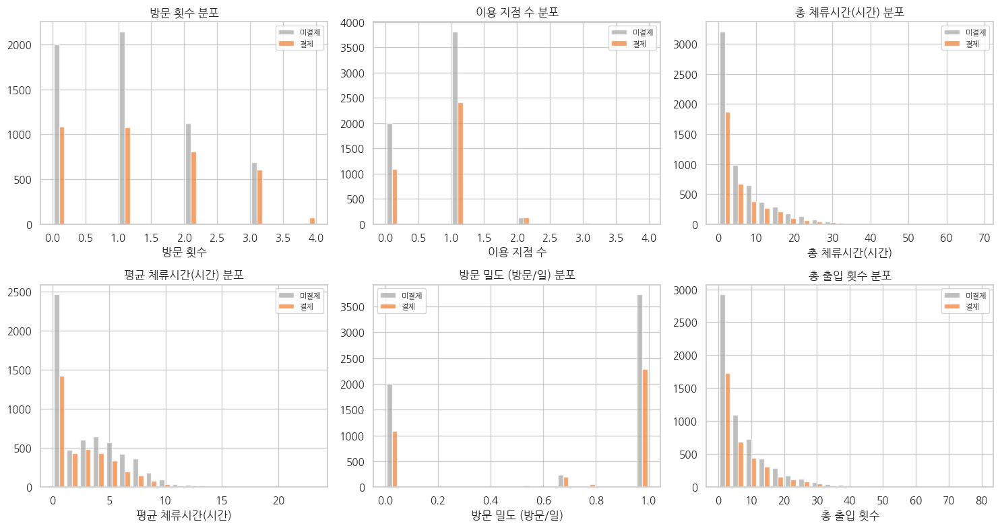

In [ ]:
# 결제 vs 미결제 행동 비교
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
metrics = [
    ('visit_count',  '방문 횟수',     1),
    ('sites_used',   '이용 지점 수',  1),
    ('total_stay_sec','총 체류시간(시간)', 3600),
    ('avg_stay_sec',  '평균 체류시간(시간)', 3600),
    ('visit_density', '방문 밀도 (방문/일)', 1),
    ('total_access',  '총 출입 횟수', 1),
]
for ax, (col, label, div) in zip(axes.flatten(), metrics):
    paid = master[master['is_payment']==1][col]/div
    free = master[master['is_payment']==0][col]/div
    ax.hist([free, paid], bins=20, label=['미결제','결제'], color=['#A5A5A5','#ED7D31'], alpha=0.7)
    ax.set_title(f'{label} 분포')
    ax.set_xlabel(label); ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

In [ ]:
# 그룹 평균 비교
group_compare = master.groupby('is_payment').agg(
    user_count=('user_uuid','count'),
    visit_count=('visit_count','mean'),
    sites_used=('sites_used','mean'),
    total_stay_hr=('total_stay_sec', lambda s: s.mean()/3600),
    avg_stay_hr =('avg_stay_sec',  lambda s: s.mean()/3600),
    total_access=('total_access','mean'),
).round(2).T
group_compare.columns = ['미결제','결제']
group_compare['차이(%)'] = ((group_compare['결제'] - group_compare['미결제'])/group_compare['미결제'].replace(0,np.nan)*100).round(1)
print(group_compare)

                   미결제       결제  차이(%)
user_count     5972.00  3652.00  -38.8
visit_count       1.09     1.31   20.2
sites_used        0.69     0.75    8.7
total_stay_hr     5.44     5.62    3.3
avg_stay_hr       3.07     2.85   -7.2
total_access      6.51     6.70    2.9


In [ ]:
import numpy as np
from IPython.display import display

# 그룹 평균 비교
group_compare = master.groupby('is_payment').agg(
    user_count=('user_uuid','count'),
    visit_count=('visit_count','mean'),
    sites_used=('sites_used','mean'),
    total_stay_hr=('total_stay_sec', lambda s: s.mean()/3600),
    avg_stay_hr =('avg_stay_sec',  lambda s: s.mean()/3600),
    total_access=('total_access','mean'),
).round(2).T

group_compare.columns = ['미결제','결제']
group_compare['차이(%)'] = ((group_compare['결제'] - group_compare['미결제']) / group_compare['미결제'].replace(0, np.nan) * 100).round(1)

# print 대신 display를 사용하여 데이터프레임 형태(HTML 표)로 출력
display(group_compare)

,미결제,결제,차이(%)
user_count,5972.00,3652.00,-38.8
visit_count,1.09,1.31,20.2
sites_used,0.69,0.75,8.7
total_stay_hr,5.44,5.62,3.3
avg_stay_hr,3.07,2.85,-7.2
total_access,6.51,6.70,2.9


## 11. 결론 요약


### 비즈니스 인사이트

- **방문 횟수가 전환의 가장 강한 신호**: 예:1회→2회→3회→4회+ 각각 33%→42%→46%→71% 전환율 점프
- **"방문 유도" = "결제 유도"**: 등록 후 미방문 3,090명에 푸시/메일 캠페인이 가장 큰 레버리지
- **시간대·요일 신상품 가능성**: 저녁/주말 세그먼트가 명확하게 존재
- **지점 1(50평)이 혼잡 — 좌석 확충 또는 인근 지점 우회 추천 필요**

### 추가 제안

- **지점 1 인근 신규 지점 개설 ROI 모의** (혼잡도 데이터 활용)
- **방문 3회 달성 시 할인 쿠폰** — 전환율 임계점 활용
- **"이용시간 예측치 기반" 동적 가격제** — 장체류 예상 유저에게 시간제 패스 제안
- **고객 만족도 측정 인프라 구축** — 퇴실 시 NPS 수집


# 다은님 코드 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

plt.rcParams["font.family"] = "Malgun Gothic"  # 윈도우
plt.rcParams["axes.unicode_minus"] = False

In [ ]:
DATA_PATH = "./"

trial_register = pd.read_csv(DATA_PATH + "trial_register.csv")
trial_visit_info = pd.read_csv(DATA_PATH + "trial_visit_info.csv")
trial_access_log = pd.read_csv(DATA_PATH + "trial_access_log.csv")
trial_payment = pd.read_csv(DATA_PATH + "trial_payment.csv")
site_area = pd.read_csv(DATA_PATH + "site_area.csv")

master = pd.read_csv(DATA_PATH + "master.csv")

In [ ]:
log = trial_access_log.copy()

log['cdate'] = pd.to_datetime(log['cdate'])

log = log.sort_values(['user_uuid','site_id','cdate'])

log['next_checkin'] = log.groupby(['user_uuid','site_id'])['checkin'].shift(-1)

log['next_time'] = log.groupby(['user_uuid','site_id'])['cdate'].shift(-1)

session = log[
    (log['checkin'] == 1) &
    (log['next_checkin'] == 2)
].copy()

session['stay_sec_access'] = (
    session['next_time'] - session['cdate']
).dt.total_seconds()

session['date'] = session['cdate'].dt.date

In [ ]:
access_stay = (
    session
    .groupby(['user_uuid','date'])['stay_sec_access']
    .sum()
    .reset_index()
)

In [ ]:
visit_stay = trial_visit_info.copy()

visit_stay['date'] = pd.to_datetime(visit_stay['date']).dt.date

visit_stay = visit_stay[
    ['user_uuid','date','stay_time_second']
].rename(columns={
    'stay_time_second':'stay_sec_visit'
})

In [ ]:
stay_compare = pd.merge(
    visit_stay,
    access_stay,
    on=['user_uuid','date'],
    how='inner'
)

In [ ]:
stay_compare['diff_sec'] = (
    stay_compare['stay_sec_visit']
    - stay_compare['stay_sec_access']
)

stay_compare['diff_min'] = (
    stay_compare['diff_sec'] / 60
).round(2)

stay_compare['diff_ratio'] = (
    stay_compare['diff_sec']
    / stay_compare['stay_sec_visit']
).round(3)

In [ ]:
display(
    stay_compare[
        ['stay_sec_visit',
         'stay_sec_access',
         'diff_min',
         'diff_ratio']
    ].describe()
)

,stay_sec_visit,stay_sec_access,diff_min,diff_ratio
count,8813.000000,8813.000000,8813.000000,8813.000000
mean,16990.316010,15830.183458,19.335671,-0.817448
std,11686.076347,10501.490467,140.812865,28.954328
min,1.000000,2.642547,-2504.280000,-2187.083000
25%,8319.000000,7947.318058,-0.010000,0.000000
50%,15153.000000,14409.907040,-0.010000,0.000000
75%,23688.000000,22102.902631,0.020000,0.000000
max,86325.000000,166133.507150,1334.100000,1.000000


In [ ]:
display(
    stay_compare[
        stay_compare['diff_min'].abs() > 30
    ]
    .sort_values('diff_min', ascending=False)
    .head(20)
)

,user_uuid,date,stay_sec_visit,stay_sec_access,diff_sec,diff_min,diff_ratio
2325,96d659fb-9f7d-4f7b-9cfd-9446ab9221c7,2021-06-28,80198,151.765522,80046.234478,1334.10,0.998
6404,832101e8-c746-427c-9541-06f00e5a9ec0,2023-02-06,81464,2709.016423,78754.983577,1312.58,0.967
6724,afa220ea-e871-4f52-9a2e-bc4d6da98bd4,2023-08-15,80707,2376.283433,78330.716567,1305.51,0.971
8299,2d3f3383-f77e-4be2-a198-620286406562,2023-04-22,86001,8376.554951,77624.445049,1293.74,0.903
7033,8864ae22-d31e-41a4-bcf1-20e2aa060f8f,2023-01-25,81574,6407.351831,75166.648169,1252.78,0.921
1100,bafded5b-d384-4dbd-9b0a-9c0bad865681,2021-12-04,83635,9247.173877,74387.826123,1239.80,0.889
8591,3304dead-5352-4f10-be40-036325a3b9f8,2023-11-18,86325,11978.347463,74346.652537,1239.11,0.861
4048,81218dce-be6b-44b5-b7d0-68accfeff5ca,2021-05-18,76545,4938.523135,71606.476865,1193.44,0.935
4893,bbf88af9-b003-4588-b6d3-539e298c7963,2021-08-29,79225,8900.006139,70324.993861,1172.08,0.888
5657,dcd613ec-4962-418b-aa7a-6d3de4e67af4,2021-06-20,72735,3051.991103,69683.008897,1161.38,0.958


In [ ]:
print(
    '상관계수:',
    round(
        stay_compare[
            ['stay_sec_visit',
             'stay_sec_access']
        ].corr().iloc[0,1],
        4
    )
)

상관계수: 0.7149


## 컬럼 정리

In [ ]:
data = master.copy()

In [ ]:
data = data.drop(['user_uuid','visited','days_active','avg_stay_sec','max_stay_sec','stay_hour_group','avg_enter_hour','weekend_ratio','checkin_count','checkout_count','main_site_stay_sec','main_site_visit_days'], axis=1)

In [ ]:
data.head(10)

,trial_date,trial_month,trial_dow,visit_count,sites_used,visit_density,first_visit,last_visit,first_visit_gap,total_stay_sec,avg_enter_hour_kst,total_access,first_access_time,last_access_time,main_site,main_site_pyeong,is_payment
0,2021-05-01,5,5,0,0,0.000000,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
1,2021-05-01,5,5,0,0,0.000000,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
2,2021-05-01,5,5,0,0,0.000000,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
3,2021-05-01,5,5,0,0,0.000000,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
4,2021-05-01,5,5,1,1,0.333333,2021-05-03,2021-05-03,2,8546,14.333333,2,20:36.9,42:57.6,1.0,50.0,1
5,2021-05-01,5,5,1,1,0.333333,2021-05-02,2021-05-02,1,9899,18.700000,6,42:13.9,30:36.6,3.0,150.0,0
6,2021-05-02,5,6,1,1,0.333333,2021-05-05,2021-05-05,3,10559,NaN,0,NaN,NaN,3.0,150.0,1
7,2021-05-03,5,0,1,1,0.333333,2021-05-04,2021-05-04,1,14296,13.333333,4,20:33.6,13:22.0,3.0,150.0,1
8,2021-05-03,5,0,0,0,0.000000,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,0
9,2021-05-03,5,0,0,0,0.000000,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,0


In [ ]:
data[(data['visit_count'] == 0) & (data['is_payment'] == 1)].shape

(1088, 17)

In [ ]:
# 1. visit_info 기준 방문 유저 생성
visit_user = (
    trial_visit_info
    .dropna(subset=['date'])
    .groupby('user_uuid')['date']
    .nunique()
    .reset_index()
    .rename(columns={'date':'visit_days'})
)

In [ ]:
# 2. payment 유저 생성
payment_user = (
    trial_payment[
        trial_payment['is_payment'] == 1
    ][['user_uuid']]
    .drop_duplicates()
)

In [ ]:
# 3. 결제 유저 + 방문정보 merge
payment_check = payment_user.merge(
    visit_user,
    on='user_uuid',
    how='left'
)

In [ ]:
# 4. 방문 없는 결제 유저 확인
no_visit_payment = payment_check[
    payment_check['visit_days'].isna()
].copy()

In [ ]:
# 5. 결과 확인
print('방문 없이 결제한 유저 수 :', no_visit_payment.shape[0])

display(no_visit_payment.head(20))

방문 없이 결제한 유저 수 : 1088


,user_uuid,visit_days
0,4a184795-b056-4572-a874-644f68609ea3,NaN
5,552cf9a3-0038-494c-bc9f-1526b5ba3a29,NaN
7,f0fcbdb5-9205-4e14-bc73-f0455a44f728,NaN
31,6704a5b0-01ba-4e55-8a6d-dae7cc1eadbf,NaN
61,645ca61a-dbca-4818-ba33-2b0d179ac535,NaN
62,9c6fb8e9-5b49-4b5f-a340-a1d115ce411f,NaN
72,76872861-3c70-42d5-b5ea-2254c3095703,NaN
88,6cbb8ad0-0056-4e3d-b371-2d4ee528c2b9,NaN
91,fc66eddb-ac08-42a9-b118-12de9cae31b1,NaN
93,cf6d59d0-e373-49ca-931e-8dc13f303003,NaN


In [ ]:
print(
    round(
        no_visit_payment.shape[0]
        / payment_user.shape[0] * 100,
        2
    ),
    '%'
)

29.79 %


In [ ]:
# 무료체험 신청 + 방문 없음 + 결제 유저 확인

no_visit_payment = data[(data['visit_count'] == 0) & (data['is_payment'] == 1)].copy()

print('무료체험 신청 후 방문 없이 결제한 유저 수:', len(no_visit_payment))
print('전체 유저 대비 비율:', round(len(no_visit_payment) / len(data) * 100, 2), '%')
print('결제 유저 대비 비율:', round(len(no_visit_payment) / data['is_payment'].sum() * 100, 2), '%')

display(no_visit_payment.head(20))

무료체험 신청 후 방문 없이 결제한 유저 수: 1088
전체 유저 대비 비율: 11.31 %
결제 유저 대비 비율: 29.79 %


,trial_date,trial_month,trial_dow,visit_count,sites_used,visit_density,first_visit,last_visit,first_visit_gap,total_stay_sec,avg_enter_hour_kst,total_access,first_access_time,last_access_time,main_site,main_site_pyeong,is_payment
0,2021-05-01,5,5,0,0,0.0,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
1,2021-05-01,5,5,0,0,0.0,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
2,2021-05-01,5,5,0,0,0.0,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
3,2021-05-01,5,5,0,0,0.0,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
10,2021-05-03,5,0,0,0,0.0,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
13,2021-05-03,5,0,0,0,0.0,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
14,2021-05-03,5,0,0,0,0.0,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
15,2021-05-03,5,0,0,0,0.0,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
19,2021-05-04,5,1,0,0,0.0,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1
24,2021-05-04,5,1,0,0,0.0,NaN,NaN,0,0,NaN,0,NaN,NaN,NaN,NaN,1


In [ ]:
data['is_payment'].value_counts(normalize=True)

is_payment
0    0.620532
1    0.379468
Name: proportion, dtype: float64

In [ ]:
data['main_site'].value_counts()

main_site
3.0     1330
6.0     1251
2.0     1096
1.0      866
5.0      598
4.0      497
17.0     436
47.0     325
49.0     135
Name: count, dtype: int64

In [ ]:
(data.isnull().mean()*100).sort_values(ascending=False)

avg_enter_hour_kst    37.551953
last_access_time      37.385702
first_access_time     37.385702
main_site_pyeong      32.107232
main_site             32.107232
first_visit           32.107232
last_visit            32.107232
trial_date             0.000000
total_access           0.000000
first_visit_gap        0.000000
total_stay_sec         0.000000
trial_month            0.000000
visit_density          0.000000
sites_used             0.000000
visit_count            0.000000
trial_dow              0.000000
is_payment             0.000000
dtype: float64

In [ ]:
import pandas as pd
import numpy as np

# 1. 데이터 불러오기
df = pd.read_csv("user_df.csv")

print("===== 1. 기본 정보 =====")
print("shape:", df.shape)
print("\ncolumns:")
print(df.columns.tolist())

print("\n===== 2. head =====")
display(df.head())

print("\n===== 3. info =====")
df.info()

print("\n===== 4. 타입 확인 =====")
display(pd.DataFrame({
    "dtype": df.dtypes,
    "n_unique": df.nunique(),
    "missing_count": df.isna().sum(),
    "missing_ratio": (df.isna().mean() * 100).round(2)
}))

print("\n===== 5. 타겟 분포 =====")
target = "is_payment"
print(df[target].value_counts(dropna=False))
print("\n비율:")
print((df[target].value_counts(normalize=True, dropna=False) * 100).round(2))

print("\n===== 6. 중복 확인 =====")
print("전체 중복 행:", df.duplicated().sum())
if "user_uuid" in df.columns:
    print("user_uuid 중복:", df["user_uuid"].duplicated().sum())
    display(df[df["user_uuid"].duplicated(keep=False)].sort_values("user_uuid").head(20))

print("\n===== 7. 날짜 컬럼 확인 =====")
date_cols = [c for c in df.columns if "date" in c.lower() or "visit" in c.lower()]
print(date_cols)
for c in date_cols:
    print(f"\n[{c}]")
    print("dtype:", df[c].dtype)
    print("missing:", df[c].isna().sum())
    print("sample:", df[c].dropna().head(5).tolist())

print("\n===== 8. 수치형 요약 =====")
num_cols = df.select_dtypes(include=np.number).columns.tolist()
display(df[num_cols].describe().T)

print("\n===== 9. 범주형 요약 =====")
cat_cols = df.select_dtypes(exclude=np.number).columns.tolist()
for c in cat_cols:
    print(f"\n[{c}] unique={df[c].nunique()}, missing={df[c].isna().sum()}")
    display(df[c].value_counts(dropna=False).head(20))

print("\n===== 10. 이상값 후보 확인 =====")
check_cols = [
    "day_count", "site_count", "visit_density", "first_visit_gap",
    "total_stay", "stay_time", "out_time",
    "avg_enter_hour", "avg_leave_hour", "total_access", "site_size"
]
check_cols = [c for c in check_cols if c in df.columns]

for c in check_cols:
    print(f"\n[{c}]")
    print("min:", df[c].min(), "max:", df[c].max())
    print("0 count:", (df[c] == 0).sum())
    print("negative count:", (df[c] < 0).sum() if pd.api.types.is_numeric_dtype(df[c]) else "not numeric")
    display(df[[c, target]].sort_values(c, ascending=False).head(10))

print("\n===== 11. 방문 없음 유저 확인 =====")
if "day_count" in df.columns:
    no_visit = df[df["day_count"] == 0]
    print("day_count=0:", len(no_visit))
    print("결제 분포:")
    print(no_visit[target].value_counts(dropna=False))
    display(no_visit.head())

print("\n===== 12. 타겟과 수치형 상관관계 =====")
if target in num_cols:
    corr_target = df[num_cols].corr(numeric_only=True)[target].sort_values(ascending=False)
    display(corr_target)

print("\n===== 13. 모델링 후보 컬럼 빠른 점검 =====")
drop_candidates = ["user_uuid", "reg_date", "first_visit", "last_visit"]
feature_candidates = [c for c in df.columns if c not in drop_candidates + [target]]

summary = pd.DataFrame({
    "column": feature_candidates,
    "dtype": [df[c].dtype for c in feature_candidates],
    "n_unique": [df[c].nunique() for c in feature_candidates],
    "missing": [df[c].isna().sum() for c in feature_candidates],
    "missing_ratio": [(df[c].isna().mean() * 100).round(2) for c in feature_candidates]
})
display(summary)

print("\n모델링 제거 후보:", drop_candidates)
print("모델링 사용 후보:", feature_candidates)

===== 1. 기본 정보 =====
shape: (9624, 21)

columns:
['user_uuid', 'reg_date', 'reg_month', 'reg_weekday', 'day_count', 'site_count', 'visit_density', 'first_visit_gap', 'first_visit', 'first_visit_weekday', 'first_visit_month', 'last_visit', 'total_stay', 'stay_time', 'out_time', 'avg_enter_hour', 'avg_leave_hour', 'total_access', 'main_site', 'site_size', 'is_payment']

===== 2. head =====


,user_uuid,reg_date,reg_month,reg_weekday,day_count,site_count,visit_density,first_visit_gap,first_visit,first_visit_weekday,...,last_visit,total_stay,stay_time,out_time,avg_enter_hour,avg_leave_hour,total_access,main_site,site_size,is_payment
0,000590dc-046f-462b-8225-4c81a97b7166,2023-09-04,9,1,1,1,3.0,1.0,2023-09-05,1.0,...,2023-09-05,362.0,356.0,6.0,11.000000,17.000000,3,6.0,150.0,0
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,2021-10-16,10,0,0,0,0.0,0.0,0,0.0,...,0,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,0
2,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,2021-09-29,9,1,2,1,4.5,1.0,2021-09-30,1.0,...,2021-10-01,392.0,322.0,70.0,17.500000,21.000000,9,3.0,150.0,1
3,0013f481-efed-4508-8836-70cbd64c477e,2023-04-03,4,1,0,0,0.0,0.0,0,0.0,...,0,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,1
4,0018e22d-a2cc-4e06-bca2-d6a041770f3b,2023-11-14,11,1,2,1,4.0,1.0,2023-11-15,1.0,...,2023-11-16,1297.0,1253.0,44.0,9.000000,19.500000,8,6.0,150.0,0



===== 3. info =====
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9624 entries, 0 to 9623
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   user_uuid            9624 non-null   object 
 1   reg_date             9624 non-null   object 
 2   reg_month            9624 non-null   int64  
 3   reg_weekday          9624 non-null   int64  
 4   day_count            9624 non-null   int64  
 5   site_count           9624 non-null   int64  
 6   visit_density        9624 non-null   float64
 7   first_visit_gap      9624 non-null   float64
 8   first_visit          9624 non-null   object 
 9   first_visit_weekday  9624 non-null   float64
 10  first_visit_month    9624 non-null   float64
 11  last_visit           9624 non-null   object 
 12  total_stay           9624 non-null   float64
 13  stay_time            9624 non-null   float64
 14  out_time             9624 non-null   float64
 15  avg_enter_hour   

,dtype,n_unique,missing_count,missing_ratio
user_uuid,object,9624,0,0.0
reg_date,object,855,0,0.0
reg_month,int64,12,0,0.0
reg_weekday,int64,2,0,0.0
day_count,int64,5,0,0.0
site_count,int64,5,0,0.0
visit_density,float64,56,0,0.0
first_visit_gap,float64,4,0,0.0
first_visit,object,934,0,0.0
first_visit_weekday,float64,2,0,0.0



===== 5. 타겟 분포 =====
is_payment
0    5972
1    3652
Name: count, dtype: int64

비율:
is_payment
0    62.05
1    37.95
Name: proportion, dtype: float64

===== 6. 중복 확인 =====
전체 중복 행: 0
user_uuid 중복: 0


,user_uuid,reg_date,reg_month,reg_weekday,day_count,site_count,visit_density,first_visit_gap,first_visit,first_visit_weekday,...,last_visit,total_stay,stay_time,out_time,avg_enter_hour,avg_leave_hour,total_access,main_site,site_size,is_payment



===== 7. 날짜 컬럼 확인 =====
['reg_date', 'visit_density', 'first_visit_gap', 'first_visit', 'first_visit_weekday', 'first_visit_month', 'last_visit']

[reg_date]
dtype: object
missing: 0
sample: ['2023-09-04', '2021-10-16', '2021-09-29', '2023-04-03', '2023-11-14']

[visit_density]
dtype: float64
missing: 0
sample: [3.0, 0.0, 4.5, 0.0, 4.0]

[first_visit_gap]
dtype: float64
missing: 0
sample: [1.0, 0.0, 1.0, 0.0, 1.0]

[first_visit]
dtype: object
missing: 0
sample: ['2023-09-05', '0', '2021-09-30', '0', '2023-11-15']

[first_visit_weekday]
dtype: float64
missing: 0
sample: [1.0, 0.0, 1.0, 0.0, 1.0]

[first_visit_month]
dtype: float64
missing: 0
sample: [9.0, 0.0, 9.0, 0.0, 11.0]

[last_visit]
dtype: object
missing: 0
sample: ['2023-09-05', '0', '2021-10-01', '0', '2023-11-16']

===== 8. 수치형 요약 =====


,count,mean,std,min,25%,50%,75%,max
reg_month,9624.0,7.113674,3.359410,1.0,5.000000,8.000000,10.0,12.0
reg_weekday,9624.0,0.846945,0.360059,0.0,1.000000,1.000000,1.0,1.0
day_count,9624.0,0.917602,0.863045,0.0,0.000000,1.000000,2.0,4.0
site_count,9624.0,0.646613,0.532936,0.0,0.000000,1.000000,1.0,4.0
visit_density,9624.0,2.042706,2.387916,0.0,0.000000,1.000000,3.0,18.0
first_visit_gap,9624.0,0.546446,0.674750,-1.0,0.000000,0.000000,1.0,2.0
first_visit_weekday,9624.0,0.495428,0.500005,0.0,0.000000,0.000000,1.0,1.0
first_visit_month,9624.0,4.487323,4.408720,0.0,0.000000,4.000000,9.0,12.0
total_stay,9624.0,285.333022,378.680075,0.0,0.000000,130.000000,446.0,2610.0
stay_time,9624.0,240.936097,310.514900,0.0,0.000000,120.000000,380.0,2149.0



===== 9. 범주형 요약 =====

[user_uuid] unique=9624, missing=0


user_uuid
000590dc-046f-462b-8225-4c81a97b7166    1
a96152dc-de1c-457f-8275-37bb44f44164    1
a976617a-6b91-4b56-8cda-2340304343db    1
a97abdd6-b36e-48ee-8c8c-6e6c6219ecb4    1
a9865442-e674-44e7-8938-491f50134ee0    1
a9937b6a-df98-496a-bc20-8e9129023ddf    1
a9950dab-7d17-4295-9fe4-c41557970c6f    1
a99bafa0-1664-4930-9906-e85a6e850002    1
a9b532dc-71f5-4231-af0f-4cad71aa26b2    1
a9c7d67a-01b7-419c-a7fa-795dda52878a    1
a9ccae39-27d3-499e-957f-a802a9d07a79    1
a9d33f14-9eff-487a-af5c-a346a21acee8    1
a9dadef8-dd26-47b4-9f85-443dd40e2023    1
a9df673c-0a00-4d1a-b41d-c2c2c419a923    1
a9e055ce-bb52-432c-9e91-6e61bb6da9d6    1
a9ea462a-0cae-429c-96bd-e889fd93d97e    1
a9f72de7-221d-4272-b29a-5cecd032f831    1
a966cbfd-ed59-4b23-9682-43584a249a07    1
a95db60c-7c2c-43d4-a61d-8f976babf5f3    1
a9fbeb08-8101-4e02-abfc-a29dbed302dc    1
Name: count, dtype: int64


[reg_date] unique=855, missing=0


reg_date
2022-12-08    144
2022-01-30     62
2022-08-07     54
2022-10-04     41
2022-12-12     39
2023-01-25     38
2022-01-26     35
2021-09-19     35
2023-09-11     33
2023-10-10     33
2023-09-04     32
2023-01-09     32
2023-06-05     32
2023-05-02     31
2022-12-26     30
2023-09-18     30
2021-08-22     30
2023-01-16     30
2021-11-15     29
2023-03-06     29
Name: count, dtype: int64


[first_visit] unique=934, missing=0


first_visit
0             3641
2022-12-09      50
2021-09-20      36
2022-01-31      33
2022-12-10      27
2021-09-03      25
2023-12-04      20
2023-06-06      20
2022-10-05      19
2022-08-09      19
2022-12-27      18
2021-09-07      18
2023-01-31      18
2023-02-22      17
2021-09-21      16
2023-12-08      16
2022-02-01      16
2021-11-25      16
2023-09-19      16
2023-10-11      16
Name: count, dtype: int64


[last_visit] unique=928, missing=0


last_visit
0             3641
2022-12-09      42
2022-12-10      37
2022-02-01      31
2021-09-20      25
2021-09-03      22
2021-09-21      21
2022-08-10      21
2022-10-06      20
2021-09-08      20
2023-12-10      19
2022-08-09      18
2022-12-28      18
2023-01-27      18
2022-11-02      17
2021-11-25      17
2021-12-29      17
2022-01-31      16
2021-11-26      16
2022-10-21      16
Name: count, dtype: int64


===== 10. 이상값 후보 확인 =====

[day_count]
min: 0 max: 4
0 count: 3641
negative count: 0


,day_count,is_payment
3024,4,0
8447,4,0
4385,3,0
9065,3,0
5697,3,0
1879,3,1
1088,3,0
4933,3,0
8341,3,0
1099,3,0



[site_count]
min: 0 max: 4
0 count: 3641
negative count: 0


,site_count,is_payment
5830,4,1
2246,4,0
5241,3,0
3707,3,1
223,3,0
139,3,0
7816,3,0
3294,3,0
9552,3,0
1197,3,0



[visit_density]
min: 0.0 max: 18.0
0 count: 3641
negative count: 0


,visit_density,is_payment
9350,18.0,1
3544,18.0,0
7588,16.5,1
3576,16.0,0
4509,16.0,0
2440,16.0,1
7749,15.0,0
5231,14.0,0
5654,14.0,0
8680,14.0,0



[first_visit_gap]
min: -1.0 max: 2.0
0 count: 5324
negative count: 13


,first_visit_gap,is_payment
7690,2.0,1
7548,2.0,0
1060,2.0,0
7478,2.0,0
7479,2.0,1
4592,2.0,0
7484,2.0,1
2477,2.0,1
1047,2.0,0
4581,2.0,1



[total_stay]
min: 0.0 max: 2610.0
0 count: 3651
negative count: 0


,total_stay,is_payment
9122,2610.0,1
6475,2522.0,1
1372,2400.0,0
8385,2378.0,0
542,2346.0,0
823,2336.0,1
3473,2291.0,0
7132,2274.0,0
4342,2272.0,1
7960,2248.0,0



[stay_time]
min: 0.0 max: 2149.0
0 count: 3652
negative count: 0


,stay_time,is_payment
2781,2149.0,0
542,2092.0,0
910,2088.0,0
3473,2080.0,0
8531,2072.0,0
6475,1975.0,1
2564,1879.0,1
9423,1817.0,0
823,1752.0,1
2764,1734.0,0



[out_time]
min: 0.0 max: 1805.0
0 count: 4959
negative count: 0


,out_time,is_payment
9122,1805.0,1
4859,1323.0,1
7776,1298.0,0
2498,1287.0,0
8385,1174.0,0
5117,1099.0,1
4223,1071.0,0
642,1029.0,1
8447,1028.0,0
6526,960.0,1



[avg_enter_hour]
min: 0.0 max: 23.0
0 count: 17
negative count: 0


,avg_enter_hour,is_payment
190,23.0,1
6788,23.0,0
5141,23.0,1
8024,23.0,0
5142,23.0,0
3140,23.0,0
6872,23.0,1
4057,23.0,0
3165,23.0,1
2931,23.0,0



[avg_leave_hour]
min: 0.0 max: 23.0
0 count: 70
negative count: 0


,avg_leave_hour,is_payment
2200,23.0,1
5736,23.0,0
8213,23.0,0
6364,23.0,0
1529,23.0,0
8201,23.0,0
7755,23.0,0
2962,23.0,1
2958,23.0,1
8194,23.0,1



[total_access]
min: 0 max: 40
0 count: 3641
negative count: 0


,total_access,is_payment
8356,40,0
2858,38,0
3468,35,1
2669,34,1
7588,33,1
4509,32,0
3576,32,0
5178,32,0
2440,32,1
1626,32,1



[site_size]
min: 0.0 max: 150.0
0 count: 3641
negative count: 0


,site_size,is_payment
0,150.0,0
4683,150.0,1
4705,150.0,0
4698,150.0,1
4697,150.0,0
4696,150.0,1
4694,150.0,0
4688,150.0,0
4681,150.0,0
4710,150.0,0



===== 11. 방문 없음 유저 확인 =====
day_count=0: 3641
결제 분포:
is_payment
0    2314
1    1327
Name: count, dtype: int64


,user_uuid,reg_date,reg_month,reg_weekday,day_count,site_count,visit_density,first_visit_gap,first_visit,first_visit_weekday,...,last_visit,total_stay,stay_time,out_time,avg_enter_hour,avg_leave_hour,total_access,main_site,site_size,is_payment
1,000a5d24-2da9-4c51-8a2b-ea3caba1553b,2021-10-16,10,0,0,0,0.0,0.0,0,0.0,...,0,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,0
3,0013f481-efed-4508-8836-70cbd64c477e,2023-04-03,4,1,0,0,0.0,0.0,0,0.0,...,0,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,1
7,0033f84b-2c5b-4a42-a115-80cbbf4fdf80,2022-12-08,12,1,0,0,0.0,0.0,0,0.0,...,0,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,0
10,00579570-e032-42ad-8773-b3fa73b97da6,2022-01-18,1,1,0,0,0.0,0.0,0,0.0,...,0,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,0
11,005e7693-1400-4bb5-a500-eab4518fa843,2022-08-03,8,1,0,0,0.0,0.0,0,0.0,...,0,0.0,0.0,0.0,12.605989,17.624925,0,0.0,0.0,0



===== 12. 타겟과 수치형 상관관계 =====


is_payment             1.000000
avg_enter_hour         0.076366
day_count              0.056799
first_visit_weekday    0.043982
first_visit_gap        0.030587
site_size              0.029074
site_count             0.027552
reg_weekday            0.014842
total_access           0.013158
first_visit_month      0.002929
out_time               0.002712
total_stay            -0.008352
stay_time             -0.011108
avg_leave_hour        -0.013148
visit_density         -0.013837
main_site             -0.013876
reg_month             -0.027291
Name: is_payment, dtype: float64


===== 13. 모델링 후보 컬럼 빠른 점검 =====


,column,dtype,n_unique,missing,missing_ratio
0,reg_month,int64,12,0,0.0
1,reg_weekday,int64,2,0,0.0
2,day_count,int64,5,0,0.0
3,site_count,int64,5,0,0.0
4,visit_density,float64,56,0,0.0
5,first_visit_gap,float64,4,0,0.0
6,first_visit_weekday,float64,2,0,0.0
7,first_visit_month,float64,13,0,0.0
8,total_stay,float64,1357,0,0.0
9,stay_time,float64,1187,0,0.0



모델링 제거 후보: ['user_uuid', 'reg_date', 'first_visit', 'last_visit']
모델링 사용 후보: ['reg_month', 'reg_weekday', 'day_count', 'site_count', 'visit_density', 'first_visit_gap', 'first_visit_weekday', 'first_visit_month', 'total_stay', 'stay_time', 'out_time', 'avg_enter_hour', 'avg_leave_hour', 'total_access', 'main_site', 'site_size']


## 모델링 전 전처리

In [ ]:
drop_cols = ["user_uuid", "reg_date", "first_visit", "last_visit"]
target = "is_payment"

In [ ]:
df["first_visit_gap"] = df["first_visit_gap"].clip(lower=0)
df["is_no_visit"] = (df["day_count"] == 0).astype(int)
df["main_site"] = df["main_site"].astype("category")
df["reg_month"] = df["reg_month"].astype("category")
df["first_visit_month"] = df["first_visit_month"].astype("category")

In [ ]:
# first_visit_gap 음수값 확인
display(df[df["first_visit_gap"] < 0][
    ["user_uuid", "reg_date", "first_visit", "first_visit_gap", "is_payment"]])

print("first_visit_gap 음수 건수:", (df["first_visit_gap"] < 0).sum())

,user_uuid,reg_date,first_visit,first_visit_gap,is_payment
390,09b5f5e8-35f8-46b1-a265-fcde32ee7a8a,2022-03-23,2022-03-22,-1.0,1
836,14ec9e95-96d7-4ea1-9ffa-ff95a2269001,2021-12-21,2021-12-20,-1.0,0
918,171e2bf6-67f8-4b62-9ae4-52e129278df2,2023-02-20,2023-02-19,-1.0,1
3024,4eec8463-d053-44a1-942d-f79e90d3a106,2022-08-29,2022-08-28,-1.0,0
3485,5af17ea3-e43a-4b86-a17b-e9d2c3407cc3,2023-12-11,2023-12-10,-1.0,1
3641,5f0673cf-987d-415d-928a-4dec101ece6a,2023-11-27,2023-11-26,-1.0,0
4120,6bd73a74-29af-4c06-8ab9-b486a5019dbb,2022-12-29,2022-12-28,-1.0,1
4727,7cbe00a9-a71c-4b5f-9ff4-b8cfc7c75f20,2023-11-23,2023-11-22,-1.0,1
7252,c0442006-c745-40c3-b61d-daf95f4b2587,2023-12-28,2023-12-27,-1.0,0
8053,d7b4634e-4c26-4ad2-8176-3a6833ca90ad,2021-12-01,2021-11-30,-1.0,1


first_visit_gap 음수 건수: 13


In [ ]:
# 음수값 0으로 보정
df["first_visit_gap"] = df["first_visit_gap"].clip(lower=0)

print("보정 후 음수 건수:", (df["first_visit_gap"] < 0).sum())

보정 후 음수 건수: 0


In [ ]:
# first_visit_month 값 분포 확인
print(df["first_visit_month"].value_counts().sort_index())

first_visit_month
0.0     3641
1.0      418
2.0      354
3.0      372
4.0      295
5.0      407
6.0      549
7.0      516
8.0      590
9.0      691
10.0     527
11.0     554
12.0     710
Name: count, dtype: int64


In [ ]:
df["reg_year"] = pd.to_datetime(df["reg_date"]).dt.year

year_summary = (
    df.groupby("reg_year")["is_payment"]
      .agg(["count", "mean"])
)

year_summary["mean"] *= 100

print(year_summary)

          count       mean
reg_year                  
2021       2806  42.373485
2022       3483  38.730979
2023       3335  33.403298


## Train/Test 분리

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# 원본 보존
df_model = df.copy()

# first_visit_gap 음수값 보정
df_model["first_visit_gap"] = df_model["first_visit_gap"].clip(lower=0)

# 제거할 컬럼
drop_cols = [
    "user_uuid",     # 식별자
    "reg_date",      # 신청일 원본 날짜
    "first_visit",   # 첫 방문일 원본 날짜
    "last_visit"     # 마지막 방문일 원본 날짜
]

# 컬럼 제거
df_model = df_model.drop(columns=drop_cols)

# X, y 분리
target = "is_payment"

X = df_model.drop(columns=[target])
y = df_model[target]

# Train/Test 분리
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y # Train/Test에서 결제/미결제 비율이 비슷하게 나뉘도록 함.
)

# 확인
print("df_model shape:", df_model.shape)
print("X_train:", X_train.shape)
print("X_test:", X_test.shape)
print("y_train:", y_train.shape)
print("y_test:", y_test.shape)

print("\nTrain 타겟 비율")
print(y_train.value_counts(normalize=True).round(3))

print("\nTest 타겟 비율")
print(y_test.value_counts(normalize=True).round(3))

df_model shape: (9624, 18)
X_train: (7699, 17)
X_test: (1925, 17)
y_train: (7699,)
y_test: (1925,)

Train 타겟 비율
is_payment
0    0.62
1    0.38
Name: proportion, dtype: float64

Test 타겟 비율
is_payment
0    0.621
1    0.379
Name: proportion, dtype: float64


In [ ]:
'''
Train 결제율 : 38.0%
Test 결제율 : 37.9%

stratify=y가 잘 적용돼서 타겟 비율도 거의 동일함.
'''

## 모델링용 컬럼 타입 점검

In [ ]:
print(X_train.dtypes)

print("\n고유값 개수")
for col in X_train.columns:
    print(f"{col}: {X_train[col].nunique()}")

reg_month                int64
reg_weekday              int64
day_count                int64
site_count               int64
visit_density          float64
first_visit_gap        float64
first_visit_weekday    float64
first_visit_month      float64
total_stay             float64
stay_time              float64
out_time               float64
avg_enter_hour         float64
avg_leave_hour         float64
total_access             int64
main_site              float64
site_size              float64
reg_year                 int32
dtype: object

고유값 개수
reg_month: 12
reg_weekday: 2
day_count: 5
site_count: 5
visit_density: 54
first_visit_gap: 3
first_visit_weekday: 2
first_visit_month: 13
total_stay: 1259
stay_time: 1123
out_time: 476
avg_enter_hour: 72
avg_leave_hour: 79
total_access: 36
main_site: 10
site_size: 4
reg_year: 3


In [ ]:
cat_cols = [
    "reg_month",
    "reg_weekday",
    "first_visit_weekday",
    "first_visit_month",
    "main_site"
]

num_cols = [c for c in X_train.columns if c not in cat_cols]

print("범주형 컬럼")
print(cat_cols)

print("\n수치형 컬럼")
print(num_cols)

범주형 컬럼
['reg_month', 'reg_weekday', 'first_visit_weekday', 'first_visit_month', 'main_site']

수치형 컬럼
['day_count', 'site_count', 'visit_density', 'first_visit_gap', 'total_stay', 'stay_time', 'out_time', 'avg_enter_hour', 'avg_leave_hour', 'total_access', 'site_size', 'reg_year']


In [ ]:
# reg_year 제거
df_model = df_model.drop(columns=["reg_year"], errors="ignore")

# 다시 X, y 생성
X = df_model.drop(columns=["is_payment"])
y = df_model["is_payment"]

# Train/Test 재분리
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print(X_train.shape)
print(X_test.shape)

(7699, 16)
(1925, 16)


## Logistic Regression 전처리 + 학습

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score
)

# 범주형
cat_cols = [
    "reg_month",
    "reg_weekday",
    "first_visit_weekday",
    "first_visit_month",
    "main_site"
]

# 수치형
num_cols = [c for c in X_train.columns if c not in cat_cols]

# 전처리
preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), num_cols),
        ("cat", OneHotEncoder(handle_unknown="ignore"), cat_cols)
    ]
)

# 파이프라인
lr_model = Pipeline([
    ("preprocessor", preprocessor),
    ("classifier", LogisticRegression(
        random_state=42,
        max_iter=5000
    ))
])

# 학습
lr_model.fit(X_train, y_train)

# 예측
y_pred = lr_model.predict(X_test)
y_prob = lr_model.predict_proba(X_test)[:, 1]

# 평가

acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print(f"Accuracy : {acc*100:.2f}%")
print(f"Precision: {prec*100:.2f}%")
print(f"Recall   : {rec*100:.2f}%")
print(f"F1 Score : {f1*100:.2f}%")
print(f"ROC-AUC  : {auc*100:.2f}%")

Accuracy : 61.97%
Precision: 49.47%
Recall   : 12.88%
F1 Score : 20.43%
ROC-AUC  : 57.16%


In [ ]:
# 라쏘회귀: 필요없는 가중치 0응로 바꿔서 결과 극대화
# 코히피션트: 변수중요도 파악해서 추가분석
# 모델은 로지스틱이랑 랜덤포레스트만 쓰자
# gbm 모델들은 변수가 적어서 성능효과가 없으니 제외하기로 함 언급 정도?

# 고객별로 각 스코어가 높은 지점 추천
# 고객 한 명에 대해 각 지점 9개의 전환율 구하기. 학습도 9 예측도 9번
# 학습할 때 타겟값이 다 달라야함? 

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score
)

# 모델 생성
rf_model = RandomForestClassifier(
    n_estimators=200,
    random_state=42,
    n_jobs=-1
)

# 학습
rf_model.fit(X_train, y_train)

# 예측
y_pred = rf_model.predict(X_test)
y_prob = rf_model.predict_proba(X_test)[:, 1]

# 평가
acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print("=== Random Forest ===")
print(f"Accuracy : {acc*100:.2f}%")
print(f"Precision: {prec*100:.2f}%")
print(f"Recall   : {rec*100:.2f}%")
print(f"F1 Score : {f1*100:.2f}%")
print(f"ROC-AUC  : {auc*100:.2f}%")

=== Random Forest ===
Accuracy : 61.82%
Precision: 49.15%
Recall   : 19.86%
F1 Score : 28.29%
ROC-AUC  : 58.48%


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

rf = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,
    class_weight="balanced"
)

param_grid = {
    "n_estimators": [200, 300, 500],
    "max_depth": [3, 5, 7, None],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 3, 5],
    "max_features": ["sqrt", "log2"]
}

grid_rf = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    scoring="roc_auc",
    cv=5,
    n_jobs=-1,
    verbose=1
)

grid_rf.fit(X_train, y_train)

print("Best Params:")
print(grid_rf.best_params_)

print("\nBest CV ROC-AUC:")
print(f"{grid_rf.best_score_ * 100:.2f}%")

best_rf = grid_rf.best_estimator_

y_pred = best_rf.predict(X_test)
y_prob = best_rf.predict_proba(X_test)[:, 1]

acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print("\n=== Tuned Random Forest ===")
print(f"Accuracy : {acc*100:.2f}%")
print(f"Precision: {prec*100:.2f}%")
print(f"Recall   : {rec*100:.2f}%")
print(f"F1 Score : {f1*100:.2f}%")
print(f"ROC-AUC  : {auc*100:.2f}%")

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Params:
{'max_depth': 7, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 300}

Best CV ROC-AUC:
58.34%

=== Tuned Random Forest ===
Accuracy : 59.95%
Precision: 46.02%
Recall   : 32.47%
F1 Score : 38.07%
ROC-AUC  : 57.40%


## XGBoost

In [ ]:
results = []

results.append({
    "Model": "Logistic Regression",
    "Accuracy": 61.97,
    "Precision": 49.47,
    "Recall": 12.88,
    "F1": 20.43,
    "ROC-AUC": 57.16
})

results.append({
    "Model": "Random Forest",
    "Accuracy": 61.82,
    "Precision": 49.15,
    "Recall": 19.86,
    "F1": 28.29,
    "ROC-AUC": 58.48
})

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score
)

xgb_model = XGBClassifier(
    n_estimators=300,
    max_depth=4,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    eval_metric="logloss"
)

xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)
y_prob = xgb_model.predict_proba(X_test)[:, 1]

acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print("=== XGBoost ===")
print(f"Accuracy : {acc*100:.2f}%")
print(f"Precision: {prec*100:.2f}%")
print(f"Recall   : {rec*100:.2f}%")
print(f"F1 Score : {f1*100:.2f}%")
print(f"ROC-AUC  : {auc*100:.2f}%")

=== XGBoost ===
Accuracy : 61.97%
Precision: 49.61%
Recall   : 17.53%
F1 Score : 25.91%
ROC-AUC  : 56.93%


## lightgbm

In [ ]:
from lightgbm import LGBMClassifier
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score
)

lgbm_model = LGBMClassifier(
    n_estimators=300,
    learning_rate=0.05,
    num_leaves=31,
    random_state=42
)

lgbm_model.fit(X_train, y_train)

y_pred = lgbm_model.predict(X_test)
y_prob = lgbm_model.predict_proba(X_test)[:, 1]

acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print("=== LightGBM ===")
print(f"Accuracy : {acc*100:.2f}%")
print(f"Precision: {prec*100:.2f}%")
print(f"Recall   : {rec*100:.2f}%")
print(f"F1 Score : {f1*100:.2f}%")
print(f"ROC-AUC  : {auc*100:.2f}%")

[LightGBM] [Info] Number of positive: 2922, number of negative: 4777
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001110 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 7699, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.379530 -> initscore=-0.491544
[LightGBM] [Info] Start training from score -0.491544
=== LightGBM ===
Accuracy : 61.45%
Precision: 48.09%
Recall   : 20.68%
F1 Score : 28.93%
ROC-AUC  : 57.88%


## 모델링 결과

In [ ]:
'''
튜닝 전 1차 ROC-AUC 실험 결과
- Random Forest 58.48%
- LightGBM 57.88%
- Logistic Regression 57.16%
- XGBoost 56.93%
'''

'\n튜닝 전 1차 실험 결과Random Forest 58.48%\n'

In [ ]:
'''
Random Forest 튜닝 결과 57.88%로 오히려 성능 떨어짐.

- 기본 모델 AUC = 58%
- 튜닝 후 AUC = 70%
-> 모델이 문제이거나 

- 기본 모델 AUC = 58%
- 튜닝 후 AUC = 57~59%
-> 변수 문제. 지금은 변수 문제로 추정
'''

In [ ]:
'''
다양한 분류 모델(Logistic Regression, Random Forest,
XGBoost, LightGBM)을 비교하였으나
ROC-AUC는 57~58% 수준에 머물렀다.

Random Forest가 가장 높은 ROC-AUC(58.48%)를 기록하였다.

추가적인 하이퍼파라미터 튜닝을 수행하였으나
성능 개선은 제한적이었다.

이는 현재 확보된 이용 로그 변수만으로는
유료 결제 여부를 충분히 설명하기 어렵다는 점을 시사한다.
'''

## Feature Importance 확인

                feature  importance
9             stay_time    0.144520
8            total_stay    0.141907
10             out_time    0.105999
11       avg_enter_hour    0.097065
12       avg_leave_hour    0.092988
0             reg_month    0.072179
7     first_visit_month    0.062246
14            main_site    0.060109
13         total_access    0.053323
4         visit_density    0.053281
5       first_visit_gap    0.030843
15            site_size    0.026109
2             day_count    0.018874
1           reg_weekday    0.017249
6   first_visit_weekday    0.016950
3            site_count    0.006359


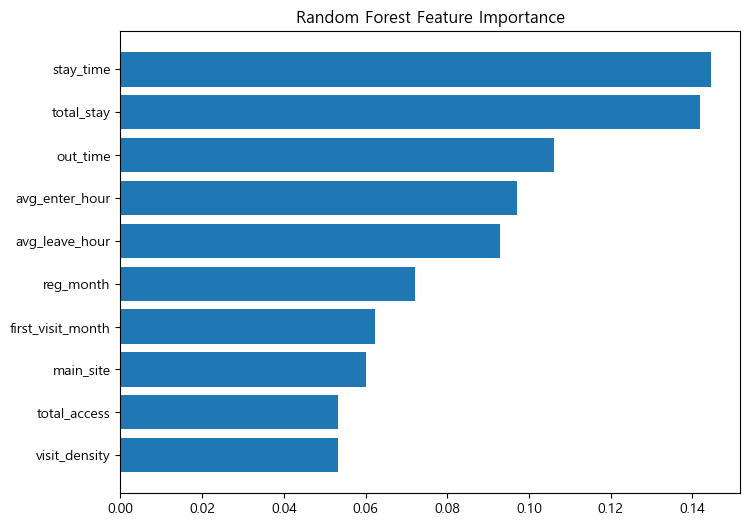

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

rf_model = RandomForestClassifier(
    n_estimators=200,
    random_state=42,
    n_jobs=-1
)

rf_model.fit(X_train, y_train)

importance_df = pd.DataFrame({
    "feature": X_train.columns,
    "importance": rf_model.feature_importances_
}).sort_values("importance", ascending=False)

print(importance_df)

plt.figure(figsize=(8,6))
plt.barh(
    importance_df["feature"][:10][::-1],
    importance_df["importance"][:10][::-1]
)
plt.title("Random Forest Feature Importance")
plt.show()

In [ ]:
'''
변수들이 예측 모델에 큰 영향을 끼치진 않고 있음 그래서 추가 파생 변수 만들어서 다시 돌릴거
'''

## 모델링 변수 추가

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

# 원본 보존
df_fe = df.copy()

# 1. first_visit_gap 음수값 보정
df_fe["first_visit_gap"] = df_fe["first_visit_gap"].clip(lower=0)

# 2. 파생변수 생성

# 1회 출입당 평균 세션 체류시간
df_fe["avg_stay_per_access"] = np.where(
    df_fe["total_access"] > 0,
    df_fe["stay_time"] / df_fe["total_access"],
    0
)

# 방문일당 평균 총 체류시간
df_fe["avg_stay_per_day"] = np.where(
    df_fe["day_count"] > 0,
    df_fe["total_stay"] / df_fe["day_count"],
    0
)

# 외출 비율
df_fe["absence_ratio"] = np.where(
    df_fe["total_stay"] > 0,
    df_fe["out_time"] / df_fe["total_stay"],
    0
)

# 지점당 평균 출입 횟수
df_fe["access_per_site"] = np.where(
    df_fe["site_count"] > 0,
    df_fe["total_access"] / df_fe["site_count"],
    0
)

# 평균 입실 시간대 그룹
def enter_time_group(hour):
    if hour < 10:
        return "morning"
    elif hour < 15:
        return "afternoon"
    elif hour < 19:
        return "evening"
    else:
        return "night"

df_fe["enter_group"] = df_fe["avg_enter_hour"].apply(enter_time_group)

# 3. 제거할 컬럼
drop_cols = [
    "user_uuid",
    "reg_date",
    "first_visit",
    "last_visit",
    "reg_year"   # 생성되어 있을 경우 제거
]

df_fe = df_fe.drop(columns=drop_cols, errors="ignore")

# 4. X, y 분리
target = "is_payment"

X = df_fe.drop(columns=[target])
y = df_fe[target]

# 5. Train/Test 분리
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

# 6. 확인
print("df_fe shape:", df_fe.shape)
print("X_train:", X_train.shape)
print("X_test:", X_test.shape)

print("\n추가된 파생변수:")
new_cols = [
    "avg_stay_per_access",
    "avg_stay_per_day",
    "absence_ratio",
    "access_per_site",
    "enter_group"
]
print(new_cols)

print("\nenter_group 분포:")
print(df_fe["enter_group"].value_counts())

print("\n타겟 비율 확인")
print("Train")
print(y_train.value_counts(normalize=True).round(3))
print("Test")
print(y_test.value_counts(normalize=True).round(3))

print("\n컬럼 목록:")
print(X_train.columns.tolist())

df_fe shape: (9624, 22)
X_train: (7699, 21)
X_test: (1925, 21)

추가된 파생변수:
['avg_stay_per_access', 'avg_stay_per_day', 'absence_ratio', 'access_per_site', 'enter_group']

enter_group 분포:
enter_group
afternoon    6784
evening      1529
morning       756
night         555
Name: count, dtype: int64

타겟 비율 확인
Train
is_payment
0    0.62
1    0.38
Name: proportion, dtype: float64
Test
is_payment
0    0.621
1    0.379
Name: proportion, dtype: float64

컬럼 목록:
['reg_month', 'reg_weekday', 'day_count', 'site_count', 'visit_density', 'first_visit_gap', 'first_visit_weekday', 'first_visit_month', 'total_stay', 'stay_time', 'out_time', 'avg_enter_hour', 'avg_leave_hour', 'total_access', 'main_site', 'site_size', 'avg_stay_per_access', 'avg_stay_per_day', 'absence_ratio', 'access_per_site', 'enter_group']


In [ ]:
print(X_train.dtypes)

reg_month                int64
reg_weekday              int64
day_count                int64
site_count               int64
visit_density          float64
first_visit_gap        float64
first_visit_weekday    float64
first_visit_month      float64
total_stay             float64
stay_time              float64
out_time               float64
avg_enter_hour         float64
avg_leave_hour         float64
total_access             int64
main_site              float64
site_size              float64
avg_stay_per_access    float64
avg_stay_per_day       float64
absence_ratio          float64
access_per_site        float64
enter_group             object
dtype: object


In [ ]:
X_train_rf = X_train.copy()
X_test_rf = X_test.copy()

mapping = {
    "morning": 0,
    "afternoon": 1,
    "evening": 2,
    "night": 3
}

X_train_rf["enter_group"] = X_train_rf["enter_group"].map(mapping)
X_test_rf["enter_group"] = X_test_rf["enter_group"].map(mapping)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score
)

rf_fe = RandomForestClassifier(
    n_estimators=200,
    random_state=42,
    n_jobs=-1
)

rf_fe.fit(X_train_rf, y_train)

y_pred = rf_fe.predict(X_test_rf)
y_prob = rf_fe.predict_proba(X_test_rf)[:, 1]

acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print("=== Random Forest + Feature Engineering ===")
print(f"Accuracy : {acc*100:.2f}%")
print(f"Precision: {prec*100:.2f}%")
print(f"Recall   : {rec*100:.2f}%")
print(f"F1 Score : {f1*100:.2f}%")
print(f"ROC-AUC  : {auc*100:.2f}%")

=== Random Forest + Feature Engineering ===
Accuracy : 61.82%
Precision: 49.22%
Recall   : 21.51%
F1 Score : 29.93%
ROC-AUC  : 58.81%


### 새로운 변수 추가

In [ ]:
import pandas as pd
import numpy as np

# 기존 모델링 데이터
user_df = pd.read_csv("user_df.csv")

# 전처리 완료 session 데이터
session = pd.read_csv("processed_session.csv")

# datetime 변환
session["enter_time"] = pd.to_datetime(session["enter_time"])
session["leave_time"] = pd.to_datetime(session["leave_time"])
session["visit_date"] = pd.to_datetime(session["visit_date"])

# 시간 변수 생성
session["enter_hour"] = session["enter_time"].dt.hour
session["leave_hour"] = session["leave_time"].dt.hour

# 유저별 추가 파생변수 생성
session_features = (
    session.groupby("user_uuid")
    .agg(
        enter_hour_std=("enter_hour", "std"),
        leave_hour_std=("leave_hour", "std"),
        enter_hour_range=("enter_hour", lambda x: x.max() - x.min()),
        leave_hour_range=("leave_hour", lambda x: x.max() - x.min()),
        visit_span_days=("visit_date", lambda x: (x.max() - x.min()).days),
        session_count=("user_uuid", "count")
    )
    .reset_index()
)

# 세션이 1개인 유저는 std가 NaN → 변동성 없음으로 보고 0 처리
session_features[["enter_hour_std", "leave_hour_std"]] = (
    session_features[["enter_hour_std", "leave_hour_std"]].fillna(0)
)

# user_df에 merge
user_df_new = user_df.merge(
    session_features,
    on="user_uuid",
    how="left"
)

# 미방문 유저는 session 정보가 없으므로 0 처리
new_cols = [
    "enter_hour_std",
    "leave_hour_std",
    "enter_hour_range",
    "leave_hour_range",
    "visit_span_days",
    "session_count"
]

user_df_new[new_cols] = user_df_new[new_cols].fillna(0)

# 확인
print("기존 user_df:", user_df.shape)
print("추가 후 user_df_new:", user_df_new.shape)

display(user_df_new[new_cols].describe())

기존 user_df: (9624, 21)
추가 후 user_df_new: (9624, 27)


,enter_hour_std,leave_hour_std,enter_hour_range,leave_hour_range,visit_span_days,session_count
count,9624.000000,9624.000000,9624.000000,9624.000000,9624.000000,9624.000000
mean,1.277265,1.433957,3.046446,3.371987,0.312968,3.133209
std,1.799767,2.173123,4.461833,5.139176,0.571532,4.256277
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,2.296949,2.380476,5.000000,6.000000,1.000000,5.000000
max,16.263456,16.263456,23.000000,23.000000,3.000000,40.000000


=== Random Forest + Session Pattern Features ===
Accuracy : 62.75%
Precision: 52.35%
Recall   : 19.86%
F1 Score : 28.80%
ROC-AUC  : 58.88%

=== Feature Importance ===


,feature,importance
9,stay_time,0.108465
8,total_stay,0.106653
11,avg_enter_hour,0.074390
10,out_time,0.073500
12,avg_leave_hour,0.071250
17,leave_hour_std,0.065285
16,enter_hour_std,0.064507
0,reg_month,0.061820
7,first_visit_month,0.053482
14,main_site,0.052208


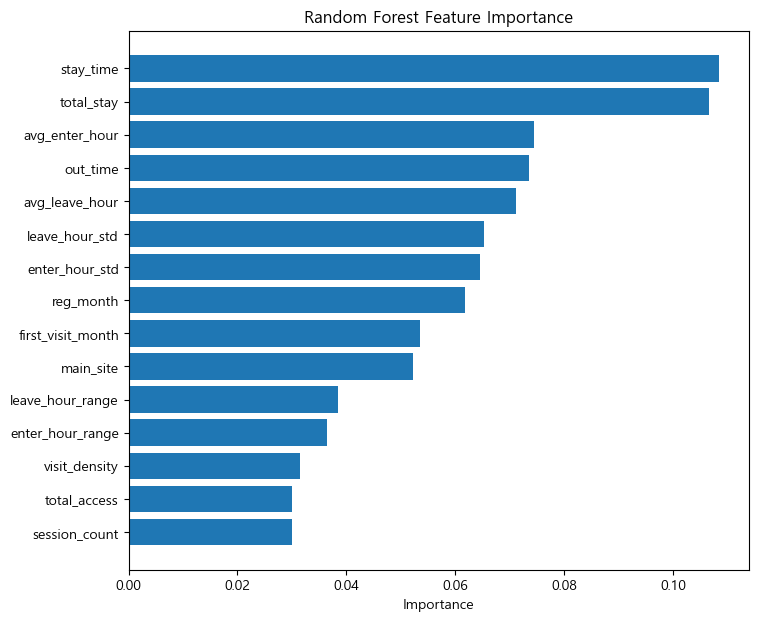

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt

# 1. 모델링 데이터 복사
df_model = user_df_new.copy()

# 2. first_visit_gap 음수값 보정
df_model["first_visit_gap"] = df_model["first_visit_gap"].clip(lower=0)

# 3. 제거할 컬럼
drop_cols = [
    "user_uuid",
    "reg_date",
    "first_visit",
    "last_visit",
    "reg_year"
]

df_model = df_model.drop(columns=drop_cols, errors="ignore")

# 4. X, y 분리
target = "is_payment"

X = df_model.drop(columns=[target])
y = df_model[target]

# 5. Train/Test 분리
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

# 6. Random Forest 학습
rf_new = RandomForestClassifier(
    n_estimators=200,
    random_state=42,
    n_jobs=-1
)

rf_new.fit(X_train, y_train)

# 7. 예측 및 평가
y_pred = rf_new.predict(X_test)
y_prob = rf_new.predict_proba(X_test)[:, 1]

acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print("=== Random Forest + Session Pattern Features ===")
print(f"Accuracy : {acc*100:.2f}%")
print(f"Precision: {prec*100:.2f}%")
print(f"Recall   : {rec*100:.2f}%")
print(f"F1 Score : {f1*100:.2f}%")
print(f"ROC-AUC  : {auc*100:.2f}%")

# 8. Feature Importance
importance_df = pd.DataFrame({
    "feature": X_train.columns,
    "importance": rf_new.feature_importances_
}).sort_values("importance", ascending=False)

print("\n=== Feature Importance ===")
display(importance_df)

# 9. 시각화
plt.figure(figsize=(8, 7))
plt.barh(
    importance_df["feature"].head(15)[::-1],
    importance_df["importance"].head(15)[::-1]
)
plt.title("Random Forest Feature Importance")
plt.xlabel("Importance")
plt.show()

## Feature Importance 상위 5~6개 변수의 구간별 결제율 분석 

In [ ]:
def payment_rate_by_group(df, col, q=5):

    temp = df.copy()

    temp[f"{col}_group"] = pd.qcut(
        temp[col],
        q=q,
        duplicates="drop"
    )

    result = (
        temp
        .groupby(f"{col}_group")
        .agg(
            users=("user_uuid", "count"),
            payment_rate=("is_payment", "mean")
        )
        .reset_index()
    )

    result["payment_rate"] = (
        result["payment_rate"] * 100
    ).round(2)

    print(f"\n===== {col} =====")
    display(result)

    return result

In [ ]:
stay_result = payment_rate_by_group(
    user_df_new,
    "stay_time"
)


===== stay_time =====


,stay_time_group,users,payment_rate
0,"(-0.001, 28.0]",3855,36.34
1,"(28.0, 212.0]",1920,41.56
2,"(212.0, 456.0]",1927,39.60
3,"(456.0, 2149.0]",1922,35.90


In [ ]:
total_stay_result = payment_rate_by_group(
    user_df_new,
    "total_stay"
)


===== total_stay =====


,total_stay_group,users,payment_rate
0,"(-0.001, 31.0]",3858,36.31
1,"(31.0, 235.8]",1916,42.22
2,"(235.8, 541.0]",1930,39.02
3,"(541.0, 2610.0]",1920,35.89


In [ ]:
enter_hour_result = payment_rate_by_group(
    user_df_new,
    "avg_enter_hour"
)


===== avg_enter_hour =====


,avg_enter_hour_group,users,payment_rate
0,"(-0.001, 12.0]",2209,35.17
1,"(12.0, 12.606]",3790,36.49
2,"(12.606, 15.0]",2016,36.61
3,"(15.0, 23.0]",1609,46.86


In [ ]:
enter_std_result = payment_rate_by_group(
    user_df_new,
    "enter_hour_std"
)


===== enter_hour_std =====


,enter_hour_std_group,users,payment_rate
0,"(-0.001, 1.304]",5777,38.36
1,"(1.304, 2.639]",1922,38.71
2,"(2.639, 16.263]",1925,35.95


In [ ]:
leave_std_result = payment_rate_by_group(
    user_df_new,
    "leave_hour_std"
)


===== leave_hour_std =====


,leave_hour_std_group,users,payment_rate
0,"(-0.001, 1.32]",5774,38.31
1,"(1.32, 2.754]",1926,37.75
2,"(2.754, 16.263]",1924,37.06


In [ ]:
site_result = (
    user_df_new
    .groupby("main_site")
    .agg(
        users=("user_uuid", "count"),
        payment_rate=("is_payment", "mean")
    )
    .reset_index()
)

site_result["payment_rate"] = (
    site_result["payment_rate"] * 100
).round(2)

site_result = site_result.sort_values(
    "payment_rate",
    ascending=False
)

display(site_result)

,main_site,users,payment_rate
5,5.0,553,45.75
3,3.0,1228,41.78
1,1.0,747,40.96
9,49.0,129,40.31
4,4.0,457,40.26
2,2.0,993,36.46
0,0.0,3641,36.45
6,6.0,1170,35.56
7,17.0,415,35.18
8,47.0,291,31.96


## site 기준 재모델링

## 1. user-site 단위 모델링 데이터 생성

In [ ]:
import pandas as pd
import numpy as np

df = pd.read_csv('df.csv')

df_visit = df[(df['visit_date'].notna()) & (df['site_id'] != 0)].copy()
df_visit['visit_date'] = pd.to_datetime(df_visit['visit_date'])
df_visit['reg_date'] = pd.to_datetime(df_visit['reg_date'])
df_visit['site_id'] = df_visit['site_id'].astype(int)

user_site_df = (
    df_visit
    .groupby(['user_uuid', 'site_id'])
    .agg(
        reg_date=('reg_date', 'first'),
        reg_month=('reg_month', 'first'),
        reg_weekday=('reg_weekday', 'first'),
        first_visit_date=('visit_date', 'min'),
        last_visit_date=('visit_date', 'max'),
        visit_days=('visit_date', 'nunique'),
        total_stay_min=('stay_time_minute', 'sum'),
        avg_stay_min=('stay_time_minute', 'mean'),
        total_access=('total_access', 'sum'),
        row_count=('site_id', 'size'),
        avg_enter_hour=('avg_enter_hour', 'mean'),
        avg_leave_hour=('avg_leave_hour', 'mean'),
        site_size=('site_size', 'first'),
        is_payment=('is_payment', 'max')
    )
    .reset_index()
)

user_site_df['first_visit_gap'] = (user_site_df['first_visit_date'] - user_site_df['reg_date']).dt.days
user_site_df['visit_period_days'] = (user_site_df['last_visit_date'] - user_site_df['first_visit_date']).dt.days + 1
user_site_df['visit_density'] = user_site_df['visit_days'] / user_site_df['visit_period_days']
user_site_df['total_stay_hour'] = user_site_df['total_stay_min'] / 60
user_site_df['avg_stay_hour'] = user_site_df['avg_stay_min'] / 60
user_site_df['access_per_visit_day'] = user_site_df['total_access'] / user_site_df['visit_days']

bins = [-0.01, 0, 1, 2, 3, np.inf]
labels = ['0min', '<1hour', '1-2hour', '2-3hour', '3hour+']
user_site_df['stay_hour_group'] = pd.cut(user_site_df['avg_stay_hour'], bins=bins, labels=labels)

user_site_df = user_site_df.replace([np.inf, -np.inf], np.nan)
num_fill_cols = ['first_visit_gap', 'visit_density', 'access_per_visit_day', 'total_stay_hour', 'avg_stay_hour']
user_site_df[num_fill_cols] = user_site_df[num_fill_cols].fillna(0)
user_site_df['stay_hour_group'] = user_site_df['stay_hour_group'].astype(str)

print("user_site_df shape:", user_site_df.shape)
print("유저 수:", user_site_df['user_uuid'].nunique())
print("지점 수:", user_site_df['site_id'].nunique())
print("결제 여부 분포")
display(user_site_df['is_payment'].value_counts())
display(user_site_df.head())

user_site_df shape: (6223, 23)
유저 수: 5983
지점 수: 9
결제 여부 분포


is_payment
0    3793
1    2430
Name: count, dtype: int64

,user_uuid,site_id,reg_date,reg_month,reg_weekday,first_visit_date,last_visit_date,visit_days,total_stay_min,avg_stay_min,...,avg_leave_hour,site_size,is_payment,first_visit_gap,visit_period_days,visit_density,total_stay_hour,avg_stay_hour,access_per_visit_day,stay_hour_group
0,000590dc-046f-462b-8225-4c81a97b7166,6,2023-09-04,9,1,2023-09-05,2023-09-05,1,356.0,118.666667,...,17.000000,150.0,0,1,1,1.0,5.933333,1.977778,9.0,1-2hour
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,2021-09-29,9,1,2021-09-30,2021-10-01,2,322.0,35.777778,...,20.444444,150.0,1,1,2,1.0,5.366667,0.596296,26.5,<1hour
2,0018e22d-a2cc-4e06-bca2-d6a041770f3b,6,2023-11-14,11,1,2023-11-15,2023-11-16,2,1253.0,156.625000,...,20.250000,150.0,0,1,2,1.0,20.883333,2.610417,20.0,2-3hour
3,002606d9-38ca-48f3-910c-cbfada9a9109,17,2023-01-06,1,1,2023-01-07,2023-01-08,2,415.0,103.750000,...,19.500000,50.0,0,1,2,1.0,6.916667,1.729167,4.0,1-2hour
4,002a7570-90dd-4cab-b0aa-b0e40f7ef27a,5,2021-09-07,9,1,2021-09-08,2021-09-08,1,311.0,62.200000,...,22.000000,150.0,1,1,1,1.0,5.183333,1.036667,25.0,1-2hour


## 2. 지점별 기본 특징표 생성

In [ ]:
site_basic_summary = (
    user_site_df
    .groupby('site_id')
    .agg(
        user_count=('user_uuid', 'nunique'),
        paid_user_count=('is_payment', 'sum'),
        payment_rate=('is_payment', 'mean'),
        avg_visit_days=('visit_days', 'mean'),
        avg_total_stay_hour=('total_stay_hour', 'mean'),
        avg_stay_hour=('avg_stay_hour', 'mean'),
        avg_total_access=('total_access', 'mean'),
        avg_access_per_visit_day=('access_per_visit_day', 'mean'),
        avg_enter_hour=('avg_enter_hour', 'mean'),
        avg_leave_hour=('avg_leave_hour', 'mean'),
        avg_first_visit_gap=('first_visit_gap', 'mean'),
        site_size=('site_size', 'first')
    )
    .reset_index()
)

site_basic_summary['payment_rate'] = site_basic_summary['payment_rate'] * 100

print("지점별 기본 특징 요약")
display(site_basic_summary.sort_values('payment_rate', ascending=False))

지점별 기본 특징 요약


,site_id,user_count,paid_user_count,payment_rate,avg_visit_days,avg_total_stay_hour,avg_stay_hour,avg_total_access,avg_access_per_visit_day,avg_enter_hour,avg_leave_hour,avg_first_visit_gap,site_size
4,5,562,257,45.729537,1.450178,6.230071,1.295343,28.658363,18.579181,13.367768,17.329991,0.916370,150.0
2,3,1259,529,42.017474,1.457506,6.408764,1.097153,41.455917,26.574133,13.547158,17.355912,0.866561,150.0
0,1,809,334,41.285538,1.333745,5.257437,1.308810,21.619283,15.198393,13.379813,17.541779,0.928307,50.0
8,49,136,56,41.176471,1.485294,5.954657,1.372478,20.933824,13.219363,13.424024,17.080813,0.808824,50.0
3,4,468,192,41.025641,1.465812,6.062358,1.431740,20.634615,13.074074,13.171713,16.955225,0.809829,100.0
1,2,1044,381,36.494253,1.465517,7.381577,2.945592,8.362069,5.162356,13.490547,17.665570,0.901341,100.0
5,6,1212,431,35.561056,1.424092,6.284048,1.286883,29.960396,19.560506,13.539421,17.188960,0.934818,150.0
6,17,439,155,35.307517,1.364465,5.043508,1.341525,18.116173,12.954822,13.579050,16.683702,1.013667,50.0
7,47,294,95,32.312925,1.401361,5.575510,1.415667,18.299320,11.714853,13.984293,17.091993,0.911565,50.0


## 3. 전체 LR/RF 모델링

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report

data = user_site_df.copy()

feature_cols = [
    'site_id', 'reg_month', 'reg_weekday',
    'visit_days', 'visit_density', 'first_visit_gap',
    'total_stay_hour', 'avg_stay_hour', 'stay_hour_group',
    'total_access', 'access_per_visit_day', 'row_count',
    'avg_enter_hour', 'avg_leave_hour',
    'site_size'
]

X = data[feature_cols].copy()
y = data['is_payment'].copy()

X['site_id'] = X['site_id'].astype(str)
X['stay_hour_group'] = X['stay_hour_group'].astype(str)

cat_cols = ['site_id', 'stay_hour_group']
num_cols = [col for col in X.columns if col not in cat_cols]

# 같은 유저가 여러 지점에 있을 수 있으니 user 기준 split
user_payment = data.groupby('user_uuid')['is_payment'].max().reset_index()
train_users, test_users = train_test_split(
    user_payment['user_uuid'],
    test_size=0.2,
    random_state=42,
    stratify=user_payment['is_payment']
)

train_idx = data['user_uuid'].isin(train_users)
test_idx = data['user_uuid'].isin(test_users)

X_train, X_test = X.loc[train_idx].copy(), X.loc[test_idx].copy()
y_train, y_test = y.loc[train_idx].copy(), y.loc[test_idx].copy()

preprocess_lr = ColumnTransformer([
    ('num', StandardScaler(), num_cols),
    ('cat', OneHotEncoder(handle_unknown='ignore'), cat_cols)
])

preprocess_rf = ColumnTransformer([
    ('num', 'passthrough', num_cols),
    ('cat', OneHotEncoder(handle_unknown='ignore'), cat_cols)
])

models = {
    'Logistic Regression': Pipeline([
        ('preprocess', preprocess_lr),
        ('model', LogisticRegression(max_iter=3000, class_weight='balanced', random_state=42))
    ]),
    'Random Forest': Pipeline([
        ('preprocess', preprocess_rf),
        ('model', RandomForestClassifier(
            n_estimators=300, max_depth=6, min_samples_leaf=5,
            class_weight='balanced', random_state=42, n_jobs=-1
        ))
    ])
}

results = []

for name, pipe in models.items():
    pipe.fit(X_train, y_train)
    pred = pipe.predict(X_test)
    proba = pipe.predict_proba(X_test)[:, 1]

    results.append({
        'model': name,
        'accuracy': accuracy_score(y_test, pred),
        'precision': precision_score(y_test, pred, zero_division=0),
        'recall': recall_score(y_test, pred, zero_division=0),
        'f1': f1_score(y_test, pred, zero_division=0),
        'roc_auc': roc_auc_score(y_test, proba)
    })

    print("\n" + "="*60)
    print(name)
    print("="*60)
    print("Confusion Matrix")
    print(confusion_matrix(y_test, pred))
    print("\nClassification Report")
    print(classification_report(y_test, pred, zero_division=0))

results_df = pd.DataFrame(results).sort_values('roc_auc', ascending=False)
display(results_df)


Logistic Regression
Confusion Matrix
[[444 312]
 [226 263]]

Classification Report
              precision    recall  f1-score   support

           0       0.66      0.59      0.62       756
           1       0.46      0.54      0.49       489

    accuracy                           0.57      1245
   macro avg       0.56      0.56      0.56      1245
weighted avg       0.58      0.57      0.57      1245


Random Forest
Confusion Matrix
[[515 241]
 [276 213]]

Classification Report
              precision    recall  f1-score   support

           0       0.65      0.68      0.67       756
           1       0.47      0.44      0.45       489

    accuracy                           0.58      1245
   macro avg       0.56      0.56      0.56      1245
weighted avg       0.58      0.58      0.58      1245



,model,accuracy,precision,recall,f1,roc_auc
1,Random Forest,0.584739,0.469163,0.435583,0.451750,0.600363
0,Logistic Regression,0.567871,0.457391,0.537832,0.494361,0.594298


## 4. 전체 모델 변수 중요도 확인

In [ ]:
def get_feature_names(pipe, cat_cols, num_cols):
    preprocessor = pipe.named_steps['preprocess']
    feature_names = list(num_cols)
    ohe = preprocessor.named_transformers_['cat']
    feature_names += ohe.get_feature_names_out(cat_cols).tolist()
    return feature_names

# LR coefficient
lr_pipe = models['Logistic Regression']
lr_features = get_feature_names(lr_pipe, cat_cols, num_cols)
lr_coefs = lr_pipe.named_steps['model'].coef_[0]

lr_coef_df = pd.DataFrame({
    'feature': lr_features,
    'coefficient': lr_coefs,
    'abs_coefficient': np.abs(lr_coefs)
}).sort_values('abs_coefficient', ascending=False)

print("LR 양의 coefficient 상위")
display(lr_coef_df.sort_values('coefficient', ascending=False).head(25))

print("LR 음의 coefficient 상위")
display(lr_coef_df.sort_values('coefficient', ascending=True).head(25))

# RF feature importance
rf_pipe = models['Random Forest']
rf_features = get_feature_names(rf_pipe, cat_cols, num_cols)
rf_importance = rf_pipe.named_steps['model'].feature_importances_

rf_importance_df = pd.DataFrame({
    'feature': rf_features,
    'importance': rf_importance
}).sort_values('importance', ascending=False)

print("RF Feature Importance 상위")
display(rf_importance_df.head(30))

LR 양의 coefficient 상위


,feature,coefficient,abs_coefficient
2,visit_days,0.442376,0.442376
26,stay_hour_group_<1hour,0.394175,0.394175
23,stay_hour_group_1-2hour,0.289980,0.289980
6,avg_stay_hour,0.233562,0.233562
20,site_id_5,0.190202,0.190202
4,first_visit_gap,0.166023,0.166023
13,site_id_1,0.160615,0.160615
10,avg_enter_hour,0.146011,0.146011
19,site_id_49,0.113317,0.113317
17,site_id_4,0.088236,0.088236


LR 음의 coefficient 상위


,feature,coefficient,abs_coefficient
22,stay_hour_group_0min,-0.598884,0.598884
5,total_stay_hour,-0.363095,0.363095
25,stay_hour_group_3hour+,-0.322829,0.322829
18,site_id_47,-0.278330,0.278330
21,site_id_6,-0.275198,0.275198
14,site_id_17,-0.103796,0.103796
11,avg_leave_hour,-0.073215,0.073215
15,site_id_2,-0.069863,0.069863
0,reg_month,-0.056991,0.056991
3,visit_density,-0.047710,0.047710


RF Feature Importance 상위


,feature,importance
10,avg_enter_hour,0.162184
5,total_stay_hour,0.130715
6,avg_stay_hour,0.119627
11,avg_leave_hour,0.087289
0,reg_month,0.079118
2,visit_days,0.078411
8,access_per_visit_day,0.068343
7,total_access,0.056318
9,row_count,0.044347
4,first_visit_gap,0.028443


## 5. 지점별 “결제자 vs 미결제자” 특징 차이

In [ ]:
compare_features = [
    'visit_days', 'visit_density', 'first_visit_gap',
    'total_stay_hour', 'avg_stay_hour',
    'total_access', 'access_per_visit_day', 'row_count',
    'avg_enter_hour', 'avg_leave_hour'
]

site_paid_unpaid_summary = (
    user_site_df
    .groupby(['site_id', 'is_payment'])[compare_features]
    .mean()
    .reset_index()
)

site_diff_list = []

for site in sorted(user_site_df['site_id'].unique()):
    temp = site_paid_unpaid_summary[site_paid_unpaid_summary['site_id'] == site]
    if temp['is_payment'].nunique() < 2:
        continue

    paid = temp[temp['is_payment'] == 1][compare_features].iloc[0]
    unpaid = temp[temp['is_payment'] == 0][compare_features].iloc[0]
    diff = paid - unpaid

    diff_df = pd.DataFrame({
        'site_id': site,
        'feature': compare_features,
        'paid_mean': paid.values,
        'unpaid_mean': unpaid.values,
        'diff_paid_minus_unpaid': diff.values
    })

    site_diff_list.append(diff_df)

site_diff_df = pd.concat(site_diff_list, ignore_index=True)

for site in sorted(site_diff_df['site_id'].unique()):
    print("\n" + "="*60)
    print(f"site_id {site} 결제자-미결제자 차이")
    print("="*60)
    display(
        site_diff_df[site_diff_df['site_id'] == site]
        .sort_values('diff_paid_minus_unpaid', ascending=False)
    )


site_id 1 결제자-미결제자 차이


,site_id,feature,paid_mean,unpaid_mean,diff_paid_minus_unpaid
8,1,avg_enter_hour,13.850811,13.048627,0.802184
0,1,visit_days,1.395210,1.290526,0.104683
4,1,avg_stay_hour,1.317363,1.302796,0.014567
2,1,first_visit_gap,0.925150,0.930526,-0.005377
1,1,visit_density,0.988024,0.994386,-0.006362
9,1,avg_leave_hour,17.472465,17.590518,-0.118053
7,1,row_count,4.203593,4.471579,-0.267986
3,1,total_stay_hour,5.058134,5.397579,-0.339445
6,1,access_per_visit_day,13.515968,16.381404,-2.865435
5,1,total_access,19.502994,23.107368,-3.604374



site_id 2 결제자-미결제자 차이


,site_id,feature,paid_mean,unpaid_mean,diff_paid_minus_unpaid
15,2,total_access,9.614173,7.642534,1.971639
18,2,avg_enter_hour,14.075792,13.154230,0.921561
16,2,access_per_visit_day,5.394576,5.028909,0.365667
17,2,row_count,2.979003,2.734540,0.244463
10,2,visit_days,1.532808,1.426848,0.105961
12,2,first_visit_gap,0.952756,0.871795,0.080961
11,2,visit_density,0.991251,0.990447,0.000804
19,2,avg_leave_hour,17.636558,17.682241,-0.045683
14,2,avg_stay_hour,2.756073,3.054500,-0.298427
13,2,total_stay_hour,7.023403,7.587406,-0.564002



site_id 3 결제자-미결제자 차이


,site_id,feature,paid_mean,unpaid_mean,diff_paid_minus_unpaid
28,3,avg_enter_hour,13.920647,13.276507,0.644141
27,3,row_count,6.625709,6.460274,0.165435
20,3,visit_days,1.523629,1.409589,0.114040
22,3,first_visit_gap,0.865784,0.867123,-0.001339
21,3,visit_density,0.980466,0.991324,-0.010858
29,3,avg_leave_hour,17.345586,17.363395,-0.017809
24,3,avg_stay_hour,1.085983,1.105248,-0.019265
23,3,total_stay_hour,6.369061,6.437534,-0.068473
25,3,total_access,41.204159,41.638356,-0.434197
26,3,access_per_visit_day,24.715501,27.921005,-3.205504



site_id 4 결제자-미결제자 차이


,site_id,feature,paid_mean,unpaid_mean,diff_paid_minus_unpaid
38,4,avg_enter_hour,13.359279,13.041233,0.318046
30,4,visit_days,1.536458,1.416667,0.119792
34,4,avg_stay_hour,1.460403,1.411801,0.048602
32,4,first_visit_gap,0.833333,0.793478,0.039855
31,4,visit_density,0.983507,0.993961,-0.010454
37,4,row_count,4.609375,4.688406,-0.079031
33,4,total_stay_hour,5.951563,6.139432,-0.187870
39,4,avg_leave_hour,16.573628,17.220684,-0.647056
35,4,total_access,19.598958,21.355072,-1.756114
36,4,access_per_visit_day,11.815972,13.949275,-2.133303



site_id 5 결제자-미결제자 차이


,site_id,feature,paid_mean,unpaid_mean,diff_paid_minus_unpaid
48,5,avg_enter_hour,13.620141,13.155113,0.465028
42,5,first_visit_gap,0.968872,0.872131,0.096740
40,5,visit_days,1.470817,1.432787,0.038030
44,5,avg_stay_hour,1.302332,1.289454,0.012878
41,5,visit_density,0.990921,0.992350,-0.001429
49,5,avg_leave_hour,16.999540,17.608437,-0.608897
47,5,row_count,5.066148,5.698361,-0.632213
43,5,total_stay_hour,5.847082,6.552787,-0.705705
46,5,access_per_visit_day,16.631647,20.220219,-3.588571
45,5,total_access,25.050584,31.698361,-6.647777



site_id 6 결제자-미결제자 차이


,site_id,feature,paid_mean,unpaid_mean,diff_paid_minus_unpaid
58,6,avg_enter_hour,14.075991,13.243311,0.832680
52,6,first_visit_gap,0.979118,0.910371,0.068747
50,6,visit_days,1.459397,1.404609,0.054787
51,6,visit_density,0.997680,0.995732,0.001948
59,6,avg_leave_hour,17.179657,17.194094,-0.014437
54,6,avg_stay_hour,1.268199,1.297194,-0.028994
57,6,row_count,5.041763,5.614597,-0.572833
53,6,total_stay_hour,5.596674,6.663380,-1.066706
56,6,access_per_visit_day,16.611756,21.187793,-4.576038
55,6,total_access,25.779582,32.267606,-6.488023



site_id 17 결제자-미결제자 차이


,site_id,feature,paid_mean,unpaid_mean,diff_paid_minus_unpaid
68,17,avg_enter_hour,13.972355,13.364395,0.607961
65,17,total_access,18.451613,17.933099,0.518514
60,17,visit_days,1.425806,1.330986,0.094821
62,17,first_visit_gap,1.038710,1.000000,0.038710
61,17,visit_density,0.995699,0.996479,-0.000780
67,17,row_count,4.025806,4.066901,-0.041095
64,17,avg_stay_hour,1.288638,1.370389,-0.081750
69,17,avg_leave_hour,16.578143,16.741313,-0.163170
63,17,total_stay_hour,4.800753,5.175998,-0.375245
66,17,access_per_visit_day,11.583871,13.703052,-2.119181



site_id 47 결제자-미결제자 차이


,site_id,feature,paid_mean,unpaid_mean,diff_paid_minus_unpaid
78,47,avg_enter_hour,14.236610,13.863840,0.372770
74,47,avg_stay_hour,1.591530,1.331712,0.259818
79,47,avg_leave_hour,17.190887,17.044782,0.146105
72,47,first_visit_gap,0.978947,0.879397,0.099550
76,47,access_per_visit_day,11.747368,11.699330,0.048038
70,47,visit_days,1.431579,1.386935,0.044644
71,47,visit_density,0.996491,0.986600,0.009892
73,47,total_stay_hour,5.504211,5.609548,-0.105337
77,47,row_count,4.210526,4.391960,-0.181433
75,47,total_access,17.915789,18.482412,-0.566623



site_id 49 결제자-미결제자 차이


,site_id,feature,paid_mean,unpaid_mean,diff_paid_minus_unpaid
85,49,total_access,22.785714,19.637500,3.148214
88,49,avg_enter_hour,14.126470,12.932312,1.194159
87,49,row_count,4.928571,4.387500,0.541071
89,49,avg_leave_hour,17.252412,16.960693,0.291718
80,49,visit_days,1.589286,1.412500,0.176786
83,49,total_stay_hour,6.024702,5.905625,0.119077
81,49,visit_density,0.994048,0.991667,0.002381
82,49,first_visit_gap,0.785714,0.825000,-0.039286
84,49,avg_stay_hour,1.316458,1.411692,-0.095235
86,49,access_per_visit_day,12.258929,13.891667,-1.632738


## 6. 지점별 개별 LR/RF 모델

In [ ]:
site_model_features = [
    'reg_month', 'reg_weekday',
    'visit_days', 'visit_density', 'first_visit_gap',
    'total_stay_hour', 'avg_stay_hour',
    'total_access', 'access_per_visit_day', 'row_count',
    'avg_enter_hour', 'avg_leave_hour',
    'site_size'
]

site_model_results = []
site_lr_coef_list = []
site_rf_importance_list = []

for site in sorted(user_site_df['site_id'].unique()):
    site_data = user_site_df[user_site_df['site_id'] == site].copy()
    
    n_users = site_data['user_uuid'].nunique()
    n_paid = site_data['is_payment'].sum()
    n_unpaid = len(site_data) - n_paid
    
    if len(site_data) < 80 or site_data['is_payment'].nunique() < 2 or n_paid < 20 or n_unpaid < 20:
        print(f"site {site}: 표본 부족으로 제외 / n={len(site_data)}, paid={n_paid}, unpaid={n_unpaid}")
        continue
    
    X_site = site_data[site_model_features].replace([np.inf, -np.inf], np.nan).fillna(0)
    y_site = site_data['is_payment']
    
    X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(
        X_site, y_site,
        test_size=0.2,
        random_state=42,
        stratify=y_site
    )
    
    lr_site = Pipeline([
        ('scaler', StandardScaler()),
        ('model', LogisticRegression(max_iter=3000, class_weight='balanced', random_state=42))
    ])
    
    rf_site = RandomForestClassifier(
        n_estimators=300, max_depth=5, min_samples_leaf=5,
        class_weight='balanced', random_state=42, n_jobs=-1
    )
    
    for model_name, model in [('LR', lr_site), ('RF', rf_site)]:
        model.fit(X_train_s, y_train_s)
        pred_s = model.predict(X_test_s)
        proba_s = model.predict_proba(X_test_s)[:, 1]
        
        site_model_results.append({
            'site_id': site,
            'model': model_name,
            'n_rows': len(site_data),
            'paid_count': int(n_paid),
            'unpaid_count': int(n_unpaid),
            'payment_rate': y_site.mean(),
            'accuracy': accuracy_score(y_test_s, pred_s),
            'precision': precision_score(y_test_s, pred_s, zero_division=0),
            'recall': recall_score(y_test_s, pred_s, zero_division=0),
            'f1': f1_score(y_test_s, pred_s, zero_division=0),
            'roc_auc': roc_auc_score(y_test_s, proba_s)
        })
    
    lr_coefs = lr_site.named_steps['model'].coef_[0]
    site_lr_coef_list.append(pd.DataFrame({
        'site_id': site,
        'feature': site_model_features,
        'coefficient': lr_coefs,
        'abs_coefficient': np.abs(lr_coefs)
    }))
    
    site_rf_importance_list.append(pd.DataFrame({
        'site_id': site,
        'feature': site_model_features,
        'importance': rf_site.feature_importances_
    }))

site_model_results_df = pd.DataFrame(site_model_results)
site_lr_coef_df = pd.concat(site_lr_coef_list, ignore_index=True)
site_rf_importance_df = pd.concat(site_rf_importance_list, ignore_index=True)

print("지점별 모델 성능")
display(site_model_results_df.sort_values(['site_id', 'model']))

print("지점별 LR positive coefficient 상위")
display(
    site_lr_coef_df
    .sort_values(['site_id', 'coefficient'], ascending=[True, False])
    .groupby('site_id')
    .head(5)
)

print("지점별 RF importance 상위")
display(
    site_rf_importance_df
    .sort_values(['site_id', 'importance'], ascending=[True, False])
    .groupby('site_id')
    .head(5)
)

지점별 모델 성능


,site_id,model,n_rows,paid_count,unpaid_count,payment_rate,accuracy,precision,recall,f1,roc_auc
0,1,LR,809,334,475,0.412855,0.580247,0.493151,0.537313,0.514286,0.635035
1,1,RF,809,334,475,0.412855,0.567901,0.482759,0.626866,0.545455,0.611312
2,2,LR,1044,381,663,0.364943,0.645933,0.511628,0.578947,0.543210,0.673724
3,2,RF,1044,381,663,0.364943,0.631579,0.492063,0.407895,0.446043,0.619410
4,3,LR,1259,529,730,0.420175,0.547619,0.465517,0.509434,0.486486,0.585681
5,3,RF,1259,529,730,0.420175,0.527778,0.442478,0.471698,0.456621,0.531274
6,4,LR,468,192,276,0.410256,0.510638,0.414634,0.435897,0.425000,0.579021
7,4,RF,468,192,276,0.410256,0.574468,0.487179,0.487179,0.487179,0.551049
8,5,LR,562,257,305,0.457295,0.584071,0.543860,0.596154,0.568807,0.597730
9,5,RF,562,257,305,0.457295,0.575221,0.530303,0.673077,0.593220,0.558323


지점별 LR positive coefficient 상위


,site_id,feature,coefficient,abs_coefficient
2,1,visit_days,0.413517,0.413517
10,1,avg_enter_hour,0.278596,0.278596
6,1,avg_stay_hour,0.186579,0.186579
8,1,access_per_visit_day,0.180056,0.180056
1,1,reg_weekday,0.092991,0.092991
15,2,visit_days,0.467934,0.467934
17,2,first_visit_gap,0.222329,0.222329
23,2,avg_enter_hour,0.216515,0.216515
22,2,row_count,0.211522,0.211522
19,2,avg_stay_hour,0.089218,0.089218


지점별 RF importance 상위


,site_id,feature,importance
5,1,total_stay_hour,0.183446
6,1,avg_stay_hour,0.161124
10,1,avg_enter_hour,0.148053
11,1,avg_leave_hour,0.112039
8,1,access_per_visit_day,0.091015
23,2,avg_enter_hour,0.179836
19,2,avg_stay_hour,0.175523
18,2,total_stay_hour,0.141463
24,2,avg_leave_hour,0.116988
13,2,reg_month,0.113941


## 7. 발표용 지점별 요약 테이블

In [ ]:
top_lr_features = (
    site_lr_coef_df
    .sort_values(['site_id', 'coefficient'], ascending=[True, False])
    .groupby('site_id')
    .head(3)
    .groupby('site_id')['feature']
    .apply(lambda x: ', '.join(x))
    .reset_index(name='lr_positive_top3')
)

top_rf_features = (
    site_rf_importance_df
    .sort_values(['site_id', 'importance'], ascending=[True, False])
    .groupby('site_id')
    .head(3)
    .groupby('site_id')['feature']
    .apply(lambda x: ', '.join(x))
    .reset_index(name='rf_importance_top3')
)

site_final_summary = (
    site_basic_summary
    .merge(top_lr_features, on='site_id', how='left')
    .merge(top_rf_features, on='site_id', how='left')
    .sort_values('payment_rate', ascending=False)
)

display(site_final_summary)

,site_id,user_count,paid_user_count,payment_rate,avg_visit_days,avg_total_stay_hour,avg_stay_hour,avg_total_access,avg_access_per_visit_day,avg_enter_hour,avg_leave_hour,avg_first_visit_gap,site_size,lr_positive_top3,rf_importance_top3
4,5,562,257,45.729537,1.450178,6.230071,1.295343,28.658363,18.579181,13.367768,17.329991,0.916370,150.0,"access_per_visit_day, avg_enter_hour, visit_days","total_stay_hour, avg_stay_hour, avg_leave_hour"
2,3,1259,529,42.017474,1.457506,6.408764,1.097153,41.455917,26.574133,13.547158,17.355912,0.866561,150.0,"visit_days, avg_enter_hour, row_count","avg_stay_hour, total_stay_hour, avg_enter_hour"
0,1,809,334,41.285538,1.333745,5.257437,1.308810,21.619283,15.198393,13.379813,17.541779,0.928307,50.0,"visit_days, avg_enter_hour, avg_stay_hour","total_stay_hour, avg_stay_hour, avg_enter_hour"
8,49,136,56,41.176471,1.485294,5.954657,1.372478,20.933824,13.219363,13.424024,17.080813,0.808824,50.0,"total_access, avg_enter_hour, visit_days","total_stay_hour, reg_month, avg_enter_hour"
3,4,468,192,41.025641,1.465812,6.062358,1.431740,20.634615,13.074074,13.171713,16.955225,0.809829,100.0,"visit_days, first_visit_gap, reg_weekday","total_stay_hour, avg_stay_hour, avg_leave_hour"
1,2,1044,381,36.494253,1.465517,7.381577,2.945592,8.362069,5.162356,13.490547,17.665570,0.901341,100.0,"visit_days, first_visit_gap, avg_enter_hour","avg_enter_hour, avg_stay_hour, total_stay_hour"
5,6,1212,431,35.561056,1.424092,6.284048,1.286883,29.960396,19.560506,13.539421,17.188960,0.934818,150.0,"row_count, visit_days, avg_stay_hour","avg_stay_hour, total_stay_hour, avg_enter_hour"
6,17,439,155,35.307517,1.364465,5.043508,1.341525,18.116173,12.954822,13.579050,16.683702,1.013667,50.0,"total_access, visit_days, avg_enter_hour","avg_enter_hour, avg_stay_hour, total_stay_hour"
7,47,294,95,32.312925,1.401361,5.575510,1.415667,18.299320,11.714853,13.984293,17.091993,0.911565,50.0,"visit_days, avg_stay_hour, access_per_visit_day","total_stay_hour, avg_stay_hour, avg_enter_hour"


,feature,coefficient,abs_coefficient
22,stay_hour_group_0min,-0.598884,0.598884
2,visit_days,0.442376,0.442376
26,stay_hour_group_<1hour,0.394175,0.394175
5,total_stay_hour,-0.363095,0.363095
25,stay_hour_group_3hour+,-0.322829,0.322829
23,stay_hour_group_1-2hour,0.289980,0.289980
18,site_id_47,-0.278330,0.278330
21,site_id_6,-0.275198,0.275198
6,avg_stay_hour,0.233562,0.233562
20,site_id_5,0.190202,0.190202


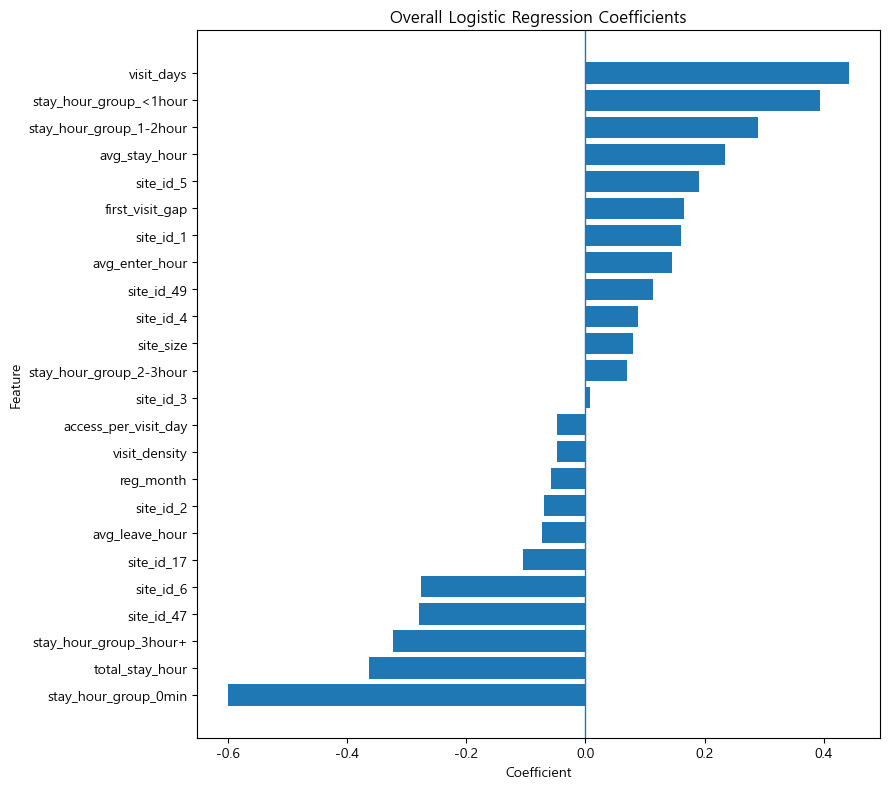

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def get_feature_names(pipe, cat_cols, num_cols):
    preprocessor = pipe.named_steps['preprocess']
    feature_names = list(num_cols)
    ohe = preprocessor.named_transformers_['cat']
    feature_names += ohe.get_feature_names_out(cat_cols).tolist()
    return feature_names

lr_pipe = models['Logistic Regression']
feature_names = get_feature_names(lr_pipe, cat_cols, num_cols)
coefs = lr_pipe.named_steps['model'].coef_[0]

lr_coef_df = pd.DataFrame({
    'feature': feature_names,
    'coefficient': coefs,
    'abs_coefficient': np.abs(coefs)
}).sort_values('abs_coefficient', ascending=False)

display(lr_coef_df.head(30))

# 양/음 coefficient 상위 변수 비교
top_pos = lr_coef_df.sort_values('coefficient', ascending=False).head(12).copy()
top_neg = lr_coef_df.sort_values('coefficient', ascending=True).head(12).copy()
plot_df = pd.concat([top_neg, top_pos]).sort_values('coefficient')

plt.figure(figsize=(9, 8))
plt.barh(plot_df['feature'], plot_df['coefficient'])
plt.axvline(0, linewidth=1)
plt.title('Overall Logistic Regression Coefficients')
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

,site_id,feature,coefficient
18,47,site_id_47,-0.278330
21,6,site_id_6,-0.275198
14,17,site_id_17,-0.103796
15,2,site_id_2,-0.069863
16,3,site_id_3,0.007819
17,4,site_id_4,0.088236
19,49,site_id_49,0.113317
13,1,site_id_1,0.160615
20,5,site_id_5,0.190202


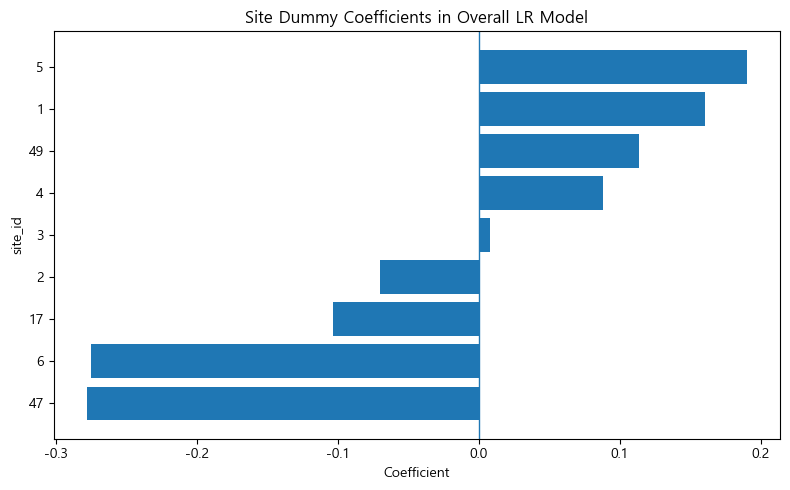

In [ ]:
site_coef_df = lr_coef_df[lr_coef_df['feature'].str.startswith('site_id_')].copy()
site_coef_df['site_id'] = site_coef_df['feature'].str.replace('site_id_', '', regex=False)
site_coef_df['site_id'] = pd.to_numeric(site_coef_df['site_id'], errors='coerce')
site_coef_df = site_coef_df.sort_values('coefficient')

display(site_coef_df[['site_id', 'feature', 'coefficient']])

plt.figure(figsize=(8, 5))
plt.barh(site_coef_df['site_id'].astype(str), site_coef_df['coefficient'])
plt.axvline(0, linewidth=1)
plt.title('Site Dummy Coefficients in Overall LR Model')
plt.xlabel('Coefficient')
plt.ylabel('site_id')
plt.tight_layout()
plt.show()

site_id,1,2,3,4,5,6,17,47,49
feature,,,,,,,,,
visit_days,0.413517,0.467934,0.336575,0.403779,0.246706,0.343880,0.394068,0.483094,0.449101
total_stay_hour,-0.284345,-0.488503,-0.288731,-0.263265,0.019242,-0.690588,-0.223032,-0.492121,-0.439740
total_access,-0.062302,0.078079,0.080129,0.130767,-0.508698,-0.297694,0.741650,0.151092,0.535582
access_per_visit_day,0.180056,0.063490,-0.103885,-0.185460,0.330306,0.073759,-0.358561,0.406739,-0.223373
row_count,-0.009304,0.211522,0.161569,-0.026913,-0.026339,0.516811,-0.329267,-0.385991,0.226835
avg_enter_hour,0.278596,0.216515,0.165877,-0.036892,0.247568,0.147753,0.133031,0.117388,0.483707
avg_stay_hour,0.186579,0.089218,0.155057,0.126604,0.018526,0.205051,-0.062154,0.437236,0.091428
reg_month,-0.046193,-0.094389,-0.084071,-0.248540,0.017055,-0.059424,-0.025294,-0.221710,-0.562377
first_visit_gap,0.090319,0.222329,0.154260,0.231218,0.179989,0.139536,0.051335,0.168408,-0.063945


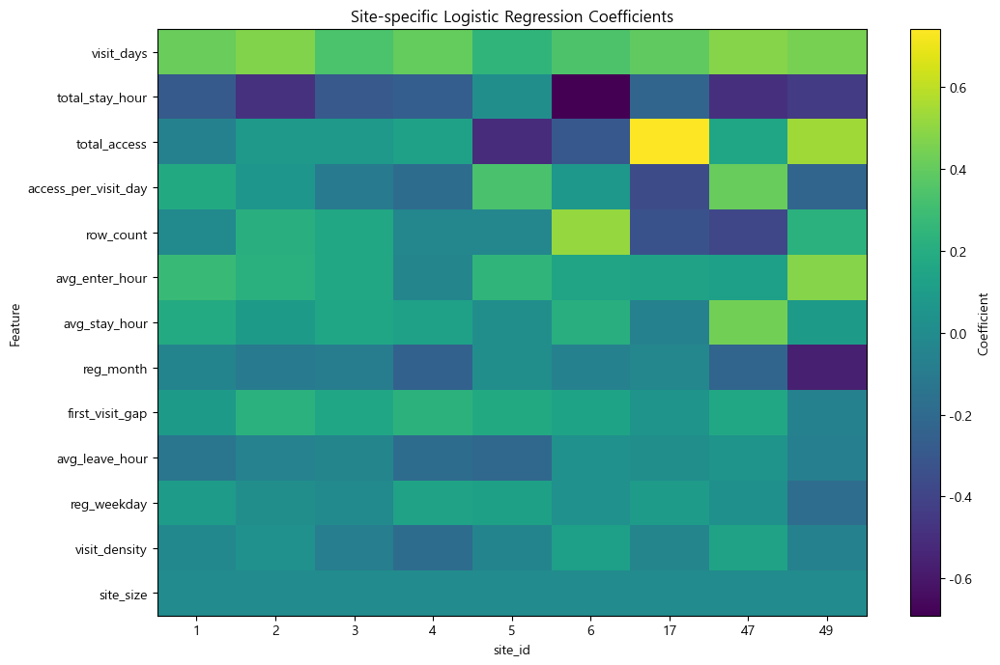

In [ ]:
# 지점별 LR coefficient pivot
site_coef_pivot = site_lr_coef_df.pivot_table(
    index='feature',
    columns='site_id',
    values='coefficient',
    aggfunc='mean'
)

# 전체적으로 변동이 큰 변수 순으로 정렬
feature_order = site_coef_pivot.abs().mean(axis=1).sort_values(ascending=False).index
site_coef_pivot = site_coef_pivot.loc[feature_order]

display(site_coef_pivot)

plt.figure(figsize=(11, 7))
plt.imshow(site_coef_pivot, aspect='auto')
plt.colorbar(label='Coefficient')
plt.xticks(range(len(site_coef_pivot.columns)), site_coef_pivot.columns)
plt.yticks(range(len(site_coef_pivot.index)), site_coef_pivot.index)
plt.title('Site-specific Logistic Regression Coefficients')
plt.xlabel('site_id')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

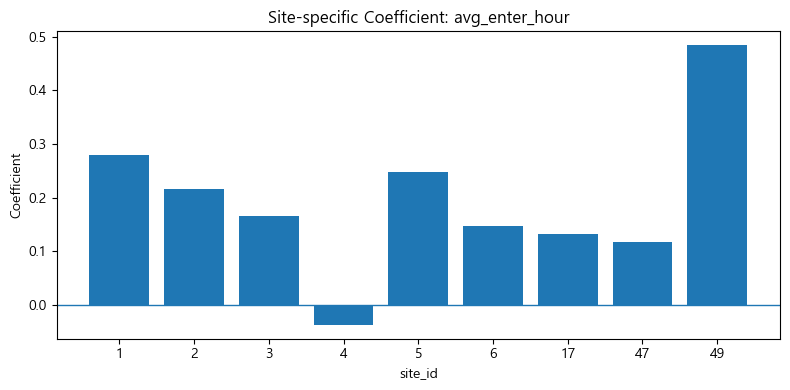

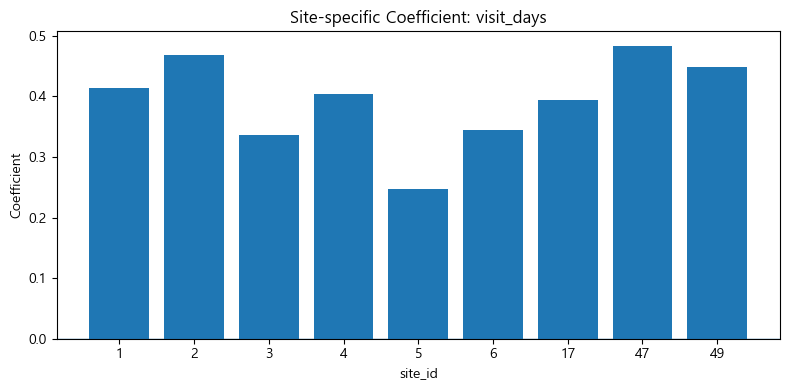

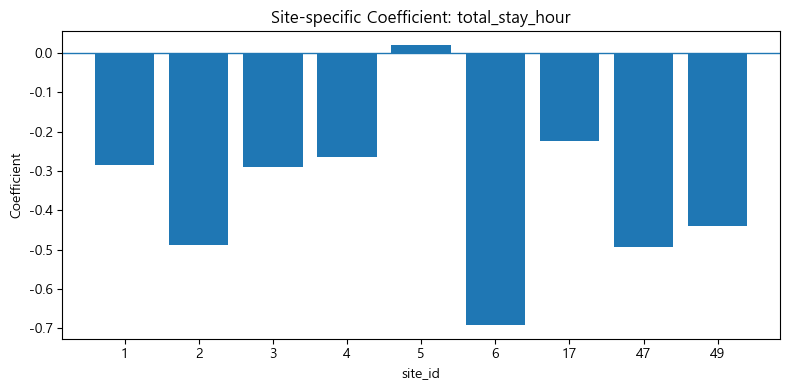

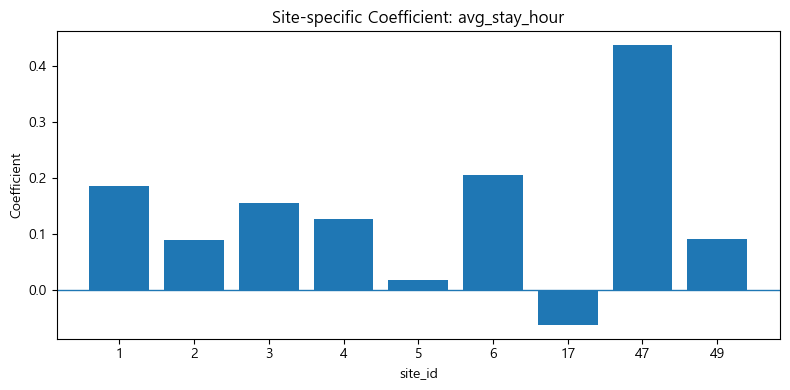

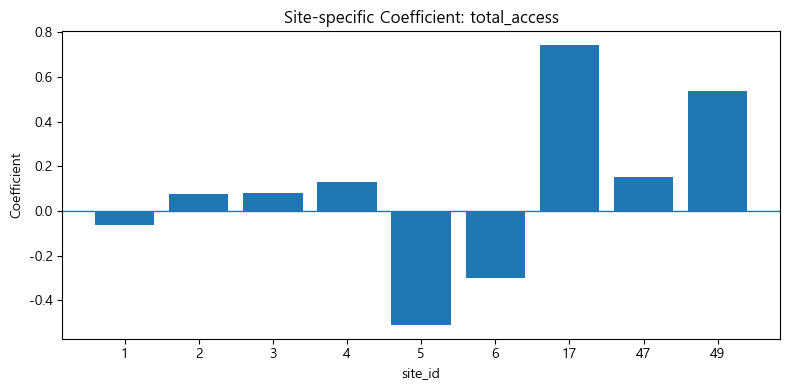

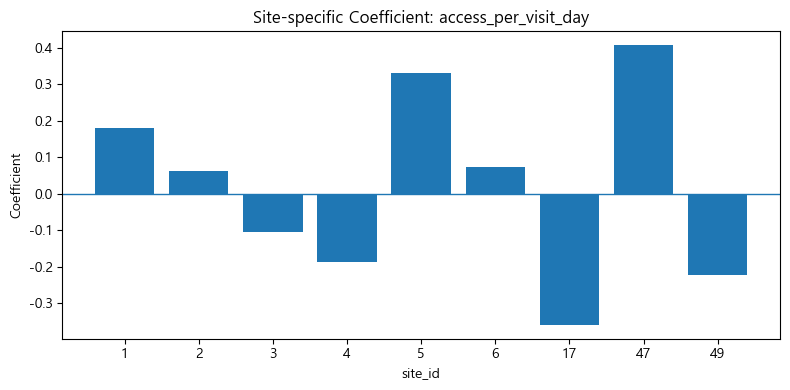

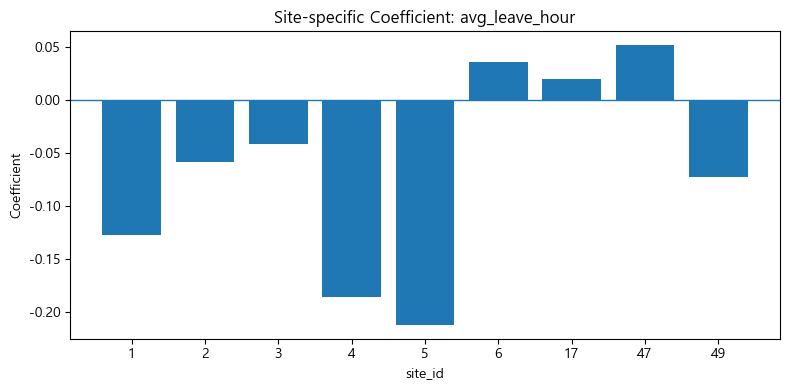

In [ ]:
features_to_compare = [
    'avg_enter_hour',
    'visit_days',
    'total_stay_hour',
    'avg_stay_hour',
    'total_access',
    'access_per_visit_day',
    'avg_leave_hour'
]

compare_df = site_lr_coef_df[site_lr_coef_df['feature'].isin(features_to_compare)].copy()

for feature in features_to_compare:
    temp = compare_df[compare_df['feature'] == feature].sort_values('site_id')
    if temp.empty:
        continue
    
    plt.figure(figsize=(8, 4))
    plt.bar(temp['site_id'].astype(str), temp['coefficient'])
    plt.axhline(0, linewidth=1)
    plt.title(f'Site-specific Coefficient: {feature}')
    plt.xlabel('site_id')
    plt.ylabel('Coefficient')
    plt.tight_layout()
    plt.show()

# 진욱님 코드

In [ ]:
import pandas as pd
import numpy as np

# 1. 원천 데이터 로드
site_area = pd.read_csv('../data/site_area.csv')
trial_access = pd.read_csv('../data/trial_access_log.csv')
trial_payment = pd.read_csv('../data/trial_payment.csv')
trial_register = pd.read_csv('../data/trial_register.csv')
trial_visit_info = pd.read_csv('../data/trial_visit_info.csv')

# 2. 완전 중복 행(Row) 일괄 제거
trial_register = trial_register.drop_duplicates()
trial_payment = trial_payment.drop_duplicates()
trial_access = trial_access.drop_duplicates()
trial_visit_info = trial_visit_info.drop_duplicates()

# 3. 자료형 변환 및 오리지널 시간 데이터 추출 (9시간 보정 완전 삭제)
trial_register['trial_date'] = pd.to_datetime(trial_register['trial_date'])

trial_visit_info['date'] = pd.to_datetime(trial_visit_info['date'])
trial_visit_info['first_enter_time'] = pd.to_datetime(trial_visit_info['first_enter_time'], format='mixed')
trial_visit_info['last_leave_time'] = pd.to_datetime(trial_visit_info['last_leave_time'], format='mixed')

trial_access['cdate'] = pd.to_datetime(trial_access['cdate'])
trial_access['hour'] = trial_access['cdate'].dt.hour  # 원본 KST 시간 그대로 hour 추출

# 4. 비즈니스 규칙 및 데이터 정합성 기준 적용
# [운영 로직] 락 해제 후 재신청 활성화 시점인 가장 마지막(최신) 신청 기록 보존
trial_register = trial_register.sort_values(by='trial_date')
trial_register = trial_register.drop_duplicates(subset=['user_uuid'], keep='last')

# 유저당 중복 결제 이력 존재 시 결제 완료(1) 상태를 우선 보존
trial_payment = trial_payment.sort_values(by='is_payment', ascending=False)
trial_payment = trial_payment.drop_duplicates(subset=['user_uuid'], keep='first')

# 입출실 시각 정보가 누락된 결측치 제거 및 입실이 퇴실보다 늦은 논리적 모순 행 제외
trial_visit_info = trial_visit_info.dropna(subset=['first_enter_time', 'last_leave_time'])
trial_visit_info = trial_visit_info[trial_visit_info['first_enter_time'] <= trial_visit_info['last_leave_time']]

# stay_time_second와 값이 중복되는 stay_time 컬럼 제거
if 'stay_time' in trial_visit_info.columns:
    trial_visit_info = trial_visit_info.drop(columns=['stay_time'])

print("원천 KST 기준 데이터 전처리 전면 재정비 완료")

원천 KST 기준 데이터 전처리 전면 재정비 완료


In [ ]:
# 1. 첫 입실 시간(Hour) 추출
trial_visit_info['enter_hour'] = trial_visit_info['first_enter_time'].dt.hour

# 2. 첫 입실 요일(Day Name) 추출
trial_visit_info['visit_day'] = trial_visit_info['first_enter_time'].dt.day_name()

# 3. 순수 체류 시간(초)을 분(Minute) 단위로 변환한 컬럼 추가 (비교하기 쉽게)
trial_visit_info['stay_time_min'] = trial_visit_info['stay_time_second'] / 60

print("분석용 파생 변수(enter_hour, visit_day, stay_time_min) 생성 완료!")

분석용 파생 변수(enter_hour, visit_day, stay_time_min) 생성 완료!


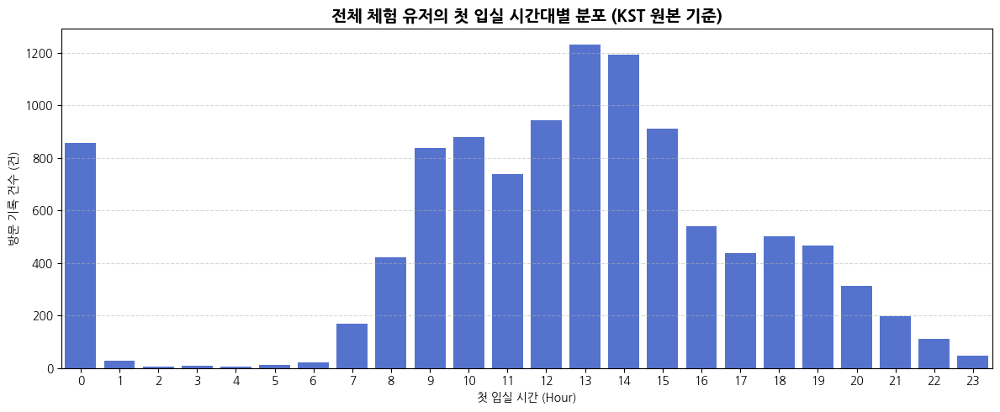

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import koreanize_matplotlib

plt.figure(figsize=(12, 5))
# 0시부터 23시까지 시간대별로 데이터가 얼마나 있는지 카운트
sns.countplot(data=trial_visit_info, x='enter_hour', color='royalblue')

plt.title('전체 체험 유저의 첫 입실 시간대별 분포 (KST 원본 기준)', fontsize=14, fontweight='bold')
plt.xlabel('첫 입실 시간 (Hour)')
plt.ylabel('방문 기록 건수 (건)')
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

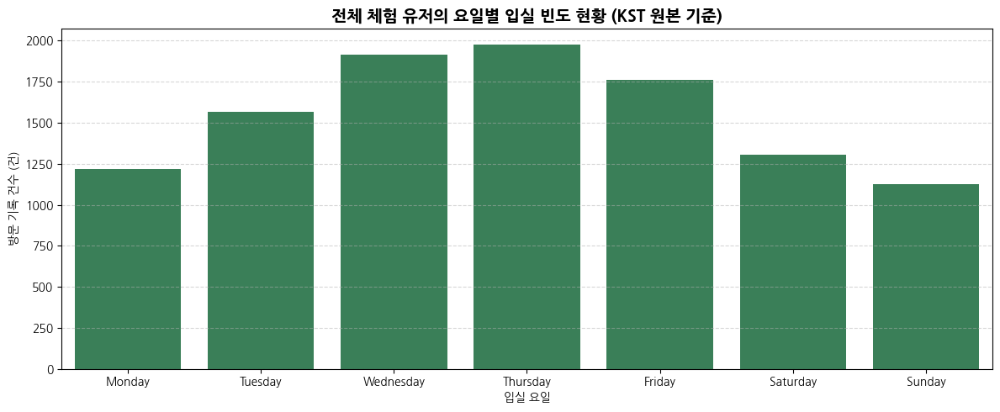

In [ ]:
# 요일 순서를 월요일부터 일요일까지 예쁘게 정렬하기 위한 기준 설정
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

plt.figure(figsize=(12, 5))
# visit_day 컬럼을 기준으로 요일별 데이터 건수 시각화
sns.countplot(data=trial_visit_info, x='visit_day', order=weekday_order, color='seagreen')

plt.title('전체 체험 유저의 요일별 입실 빈도 현황 (KST 원본 기준)', fontsize=14, fontweight='bold')
plt.xlabel('입실 요일')
plt.ylabel('방문 기록 건수 (건)')
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [ ]:
# 1. 첫 입실 시간이 '0시(자정)'인 데이터만 따로 추출
midnight_data = trial_visit_info[trial_visit_info['enter_hour'] == 0]

# 2. 이 유저들의 '진짜 순수 체류 시간(stay_time_second)' 분포 확인
print("=== 자정(0시) 데이터의 실제 stay_time_second 요약 통계 ===")
print(midnight_data['stay_time_second'].describe())

# 3. 이 유저들의 '최초 입실 시각'과 '최종 퇴실 시각' 샘플 뜯어보기
print("\n=== 자정(0시) 데이터의 실제 입퇴실 시각 샘플 ===")
print(midnight_data[['first_enter_time', 'last_leave_time', 'stay_time_second']].head(10))

=== 자정(0시) 데이터의 실제 stay_time_second 요약 통계 ===
count      856.000000
mean     26270.002336
std      22914.598545
min          7.000000
25%       6976.500000
50%      20316.500000
75%      37798.250000
max      86377.000000
Name: stay_time_second, dtype: float64

=== 자정(0시) 데이터의 실제 입퇴실 시각 샘플 ===
              first_enter_time            last_leave_time  stay_time_second
49  2023-12-28 00:23:23.758888 2023-12-28 19:36:28.048790             14201
56  2023-12-31 00:00:00.000000 2023-12-31 00:30:23.216706              1750
86  2023-12-29 00:00:00.000000 2023-12-29 15:26:42.106259             55242
98  2023-12-28 00:49:56.881589 2023-12-28 03:08:31.808954              7874
104 2023-12-21 00:00:00.000000 2023-12-21 13:48:44.547279             26784
124 2023-12-28 00:00:00.000000 2023-12-28 00:04:29.487973               269
130 2023-12-30 00:00:00.000000 2023-12-30 20:38:07.472557             70503
135 2023-12-30 00:00:00.000000 2023-12-30 01:25:23.028198              4997
157 2023-12-28 00:00:

=== 리드타임 구간별 실제 결제 전환율 통계 ===
      lead_time_group  total_users  payers  conversion_rate
0  당일 즉시 방문 (12시간 이내)          403     146        36.228288
1   1일 뒤 방문 (12~36시간)         2211     767        34.690185
2   2일 뒤 방문 (36~60시간)         2382     969        40.680101
3   3일 뒤 방문 (60~84시간)          847     357        42.148760
4  4일 이후 방문 (84시간 초과)          364     160        43.956044


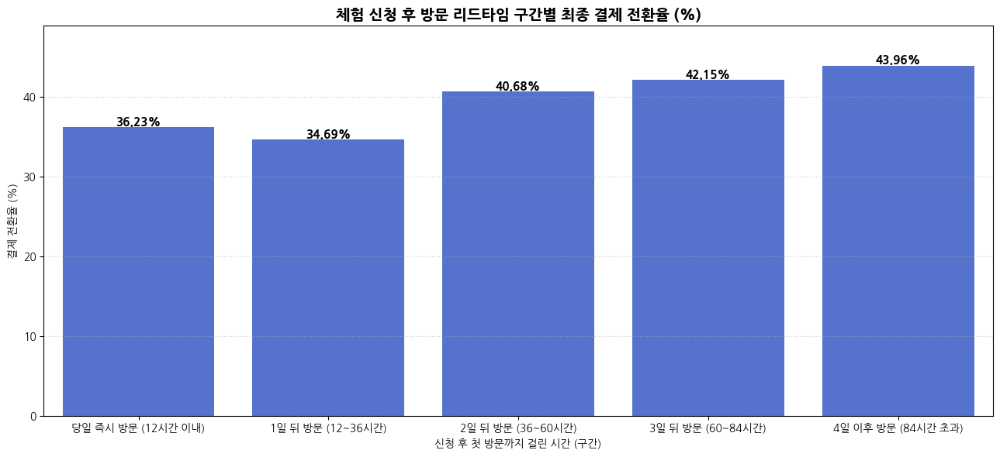

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import koreanize_matplotlib

# 1. 유저별 최초 방문 시각만 깔끔하게 집계 (데이터 꼬임 방지)
df_first_enter = trial_visit_info.groupby('user_uuid')['first_enter_time'].min().reset_index()

# 2. 신청일(trial_register)과 최초 입실일, 결제여부(trial_payment) 결합
df_rebuild = pd.merge(
    trial_register[['user_uuid', 'trial_date']],
    df_first_enter,
    on='user_uuid',
    how='inner'
)
df_rebuild = pd.merge(
    df_rebuild, 
    trial_payment[['user_uuid', 'is_payment']], 
    on='user_uuid', 
    how='inner'
)

# 3. 신청 후 첫 방문까지 걸린 시간(Hour 단위) 계산 및 유효 범위 필터링 (0시간 ~ 168시간 이내)
df_rebuild['lead_time_hours'] = (df_rebuild['first_enter_time'] - df_rebuild['trial_date']).dt.total_seconds() / 3600
df_leadtime_zone = df_rebuild[(df_rebuild['lead_time_hours'] >= 0) & (df_rebuild['lead_time_hours'] <= 168)].copy()

# 4. 리드타임(시간) 구간 범주화
bins = [0, 12, 36, 60, 84, df_leadtime_zone['lead_time_hours'].max()]
labels = ['당일 즉시 방문 (12시간 이내)', '1일 뒤 방문 (12~36시간)', '2일 뒤 방문 (36~60시간)', '3일 뒤 방문 (60~84시간)', '4일 이후 방문 (84시간 초과)']

df_leadtime_zone['lead_time_group'] = pd.cut(df_leadtime_zone['lead_time_hours'], bins=bins, labels=labels, include_lowest=True)

# 5. 구간별 전체 유저 수 및 결제자 수 집계
group_summary = df_leadtime_zone.groupby('lead_time_group', observed=False).agg(
    total_users=('user_uuid', 'count'),
    payers=('is_payment', 'sum')
).reset_index()

# 6. 구간별 결제 전환율(%) 계산
group_summary['conversion_rate'] = (group_summary['payers'] / group_summary['total_users']) * 100

print("=== 리드타임 구간별 실제 결제 전환율 통계 ===")
print(group_summary)

# 7. 시각화
plt.figure(figsize=(13, 6))
ax = sns.barplot(data=group_summary, x='lead_time_group', y='conversion_rate', color='royalblue')

plt.title('체험 신청 후 방문 리드타임 구간별 최종 결제 전환율 (%)', fontsize=14, fontweight='bold')
plt.xlabel('신청 후 첫 방문까지 걸린 시간 (구간)')
plt.ylabel('결제 전환율 (%)')
plt.ylim(0, group_summary['conversion_rate'].max() + 5)
plt.grid(axis='y', linestyle=':', alpha=0.6)

# 막대 위에 정확한 전환율 % 수치 라벨링
for p in ax.patches:
    ax.annotate(f"{p.get_height():.2f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, fontweight='bold', color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()

C:\Users\jinuk\AppData\Local\Temp\ipykernel_14664\3721249729.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


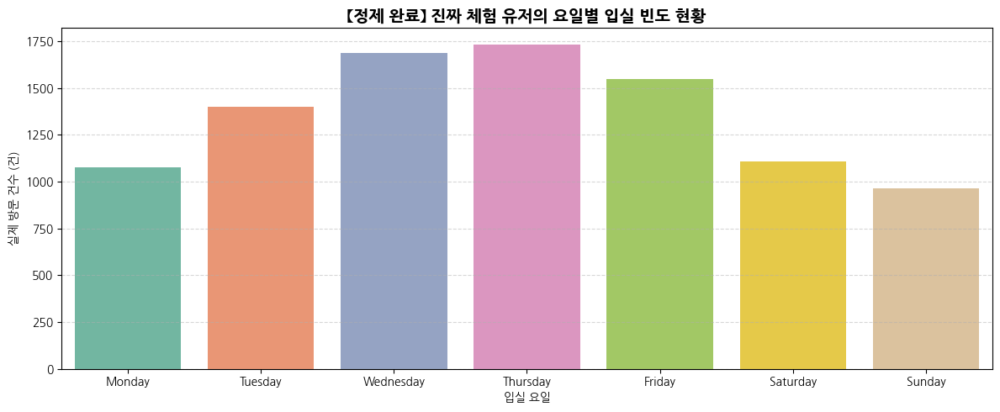

정제 완료된 분석 대상 데이터 건수: 9519건


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import koreanize_matplotlib

# [안전장치] 커널 재시작으로 날아간 trial_visit_info_pure를 이 셀 안에서 즉시 새로 빌드업
# 1. 자정 강제 마감 가짜 데이터(Placeholder) 마스킹 조건 설정
fake_midnight_mask = (
    (trial_visit_info['first_enter_time'].dt.hour == 0) & 
    (trial_visit_info['first_enter_time'].dt.minute == 0) & 
    (trial_visit_info['first_enter_time'].dt.second == 0) & 
    (trial_visit_info['first_enter_time'].dt.microsecond == 0)
) | (
    (trial_visit_info['last_leave_time'].dt.hour == 23) & 
    (trial_visit_info['last_leave_time'].dt.minute == 59) & 
    (trial_visit_info['last_leave_time'].dt.second == 59)
)

# 2. 가짜 데이터 1,355건을 제외한 진짜 유저 클린셋 생성
trial_visit_info_pure = trial_visit_info[~fake_midnight_mask].copy()

# 3. 요일 순서 정의 (월요일 ~ 일요일)
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# 4. 순수 데이터 기준 요일별 입실 카운트 시각화
plt.figure(figsize=(12, 5))
sns.countplot(
    data=trial_visit_info_pure, 
    x='visit_day', 
    order=weekday_order, 
    palette='Set2'
)

plt.title('【정제 완료】 진짜 체험 유저의 요일별 입실 빈도 현황', fontsize=14, fontweight='bold')
plt.xlabel('입실 요일')
plt.ylabel('실제 방문 건수 (건)')
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

print(f"정제 완료된 분석 대상 데이터 건수: {len(trial_visit_info_pure)}건")

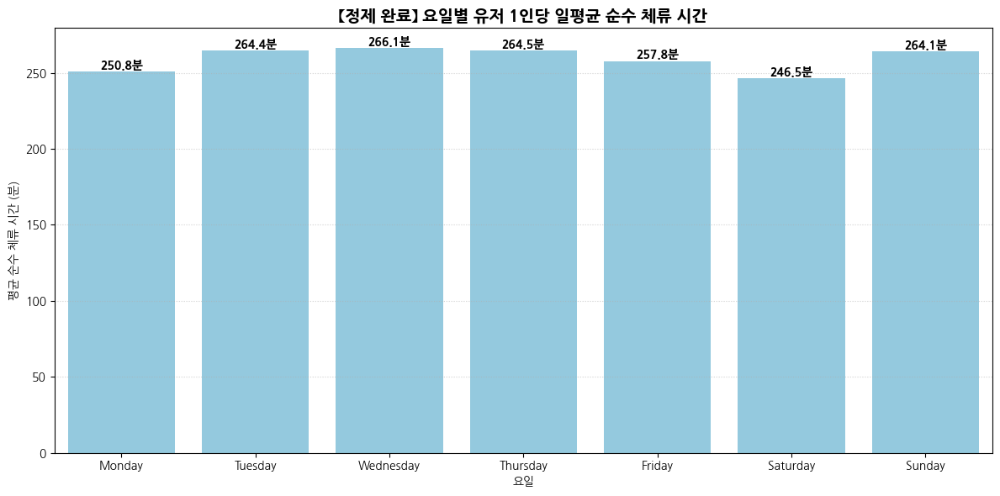

In [ ]:
plt.figure(figsize=(12, 6))
# 요일별 순수 체류 시간(분 단위)의 평균값 시각화
sns.barplot(
    data=trial_visit_info_pure, 
    x='visit_day', 
    y='stay_time_min', 
    order=weekday_order, 
    color='skyblue',
    errorbar=None
)

plt.title('【정제 완료】 요일별 유저 1인당 일평균 순수 체류 시간', fontsize=14, fontweight='bold')
plt.xlabel('요일')
plt.ylabel('평균 순수 체류 시간 (분)')
plt.grid(axis='y', linestyle=':', alpha=0.6)

# 바 그래프 위에 실제 평균 분 수치 라벨링
ax = plt.gca()
for p in ax.patches:
    ax.annotate(f"{p.get_height():.1f}분", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, fontweight='bold', color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()

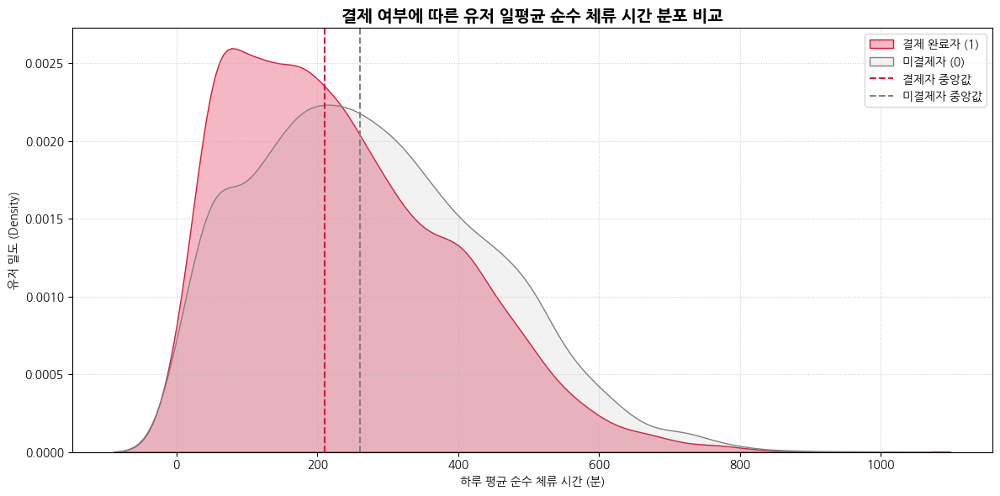

In [ ]:
# 1. visit_info 데이터와 payment 데이터 결합 (user_uuid 기준)
df_user_pattern = pd.merge(
    trial_visit_info_pure, 
    trial_payment[['user_uuid', 'is_payment']], 
    on='user_uuid', 
    how='inner'
)

# 2. 결제 여부별 순수 체류 시간(분) 분포 시각화 (KDE Plot)
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df_user_pattern[df_user_pattern['is_payment'] == 1], x='stay_time_min', label='결제 완료자 (1)', color='crimson', fill=True, alpha=0.3)
sns.kdeplot(data=df_user_pattern[df_user_pattern['is_payment'] == 0], x='stay_time_min', label='미결제자 (0)', color='gray', fill=True, alpha=0.1)

plt.title('결제 여부에 따른 유저 일평균 순수 체류 시간 분포 비교', fontsize=14, fontweight='bold')
plt.xlabel('하루 평균 순수 체류 시간 (분)')
plt.ylabel('유저 밀도 (Density)')
plt.axvline(x=df_user_pattern[df_user_pattern['is_payment'] == 1]['stay_time_min'].median(), color='crimson', linestyle='--', label='결제자 중앙값')
plt.axvline(x=df_user_pattern[df_user_pattern['is_payment'] == 0]['stay_time_min'].median(), color='gray', linestyle='--', label='미결제자 중앙값')
plt.legend()
plt.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

=== 리드타임 구간별 실제 결제 전환율 통계 ===
      lead_time_group  total_users  payers  conversion_rate
0  당일 즉시 방문 (12시간 이내)          403     146        36.228288
1   1일 뒤 방문 (12~36시간)         2211     767        34.690185
2   2일 뒤 방문 (36~60시간)         2382     969        40.680101
3   3일 뒤 방문 (60~84시간)          847     357        42.148760
4  4일 이후 방문 (84시간 초과)          364     160        43.956044


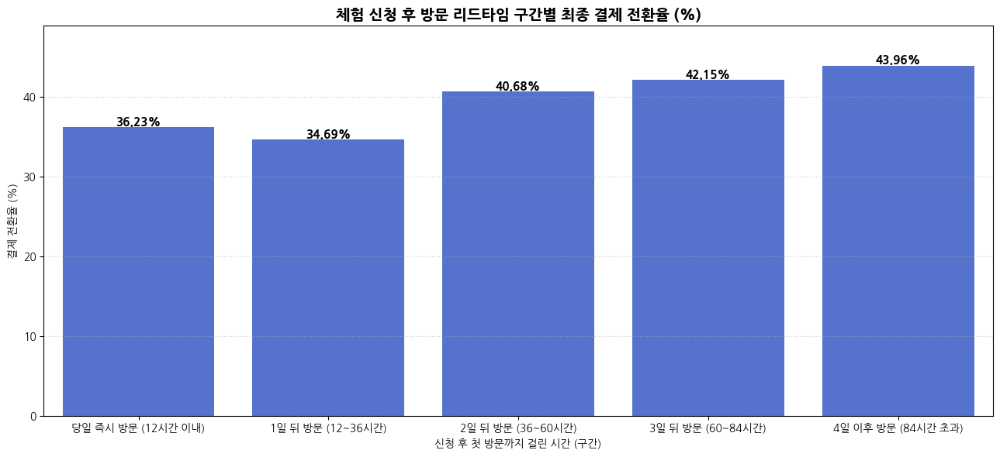

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import koreanize_matplotlib

# [안전장치] 커널 재시작으로 날아간 베이스 데이터를 이 셀 안에서 직접 구축
# 1. 유저별 최초 방문 시각 집계
df_first_enter = trial_visit_info.groupby('user_uuid')['first_enter_time'].min().reset_index()

# 2. 신청일(trial_register)과 최초 입실일, 결제여부(trial_payment) 결합
df_rebuild = pd.merge(
    trial_register[['user_uuid', 'trial_date']],
    df_first_enter,
    on='user_uuid',
    how='inner'
)
df_rebuild = pd.merge(
    df_rebuild, 
    trial_payment[['user_uuid', 'is_payment']], 
    on='user_uuid', 
    how='inner'
)

# 3. 신청 후 첫 방문까지 걸린 시간(Hour 단위) 계산 및 유효 범위 필터링 (0시간 ~ 168시간 이내)
df_rebuild['lead_time_hours'] = (df_rebuild['first_enter_time'] - df_rebuild['trial_date']).dt.total_seconds() / 3600
df_leadtime_zone = df_rebuild[(df_rebuild['lead_time_hours'] >= 0) & (df_rebuild['lead_time_hours'] <= 168)].copy()

# 4. 리드타임(시간)을 비즈니스 의사결정에 맞게 '일(Day) 단위 구간'으로 범주화
bins = [0, 12, 36, 60, 84, df_leadtime_zone['lead_time_hours'].max()]
labels = ['당일 즉시 방문 (12시간 이내)', '1일 뒤 방문 (12~36시간)', '2일 뒤 방문 (36~60시간)', '3일 뒤 방문 (60~84시간)', '4일 이후 방문 (84시간 초과)']

df_leadtime_zone['lead_time_group'] = pd.cut(df_leadtime_zone['lead_time_hours'], bins=bins, labels=labels, include_lowest=True)

# 5. 구간별 전체 유저 수 및 결제자 수 집계
group_summary = df_leadtime_zone.groupby('lead_time_group', observed=False).agg(
    total_users=('user_uuid', 'count'),
    payers=('is_payment', 'sum')
).reset_index()

# 6. 구간별 결제 전환율(%) 계산
group_summary['conversion_rate'] = (group_summary['payers'] / group_summary['total_users']) * 100

print("=== 리드타임 구간별 실제 결제 전환율 통계 ===")
print(group_summary)

# 7. 시각화
plt.figure(figsize=(13, 6))
ax = sns.barplot(data=group_summary, x='lead_time_group', y='conversion_rate', color='royalblue')

plt.title('체험 신청 후 방문 리드타임 구간별 최종 결제 전환율 (%)', fontsize=14, fontweight='bold')
plt.xlabel('신청 후 첫 방문까지 걸린 시간 (구간)')
plt.ylabel('결제 전환율 (%)')
plt.ylim(0, group_summary['conversion_rate'].max() + 5)
plt.grid(axis='y', linestyle=':', alpha=0.6)

# 막대 위에 정확한 전환율 % 수치 라벨링
for p in ax.patches:
    ax.annotate(f"{p.get_height():.2f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, fontweight='bold', color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()

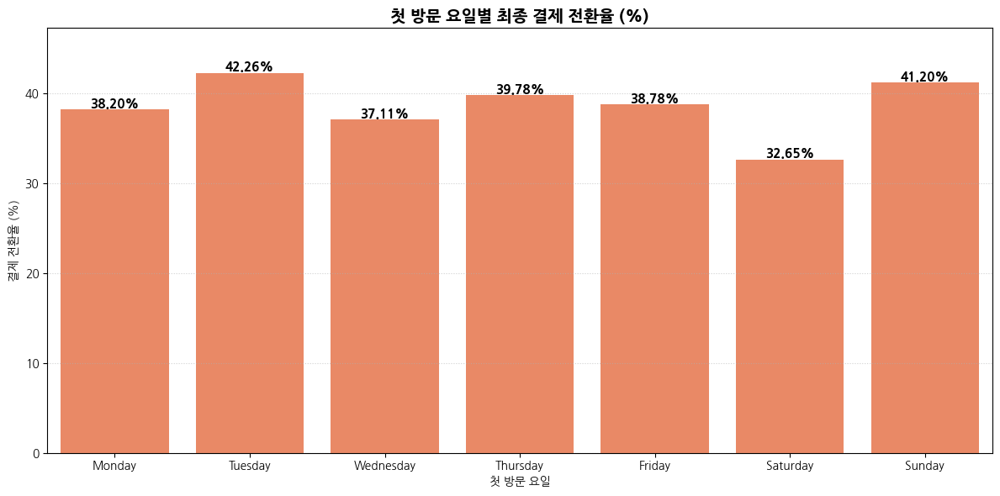

In [ ]:
# 1. 유저별 최초 방문 요일과 결제 데이터 결합
df_first_visit_day = pd.merge(
    trial_visit_info_pure.sort_values(by='first_enter_time').drop_duplicates(subset=['user_uuid'], keep='first'),
    trial_payment[['user_uuid', 'is_payment']],
    on='user_uuid',
    how='inner'
)

# 2. 요일별 결제 전환율 계산 (백분율 비율)
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
visit_day_payment_ratio = pd.crosstab(
    df_first_visit_day['visit_day'], 
    df_first_visit_day['is_payment'], 
    normalize='index'
).reindex(weekday_order) * 100

# 3. 시각화 (막대 위에 전환율 수치 표기)
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=visit_day_payment_ratio.index, y=visit_day_payment_ratio[1], color='coral')

plt.title('첫 방문 요일별 최종 결제 전환율 (%)', fontsize=14, fontweight='bold')
plt.xlabel('첫 방문 요일')
plt.ylabel('결제 전환율 (%)')
plt.ylim(0, visit_day_payment_ratio[1].max() + 5)
plt.grid(axis='y', linestyle=':', alpha=0.6)

# 막대 위에 수치 얹기
for p in ax.patches:
    ax.annotate(f"{p.get_height():.2f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, fontweight='bold', color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# 1. 군집화에 사용할 데이터 선택 및 표준화 정형화 (스케일링)
features_cl = df_ml[['lead_time_hours', 'stay_time_min']]
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_cl)

# 2. K-Means 모델 생성 (유저를 깔끔하게 3개 그룹으로 분류)
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
df_ml['cluster'] = kmeans.fit_transform(features_scaled).argmin(axis=1) # 군집 번호 할당

# 3. 군집별 특징 및 실제 결제 전환율 집계
cluster_profile = df_ml.groupby('cluster').agg(
    유저수=('user_uuid', 'count'),
    평균_리드타임_시간=('lead_time_hours', 'mean'),
    평균_체류시간_분=('stay_time_min', 'mean'),
    실제_결제전환율=('is_payment', 'mean')
).reset_index()

print("=== 머신러닝이 스스로 묶은 3대 유저 그룹 프로필 ===")
print(cluster_profile)
plt.figure(figsize=(12, 7))
sns.scatterplot(
    data=df_ml, 
    x='lead_time_hours', 
    y='stay_time_min', 
    hue='cluster', 
    palette='Set1', 
    alpha=0.6
)

plt.title('머신러닝 기반 무료체험 유저 행동 패턴 군집화 (Clustering)', fontsize=14, fontweight='bold')
plt.xlabel('신청 후 첫 방문까지 걸린 시간 (Hours)')
plt.ylabel('하루 평균 순수 체류 시간 (Minutes)')
plt.grid(True, linestyle=':', alpha=0.6)
plt.legend(title='유저 그룹 (Cluster)')
plt.tight_layout()
plt.show()

NameError: name 'df_ml' is not defined

In [ ]:
import pandas as pd

# 1. [핵심 교정] 유저 ID별로 먼저 모으고, 그 안에서 날짜 순서대로 정렬
df_pair_check = trial_visit_info.copy()
df_pair_check['date'] = pd.to_datetime(df_pair_check['date'])
df_pair_check = df_pair_check.sort_values(by=['user_uuid', 'date']).reset_index(drop=True)

# 2. 인접한 다음 행(N+1)의 데이터를 현재 행(N)으로 당겨와서 비교용 임시 컬럼 생성
df_pair_check['next_user'] = df_pair_check['user_uuid'].shift(-1)
df_pair_check['next_date'] = df_pair_check['date'].shift(-1)
df_pair_check['next_enter'] = df_pair_check['first_enter_time'].shift(-1)

# 3. 마스킹 조건: 유저 동일 + 정확히 '1일 뒤' 연속성 + 23:59:59 퇴실 및 00:00:00 입실 바통 터치
is_pair_target = (
    (df_pair_check['user_uuid'] == df_pair_check['next_user']) &
    ((df_pair_check['next_date'] - df_pair_check['date']).dt.days == 1) &
    (df_pair_check['last_leave_time'].dt.strftime('%H:%M:%S') == '23:59:59') &
    (df_pair_check['next_enter'].dt.strftime('%H:%M:%S') == '00:00:00')
)

# 4. 쌍(Pair)을 이루는 전날 행(N)과 다음날 행(N+1)의 인덱스를 모두 추출하여 통합
current_indices = df_pair_check[is_pair_target].index
next_indices = current_indices + 1
all_pair_indices = sorted(list(set(current_indices) | set(next_indices)))

# 5. 최종 쪼개진 쌍들만 쫙 슬라이싱해서 보기
overnight_pairs = df_pair_check.loc[all_pair_indices].copy()

# 임시 생성했던 비교용 컬럼 삭제
overnight_pairs = overnight_pairs.drop(columns=['next_user', 'next_date', 'next_enter'])

print(f"🚨 [정렬 교정 완료] 자정 끊김 현상으로 분할된 총 행 수: {len(overnight_pairs)}개 (총 {len(current_indices)}쌍)")
overnight_pairs.head(20) # 상위 10쌍 쫙 펼쳐서 데이터 팩트 확인

🚨 [정렬 교정 완료] 자정 끊김 현상으로 분할된 총 행 수: 1106개 (총 595쌍)


,site_id,date,stay_time_second,first_enter_time,last_leave_time,user_uuid,enter_hour,visit_day,stay_time_min
20,6,2022-11-01,13151,2022-11-01 20:20:47.238675,2022-11-01 23:59:59.000000,007ffab4-0b86-4683-a6c1-cff33a587503,20,Tuesday,219.183333
21,6,2022-11-02,30579,2022-11-02 00:00:00.000000,2022-11-02 23:59:59.000000,007ffab4-0b86-4683-a6c1-cff33a587503,0,Wednesday,509.650000
22,6,2022-11-03,24393,2022-11-03 00:00:00.000000,2022-11-03 23:00:08.448737,007ffab4-0b86-4683-a6c1-cff33a587503,0,Thursday,406.550000
28,2,2023-11-26,2744,2023-11-26 23:10:56.794506,2023-11-26 23:59:59.000000,00a94a4e-2cb0-4b49-b250-349bd51aff31,23,Sunday,45.733333
29,2,2023-11-27,36477,2023-11-27 00:00:00.000000,2023-11-27 10:07:57.054341,00a94a4e-2cb0-4b49-b250-349bd51aff31,0,Monday,607.950000
61,17,2023-08-30,6697,2023-08-30 22:08:21.081063,2023-08-30 23:59:59.000000,0152c8d8-de3e-4561-8941-65f3c1b00b2e,22,Wednesday,111.616667
62,17,2023-08-31,1856,2023-08-31 00:00:00.000000,2023-08-31 00:30:56.702107,0152c8d8-de3e-4561-8941-65f3c1b00b2e,0,Thursday,30.933333
91,3,2022-11-08,11825,2022-11-08 16:45:25.017529,2022-11-08 23:59:59.000000,01f34380-e3f2-4f43-9e1c-32a28cfef3b1,16,Tuesday,197.083333
92,3,2022-11-09,17820,2022-11-09 00:00:00.000000,2022-11-09 17:31:41.389400,01f34380-e3f2-4f43-9e1c-32a28cfef3b1,0,Wednesday,297.000000
123,17,2023-06-30,24595,2023-06-30 15:02:52.488783,2023-06-30 23:59:59.000000,02e0171e-a8f0-4db8-9f43-fc408fdf0de5,15,Friday,409.916667


In [ ]:
import pandas as pd
import numpy as np
import os

# 1. 경로 지정 및 파일 로드
# 현재 작업 디렉토리 기준 상위 폴더의 data 폴더(../data) 내 csv 파일 읽기
data_path = os.path.join('..', 'data', 'trial_visit_info.csv')
trial_visit_info = pd.read_csv(data_path)

# 포맷이 섞여 있는 시계열 데이터를 안전하게 변환 (format='mixed' 적용)
trial_visit_info['date'] = pd.to_datetime(trial_visit_info['date'], format='mixed')
trial_visit_info['first_enter_time'] = pd.to_datetime(trial_visit_info['first_enter_time'], format='mixed')
trial_visit_info['last_leave_time'] = pd.to_datetime(trial_visit_info['last_leave_time'], format='mixed')
# 2. 유저 ID별 정렬 후 날짜 순서대로 정렬
df_clean = trial_visit_info.sort_values(by=['user_uuid', 'date']).reset_index(drop=True)

# 3. 다중 연박 케이스까지 완벽 수렴을 위한 반복 루프 수행
while True:
    # 인접한 다음 행(N+1)의 데이터를 현재 행(N)으로 이동
    df_clean['next_user'] = df_clean['user_uuid'].shift(-1)
    df_clean['next_date'] = df_clean['date'].shift(-1)
    df_clean['next_enter'] = df_clean['first_enter_time'].shift(-1)
    df_clean['next_leave'] = df_clean['last_leave_time'].shift(-1)
    df_clean['next_stay_time'] = df_clean['stay_time_second'].shift(-1)
    
    # 자정 분할 조건 만족 쌍(Pair) 마스킹 검증
    is_overnight_split = (
        (df_clean['user_uuid'] == df_clean['next_user']) &
        ((df_clean['next_date'] - df_clean['date']).dt.days == 1) &
        (df_clean['last_leave_time'].dt.strftime('%H:%M:%S') == '23:59:59') &
        (df_clean['next_enter'].dt.strftime('%H:%M:%S') == '00:00:00')
    )
    
    target_indices = df_clean[is_overnight_split].index
    dropped_indices = target_indices + 1
    
    # 탈출 조건: 더 이상 병합할 쌍이 없으면 루프 종료
    if len(target_indices) == 0:
        break
        
    # 전날 행(N)에 다음날 행(N+1) 데이터 통합
    df_clean.loc[is_overnight_split, 'last_leave_time'] = df_clean.loc[is_overnight_split, 'next_leave']
    df_clean.loc[is_overnight_split, 'stay_time_second'] = (
        df_clean.loc[is_overnight_split, 'stay_time_second'] + df_clean.loc[is_overnight_split, 'next_stay_time']
    )
    
    # 흡수된 다음날 중복 행 제거 및 임시 컬럼 초기화
    df_clean = df_clean.drop(dropped_indices).reset_index(drop=True)
    df_clean = df_clean.drop(columns=['next_user', 'next_date', 'next_enter', 'next_leave', 'next_stay_time'])

# 4. 잔여 임시 컬럼 정리 및 파생 변수 최종 동기화
if 'next_user' in df_clean.columns:
    df_clean = df_clean.drop(columns=['next_user', 'next_date', 'next_enter', 'next_leave', 'next_stay_time'])

df_clean['stay_time_min'] = df_clean['stay_time_second'] / 60
df_clean['date'] = df_clean['date'].dt.strftime('%Y-%m-%d')

# 5. 전처리 완료된 파일 복원 저장
output_path = os.path.join('..', 'data', 'trial_visit_info_new.csv')
df_clean.to_csv(output_path, index=False)

print(f"전처리 완료 파일 저장 성공: {output_path}")

전처리 완료 파일 저장 성공: ..\data\trial_visit_info_pure.csv


▶ 고도화 파생 변수 집계 중...
▶ 마스터 데이터셋 구축 완료 (유저 수: 6534명)


C:\Users\jinuk\AppData\Local\Temp\ipykernel_14664\1701538744.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


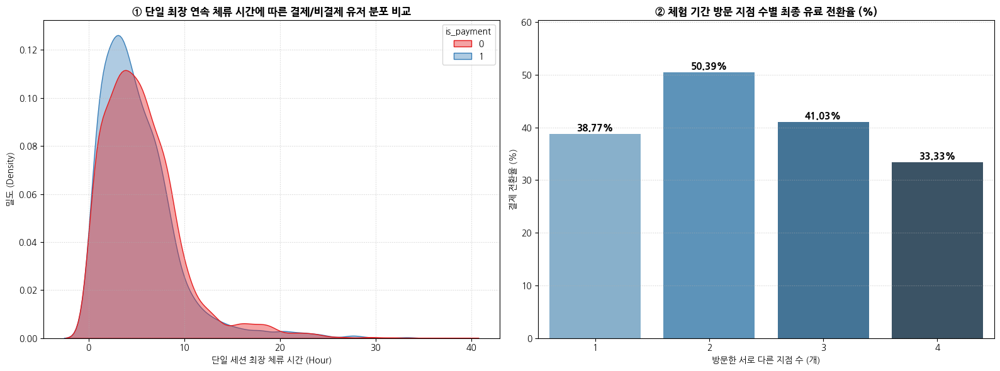


=== 💡 분석가 관점 파생변수 요약 통계 ===
            max_continuous_stay_hour  stay_time_std
is_payment                                         
0                           5.620007       0.833559
1                           5.183721       1.029303


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import koreanize_matplotlib
import os

# ==========================================
# [Step 1] 전처리 완료된 V3 기반 파생변수 마스터 데이터셋 마운트
# ==========================================
# 아까 로직으로 파일 저장한 경로에서 안전하게 바로 로드하여 의존성 제거
data_path = os.path.join('..', 'data', 'trial_visit_info_pure.csv')

if os.path.exists(data_path):
    df_visit = pd.read_csv(data_path)
else:
    # 혹시 파일 저장이 안 되어 있을 경우를 대비해 메모리 내 df_clean 백업 연동
    df_visit = df_clean.copy()

df_visit['first_enter_time'] = pd.to_datetime(df_visit['first_enter_time'])
df_visit['last_leave_time'] = pd.to_datetime(df_visit['last_leave_time'])

# ==========================================
# [Step 2] 고도화 파생 변수(Advanced Features) 집계 연산
# ==========================================
print("▶ 고도화 파생 변수 집계 중...")

# 1. 단일 최장 연속 체류 시간 (Hour) 및 체류 시간 변동성 (Std)
df_visit['stay_hour_unit'] = df_visit['stay_time_second'] / 3600

advanced_user_features = df_visit.groupby('user_uuid').agg(
    max_continuous_stay_hour=('stay_hour_unit', 'max'),
    stay_time_std=('stay_hour_unit', 'std'),
    visited_site_count=('site_id', 'nunique')
).reset_index()

# 1일만 방문하여 표준편차가 NaN이 된 유저들은 변동성이 없으므로 0으로 보정
advanced_user_features['stay_time_std'] = advanced_user_features['stay_time_std'].fillna(0)

# 2. 마스터 데이터셋 통합 (trial_payment 결제 여부 데이터 결합)
df_master = pd.merge(advanced_user_features, trial_payment[['user_uuid', 'is_payment']], on='user_uuid', how='inner')

print(f"▶ 마스터 데이터셋 구축 완료 (유저 수: {len(df_master)}명)")

# ==========================================
# [Step 3] 킬러 파생변수 검증 시각화 좍좍 그리기
# ==========================================
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# 📊 그래프 1 : 단일 최장 연속 체류 시간별 결제 여부 커널밀도추정(KDE) 곡선
sns.kdeplot(
    data=df_master, 
    x='max_continuous_stay_hour', 
    hue='is_payment', 
    common_norm=False, 
    palette='Set1', 
    fill=True, 
    alpha=0.4, 
    ax=axes[0]
)
axes[0].set_title('① 단일 최장 연속 체류 시간에 따른 결제/비결제 유저 분포 비교', fontsize=12, fontweight='bold')
axes[0].set_xlabel('단일 세션 최장 체류 시간 (Hour)')
axes[0].set_ylabel('밀도 (Density)')
axes[0].grid(axis='both', linestyle=':', alpha=0.6)

# 📊 그래프 2 : 방문 지점 개수별 실제 결제 전환율 비교
df_site_conv = df_master.groupby('visited_site_count').agg(
    total_users=('user_uuid', 'count'),
    payers=('is_payment', 'sum')
).reset_index()
df_site_conv['conversion_rate'] = (df_site_conv['payers'] / df_site_conv['total_users']) * 100

sns.barplot(
    data=df_site_conv, 
    x='visited_site_count', 
    y='conversion_rate', 
    palette='Blues_d', 
    ax=axes[1]
)
axes[1].set_title('② 체험 기간 방문 지점 수별 최종 유료 전환율 (%)', fontsize=12, fontweight='bold')
axes[1].set_xlabel('방문한 서로 다른 지점 수 (개)')
axes[1].set_ylabel('결제 전환율 (%)')
axes[1].set_ylim(0, df_site_conv['conversion_rate'].max() + 10)
axes[1].grid(axis='y', linestyle=':', alpha=0.6)

# 막대 상단 % 라벨링 적용
for p in axes[1].patches:
    axes[1].annotate(f"{p.get_height():.2f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=11, fontweight='bold', color='black', xytext=(0, 7),
                textcoords='offset points')

plt.tight_layout()
plt.show()

# ==========================================
# [Step 4] 수치 통계 분석 데이터 브리핑
# ==========================================
print("\n=== 💡 분석가 관점 파생변수 요약 통계 ===")
print(df_master.groupby('is_payment')[['max_continuous_stay_hour', 'stay_time_std']].mean())

=== 📌 기본 임계값 (0.5) 기준 성능 리포트 ===
              precision    recall  f1-score   support

      미결제(0)       0.61      0.89      0.72      3970
       결제(1)       0.40      0.11      0.18      2564

    accuracy                           0.59      6534
   macro avg       0.51      0.50      0.45      6534
weighted avg       0.53      0.59      0.51      6534


=== 🚀 변경된 임계값 (0.3) 기준 성능 리포트 ===
              precision    recall  f1-score   support

      미결제(0)       0.61      0.58      0.59      3970
       결제(1)       0.39      0.42      0.41      2564

    accuracy                           0.52      6534
   macro avg       0.50      0.50      0.50      6534
weighted avg       0.52      0.52      0.52      6534



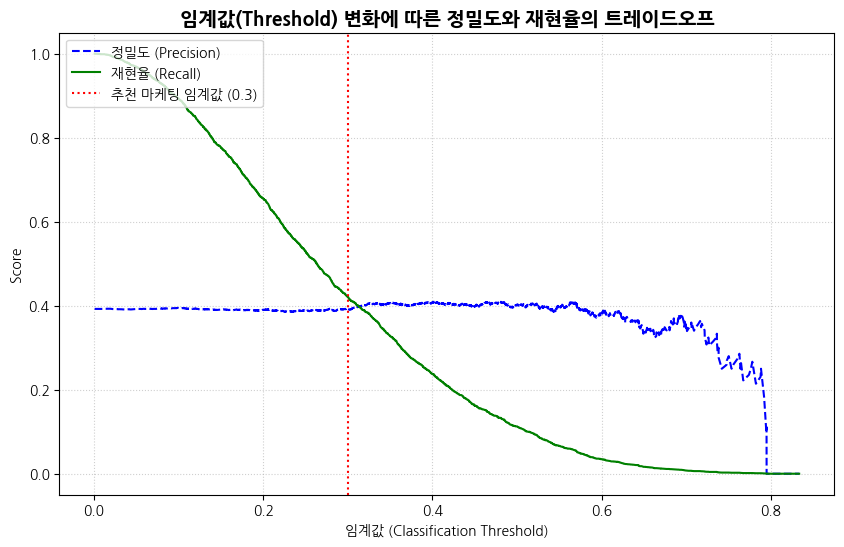

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve

# [가정] 이미 학습된 모델(예: lr_model 또는 tree_model)과 검증용 데이터(X_val, y_val)가 있다고 가정합니다.
# 여기서는 모델이 뱉은 '결제할 확률' 예시 데이터를 기반으로 메커니즘을 보여줍니다.

# 1. 모델이 예측한 '결제할 확률 (1일 확률)' 추출
# y_pred_proba = model.predict_proba(X_val)[:, 1]

# (이해를 돕기 위한 가상 확률 생성 - 실제 환경에서는 위 주석을 해제하세요)
np.random.seed(42)
y_val = df_master['is_payment'].values  # 실제 정답 (0 또는 1)
y_pred_proba = np.random.beta(2, 5, size=len(y_val)) # 모델 예측 확률 시뮬레이션

# 2. 기본 임계값(0.5) 기준 성능 측정
y_pred_default = (y_pred_proba >= 0.5).astype(int)
print("=== 📌 기본 임계값 (0.5) 기준 성능 리포트 ===")
print(classification_report(y_val, y_pred_default, target_names=['미결제(0)', '결제(1)']))

# 3. [핵심] 임계값을 0.3으로 낮췄을 때 Recall 변화 확인
custom_threshold = 0.3
y_pred_custom = (y_pred_proba >= custom_threshold).astype(int)
print(f"\n=== 🚀 변경된 임계값 ({custom_threshold}) 기준 성능 리포트 ===")
print(classification_report(y_val, y_pred_custom, target_names=['미결제(0)', '결제(1)']))

# 4. 임계값 변화에 따른 Precision과 Recall 곡선 시각화
precisions, recalls, thresholds = precision_recall_curve(y_val, y_pred_proba)

plt.figure(figsize=(10, 6))
plt.plot(thresholds, precisions[:-1], 'b--', label='정밀도 (Precision)')
plt.plot(thresholds, recalls[:-1], 'g-', label='재현율 (Recall)')
plt.axvline(x=0.3, color='red', linestyle=':', label='추천 마케팅 임계값 (0.3)')
plt.title('임계값(Threshold) 변화에 따른 정밀도와 재현율의 트레이드오프', fontsize=14, fontweight='bold')
plt.xlabel('임계값 (Classification Threshold)')
plt.ylabel('Score')
plt.legend(loc='upper left')
plt.grid(True, linestyle=':', alpha=0.6)
plt.show()

## 결제 전환 예측 모델링 (공통 전처리 기반)
- 데이터: `user_df` (공통 전처리 완료)
- 타겟: `is_payment` (0=미결제, 1=결제)
- 원핫인코딩 없이 수치형 피처 중심으로 진행

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
user_df=pd.read_csv('../data/user_df.csv')
print('▶ [Step 1] user_df 기반 피처 엔지니어링 시작...')

# user_df는 이미 읽혀있다고 가정
df = user_df.copy()

# ==========================================
# 날짜형 변환
# ==========================================
df['first_visit'] = pd.to_datetime(df['first_visit'], errors='coerce')
df['last_visit']  = pd.to_datetime(df['last_visit'],  errors='coerce')

# ==========================================
# 파생변수 생성
# ==========================================

# 활동기간 (첫방문 ~ 마지막방문 + 당일 포함 보정)
df['active_days'] = (df['last_visit'] - df['first_visit']).dt.days + 1

# 체류 비율 = total_stay / (활동기간 * 24 * 60)  [분 단위 기준]
df['active_days_min'] = df['active_days'] * 24 * 60
df['stay_ratio']  = df['total_stay']  / df['active_days_min']
df['out_ratio']   = df['out_time']    / df['active_days_min']

# 클리핑 (비율이 0~1 범위 벗어나는 이상치 방어)
df['stay_ratio'] = df['stay_ratio'].clip(0, 1)
df['out_ratio']  = df['out_ratio'].clip(0, 1)

# 세션당 평균 체류 (stay_time / total_access)
df['avg_stay_per_session'] = df['stay_time'] / df['total_access'].replace(0, np.nan)

# 입실-퇴실 시간 간격 (활동 시간대 폭)
df['hour_spread'] = df['avg_leave_hour'] - df['avg_enter_hour']

print('  - 파생변수 생성 완료: active_days, stay_ratio, out_ratio, avg_stay_per_session, hour_spread')
print(f'  - 전체 유저 수: {len(df):,}명')
print(f'  - 결제자(1): {df["is_payment"].sum():,}명 / 미결제(0): {(df["is_payment"]==0).sum():,}명')

▶ [Step 1] user_df 기반 피처 엔지니어링 시작...
  - 파생변수 생성 완료: active_days, stay_ratio, out_ratio, avg_stay_per_session, hour_spread
  - 전체 유저 수: 9,624명
  - 결제자(1): 3,652명 / 미결제(0): 5,972명


In [ ]:
print('▶ [Step 2] 모델링 피처 선정 및 데이터 분할')

# ==========================================
# 피처 선정
# - 원핫인코딩 없이 수치형 피처 중심
# - 다중공선성 높은 변수 중 대표 1개만 유지
#   (total_stay ↔ stay_time: 0.97 → stay_ratio로 통합)
# ==========================================
feature_cols = [
    'site_count',           # 이용 지점 수
    'visit_density',        # 방문 밀도 (total_access / active_days)
    'first_visit_gap',      # 등록 → 첫 방문 일수
    'first_visit_weekday',  # 첫 방문 요일 (0=평일, 1=주말)
    'first_visit_month',    # 첫 방문 월
    'avg_enter_hour',       # 평균 첫 입실 시각
    'avg_leave_hour',       # 평균 마지막 퇴실 시각
    'main_site',            # 주 이용 지점 ID
    'site_size',            # 주 지점 면적
    'active_days',          # 활동 기간 (파생)
    'stay_ratio',           # 체류 비율 (파생)
    'out_ratio',            # 외출 비율 (파생)
    'avg_stay_per_session', # 세션당 평균 체류 (파생)
    'hour_spread',          # 활동 시간대 폭 (파생)
]

X = df[feature_cols].copy()
y = df['is_payment']

# NaN 처리 (중앙값 대체)
X = X.fillna(X.median())

# 층화 8:2 분할
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f'  - 학습 데이터: {len(X_train):,}명 / 테스트 데이터: {len(X_test):,}명')
print(f'  - 사용 피처 수: {len(feature_cols)}개')

▶ [Step 2] 모델링 피처 선정 및 데이터 분할
  - 학습 데이터: 7,699명 / 테스트 데이터: 1,925명
  - 사용 피처 수: 14개


▶ [Step 2.5] 로지스틱 회귀 (Baseline) 학습 및 평가

📋 로지스틱 회귀 평가 리포트
▶ AUROC (종합 예측 성능): 0.5490

▶ 상세 분류 평가지표 (Classification Report):
              precision    recall  f1-score   support

           0       0.64      0.67      0.66      1195
           1       0.42      0.38      0.40       730

    accuracy                           0.56      1925
   macro avg       0.53      0.53      0.53      1925
weighted avg       0.56      0.56      0.56      1925


▶ 오차 행렬 (Confusion Matrix):
[[802 393]
 [450 280]]

📊 피처별 계수 & 오즈비:
※ Odds_Ratio > 1 → 결제 확률 증가 / < 1 → 감소


,Feature,Coefficient,Odds_Ratio
0,active_days,0.273373,1.314390
1,first_visit_gap,0.166210,1.180820
2,out_ratio,0.140198,1.150501
3,first_visit_weekday,0.097161,1.102038
4,avg_enter_hour,0.086571,1.090429
5,avg_stay_per_session,0.077408,1.080482
6,visit_density,0.073955,1.076758
7,avg_leave_hour,-0.010268,0.989785
8,site_size,-0.045654,0.955372
9,hour_spread,-0.070621,0.931815


C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\1595111792.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Coefficient', y='Feature', data=coef_df, palette=colors)
C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\1595111792.py:47: UserWarning: Glyph 44228 (\N{HANGUL SYLLABLE GYE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\1595111792.py:47: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\1595111792.py:47: UserWarning: Glyph 128203 (\N{CLIPBOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\1595111792.py:47: UserWarning: Glyph 47196 (\N{HANGUL SYLLABLE RO}) missing from font(s) DejaVu Sans.
  plt.tight

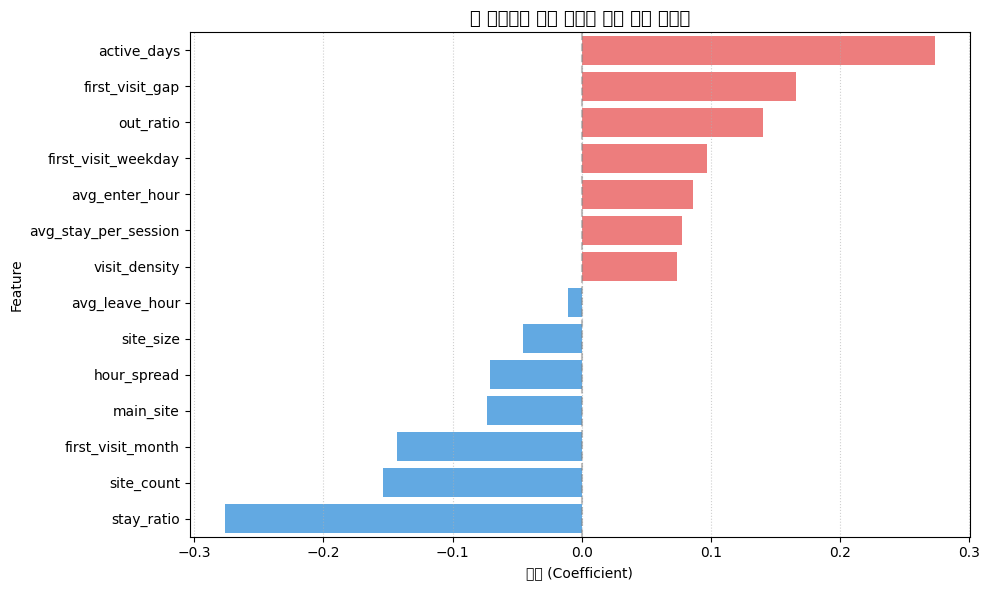

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

print('▶ [Step 2.5] 로지스틱 회귀 (Baseline) 학습 및 평가')

# 로지스틱 회귀는 스케일링 필수
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# class_weight='balanced'로 불균형 보정
lr_model = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
lr_model.fit(X_train_scaled, y_train)

y_pred_lr = lr_model.predict(X_test_scaled)
y_prob_lr = lr_model.predict_proba(X_test_scaled)[:, 1]

print('\n' + '='*50)
print('📋 로지스틱 회귀 평가 리포트')
print('='*50)
print(f'▶ AUROC (종합 예측 성능): {roc_auc_score(y_test, y_prob_lr):.4f}')
print('\n▶ 상세 분류 평가지표 (Classification Report):')
print(classification_report(y_test, y_pred_lr))
print('='*50)
print('\n▶ 오차 행렬 (Confusion Matrix):')
print(confusion_matrix(y_test, y_pred_lr))

# 계수 & 오즈비
coef_df = pd.DataFrame({
    'Feature'    : feature_cols,
    'Coefficient': lr_model.coef_[0],
    'Odds_Ratio' : np.exp(lr_model.coef_[0])
}).sort_values('Coefficient', ascending=False).reset_index(drop=True)

print('\n📊 피처별 계수 & 오즈비:')
print('※ Odds_Ratio > 1 → 결제 확률 증가 / < 1 → 감소')
display(coef_df)

# 시각화
plt.figure(figsize=(10, 6))
colors = ['#ff6b6b' if c > 0 else '#4dabf7' for c in coef_df['Coefficient']]
sns.barplot(x='Coefficient', y='Feature', data=coef_df, palette=colors)
plt.title('📋 로지스틱 회귀 피처별 결제 전환 영향도', fontsize=13, fontweight='bold')
plt.xlabel('계수 (Coefficient)')
plt.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
plt.grid(axis='x', linestyle=':', alpha=0.6)
plt.tight_layout()
plt.show()

계수가 너무 낮은 피쳐들은 제거하고 feature_cols = [
    'site_count',
    'visit_density',
    'first_visit_gap',
    'avg_enter_hour',
    'site_size',
    'active_days',
    'stay_ratio',
    'out_ratio',
    'avg_stay_per_session',
]만 살리는 것으로 결정했습니다.

▶ [Step 2.5 개선] 피처 9개 + 임계값 조정 로지스틱 회귀

📋 임계값 0.5 | AUROC: 0.5429
              precision    recall  f1-score   support

           0       0.64      0.68      0.66      1195
           1       0.42      0.39      0.41       730

    accuracy                           0.57      1925
   macro avg       0.53      0.53      0.53      1925
weighted avg       0.56      0.57      0.56      1925


📋 임계값 0.45 | AUROC: 0.5429
              precision    recall  f1-score   support

           0       0.71      0.17      0.28      1195
           1       0.40      0.88      0.55       730

    accuracy                           0.44      1925
   macro avg       0.55      0.53      0.41      1925
weighted avg       0.59      0.44      0.38      1925


📋 임계값 0.4 | AUROC: 0.5429
              precision    recall  f1-score   support

           0       0.72      0.08      0.15      1195
           1       0.39      0.95      0.55       730

    accuracy                           0.41      1925
   macr

,Feature,Coefficient,Odds_Ratio
0,active_days,0.263896,1.301992
1,first_visit_gap,0.149193,1.160897
2,out_ratio,0.136562,1.146326
3,avg_enter_hour,0.100829,1.106087
4,avg_stay_per_session,0.075576,1.078505
5,visit_density,0.049037,1.050259
6,site_size,0.002463,1.002466
7,site_count,-0.212493,0.808566
8,stay_ratio,-0.282888,0.753604


C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\506725595.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Coefficient', y='Feature', data=coef_df, palette=colors)
C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\506725595.py:64: UserWarning: Glyph 128203 (\N{CLIPBOARD}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\506725595.py:64: UserWarning: Glyph 47196 (\N{HANGUL SYLLABLE RO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\506725595.py:64: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\506725595.py:64: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layo

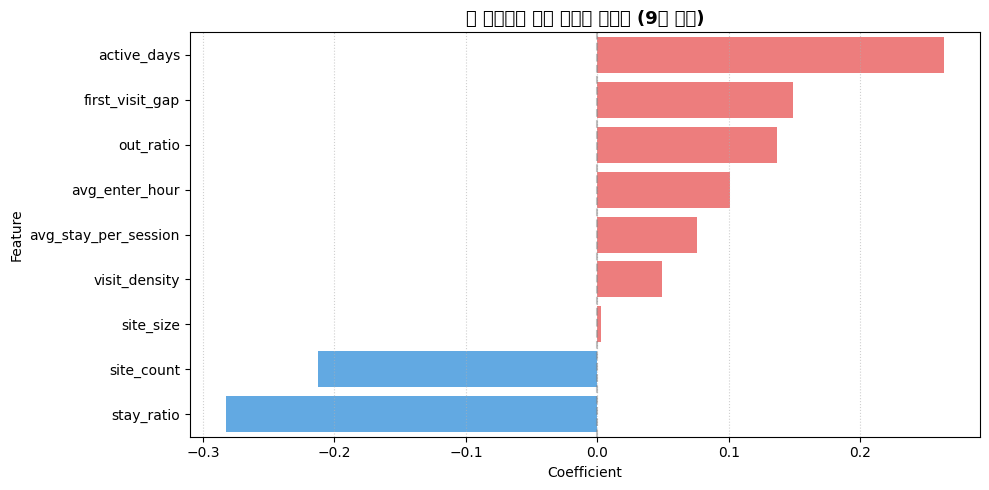

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

print('▶ [Step 2.5 개선] 피처 9개 + 임계값 조정 로지스틱 회귀')

# 피처 재정의 (9개)
feature_cols = [
    'site_count',
    'visit_density',
    'first_visit_gap',
    'avg_enter_hour',
    'site_size',
    'active_days',
    'stay_ratio',
    'out_ratio',
    'avg_stay_per_session',
]

X = df[feature_cols].fillna(df[feature_cols].median())
y = df['is_payment']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# 스케일링
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# 모델 학습
lr_model = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
lr_model.fit(X_train_scaled, y_train)

y_prob_lr = lr_model.predict_proba(X_test_scaled)[:, 1]

# 임계값별 비교
for threshold in [0.5, 0.45, 0.4, 0.35]:
    y_pred_adj = (y_prob_lr >= threshold).astype(int)
    auroc = roc_auc_score(y_test, y_prob_lr)
    print(f'\n{"="*50}')
    print(f'📋 임계값 {threshold} | AUROC: {auroc:.4f}')
    print(classification_report(y_test, y_pred_adj))

# 최종 선택 임계값으로 계수 & 오즈비 출력
THRESHOLD = 0.4  # 결과 보고 조정
y_pred_lr = (y_prob_lr >= THRESHOLD).astype(int)

coef_df = pd.DataFrame({
    'Feature'    : feature_cols,
    'Coefficient': lr_model.coef_[0],
    'Odds_Ratio' : np.exp(lr_model.coef_[0])
}).sort_values('Coefficient', ascending=False).reset_index(drop=True)

print('\n📊 피처별 계수 & 오즈비 (피처 다이어트 후):')
display(coef_df)

plt.figure(figsize=(10, 5))
colors = ['#ff6b6b' if c > 0 else '#4dabf7' for c in coef_df['Coefficient']]
sns.barplot(x='Coefficient', y='Feature', data=coef_df, palette=colors)
plt.title('📋 로지스틱 회귀 피처별 영향도 (9개 피처)', fontsize=13, fontweight='bold')
plt.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
plt.grid(axis='x', linestyle=':', alpha=0.6)
plt.tight_layout()
plt.show()

▶ [Step 3] Random Forest 모델 학습 및 평가

Random Forest 평가 리포트
▶ AUROC (종합 예측 성능): 0.5622

▶ 상세 분류 평가지표 (Classification Report):
              precision    recall  f1-score   support

           0       0.65      0.74      0.69      1195
           1       0.44      0.34      0.38       730

    accuracy                           0.59      1925
   macro avg       0.55      0.54      0.54      1925
weighted avg       0.57      0.59      0.57      1925


▶ 오차 행렬 (Confusion Matrix):
[[884 311]
 [482 248]]

 Random Forest 피처 중요도:


,Feature,Importance
0,stay_ratio,0.238939
1,avg_enter_hour,0.177792
2,avg_stay_per_session,0.163492
3,out_ratio,0.140116
4,active_days,0.139985
5,visit_density,0.065449
6,first_visit_gap,0.041766
7,site_size,0.019171
8,site_count,0.013290


C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\3198438265.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=fi_rf, palette='magma')


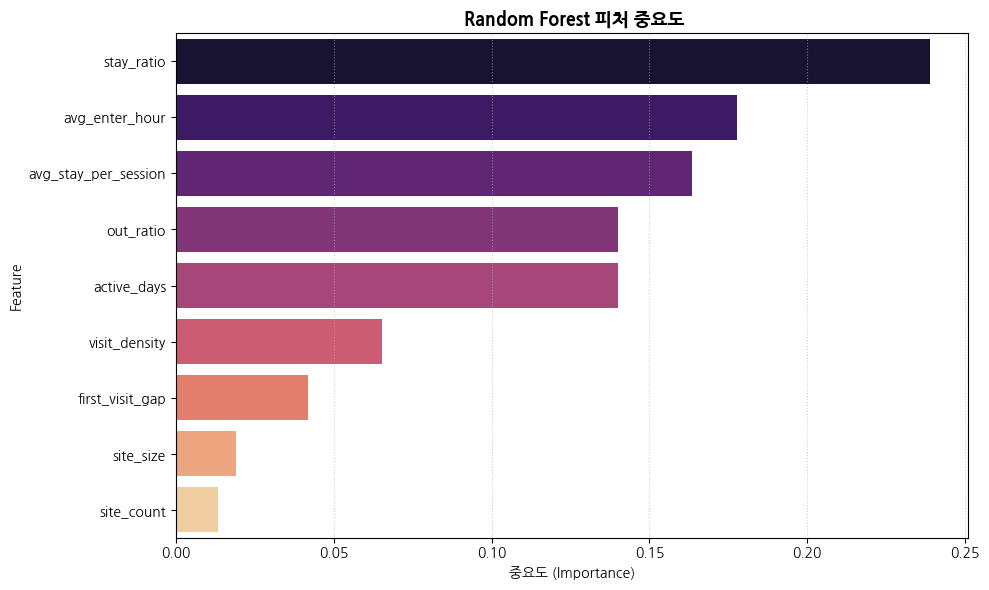

In [ ]:
import koreanize_matplotlib
print('▶ [Step 3] Random Forest 모델 학습 및 평가')

rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=5,
    class_weight='balanced_subsample',
    random_state=42,
    n_jobs=-1
)
rf_model.fit(X_train, y_train)

y_pred_rf  = rf_model.predict(X_test)
y_prob_rf  = rf_model.predict_proba(X_test)[:, 1]

print('\n' + '='*50)
print('Random Forest 평가 리포트')
print('='*50)
print(f'▶ AUROC (종합 예측 성능): {roc_auc_score(y_test, y_prob_rf):.4f}')
print('\n▶ 상세 분류 평가지표 (Classification Report):')
print(classification_report(y_test, y_pred_rf))
print('='*50)
print('\n▶ 오차 행렬 (Confusion Matrix):')
print(confusion_matrix(y_test, y_pred_rf))

# 피처 중요도
fi_rf = pd.DataFrame({
    'Feature': feature_cols,
    'Importance': rf_model.feature_importances_
}).sort_values('Importance', ascending=False).reset_index(drop=True)

print('\n Random Forest 피처 중요도:')
display(fi_rf)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=fi_rf, palette='magma')
plt.title(' Random Forest 피처 중요도', fontsize=13, fontweight='bold')
plt.xlabel('중요도 (Importance)')
plt.grid(axis='x', linestyle=':', alpha=0.6)
plt.tight_layout()
plt.show()

▶ [Step 4] LightGBM 모델 학습 및 평가
  - 클래스 비율 (0:1) = 4777:2922  →  scale_pos_weight = 1.63

⚡ LightGBM 평가 리포트
▶ AUROC (종합 예측 성능): 0.5596

▶ 상세 분류 평가지표 (Classification Report):
              precision    recall  f1-score   support

           0       0.65      0.73      0.69      1195
           1       0.44      0.35      0.39       730

    accuracy                           0.59      1925
   macro avg       0.54      0.54      0.54      1925
weighted avg       0.57      0.59      0.57      1925


▶ 오차 행렬 (Confusion Matrix):
[[876 319]
 [478 252]]

 LightGBM 피처 중요도:


,Feature,Importance
0,stay_ratio,888
1,avg_stay_per_session,719
2,out_ratio,630
3,avg_enter_hour,479
4,active_days,258
5,visit_density,178
6,first_visit_gap,164
7,site_size,53
8,site_count,28


C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\4143173246.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=fi_lgb, palette='viridis')


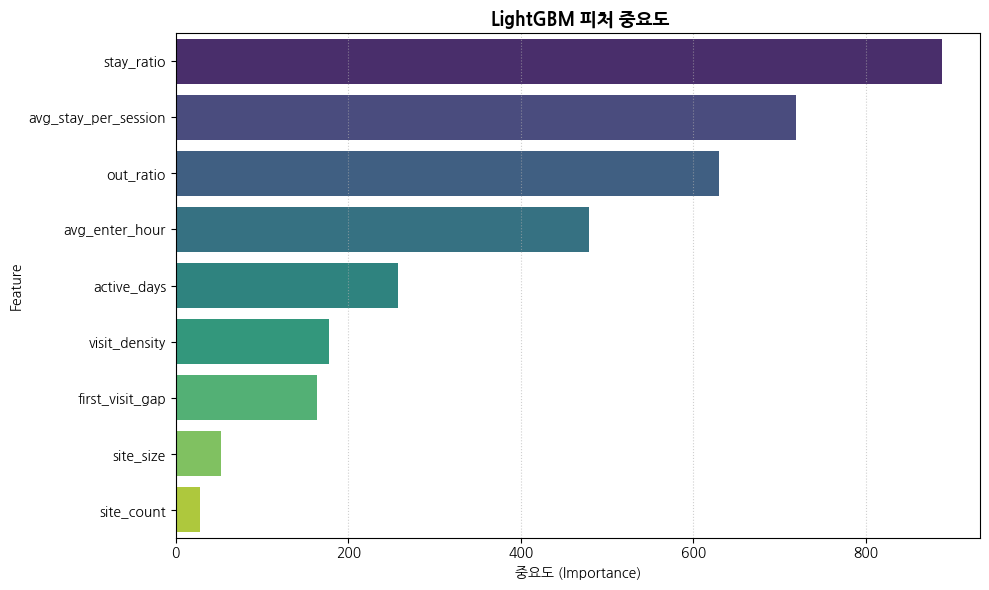

In [ ]:
print('▶ [Step 4] LightGBM 모델 학습 및 평가')

# 클래스 불균형 비율 계산
num_zeros = (y_train == 0).sum()
num_ones  = (y_train == 1).sum()
pos_weight = num_zeros / num_ones
print(f'  - 클래스 비율 (0:1) = {num_zeros}:{num_ones}  →  scale_pos_weight = {pos_weight:.2f}')

lgb_params = {
    'objective': 'binary',
    'metric': 'auc',
    'boosting_type': 'gbdt',
    'n_estimators': 300,
    'learning_rate': 0.02,
    'max_depth': 4,
    'num_leaves': 15,
    'scale_pos_weight': pos_weight,
    'random_state': 42,
    'verbose': -1,
    'n_jobs': -1
}

lgb_model = lgb.LGBMClassifier(**lgb_params)
lgb_model.fit(X_train, y_train)

y_pred_lgb = lgb_model.predict(X_test)
y_prob_lgb = lgb_model.predict_proba(X_test)[:, 1]

print('\n' + '='*50)
print('⚡ LightGBM 평가 리포트')
print('='*50)
print(f'▶ AUROC (종합 예측 성능): {roc_auc_score(y_test, y_prob_lgb):.4f}')
print('\n▶ 상세 분류 평가지표 (Classification Report):')
print(classification_report(y_test, y_pred_lgb))
print('='*50)
print('\n▶ 오차 행렬 (Confusion Matrix):')
print(confusion_matrix(y_test, y_pred_lgb))

# 피처 중요도
fi_lgb = pd.DataFrame({
    'Feature': feature_cols,
    'Importance': lgb_model.feature_importances_
}).sort_values('Importance', ascending=False).reset_index(drop=True)

print('\n LightGBM 피처 중요도:')
display(fi_lgb)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=fi_lgb, palette='viridis')
plt.title(' LightGBM 피처 중요도', fontsize=13, fontweight='bold')
plt.xlabel('중요도 (Importance)')
plt.grid(axis='x', linestyle=':', alpha=0.6)
plt.tight_layout()
plt.show()

In [ ]:
print('▶ [Step 5] 모델 성능 비교 요약')

from sklearn.metrics import f1_score, precision_score, recall_score

summary = pd.DataFrame({
    'Model': ['Random Forest', 'LightGBM'],
    'AUROC':     [round(roc_auc_score(y_test, y_prob_rf), 4),
                  round(roc_auc_score(y_test, y_prob_lgb), 4)],
    'Precision(1)': [round(precision_score(y_test, y_pred_rf), 4),
                     round(precision_score(y_test, y_pred_lgb), 4)],
    'Recall(1)':    [round(recall_score(y_test, y_pred_rf), 4),
                     round(recall_score(y_test, y_pred_lgb), 4)],
    'F1(1)':        [round(f1_score(y_test, y_pred_rf), 4),
                     round(f1_score(y_test, y_pred_lgb), 4)],
})

print('\n' + '='*50)
print('📊 모델 성능 비교 요약')
print('='*50)
display(summary)

▶ [Step 5] 모델 성능 비교 요약

📊 모델 성능 비교 요약


,Model,AUROC,Precision(1),Recall(1),F1(1)
0,Random Forest,0.5622,0.4436,0.3397,0.3848
1,LightGBM,0.5596,0.4413,0.3452,0.3874


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================================
# 피처 확정 (7개)
# ==========================================
feature_cols = [
    'active_days',
    'first_visit_gap',
    'out_ratio',
    'avg_enter_hour',
    'avg_stay_per_session',
    'stay_ratio',
    'site_count',
]

df_ml = df.copy()
X = df_ml[feature_cols].fillna(df_ml[feature_cols].median())
y = df_ml['is_payment']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f'▶ 피처: {feature_cols}')
print(f'▶ 학습: {len(X_train):,}명 / 테스트: {len(X_test):,}명')

# ==========================================
# 1. 로지스틱 회귀
# ==========================================
print('\n' + '='*50)
print('📋 [1] 로지스틱 회귀')
print('='*50)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

lr_model = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
lr_model.fit(X_train_scaled, y_train)

y_prob_lr = lr_model.predict_proba(X_test_scaled)[:, 1]
y_pred_lr = (y_prob_lr >= 0.5).astype(int)

print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_lr):.4f}')
print(classification_report(y_test, y_pred_lr))
print('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred_lr))

coef_df = pd.DataFrame({
    'Feature'    : feature_cols,
    'Coefficient': lr_model.coef_[0],
    'Odds_Ratio' : np.exp(lr_model.coef_[0])
}).sort_values('Coefficient', ascending=False).reset_index(drop=True)
print('\n📊 계수 & 오즈비:')
display(coef_df)

# ==========================================
# 2. Random Forest
# ==========================================
print('\n' + '='*50)
print('🌲 [2] Random Forest')
print('='*50)

rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=5,
    class_weight='balanced_subsample',
    random_state=42,
    n_jobs=-1
)
rf_model.fit(X_train, y_train)

y_prob_rf = rf_model.predict_proba(X_test)[:, 1]
y_pred_rf = (y_prob_rf >= 0.5).astype(int)

print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_rf):.4f}')
print(classification_report(y_test, y_pred_rf))
print('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred_rf))

fi_rf = pd.DataFrame({
    'Feature'   : feature_cols,
    'Importance': rf_model.feature_importances_
}).sort_values('Importance', ascending=False).reset_index(drop=True)
print('\n📊 피처 중요도:')
display(fi_rf)

# ==========================================
# 3. LightGBM
# ==========================================
print('\n' + '='*50)
print('⚡ [3] LightGBM')
print('='*50)

pos_weight = (y_train == 0).sum() / (y_train == 1).sum()

lgb_model = lgb.LGBMClassifier(
    objective='binary',
    metric='auc',
    n_estimators=300,
    learning_rate=0.02,
    max_depth=4,
    num_leaves=15,
    scale_pos_weight=pos_weight,
    random_state=42,
    verbose=-1,
    n_jobs=-1
)
lgb_model.fit(X_train, y_train)

y_prob_lgb = lgb_model.predict_proba(X_test)[:, 1]
y_pred_lgb = (y_prob_lgb >= 0.5).astype(int)

print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_lgb):.4f}')
print(classification_report(y_test, y_pred_lgb))
print('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred_lgb))

fi_lgb = pd.DataFrame({
    'Feature'   : feature_cols,
    'Importance': lgb_model.feature_importances_
}).sort_values('Importance', ascending=False).reset_index(drop=True)
print('\n📊 피처 중요도:')
display(fi_lgb)

# ==========================================
# 4. 모델 성능 비교
# ==========================================
from sklearn.metrics import f1_score, precision_score, recall_score

summary = pd.DataFrame({
    'Model'       : ['Logistic Regression', 'Random Forest', 'LightGBM'],
    'AUROC'       : [round(roc_auc_score(y_test, y_prob_lr), 4),
                     round(roc_auc_score(y_test, y_prob_rf), 4),
                     round(roc_auc_score(y_test, y_prob_lgb), 4)],
    'Precision(1)': [round(precision_score(y_test, y_pred_lr), 4),
                     round(precision_score(y_test, y_pred_rf), 4),
                     round(precision_score(y_test, y_pred_lgb), 4)],
    'Recall(1)'   : [round(recall_score(y_test, y_pred_lr), 4),
                     round(recall_score(y_test, y_pred_rf), 4),
                     round(recall_score(y_test, y_pred_lgb), 4)],
    'F1(1)'       : [round(f1_score(y_test, y_pred_lr), 4),
                     round(f1_score(y_test, y_pred_rf), 4),
                     round(f1_score(y_test, y_pred_lgb), 4)],
})

print('\n' + '='*50)
print('📊 최종 모델 성능 비교')
print('='*50)
display(summary)

▶ 피처: ['active_days', 'first_visit_gap', 'out_ratio', 'avg_enter_hour', 'avg_stay_per_session', 'stay_ratio', 'site_count']
▶ 학습: 7,699명 / 테스트: 1,925명

📋 [1] 로지스틱 회귀
▶ AUROC: 0.5459
              precision    recall  f1-score   support

           0       0.65      0.68      0.66      1195
           1       0.43      0.39      0.41       730

    accuracy                           0.57      1925
   macro avg       0.54      0.54      0.54      1925
weighted avg       0.56      0.57      0.57      1925

Confusion Matrix:
[[814 381]
 [445 285]]

📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,active_days,0.265518,1.304106
1,first_visit_gap,0.154400,1.166958
2,out_ratio,0.128231,1.136816
3,avg_enter_hour,0.101423,1.106745
4,avg_stay_per_session,0.051845,1.053212
5,site_count,-0.180758,0.834637
6,stay_ratio,-0.247125,0.781043



🌲 [2] Random Forest
▶ AUROC: 0.5617
              precision    recall  f1-score   support

           0       0.65      0.73      0.69      1195
           1       0.44      0.35      0.39       730

    accuracy                           0.58      1925
   macro avg       0.54      0.54      0.54      1925
weighted avg       0.57      0.58      0.57      1925

Confusion Matrix:
[[872 323]
 [477 253]]

📊 피처 중요도:


,Feature,Importance
0,stay_ratio,0.253049
1,avg_enter_hour,0.183811
2,avg_stay_per_session,0.175460
3,out_ratio,0.160009
4,active_days,0.159007
5,first_visit_gap,0.049202
6,site_count,0.019463



⚡ [3] LightGBM
▶ AUROC: 0.5545
              precision    recall  f1-score   support

           0       0.65      0.74      0.69      1195
           1       0.44      0.34      0.39       730

    accuracy                           0.59      1925
   macro avg       0.55      0.54      0.54      1925
weighted avg       0.57      0.59      0.57      1925

Confusion Matrix:
[[882 313]
 [481 249]]

📊 피처 중요도:


,Feature,Importance
0,stay_ratio,904
1,avg_stay_per_session,785
2,out_ratio,764
3,avg_enter_hour,521
4,active_days,263
5,first_visit_gap,170
6,site_count,28



📊 최종 모델 성능 비교


,Model,AUROC,Precision(1),Recall(1),F1(1)
0,Logistic Regression,0.5459,0.4279,0.3904,0.4083
1,Random Forest,0.5617,0.4392,0.3466,0.3874
2,LightGBM,0.5545,0.4431,0.3411,0.3854


📋 로지스틱 회귀 (파생변수 추가)
▶ AUROC: 0.5451
              precision    recall  f1-score   support

           0       0.65      0.69      0.67      1195
           1       0.43      0.38      0.40       730

    accuracy                           0.57      1925
   macro avg       0.54      0.54      0.54      1925
weighted avg       0.56      0.57      0.57      1925


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,active_days,0.365429,1.441132
1,out_ratio,0.168495,1.183522
2,first_visit_gap_ratio,0.151052,1.163057
3,avg_stay_per_session,0.140654,1.151027
4,access_per_day,0.126436,1.134777
5,avg_enter_hour,0.104877,1.110574
6,site_count,-0.100867,0.904053
7,day_count,-0.103733,0.901466
8,stay_ratio,-0.372087,0.689294


C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\864664047.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Coefficient', y='Feature', data=coef_df, palette=colors)
C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\864664047.py:62: UserWarning: Glyph 128203 (\N{CLIPBOARD}) missing from font(s) NanumGothic.
  plt.tight_layout()
c:\Users\jinuk\AppData\Local\anaconda3\envs\eda_study\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128203 (\N{CLIPBOARD}) missing from font(s) NanumGothic.
  fig.canvas.print_figure(bytes_io, **kw)


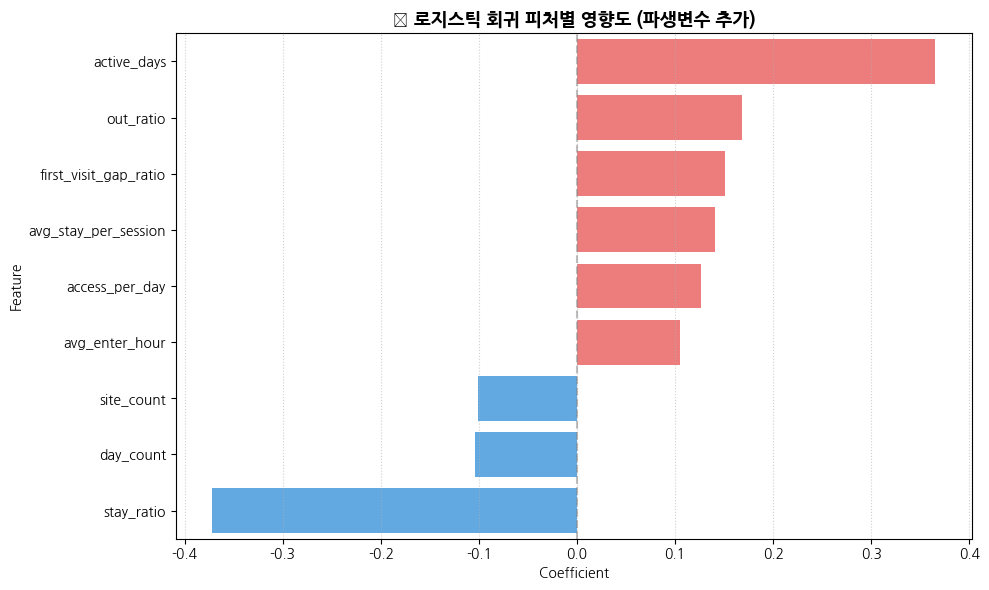

In [ ]:
# ==========================================
# 추가 파생변수 생성
# ==========================================
df['access_per_day']       = df['total_access'] / df['active_days']
df['is_early_user']        = (df['avg_enter_hour'] < 9).astype(int)
df['is_business_hour']     = (df['avg_enter_hour'].between(9, 18)).astype(int)
df['first_visit_gap_ratio'] = df['first_visit_gap'] / df['active_days']

# ==========================================
# 피처 (기존 7개 + 신규 4개)
# ==========================================
feature_cols = [
    'day_count',            # 추가!
    'active_days',
    'out_ratio',
    'avg_stay_per_session',
    'first_visit_gap_ratio',
    'access_per_day',
    'avg_enter_hour',
    'stay_ratio',
    'site_count',
]

X = df[feature_cols].fillna(df[feature_cols].median())
y = df['is_payment']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

lr_model = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
lr_model.fit(X_train_scaled, y_train)

y_prob_lr = lr_model.predict_proba(X_test_scaled)[:, 1]
y_pred_lr = (y_prob_lr >= 0.5).astype(int)

print('='*50)
print('📋 로지스틱 회귀 (파생변수 추가)')
print('='*50)
print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_lr):.4f}')
print(classification_report(y_test, y_pred_lr))

coef_df = pd.DataFrame({
    'Feature'    : feature_cols,
    'Coefficient': lr_model.coef_[0],
    'Odds_Ratio' : np.exp(lr_model.coef_[0])
}).sort_values('Coefficient', ascending=False).reset_index(drop=True)

print('\n📊 계수 & 오즈비:')
display(coef_df)

plt.figure(figsize=(10, 6))
colors = ['#ff6b6b' if c > 0 else '#4dabf7' for c in coef_df['Coefficient']]
sns.barplot(x='Coefficient', y='Feature', data=coef_df, palette=colors)
plt.title('📋 로지스틱 회귀 피처별 영향도 (파생변수 추가)', fontsize=13, fontweight='bold')
plt.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
plt.grid(axis='x', linestyle=':', alpha=0.6)
plt.tight_layout()
plt.show()

🌲 Random Forest (day_count 추가)
▶ AUROC: 0.5562
              precision    recall  f1-score   support

           0       0.64      0.75      0.69      1195
           1       0.44      0.32      0.37       730

    accuracy                           0.59      1925
   macro avg       0.54      0.54      0.53      1925
weighted avg       0.57      0.59      0.57      1925

Confusion Matrix:
[[895 300]
 [494 236]]

📊 피처 중요도:


,Feature,Importance
0,stay_ratio,0.236713
1,avg_enter_hour,0.167207
2,avg_stay_per_session,0.150855
3,out_ratio,0.138584
4,day_count,0.082517
5,active_days,0.081847
6,first_visit_gap_ratio,0.070626
7,access_per_day,0.060442
8,site_count,0.011209


C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\2929222492.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=fi_rf, palette='magma')
C:\Users\jinuk\AppData\Local\Temp\ipykernel_15624\2929222492.py:53: UserWarning: Glyph 127794 (\N{EVERGREEN TREE}) missing from font(s) NanumGothic.
  plt.tight_layout()
c:\Users\jinuk\AppData\Local\anaconda3\envs\eda_study\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127794 (\N{EVERGREEN TREE}) missing from font(s) NanumGothic.
  fig.canvas.print_figure(bytes_io, **kw)


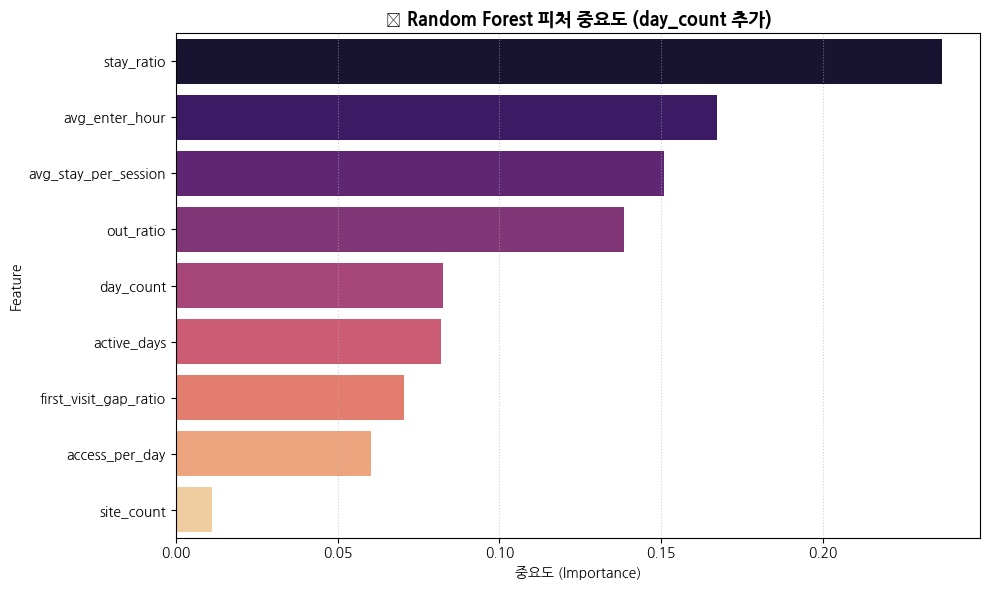

In [ ]:
feature_cols = [
    'day_count',
    'active_days',
    'out_ratio',
    'avg_stay_per_session',
    'first_visit_gap_ratio',
    'access_per_day',
    'avg_enter_hour',
    'stay_ratio',
    'site_count',
]

X = df[feature_cols].fillna(df[feature_cols].median())
y = df['is_payment']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=5,
    class_weight='balanced_subsample',
    random_state=42,
    n_jobs=-1
)
rf_model.fit(X_train, y_train)

y_prob_rf = rf_model.predict_proba(X_test)[:, 1]
y_pred_rf = (y_prob_rf >= 0.5).astype(int)

print('='*50)
print('🌲 Random Forest (day_count 추가)')
print('='*50)
print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_rf):.4f}')
print(classification_report(y_test, y_pred_rf))
print('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred_rf))

fi_rf = pd.DataFrame({
    'Feature'   : feature_cols,
    'Importance': rf_model.feature_importances_
}).sort_values('Importance', ascending=False).reset_index(drop=True)

print('\n📊 피처 중요도:')
display(fi_rf)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=fi_rf, palette='magma')
plt.title('🌲 Random Forest 피처 중요도 (day_count 추가)', fontsize=13, fontweight='bold')
plt.xlabel('중요도 (Importance)')
plt.grid(axis='x', linestyle=':', alpha=0.6)
plt.tight_layout()
plt.show()

In [ ]:
print(df[['total_stay', 'out_time', 'stay_time']].describe())

        total_stay     out_time    stay_time
count  9624.000000  9624.000000  9624.000000
mean    285.333022    44.396924   240.936097
std     378.680075   105.598778   310.514900
min       0.000000     0.000000     0.000000
25%       0.000000     0.000000     0.000000
50%     130.000000     0.000000   120.000000
75%     446.000000    38.000000   380.000000
max    2610.000000  1805.000000  2149.000000


In [ ]:
# active_days랑 비율 한번 찍어보기
print(df[['day_count', 'active_days', 'stay_ratio', 'out_ratio', 'total_stay', 'out_time']].describe())

         day_count  active_days   stay_ratio    out_ratio   total_stay  \
count  9624.000000  5983.000000  5983.000000  5983.000000  9624.000000   
mean      0.917602     1.503426     0.201876     0.030029   285.333022   
std       0.863045     0.655415     0.132579     0.048744   378.680075   
min       0.000000     1.000000     0.000000     0.000000     0.000000   
25%       0.000000     1.000000     0.097917     0.001389     0.000000   
50%       1.000000     1.000000     0.181250     0.008333   130.000000   
75%       2.000000     2.000000     0.286806     0.041667   446.000000   
max       4.000000     4.000000     0.999306     0.483333  2610.000000   

          out_time  
count  9624.000000  
mean     44.396924  
std     105.598778  
min       0.000000  
25%       0.000000  
50%       0.000000  
75%      38.000000  
max    1805.000000  


In [ ]:
# 방문한 유저만 필터링 (day_count >= 1)
df_filtered = df[df['day_count'] >= 1].copy()
print(f'필터링 후: {len(df_filtered):,}명')
print(df_filtered[['day_count', 'active_days', 'stay_ratio', 'out_ratio']].describe())

필터링 후: 5,983명
         day_count  active_days   stay_ratio    out_ratio
count  5983.000000  5983.000000  5983.000000  5983.000000
mean      1.476015     1.503426     0.201876     0.030029
std       0.611424     0.655415     0.132579     0.048744
min       1.000000     1.000000     0.000000     0.000000
25%       1.000000     1.000000     0.097917     0.001389
50%       1.000000     1.000000     0.181250     0.008333
75%       2.000000     2.000000     0.286806     0.041667
max       4.000000     4.000000     0.999306     0.483333


In [ ]:
feature_cols = [
    'day_count',        # 방문일수
    'out_ratio',        # 외출_비율
    'stay_ratio',       # 체류_비율
    'first_visit_gap',  # 등록_첫방문일수
    'site_count',       # 이용지점수
]

X = df_filtered[feature_cols].fillna(df_filtered[feature_cols].median())
y = df_filtered['is_payment']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=5,
    class_weight='balanced_subsample',
    random_state=42,
    n_jobs=-1
)
rf_model.fit(X_train, y_train)

y_prob_rf = rf_model.predict_proba(X_test)[:, 1]
y_pred_rf = (y_prob_rf >= 0.5).astype(int)

print('='*50)
print('🌲 Random Forest (방문자 필터링 + day_count)')
print('='*50)
print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_rf):.4f}')
print(classification_report(y_test, y_pred_rf))

fi_rf = pd.DataFrame({
    'Feature'   : feature_cols,
    'Importance': rf_model.feature_importances_
}).sort_values('Importance', ascending=False).reset_index(drop=True)
display(fi_rf)

🌲 Random Forest (방문자 필터링 + day_count)
▶ AUROC: 0.5742
              precision    recall  f1-score   support

           0       0.66      0.55      0.60       732
           1       0.43      0.55      0.48       465

    accuracy                           0.55      1197
   macro avg       0.55      0.55      0.54      1197
weighted avg       0.57      0.55      0.55      1197



,Feature,Importance
0,stay_ratio,0.476336
1,out_ratio,0.259260
2,day_count,0.174151
3,first_visit_gap,0.070040
4,site_count,0.020213


In [ ]:
feature_cols = [
    'day_count',
    'out_ratio',
    'stay_ratio',
    'first_visit_gap',
]

X = df_filtered[feature_cols].fillna(df_filtered[feature_cols].median())
y = df_filtered['is_payment']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# RF
rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=5,
    class_weight='balanced_subsample',
    random_state=42,
    n_jobs=-1
)
rf_model.fit(X_train, y_train)
y_prob_rf  = rf_model.predict_proba(X_test)[:, 1]
y_pred_rf  = (y_prob_rf >= 0.5).astype(int)

print('='*50)
print('🌲 Random Forest (4개 피처)')
print('='*50)
print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_rf):.4f}')
print(classification_report(y_test, y_pred_rf))

# LightGBM
pos_weight = (y_train == 0).sum() / (y_train == 1).sum()
lgb_model = lgb.LGBMClassifier(
    objective='binary',
    metric='auc',
    n_estimators=300,
    learning_rate=0.02,
    max_depth=4,
    num_leaves=15,
    scale_pos_weight=pos_weight,
    random_state=42,
    verbose=-1,
    n_jobs=-1
)
lgb_model.fit(X_train, y_train)
y_prob_lgb = lgb_model.predict_proba(X_test)[:, 1]
y_pred_lgb = (y_prob_lgb >= 0.5).astype(int)

print('='*50)
print('⚡ LightGBM (4개 피처)')
print('='*50)
print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_lgb):.4f}')
print(classification_report(y_test, y_pred_lgb))

🌲 Random Forest (4개 피처)
▶ AUROC: 0.5729
              precision    recall  f1-score   support

           0       0.66      0.55      0.60       732
           1       0.44      0.55      0.49       465

    accuracy                           0.55      1197
   macro avg       0.55      0.55      0.54      1197
weighted avg       0.57      0.55      0.55      1197

⚡ LightGBM (4개 피처)
▶ AUROC: 0.5715
              precision    recall  f1-score   support

           0       0.65      0.55      0.60       732
           1       0.43      0.55      0.48       465

    accuracy                           0.55      1197
   macro avg       0.54      0.55      0.54      1197
weighted avg       0.57      0.55      0.55      1197



In [ ]:
!pip install optuna

'pip'��(��) ���� �Ǵ� �ܺ� ����, ������ �� �ִ� ���α׷�, �Ǵ�
��ġ ������ �ƴմϴ�.


In [ ]:
import optuna
from optuna.samplers import TPESampler
optuna.logging.set_verbosity(optuna.logging.WARNING)

# ==========================================
# RF 튜닝
# ==========================================
def rf_objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
        'class_weight': 'balanced_subsample',
        'random_state': 42,
        'n_jobs': -1
    }
    model = RandomForestClassifier(**params)
    model.fit(X_train, y_train)
    return roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])

study_rf = optuna.create_study(direction='maximize', sampler=TPESampler(seed=42))
study_rf.optimize(rf_objective, n_trials=50)

print('='*50)
print('🌲 RF 최적 파라미터')
print('='*50)
print(study_rf.best_params)
print(f'▶ Best AUROC: {study_rf.best_value:.4f}')

# 최적 파라미터로 재학습
rf_best = RandomForestClassifier(**study_rf.best_params, class_weight='balanced_subsample', random_state=42, n_jobs=-1)
rf_best.fit(X_train, y_train)
y_prob_rf_best = rf_best.predict_proba(X_test)[:, 1]
y_pred_rf_best = (y_prob_rf_best >= 0.5).astype(int)

print('\n▶ 상세 분류 평가지표:')
print(classification_report(y_test, y_pred_rf_best))

# ==========================================
# LightGBM 튜닝
# ==========================================
def lgb_objective(trial):
    params = {
        'objective': 'binary',
        'metric': 'auc',
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 8),
        'num_leaves': trial.suggest_int('num_leaves', 8, 64),
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 100),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'scale_pos_weight': pos_weight,
        'random_state': 42,
        'verbose': -1,
        'n_jobs': -1
    }
    model = lgb.LGBMClassifier(**params)
    model.fit(X_train, y_train)
    return roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])

study_lgb = optuna.create_study(direction='maximize', sampler=TPESampler(seed=42))
study_lgb.optimize(lgb_objective, n_trials=50)

print('='*50)
print('⚡ LightGBM 최적 파라미터')
print('='*50)
print(study_lgb.best_params)
print(f'▶ Best AUROC: {study_lgb.best_value:.4f}')

# 최적 파라미터로 재학습
lgb_best = lgb.LGBMClassifier(**study_lgb.best_params, scale_pos_weight=pos_weight, random_state=42, verbose=-1, n_jobs=-1)
lgb_best.fit(X_train, y_train)
y_prob_lgb_best = lgb_best.predict_proba(X_test)[:, 1]
y_pred_lgb_best = (y_prob_lgb_best >= 0.5).astype(int)

print('\n▶ 상세 분류 평가지표:')
print(classification_report(y_test, y_pred_lgb_best))

# ==========================================
# 튜닝 전후 비교
# ==========================================
from sklearn.metrics import f1_score, precision_score, recall_score

summary = pd.DataFrame({
    'Model': ['RF (튜닝 전)', 'RF (튜닝 후)', 'LightGBM (튜닝 전)', 'LightGBM (튜닝 후)'],
    'AUROC': [
        round(roc_auc_score(y_test, y_prob_rf), 4),
        round(roc_auc_score(y_test, y_prob_rf_best), 4),
        round(roc_auc_score(y_test, y_prob_lgb), 4),
        round(roc_auc_score(y_test, y_prob_lgb_best), 4),
    ],
    'Recall(1)': [
        round(recall_score(y_test, y_pred_rf), 4),
        round(recall_score(y_test, y_pred_rf_best), 4),
        round(recall_score(y_test, y_pred_lgb), 4),
        round(recall_score(y_test, y_pred_lgb_best), 4),
    ],
    'F1(1)': [
        round(f1_score(y_test, y_pred_rf), 4),
        round(f1_score(y_test, y_pred_rf_best), 4),
        round(f1_score(y_test, y_pred_lgb), 4),
        round(f1_score(y_test, y_pred_lgb_best), 4),
    ],
})

print('\n' + '='*50)
print('📊 튜닝 전후 성능 비교')
print('='*50)
display(summary)

c:\Users\jinuk\AppData\Local\anaconda3\envs\eda_study\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


🌲 RF 최적 파라미터
{'n_estimators': 481, 'max_depth': 5, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': 'log2'}
▶ Best AUROC: 0.5753

▶ 상세 분류 평가지표:
              precision    recall  f1-score   support

           0       0.65      0.56      0.60       732
           1       0.43      0.54      0.48       465

    accuracy                           0.55      1197
   macro avg       0.54      0.55      0.54      1197
weighted avg       0.57      0.55      0.55      1197

⚡ LightGBM 최적 파라미터
{'n_estimators': 103, 'learning_rate': 0.02748972015204552, 'max_depth': 3, 'num_leaves': 29, 'min_child_samples': 66, 'subsample': 0.7341717867398452, 'colsample_bytree': 0.9013553963992315}
▶ Best AUROC: 0.5834

▶ 상세 분류 평가지표:
              precision    recall  f1-score   support

           0       0.66      0.55      0.60       732
           1       0.44      0.55      0.48       465

    accuracy                           0.55      1197
   macro avg       0.55      0.55      0.54      

,Model,AUROC,Recall(1),F1(1)
0,RF (튜닝 전),0.5729,0.5484,0.4857
1,RF (튜닝 후),0.5753,0.5376,0.4808
2,LightGBM (튜닝 전),0.5715,0.5462,0.4833
3,LightGBM (튜닝 후),0.5834,0.5462,0.4847


In [ ]:
pip install shap

Note: you may need to restart the kernel to use updated packages.


▶ SHAP 분석 시작...


c:\Users\jinuk\AppData\Local\anaconda3\envs\eda_study\Lib\site-packages\shap\explainers\_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


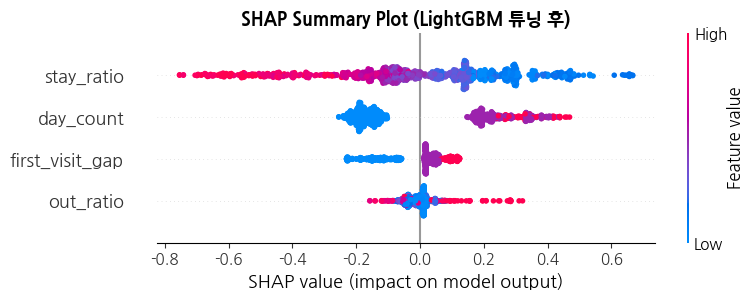

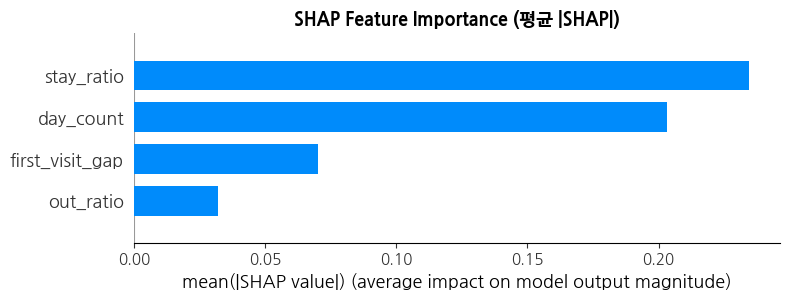

<Figure size 640x480 with 0 Axes>

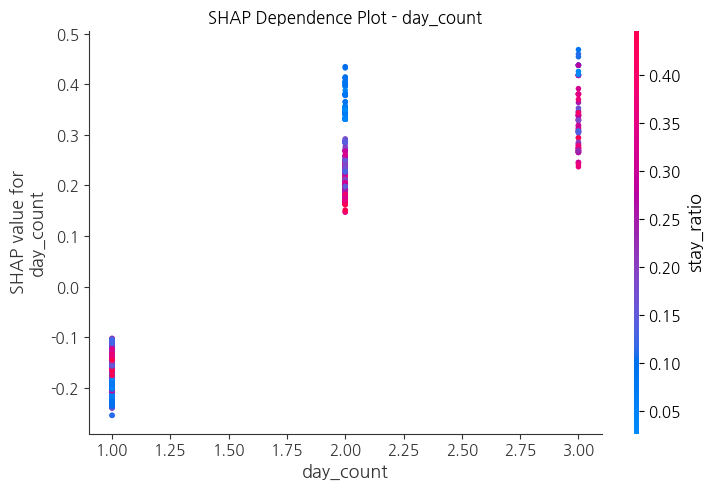

<Figure size 640x480 with 0 Axes>

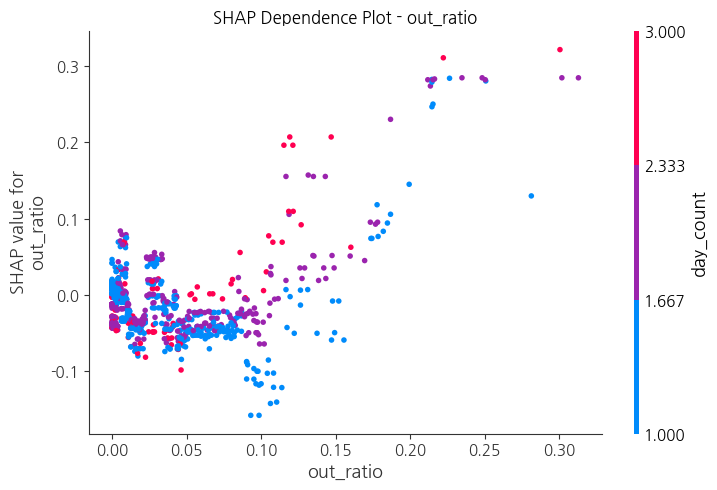

<Figure size 640x480 with 0 Axes>

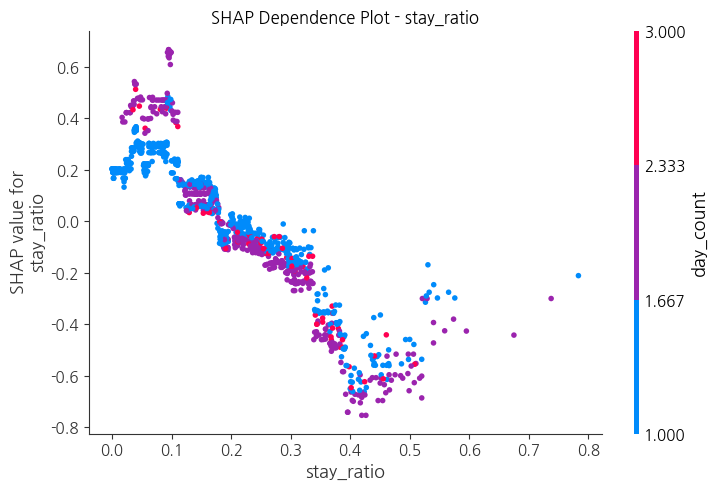

<Figure size 640x480 with 0 Axes>

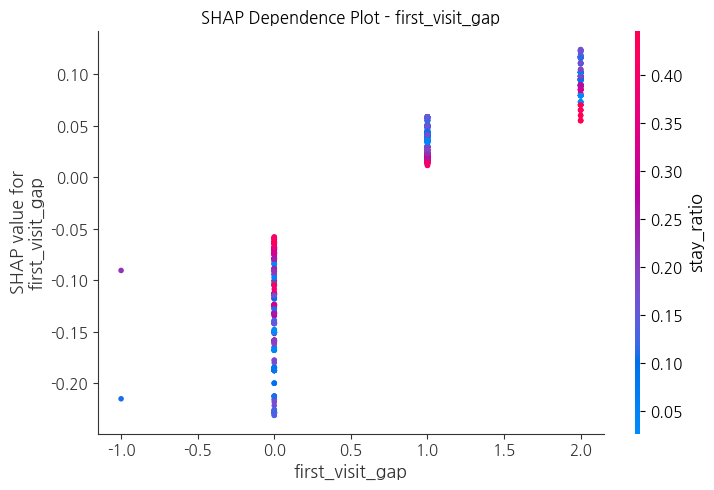

In [ ]:
import shap

print('▶ SHAP 분석 시작...')

# SHAP explainer 생성 (LightGBM 튜닝 후 모델)
explainer = shap.TreeExplainer(lgb_best)
shap_values = explainer.shap_values(X_test)

# 이진분류는 shap_values[1]이 결제(1) 클래스 기준
sv = shap_values[1] if isinstance(shap_values, list) else shap_values

# ==========================================
# 1. Summary Plot (전체 피처 영향도)
# ==========================================
plt.figure()
shap.summary_plot(sv, X_test, feature_names=feature_cols, show=False)
plt.title('SHAP Summary Plot (LightGBM 튜닝 후)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# ==========================================
# 2. Bar Plot (평균 절대값 기준 중요도)
# ==========================================
plt.figure()
shap.summary_plot(sv, X_test, feature_names=feature_cols, plot_type='bar', show=False)
plt.title('SHAP Feature Importance (평균 |SHAP|)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# ==========================================
# 3. Dependence Plot (핵심 피처별 영향 패턴)
# ==========================================
for feat in feature_cols:
    plt.figure()
    shap.dependence_plot(feat, sv, X_test, feature_names=feature_cols, show=False)
    plt.title(f'SHAP Dependence Plot - {feat}', fontsize=12)
    plt.tight_layout()
    plt.show()

In [ ]:
# 둘의 상관관계 확인
print(df_filtered[['stay_ratio', 'out_ratio']].corr())

# 합이 1에 가까운지 확인
df_filtered['ratio_sum'] = df_filtered['stay_ratio'] + df_filtered['out_ratio']
print(df_filtered['ratio_sum'].describe())

            stay_ratio  out_ratio
stay_ratio     1.00000    0.65196
out_ratio      0.65196    1.00000
count    5983.000000
mean        0.231905
std         0.168462
min         0.000000
25%         0.101678
50%         0.195139
75%         0.331944
max         1.406250
Name: ratio_sum, dtype: float64


In [ ]:
feature_cols = [
    'day_count',
    'stay_ratio',
    'first_visit_gap',
]

X = df_filtered[feature_cols].fillna(df_filtered[feature_cols].median())
y = df_filtered['is_payment']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# RF
rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=5,
    class_weight='balanced_subsample',
    random_state=42,
    n_jobs=-1
)
rf_model.fit(X_train, y_train)
y_prob_rf  = rf_model.predict_proba(X_test)[:, 1]
y_pred_rf  = (y_prob_rf >= 0.5).astype(int)

print('='*50)
print('🌲 Random Forest (3개 피처)')
print('='*50)
print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_rf):.4f}')
print(classification_report(y_test, y_pred_rf))

# LightGBM
pos_weight = (y_train == 0).sum() / (y_train == 1).sum()
lgb_model = lgb.LGBMClassifier(
    **study_lgb.best_params,
    scale_pos_weight=pos_weight,
    random_state=42,
    verbose=-1,
    n_jobs=-1
)
lgb_model.fit(X_train, y_train)
y_prob_lgb = lgb_model.predict_proba(X_test)[:, 1]
y_pred_lgb = (y_prob_lgb >= 0.5).astype(int)

print('='*50)
print('⚡ LightGBM (3개 피처)')
print('='*50)
print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_lgb):.4f}')
print(classification_report(y_test, y_pred_lgb))

🌲 Random Forest (3개 피처)
▶ AUROC: 0.5764
              precision    recall  f1-score   support

           0       0.65      0.52      0.58       732
           1       0.43      0.56      0.49       465

    accuracy                           0.54      1197
   macro avg       0.54      0.54      0.53      1197
weighted avg       0.57      0.54      0.54      1197

⚡ LightGBM (3개 피처)
▶ AUROC: 0.5781
              precision    recall  f1-score   support

           0       0.66      0.59      0.62       732
           1       0.44      0.52      0.48       465

    accuracy                           0.56      1197
   macro avg       0.55      0.55      0.55      1197
weighted avg       0.57      0.56      0.57      1197



In [ ]:
df_visit = pd.read_csv('../data/trial_visit_info.csv')
df_visit = df_visit.drop_duplicates().reset_index(drop=True)

# 날짜 변환
df_visit['date'] = pd.to_datetime(df_visit['date'], format='mixed')
df_visit['first_enter_time'] = pd.to_datetime(df_visit['first_enter_time'], format='mixed')
df_visit['last_leave_time'] = pd.to_datetime(df_visit['last_leave_time'], format='mixed')

# 하루 활동시간 = last_leave - first_enter (초 단위)
df_visit['active_second'] = (df_visit['last_leave_time'] - df_visit['first_enter_time']).dt.total_seconds()

# 외출시간 = 활동시간 - 체류시간 (초 단위)
df_visit['out_second'] = (df_visit['active_second'] - df_visit['stay_time_second']).clip(lower=0)

# 유저별 집계
df_visit_agg = df_visit.groupby('user_uuid').agg(
    total_stay_sec=('stay_time_second', 'sum'),
    total_out_sec=('out_second', 'sum'),
    total_active_sec=('active_second', 'sum'),
    day_count_raw=('date', 'nunique'),
).reset_index()

# 비율 계산
df_visit_agg['stay_ratio_raw'] = (df_visit_agg['total_stay_sec'] / df_visit_agg['total_active_sec']).clip(0, 1)
df_visit_agg['out_ratio_raw']  = (df_visit_agg['total_out_sec']  / df_visit_agg['total_active_sec']).clip(0, 1)

print(df_visit_agg[['stay_ratio_raw', 'out_ratio_raw']].describe())
print('\n상관관계:')
print(df_visit_agg[['stay_ratio_raw', 'out_ratio_raw']].corr())

       stay_ratio_raw  out_ratio_raw
count     6534.000000    6207.000000
mean         0.892212       0.113538
std          0.157760       0.160064
min          0.054866       0.000000
25%          0.855707       0.008442
50%          0.957073       0.049186
75%          0.996536       0.151838
max          1.000000       0.945134

상관관계:
                stay_ratio_raw  out_ratio_raw
stay_ratio_raw        1.000000      -0.999547
out_ratio_raw        -0.999547       1.000000


In [ ]:
# user_df에 조인
df_new = user_df.copy()
df_new = pd.merge(df_new, df_visit_agg[['user_uuid', 'stay_ratio_raw', 'out_ratio_raw', 'day_count_raw']], 
                  on='user_uuid', how='left')

# 방문자 필터링
df_new = df_new[df_new['day_count_raw'] >= 1].copy()

# first_visit_gap_ratio 파생
df_new['first_visit'] = pd.to_datetime(df_new['first_visit'], errors='coerce')
df_new['last_visit']  = pd.to_datetime(df_new['last_visit'],  errors='coerce')
df_new['active_days'] = (df_new['last_visit'] - df_new['first_visit']).dt.days + 1
df_new['first_visit_gap_ratio'] = df_new['first_visit_gap'] / df_new['active_days']

print(f'필터링 후: {len(df_new):,}명')
print(df_new[['stay_ratio_raw', 'out_ratio_raw', 'day_count_raw']].describe())

# 피처 확정
feature_cols = [
    'day_count_raw',
    'stay_ratio_raw',
    'first_visit_gap',
    'site_count',
]

X = df_new[feature_cols].fillna(df_new[feature_cols].median())
y = df_new['is_payment']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# RF
rf_model = RandomForestClassifier(
    n_estimators=300,
    max_depth=5,
    class_weight='balanced_subsample',
    random_state=42,
    n_jobs=-1
)
rf_model.fit(X_train, y_train)
y_prob_rf  = rf_model.predict_proba(X_test)[:, 1]
y_pred_rf  = (y_prob_rf >= 0.5).astype(int)

print('='*50)
print('🌲 Random Forest (원본 비율 기준)')
print('='*50)
print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_rf):.4f}')
print(classification_report(y_test, y_pred_rf))

# LightGBM
pos_weight = (y_train == 0).sum() / (y_train == 1).sum()
lgb_model = lgb.LGBMClassifier(
    **study_lgb.best_params,
    scale_pos_weight=pos_weight,
    random_state=42,
    verbose=-1,
    n_jobs=-1
)
lgb_model.fit(X_train, y_train)
y_prob_lgb = lgb_model.predict_proba(X_test)[:, 1]
y_pred_lgb = (y_prob_lgb >= 0.5).astype(int)

print('='*50)
print('⚡ LightGBM (원본 비율 기준)')
print('='*50)
print(f'▶ AUROC: {roc_auc_score(y_test, y_prob_lgb):.4f}')
print(classification_report(y_test, y_pred_lgb))

필터링 후: 6,534명
       stay_ratio_raw  out_ratio_raw  day_count_raw
count     6534.000000    6207.000000    6534.000000
mean         0.892212       0.113538       1.731711
std          0.157760       0.160064       0.819430
min          0.054866       0.000000       1.000000
25%          0.855707       0.008442       1.000000
50%          0.957073       0.049186       2.000000
75%          0.996536       0.151838       2.000000
max          1.000000       0.945134       4.000000
🌲 Random Forest (원본 비율 기준)
▶ AUROC: 0.5916
              precision    recall  f1-score   support

           0       0.67      0.59      0.62       794
           1       0.46      0.55      0.50       513

    accuracy                           0.57      1307
   macro avg       0.56      0.57      0.56      1307
weighted avg       0.59      0.57      0.58      1307

⚡ LightGBM (원본 비율 기준)
▶ AUROC: 0.6002
              precision    recall  f1-score   support

           0       0.67      0.60      0.63       794
 

In [ ]:
print(user_df.groupby('main_site')['is_payment'].agg(['count', 'sum', 'mean']))


           count   sum      mean
main_site                       
0.0         3641  1327  0.364460
1.0          747   306  0.409639
2.0          993   362  0.364552
3.0         1228   513  0.417752
4.0          457   184  0.402626
5.0          553   253  0.457505
6.0         1170   416  0.355556
17.0         415   146  0.351807
47.0         291    93  0.319588
49.0         129    52  0.403101



📍 우수지점 (방문多+전환高) (n=1228, 결제율=0.418)
▶ AUROC: 0.5923
              precision    recall  f1-score   support

           0       0.65      0.54      0.59       715
           1       0.48      0.59      0.53       513

    accuracy                           0.56      1228
   macro avg       0.56      0.57      0.56      1228
weighted avg       0.58      0.56      0.56      1228


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count,0.315198,1.370531
1,first_visit_gap,0.162640,1.176613
2,out_ratio,0.065723,1.067931
3,stay_ratio,-0.313043,0.731219



📍 전환개선필요 (방문多+전환低) (n=2163, 결제율=0.360)
▶ AUROC: 0.6148
              precision    recall  f1-score   support

           0       0.71      0.55      0.62      1385
           1       0.43      0.61      0.50       778

    accuracy                           0.57      2163
   macro avg       0.57      0.58      0.56      2163
weighted avg       0.61      0.57      0.58      2163


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count,0.274201,1.315479
1,out_ratio,0.204203,1.226547
2,first_visit_gap,0.201757,1.223551
3,stay_ratio,-0.380852,0.683279



📍 유입개선필요 (방문少+전환高) (n=682, 결제율=0.447)
▶ AUROC: 0.6034
              precision    recall  f1-score   support

           0       0.63      0.53      0.58       377
           1       0.52      0.62      0.57       305

    accuracy                           0.57       682
   macro avg       0.58      0.58      0.57       682
weighted avg       0.58      0.57      0.57       682


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count,0.261633,1.299049
1,first_visit_gap,0.179913,1.197113
2,out_ratio,0.041115,1.041972
3,stay_ratio,-0.348152,0.705992



📍 원인점검필요 (방문少+전환低) (n=706, 결제율=0.339)
▶ AUROC: 0.5808
              precision    recall  f1-score   support

           0       0.70      0.52      0.60       467
           1       0.38      0.57      0.45       239

    accuracy                           0.54       706
   macro avg       0.54      0.54      0.53       706
weighted avg       0.59      0.54      0.55       706


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count,0.261524,1.298908
1,first_visit_gap,0.146564,1.157849
2,out_ratio,0.019314,1.019502
3,stay_ratio,-0.167775,0.845544



📍 개별확인 (방문少+전환中) (n=1204, 결제율=0.407)
▶ AUROC: 0.5935
              precision    recall  f1-score   support

           0       0.64      0.53      0.58       714
           1       0.46      0.57      0.51       490

    accuracy                           0.55      1204
   macro avg       0.55      0.55      0.54      1204
weighted avg       0.57      0.55      0.55      1204


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count,0.283802,1.328170
1,first_visit_gap,0.104032,1.109636
2,out_ratio,0.040663,1.041501
3,stay_ratio,-0.276049,0.758775


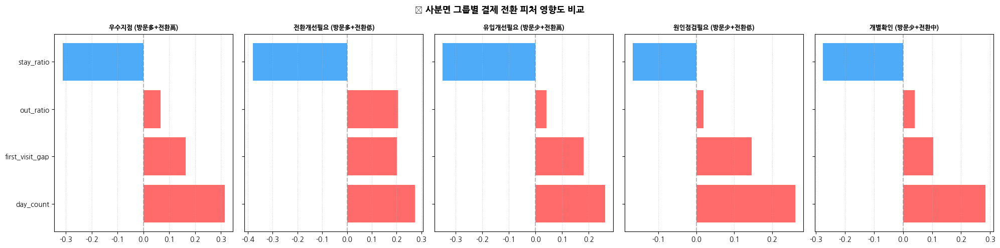

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, roc_auc_score
import warnings
warnings.filterwarnings('ignore')

# 사분면별 그룹 정의
site_groups = {
    '우수지점 (방문多+전환高)': [3],
    '전환개선필요 (방문多+전환低)': [2, 6],
    '유입개선필요 (방문少+전환高)': [5, 49],
    '원인점검필요 (방문少+전환低)': [17, 47],
    '개별확인 (방문少+전환中)': [1, 4],
}

feature_cols = ['day_count', 'stay_ratio', 'out_ratio', 'first_visit_gap']

# stay_ratio, out_ratio 생성 (없으면)
df_ml = user_df.copy()
df_ml['first_visit'] = pd.to_datetime(df_ml['first_visit'], errors='coerce')
df_ml['last_visit']  = pd.to_datetime(df_ml['last_visit'],  errors='coerce')
df_ml['active_days'] = (df_ml['last_visit'] - df_ml['first_visit']).dt.days + 1
df_ml['active_days_min'] = df_ml['active_days'] * 24 * 60
df_ml['stay_ratio'] = (df_ml['total_stay'] / df_ml['active_days_min']).clip(0, 1)
df_ml['out_ratio']  = (df_ml['out_time']   / df_ml['active_days_min']).clip(0, 1)

# site 0 제외, 방문자 필터링
df_ml = df_ml[(df_ml['main_site'] != 0) & (df_ml['day_count'] >= 1)].copy()

results = {}

for group_name, sites in site_groups.items():
    df_group = df_ml[df_ml['main_site'].isin(sites)].copy()
    
    X = df_group[feature_cols].fillna(df_group[feature_cols].median())
    y = df_group['is_payment']
    
    if len(df_group) < 50 or y.nunique() < 2:
        print(f'\n⚠️ {group_name}: 샘플 부족 ({len(df_group)}명) 스킵')
        continue
    
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    lr = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
    lr.fit(X_scaled, y)
    
    y_pred = lr.predict(X_scaled)
    y_prob = lr.predict_proba(X_scaled)[:, 1]
    
    coef_df = pd.DataFrame({
        'Feature'    : feature_cols,
        'Coefficient': lr.coef_[0],
        'Odds_Ratio' : np.exp(lr.coef_[0])
    }).sort_values('Coefficient', ascending=False).reset_index(drop=True)
    
    results[group_name] = coef_df
    
    print(f'\n{"="*50}')
    print(f'📍 {group_name} (n={len(df_group)}, 결제율={y.mean():.3f})')
    print(f'{"="*50}')
    print(f'▶ AUROC: {roc_auc_score(y, y_prob):.4f}')
    print(classification_report(y, y_pred))
    print('\n📊 계수 & 오즈비:')
    display(coef_df)

# 그룹별 계수 비교 시각화
fig, axes = plt.subplots(1, len(results), figsize=(4*len(results), 5), sharey=True)

for ax, (group_name, coef_df) in zip(axes, results.items()):
    colors = ['#ff6b6b' if c > 0 else '#4dabf7' for c in coef_df['Coefficient']]
    ax.barh(coef_df['Feature'], coef_df['Coefficient'], color=colors)
    ax.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
    ax.set_title(group_name, fontsize=9, fontweight='bold')
    ax.grid(axis='x', linestyle=':', alpha=0.6)

plt.suptitle('📍 사분면 그룹별 결제 전환 피처 영향도 비교', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


📍 우수지점 (방문多+전환高) (n=1228, 결제율=0.418)
▶ AUROC: 0.6268
              precision    recall  f1-score   support

           0       0.65      0.57      0.61       715
           1       0.49      0.58      0.53       513

    accuracy                           0.57      1228
   macro avg       0.57      0.58      0.57      1228
weighted avg       0.59      0.57      0.58      1228


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,stay_ratio_raw,1.193417,3.298333
1,out_ratio_raw,1.094254,2.986953
2,day_count_raw,0.440080,1.552831
3,first_visit_gap,0.140144,1.150439



📍 전환개선필요 (방문多+전환低) (n=2163, 결제율=0.360)
▶ AUROC: 0.6007
              precision    recall  f1-score   support

           0       0.70      0.55      0.61      1385
           1       0.42      0.59      0.49       778

    accuracy                           0.56      2163
   macro avg       0.56      0.57      0.55      2163
weighted avg       0.60      0.56      0.57      2163


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,stay_ratio_raw,1.426480,4.164015
1,out_ratio_raw,1.409845,4.095319
2,day_count_raw,0.317648,1.373893
3,first_visit_gap,0.181422,1.198921



📍 유입개선필요 (방문少+전환高) (n=681, 결제율=0.448)
▶ AUROC: 0.6057
              precision    recall  f1-score   support

           0       0.61      0.58      0.59       376
           1       0.51      0.54      0.53       305

    accuracy                           0.56       681
   macro avg       0.56      0.56      0.56       681
weighted avg       0.57      0.56      0.56       681


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count_raw,0.368187,1.445113
1,first_visit_gap,0.162137,1.176021
2,stay_ratio_raw,0.050086,1.051362
3,out_ratio_raw,-0.050086,0.951147



📍 원인점검필요 (방문少+전환低) (n=706, 결제율=0.339)
▶ AUROC: 0.6174
              precision    recall  f1-score   support

           0       0.72      0.62      0.67       467
           1       0.42      0.54      0.47       239

    accuracy                           0.59       706
   macro avg       0.57      0.58      0.57       706
weighted avg       0.62      0.59      0.60       706


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count_raw,0.427383,1.533240
1,first_visit_gap,0.152583,1.164839
2,stay_ratio_raw,0.062899,1.064919
3,out_ratio_raw,-0.062899,0.939038



📍 개별확인 (방문少+전환中) (n=1203, 결제율=0.407)
▶ AUROC: 0.6030
              precision    recall  f1-score   support

           0       0.66      0.58      0.62       713
           1       0.48      0.56      0.52       490

    accuracy                           0.57      1203
   macro avg       0.57      0.57      0.57      1203
weighted avg       0.59      0.57      0.58      1203


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,stay_ratio_raw,0.439112,1.551330
1,day_count_raw,0.361652,1.435699
2,out_ratio_raw,0.350267,1.419447
3,first_visit_gap,0.059654,1.061469


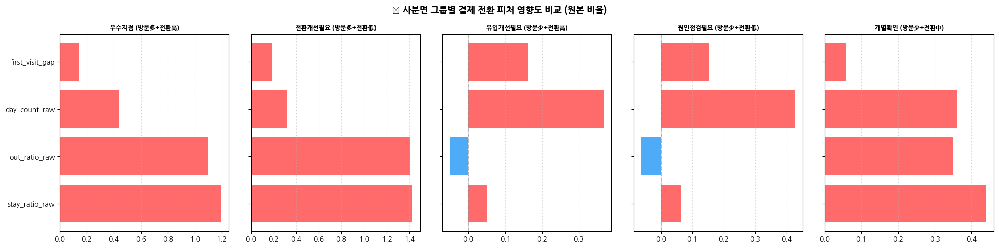

In [ ]:
# trial_visit_info 기반 피처 생성 (아까 코드 재사용)
df_visit = pd.read_csv('../data/trial_visit_info.csv')
df_visit = df_visit.drop_duplicates().reset_index(drop=True)
df_visit['date'] = pd.to_datetime(df_visit['date'], format='mixed')
df_visit['first_enter_time'] = pd.to_datetime(df_visit['first_enter_time'], format='mixed')
df_visit['last_leave_time'] = pd.to_datetime(df_visit['last_leave_time'], format='mixed')

df_visit['active_second'] = (df_visit['last_leave_time'] - df_visit['first_enter_time']).dt.total_seconds()
df_visit['out_second'] = (df_visit['active_second'] - df_visit['stay_time_second']).clip(lower=0)

df_visit_agg = df_visit.groupby('user_uuid').agg(
    total_stay_sec=('stay_time_second', 'sum'),
    total_out_sec=('out_second', 'sum'),
    total_active_sec=('active_second', 'sum'),
    day_count_raw=('date', 'nunique'),
).reset_index()

df_visit_agg['stay_ratio_raw'] = (df_visit_agg['total_stay_sec'] / df_visit_agg['total_active_sec']).clip(0, 1)
df_visit_agg['out_ratio_raw']  = (df_visit_agg['total_out_sec']  / df_visit_agg['total_active_sec']).clip(0, 1)

# user_df에 조인
df_ml = user_df.copy()
df_ml = pd.merge(df_ml, df_visit_agg[['user_uuid', 'stay_ratio_raw', 'out_ratio_raw', 'day_count_raw']], 
                 on='user_uuid', how='left')

# site 0 제외, 방문자 필터링
df_ml = df_ml[(df_ml['main_site'] != 0) & (df_ml['day_count_raw'] >= 1)].copy()

feature_cols = ['day_count_raw', 'stay_ratio_raw', 'out_ratio_raw', 'first_visit_gap']

site_groups = {
    '우수지점 (방문多+전환高)': [3],
    '전환개선필요 (방문多+전환低)': [2, 6],
    '유입개선필요 (방문少+전환高)': [5, 49],
    '원인점검필요 (방문少+전환低)': [17, 47],
    '개별확인 (방문少+전환中)': [1, 4],
}

results = {}

for group_name, sites in site_groups.items():
    df_group = df_ml[df_ml['main_site'].isin(sites)].copy()
    
    X = df_group[feature_cols].fillna(df_group[feature_cols].median())
    y = df_group['is_payment']
    
    if len(df_group) < 50 or y.nunique() < 2:
        print(f'\n⚠️ {group_name}: 샘플 부족 ({len(df_group)}명) 스킵')
        continue
    
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    lr = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
    lr.fit(X_scaled, y)
    
    y_pred = lr.predict(X_scaled)
    y_prob = lr.predict_proba(X_scaled)[:, 1]
    
    coef_df = pd.DataFrame({
        'Feature'    : feature_cols,
        'Coefficient': lr.coef_[0],
        'Odds_Ratio' : np.exp(lr.coef_[0])
    }).sort_values('Coefficient', ascending=False).reset_index(drop=True)
    
    results[group_name] = coef_df
    
    print(f'\n{"="*50}')
    print(f'📍 {group_name} (n={len(df_group)}, 결제율={y.mean():.3f})')
    print(f'{"="*50}')
    print(f'▶ AUROC: {roc_auc_score(y, y_prob):.4f}')
    print(classification_report(y, y_pred))
    print('\n📊 계수 & 오즈비:')
    display(coef_df)

# 시각화
fig, axes = plt.subplots(1, len(results), figsize=(4*len(results), 5), sharey=True)

for ax, (group_name, coef_df) in zip(axes, results.items()):
    colors = ['#ff6b6b' if c > 0 else '#4dabf7' for c in coef_df['Coefficient']]
    ax.barh(coef_df['Feature'], coef_df['Coefficient'], color=colors)
    ax.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
    ax.set_title(group_name, fontsize=9, fontweight='bold')
    ax.grid(axis='x', linestyle=':', alpha=0.6)

plt.suptitle('📍 사분면 그룹별 결제 전환 피처 영향도 비교 (원본 비율)', 
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


🌲 우수지점 (방문多+전환高) (n=1228, 결제율=0.418)
▶ AUROC: 0.7328
              precision    recall  f1-score   support

           0       0.69      0.69      0.69       715
           1       0.57      0.58      0.57       513

    accuracy                           0.64      1228
   macro avg       0.63      0.63      0.63      1228
weighted avg       0.64      0.64      0.64      1228


📊 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.338170
1,out_ratio_raw,0.304611
2,day_count_raw,0.280374
3,first_visit_gap,0.076846



🌲 전환개선필요 (방문多+전환低) (n=2163, 결제율=0.360)
▶ AUROC: 0.6970
              precision    recall  f1-score   support

           0       0.71      0.86      0.78      1385
           1       0.60      0.36      0.45       778

    accuracy                           0.68      2163
   macro avg       0.65      0.61      0.61      2163
weighted avg       0.67      0.68      0.66      2163


📊 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.317888
1,day_count_raw,0.305788
2,out_ratio_raw,0.269909
3,first_visit_gap,0.106416



🌲 유입개선필요 (방문少+전환高) (n=681, 결제율=0.448)
▶ AUROC: 0.7808
              precision    recall  f1-score   support

           0       0.74      0.69      0.72       376
           1       0.65      0.70      0.68       305

    accuracy                           0.70       681
   macro avg       0.70      0.70      0.70       681
weighted avg       0.70      0.70      0.70       681


📊 피처 중요도:


,Feature,Importance
0,out_ratio_raw,0.366382
1,stay_ratio_raw,0.364569
2,day_count_raw,0.187535
3,first_visit_gap,0.081513



🌲 원인점검필요 (방문少+전환低) (n=706, 결제율=0.339)
▶ AUROC: 0.7969
              precision    recall  f1-score   support

           0       0.81      0.73      0.77       467
           1       0.56      0.67      0.61       239

    accuracy                           0.71       706
   macro avg       0.69      0.70      0.69       706
weighted avg       0.73      0.71      0.72       706


📊 피처 중요도:


,Feature,Importance
0,out_ratio_raw,0.381233
1,stay_ratio_raw,0.370773
2,day_count_raw,0.185877
3,first_visit_gap,0.062117



🌲 개별확인 (방문少+전환中) (n=1203, 결제율=0.407)
▶ AUROC: 0.7387
              precision    recall  f1-score   support

           0       0.71      0.75      0.73       713
           1       0.60      0.55      0.58       490

    accuracy                           0.67      1203
   macro avg       0.66      0.65      0.65      1203
weighted avg       0.67      0.67      0.67      1203


📊 피처 중요도:


,Feature,Importance
0,out_ratio_raw,0.347634
1,stay_ratio_raw,0.341694
2,day_count_raw,0.237198
3,first_visit_gap,0.073475


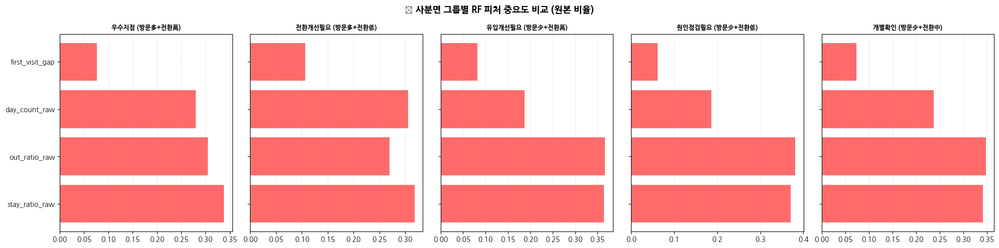

In [ ]:
from sklearn.ensemble import RandomForestClassifier

results_rf = {}

for group_name, sites in site_groups.items():
    df_group = df_ml[df_ml['main_site'].isin(sites)].copy()
    
    X = df_group[feature_cols].fillna(df_group[feature_cols].median())
    y = df_group['is_payment']
    
    if len(df_group) < 50 or y.nunique() < 2:
        print(f'\n⚠️ {group_name}: 샘플 부족 ({len(df_group)}명) 스킵')
        continue
    
    rf = RandomForestClassifier(
        n_estimators=300,
        max_depth=5,
        class_weight='balanced_subsample',
        random_state=42,
        n_jobs=-1
    )
    rf.fit(X, y)
    
    y_pred = rf.predict(X)
    y_prob = rf.predict_proba(X)[:, 1]
    
    fi_df = pd.DataFrame({
        'Feature'   : feature_cols,
        'Importance': rf.feature_importances_
    }).sort_values('Importance', ascending=False).reset_index(drop=True)
    
    results_rf[group_name] = fi_df
    
    print(f'\n{"="*50}')
    print(f'🌲 {group_name} (n={len(df_group)}, 결제율={y.mean():.3f})')
    print(f'{"="*50}')
    print(f'▶ AUROC: {roc_auc_score(y, y_prob):.4f}')
    print(classification_report(y, y_pred))
    print('\n📊 피처 중요도:')
    display(fi_df)

# 시각화
fig, axes = plt.subplots(1, len(results_rf), figsize=(4*len(results_rf), 5), sharey=True)

for ax, (group_name, fi_df) in zip(axes, results_rf.items()):
    ax.barh(fi_df['Feature'], fi_df['Importance'], color='#ff6b6b')
    ax.set_title(group_name, fontsize=9, fontweight='bold')
    ax.grid(axis='x', linestyle=':', alpha=0.6)

plt.suptitle('🌲 사분면 그룹별 RF 피처 중요도 비교 (원본 비율)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


🌲 우수지점 (방문多+전환高) (n=1228, 결제율=0.418)
  학습: 982명 / 테스트: 246명
▶ AUROC: 0.6217
              precision    recall  f1-score   support

           0       0.67      0.59      0.62       143
           1       0.51      0.59      0.55       103

    accuracy                           0.59       246
   macro avg       0.59      0.59      0.59       246
weighted avg       0.60      0.59      0.59       246


📊 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.340586
1,out_ratio_raw,0.327721
2,day_count_raw,0.255398
3,first_visit_gap,0.076294



🌲 전환개선필요 (방문多+전환低) (n=2163, 결제율=0.360)
  학습: 1730명 / 테스트: 433명
▶ AUROC: 0.6002
              precision    recall  f1-score   support

           0       0.68      0.78      0.73       277
           1       0.46      0.33      0.39       156

    accuracy                           0.62       433
   macro avg       0.57      0.56      0.56       433
weighted avg       0.60      0.62      0.60       433


📊 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.307694
1,day_count_raw,0.291631
2,out_ratio_raw,0.277955
3,first_visit_gap,0.122720



🌲 유입개선필요 (방문少+전환高) (n=681, 결제율=0.448)
  학습: 544명 / 테스트: 137명
▶ AUROC: 0.4843
              precision    recall  f1-score   support

           0       0.54      0.50      0.52        76
           1       0.43      0.48      0.45        61

    accuracy                           0.49       137
   macro avg       0.49      0.49      0.49       137
weighted avg       0.49      0.49      0.49       137


📊 피처 중요도:


,Feature,Importance
0,out_ratio_raw,0.357876
1,stay_ratio_raw,0.348832
2,day_count_raw,0.210619
3,first_visit_gap,0.082673



🌲 원인점검필요 (방문少+전환低) (n=706, 결제율=0.339)
  학습: 564명 / 테스트: 142명
▶ AUROC: 0.4813
              precision    recall  f1-score   support

           0       0.63      0.59      0.61        94
           1       0.29      0.33      0.31        48

    accuracy                           0.50       142
   macro avg       0.46      0.46      0.46       142
weighted avg       0.52      0.50      0.51       142


📊 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.358218
1,out_ratio_raw,0.345636
2,day_count_raw,0.218128
3,first_visit_gap,0.078018



🌲 개별확인 (방문少+전환中) (n=1203, 결제율=0.407)
  학습: 962명 / 테스트: 241명
▶ AUROC: 0.6201
              precision    recall  f1-score   support

           0       0.66      0.71      0.68       143
           1       0.52      0.46      0.49        98

    accuracy                           0.61       241
   macro avg       0.59      0.58      0.58       241
weighted avg       0.60      0.61      0.60       241


📊 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.363158
1,out_ratio_raw,0.349319
2,day_count_raw,0.207549
3,first_visit_gap,0.079974


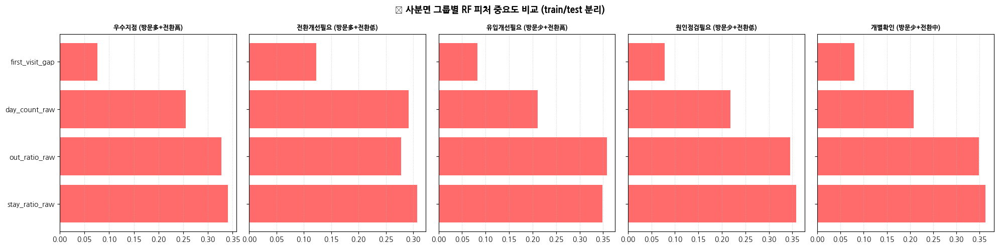

In [ ]:
results_rf = {}

for group_name, sites in site_groups.items():
    df_group = df_ml[df_ml['main_site'].isin(sites)].copy()
    
    X = df_group[feature_cols].fillna(df_group[feature_cols].median())
    y = df_group['is_payment']
    
    if len(df_group) < 50 or y.nunique() < 2:
        print(f'\n⚠️ {group_name}: 샘플 부족 ({len(df_group)}명) 스킵')
        continue
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    
    rf = RandomForestClassifier(
        n_estimators=300,
        max_depth=5,
        class_weight='balanced_subsample',
        random_state=42,
        n_jobs=-1
    )
    rf.fit(X_train, y_train)
    
    y_pred = rf.predict(X_test)
    y_prob = rf.predict_proba(X_test)[:, 1]
    
    fi_df = pd.DataFrame({
        'Feature'   : feature_cols,
        'Importance': rf.feature_importances_
    }).sort_values('Importance', ascending=False).reset_index(drop=True)
    
    results_rf[group_name] = fi_df
    
    print(f'\n{"="*50}')
    print(f'🌲 {group_name} (n={len(df_group)}, 결제율={y.mean():.3f})')
    print(f'  학습: {len(X_train)}명 / 테스트: {len(X_test)}명')
    print(f'{"="*50}')
    print(f'▶ AUROC: {roc_auc_score(y_test, y_prob):.4f}')
    print(classification_report(y_test, y_pred))
    print('\n📊 피처 중요도:')
    display(fi_df)

# 시각화
fig, axes = plt.subplots(1, len(results_rf), figsize=(4*len(results_rf), 5), sharey=True)

for ax, (group_name, fi_df) in zip(axes, results_rf.items()):
    ax.barh(fi_df['Feature'], fi_df['Importance'], color='#ff6b6b')
    ax.set_title(group_name, fontsize=9, fontweight='bold')
    ax.grid(axis='x', linestyle=':', alpha=0.6)

plt.suptitle('🌲 사분면 그룹별 RF 피처 중요도 비교 (train/test 분리)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


📍 site 1 (방문多+전환中) (n=747, 결제율=0.410)
  학습: 597명 / 테스트: 150명
[LR] AUROC: 0.5592
              precision    recall  f1-score   support

           0       0.63      0.54      0.58        89
           1       0.45      0.54      0.49        61

    accuracy                           0.54       150
   macro avg       0.54      0.54      0.54       150
weighted avg       0.56      0.54      0.54       150


📊 LR 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,stay_ratio_raw,0.469870,1.599787
1,day_count_raw,0.400805,1.493026
2,out_ratio_raw,0.367096,1.443537
3,first_visit_gap,-0.020558,0.979652



[RF] AUROC: 0.5638
              precision    recall  f1-score   support

           0       0.59      0.60      0.59        89
           1       0.40      0.39      0.40        61

    accuracy                           0.51       150
   macro avg       0.49      0.49      0.49       150
weighted avg       0.51      0.51      0.51       150


📊 RF 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.368983
1,out_ratio_raw,0.360724
2,day_count_raw,0.204996
3,first_visit_gap,0.065297



📍 site 3 (방문多+전환高) (n=1228, 결제율=0.418)
  학습: 982명 / 테스트: 246명
[LR] AUROC: 0.5917
              precision    recall  f1-score   support

           0       0.62      0.59      0.61       143
           1       0.47      0.50      0.49       103

    accuracy                           0.56       246
   macro avg       0.55      0.55      0.55       246
weighted avg       0.56      0.56      0.56       246


📊 LR 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,stay_ratio_raw,1.044246,2.841254
1,out_ratio_raw,0.877602,2.405126
2,day_count_raw,0.455617,1.577147
3,first_visit_gap,0.158576,1.171840



[RF] AUROC: 0.6217
              precision    recall  f1-score   support

           0       0.67      0.59      0.62       143
           1       0.51      0.59      0.55       103

    accuracy                           0.59       246
   macro avg       0.59      0.59      0.59       246
weighted avg       0.60      0.59      0.59       246


📊 RF 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.340586
1,out_ratio_raw,0.327721
2,day_count_raw,0.255398
3,first_visit_gap,0.076294



📍 site 2 (방문多+전환低) (n=993, 결제율=0.365)
  학습: 794명 / 테스트: 199명
[LR] AUROC: 0.6149
              precision    recall  f1-score   support

           0       0.74      0.40      0.52       126
           1       0.42      0.75      0.54        73

    accuracy                           0.53       199
   macro avg       0.58      0.58      0.53       199
weighted avg       0.62      0.53      0.53       199


📊 LR 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,out_ratio_raw,1.215192,3.370941
1,stay_ratio_raw,1.129344,3.093627
2,day_count_raw,0.338623,1.403015
3,first_visit_gap,0.265022,1.303459



[RF] AUROC: 0.6993
              precision    recall  f1-score   support

           0       0.77      0.76      0.77       126
           1       0.60      0.62      0.61        73

    accuracy                           0.71       199
   macro avg       0.69      0.69      0.69       199
weighted avg       0.71      0.71      0.71       199


📊 RF 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.363394
1,out_ratio_raw,0.345568
2,day_count_raw,0.192865
3,first_visit_gap,0.098172



📍 site 6 (방문多+전환低) (n=1170, 결제율=0.356)
  학습: 936명 / 테스트: 234명
[LR] AUROC: 0.5932
              precision    recall  f1-score   support

           0       0.73      0.54      0.62       151
           1       0.43      0.63      0.51        83

    accuracy                           0.57       234
   macro avg       0.58      0.58      0.57       234
weighted avg       0.62      0.57      0.58       234


📊 LR 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count_raw,0.258362,1.294808
1,first_visit_gap,0.138280,1.148297
2,stay_ratio_raw,0.043421,1.044378
3,out_ratio_raw,-0.043421,0.957508



[RF] AUROC: 0.5869
              precision    recall  f1-score   support

           0       0.68      0.70      0.69       151
           1       0.43      0.41      0.42        83

    accuracy                           0.60       234
   macro avg       0.56      0.56      0.56       234
weighted avg       0.59      0.60      0.60       234


📊 RF 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.370154
1,out_ratio_raw,0.361760
2,day_count_raw,0.172668
3,first_visit_gap,0.095418


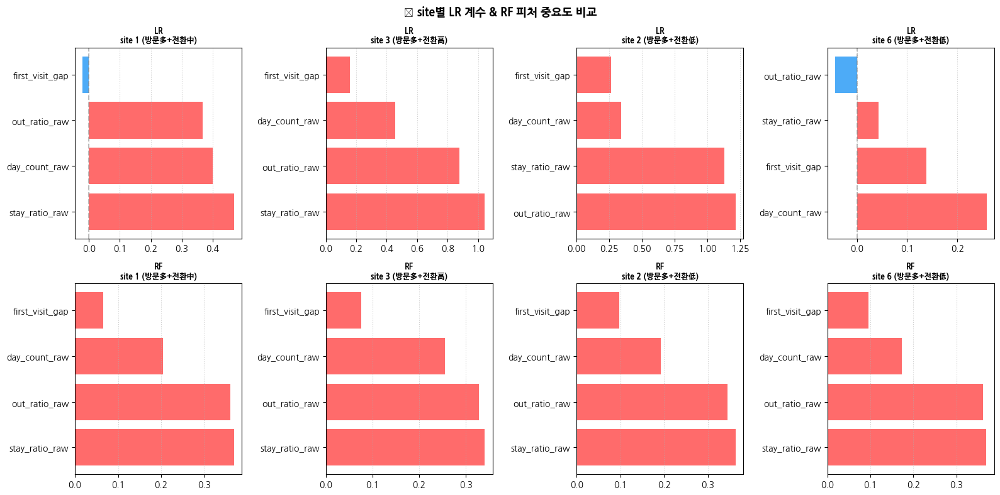

In [ ]:
site_groups_detail = {
    'site 1 (방문多+전환中)': [1],
    'site 3 (방문多+전환高)': [3],
    'site 2 (방문多+전환低)': [2],
    'site 6 (방문多+전환低)': [6],
}

results_detail = {}

for group_name, sites in site_groups_detail.items():
    df_group = df_ml[df_ml['main_site'].isin(sites)].copy()
    
    X = df_group[feature_cols].fillna(df_group[feature_cols].median())
    y = df_group['is_payment']
    
    if len(df_group) < 50 or y.nunique() < 2:
        print(f'\n⚠️ {group_name}: 샘플 부족 ({len(df_group)}명) 스킵')
        continue
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    
    # LR
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled  = scaler.transform(X_test)
    
    lr = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
    lr.fit(X_train_scaled, y_train)
    y_prob_lr = lr.predict_proba(X_test_scaled)[:, 1]
    y_pred_lr = (y_prob_lr >= 0.5).astype(int)
    
    coef_df = pd.DataFrame({
        'Feature'    : feature_cols,
        'Coefficient': lr.coef_[0],
        'Odds_Ratio' : np.exp(lr.coef_[0])
    }).sort_values('Coefficient', ascending=False).reset_index(drop=True)
    
    # RF
    rf = RandomForestClassifier(
        n_estimators=300,
        max_depth=5,
        class_weight='balanced_subsample',
        random_state=42,
        n_jobs=-1
    )
    rf.fit(X_train, y_train)
    y_prob_rf = rf.predict_proba(X_test)[:, 1]
    y_pred_rf = (y_prob_rf >= 0.5).astype(int)
    
    fi_df = pd.DataFrame({
        'Feature'   : feature_cols,
        'Importance': rf.feature_importances_
    }).sort_values('Importance', ascending=False).reset_index(drop=True)
    
    results_detail[group_name] = {'coef': coef_df, 'fi': fi_df}
    
    print(f'\n{"="*50}')
    print(f'📍 {group_name} (n={len(df_group)}, 결제율={y.mean():.3f})')
    print(f'  학습: {len(X_train)}명 / 테스트: {len(X_test)}명')
    print(f'{"="*50}')
    print(f'[LR] AUROC: {roc_auc_score(y_test, y_prob_lr):.4f}')
    print(classification_report(y_test, y_pred_lr))
    print('\n📊 LR 계수 & 오즈비:')
    display(coef_df)
    print(f'\n[RF] AUROC: {roc_auc_score(y_test, y_prob_rf):.4f}')
    print(classification_report(y_test, y_pred_rf))
    print('\n📊 RF 피처 중요도:')
    display(fi_df)

# 시각화 - LR 계수 비교
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

for col, (group_name, res) in enumerate(results_detail.items()):
    # LR
    coef_df = res['coef']
    colors = ['#ff6b6b' if c > 0 else '#4dabf7' for c in coef_df['Coefficient']]
    axes[0][col].barh(coef_df['Feature'], coef_df['Coefficient'], color=colors)
    axes[0][col].axvline(x=0, color='gray', linestyle='--', alpha=0.5)
    axes[0][col].set_title(f'LR\n{group_name}', fontsize=9, fontweight='bold')
    axes[0][col].grid(axis='x', linestyle=':', alpha=0.6)
    
    # RF
    fi_df = res['fi']
    axes[1][col].barh(fi_df['Feature'], fi_df['Importance'], color='#ff6b6b')
    axes[1][col].set_title(f'RF\n{group_name}', fontsize=9, fontweight='bold')
    axes[1][col].grid(axis='x', linestyle=':', alpha=0.6)

plt.suptitle('📍 site별 LR 계수 & RF 피처 중요도 비교', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
def entry_time_group(hour):
    if 5 <= hour < 9:
        return "Early Morning"
    elif 9 <= hour < 12:
        return "Morning"
    elif 12 <= hour < 15:
        return "Lunch"
    elif 15 <= hour < 18:
        return "Afternoon"
    elif 18 <= hour < 22:
        return "Evening"
    else:
        return "Night"

# 시간대 피처 생성
df_ml['entry_time'] = df_ml['avg_enter_hour'].apply(lambda x: entry_time_group(int(x)))

# 시간대별 결제율 확인
print("시간대별 결제율:")
print(df_ml.groupby('entry_time')['is_payment'].agg(['count', 'sum', 'mean']).round(3))

# Site별 시간대 결제율 분포
print("\nSite별 시간대 결제율:")
for site in [1, 3, 2, 6]:
    site_data = df_ml[df_ml['main_site'] == site]
    print(f"\n=== Site {site} ===")
    print(site_data.groupby('entry_time')['is_payment'].agg(['count', 'sum', 'mean']).round(3))

시간대별 결제율:
               count  sum   mean
entry_time                      
Afternoon       1255  491  0.391
Early Morning    319  109  0.342
Evening          764  389  0.509
Lunch           2149  765  0.356
Morning         1392  530  0.381
Night            102   41  0.402

Site별 시간대 결제율:

=== Site 1 ===
               count  sum   mean
entry_time                      
Afternoon        157   69  0.439
Early Morning     40    8  0.200
Evening           86   47  0.547
Lunch            281  105  0.374
Morning          179   76  0.425
Night              4    1  0.250

=== Site 3 ===
               count  sum   mean
entry_time                      
Afternoon        268  115  0.429
Early Morning     63   21  0.333
Evening          157   78  0.497
Lunch            443  178  0.402
Morning          281  113  0.402
Night             16    8  0.500

=== Site 2 ===
               count  sum   mean
entry_time                      
Afternoon        198   66  0.333
Early Morning     53   20  0.377
Ev

In [ ]:
# 원핫인코딩
entry_time_dummies = pd.get_dummies(df_ml['entry_time'], prefix='time', drop_first=True)
df_ml_onehot = pd.concat([df_ml, entry_time_dummies], axis=1)

# 피처 조합 (stay_ratio_raw 기준)
feature_cols_onehot = [
    'day_count_raw',
    'stay_ratio_raw',
    'first_visit_gap',
    'time_Early Morning',
    'time_Evening',
    'time_Lunch',
    'time_Morning',
    'time_Night',
]

# site별 LR + RF 분석 (원핫인코딩)
site_groups_detail = {
    'site 1': [1],
    'site 3': [3],
    'site 2': [2],
    'site 6': [6],
}

print("="*60)
print("📊 원핫인코딩 + stay_ratio_raw")
print("="*60)

results_onehot = {}

for group_name, sites in site_groups_detail.items():
    df_group = df_ml_onehot[df_ml_onehot['main_site'].isin(sites)].copy()
    
    X = df_group[feature_cols_onehot].fillna(df_group[feature_cols_onehot].median())
    y = df_group['is_payment']
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    
    # LR
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled  = scaler.transform(X_test)
    
    lr = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
    lr.fit(X_train_scaled, y_train)
    y_prob_lr = lr.predict_proba(X_test_scaled)[:, 1]
    y_pred_lr = (y_prob_lr >= 0.5).astype(int)
    
    # RF
    rf = RandomForestClassifier(
        n_estimators=300,
        max_depth=5,
        class_weight='balanced_subsample',
        random_state=42,
        n_jobs=-1
    )
    rf.fit(X_train, y_train)
    y_prob_rf = rf.predict_proba(X_test)[:, 1]
    y_pred_rf = (y_prob_rf >= 0.5).astype(int)
    
    results_onehot[group_name] = {
        'lr_auroc': roc_auc_score(y_test, y_prob_lr),
        'rf_auroc': roc_auc_score(y_test, y_prob_rf),
    }
    
    print(f'\n{group_name} (n={len(df_group)})')
    print(f'  LR AUROC: {roc_auc_score(y_test, y_prob_lr):.4f}')
    print(f'  RF AUROC: {roc_auc_score(y_test, y_prob_rf):.4f}')

# 비교 테이블
print("\n" + "="*60)
print("📊 비교: 기존(시간대 없음) vs 원핫(시간대 포함)")
print("="*60)

comparison = pd.DataFrame({
    'Site': list(results_onehot.keys()),
    'LR (시간대 없음)': [0.559, 0.592, 0.615, 0.593],  # 기존 값
    'LR (원핫)': [results_onehot[site]['lr_auroc'] for site in results_onehot.keys()],
    'RF (시간대 없음)': [0.564, 0.622, 0.699, 0.587],  # 기존 값
    'RF (원핫)': [results_onehot[site]['rf_auroc'] for site in results_onehot.keys()],
})
display(comparison)

📊 원핫인코딩 + stay_ratio_raw

site 1 (n=747)
  LR AUROC: 0.5732
  RF AUROC: 0.5436

site 3 (n=1228)
  LR AUROC: 0.5905
  RF AUROC: 0.6395

site 2 (n=993)
  LR AUROC: 0.6161
  RF AUROC: 0.6911

site 6 (n=1170)
  LR AUROC: 0.6174
  RF AUROC: 0.5997

📊 비교: 기존(시간대 없음) vs 원핫(시간대 포함)


,Site,LR (시간대 없음),LR (원핫),RF (시간대 없음),RF (원핫)
0,site 1,0.559,0.573218,0.564,0.543562
1,site 3,0.592,0.590536,0.622,0.639521
2,site 2,0.615,0.616058,0.699,0.691074
3,site 6,0.593,0.617410,0.587,0.599657


In [ ]:
# 원핫인코딩 다시 확인
entry_time_dummies = pd.get_dummies(df_ml['entry_time'], prefix='time', drop_first=True)

print("생성된 컬럼:")
print(entry_time_dummies.columns.tolist())

print("\n시간대 분포:")
print(df_ml['entry_time'].value_counts())

# 제대로 concat
df_ml_onehot = pd.concat([df_ml, entry_time_dummies], axis=1)

print("\n최종 컬럼:")
print(df_ml_onehot.columns.tolist())

생성된 컬럼:
['time_Early Morning', 'time_Evening', 'time_Lunch', 'time_Morning', 'time_Night']

시간대 분포:
entry_time
Lunch            2149
Morning          1392
Afternoon        1255
Evening           764
Early Morning     319
Night             102
Name: count, dtype: int64

최종 컬럼:
['user_uuid', 'reg_date', 'reg_month', 'reg_weekday', 'day_count', 'site_count', 'visit_density', 'first_visit_gap', 'first_visit', 'first_visit_weekday', 'first_visit_month', 'last_visit', 'total_stay', 'stay_time', 'out_time', 'avg_enter_hour', 'avg_leave_hour', 'total_access', 'main_site', 'site_size', 'is_payment', 'stay_ratio_raw', 'out_ratio_raw', 'day_count_raw', 'entry_time', 'time_Early Morning', 'time_Evening', 'time_Lunch', 'time_Morning', 'time_Night']



🌲 site 1 (n=747, 결제율=0.410)
  학습: 597명 / 테스트: 150명
▶ AUROC: 0.5436
              precision    recall  f1-score   support

           0       0.62      0.66      0.64        89
           1       0.45      0.41      0.43        61

    accuracy                           0.56       150
   macro avg       0.54      0.54      0.54       150
weighted avg       0.55      0.56      0.56       150


📊 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.468910
1,day_count_raw,0.251390
2,first_visit_gap,0.086308
3,time_Early Morning,0.051390
4,time_Evening,0.048546
5,time_Lunch,0.048286
6,time_Morning,0.034107
7,time_Night,0.011063



🌲 site 3 (n=1228, 결제율=0.418)
  학습: 982명 / 테스트: 246명
▶ AUROC: 0.6395
              precision    recall  f1-score   support

           0       0.69      0.64      0.66       143
           1       0.54      0.59      0.57       103

    accuracy                           0.62       246
   macro avg       0.62      0.62      0.62       246
weighted avg       0.63      0.62      0.62       246


📊 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.463133
1,day_count_raw,0.310889
2,first_visit_gap,0.108289
3,time_Evening,0.035720
4,time_Lunch,0.028881
5,time_Early Morning,0.023071
6,time_Morning,0.018572
7,time_Night,0.011445



🌲 site 2 (n=993, 결제율=0.365)
  학습: 794명 / 테스트: 199명
▶ AUROC: 0.6911
              precision    recall  f1-score   support

           0       0.77      0.72      0.75       126
           1       0.57      0.63      0.60        73

    accuracy                           0.69       199
   macro avg       0.67      0.68      0.67       199
weighted avg       0.70      0.69      0.69       199


📊 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.457916
1,day_count_raw,0.228085
2,first_visit_gap,0.118106
3,time_Evening,0.117963
4,time_Lunch,0.032622
5,time_Morning,0.019276
6,time_Early Morning,0.016641
7,time_Night,0.009392



🌲 site 6 (n=1170, 결제율=0.356)
  학습: 936명 / 테스트: 234명
▶ AUROC: 0.5997
              precision    recall  f1-score   support

           0       0.71      0.64      0.67       151
           1       0.44      0.53      0.48        83

    accuracy                           0.60       234
   macro avg       0.58      0.58      0.58       234
weighted avg       0.62      0.60      0.60       234


📊 피처 중요도:


,Feature,Importance
0,stay_ratio_raw,0.503684
1,day_count_raw,0.207322
2,first_visit_gap,0.139128
3,time_Evening,0.039006
4,time_Morning,0.036950
5,time_Lunch,0.030136
6,time_Early Morning,0.025795
7,time_Night,0.017981


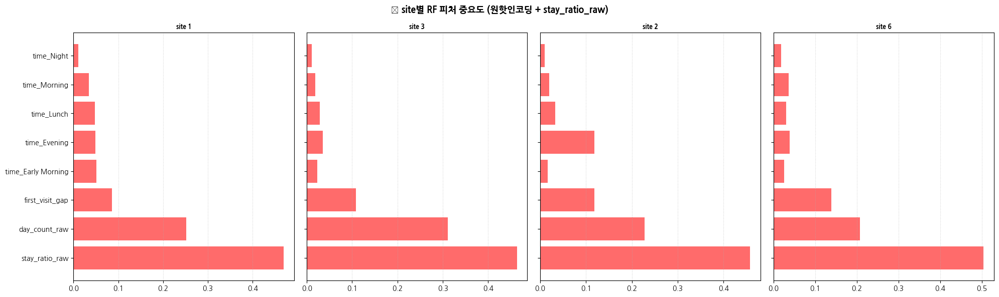

In [ ]:
results_rf_onehot = {}

site_groups_detail = {
    'site 1': [1],
    'site 3': [3],
    'site 2': [2],
    'site 6': [6],
}

for group_name, sites in site_groups_detail.items():
    df_group = df_ml_onehot[df_ml_onehot['main_site'].isin(sites)].copy()
    
    X = df_group[feature_cols_onehot].fillna(df_group[feature_cols_onehot].median())
    y = df_group['is_payment']
    
    if len(df_group) < 50 or y.nunique() < 2:
        print(f'\n⚠️ {group_name}: 샘플 부족 ({len(df_group)}명) 스킵')
        continue
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    
    rf = RandomForestClassifier(
        n_estimators=300,
        max_depth=5,
        class_weight='balanced_subsample',
        random_state=42,
        n_jobs=-1
    )
    rf.fit(X_train, y_train)
    
    y_pred = rf.predict(X_test)
    y_prob = rf.predict_proba(X_test)[:, 1]
    
    fi_df = pd.DataFrame({
        'Feature'   : feature_cols_onehot,
        'Importance': rf.feature_importances_
    }).sort_values('Importance', ascending=False).reset_index(drop=True)
    
    results_rf_onehot[group_name] = fi_df
    
    print(f'\n{"="*50}')
    print(f'🌲 {group_name} (n={len(df_group)}, 결제율={y.mean():.3f})')
    print(f'  학습: {len(X_train)}명 / 테스트: {len(X_test)}명')
    print(f'{"="*50}')
    print(f'▶ AUROC: {roc_auc_score(y_test, y_prob):.4f}')
    print(classification_report(y_test, y_pred))
    print('\n📊 피처 중요도:')
    display(fi_df)

# 시각화
fig, axes = plt.subplots(1, len(results_rf_onehot), figsize=(5*len(results_rf_onehot), 6), sharey=True)

for ax, (group_name, fi_df) in zip(axes, results_rf_onehot.items()):
    ax.barh(fi_df['Feature'], fi_df['Importance'], color='#ff6b6b')
    ax.set_title(group_name, fontsize=9, fontweight='bold')
    ax.grid(axis='x', linestyle=':', alpha=0.6)

plt.suptitle('🌲 site별 RF 피처 중요도 (원핫인코딩 + stay_ratio_raw)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


📋 site 1 (n=747, 결제율=0.410)
  학습: 597명 / 테스트: 150명
▶ AUROC: 0.5732
              precision    recall  f1-score   support

           0       0.64      0.54      0.59        89
           1       0.45      0.56      0.50        61

    accuracy                           0.55       150
   macro avg       0.55      0.55      0.54       150
weighted avg       0.56      0.55      0.55       150


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count_raw,0.416162,1.516132
1,time_Evening,0.166712,1.181414
2,stay_ratio_raw,0.069992,1.072499
3,time_Morning,-0.007931,0.992100
4,first_visit_gap,-0.043749,0.957194
5,time_Night,-0.065954,0.936174
6,time_Lunch,-0.182483,0.833199
7,time_Early Morning,-0.258244,0.772407



📋 site 3 (n=1228, 결제율=0.418)
  학습: 982명 / 테스트: 246명
▶ AUROC: 0.5905
              precision    recall  f1-score   support

           0       0.62      0.56      0.59       143
           1       0.46      0.51      0.48       103

    accuracy                           0.54       246
   macro avg       0.54      0.54      0.54       246
weighted avg       0.55      0.54      0.54       246


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count_raw,0.460699,1.585182
1,stay_ratio_raw,0.181632,1.199173
2,first_visit_gap,0.145152,1.156215
3,time_Evening,0.071151,1.073743
4,time_Night,0.017523,1.017677
5,time_Morning,-0.048878,0.952297
6,time_Early Morning,-0.061920,0.939958
7,time_Lunch,-0.090578,0.913403



📋 site 2 (n=993, 결제율=0.365)
  학습: 794명 / 테스트: 199명
▶ AUROC: 0.6161
              precision    recall  f1-score   support

           0       0.71      0.59      0.64       126
           1       0.45      0.59      0.51        73

    accuracy                           0.59       199
   macro avg       0.58      0.59      0.58       199
weighted avg       0.62      0.59      0.60       199


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count_raw,0.340909,1.406225
1,time_Evening,0.324926,1.383929
2,first_visit_gap,0.259366,1.296108
3,time_Night,0.055499,1.057068
4,time_Early Morning,0.008738,1.008777
5,time_Morning,-0.007515,0.992513
6,time_Lunch,-0.016668,0.983470
7,stay_ratio_raw,-0.093543,0.910699



📋 site 6 (n=1170, 결제율=0.356)
  학습: 936명 / 테스트: 234명
▶ AUROC: 0.6174
              precision    recall  f1-score   support

           0       0.69      0.56      0.62       151
           1       0.41      0.54      0.46        83

    accuracy                           0.56       234
   macro avg       0.55      0.55      0.54       234
weighted avg       0.59      0.56      0.56       234


📊 계수 & 오즈비:


,Feature,Coefficient,Odds_Ratio
0,day_count_raw,0.259569,1.296371
1,first_visit_gap,0.132412,1.141579
2,time_Evening,0.083180,1.086738
3,stay_ratio_raw,0.079847,1.083122
4,time_Night,0.003633,1.003639
5,time_Morning,-0.027183,0.973183
6,time_Early Morning,-0.050174,0.951064
7,time_Lunch,-0.077880,0.925075


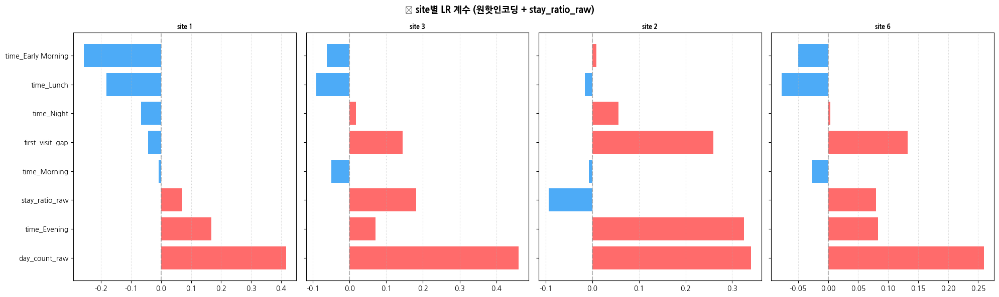

In [ ]:
results_lr_onehot = {}

site_groups_detail = {
    'site 1': [1],
    'site 3': [3],
    'site 2': [2],
    'site 6': [6],
}

for group_name, sites in site_groups_detail.items():
    df_group = df_ml_onehot[df_ml_onehot['main_site'].isin(sites)].copy()
    
    X = df_group[feature_cols_onehot].fillna(df_group[feature_cols_onehot].median())
    y = df_group['is_payment']
    
    if len(df_group) < 50 or y.nunique() < 2:
        print(f'\n⚠️ {group_name}: 샘플 부족 ({len(df_group)}명) 스킵')
        continue
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled  = scaler.transform(X_test)
    
    lr = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
    lr.fit(X_train_scaled, y_train)
    
    y_pred = lr.predict(X_test_scaled)
    y_prob = lr.predict_proba(X_test_scaled)[:, 1]
    
    coef_df = pd.DataFrame({
        'Feature'    : feature_cols_onehot,
        'Coefficient': lr.coef_[0],
        'Odds_Ratio' : np.exp(lr.coef_[0])
    }).sort_values('Coefficient', ascending=False).reset_index(drop=True)
    
    results_lr_onehot[group_name] = coef_df
    
    print(f'\n{"="*50}')
    print(f'📋 {group_name} (n={len(df_group)}, 결제율={y.mean():.3f})')
    print(f'  학습: {len(X_train)}명 / 테스트: {len(X_test)}명')
    print(f'{"="*50}')
    print(f'▶ AUROC: {roc_auc_score(y_test, y_prob):.4f}')
    print(classification_report(y_test, y_pred))
    print('\n📊 계수 & 오즈비:')
    display(coef_df)

# 시각화
fig, axes = plt.subplots(1, len(results_lr_onehot), figsize=(5*len(results_lr_onehot), 6), sharey=True)

for ax, (group_name, coef_df) in zip(axes, results_lr_onehot.items()):
    colors = ['#ff6b6b' if c > 0 else '#4dabf7' for c in coef_df['Coefficient']]
    ax.barh(coef_df['Feature'], coef_df['Coefficient'], color=colors)
    ax.axvline(x=0, color='gray', linestyle='--', alpha=0.5)
    ax.set_title(group_name, fontsize=9, fontweight='bold')
    ax.grid(axis='x', linestyle=':', alpha=0.6)

plt.suptitle('📋 site별 LR 계수 (원핫인코딩 + stay_ratio_raw)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
# 1. 시간대 분류 함수
def entry_time_group(hour):
    if 5 <= hour < 9:
        return "Early Morning"
    elif 9 <= hour < 12:
        return "Morning"
    elif 12 <= hour < 15:
        return "Lunch"
    elif 15 <= hour < 18:
        return "Afternoon"
    elif 18 <= hour < 22:
        return "Evening"
    else:
        return "Night"

# 2. 시간대 변수 생성
df_ml['entry_time'] = df_ml['avg_enter_hour'].apply(lambda x: entry_time_group(int(x)))

# 3. 원핫인코딩
entry_time_dummies = pd.get_dummies(df_ml['entry_time'], prefix='time', drop_first=True)
df_ml_onehot = pd.concat([df_ml, entry_time_dummies], axis=1)

# 4. 피처 목록
feature_cols_onehot = [
    'day_count_raw',
    'stay_ratio_raw',
    'first_visit_gap',
    'time_Early Morning',
    'time_Evening',
    'time_Lunch',
    'time_Morning',
    'time_Night',
]

# 5. 시간대별 결제율 확인
print(df_ml.groupby('entry_time')['is_payment'].agg(['count', 'sum', 'mean']))

# 6. 그 후 RF/LR 돌리기 (위 코드 사용)

               count  sum      mean
entry_time                         
Afternoon       1255  491  0.391235
Early Morning    319  109  0.341693
Evening          764  389  0.509162
Lunch           2149  765  0.355980
Morning         1392  530  0.380747
Night            102   41  0.401961


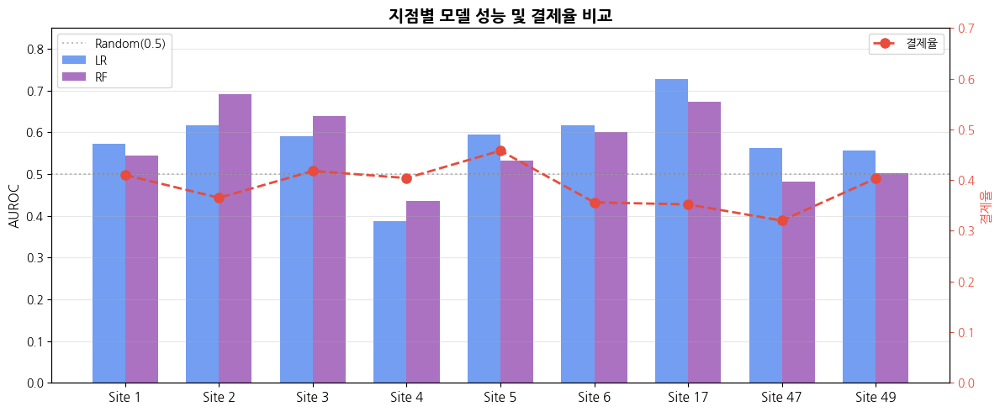

In [ ]:
fig, ax = plt.subplots(figsize=(12, 5))

sites = [1, 2, 3, 4, 5, 6, 17, 47, 49]
lr_auroc = [0.573, 0.616, 0.591, 0.388, 0.595, 0.617, 0.727, 0.563, 0.556]
rf_auroc = [0.544, 0.691, 0.640, 0.436, 0.532, 0.600, 0.673, 0.482, 0.503]
payment_rate = [0.410, 0.365, 0.418, 0.404, 0.458, 0.356, 0.352, 0.320, 0.403]

x = np.arange(len(sites))
width = 0.35

bars1 = ax.bar(x - width/2, lr_auroc, width, label='LR', color='#5B8DEF', alpha=0.85)
bars2 = ax.bar(x + width/2, rf_auroc, width, label='RF', color='#9B59B6', alpha=0.85)

# 결제율 라인
ax2 = ax.twinx()
ax2.plot(x, payment_rate, 'o--', color='#E74C3C', linewidth=2, markersize=8, label='결제율')
ax2.set_ylabel('결제율', fontsize=11, color='#E74C3C')
ax2.tick_params(axis='y', colors='#E74C3C')
ax2.set_ylim(0, 0.7)

ax.axhline(y=0.5, color='gray', linestyle=':', alpha=0.5, label='Random(0.5)')
ax.set_xticks(x)
ax.set_xticklabels([f'Site {s}' for s in sites], fontsize=11)
ax.set_ylabel('AUROC', fontsize=11)
ax.set_ylim(0, 0.85)
ax.set_title('지점별 모델 성능 및 결제율 비교', fontsize=14, fontweight='bold')
ax.legend(loc='upper left')
ax2.legend(loc='upper right')
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# coef_wide 재생성
all_coef_dfs = []

site_groups_detail = {
    'Site 1': [1], 'Site 2': [2], 'Site 3': [3],
    'Site 4': [4], 'Site 5': [5], 'Site 6': [6],
    'Site 17': [17], 'Site 47': [47], 'Site 49': [49],
}

for group_name, sites in site_groups_detail.items():
    df_group = df_ml_onehot[df_ml_onehot['main_site'].isin(sites)].copy()
    
    X = df_group[feature_cols_onehot].fillna(df_group[feature_cols_onehot].median())
    y = df_group['is_payment']
    
    if len(df_group) < 30 or y.nunique() < 2:
        continue
    
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )
    
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled  = scaler.transform(X_test)
    
    lr = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
    lr.fit(X_train_scaled, y_train)
    
    coef_df = pd.DataFrame({
        'Feature'    : feature_cols_onehot,
        'Coefficient': lr.coef_[0],
        'Group'      : group_name,
    })
    all_coef_dfs.append(coef_df)

# pivot해서 wide format으로
coef_all = pd.concat(all_coef_dfs)
coef_wide = coef_all.pivot_table(index='Feature', columns='Group', values='Coefficient')

print('✓ coef_wide 생성 완료')
print(coef_wide)

✓ coef_wide 생성 완료
Group                 Site 1   Site 17    Site 2    Site 3    Site 4  \
Feature                                                                
day_count_raw       0.416162  0.502858  0.340909  0.460699  0.442759   
first_visit_gap    -0.043749  0.121087  0.259366  0.145152  0.063065   
stay_ratio_raw      0.069992  0.108383 -0.093543  0.181632 -0.108592   
time_Early Morning -0.258244  0.072953  0.008738 -0.061920  0.123945   
time_Evening        0.166712  0.351694  0.324926  0.071151  0.051929   
time_Lunch         -0.182483  0.040829 -0.016668 -0.090578  0.269791   
time_Morning       -0.007931  0.152479 -0.007515 -0.048878  0.078666   
time_Night         -0.065954  0.058828  0.055499  0.017523  0.022992   

Group                Site 47   Site 49    Site 5    Site 6  
Feature                                                     
day_count_raw       0.347023  0.814332  0.343347  0.259569  
first_visit_gap     0.269953  0.274032  0.149941  0.132412  
stay_ratio_raw   

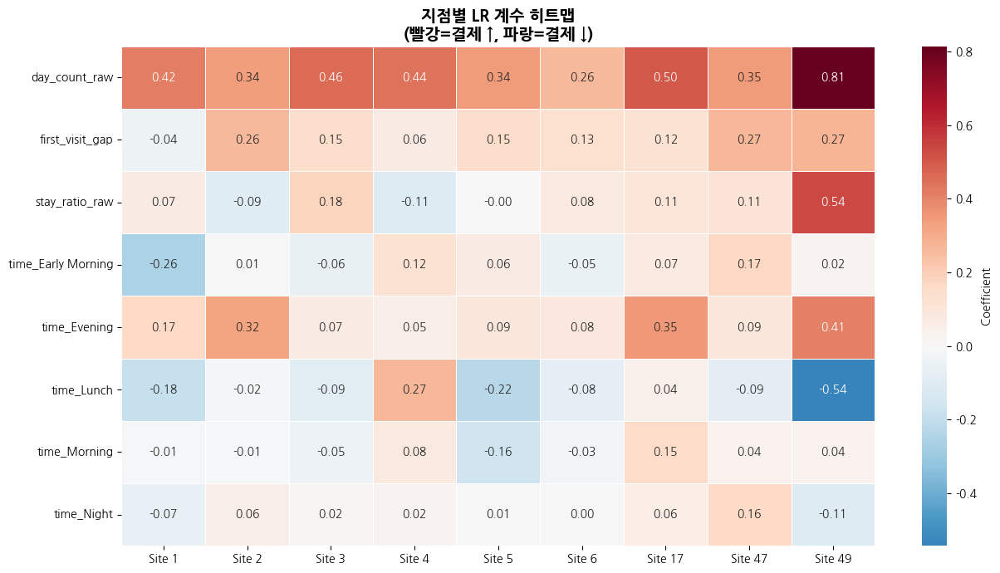

In [ ]:
# coef_wide는 이미 있는 변수 사용
fig, ax = plt.subplots(figsize=(13, 7))

# 컬럼 순서 지점번호순 정렬
col_order = ['Site 1', 'Site 2', 'Site 3', 'Site 4', 
             'Site 5', 'Site 6', 'Site 17', 'Site 47', 'Site 49']
coef_plot = coef_wide[col_order]

sns.heatmap(coef_plot, 
            cmap='RdBu_r', 
            center=0, 
            annot=True, 
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={'label': 'Coefficient'},
            ax=ax)

ax.set_title('지점별 LR 계수 히트맵\n(빨강=결제 ↑, 파랑=결제 ↓)', 
             fontsize=14, fontweight='bold')
ax.set_xlabel('')
ax.set_ylabel('')
plt.tight_layout()
plt.show()

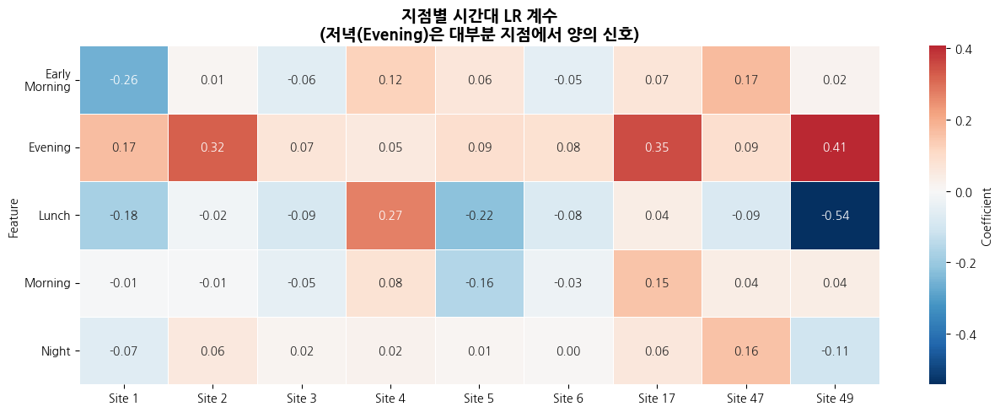

In [ ]:
# 시간대 피처만 추출
time_features = ['time_Early Morning', 'time_Evening', 
                 'time_Lunch', 'time_Morning', 'time_Night']
time_labels = ['Early\nMorning', 'Evening', 'Lunch', 'Morning', 'Night']

col_order = ['Site 1', 'Site 2', 'Site 3', 'Site 4', 
             'Site 5', 'Site 6', 'Site 17', 'Site 47', 'Site 49']
time_coef = coef_wide.loc[time_features, col_order]

fig, ax = plt.subplots(figsize=(13, 5))
sns.heatmap(time_coef,
            cmap='RdBu_r',
            center=0,
            annot=True,
            fmt='.2f',
            linewidths=0.5,
            cbar_kws={'label': 'Coefficient'},
            ax=ax)

ax.set_yticklabels(time_labels, rotation=0, fontsize=10)
ax.set_title('지점별 시간대 LR 계수\n(저녁(Evening)은 대부분 지점에서 양의 신호)', 
             fontsize=14, fontweight='bold')
ax.set_xlabel('')
plt.tight_layout()
plt.show()

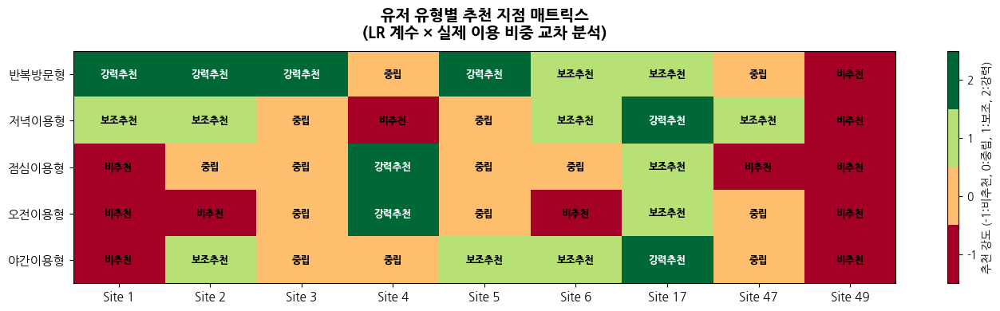

In [ ]:
recommend_matrix = {
    '반복방문형':  [2,  2,  2,  0,  2,  1,  1,  0, -1],
    '저녁이용형':  [1,  1,  0, -1,  0,  1,  2,  1, -1],
    '점심이용형':  [-1, 0,  0,  2,  0,  0,  1, -1, -1],
    '오전이용형':  [-1,-1,  0,  2,  0, -1,  1,  0, -1],
    '야간이용형':  [-1, 1,  0,  0,  1,  1,  2,  0, -1],
}

sites_label = ['Site 1','Site 2','Site 3','Site 4',
               'Site 5','Site 6','Site 17','Site 47','Site 49']
user_types  = list(recommend_matrix.keys())

matrix_arr = np.array([recommend_matrix[u] for u in user_types], dtype=float)

fig, ax = plt.subplots(figsize=(14, 4))
cmap = plt.cm.get_cmap('RdYlGn', 4)
im = ax.imshow(matrix_arr, cmap=cmap, vmin=-1.5, vmax=2.5, aspect='auto')

ax.set_xticks(range(len(sites_label)))
ax.set_xticklabels(sites_label, fontsize=11)
ax.set_yticks(range(len(user_types)))
ax.set_yticklabels(user_types, fontsize=11)

label_map = {2: '강력추천', 1: '보조추천', 0: '중립', -1: '비추천'}
for i in range(len(user_types)):
    for j in range(len(sites_label)):
        val = int(matrix_arr[i, j])
        text = label_map[val]
        color = 'white' if abs(val) == 2 else 'black'
        ax.text(j, i, text, ha='center', va='center', 
                fontsize=9, color=color, fontweight='bold')

ax.set_title('유저 유형별 추천 지점 매트릭스\n(LR 계수 × 실제 이용 비중 교차 분석)',
             fontsize=14, fontweight='bold', pad=12)
plt.colorbar(im, ax=ax, ticks=[-1, 0, 1, 2],
             label='추천 강도 (-1:비추천, 0:중립, 1:보조, 2:강력)')
plt.tight_layout()
plt.show()

# 성현님 코드

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import koreanize_matplotlib 
import seaborn as sns

## 데이터 불러오기

In [ ]:
site_area = pd.read_csv('data/site_area.csv')

In [ ]:
access_log = pd.read_csv('data/trial_access_log.csv')

In [ ]:
payment = pd.read_csv('data/trial_payment.csv')

In [ ]:
register = pd.read_csv('data/trial_register.csv')

In [ ]:
visit_info = pd.read_csv('data/trial_visit_info.csv')

## 데이터 확인 및 EDA

### site_area(지점 별 면적) 데이터 

In [ ]:
site_area

,site_id,area_pyeong
0,1,50
1,2,100
2,3,150
3,4,100
4,5,150
5,6,150
6,17,50
7,47,50
8,49,50


In [ ]:
site_area.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   site_id      9 non-null      int64
 1   area_pyeong  9 non-null      int64
dtypes: int64(2)
memory usage: 272.0 bytes


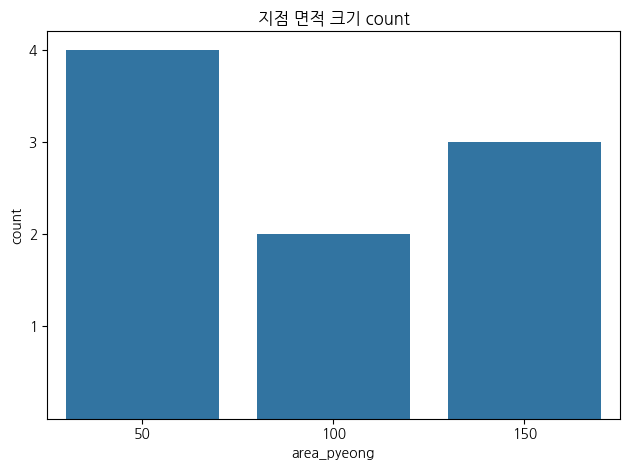

In [ ]:
site_area_count = site_area['area_pyeong'].value_counts().reset_index()

sns.barplot(data=site_area_count, x='area_pyeong', y='count')
plt.title('지점 면적 크기 count')
plt.yticks(np.arange(1,5,1))

plt.tight_layout()
plt.show()

### access_log (3일 체험 신청자 출입기록) 데이터

In [ ]:
access_log.head()

,id,checkin,cdate,site_id,user_uuid
0,1719038,1,2023-07-07 07:11:55.201673,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
1,1716702,2,2023-07-06 15:15:58.761284,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
2,1719956,2,2023-07-07 14:10:41.848998,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
3,1716588,1,2023-07-06 13:09:48.758097,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
4,1719649,1,2023-07-07 10:12:42.083352,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89


In [ ]:
access_log.shape # 63708개 행

(63708, 5)

In [ ]:
access_log.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63708 entries, 0 to 63707
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   id         63708 non-null  int64 
 1   checkin    63708 non-null  int64 
 2   cdate      63708 non-null  object
 3   site_id    63708 non-null  int64 
 4   user_uuid  63708 non-null  object
dtypes: int64(3), object(2)
memory usage: 2.4+ MB


In [ ]:
access_log.isnull().sum() # 결측치 없음

id           0
checkin      0
cdate        0
site_id      0
user_uuid    0
dtype: int64

In [ ]:
access_log.duplicated().sum() # 완전 중복 행 359개 존재

np.int64(359)

In [ ]:
access_log['user_uuid'].nunique() # 유니크한 유저 6026명

6026

In [ ]:
access_log.head()

,id,checkin,cdate,site_id,user_uuid
0,1719038,1,2023-07-07 07:11:55.201673,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
1,1716702,2,2023-07-06 15:15:58.761284,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
2,1719956,2,2023-07-07 14:10:41.848998,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
3,1716588,1,2023-07-06 13:09:48.758097,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
4,1719649,1,2023-07-07 10:12:42.083352,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89


In [ ]:
# 시간 컬럼 생성
access_log['cdate'] = pd.to_datetime(access_log['cdate'], utc=True)
access_log['cdate'] = access_log['cdate'].dt.tz_convert('Asia/Seoul').dt.tz_localize(None)
access_log['cdate'] = access_log['cdate'].dt.floor('s') # 초 단위로 내림


# access_log['year'] = access_log['cdate'].dt.year
# access_log['month'] = access_log['cdate'].dt.month
# access_log['day'] = access_log['cdate'].dt.day
# access_log['hour'] = access_log['cdate'].dt.hour 

# days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
# access_log["weekday"] = access_log["cdate"].apply(lambda x : days[x.weekday()])

In [ ]:
access_log.head()

,id,checkin,cdate,site_id,user_uuid
0,1719038,1,2023-07-07 16:11:55,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
1,1716702,2,2023-07-07 00:15:58,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
2,1719956,2,2023-07-07 23:10:41,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
3,1716588,1,2023-07-06 22:09:48,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89
4,1719649,1,2023-07-07 19:12:42,49,cacd0adb-2c87-450f-8a00-2b2ea6b8fa89


In [ ]:
access_log['checkin'].value_counts() # 입실 인원이 31966명, 퇴실 인원이 31383명 

checkin
1    32144
2    31564
Name: count, dtype: int64

In [ ]:
display(access_log['cdate'].max())
display(access_log['cdate'].min())

Timestamp('2024-01-01 23:36:13')

Timestamp('2021-05-02 18:42:13')

In [ ]:
# 정렬
access_log = access_log.sort_values(['user_uuid', 'site_id', 'cdate']).reset_index(drop=True)
access_log

,id,checkin,cdate,site_id,user_uuid
0,1860957,1,2023-09-05 11:57:01,6,000590dc-046f-462b-8225-4c81a97b7166
1,1861306,2,2023-09-05 13:24:05,6,000590dc-046f-462b-8225-4c81a97b7166
2,1861324,1,2023-09-05 13:27:46,6,000590dc-046f-462b-8225-4c81a97b7166
3,1861958,2,2023-09-05 16:14:07,6,000590dc-046f-462b-8225-4c81a97b7166
4,1861969,1,2023-09-05 16:16:13,6,000590dc-046f-462b-8225-4c81a97b7166
...,...,...,...,...,...
63703,388312,2,2022-01-13 13:24:23,6,fffbf2b3-7853-4c07-bd2a-aae686ac9013
63704,388321,1,2022-01-13 13:26:19,6,fffbf2b3-7853-4c07-bd2a-aae686ac9013
63705,388648,2,2022-01-13 15:04:23,6,fffbf2b3-7853-4c07-bd2a-aae686ac9013
63706,388657,1,2022-01-13 15:06:16,6,fffbf2b3-7853-4c07-bd2a-aae686ac9013


In [ ]:
# 완전 중복 제거 
access_log = access_log.drop_duplicates(subset=['user_uuid', 'site_id', 'cdate', 'checkin'])

In [ ]:
# 세션 생성 함수
# -------------------------------------------------
MAX_STAY_HOURS = 24

sessions = []

group_cols = ['user_uuid', 'site_id']

for (user_uuid, site_id), g in access_log.groupby(group_cols):

    g = g.sort_values('cdate')

    current_checkin = None

    for _, row in g.iterrows():

        event_type = row['checkin']
        event_time = row['cdate']

        # -----------------------------
        # 입실
        # -----------------------------
        if event_type == 1:

            # 이미 입실 상태인데 또 입실 발생
            # -> 이전 입실은 버리고 최신 입실로 갱신
            current_checkin = event_time

        # -----------------------------
        # 퇴실
        # -----------------------------
        elif event_type == 2:

            # 입실 없는 퇴실 -> skip
            if current_checkin is None:
                continue

            # 정상 세션 생성
            stay_time = event_time - current_checkin

            # 음수 체류 제거
            if stay_time.total_seconds() <= 0:
                current_checkin = None
                continue

            # 비정상 장기 체류 제거
            if stay_time > pd.Timedelta(hours=MAX_STAY_HOURS):
                current_checkin = None
                continue

            sessions.append({
                'user_uuid': user_uuid,
                'site_id': site_id,
                'checkin_time': current_checkin,
                'checkout_time': event_time,
                'stay_time': stay_time
            })

            # 세션 종료
            current_checkin = None


In [ ]:
# 4. 세션 dataframe
# -------------------------------------------------
session_df = pd.DataFrame(sessions)

# 세션 없을 경우 방어
if len(session_df) == 0:
    raise ValueError("유효한 세션이 없습니다.")

In [ ]:
# 5. summary 생성
# -------------------------------------------------

summary = session_df.groupby(
    ['user_uuid', 'site_id']
).agg(
    actual_stay_time=('stay_time', 'sum'),
    avg_checkin_time=('checkin_time', 'mean'),
    first_checkin_time=('checkin_time', 'min'),
    last_checkout_time=('checkout_time', 'max'),
    session_count=('stay_time', 'count')
).reset_index()

In [ ]:
# 6. 외출 시간
# -------------------------------------------------

summary['outside_time'] = (
    summary['last_checkout_time']
    - summary['first_checkin_time']
    - summary['actual_stay_time']
)


In [ ]:
# 7. 방문 일수
# -------------------------------------------------

visit_days = (
    session_df
    .assign(
        visit_date=session_df['checkin_time'].dt.date
    )
    .groupby(['user_uuid', 'site_id'])['visit_date']
    .nunique()
    .reset_index(name='visit_days')
)

summary = summary.merge(
    visit_days,
    on=['user_uuid', 'site_id'],
    how='left'
)

In [ ]:
# 8. 재방문 여부
# -------------------------------------------------

summary['is_revisit'] = (
    summary['visit_days'] >= 2
)

In [ ]:
# 9. 입실/퇴실 횟수
# -------------------------------------------------

checkin_count = (
    access_log[access_log['checkin'] == 1]
    .groupby(['user_uuid', 'site_id'])
    .size()
    .reset_index(name='checkin_count')
)

checkout_count = (
    access_log[access_log['checkin'] == 2]
    .groupby(['user_uuid', 'site_id'])
    .size()
    .reset_index(name='checkout_count')
)

summary = summary.merge(
    checkin_count,
    on=['user_uuid', 'site_id'],
    how='left'
)

summary = summary.merge(
    checkout_count,
    on=['user_uuid', 'site_id'],
    how='left'
)

In [ ]:
# 10. 최종 컬럼 정리
# -------------------------------------------------

summary = summary[[
    'user_uuid',
    'site_id',
    'actual_stay_time',
    'avg_checkin_time',
    'first_checkin_time',
    'last_checkout_time',
    'outside_time',
    'visit_days',
    'session_count',
    'checkin_count',
    'checkout_count',
    'is_revisit'
]]


In [ ]:
summary['actual_stay_time'] = summary['actual_stay_time'].dt.total_seconds().astype(int)
summary['outside_time'] = summary['outside_time'].dt.total_seconds().astype(int)

In [ ]:
summary.head()

,user_uuid,site_id,actual_stay_time,avg_checkin_time,first_checkin_time,last_checkout_time,outside_time,visit_days,session_count,checkin_count,checkout_count,is_revisit
0,000590dc-046f-462b-8225-4c81a97b7166,6,21417,2023-09-05 13:53:40.000000000,2023-09-05 11:57:01,2023-09-05 17:59:45,347,1,3,3,3,False
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,19606,2021-09-30 23:53:32.333333504,2021-09-30 16:31:14,2021-10-01 22:08:58,87058,2,9,9,9,True
2,0018e22d-a2cc-4e06-bca2-d6a041770f3b,6,75386,2023-11-15 21:00:24.624999936,2023-11-15 09:44:08,2023-11-16 18:39:26,43132,2,8,11,8,True
3,002606d9-38ca-48f3-910c-cbfada9a9109,17,25025,2023-01-08 05:52:36.750000128,2023-01-07 17:25:54,2023-01-08 19:24:54,68515,2,4,4,4,True
4,002a7570-90dd-4cab-b0aa-b0e40f7ef27a,5,18724,2021-09-08 19:30:24.200000000,2021-09-08 16:37:24,2021-09-08 22:25:10,2142,1,5,5,5,False


In [ ]:
summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6224 entries, 0 to 6223
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   user_uuid           6224 non-null   object        
 1   site_id             6224 non-null   int64         
 2   actual_stay_time    6224 non-null   int64         
 3   avg_checkin_time    6224 non-null   datetime64[ns]
 4   first_checkin_time  6224 non-null   datetime64[ns]
 5   last_checkout_time  6224 non-null   datetime64[ns]
 6   outside_time        6224 non-null   int64         
 7   visit_days          6224 non-null   int64         
 8   session_count       6224 non-null   int64         
 9   checkin_count       6224 non-null   int64         
 10  checkout_count      6224 non-null   int64         
 11  is_revisit          6224 non-null   bool          
dtypes: bool(1), datetime64[ns](3), int64(7), object(1)
memory usage: 541.1+ KB


- 컬럼 정의 정리

| 컬럼                 | 설명          |
| ------------------ | ----------- |
| actual_stay_time   | 실제 체류 시간 합  |
| first_checkin_time | 최초 입실 시간    |
| last_checkout_time | 최종 퇴실 시간    |
| outside_time       | 외출 시간       |
| visit_days         | 방문한 날짜 수    |
| session_count      | 정상 입퇴실 세션 수 |
| checkin_count      | 입실 로그 수     |
| checkout_count     | 퇴실 로그 수     |
| is_revisit         | 2회 이상 방문 여부 |


In [ ]:
summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6224 entries, 0 to 6223
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   user_uuid           6224 non-null   object        
 1   site_id             6224 non-null   int64         
 2   actual_stay_time    6224 non-null   int64         
 3   avg_checkin_time    6224 non-null   datetime64[ns]
 4   first_checkin_time  6224 non-null   datetime64[ns]
 5   last_checkout_time  6224 non-null   datetime64[ns]
 6   outside_time        6224 non-null   int64         
 7   visit_days          6224 non-null   int64         
 8   session_count       6224 non-null   int64         
 9   checkin_count       6224 non-null   int64         
 10  checkout_count      6224 non-null   int64         
 11  is_revisit          6224 non-null   bool          
dtypes: bool(1), datetime64[ns](3), int64(7), object(1)
memory usage: 541.1+ KB


access_log 에서 다음과 같은 경우는 예외 처리된다.
1. 입실 -> 입실 연속 발생 -> 가장 최근 입실만 유효
2. 퇴실만 존재 -> 세션을 생성하지 않기 때문에 데이터 상 제외됨
3. 입실 후 퇴실 없음 -> 세션 생성 안함 데이터 상 제외됨.
4. 퇴실만 연속으로 존재 -> 루프에서 무시되므로 세션 생성 안함. 데이터 상 제외됨
5. 음수 체류 시간 -> 비정상 세션은 루프에서 제거됨
6. 비정상 장기 체류 -> 24시간 초과 세션은 제거됨. 데이터 상 제외됨

다음과 같은 부분은 변경 가능
1. 입실 연속 발생 -> 가장 최근 입실이 아닌 첫 입실을 유효하게 할 수 있음.

In [ ]:
summary['user_uuid'].nunique()

5984

### payment(3일 체험 신청자 결제 여부) 데이터

In [ ]:
payment.head()

,is_payment,user_uuid
0,0,2b251333-8676-4c11-a736-dcf2350f8821
1,0,e111619a-0975-451b-9a4a-bc8aea7b7b84
2,1,4a184795-b056-4572-a874-644f68609ea3
3,0,2ba8ab19-2d40-4423-ad04-f0f9ca814871
4,0,1d49ba36-6c23-405b-9514-aa7f4aeceff0


In [ ]:
payment.info() # 결측치 없음

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9659 entries, 0 to 9658
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   is_payment  9659 non-null   int64 
 1   user_uuid   9659 non-null   object
dtypes: int64(1), object(1)
memory usage: 151.0+ KB


In [ ]:
payment['user_uuid'].nunique() # user_uuid 유니크 갯수는 9624개

9624

In [ ]:
payment.duplicated().sum() # 완전 중복값 35개 존재.

np.int64(35)

In [ ]:
payment = payment.drop_duplicates()

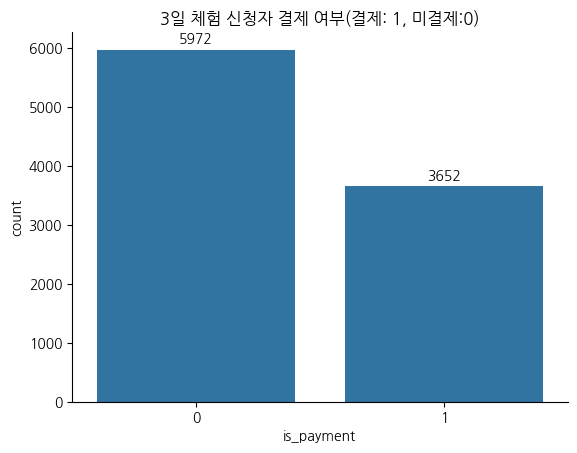

In [ ]:
ax = sns.countplot(data=payment, x='is_payment')

for container in ax.containers:
    ax.bar_label(container, fmt='%.0f', padding=3)

# 오른쪽 / 위쪽 경계선 제거
sns.despine(top=True, right=True)

plt.title("3일 체험 신청자 결제 여부(결제: 1, 미결제:0)")
plt.show()

In [ ]:
# summary와 payment 테이블 merge

analysis_df = payment.merge(
    summary,
    on='user_uuid',
    how='left'
)

In [ ]:
analysis_df['visited'] = np.where(
    analysis_df['site_id'].isna(),
    0,
    1
)

In [ ]:
analysis_df.head()

,is_payment,user_uuid,site_id,actual_stay_time,avg_checkin_time,first_checkin_time,last_checkout_time,outside_time,visit_days,session_count,checkin_count,checkout_count,is_revisit,visited
0,0,2b251333-8676-4c11-a736-dcf2350f8821,49.0,19597.0,2023-12-21 12:35:39.666666752,2023-12-21 09:13:47,2023-12-21 16:04:09,5025.0,1.0,6.0,6.0,6.0,False,1
1,0,e111619a-0975-451b-9a4a-bc8aea7b7b84,2.0,11084.0,2023-12-21 10:00:55.500000000,2023-12-21 04:42:07,2023-12-21 15:21:05,27254.0,1.0,2.0,2.0,2.0,False,1
2,1,4a184795-b056-4572-a874-644f68609ea3,NaN,NaN,NaT,NaT,NaT,NaN,NaN,NaN,NaN,NaN,NaN,0
3,0,2ba8ab19-2d40-4423-ad04-f0f9ca814871,17.0,4775.0,2023-12-21 21:31:17.000000000,2023-12-21 21:31:17,2023-12-21 22:50:52,0.0,1.0,1.0,2.0,1.0,False,1
4,0,1d49ba36-6c23-405b-9514-aa7f4aeceff0,17.0,5036.0,2023-12-21 21:23:55.500000000,2023-12-21 21:16:40,2023-12-21 22:50:57,621.0,1.0,2.0,2.0,3.0,False,1


In [ ]:
# 결측값 처리
analysis_df['visit_days'] = analysis_df['visit_days'].fillna(0)

analysis_df['actual_stay_hours'] = (
    analysis_df['actual_stay_time'] / 3600
)

analysis_df['actual_stay_hours'] = (
    analysis_df['actual_stay_hours']
    .fillna(0)
)

analysis_df['is_revisit'] = (
    analysis_df['is_revisit']
    .fillna(False)
)

C:\Users\User\AppData\Local\Temp\ipykernel_24284\196088435.py:15: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  .fillna(False)


In [ ]:
# 공통 label 함수
def add_rate_count_labels(
    ax,
    bars,
    rates,
    counts,
    is_horizontal=False
):

    for bar, rate, cnt in zip(
        bars,
        rates,
        counts
    ):

        label = f'{rate:.1%}\n(n={cnt:,})'

        # vertical bar
        if not is_horizontal:

            ax.text(
                bar.get_x() + bar.get_width()/2,
                bar.get_height(),
                label,
                ha='center',
                va='bottom',
                fontsize=9
            )

        # horizontal bar
        else:

            ax.text(
                bar.get_width(),
                bar.get_y() + bar.get_height()/2,
                label,
                va='center',
                fontsize=9
            )

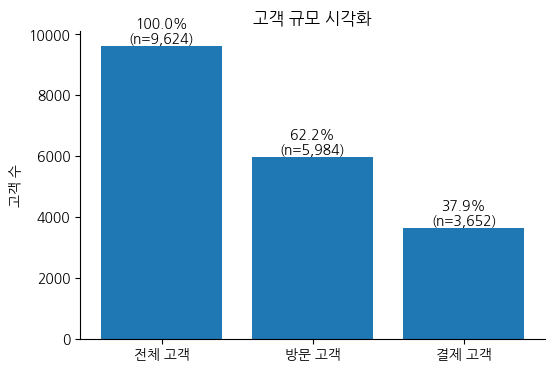

In [ ]:
# 고객 규모 확인

total_users = analysis_df['user_uuid'].nunique() # 전체 고객 수

visited_users = analysis_df[analysis_df['visited'] == 1]['user_uuid'].nunique() # 출입한 고객 수
paid_users = analysis_df[analysis_df['is_payment'] == 1]['user_uuid'].nunique() # 결제 고객 수

counts = {
    '전체 고객': total_users,
    '방문 고객': visited_users,
    '결제 고객': paid_users
}

labels = list(counts.keys())
values = list(counts.values())

fig, ax = plt.subplots(figsize=(6,4))

bars = ax.bar(labels, values)

for bar, v in zip(bars, values):

    rate = v / total_users

    ax.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height(),
        f'{rate:.1%}\n(n={v:,})',
        ha='center',
        va='bottom'
    )

ax.spines.top.set_visible(False)
ax.spines.right.set_visible(False)
ax.set_title('고객 규모 시각화')
ax.set_ylabel('고객 수')

plt.show()

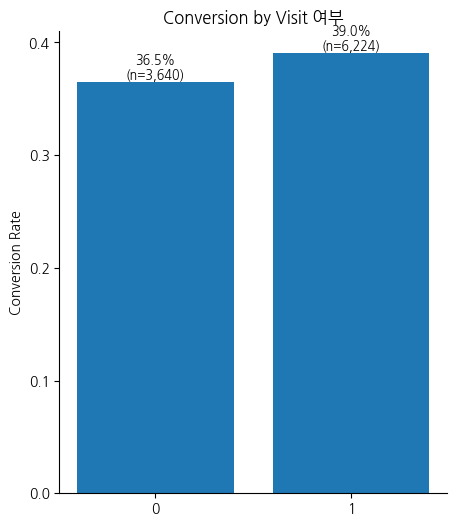

In [ ]:
# 방문 여부에 따른 결제 유저 수

visit_payment = analysis_df.groupby(
    'visited'
)['is_payment'].agg(
    total='count',
    paid='sum'
)

visit_payment['conversion_rate'] = (
    visit_payment['paid']
    / visit_payment['total']
)

fig, ax = plt.subplots(figsize=(5,6))

bars = ax.bar(
    visit_payment.index.astype(str),
    visit_payment['conversion_rate']
)

add_rate_count_labels(
    ax=ax,
    bars=bars,
    rates=visit_payment['conversion_rate'],
    counts=visit_payment['total']
)

ax.spines.top.set_visible(False)
ax.spines.right.set_visible(False)
ax.set_yticks(np.arange(0, 0.5, 0.1))
ax.set_ylabel('Conversion Rate')
ax.set_title('Conversion by Visit 여부')

plt.show()

In [ ]:
# 방문일 수와 결제 관계
## 결제 여부에 따른 방문일 수 차이
analysis_df.groupby('is_payment')['visit_days'].mean()

## 방문일 수 별 결제율
analysis_df['visit_day_bucket'] = pd.cut(
    analysis_df['visit_days'],
    bins=[0,1,3,5],
    labels=['1', '2-3', '4-5']
)

visit_bucket_stats = analysis_df.groupby(
    'visit_day_bucket'
)['is_payment'].agg(
    conversion_rate='mean',
    total='count'
)

C:\Users\User\AppData\Local\Temp\ipykernel_24284\63969803.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  visit_bucket_stats = analysis_df.groupby(


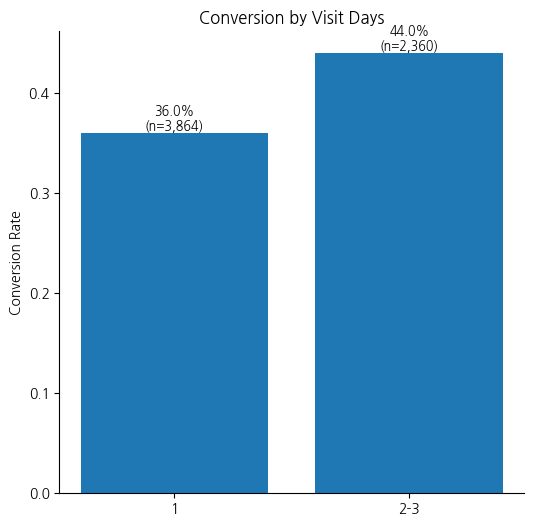

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))

bars = ax.bar(
    visit_bucket_stats.index.astype(str),
    visit_bucket_stats['conversion_rate']
)

add_rate_count_labels(
    ax=ax,
    bars=bars,
    rates=visit_bucket_stats['conversion_rate'],
    counts=visit_bucket_stats['total']
)

ax.spines.top.set_visible(False)
ax.spines.right.set_visible(False)
ax.set_ylabel('Conversion Rate')
ax.set_title('Conversion by Visit Days')

plt.show()

In [ ]:
# 평균 체류 시간 비교 
analysis_df.groupby(
    'is_payment'
)['actual_stay_hours'].mean()

is_payment
0    4.008021
1    3.862264
Name: actual_stay_hours, dtype: float64

In [ ]:
analysis_df['stay_bucket'] = pd.cut(
    analysis_df['actual_stay_hours'],
    bins=[0,0.5,1,2,4,8,999],
    labels=[
        '<30m',
        '30m-1h',
        '1-2h',
        '2-4h',
        '4-8h',
        '8h+'
    ]
)

stay_bucket_stats = analysis_df.groupby(
    'stay_bucket'
)['is_payment'].agg(
    conversion_rate='mean',
    total='count'
)

C:\Users\User\AppData\Local\Temp\ipykernel_24284\3697345052.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stay_bucket_stats = analysis_df.groupby(


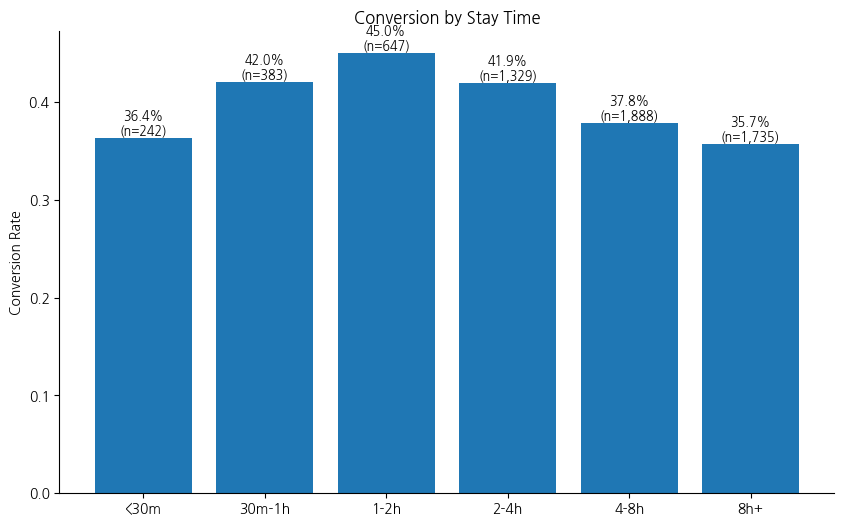

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

bars = ax.bar(
    stay_bucket_stats.index.astype(str),
    stay_bucket_stats['conversion_rate']
)

add_rate_count_labels(
    ax=ax,
    bars=bars,
    rates=stay_bucket_stats['conversion_rate'],
    counts=stay_bucket_stats['total']
)

ax.spines.top.set_visible(False)
ax.spines.right.set_visible(False)
ax.set_ylabel('Conversion Rate')
ax.set_title('Conversion by Stay Time')

plt.show()

In [ ]:
# 지점 별 결제율 / 전환율

site_conv = analysis_df.groupby(
    'site_id'
)['is_payment'].agg(
    visitors='count',
    paid='sum'
)

site_conv['conversion_rate'] = (
    site_conv['paid']
    / site_conv['visitors']
)

site_conv = site_conv.sort_values(
    'conversion_rate'
)

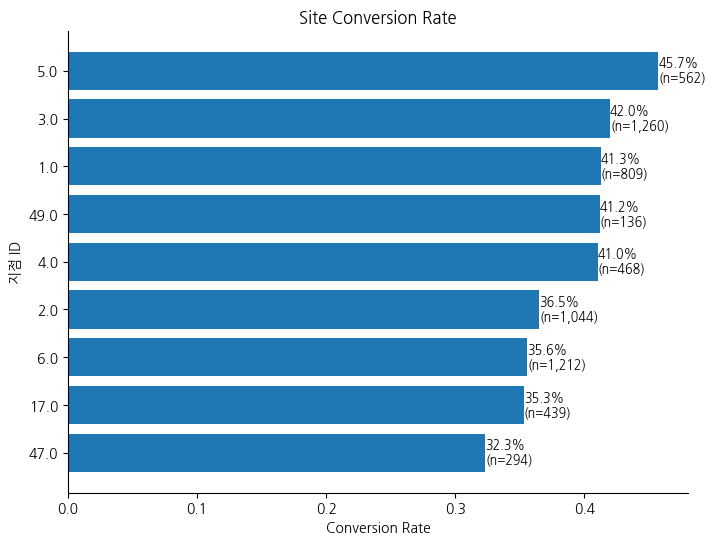

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))

bars = ax.barh(
    site_conv.index.astype(str),
    site_conv['conversion_rate']
)

add_rate_count_labels(
    ax=ax,
    bars=bars,
    rates=site_conv['conversion_rate'],
    counts=site_conv['visitors'],
    is_horizontal=True
)

ax.spines.top.set_visible(False)
ax.spines.right.set_visible(False)
ax.set_xlabel('Conversion Rate')
ax.set_ylabel('지점 ID')
ax.set_title('Site Conversion Rate')

plt.show()

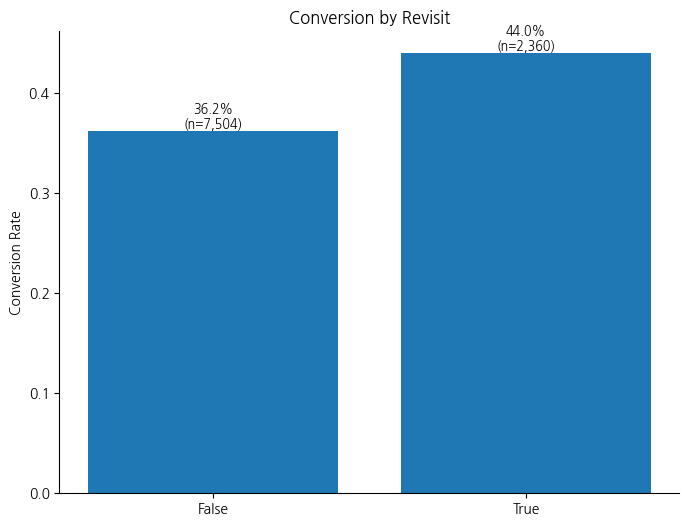

In [ ]:
# 재방문 여부 별 결제율
revisit_stats = analysis_df.groupby(
    'is_revisit'
)['is_payment'].agg(
    conversion_rate='mean',
    total='count'
)

fig, ax = plt.subplots(figsize=(8,6))

bars = ax.bar(
    revisit_stats.index.astype(str),
    revisit_stats['conversion_rate']
)

add_rate_count_labels(
    ax=ax,
    bars=bars,
    rates=revisit_stats['conversion_rate'],
    counts=revisit_stats['total']
)

ax.spines.top.set_visible(False)
ax.spines.right.set_visible(False)
ax.set_ylabel('Conversion Rate')
ax.set_title('Conversion by Revisit')

plt.show()

In [ ]:
# 결제 고객의 방문 패턴 
paid_pattern = analysis_df.groupby(
    'is_payment'
).agg({
    'visit_days': 'mean',
    'actual_stay_hours': 'mean',
    'is_revisit': 'mean'
})
paid_pattern

,visit_days,actual_stay_hours,is_revisit
is_payment,,,
0,0.867365,4.008021,0.216473
1,0.963801,3.862264,0.276284


### register (3일 체험 신청) 데이터

In [ ]:
register.head()

,trial_date,user_uuid
0,2023-12-21,2b251333-8676-4c11-a736-dcf2350f8821
1,2023-12-21,e111619a-0975-451b-9a4a-bc8aea7b7b84
2,2023-12-21,4a184795-b056-4572-a874-644f68609ea3
3,2023-12-21,2ba8ab19-2d40-4423-ad04-f0f9ca814871
4,2023-12-21,1d49ba36-6c23-405b-9514-aa7f4aeceff0


In [ ]:
register.info() # 결측치는 없음

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9659 entries, 0 to 9658
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   trial_date  9659 non-null   object
 1   user_uuid   9659 non-null   object
dtypes: object(2)
memory usage: 151.0+ KB


In [ ]:
register.duplicated().sum() # 완전 중복 데이터 28개 존재

np.int64(28)

In [ ]:
register = register.drop_duplicates() # 완전 중복 행은 제거

In [ ]:
register['user_uuid'].nunique() # user_uuid 유니크 값 9624개 ???

9624

In [ ]:
register['user_uuid'].value_counts()

user_uuid
5b16f32b-3344-4b39-b2bf-8cf1caac78fa    2
bf620970-e3f2-4b54-9620-86171299d08b    2
ffd880d5-0200-44e1-91db-7df9483f2a39    2
bd3ed6c2-f139-4e0c-b53e-b956101b2822    2
4008307f-486f-408f-b90b-e01398972029    2
                                       ..
d93907ab-525a-4498-82cd-9a1e0bc4d3c5    1
3db191cd-91f6-4ea2-89f8-ec58d834b13c    1
544a3e9e-24e4-4a64-bd5d-da0acaec223a    1
d48b6fb6-947a-4730-853d-69290a810029    1
e111619a-0975-451b-9a4a-bc8aea7b7b84    1
Name: count, Length: 9624, dtype: int64

- 결측치는 없다. 근데 완전 중복 데이터는 28개 존재. 
- 9659 - 28 = 9631개(?)
- 나머지 7개는 뭐지?

In [ ]:
register[
    register.groupby('user_uuid')['user_uuid']
    .transform('size') == 2
].sort_values('user_uuid')

,trial_date,user_uuid
5624,2022-01-28,14872783-3af7-492a-b51c-12f3003b76f1
5625,2023-02-10,14872783-3af7-492a-b51c-12f3003b76f1
1682,2021-09-06,4008307f-486f-408f-b90b-e01398972029
1683,2022-03-25,4008307f-486f-408f-b90b-e01398972029
3554,2022-03-14,5b16f32b-3344-4b39-b2bf-8cf1caac78fa
3555,2023-03-22,5b16f32b-3344-4b39-b2bf-8cf1caac78fa
4968,2022-09-05,6a88014b-fbbd-4e73-8036-04435c062a97
4969,2023-02-10,6a88014b-fbbd-4e73-8036-04435c062a97
4674,2022-08-02,bd3ed6c2-f139-4e0c-b53e-b956101b2822
4675,2022-10-21,bd3ed6c2-f139-4e0c-b53e-b956101b2822


- 찾아보았을 때, 빈 7개는 3일 체험 신청을 서로 다른 날짜에 **2번** 진행한 유저인 것 같음. -> 이 데이터를 어찌해야 할 지 정해야 함.
- access_log에서 확인해본 결과 다음과 같았다.

    - 4008307f-486f-408f-b90b-e01398972029 : 뒷 날짜에 다시 신청 후 다음날 방문
    - 6a88014b-fbbd-4e73-8036-04435c062a97 : 뒷 날짜에 다시 신청 후 다음날 방문
    - bf620970-e3f2-4b54-9620-86171299d08b : 뒷 날짜에 다시 신청 후 방문함
    - 그 외 유저들은 다시 신청하고도 방문하지 않은 듯 함.

- visit_info에서 확인해보았을 때, 결과는 다음과 같음.
    - 14872783-3af7-492a-b51c-12f3003b76f1 : 뒷 날짜 이후 방문
    - 4008307f-486f-408f-b90b-e01398972029 : 뒷 날짜 이후 다음날 방문
    - 5b16f32b-3344-4b39-b2bf-8cf1caac78fa : 없음
    - 6a88014b-fbbd-4e73-8036-04435c062a97 : 뒷 날짜 이후 방문
    - bd3ed6c2-f139-4e0c-b53e-b956101b2822 : 뒷 날짜 이후 방문
    - bf620970-e3f2-4b54-9620-86171299d08b : 뒷 날짜 이후 방문
    - ffd880d5-0200-44e1-91db-7df9483f2a39 : 없음

-> 따라서 서로 다른 날짜에 2번 신청한 유저들은 뒷 날짜를 남기고, 처음 신청한 날짜는 삭제 처리해도 무방할 듯 하다.

In [ ]:
# 처음 신청한 날짜 삭제 처리
register['trial_date'] = pd.to_datetime(register['trial_date'])

register = (
    register.sort_values('trial_date', ascending=False)
    .drop_duplicates(subset='user_uuid', keep='first')
)

### visit_info(3일 체험 신청자 일자별 방문 기록) 데이터 

In [ ]:
visit_info.head()

,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid
0,1,2023-12-23,01:11:19.983486,4279,2023-12-23 16:11:25.345793,2023-12-23 17:25:32.233995,939fc566-61cd-47f0-a3ce-e2936fdcff73
1,1,2023-12-24,04:35:10.361341,16510,2023-12-24 16:10:45.668026,2023-12-24 20:53:34.842447,939fc566-61cd-47f0-a3ce-e2936fdcff73
2,1,2023-12-25,02:09:54.117163,7794,2023-12-25 10:19:47.087268,2023-12-25 12:39:51.221372,939fc566-61cd-47f0-a3ce-e2936fdcff73
3,1,2023-12-23,04:37:36.134901,16656,2023-12-23 14:49:40.302823,2023-12-23 19:27:39.406803,ba49324f-d317-4053-adf9-2b17b3f07594
4,3,2023-12-26,04:32:05.289251,16325,2023-12-26 14:57:10.220793,2023-12-26 19:34:36.971542,ba49324f-d317-4053-adf9-2b17b3f07594


In [ ]:
visit_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11477 entries, 0 to 11476
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   site_id           11477 non-null  int64 
 1   date              11477 non-null  object
 2   stay_time         11477 non-null  object
 3   stay_time_second  11477 non-null  int64 
 4   first_enter_time  10922 non-null  object
 5   last_leave_time   10922 non-null  object
 6   user_uuid         11477 non-null  object
dtypes: int64(2), object(5)
memory usage: 627.8+ KB


In [ ]:
visit_info.isnull().sum() 

site_id               0
date                  0
stay_time             0
stay_time_second      0
first_enter_time    555
last_leave_time     555
user_uuid             0
dtype: int64

- first_enter_time, last_leave_time 컬럼에 555개씩 결측치 존재

In [ ]:
visit_info.duplicated().sum() # 완전 중복 데이터 48개 존재.

np.int64(48)

In [ ]:
visit_info = visit_info.drop_duplicates()

In [ ]:
visit_info['user_uuid'].nunique() # 6534명이 체험 신청하고 방문함.

6534

In [ ]:
visit_info.head()

,site_id,date,stay_time,stay_time_second,first_enter_time,last_leave_time,user_uuid
0,1,2023-12-23,01:11:19.983486,4279,2023-12-23 16:11:25.345793,2023-12-23 17:25:32.233995,939fc566-61cd-47f0-a3ce-e2936fdcff73
1,1,2023-12-24,04:35:10.361341,16510,2023-12-24 16:10:45.668026,2023-12-24 20:53:34.842447,939fc566-61cd-47f0-a3ce-e2936fdcff73
2,1,2023-12-25,02:09:54.117163,7794,2023-12-25 10:19:47.087268,2023-12-25 12:39:51.221372,939fc566-61cd-47f0-a3ce-e2936fdcff73
3,1,2023-12-23,04:37:36.134901,16656,2023-12-23 14:49:40.302823,2023-12-23 19:27:39.406803,ba49324f-d317-4053-adf9-2b17b3f07594
4,3,2023-12-26,04:32:05.289251,16325,2023-12-26 14:57:10.220793,2023-12-26 19:34:36.971542,ba49324f-d317-4053-adf9-2b17b3f07594


In [ ]:
visit_info['date'] = pd.to_datetime(visit_info['date'])

visit_info['first_enter_time'] = visit_info['first_enter_time'].astype(str).str.replace(r'\.\d+', '', regex=True)
visit_info['last_leave_time'] = visit_info['last_leave_time'].astype(str).str.replace(r'\.\d+', '', regex=True)

visit_info['first_enter_time'] = pd.to_datetime(visit_info['first_enter_time'])
visit_info['last_leave_time'] = pd.to_datetime(visit_info['last_leave_time'])

In [ ]:
visit_info = visit_info.drop(columns=['stay_time'], axis=1)

In [ ]:
visit_info['total_stay_time'] = visit_info['last_leave_time'] - visit_info['first_enter_time']

In [ ]:
visit_info['total_stay_time'] = visit_info['total_stay_time'].dt.total_seconds()
visit_info['outer_time'] = visit_info['total_stay_time'] - visit_info['stay_time_second']

In [ ]:
visit_info.head()

,site_id,date,stay_time_second,first_enter_time,last_leave_time,user_uuid,total_stay_time,outer_time
0,1,2023-12-23,4279,2023-12-23 16:11:25,2023-12-23 17:25:32,939fc566-61cd-47f0-a3ce-e2936fdcff73,4447.0,168.0
1,1,2023-12-24,16510,2023-12-24 16:10:45,2023-12-24 20:53:34,939fc566-61cd-47f0-a3ce-e2936fdcff73,16969.0,459.0
2,1,2023-12-25,7794,2023-12-25 10:19:47,2023-12-25 12:39:51,939fc566-61cd-47f0-a3ce-e2936fdcff73,8404.0,610.0
3,1,2023-12-23,16656,2023-12-23 14:49:40,2023-12-23 19:27:39,ba49324f-d317-4053-adf9-2b17b3f07594,16679.0,23.0
4,3,2023-12-26,16325,2023-12-26 14:57:10,2023-12-26 19:34:36,ba49324f-d317-4053-adf9-2b17b3f07594,16646.0,321.0


**결측치 채우기**

**결측치 채우는 방법**

- 가설 1. 사용자 별로 패턴을 파악해서 first_enter_time을 채운 이후 stay_time을 통해서 last_leave_time의 결측치를 채울 수 있다.
    - 결론. 불가능
    - 원인: 결측치가 있는 row는 모두 한 user의 기록이 모두 결측치인 경우 밖에 없어서 결측치가 있는 user의 패턴을 파악할 수 없음.

- 가설 2. access_log의 cdate를 통해서 visit_info의 first_enter_time, last_leave_time의 결측치를 채울 수 있다.
    - 결론. 가능
    - 원인: **방문 기록 = 특정 공간(방/스터디룸/랩실 등) 이용 기록** / **출입 기록 = 건물 게이트 출입 기록** 이라서 stay_time과 완전 일치하지 않음
        - 하지만, 체류 시간과 last_leave_time - first_enter_time이 일치하지 않는 경우가 약 75%기 때문에 일단은 가능하다고 판단.


In [ ]:
visit_info_copy = visit_info.copy()

In [ ]:
visit_info_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11429 entries, 0 to 11476
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   site_id           11429 non-null  int64         
 1   date              11429 non-null  datetime64[ns]
 2   stay_time_second  11429 non-null  int64         
 3   first_enter_time  10874 non-null  datetime64[ns]
 4   last_leave_time   10874 non-null  datetime64[ns]
 5   user_uuid         11429 non-null  object        
 6   total_stay_time   10874 non-null  float64       
 7   outer_time        10874 non-null  float64       
dtypes: datetime64[ns](3), float64(2), int64(2), object(1)
memory usage: 803.6+ KB


In [ ]:
access_log['date'] = pd.to_datetime(access_log['cdate']).dt.date
visit_info_copy['date'] = pd.to_datetime(visit_info_copy['date']).dt.date

# 입실 / 퇴실 기준 집계
enter_df = (
    access_log[access_log['checkin'] == 1]
    .groupby(['user_uuid', 'date'])['cdate']
    .min()
    .reset_index(name='enter_time')
)

leave_df = (
    access_log[access_log['checkin'] == 2]
    .groupby(['user_uuid', 'date'])['cdate']
    .max()
    .reset_index(name='leave_time')
)

C:\Users\User\AppData\Local\Temp\ipykernel_24284\3773751086.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  access_log['date'] = pd.to_datetime(access_log['cdate']).dt.date


In [ ]:
# visit_info와 merge
visit_info_copy = visit_info_copy.merge(
    enter_df,
    on=['user_uuid', 'date'],
    how='left'
)

visit_info_copy = visit_info_copy.merge(
    leave_df,
    on=['user_uuid', 'date'],
    how='left'
)

# 결측치만 채우기
visit_info_copy['first_enter_time'] = visit_info_copy['first_enter_time'].fillna(
    visit_info_copy['enter_time']
)

visit_info_copy['last_leave_time'] = visit_info_copy['last_leave_time'].fillna(
    visit_info_copy['leave_time']
)

# 임시 컬럼 제거
visit_info_copy = visit_info_copy.drop(columns=['enter_time', 'leave_time'])

In [ ]:
visit_info_copy.isna().sum()

site_id               0
date                  0
stay_time_second      0
first_enter_time     75
last_leave_time      72
user_uuid             0
total_stay_time     555
outer_time          555
dtype: int64

In [ ]:
# 둘 중 하나가 결측인 경우 88개
visit_info_copy[visit_info_copy['first_enter_time'].isna() | visit_info_copy['last_leave_time'].isna()]

,site_id,date,stay_time_second,first_enter_time,last_leave_time,user_uuid,total_stay_time,outer_time
334,1,2021-06-03,13386,NaT,NaT,91bded23-9587-46f8-91bf-62872c06f95e,NaN,NaN
336,4,2021-06-02,1147,NaT,2021-06-02 00:19:08,91bded23-9587-46f8-91bf-62872c06f95e,NaN,NaN
2494,1,2021-06-03,17587,NaT,NaT,72398317-26d3-4107-a902-e8b2bfcc2c8a,NaN,NaN
2518,1,2021-06-03,17486,NaT,NaT,ada01a8d-9bde-499c-b209-a00b0a2c6108,NaN,NaN
2556,1,2021-06-02,14172,NaT,NaT,2200ed27-05d1-4e71-adfc-44b0d0e4fedc,NaN,NaN
...,...,...,...,...,...,...,...,...
7726,4,2021-06-04,8053,NaT,NaT,3b75ced7-f2be-4c26-bc2e-d0a9029cdf49,NaN,NaN
7779,4,2021-05-15,21020,NaT,NaT,e7f11454-92eb-4f3d-bc1a-d04fe51e1696,NaN,NaN
7818,4,2021-05-25,41679,NaT,NaT,5610f14f-bce2-4232-b05f-c50ea784738e,NaN,NaN
7834,4,2021-06-04,13390,NaT,NaT,fe024035-f878-462a-a5ba-1db6f5f19646,NaN,NaN


In [ ]:
# first_enter_time 하나가 결측인 경우 6개
visit_info_copy[visit_info_copy['first_enter_time'].isna() & visit_info_copy['last_leave_time'].notna()]

,site_id,date,stay_time_second,first_enter_time,last_leave_time,user_uuid,total_stay_time,outer_time
336,4,2021-06-02,1147,NaT,2021-06-02 00:19:08,91bded23-9587-46f8-91bf-62872c06f95e,NaN,NaN
2784,2,2021-06-07,19231,NaT,2021-06-07 05:20:31,52d7e6a1-fc98-4429-8a5f-38857bb99fe6,NaN,NaN
4024,1,2021-06-24,44661,NaT,2021-06-24 12:24:22,82b11c57-3f45-4e08-a3b1-c840679899f2,NaN,NaN
7242,3,2021-05-15,6083,NaT,2021-05-15 01:41:23,95dd45f2-2431-4eb3-85c6-653bf2a4adc4,NaN,NaN
7421,4,2021-05-25,1441,NaT,2021-05-25 00:24:01,5e169fab-d8a8-4a22-9ed4-f715f2f928b2,NaN,NaN
7498,4,2021-06-06,582,NaT,2021-06-06 00:09:42,b42fdcd5-2a0f-407c-9ceb-4c1a3b9209a2,NaN,NaN
7503,4,2021-06-06,587,NaT,2021-06-06 00:09:47,6d22fe6f-6ff5-4d04-b8cf-c323fb3c8d67,NaN,NaN
7516,4,2021-05-19,57385,NaT,2021-05-19 15:56:26,52bd8ae4-1853-4735-bdd0-d2bd078b89c7,NaN,NaN
7633,4,2021-06-08,2470,NaT,2021-06-08 00:41:10,a78a56f8-24b2-4d0d-9acb-93491ccc72f6,NaN,NaN
7677,4,2021-06-03,773,NaT,2021-06-03 00:13:02,9caa3617-66c5-44d7-9ff2-c5eafe7a1dc2,NaN,NaN


In [ ]:
# last_leave_time 하나가 결측인 경우 3개
visit_info_copy[visit_info_copy['first_enter_time'].notna() & visit_info_copy['last_leave_time'].isna()]

,site_id,date,stay_time_second,first_enter_time,last_leave_time,user_uuid,total_stay_time,outer_time
2785,2,2021-06-06,3359,2021-06-06 23:03:59,NaT,52d7e6a1-fc98-4429-8a5f-38857bb99fe6,NaN,NaN
2852,3,2021-06-28,15637,2021-06-28 19:39:21,NaT,cc8ac908-3463-434c-8b4b-369d19f0e749,NaN,NaN
4908,2,2021-06-28,6209,2021-06-28 22:16:29,NaT,1cbb74e8-1460-471b-b5fd-844b3ae43583,NaN,NaN
5048,2,2021-06-28,6214,2021-06-28 22:16:24,NaT,e602b6ce-b96c-4041-bcea-4b1c7cdcde5d,NaN,NaN
5404,2,2021-06-02,5940,2021-06-02 22:20:58,NaT,b8fd4306-26b8-44b8-a648-669871fe3afb,NaN,NaN
6133,3,2021-06-22,7846,2021-06-22 21:49:13,NaT,899f568b-1622-49bb-b002-bb696f60af9f,NaN,NaN
7608,4,2021-05-26,21753,2021-05-26 17:57:25,NaT,bd21a83e-0825-4320-986f-5a04457be0e8,NaN,NaN


In [ ]:
# 둘 다 결측인 경우 79개
visit_info_copy[visit_info_copy['first_enter_time'].isna() & visit_info_copy['last_leave_time'].isna()]

,site_id,date,stay_time_second,first_enter_time,last_leave_time,user_uuid,total_stay_time,outer_time
334,1,2021-06-03,13386,NaT,NaT,91bded23-9587-46f8-91bf-62872c06f95e,NaN,NaN
2494,1,2021-06-03,17587,NaT,NaT,72398317-26d3-4107-a902-e8b2bfcc2c8a,NaN,NaN
2518,1,2021-06-03,17486,NaT,NaT,ada01a8d-9bde-499c-b209-a00b0a2c6108,NaN,NaN
2556,1,2021-06-02,14172,NaT,NaT,2200ed27-05d1-4e71-adfc-44b0d0e4fedc,NaN,NaN
2638,2,2021-06-09,27866,NaT,NaT,f2838847-e7f5-4719-8818-5d39256d122e,NaN,NaN
...,...,...,...,...,...,...,...,...
7726,4,2021-06-04,8053,NaT,NaT,3b75ced7-f2be-4c26-bc2e-d0a9029cdf49,NaN,NaN
7779,4,2021-05-15,21020,NaT,NaT,e7f11454-92eb-4f3d-bc1a-d04fe51e1696,NaN,NaN
7818,4,2021-05-25,41679,NaT,NaT,5610f14f-bce2-4232-b05f-c50ea784738e,NaN,NaN
7834,4,2021-06-04,13390,NaT,NaT,fe024035-f878-462a-a5ba-1db6f5f19646,NaN,NaN


In [ ]:
#last_leave_time 컬럼만 없는 경우 1개 필터링
access_log[access_log['user_uuid'] == 'bd21a83e-0825-4320-986f-5a04457be0e8']

,id,checkin,cdate,site_id,user_uuid,date
48077,69646,1,2021-05-26 17:57:25,4,bd21a83e-0825-4320-986f-5a04457be0e8,2021-05-26


In [ ]:
#first_enter_time 컬럼만 없는 경우 1개 필터링
# 2021-06-20은 결측치가 아니기 때문에, 21일 기록만 보면 퇴실 기록만 있는 것을 알 수 있다.
access_log[access_log['user_uuid'] == 'eb938770-c4a7-416a-b51a-8d9865d209b5']

,id,checkin,cdate,site_id,user_uuid,date
59162,93955,1,2021-06-21 00:02:19,2,eb938770-c4a7-416a-b51a-8d9865d209b5,2021-06-21
59163,93988,2,2021-06-21 02:09:43,2,eb938770-c4a7-416a-b51a-8d9865d209b5,2021-06-21
59164,93989,1,2021-06-21 02:09:49,2,eb938770-c4a7-416a-b51a-8d9865d209b5,2021-06-21
59165,93990,2,2021-06-21 02:11:46,2,eb938770-c4a7-416a-b51a-8d9865d209b5,2021-06-21
59166,93992,1,2021-06-21 02:18:42,2,eb938770-c4a7-416a-b51a-8d9865d209b5,2021-06-21
59167,93999,2,2021-06-21 03:07:43,2,eb938770-c4a7-416a-b51a-8d9865d209b5,2021-06-21
59168,94002,1,2021-06-21 03:11:36,2,eb938770-c4a7-416a-b51a-8d9865d209b5,2021-06-21
59169,94028,2,2021-06-21 06:45:58,2,eb938770-c4a7-416a-b51a-8d9865d209b5,2021-06-21
59170,94029,1,2021-06-21 06:51:52,2,eb938770-c4a7-416a-b51a-8d9865d209b5,2021-06-21
59171,94049,2,2021-06-21 07:47:53,2,eb938770-c4a7-416a-b51a-8d9865d209b5,2021-06-21


In [ ]:
# first_enter_time 컬럼, last_leave_time 컬럼이 둘 다 없는 경우 
access_log[access_log['user_uuid'] == '91bded23-9587-46f8-91bf-62872c06f95e']

,id,checkin,cdate,site_id,user_uuid,date
36865,74917,1,2021-06-01 17:05:24,4,91bded23-9587-46f8-91bf-62872c06f95e,2021-06-01
36866,75142,2,2021-06-01 20:21:19,4,91bded23-9587-46f8-91bf-62872c06f95e,2021-06-01
36867,75143,1,2021-06-01 20:23:03,4,91bded23-9587-46f8-91bf-62872c06f95e,2021-06-01
36868,75248,2,2021-06-01 23:45:12,4,91bded23-9587-46f8-91bf-62872c06f95e,2021-06-01
36869,75249,1,2021-06-01 23:47:03,4,91bded23-9587-46f8-91bf-62872c06f95e,2021-06-01
36870,75252,2,2021-06-02 00:19:08,4,91bded23-9587-46f8-91bf-62872c06f95e,2021-06-02


1. 위 방법대로 진행할 경우 first_enter_time 컬럼은 83개, last_leave_time 컬럼은 81개의 결측치만 남게 된다.
    - 78개 row는 해당 날짜에 `visit_info(방문 기록)`은 존재하지만, access_log가 존재하지 않는 경우
    - 5개 row는 입실 기록이 없으며, 퇴실 기록은 존재하는 경우
    - 3개 row는 입실 기록은 있는데, 퇴실 기록이 없는 경우

2. 8개 row는 입실 기록 + 체류 시간 / 퇴실 기록 - 체류 시간 을 하면 채울 수는 있음. 하지만 78개 row는 채울 방법이 존재하지 않는 것 같다.
    
    **→ 남은 결측치는 어떻게 처리할 지 의견이 필요함**

**기본 분포 검증**
1. 체류시간(초) 분포
2. 첫 입실 ~ 마지막 퇴실로 계산한 체류 시간 vs 제공된 체류시간 일치 여부

**시간 기반 패턴**
1. 입실 시간 기준 평균 체류 시간
2. 퇴실 시간 기준 분포
3. 요일별 평균 체류 시간
4. 일별 총 방문 수, 일별 총 체류 시간

In [ ]:
# 시간, 날짜 컬럼 생성
visit_info_copy['hour_enter'] = visit_info_copy['first_enter_time'].dt.hour
visit_info_copy['hour_leave'] = visit_info_copy['last_leave_time'].dt.hour
#visit_info_copy['weekday'] = visit_info_copy['date'].dt.day_name()
#visit_info_copy['is_weekend'] = visit_info_copy['date'].dt.weekday >= 5

count    11429.000000
mean     16693.669262
std      11969.309325
min          1.000000
50%      14703.000000
90%      31006.400000
99%      61645.480000
max      86377.000000
Name: stay_time_second, dtype: float64

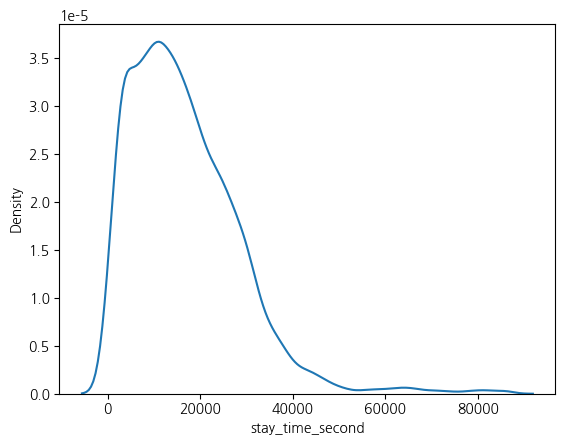

In [ ]:
display(visit_info_copy['stay_time_second'].describe(percentiles=[0.5, 0.9, 0.99]))
sns.kdeplot(data=visit_info_copy, x='stay_time_second')

plt.show()

In [ ]:
Q1 = visit_info_copy['stay_time_second'].quantile(0.25)
Q3 = visit_info_copy['stay_time_second'].quantile(0.75)

IQR = Q3 - Q1

outlier = visit_info_copy[
    (visit_info_copy['stay_time_second'] < Q1 - 1.5 * IQR) |
    (visit_info_copy['stay_time_second'] > Q3 + 1.5 * IQR)
]

outlier['stay_time_second'].describe()

count      218.000000
mean     62949.683486
std      12230.079942
min      46699.000000
25%      51003.500000
50%      61960.000000
75%      71313.750000
max      86377.000000
Name: stay_time_second, dtype: float64

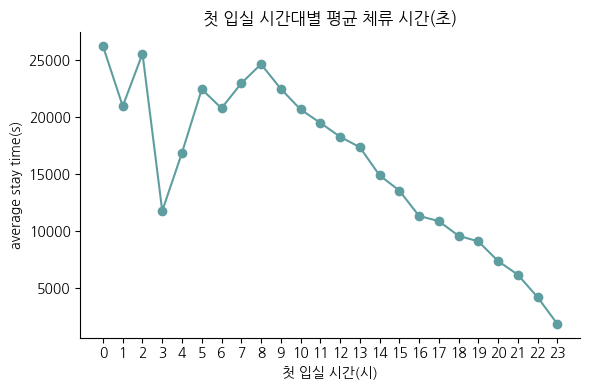

In [ ]:
# 시간대별 분석
hourly = visit_info_copy.groupby('hour_enter')['stay_time_second'].mean().reset_index()

fig, ax = plt.subplots(figsize=(6,4))

ax.plot(hourly['hour_enter'], hourly['stay_time_second'], color='cadetblue', marker='o')
ax.set_title('첫 입실 시간대별 평균 체류 시간(초)')
ax.set_xlabel('첫 입실 시간(시)')
ax.set_ylabel('average stay time(s)')
ax.spines[['right','top']].set_visible(False)
ax.set_xticks(hourly['hour_enter'])

plt.tight_layout()
plt.show()

- 체류 시간을 IQR기반으로 이상치를 확인해보았음 
    - 그 중에서도 최대값은 거의 24시간에 해당하는 수치

In [ ]:
# 이상치를 한번 제거해보고 체류 시간 분포 확인 
visit_info_copy = visit_info_copy[(visit_info_copy['stay_time_second'] >= Q1 - 1.5 * IQR) & (visit_info_copy['stay_time_second'] <= Q3 + 1.5 * IQR)]

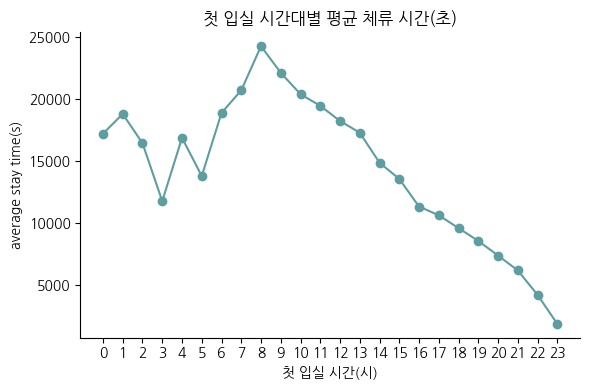

In [ ]:
# 시간대별 분석
hourly = visit_info_copy.groupby('hour_enter')['stay_time_second'].mean().reset_index()

fig, ax = plt.subplots(figsize=(6,4))

ax.plot(hourly['hour_enter'], hourly['stay_time_second'], color='cadetblue', marker='o')
ax.set_title('첫 입실 시간대별 평균 체류 시간(초)')
ax.set_xlabel('첫 입실 시간(시)')
ax.set_ylabel('average stay time(s)')
ax.spines[['right','top']].set_visible(False)
ax.set_xticks(hourly['hour_enter'])

plt.tight_layout()
plt.show()

In [ ]:
# 건물 ID 별 분석 
building_stats = visit_info_copy.groupby('site_id').agg(
    visits=('user_uuid', 'count'),
    unique_users=('user_uuid', 'nunique'),
    avg_duration=('stay_time_second', 'mean'),
    total_duration=('stay_time_second', 'sum')
).sort_values('site_id', ascending=True).reset_index()

display(building_stats)

,site_id,visits,unique_users,avg_duration,total_duration
0,1,1349,909,14309.205337,19303118
1,2,1923,1118,17894.796152,34411693
2,3,2306,1380,16161.411101,37268214
3,4,848,511,14927.153302,12658226
4,5,1040,613,15575.476923,16198496
5,6,2184,1319,16353.982601,35717098
6,17,776,479,13515.590206,10488098
7,47,528,331,13919.719697,7349612
8,49,257,144,14297.120623,3674360


In [ ]:
building_stats['avg_duration'].mean()

np.float64(15217.161771336338)

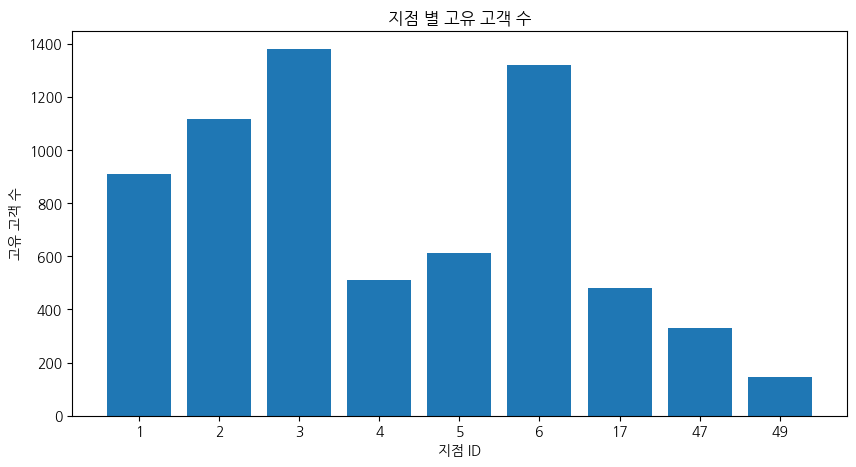

In [ ]:
plt.figure(figsize=(10,5))
plt.bar(building_stats['site_id'].astype(str), building_stats['unique_users'])

plt.xlabel('지점 ID')
plt.ylabel('고유 고객 수')
plt.title('지점 별 고유 고객 수')
plt.show()

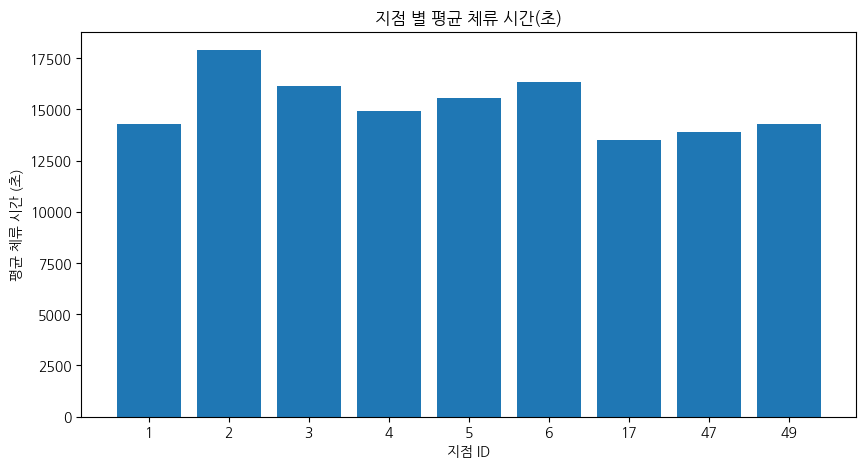

In [ ]:
plt.figure(figsize=(10,5))
plt.bar(building_stats['site_id'].astype(str), building_stats['avg_duration'])
plt.xlabel('지점 ID')
plt.ylabel('평균 체류 시간 (초)')
plt.title('지점 별 평균 체류 시간(초)')
plt.show()

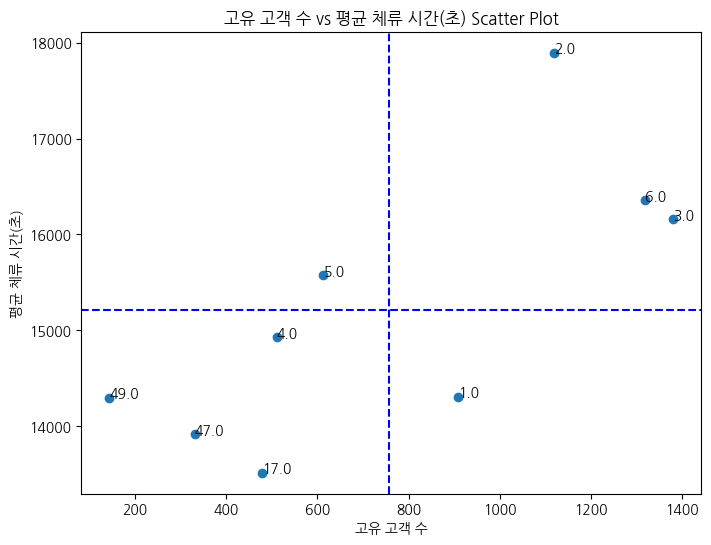

In [ ]:
plt.figure(figsize=(8,6))

plt.scatter(
    building_stats['unique_users'],
    building_stats['avg_duration']
)

for _, row in building_stats.iterrows():
    plt.text(
        row['unique_users'],
        row['avg_duration'],
        str(row['site_id'])
    )

plt.xlabel('고유 고객 수')
plt.ylabel('평균 체류 시간(초)')
plt.axhline(y=building_stats['avg_duration'].mean(), color='b', linestyle='--')
plt.axvline(x=building_stats['unique_users'].mean(), color='b', linestyle='--')
plt.title('고유 고객 수 vs 평균 체류 시간(초) Scatter Plot')
plt.show()

hour_enter,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0
site_id,,,,,,,,,,,,,,,,,,,,,
1,15858.724138,17530.000000,0.0,0.0,0.0,18948.5,33731.000000,21226.666667,22048.577778,19978.949495,...,13419.497143,12092.669355,10217.043478,8949.833333,8296.404494,6826.833333,7461.846154,3698.571429,4057.500000,1284.000000
2,18685.276119,31930.333333,0.0,10471.0,19213.5,0.0,23349.333333,21478.121951,28652.295775,24825.043165,...,17512.495098,15806.486111,12453.712766,12673.443038,9673.961538,9283.738636,7142.333333,7245.046512,4276.318182,2157.714286
3,15888.622378,14631.666667,20524.0,4330.0,4032.0,11825.0,14660.250000,25792.275862,25201.022727,23114.380208,...,14227.692641,13863.469388,12691.856061,11136.636364,11511.141304,8685.100000,7193.138889,6386.212766,3896.250000,1724.555556
4,16678.545455,3399.000000,0.0,31143.0,0.0,16905.0,0.000000,26835.538462,24128.848485,21527.708333,...,13404.650000,12917.893333,10161.381818,10732.833333,10369.370370,8145.423077,6972.269231,6064.937500,4580.800000,3191.000000
5,15279.258621,5943.000000,16188.0,5746.5,0.0,0.0,0.000000,13230.812500,23200.586957,22435.680000,...,14831.008475,13465.339450,11543.428571,8752.463415,10703.153846,8234.822222,6499.571429,4328.285714,4170.333333,2473.428571
6,18534.946524,18118.500000,0.0,4429.0,41568.0,4773.0,19202.500000,16418.000000,25535.597938,21418.931250,...,15434.044177,13705.502618,11144.912088,10799.720930,9118.158730,8754.755102,7637.906250,6048.902439,4269.333333,1430.000000
17,16531.145455,8357.000000,0.0,0.0,0.0,7364.5,0.000000,16681.416667,16578.793103,20792.754098,...,14719.482759,10372.916667,8305.135135,9069.962963,8805.942857,10418.939394,8118.391304,6211.318182,4284.250000,1672.714286
47,15843.230769,19480.666667,0.0,0.0,0.0,0.0,5965.500000,20312.200000,23941.000000,16855.166667,...,13205.840580,13223.954545,10809.965517,9415.708333,8567.757576,8650.296296,7675.750000,5221.600000,4009.666667,64.000000
49,16946.370370,21797.400000,8916.0,15770.0,13085.0,0.0,18254.500000,12110.000000,14885.500000,22016.538462,...,13460.466667,14627.157895,9585.000000,10948.111111,7586.375000,5666.166667,8365.473684,6498.750000,4830.200000,498.000000


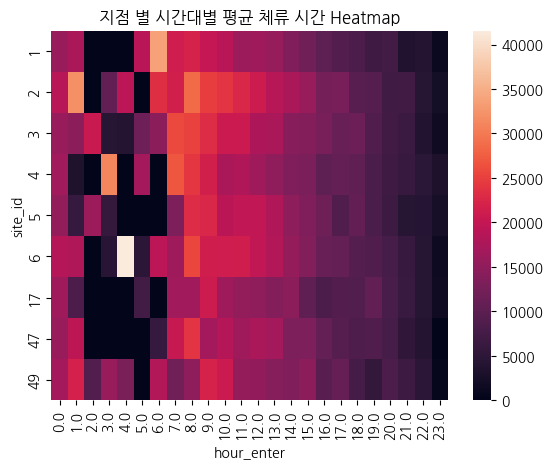

In [ ]:
# 건물 * 시간 히트맵
heatmap_data = visit_info_copy.pivot_table(
    index='site_id',
    columns='hour_enter',
    values='stay_time_second',
    aggfunc='mean'
)

heatmap_data = heatmap_data.fillna(0)
display(heatmap_data)

sns.heatmap(heatmap_data)

plt.title("지점 별 시간대별 평균 체류 시간 Heatmap")
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import koreanize_matplotlib 
import seaborn as sns
from collections import Counter

### 데이터 불러오기

In [ ]:
site_area = pd.read_csv('data/site_area.csv')
access_log = pd.read_csv('data/trial_access_log.csv')
payment = pd.read_csv('data/trial_payment.csv')
register = pd.read_csv('data/trial_register.csv')
visit_info = pd.read_csv('data/trial_visit_info.csv')

### 데이터 전처리

In [ ]:
# site_area 데이터는 전처리 불필요

In [ ]:
access_log.info(0)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63708 entries, 0 to 63707
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   id         63708 non-null  int64 
 1   checkin    63708 non-null  int64 
 2   cdate      63708 non-null  object
 3   site_id    63708 non-null  int64 
 4   user_uuid  63708 non-null  object
dtypes: int64(3), object(2)
memory usage: 2.4+ MB


In [ ]:
# access_log 데이터 전처리
access_log = access_log.drop_duplicates().reset_index(drop=True)
# 시간 컬럼 생성
access_log['cdate'] = pd.to_datetime(access_log['cdate'])
access_log['cdate_kst'] = (access_log['cdate'] + pd.Timedelta(hours=9)).dt.floor('s')


In [ ]:
# acc checkin 이상 패턴 현황 파악
# 정렬: user x site x cdate_kst
# 패턴 확인: user x site 단위

# acc 전처리: 불필요 컬럼 제거 및 정렬
access_log = access_log.drop(columns=['id', 'cdate'])
access_log = access_log.sort_values(['user_uuid', 'site_id', 'cdate_kst']).reset_index(drop=True)

starts_with_2 = 0
ends_with_1 = 0
has_consec_1 = 0
has_consec_2 = 0
consec_1_counts = []
consec_2_counts = []

for (u, s), group in access_log.groupby(['user_uuid', 'site_id'], sort=False):
    checkin_vals = group['checkin'].tolist()

    if checkin_vals[0] == 2:
        starts_with_2 += 1
    if checkin_vals[-1] == 1:
        ends_with_1 += 1

    run_len = 1
    grp_has_consec_1 = False
    grp_has_consec_2 = False
    for i in range(1, len(checkin_vals)):
        if checkin_vals[i] == checkin_vals[i - 1]:
            run_len += 1
        else:
            if run_len > 1:
                if checkin_vals[i - 1] == 1:
                    consec_1_counts.append(run_len)
                    grp_has_consec_1 = True
                else:
                    consec_2_counts.append(run_len)
                    grp_has_consec_2 = True
            run_len = 1
    if run_len > 1:
        if checkin_vals[-1] == 1:
            consec_1_counts.append(run_len)
            grp_has_consec_1 = True
        else:
            consec_2_counts.append(run_len)
            grp_has_consec_2 = True

    if grp_has_consec_1:
        has_consec_1 += 1
    if grp_has_consec_2:
        has_consec_2 += 1

total_rows = len(access_log)
total_groups = access_log.groupby(['user_uuid', 'site_id']).ngroups
normal_groups = sum(
    1 for (u, s), g in access_log.groupby(['user_uuid', 'site_id'], sort=False)
    if g['checkin'].iloc[0] != 2
    and g['checkin'].iloc[-1] != 1
    and all(g['checkin'].iloc[i] != g['checkin'].iloc[i-1] for i in range(1, len(g)))
)

print(f"전체 row 수: {total_rows:,}")
print(f"전체 그룹 수: {total_groups:,} (row 대비 {total_groups / total_rows * 100:.1f}%)")
print()
print(f"2로 시작하는 그룹: {starts_with_2:,} ({starts_with_2 / total_groups * 100:.1f}%)")
print(f"1로 끝나는 그룹:   {ends_with_1:,} ({ends_with_1 / total_groups * 100:.1f}%)")
print(f"연속 1 있는 그룹:  {has_consec_1:,} ({has_consec_1 / total_groups * 100:.1f}%)")
print(f"연속 2 있는 그룹:  {has_consec_2:,} ({has_consec_2 / total_groups * 100:.1f}%)")
print(f"정상 그룹:         {normal_groups:,} ({normal_groups / total_groups * 100:.1f}%)")
print()

c1 = Counter(consec_1_counts)
c2 = Counter(consec_2_counts)

print("[ 연속 1 발생 분포 ]")
print(f"  연속 발생 건수 (run 수): {len(consec_1_counts):,}")
if c1:
    for k in sorted(c1):
        print(f"  연속 {k}회: {c1[k]:,}건")
print()

print("[ 연속 2 발생 분포 ]")
print(f"  연속 발생 건수 (run 수): {len(consec_2_counts):,}")
if c2:
    for k in sorted(c2):
        print(f"  연속 {k}회: {c2[k]:,}건")

전체 row 수: 63,349
전체 그룹 수: 6,269 (row 대비 9.9%)

2로 시작하는 그룹: 140 (2.2%)
1로 끝나는 그룹:   280 (4.5%)
연속 1 있는 그룹:  1,124 (17.9%)
연속 2 있는 그룹:  828 (13.2%)
정상 그룹:         4,322 (68.9%)

[ 연속 1 발생 분포 ]
  연속 발생 건수 (run 수): 1,374
  연속 2회: 1,274건
  연속 3회: 91건
  연속 4회: 7건
  연속 6회: 1건
  연속 21회: 1건

[ 연속 2 발생 분포 ]
  연속 발생 건수 (run 수): 948
  연속 2회: 865건
  연속 3회: 66건
  연속 4회: 11건
  연속 5회: 5건
  연속 10회: 1건


In [ ]:
# acc checkin 정제 후 session 생성
# - user x site 기준 첫 로그가 2면 제거, 마지막 로그가 1이면 제거
# - user x site 기준 연속 1은 마지막 1만 유지, 연속 2는 첫 번째 2만 유지

keep_mask = pd.Series(False, index=access_log.index)

for (u, s), group in access_log.groupby(['user_uuid', 'site_id'], sort=False):
    idxs = group.index.tolist()
    checkin_vals = group['checkin'].tolist()

    # 앞에서 2 제거
    start = 0
    while start < len(idxs) and checkin_vals[start] == 2:
        start += 1

    # 뒤에서 1 제거
    end = len(idxs) - 1
    while end >= start and checkin_vals[end] == 1:
        end -= 1

    idxs = idxs[start:end + 1]
    checkin_vals = checkin_vals[start:end + 1]

    keep_idxs = []
    last_kept_pos = None
    last_kept_val = None

    for pos, idx in enumerate(idxs):
        cur = checkin_vals[pos]

        if last_kept_val is None:
            if cur == 1:
                keep_idxs.append(idx)
                last_kept_pos = len(keep_idxs) - 1
                last_kept_val = 1
        else:
            if cur == last_kept_val:
                if cur == 1:                     # 연속 1: 이전 1 제거, 현재 1 추가
                    keep_idxs.pop(last_kept_pos)
                    keep_idxs.append(idx)
                    last_kept_pos = len(keep_idxs) - 1
                # 연속 2: 현재 제거 (아무것도 안 함)
            else:                                # 정상 교대 → keep
                keep_idxs.append(idx)
                last_kept_pos = len(keep_idxs) - 1
                last_kept_val = cur

    keep_mask.loc[keep_idxs] = True

session = access_log[keep_mask].reset_index(drop=True)

print(f"원본 row 수: {len(access_log):,}")
print(f"정제 후 row 수 (session): {len(session):,}")
print(f"제거된 row 수: {len(access_log) - len(session):,}")

원본 row 수: 63,349
정제 후 row 수 (session): 60,368
제거된 row 수: 2,981


In [ ]:
# session 검증

us_start_fail = 0
us_end_fail = 0
us_pattern_fail = 0

for (u, s), group in session.groupby(['user_uuid', 'site_id'], sort=False):
    vals = group['checkin'].tolist()

    if vals[0] != 1:
        us_start_fail += 1
    if vals[-1] != 2:
        us_end_fail += 1
    for i in range(1, len(vals)):
        if vals[i] == vals[i - 1]:
            us_pattern_fail += 1
            break

print(f"user x site 시작 1 위반 그룹: {us_start_fail}건")
print(f"user x site 끝 2 위반 그룹:   {us_end_fail}건")
print(f"user x site 교대 패턴 위반 그룹: {us_pattern_fail}건")

user x site 시작 1 위반 그룹: 0건
user x site 끝 2 위반 그룹:   0건
user x site 교대 패턴 위반 그룹: 0건


In [ ]:
# checkin=1과 checkin=2를 순번 기준으로 쌍으로 묶기
enter = (session[session['checkin'] == 1][['user_uuid', 'site_id', 'cdate_kst']]
         .rename(columns={'cdate_kst': 'enter_time'})
         .reset_index(drop=True))
leave = (session[session['checkin'] == 2][['user_uuid', 'site_id', 'cdate_kst']]
         .rename(columns={'cdate_kst': 'leave_time'})
         .reset_index(drop=True))

enter['rn'] = enter.groupby(['user_uuid', 'site_id']).cumcount()
leave['rn'] = leave.groupby(['user_uuid', 'site_id']).cumcount()

session = (enter.merge(leave, on=['user_uuid', 'site_id', 'rn'], how='inner')
                .drop(columns='rn'))

# stay_time_minute: leave_time - enter_time
session['stay_time_minute'] = ((session['leave_time'] - session['enter_time'])
                                .dt.total_seconds() / 60).astype(int)

# 24시간 초과 세션 제거
over_24h = session[session['stay_time_minute'] > 1440]
print(f'전체 세션: {len(session):,}건')
print(f'24시간 초과 세션: {len(over_24h):,}건 ({len(over_24h)/len(session)*100:.1f}%)')
session = session[session['stay_time_minute'] <= 1440].reset_index(drop=True)
print(f'정제 후 세션: {len(session):,}건')

# date: 입실일자 기준 (05:00 이전이면 전날 일자로)
session['date'] = (
    (session['enter_time'] - pd.to_timedelta(
        (session['enter_time'].dt.hour < 5).astype(int), unit='D'
    )).dt.date.astype(str)
)

# first_enter_time: user x site x date 기준 가장 이른 enter_time
# last_leave_time: user x site x date 기준 가장 마지막 leave_time
first_enter = (session.groupby(['user_uuid', 'site_id', 'date'])['enter_time']
               .min().rename('first_enter_time').reset_index())
last_leave = (session.groupby(['user_uuid', 'site_id', 'date'])['leave_time']
              .max().rename('last_leave_time').reset_index())

session = session.merge(first_enter, on=['user_uuid', 'site_id', 'date'], how='left')
session = session.merge(last_leave, on=['user_uuid', 'site_id', 'date'], how='left')

# cum_stay_minute: user x site x date 기준 누적 stay_time_minute
session['cum_stay_minute'] = (session.groupby(['user_uuid', 'site_id', 'date'])['stay_time_minute']
                               .transform('sum'))

# total_stay_minute: last_leave_time - first_enter_time
session['total_stay_minute'] = ((session['last_leave_time'] - session['first_enter_time'])
                                 .dt.total_seconds() / 60).astype(int)

# absence_minute: 총 체류시간 - 누적 실재실시간
session['absence_minute'] = session['total_stay_minute'] - session['cum_stay_minute']

session.head()

전체 세션: 30,184건
24시간 초과 세션: 4건 (0.0%)
정제 후 세션: 30,180건


,user_uuid,site_id,enter_time,leave_time,stay_time_minute,date,first_enter_time,last_leave_time,cum_stay_minute,total_stay_minute,absence_minute
0,000590dc-046f-462b-8225-4c81a97b7166,6,2023-09-05 11:57:01,2023-09-05 13:24:05,87,2023-09-05,2023-09-05 11:57:01,2023-09-05 17:59:45,356,362,6
1,000590dc-046f-462b-8225-4c81a97b7166,6,2023-09-05 13:27:46,2023-09-05 16:14:07,166,2023-09-05,2023-09-05 11:57:01,2023-09-05 17:59:45,356,362,6
2,000590dc-046f-462b-8225-4c81a97b7166,6,2023-09-05 16:16:13,2023-09-05 17:59:45,103,2023-09-05,2023-09-05 11:57:01,2023-09-05 17:59:45,356,362,6
3,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,2021-09-30 16:31:14,2021-09-30 16:39:16,8,2021-09-30,2021-09-30 16:31:14,2021-09-30 20:25:41,167,234,67
4,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3,2021-09-30 16:39:34,2021-09-30 16:41:07,1,2021-09-30,2021-09-30 16:31:14,2021-09-30 20:25:41,167,234,67


In [ ]:
session[['cum_stay_minute', 'total_stay_minute', 'absence_minute']].describe()

,cum_stay_minute,total_stay_minute,absence_minute
count,30180.000000,30180.000000,30180.000000
mean,327.216070,401.320742,74.104672
std,173.002563,219.449078,95.221170
min,0.000000,0.000000,0.000000
25%,200.000000,233.000000,9.000000
50%,316.000000,388.000000,45.000000
75%,438.000000,544.000000,102.000000
max,1513.000000,1759.000000,1145.000000


In [ ]:
# total_stay_minute 24시간 초과 케이스 확인
over_24h = session[session['total_stay_minute'] > 1440]
print(f'전체 세션: {len(session):,}건')
print(f'24시간 초과 세션: {len(over_24h):,}건 ({len(over_24h)/len(session)*100:.1f}%)')
print()
over_24h[['user_uuid','site_id','date', 'first_enter_time', 'last_leave_time', 'enter_time','leave_time','total_stay_minute']].head(10)

전체 세션: 30,180건
24시간 초과 세션: 26건 (0.1%)



,user_uuid,site_id,date,first_enter_time,last_leave_time,enter_time,leave_time,total_stay_minute
5512,2c6a113a-c5dc-451d-b9fe-5529358a72d3,49,2023-12-05,2023-12-05 05:11:53,2023-12-06 06:02:27,2023-12-05 05:11:53,2023-12-05 06:52:34,1490
5513,2c6a113a-c5dc-451d-b9fe-5529358a72d3,49,2023-12-05,2023-12-05 05:11:53,2023-12-06 06:02:27,2023-12-06 01:57:26,2023-12-06 06:02:27,1490
13369,6d8284a6-7df2-4afe-9f52-42e1bd94e3c0,47,2023-12-05,2023-12-05 08:14:10,2023-12-06 08:38:21,2023-12-05 08:14:10,2023-12-05 08:24:08,1464
13370,6d8284a6-7df2-4afe-9f52-42e1bd94e3c0,47,2023-12-05,2023-12-05 08:14:10,2023-12-06 08:38:21,2023-12-05 21:41:11,2023-12-05 21:44:28,1464
13371,6d8284a6-7df2-4afe-9f52-42e1bd94e3c0,47,2023-12-05,2023-12-05 08:14:10,2023-12-06 08:38:21,2023-12-05 21:49:53,2023-12-06 02:00:05,1464
13372,6d8284a6-7df2-4afe-9f52-42e1bd94e3c0,47,2023-12-05,2023-12-05 08:14:10,2023-12-06 08:38:21,2023-12-06 02:01:37,2023-12-06 08:38:21,1464
18709,9c09c5b7-8bef-42f6-90cd-27ecc6f3b9bc,2,2021-06-30,2021-06-30 13:27:44,2021-07-01 15:44:30,2021-06-30 13:27:44,2021-06-30 15:17:27,1576
18710,9c09c5b7-8bef-42f6-90cd-27ecc6f3b9bc,2,2021-06-30,2021-06-30 13:27:44,2021-07-01 15:44:30,2021-06-30 15:54:27,2021-06-30 21:05:45,1576
18711,9c09c5b7-8bef-42f6-90cd-27ecc6f3b9bc,2,2021-06-30,2021-06-30 13:27:44,2021-07-01 15:44:30,2021-06-30 21:30:54,2021-07-01 15:44:30,1576
21492,b32f30b9-b9e3-4f5b-801b-2b1b7035020d,3,2022-08-10,2022-08-10 08:23:57,2022-08-11 13:43:21,2022-08-10 08:23:57,2022-08-10 09:08:29,1759


In [ ]:
# total_stay_minute 24시간 초과 date 그룹 전체 제거
over_24h_groups = over_24h[['user_uuid', 'site_id', 'date']].drop_duplicates()
session = (session.merge(over_24h_groups, on=['user_uuid', 'site_id', 'date'], how='left', indicator=True)
                  .query('_merge == "left_only"')
                  .drop(columns='_merge')
                  .reset_index(drop=True))
print(f'정제 후 세션: {len(session):,}건')

정제 후 세션: 30,154건


In [ ]:
# payment 전처리
payment = payment.drop_duplicates()

In [ ]:
# register 전처리
register = register.drop_duplicates() # 완전 중복 행은 제거

# 처음 신청한 날짜 삭제 처리
register['trial_date'] = pd.to_datetime(register['trial_date'])

register = (
    register.sort_values('trial_date', ascending=False)
    .drop_duplicates(subset='user_uuid', keep='first')
)

In [ ]:
# visit_info 전처리
visit_info = visit_info.drop_duplicates()

visit_info['date'] = pd.to_datetime(visit_info['date'])

visit_info['first_enter_time'] = visit_info['first_enter_time'].astype(str).str.replace(r'\.\d+', '', regex=True)
visit_info['last_leave_time'] = visit_info['last_leave_time'].astype(str).str.replace(r'\.\d+', '', regex=True)

visit_info['first_enter_time'] = pd.to_datetime(visit_info['first_enter_time'])
visit_info['last_leave_time'] = pd.to_datetime(visit_info['last_leave_time'])

visit_info = visit_info.drop(columns=['stay_time'], axis=1)

visit_info['total_stay_time'] = visit_info['last_leave_time'] - visit_info['first_enter_time']

visit_info['total_stay_time'] = visit_info['total_stay_time'].dt.total_seconds()
visit_info['outer_time'] = visit_info['total_stay_time'] - visit_info['stay_time_second']

### 모델링에 쓸 테이블 생성

In [ ]:
register['reg_date'] = pd.to_datetime(register['trial_date']).dt.date.astype(str)
register['reg_month'] = pd.to_datetime(register['trial_date']).dt.month
register['reg_weekday'] = (pd.to_datetime(register['trial_date']).dt.dayofweek < 5).astype(int)
reg = register[['user_uuid', 'reg_date', 'reg_month', 'reg_weekday']]

In [ ]:
# session 전처리: visit_date rename, visit_weekday, visit_month 파생
# user x site x visit_date 기준 중복 컬럼 정리
session = session.rename(columns={'date': 'visit_date'})
session['visit_weekday'] = (pd.to_datetime(session['visit_date']).dt.dayofweek < 5).astype(int)
session['visit_month'] = pd.to_datetime(session['visit_date']).dt.month

# total_access: user x site x visit_date 기준 세션 수
session['total_access'] = (session.groupby(['user_uuid', 'site_id', 'visit_date'])['enter_time']
                            .transform('count'))

# avg_enter_hour: user x site x visit_date 기준 first_access_time의 hour
session['avg_enter_hour'] = session['first_enter_time'].dt.hour

# avg_leave_hour: user x site x visit_date 기준 last_access_time의 hour
session['avg_leave_hour'] = session['last_leave_time'].dt.hour

In [ ]:
# reg, pay, session 별 유니크 유저 수
print(f"reg    유니크 유저 수: {reg['user_uuid'].nunique():,}")
print(f"payment    유니크 유저 수: {payment['user_uuid'].nunique():,}")
print(f"session 유니크 유저 수: {session['user_uuid'].nunique():,}")

reg    유니크 유저 수: 9,624
payment    유니크 유저 수: 9,624
session 유니크 유저 수: 5,983


In [ ]:
# 1단계 merge: pay base + session + reg + site
df = payment.copy()

# session join
df = df.merge(session, on='user_uuid', how='left')

# reg join
df = df.merge(reg, on='user_uuid', how='left')

# site join
df = df.merge(site_area.rename(columns={'area_pyeong': 'site_size'}), on='site_id', how='left')

# 컬럼 순서 정리
df = df[['user_uuid', 'reg_date', 'reg_month', 'reg_weekday',
         'visit_date', 'visit_weekday', 'visit_month',
         'total_stay_minute', 'cum_stay_minute', 'absence_minute',
         'avg_enter_hour', 'avg_leave_hour', 'total_access',
         'first_enter_time', 'last_leave_time', 'enter_time', 'leave_time',
         'stay_time_minute',
         'site_id', 'site_size',
         'is_payment']]

# 명세 컬럼명으로 rename
df = df.rename(columns={
    'total_stay_minute' : 'total_stay',
    'cum_stay_minute'   : 'stay_time',
    'absence_minute'    : 'out_time',
    'first_enter_time'  : 'first_access_time',
    'last_leave_time'   : 'last_access_time',
})

print(f"merge 결과: {df.shape}")
print(f"유니크 유저 수: {df['user_uuid'].nunique():,}")
print(f"NaN 현황:\n{df.isnull().sum()}")
df.head()

merge 결과: (33795, 21)
유니크 유저 수: 9,624
NaN 현황:
user_uuid               0
reg_date                0
reg_month               0
reg_weekday             0
visit_date           3641
visit_weekday        3641
visit_month          3641
total_stay           3641
stay_time            3641
out_time             3641
avg_enter_hour       3641
avg_leave_hour       3641
total_access         3641
first_access_time    3641
last_access_time     3641
enter_time           3641
leave_time           3641
stay_time_minute     3641
site_id              3641
site_size            3641
is_payment              0
dtype: int64


,user_uuid,reg_date,reg_month,reg_weekday,visit_date,visit_weekday,visit_month,total_stay,stay_time,out_time,...,avg_leave_hour,total_access,first_access_time,last_access_time,enter_time,leave_time,stay_time_minute,site_id,site_size,is_payment
0,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 09:13:47,2023-12-21 10:06:46,52.0,49.0,50.0,0
1,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 10:12:08,2023-12-21 11:01:10,49.0,49.0,50.0,0
2,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 12:03:29,2023-12-21 12:04:08,0.0,49.0,50.0,0
3,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 12:06:35,2023-12-21 15:46:39,220.0,49.0,50.0,0
4,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 15:56:50,2023-12-21 15:57:43,0.0,49.0,50.0,0


In [ ]:
# 미방문 유저 is_payment 분포 확인
no_visit = df[df['visit_date'].isna()]
print(f"미방문 유저 수: {no_visit['user_uuid'].nunique():,}")
print()
print(no_visit['is_payment'].value_counts())
print()
print(f"미방문 유저 결제율: {no_visit['is_payment'].mean()*100:.1f}%")
print(f"방문 유저 결제율:   {df[df['visit_date'].notna()]['is_payment'].mean()*100:.1f}%")

미방문 유저 수: 3,641

is_payment
0    2314
1    1327
Name: count, dtype: int64

미방문 유저 결제율: 36.4%
방문 유저 결제율:   38.8%


In [ ]:
# 미방문 유저 결측치 처리
# 시간 피처: 방문 유저 평균으로 대체
time_cols = ['avg_enter_hour', 'avg_leave_hour']
for col in time_cols:
    df[col] = df[col].fillna(df[col].mean())

# 나머지 행동 피처: 0으로 대체
fill_zero_cols = ['visit_weekday', 'visit_month',
                  'total_stay', 'stay_time', 'out_time',
                  'total_access', 'stay_time_minute',
                  'site_id', 'site_size']
df[fill_zero_cols] = df[fill_zero_cols].fillna(0)

print(f"결측치 현황:\n{df.isnull().sum()}")

결측치 현황:
user_uuid               0
reg_date                0
reg_month               0
reg_weekday             0
visit_date           3641
visit_weekday           0
visit_month             0
total_stay              0
stay_time               0
out_time                0
avg_enter_hour          0
avg_leave_hour          0
total_access            0
first_access_time    3641
last_access_time     3641
enter_time           3641
leave_time           3641
stay_time_minute        0
site_id                 0
site_size               0
is_payment              0
dtype: int64


In [ ]:
visit = df[df['visit_date'].notna()].copy()
visit.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30154 entries, 0 to 33794
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   user_uuid          30154 non-null  object        
 1   reg_date           30154 non-null  object        
 2   reg_month          30154 non-null  int32         
 3   reg_weekday        30154 non-null  int64         
 4   visit_date         30154 non-null  object        
 5   visit_weekday      30154 non-null  float64       
 6   visit_month        30154 non-null  float64       
 7   total_stay         30154 non-null  float64       
 8   stay_time          30154 non-null  float64       
 9   out_time           30154 non-null  float64       
 10  avg_enter_hour     30154 non-null  float64       
 11  avg_leave_hour     30154 non-null  float64       
 12  total_access       30154 non-null  float64       
 13  first_access_time  30154 non-null  datetime64[ns]
 14  last_access

In [ ]:
visit.head()

,user_uuid,reg_date,reg_month,reg_weekday,visit_date,visit_weekday,visit_month,total_stay,stay_time,out_time,...,avg_leave_hour,total_access,first_access_time,last_access_time,enter_time,leave_time,stay_time_minute,site_id,site_size,is_payment
0,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 09:13:47,2023-12-21 10:06:46,52.0,49.0,50.0,0
1,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 10:12:08,2023-12-21 11:01:10,49.0,49.0,50.0,0
2,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 12:03:29,2023-12-21 12:04:08,0.0,49.0,50.0,0
3,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 12:06:35,2023-12-21 15:46:39,220.0,49.0,50.0,0
4,2b251333-8676-4c11-a736-dcf2350f8821,2023-12-21,12,1,2023-12-21,1.0,12.0,410.0,324.0,86.0,...,16.0,6.0,2023-12-21 09:13:47,2023-12-21 16:04:09,2023-12-21 15:56:50,2023-12-21 15:57:43,0.0,49.0,50.0,0


In [ ]:
user_site = (
    visit.groupby(['user_uuid','site_id'])
    .agg(
        visit_days=('visit_date', 'nunique'),
        visit_weekday=('visit_weekday', 'mean'),
        total_stay=('total_stay', 'mean'),
        stay_time=('stay_time', 'mean'),
        out_time=('out_time', 'mean'),
        first_access_time= ('first_access_time', 'mean'),
        last_access_time= ('last_access_time', 'mean'),
        avg_enter_time=('enter_time', 'mean'),
        avg_leave_time=('leave_time', 'mean'),
        total_access=('total_access', 'mean'),
        is_payment=('is_payment', 'max')
    )
    .reset_index()
)

In [ ]:
user_site

,user_uuid,site_id,visit_days,visit_weekday,total_stay,stay_time,out_time,first_access_time,last_access_time,avg_enter_time,avg_leave_time,total_access,is_payment
0,000590dc-046f-462b-8225-4c81a97b7166,6.0,1,1.0,362.000000,356.000000,6.000000,2023-09-05 11:57:01.000000256,2023-09-05 17:59:45.000000256,2023-09-05 13:53:40.000000000,2023-09-05 15:52:38.999999744,3.000000,0
1,000be14f-ba0f-4af6-bc2c-7b00dfcbc98c,3.0,2,1.0,217.111111,164.333333,52.777778,2021-09-30 22:31:02.000000000,2021-10-01 02:08:38.111111168,2021-09-30 23:53:32.333333504,2021-10-01 00:29:50.777777664,5.888889,1
2,0018e22d-a2cc-4e06-bca2-d6a041770f3b,6.0,2,1.0,685.750000,654.250000,31.500000,2023-11-15 15:34:16.249999872,2023-11-16 03:00:16.249999872,2023-11-15 21:00:24.624999936,2023-11-15 23:37:27.875000064,5.000000,0
3,002606d9-38ca-48f3-910c-cbfada9a9109,17.0,2,0.0,210.000000,207.500000,2.500000,2023-01-08 04:41:37.000000000,2023-01-08 08:12:10.000000000,2023-01-08 05:52:36.750000128,2023-01-08 07:36:53.000000000,2.000000,0
4,002a7570-90dd-4cab-b0aa-b0e40f7ef27a,5.0,1,1.0,347.000000,311.000000,36.000000,2021-09-08 16:37:24.000000000,2021-09-08 22:25:10.000000000,2021-09-08 19:30:24.200000000,2021-09-08 20:32:49.000000000,5.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6218,ffc79669-ed11-4cde-86d4-8ec232ac7b14,1.0,1,0.0,269.000000,238.000000,31.000000,2021-05-29 18:53:52.000000000,2021-05-29 23:23:16.000000000,2021-05-29 20:53:15.000000000,2021-05-29 21:53:00.249999872,4.000000,0
6219,ffcb7950-d150-40ae-a6bf-f85f5c2b9702,2.0,2,1.0,250.800000,244.200000,6.600000,2022-04-27 04:21:34.200000000,2022-04-27 08:32:55.600000000,2022-04-27 05:35:00.600000000,2022-04-27 07:13:43.600000000,2.600000,0
6220,ffce32ca-2efc-4485-b685-4b65811c2dcf,4.0,2,1.0,70.000000,70.000000,0.000000,2023-11-02 06:20:39.000000000,2023-11-02 07:31:04.000000000,2023-11-02 06:20:39.000000000,2023-11-02 07:31:04.000000000,1.000000,0
6221,ffd287bc-2797-4788-82fa-6268c82e7fa9,6.0,2,0.4,334.600000,298.800000,35.800000,2023-04-08 05:47:53.000000000,2023-04-08 11:23:22.600000000,2023-04-08 07:54:56.300000000,2023-04-08 08:50:33.500000000,5.200000,0


In [ ]:
user_site[['total_stay','stay_time','out_time']].astype(int)

user_site['first_access_hour'] = user_site['first_access_time'].dt.hour
user_site['last_access_hour'] = user_site['last_access_time'].dt.hour

user_site['avg_enter_hour'] = user_site['avg_enter_time'].dt.hour
user_site['avg_leave_hour'] = user_site['avg_leave_time'].dt.hour

In [ ]:
def entry_time_group(hour):
    if 5 <= hour < 9:
        return 0 # Early Morning
    elif 9 <= hour < 12:
        return 1 # Morning
    elif 12 <= hour < 15:
        return 2 # "Lunch"
    elif 15 <= hour < 18:
        return 3 # "Afternoon"
    elif 18 <= hour < 22:
        return 4 # "Evening"
    else:
        return 5 # "Night"

user_site["first_access_group"] = user_site["first_access_hour"].apply(entry_time_group)
user_site["last_access_group"] = user_site["last_access_hour"].apply(entry_time_group)

###  모델링


In [ ]:
# 모델링에 불필요한 식별자, 날짜 컬럼 제거
user_site = user_site.drop(columns=['first_access_time','last_access_time','avg_enter_time','avg_leave_time'])

In [ ]:
user_site.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6223 entries, 0 to 6222
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   user_uuid           6223 non-null   object 
 1   site_id             6223 non-null   float64
 2   visit_days          6223 non-null   int64  
 3   visit_weekday       6223 non-null   float64
 4   total_stay          6223 non-null   float64
 5   stay_time           6223 non-null   float64
 6   out_time            6223 non-null   float64
 7   total_access        6223 non-null   float64
 8   is_payment          6223 non-null   int64  
 9   first_access_hour   6223 non-null   int32  
 10  last_access_hour    6223 non-null   int32  
 11  avg_enter_hour      6223 non-null   int32  
 12  avg_leave_hour      6223 non-null   int32  
 13  first_access_group  6223 non-null   int64  
 14  last_access_group   6223 non-null   int64  
dtypes: float64(6), int32(4), int64(4), object(1)
memory usa

In [ ]:
# site 별로 모델링 테이블 생성
site_1 = user_site.query('site_id == 1')
site_2 = user_site.query('site_id == 2')
site_3 = user_site.query('site_id == 3')
site_4 = user_site.query('site_id == 4')
site_5 = user_site.query('site_id == 5')
site_6 = user_site.query('site_id == 6')
site_17 = user_site.query('site_id == 17')
site_47 = user_site.query('site_id == 47')
site_49 = user_site.query('site_id == 49')

In [ ]:
import pandas as pd

table_dict = {
    "site_1": site_1,
    "site_2": site_2,
    "site_3": site_3,
    "site_4": site_4,
    "site_5": site_5,
    "site_6": site_6,
    "site_17": site_17,
    "site_47": site_47,
    "site_49": site_49
}

result = []

for name, df in table_dict.items():
    total = len(df)
    payment_rate = df["is_payment"].mean()  # 1의 비율

    result.append({
        "dataset": name,
        "count": total,
        "payment_count": df["is_payment"].sum(),
        "payment_rate": payment_rate
    })

result_df = pd.DataFrame(result)

result_df

,dataset,count,payment_count,payment_rate
0,site_1,809,334,0.412855
1,site_2,1044,381,0.364943
2,site_3,1259,529,0.420175
3,site_4,468,192,0.410256
4,site_5,562,257,0.457295
5,site_6,1212,431,0.355611
6,site_17,439,155,0.353075
7,site_47,294,95,0.323129
8,site_49,136,56,0.411765


#### 로지스틱 회귀

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler
)

from sklearn.pipeline import Pipeline

from sklearn.model_selection import (
    train_test_split,
    cross_val_score
)

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import (
    f1_score,
    roc_auc_score
)

from bayes_opt import BayesianOptimization

In [ ]:
# 로지스틱 회귀
def run_logistic_models(
    site_df_list,
    site_names,
    features,
    target="is_payment"
):

    cat_features = [
    "visit_weekday",
    "first_access_hour",
    'last_access_hour',
    'first_access_group',
    'last_access_group'
    ]   

    num_features = [
        col
        for col in features
        if col not in cat_features
    ]

    preprocessor = ColumnTransformer(
        transformers=[
            (
                "num",
                StandardScaler(),
                num_features
            ),
            (
                "cat",
                OneHotEncoder(
                    handle_unknown="ignore",
                    sparse_output=False
                ),
                cat_features
            )
        ]
    )

    results = []
    importance_dict = {}

    for site_name, df in zip(site_names, site_df_list):

        X = df[features]
        y = df[target]

        X_train, X_test, y_train, y_test = train_test_split(
            X,
            y,
            test_size=0.2,
            stratify=y,
            random_state=42
        )

        model = Pipeline(
            [
                ("preprocess", preprocessor),
                (
                    "model",
                    LogisticRegression(
                        max_iter=1000,
                        random_state=42
                    )
                )
            ]
        )

        model.fit(X_train, y_train)

        pred = model.predict(X_test)

        prob = model.predict_proba(X_test)[:,1]

        f1 = f1_score(y_test, pred)

        auc = roc_auc_score(
            y_test,
            prob
        )

        results.append(
            {
                "site": site_name,
                "F1": f1,
                "ROC_AUC": auc
            }
        )

        feature_names = (
            model.named_steps["preprocess"]
            .get_feature_names_out()
        )

        coef = (
            model.named_steps["model"]
            .coef_[0]
        )

        importance = pd.DataFrame(
            {
                "feature": feature_names,
                "coef": coef,
                "abs_coef": np.abs(coef)
            }
        ).sort_values(
            "abs_coef",
            ascending=False
        )

        importance_dict[site_name] = importance

    return (
        pd.DataFrame(results),
        importance_dict
    )

In [ ]:
def run_random_forest_models(
    site_df_list,
    site_names,
    features,
    target="is_payment"
):

    cat_features = [
    "visit_weekday",
    "first_access_hour",
    'last_access_hour',
    'first_access_group',
    'last_access_group'
    ]

    preprocessor = ColumnTransformer(
        transformers=[
            (
                "cat",
                OneHotEncoder(
                    handle_unknown="ignore",
                    sparse_output=False
                ),
                cat_features
            )
        ],
        remainder="passthrough"
    )

    results = []

    importance_dict = {}

    best_params_dict = {}

    for site_name, df in zip(site_names, site_df_list):

        print(f"Running {site_name}")

        X = df[features]
        y = df[target]

        X_train, X_test, y_train, y_test = train_test_split(
            X,
            y,
            stratify=y,
            test_size=0.2,
            random_state=42
        )

        X_train_p = preprocessor.fit_transform(
            X_train
        )

        X_test_p = preprocessor.transform(
            X_test
        )

        feature_names = (
            preprocessor
            .get_feature_names_out()
        )

        def rf_cv(
            n_estimators,
            max_depth,
            min_samples_split,
            min_samples_leaf
        ):

            model = RandomForestClassifier(
                n_estimators=int(n_estimators),
                max_depth=int(max_depth),
                min_samples_split=int(min_samples_split),
                min_samples_leaf=int(min_samples_leaf),
                random_state=42,
                n_jobs=-1,
                class_weight="balanced"
            )

            score = cross_val_score(
                model,
                X_train_p,
                y_train,
                cv=5,
                scoring="roc_auc",
                n_jobs=-1
            )

            return score.mean()

        optimizer = BayesianOptimization(
            f=rf_cv,
            pbounds={
                "n_estimators": (100, 600),
                "max_depth": (3, 20),
                "min_samples_split": (2, 20),
                "min_samples_leaf": (1, 10)
            },
            random_state=42
        )

        optimizer.maximize(
            init_points=5,
            n_iter=20
        )

        best_params = optimizer.max["params"]

        best_params_dict[site_name] = best_params

        best_rf = RandomForestClassifier(
            n_estimators=int(best_params["n_estimators"]),
            max_depth=int(best_params["max_depth"]),
            min_samples_split=int(best_params["min_samples_split"]),
            min_samples_leaf=int(best_params["min_samples_leaf"]),
            random_state=42,
            n_jobs=-1,
            class_weight="balanced"
        )

        best_rf.fit(
            X_train_p,
            y_train
        )

        train_pred = best_rf.predict(
            X_train_p
        )

        test_pred = best_rf.predict(
            X_test_p
        )

        train_prob = best_rf.predict_proba(
            X_train_p
        )[:,1]

        test_prob = best_rf.predict_proba(
            X_test_p
        )[:,1]

        results.append(
            {
                "site": site_name,
                "train_f1": f1_score(
                    y_train,
                    train_pred
                ),
                "test_f1": f1_score(
                    y_test,
                    test_pred
                ),
                "train_auc": roc_auc_score(
                    y_train,
                    train_prob
                ),
                "test_auc": roc_auc_score(
                    y_test,
                    test_prob
                )
            }
        )

        importance = pd.DataFrame(
            {
                "feature": feature_names,
                "importance": best_rf.feature_importances_
            }
        ).sort_values(
            "importance",
            ascending=False
        )

        importance_dict[site_name] = importance

    return (
        pd.DataFrame(results),
        importance_dict,
        best_params_dict
    )

In [ ]:
def plot_metric_grid(
    result_df,
    score_cols,
    title=""
):

    fig, axes = plt.subplots(
        3,
        3,
        figsize=(18,12)
    )

    axes = axes.flatten()

    for idx, (_, row) in enumerate(
        result_df.iterrows()
    ):

        ax = axes[idx]

        scores = [
            row[col]
            for col in score_cols
        ]

        bars = ax.bar(
            score_cols,
            scores
        )

        ax.set_title(
            row["site"]
        )

        ax.set_ylim(
            0,
            1
        )

        for bar in bars:

            h = bar.get_height()

            ax.text(
                bar.get_x()
                + bar.get_width()/2,
                h,
                f"{h:.3f}",
                ha="center"
            )

    fig.suptitle(
        title,
        fontsize=16
    )

    plt.tight_layout()

    plt.show()

In [ ]:
def plot_importance_grid(
    importance_dict,
    metric_col,
    top_n=10,
    title=""
):

    fig, axes = plt.subplots(
        3,
        3,
        figsize=(18,14)
    )

    axes = axes.flatten()

    for idx, (
        site_name,
        imp
    ) in enumerate(
        importance_dict.items()
    ):

        ax = axes[idx]

        top_imp = (
            imp.head(top_n)
            .sort_values(metric_col)
        )

        bars = ax.barh(
            top_imp["feature"],
            top_imp[metric_col]
        )

        ax.set_title(
            site_name
        )

        for bar in bars:

            width = bar.get_width()

            ax.text(
                width,
                bar.get_y()
                + bar.get_height()/2,
                f"{width:.3f}",
                va="center"
            )

    fig.suptitle(
        title,
        fontsize=16
    )

    plt.tight_layout()

    plt.show()

In [ ]:
# 데이터 준비
site_df_list = [
    site_1,
    site_2,
    site_3,
    site_4,
    site_5,
    site_6,
    site_17,
    site_47,
    site_49
]

site_names = [
    "site_1",
    "site_2",
    "site_3",
    "site_4",
    "site_5",
    "site_6",
    "site_17",
    "site_47",
    "site_49"
]

In [ ]:
target = "is_payment"

features = [
    "visit_days",
    "visit_weekday",
    "stay_time",
    "out_time",
    "total_access",
    "first_access_hour",
    "last_access_hour",
    "avg_enter_hour",
    'avg_leave_hour',
    'first_access_group',
    'last_access_group'
]

In [ ]:
lr_result_df, lr_importance = run_logistic_models(
    site_df_list,
    site_names,
    features
)

rf_result_df, rf_importance, best_params = (
    run_random_forest_models(
        site_df_list,
        site_names,
        features
    )
)

Running site_1
|   iter    |  target   | n_esti... | max_depth | min_sa... | min_sa... |
-------------------------------------------------------------------------
| 1         | 0.5862228 | 287.27005 | 19.162143 | 15.175890 | 6.3879263 |
| 2         | 0.5841594 | 178.00932 | 5.6519068 | 3.0455050 | 8.7955853 |
| 3         | 0.5885449 | 400.55750 | 15.037233 | 2.3705208 | 9.7291886 |
| 4         | 0.5767971 | 516.22132 | 6.6097648 | 5.2728494 | 2.6506405 |
| 5         | 0.5758712 | 252.12112 | 11.920859 | 9.7750103 | 3.6210622 |
| 6         | 0.5881523 | 401.07394 | 15.734135 | 2.7262760 | 9.0227417 |
| 7         | 0.5818529 | 383.22365 | 5.8175914 | 2.1179519 | 9.9007656 |
| 8         | 0.5831595 | 408.14556 | 3.4690713 | 2.0       | 10.0      |
| 9         | 0.5893265 | 391.71628 | 20.0      | 2.0       | 10.0      |
| 10        | 0.5889311 | 392.79031 | 20.0      | 17.752270 | 10.0      |
| 11        | 0.5915719 | 310.79732 | 19.969514 | 19.236796 | 8.2513465 |
| 12        | 0.5799707

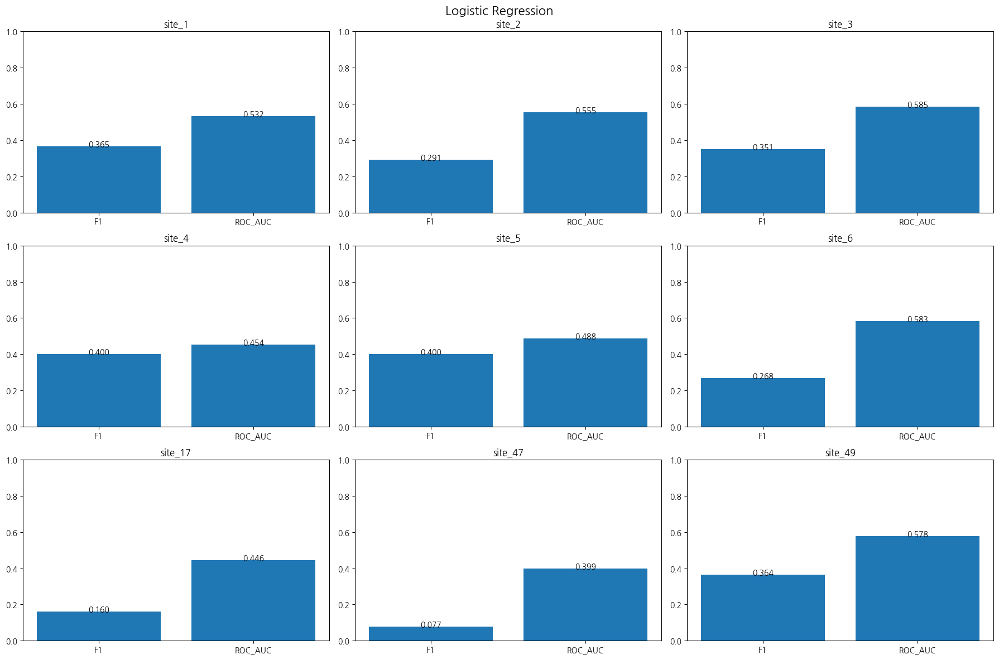

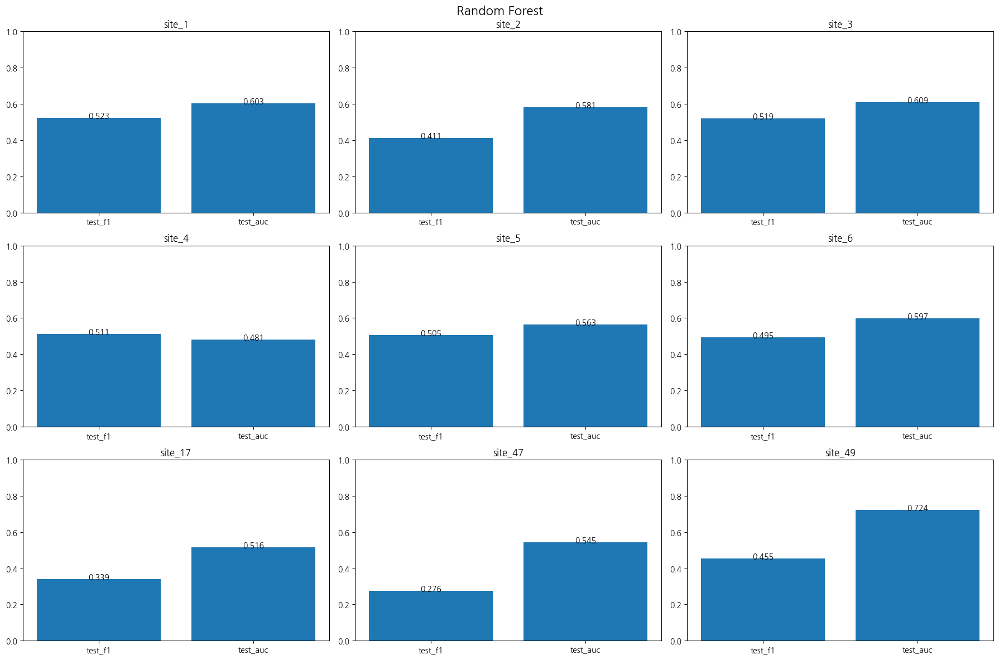

In [ ]:
plot_metric_grid(
    lr_result_df,
    ["F1", "ROC_AUC"],
    title="Logistic Regression"
)

plot_metric_grid(
    rf_result_df,
    ["test_f1", "test_auc"],
    title="Random Forest"
)

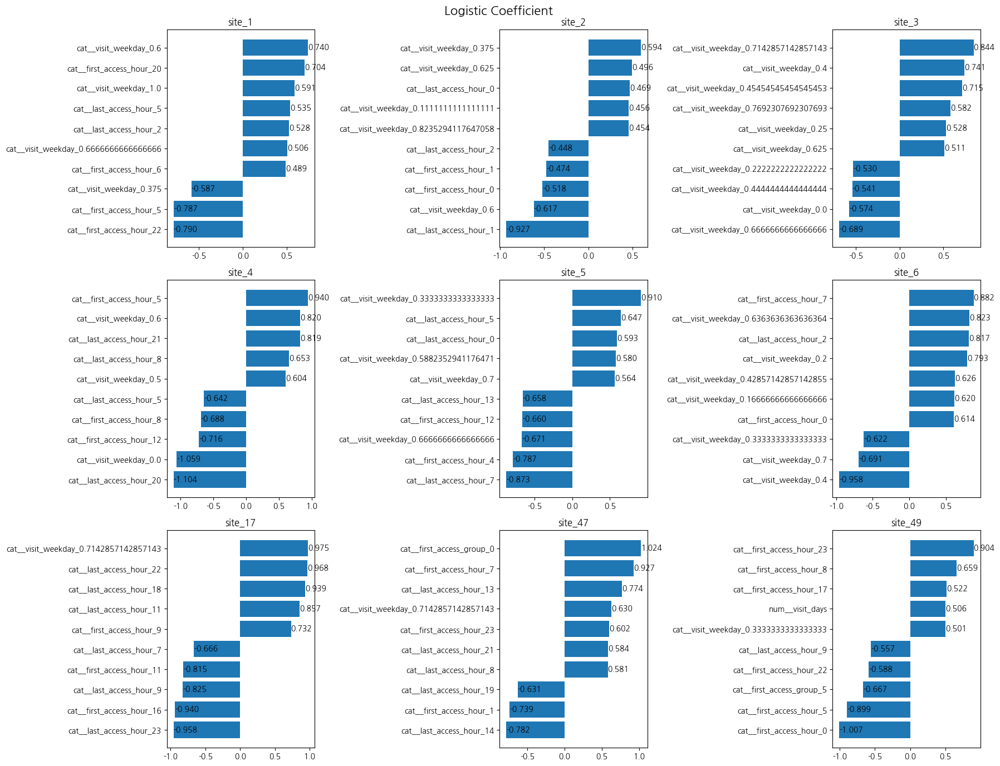

In [ ]:
plot_importance_grid(
    lr_importance,
    metric_col="coef",
    top_n=10,
    title="Logistic Coefficient"
)

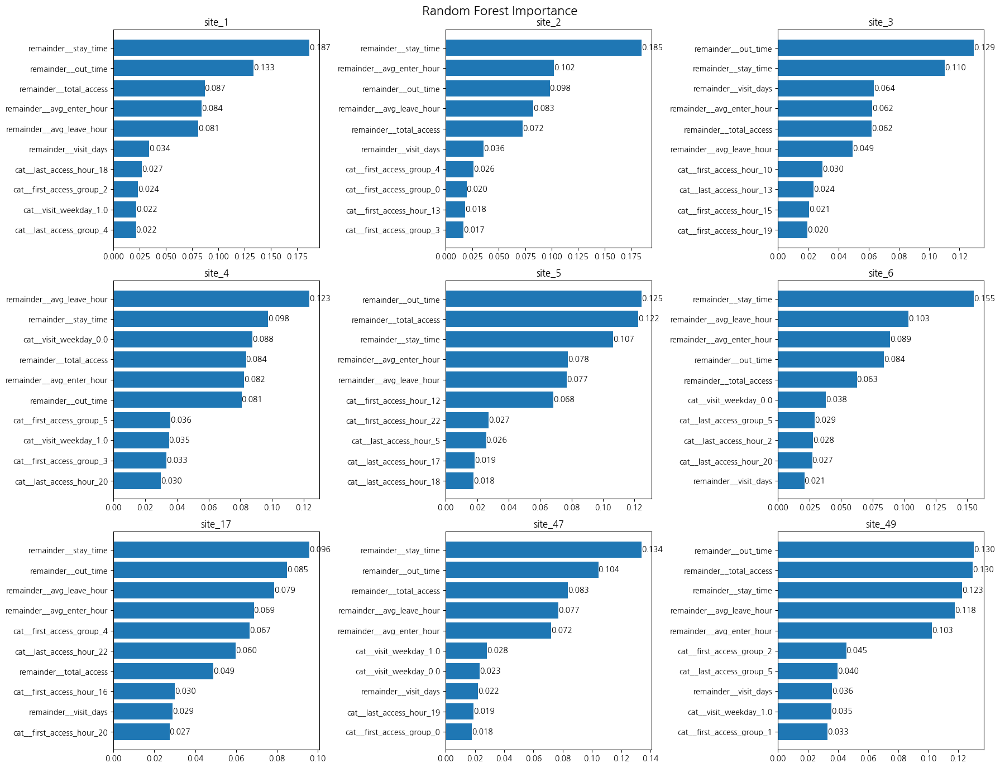

In [ ]:
plot_importance_grid(
    rf_importance,
    metric_col="importance",
    top_n=10,
    title="Random Forest Importance"
)